In [ ]:
# Title: 05_Xu_PCR.ipynb
# Author: Lajoyce Mboning
# Date:2025
# Related publication: Emma K. Costa, and Jingxun Chen, in prep


# Description - Run the PCR clock on Xu et al

# Set-Up

In [1]:
import os
import pandas as pd
from scipy.stats import pearsonr, spearmanr
from scipy.stats import poisson
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso
from numpy import arange
from numpy import absolute
from numpy import mean
from numpy import std
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from scipy.stats import ttest_ind, mannwhitneyu
import random
import itertools

In [2]:
os.chdir("/labs/twc/Emma/Atlas_feature_importance/PCR_outs/Xu_et_al/")

In [3]:
palette = sns.color_palette("deep")
hex_codes = palette.as_hex()

print(hex_codes)

['#4c72b0', '#dd8452', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#8c8c8c', '#ccb974', '#64b5cd']


In [4]:
# List of directories you want to create
dirs_to_create = [
    "./reference/",
    "./predictions/",
    "./gene_sets/",
    "./plots/",
    "./predictions_exhaustive/",
    "./reference_exhaustive/"
]


for d in dirs_to_create:
    os.makedirs(d, exist_ok=True)  # exist_ok=True won't raise an error if it already exists

### Load data

In [5]:
df_norm = pd.read_csv("../../AtlasFiles_forLajoyce_240507/CountsNormDESeq2_AllTissue_240506.csv")

In [6]:
df_norm = df_norm.T

In [7]:
df_norm.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A1_1,23876.707871,687.004459,2181.018965,576.907591,221.294706,884.077854,1368.504075,1348.686639,619.845370,636.359900,...,913.804009,178.356927,1117.483215,243.314079,1718.612117,47.341653,568.099841,3323.824460,1566.678439,358.915791
A1_2,36.845369,407.384647,349.683408,374.015256,493.588906,469.257059,963.541161,1619.805848,453.962755,449.791581,...,774.447946,64.653195,670.168600,107.060129,777.923924,19.465478,672.254187,2691.797529,191.873997,253.746410
A10_1,4821.965545,907.596706,218.510659,554.051370,191.503723,684.175695,1125.288972,662.897504,586.787050,637.527352,...,520.497299,128.487541,1351.165159,112.938093,1122.015404,311.807344,542.593883,2612.307200,408.377598,391.191366
A10_2,4.382338,451.380822,1198.256441,303.633424,289.860362,445.120339,1093.080327,468.284126,709.312721,492.073962,...,1201.386683,131.470142,800.089724,174.667475,1304.058604,28.172173,1264.617561,1144.416288,157.764171,238.524401
A11_1,7011.583272,766.674115,222.103168,627.278822,272.285474,675.602523,1267.567871,975.767056,739.724358,713.703904,...,420.973787,192.365505,1129.101879,109.657631,1059.404232,398.670540,521.338398,1948.746206,360.569160,446.064940


In [8]:
df_norm_frequency = df_norm.div(df_norm.sum(axis=1), axis=0)

In [9]:
df_metadata = pd.read_csv("../../AtlasFiles_forLajoyce_240507/ExperimentDesign_allbatches_combined_v7.csv")

df_metadata.head(3)

,Unnamed: 0,animalID,sex,cohort,age_days,harvest_date,hatch_date,tissue,tissue_grind_date,RNA_extract_date,RNA_batch,RNA_extractor,RNAID,cDNA_batch,plate_well,sampleNames,lib,censored,censor_code,notes
0,A1_1,J9,F,2,155,8/16/22,3/14/22,Gut,NaN,3/8/23,Gut_1,EC,RNA352,1,A1,A1,A1_1,NaN,NaN,NaN
1,A1_2,A01,M,2,78,5/31/22,3/14/22,Bone,4/19/23,4/22/23,Bone_1,EC,RNA572,2,A1,A1,A1_2,NaN,NaN,NaN
2,A10_1,P_1B_10,M,1B,133,1/31/22,9/20/21,Kidney,NaN,3/4/23,Kidney_1,JC,R258,1,A10,A10,A10_1,NaN,NaN,NaN


In [10]:
df_metadata.rename(columns={"Unnamed: 0": "sample"}, inplace=True)

df_metadata.head(3)

,sample,animalID,sex,cohort,age_days,harvest_date,hatch_date,tissue,tissue_grind_date,RNA_extract_date,RNA_batch,RNA_extractor,RNAID,cDNA_batch,plate_well,sampleNames,lib,censored,censor_code,notes
0,A1_1,J9,F,2,155,8/16/22,3/14/22,Gut,NaN,3/8/23,Gut_1,EC,RNA352,1,A1,A1,A1_1,NaN,NaN,NaN
1,A1_2,A01,M,2,78,5/31/22,3/14/22,Bone,4/19/23,4/22/23,Bone_1,EC,RNA572,2,A1,A1,A1_2,NaN,NaN,NaN
2,A10_1,P_1B_10,M,1B,133,1/31/22,9/20/21,Kidney,NaN,3/4/23,Kidney_1,JC,R258,1,A10,A10,A10_1,NaN,NaN,NaN


In [11]:
df_metadata.set_index("sample", inplace=True)

In [12]:
# Merge based on index
combined_df = pd.concat([df_norm_frequency, df_metadata[['sex', 'tissue', 'age_days']]], axis=1)

In [13]:
combined_df["tissue"].value_counts()

Gut           55
Kidney        55
Muscle        55
Spleen        55
SpinalCord    54
Heart         54
Skin          54
Brain         54
Liver         54
Fat           53
Bone          51
Eye           37
Testis        31
Ovary         15
Name: tissue, dtype: int64

In [14]:
df_norm_metadata = pd.concat([df_norm, df_metadata[["sex", "tissue", "age_days"]]], axis=1)

df_norm_metadata.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A1_1,23876.707871,687.004459,2181.018965,576.907591,221.294706,884.077854,1368.504075,1348.686639,619.845370,636.359900,...,243.314079,1718.612117,47.341653,568.099841,3323.824460,1566.678439,358.915791,F,Gut,155
A1_2,36.845369,407.384647,349.683408,374.015256,493.588906,469.257059,963.541161,1619.805848,453.962755,449.791581,...,107.060129,777.923924,19.465478,672.254187,2691.797529,191.873997,253.746410,M,Bone,78
A10_1,4821.965545,907.596706,218.510659,554.051370,191.503723,684.175695,1125.288972,662.897504,586.787050,637.527352,...,112.938093,1122.015404,311.807344,542.593883,2612.307200,408.377598,391.191366,M,Kidney,133
A10_2,4.382338,451.380822,1198.256441,303.633424,289.860362,445.120339,1093.080327,468.284126,709.312721,492.073962,...,174.667475,1304.058604,28.172173,1264.617561,1144.416288,157.764171,238.524401,M,SpinalCord,75
A11_1,7011.583272,766.674115,222.103168,627.278822,272.285474,675.602523,1267.567871,975.767056,739.724358,713.703904,...,109.657631,1059.404232,398.670540,521.338398,1948.746206,360.569160,446.064940,M,Kidney,47


In [15]:
#function to load norm counts
def load_intervention_countdata(tissue):
    file_path = f"../../Data_from_Others/AlanXu_Aging/CountsNormDESeq2_AlanXuAging_{tissue}_250605.csv"
    return pd.read_csv(file_path)

#function to load metadata
def load_intervention_metadata(tissue):
    file_path = f"../../Data_from_Others/AlanXu_Aging/ExperimentDesign_AlanXuAging_update_20250629.csv"
    return pd.read_csv(file_path)

# Spleen

### Prep the data

In [16]:
select_tissue = "Spleen"
tissue_df_norm = df_norm_metadata.loc[df_norm_metadata.iloc[:,-2] == select_tissue]
tissue_df_norm.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A17_2,500.972933,610.959908,255.453620,361.183035,1160.894784,772.037607,1334.035571,796.873376,806.807683,725.204443,...,172.431194,1597.294718,83.022427,485.361878,1625.678454,108.567789,412.273759,F,Spleen,78
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157,M,Spleen,152
A19_2,13.175394,714.765109,185.553462,409.535155,658.769686,637.908646,1812.714586,883.849329,396.359761,586.305020,...,223.981693,1208.842374,45.015929,540.191142,3514.536274,254.724279,603.872212,F,Spleen,155
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909,M,Spleen,47
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715,M,Spleen,102


In [17]:
tissue_df_norm_male = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "M"]
tissue_df_norm_female = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "F"]

tissue_df_norm_male.head(10)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157,M,Spleen,152
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909,M,Spleen,47
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715,M,Spleen,102
B19_2,61.384651,568.164909,193.195103,390.672856,743.277712,683.796461,1412.798672,992.623116,659.528110,827.503163,...,165.595803,1333.807571,66.619001,568.164909,2992.144847,212.704953,549.130909,M,Spleen,78
B20_2,0.787620,631.671479,191.391732,389.872047,827.001312,581.263779,1487.814742,858.506124,671.052493,867.957568,...,207.144138,1233.413386,32.292432,562.360892,3421.422572,289.844269,515.891295,M,Spleen,161
C17_2,9.371713,563.782544,175.103065,314.199020,671.310623,724.088166,1727.354740,1203.032042,588.938195,823.724276,...,138.602708,1260.248818,42.912582,559.343311,2441.577945,279.671656,583.512466,M,Spleen,162
D18_2,72.769424,669.959817,75.175024,451.050146,430.001140,816.701465,2735.769488,585.162390,710.253631,929.163302,...,239.958678,1054.254542,81.189026,529.232172,6908.284043,317.539303,465.483751,M,Spleen,133
D19_2,2.114617,618.173082,179.742458,357.370299,546.276099,552.619950,1518.999990,1342.781894,632.975402,723.199067,...,207.232481,906.465887,48.636195,537.817630,4400.518301,284.063571,457.462178,M,Spleen,134
E17_2,8.779905,976.165773,98.175298,439.793410,467.729471,652.107470,1453.473321,407.068311,866.816050,988.138370,...,328.049168,1309.802153,115.735108,521.207072,8000.887740,629.758622,612.996986,M,Spleen,162
E18_2,81.498647,682.455957,135.577188,300.859490,640.564129,688.549314,1655.108029,1097.565886,695.404340,814.986466,...,167.567311,1971.200911,162.997293,543.070421,1961.299206,121.105466,416.633268,M,Spleen,49


In [18]:
tissue_df_norm_expression_male = tissue_df_norm_male.iloc[:,:-3]
tissue_df_norm_expression_female = tissue_df_norm_female.iloc[:,:-3]

tissue_df_norm_expression_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,955.132396,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,611.783739,99.403562,1347.370095,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,1406.295632,88.899724,1574.995108,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715
B19_2,61.384651,568.164909,193.195103,390.672856,743.277712,683.796461,1412.798672,992.623116,659.528110,827.503163,...,761.360012,116.583252,1200.093719,165.595803,1333.807571,66.619001,568.164909,2992.144847,212.704953,549.130909
B20_2,0.787620,631.671479,191.391732,389.872047,827.001312,581.263779,1487.814742,858.506124,671.052493,867.957568,...,887.648075,68.522966,1338.954506,207.144138,1233.413386,32.292432,562.360892,3421.422572,289.844269,515.891295


In [19]:
tissue_pca_df_male = tissue_df_norm_expression_male.copy()
tissue_pca_df_female = tissue_df_norm_expression_female.copy()

tissue_pca_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,955.132396,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,611.783739,99.403562,1347.370095,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,1406.295632,88.899724,1574.995108,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715
B19_2,61.384651,568.164909,193.195103,390.672856,743.277712,683.796461,1412.798672,992.623116,659.528110,827.503163,...,761.360012,116.583252,1200.093719,165.595803,1333.807571,66.619001,568.164909,2992.144847,212.704953,549.130909
B20_2,0.787620,631.671479,191.391732,389.872047,827.001312,581.263779,1487.814742,858.506124,671.052493,867.957568,...,887.648075,68.522966,1338.954506,207.144138,1233.413386,32.292432,562.360892,3421.422572,289.844269,515.891295


In [20]:
tissue_df_male_age = tissue_df_norm_expression_male.copy()
tissue_df_female_age = tissue_df_norm_expression_female.copy()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,955.132396,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,611.783739,99.403562,1347.370095,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,1406.295632,88.899724,1574.995108,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715


In [21]:
tissue_df_male_age["age"] = tissue_df_norm_male["age_days"].tolist()
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157,152
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,99.403562,1347.370095,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909,47
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,88.899724,1574.995108,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715,102


In [22]:
df_intervention = load_intervention_countdata(select_tissue)

df_intervention.head(5)

,Unnamed: 0,spleen_19,spleen_18,spleen_17,spleen_16,spleen_15,spleen_14,spleen_13,spleen_12,spleen_11,spleen_10,spleen_9,spleen_8,spleen_7,spleen_6,spleen_5,spleen_4,spleen_3,spleen_2,spleen_1
0,nadsyn1,347.156333,329.989506,459.292642,451.777179,243.669068,356.359823,303.544801,436.162377,319.830313,458.824154,515.215488,465.387736,567.972380,124.998383,117.290543,342.633021,253.172467,356.410120,453.794995
1,dnaja3,456.929086,351.052666,393.852530,357.294933,471.850696,319.435794,242.835841,195.598592,421.527509,312.762486,302.636740,281.149570,429.816936,1039.759275,210.465273,248.152819,299.005414,479.890792,671.616592
2,f2r,517.304100,822.633414,616.833654,611.419596,655.634993,585.632288,681.596052,811.621743,389.102316,652.514628,222.003422,301.383820,271.796004,400.562999,350.775456,257.259345,307.735499,46.772982,275.302297
3,LOC107382877,34.303985,21.063160,29.084494,215.028561,115.639558,34.347935,29.434647,78.689089,53.796343,25.402029,12.566231,168.263758,16.253582,965.896594,10.961733,122.938094,283.727765,1609.926028,680.692492
4,fezf1,0.000000,0.000000,0.000000,0.000000,2.064992,22.326158,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [23]:
df_intervention.rename(columns={"Unnamed: 0": "Sample.Name"}, inplace=True)
df_intervention.set_index("Sample.Name", inplace=True)
df_intervention.head(3)

,spleen_19,spleen_18,spleen_17,spleen_16,spleen_15,spleen_14,spleen_13,spleen_12,spleen_11,spleen_10,spleen_9,spleen_8,spleen_7,spleen_6,spleen_5,spleen_4,spleen_3,spleen_2,spleen_1
Sample.Name,,,,,,,,,,,,,,,,,,,
nadsyn1,347.156333,329.989506,459.292642,451.777179,243.669068,356.359823,303.544801,436.162377,319.830313,458.824154,515.215488,465.387736,567.972380,124.998383,117.290543,342.633021,253.172467,356.410120,453.794995
dnaja3,456.929086,351.052666,393.852530,357.294933,471.850696,319.435794,242.835841,195.598592,421.527509,312.762486,302.636740,281.149570,429.816936,1039.759275,210.465273,248.152819,299.005414,479.890792,671.616592
f2r,517.304100,822.633414,616.833654,611.419596,655.634993,585.632288,681.596052,811.621743,389.102316,652.514628,222.003422,301.383820,271.796004,400.562999,350.775456,257.259345,307.735499,46.772982,275.302297


In [24]:
df_intervention = df_intervention.T

df_intervention.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
spleen_19,347.156333,456.929086,517.304100,34.303985,0.0,194.160558,0.0,0.0,620.216057,879.554186,...,164.659130,1030.491722,0.0,304.619391,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464
spleen_18,329.989506,351.052666,822.633414,21.063160,0.0,201.270195,0.0,0.0,379.136879,812.101834,...,73.721060,432.964955,0.0,186.057913,0.0,0.000000,0.000000,1401.870313,201.270195,28.084213
spleen_17,459.292642,393.852530,616.833654,29.084494,0.0,168.447697,0.0,0.0,433.237783,611.986238,...,225.404832,750.743514,0.0,206.621096,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180


In [25]:
# remove outliers
df_intervention = df_intervention.drop('spleen_6')
df_intervention = df_intervention.drop('spleen_2')

In [26]:
df_intervention_age = df_intervention.copy()

In [27]:
df_intervention_metadata = load_intervention_metadata(select_tissue)
df_intervention_metadata.set_index("Sample.Name", inplace=True)
print(df_intervention_metadata.head(1))

                     Run age Assay.Type  AvgSpotLen       Bases  \
Sample.Name                                                       
brain_10     SRR24062662  6w    RNA-Seq         300  3489947700   

                   BIOMATERIAL_PROVIDER   BioProject     BioSample  \
Sample.Name                                                          
brain_10     Dario Valenzano laboratory  PRJNA952180  SAMN34067642   

                       BioSampleModel       Bytes  ...           create_date  \
Sample.Name                                        ...                         
brain_10     Model organism or animal  1264822394  ...  2023-04-04T11:25:00Z   

            version                  Sample_info     sex  SRA.Study  strain  \
Sample.Name                                                                   
brain_10          1  GRZ-AD_8239_6w_Female_Brain  female  SRP430823  GRZ-AD   

            tissue                       file          lib UsedForTraining  
Sample.Name                    

In [28]:
# remove outliers
df_intervention_metadata = df_intervention_metadata.drop('spleen_6')
df_intervention_metadata = df_intervention_metadata.drop('spleen_2')

In [29]:
df_intervention_metadata = df_intervention_metadata[df_intervention_metadata["tissue"] == select_tissue]

df_intervention_metadata.head(5)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
spleen_19,SRR24062664,16w,RNA-Seq,300,7202080500,Dario Valenzano laboratory,PRJNA952180,SAMN34067710,Model organism or animal,2637021082,...,2023-04-04T11:34:00Z,1,GRZ-AD_8241_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062664.featureCounts,SRR24062664,No
spleen_18,SRR24062665,16w,RNA-Seq,300,4519062600,Dario Valenzano laboratory,PRJNA952180,SAMN34067709,Model organism or animal,1749414179,...,2023-04-04T11:26:00Z,1,GRZ-AD_8232_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062665.featureCounts,SRR24062665,No
spleen_17,SRR24062666,16w,RNA-Seq,300,8545333200,Dario Valenzano laboratory,PRJNA952180,SAMN34067708,Model organism or animal,3232351663,...,2023-04-04T11:34:00Z,1,GRZ-AD_8273_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062666.featureCounts,SRR24062666,No
spleen_16,SRR24062667,16w,RNA-Seq,300,4841396400,Dario Valenzano laboratory,PRJNA952180,SAMN34067707,Model organism or animal,1850434347,...,2023-04-04T11:27:00Z,1,GRZ-AD_8249_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062667.featureCounts,SRR24062667,No
spleen_15,SRR24062668,16w,RNA-Seq,300,4942003800,Dario Valenzano laboratory,PRJNA952180,SAMN34067706,Model organism or animal,1899399880,...,2023-04-04T11:28:00Z,1,GRZ-AD_8225_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062668.featureCounts,SRR24062668,No


In [30]:
df_intervention_age = df_intervention_age.loc[df_intervention_metadata.index.tolist(),]

df_intervention_age.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
spleen_19,347.156333,456.929086,517.304100,34.303985,0.000000,194.160558,0.000000,0.0,620.216057,879.554186,...,164.659130,1030.491722,0.0,304.619391,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464
spleen_18,329.989506,351.052666,822.633414,21.063160,0.000000,201.270195,0.000000,0.0,379.136879,812.101834,...,73.721060,432.964955,0.0,186.057913,0.0,0.000000,0.000000,1401.870313,201.270195,28.084213
spleen_17,459.292642,393.852530,616.833654,29.084494,0.000000,168.447697,0.000000,0.0,433.237783,611.986238,...,225.404832,750.743514,0.0,206.621096,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180
spleen_16,451.777179,357.294933,611.419596,215.028561,0.000000,198.738519,0.000000,0.0,412.681077,759.115981,...,188.964493,741.739936,0.0,390.961020,0.0,0.000000,17.376045,1238.043232,184.620482,43.440113
spleen_15,243.669068,471.850696,655.634993,115.639558,2.064992,208.564203,16.519937,0.0,405.770949,615.367647,...,142.484455,556.515372,0.0,356.211138,0.0,0.000000,28.909889,1538.419118,88.794661,64.014755


In [31]:
df_intervention_age["tissue"] = df_intervention_metadata["tissue"].tolist()
df_intervention_age["og_age"] = df_intervention_metadata["age"].tolist()
df_intervention_age["sex"] = df_intervention_metadata["sex"].tolist()

age_mapping = {
    "6w": 42,
    "16w": 112
}

df_intervention_age["age"] = df_intervention_age["og_age"].map(age_mapping)

df_intervention_age.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
spleen_19,347.156333,456.929086,517.304100,34.303985,0.0,194.160558,0.0,0.0,620.216057,879.554186,...,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464,Spleen,16w,female,112
spleen_18,329.989506,351.052666,822.633414,21.063160,0.0,201.270195,0.0,0.0,379.136879,812.101834,...,0.0,0.000000,0.000000,1401.870313,201.270195,28.084213,Spleen,16w,female,112
spleen_17,459.292642,393.852530,616.833654,29.084494,0.0,168.447697,0.0,0.0,433.237783,611.986238,...,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180,Spleen,16w,female,112


In [32]:
df_intervention_age_counts = df_intervention_age.iloc[:,:-4]

df_intervention_age_counts.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
spleen_19,347.156333,456.929086,517.304100,34.303985,0.000000,194.160558,0.000000,0.0,620.216057,879.554186,...,164.659130,1030.491722,0.0,304.619391,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464
spleen_18,329.989506,351.052666,822.633414,21.063160,0.000000,201.270195,0.000000,0.0,379.136879,812.101834,...,73.721060,432.964955,0.0,186.057913,0.0,0.000000,0.000000,1401.870313,201.270195,28.084213
spleen_17,459.292642,393.852530,616.833654,29.084494,0.000000,168.447697,0.000000,0.0,433.237783,611.986238,...,225.404832,750.743514,0.0,206.621096,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180
spleen_16,451.777179,357.294933,611.419596,215.028561,0.000000,198.738519,0.000000,0.0,412.681077,759.115981,...,188.964493,741.739936,0.0,390.961020,0.0,0.000000,17.376045,1238.043232,184.620482,43.440113
spleen_15,243.669068,471.850696,655.634993,115.639558,2.064992,208.564203,16.519937,0.0,405.770949,615.367647,...,142.484455,556.515372,0.0,356.211138,0.0,0.000000,28.909889,1538.419118,88.794661,64.014755


##### Female data prep

In [33]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_counts_female = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_female = df_intervention_age_counts_female.loc[
    df_intervention_age_counts_female.index.isin(female_samples)
]

df_intervention_age_counts_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
spleen_19,347.156333,456.929086,517.304100,34.303985,0.0,194.160558,0.0,0.0,620.216057,879.554186,...,164.659130,1030.491722,0.0,304.619391,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464
spleen_18,329.989506,351.052666,822.633414,21.063160,0.0,201.270195,0.0,0.0,379.136879,812.101834,...,73.721060,432.964955,0.0,186.057913,0.0,0.000000,0.000000,1401.870313,201.270195,28.084213
spleen_17,459.292642,393.852530,616.833654,29.084494,0.0,168.447697,0.0,0.0,433.237783,611.986238,...,225.404832,750.743514,0.0,206.621096,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180


In [34]:
df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
spleen_19,SRR24062664,16w,RNA-Seq,300,7202080500,Dario Valenzano laboratory,PRJNA952180,SAMN34067710,Model organism or animal,2637021082,...,2023-04-04T11:34:00Z,1,GRZ-AD_8241_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062664.featureCounts,SRR24062664,No
spleen_18,SRR24062665,16w,RNA-Seq,300,4519062600,Dario Valenzano laboratory,PRJNA952180,SAMN34067709,Model organism or animal,1749414179,...,2023-04-04T11:26:00Z,1,GRZ-AD_8232_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062665.featureCounts,SRR24062665,No
spleen_17,SRR24062666,16w,RNA-Seq,300,8545333200,Dario Valenzano laboratory,PRJNA952180,SAMN34067708,Model organism or animal,3232351663,...,2023-04-04T11:34:00Z,1,GRZ-AD_8273_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062666.featureCounts,SRR24062666,No


##### Male data prep

In [35]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
spleen_14,356.359823,319.435794,585.632288,34.347935,22.326158,326.305381,0.000000,0.0,392.425155,1028.720647,...,230.131163,349.490237,1.717397,281.653065,0.0,0.000000,38.641427,1389.373962,161.435294,24.043554
spleen_13,303.544801,242.835841,681.596052,29.434647,0.000000,266.751491,0.000000,0.0,479.232852,1361.352439,...,130.616248,666.878729,0.000000,300.785302,0.0,0.000000,60.708960,3614.022793,122.337753,18.396655
spleen_12,436.162377,195.598592,811.621743,78.689089,0.000000,256.301603,20.983757,0.0,495.366548,904.549809,...,293.772598,632.510389,0.000000,404.686742,0.0,4.496519,25.480276,1601.510309,254.802763,54.707652


In [36]:
df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
spleen_14,SRR24062669,16w,RNA-Seq,300,5680916400,Dario Valenzano laboratory,PRJNA952180,SAMN34067705,Model organism or animal,2175814526,...,2023-04-04T11:28:00Z,1,GRZ-AD_8244_16w_Male_Spleen,male,SRP430823,GRZ-AD,Spleen,SRR24062669.featureCounts,SRR24062669,No
spleen_13,SRR24062670,16w,RNA-Seq,300,5234411100,Dario Valenzano laboratory,PRJNA952180,SAMN34067704,Model organism or animal,2023535859,...,2023-04-04T11:31:00Z,1,GRZ-AD_8245_16w_Male_Spleen,male,SRP430823,GRZ-AD,Spleen,SRR24062670.featureCounts,SRR24062670,No
spleen_12,SRR24062671,16w,RNA-Seq,300,6498343200,Dario Valenzano laboratory,PRJNA952180,SAMN34067703,Model organism or animal,2487684570,...,2023-04-04T11:31:00Z,1,GRZ-AD_8222_16w_Male_Spleen,male,SRP430823,GRZ-AD,Spleen,SRR24062671.featureCounts,SRR24062671,No


In [37]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [38]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,955.132396,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157
A20_2,263.871273,759.985412,123.802618,364.178503,591.903026,819.627549,1278.691271,659.678182,647.930488,984.095261,...,611.783739,99.403562,1347.370095,136.453980,1659.135811,187.963098,445.508690,2697.451196,178.022742,395.806909
B17_2,116.199639,712.597787,111.299654,216.299328,492.798469,678.997891,1679.294784,643.298002,613.198096,769.997609,...,1406.295632,88.899724,1574.995108,265.999174,1023.396821,80.499750,521.498380,10473.367471,505.398430,413.698715
B19_2,61.384651,568.164909,193.195103,390.672856,743.277712,683.796461,1412.798672,992.623116,659.528110,827.503163,...,761.360012,116.583252,1200.093719,165.595803,1333.807571,66.619001,568.164909,2992.144847,212.704953,549.130909
B20_2,0.787620,631.671479,191.391732,389.872047,827.001312,581.263779,1487.814742,858.506124,671.052493,867.957568,...,887.648075,68.522966,1338.954506,207.144138,1233.413386,32.292432,562.360892,3421.422572,289.844269,515.891295


In [39]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
spleen_14,22.326158,90.163329,131.380851,121.935169,95.315519,451.675343,590.784478,471.425405,326.305381,231.848560,...,550.425655,52.380601,2740.965196,66.119774,425.914391,0.000000,609.675843,1033.014139,1860.799367,1201.319019
spleen_13,68.067622,85.544444,57.029629,105.780764,262.152328,272.270488,632.844918,310.903462,275.029986,69.907287,...,670.558060,24.835484,1870.939771,115.898924,363.333928,0.000000,688.034881,988.820184,1092.761282,1199.461879
spleen_12,133.396741,172.366575,108.665884,61.452431,212.085829,280.283040,806.375803,355.974449,263.046382,143.139199,...,799.631024,14.988398,2232.521857,87.682127,504.359587,19.484917,676.726162,1038.695970,1225.301523,1367.691302
spleen_11,145.913368,122.331410,198.972775,112.751239,129.700772,504.064364,744.305566,260.875416,251.295246,39.794555,...,521.750833,45.690045,2440.732709,48.637789,593.970581,0.000000,591.022836,790.732547,2158.486143,1321.326614
spleen_10,1.587627,225.443010,58.742193,88.907103,147.649295,323.875874,465.968475,465.174662,311.174859,169.876071,...,654.896068,0.000000,2259.986795,123.834893,648.545561,15.876268,381.030440,995.442024,1494.750662,1741.626635


### Sex-Combined

In [40]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_norm.columns.intersection(df_intervention.columns)

# Select only the common columns from both DataFrames
tissue_df_norm_common = tissue_df_norm[common_columns]
df_intervention_common = df_intervention[common_columns]

In [41]:
tissue_df_norm_common.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A17_2,500.972933,610.959908,255.453620,361.183035,1160.894784,772.037607,1334.035571,796.873376,806.807683,725.204443,...,503.101713,137.661117,1245.336398,172.431194,1597.294718,83.022427,485.361878,1625.678454,108.567789,412.273759
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,955.132396,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157
A19_2,13.175394,714.765109,185.553462,409.535155,658.769686,637.908646,1812.714586,883.849329,396.359761,586.305020,...,1167.120293,96.619554,1352.673755,223.981693,1208.842374,45.015929,540.191142,3514.536274,254.724279,603.872212


In [42]:
df_intervention_common.head(3)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
spleen_19,8.232957,203.079594,213.370789,216.115108,104.284116,315.596666,606.494462,372.541282,209.940391,252.477333,...,625.018614,26.071029,2283.273270,107.714514,414.392144,0.000000,616.099578,990.013019,1376.961975,1674.720569
spleen_18,21.063160,282.012308,182.547386,0.000000,21.063160,547.642159,278.501782,140.421066,112.336853,212.971951,...,762.954461,11.701756,2284.182680,37.445618,264.459675,0.000000,898.694825,1249.747491,1727.179117,1160.814149
spleen_17,29.084494,202.985535,195.108484,150.269888,151.481742,346.590226,691.968598,269.031574,159.358793,124.215029,...,622.892924,14.542247,3036.905967,92.706826,395.064384,42.414888,499.889749,1405.750567,2911.479085,1674.782141


##### Calibration

In [43]:
all_samples = df_intervention_age.index
all_samples

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
spleen_18,329.989506,351.052666,822.633414,21.063160,0.0,201.270195,0.0,0.0,379.136879,812.101834,...,0.0,0.0,0.000000,1401.870313,201.270195,28.084213,Spleen,16w,female,112
spleen_13,303.544801,242.835841,681.596052,29.434647,0.0,266.751491,0.0,0.0,479.232852,1361.352439,...,0.0,0.0,60.708960,3614.022793,122.337753,18.396655,Spleen,16w,male,112
spleen_9,515.215488,302.636740,222.003422,12.566231,0.0,249.230256,0.0,0.0,508.932372,733.030166,...,0.0,0.0,46.076182,3333.192882,206.295632,48.170554,Spleen,6w,female,42


In [44]:
df_intervention_train = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
spleen_18,329.989506,351.052666,822.633414,21.063160,0.0,201.270195,0.0,0.0,379.136879,812.101834,...,432.964955,0.0,186.057913,0.0,0.0,0.00000,1401.870313,201.270195,28.084213,112
spleen_13,303.544801,242.835841,681.596052,29.434647,0.0,266.751491,0.0,0.0,479.232852,1361.352439,...,666.878729,0.0,300.785302,0.0,0.0,60.70896,3614.022793,122.337753,18.396655,112


In [45]:
tissue_df_age = tissue_df_norm.drop(tissue_df_norm.columns[[-2,-3]], axis=1)
tissue_df_age = tissue_df_age.rename(columns={'age_days': 'age'})
tissue_df_age.head(1)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A17_2,500.972933,610.959908,255.45362,361.183035,1160.894784,772.037607,1334.035571,796.873376,806.807683,725.204443,...,137.661117,1245.336398,172.431194,1597.294718,83.022427,485.361878,1625.678454,108.567789,412.273759,78


In [46]:
#combine the dataframes
atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train], axis=0)

atlas_plus_intervention.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A17_2,500.972933,610.959908,255.453620,361.183035,1160.894784,772.037607,1334.035571,796.873376,806.807683,725.204443,...,137.661117,1245.336398,172.431194,1597.294718,83.022427,485.361878,1625.678454,108.567789,412.273759,78
A18_2,127.857810,563.956610,89.154905,447.847896,407.071622,689.741050,2365.715045,958.588013,563.956610,796.865161,...,143.062522,1398.833553,174.854194,1036.684945,17.278082,632.377817,4201.338522,395.322526,494.153157,152
A19_2,13.175394,714.765109,185.553462,409.535155,658.769686,637.908646,1812.714586,883.849329,396.359761,586.305020,...,96.619554,1352.673755,223.981693,1208.842374,45.015929,540.191142,3514.536274,254.724279,603.872212,155


In [47]:
#all not in select_train_samples
test_samples = [s for s in all_samples if s not in select_train_samples]
test_samples

['spleen_19',
 'spleen_17',
 'spleen_16',
 'spleen_15',
 'spleen_14',
 'spleen_12',
 'spleen_11',
 'spleen_10',
 'spleen_8',
 'spleen_5',
 'spleen_4',
 'spleen_3',
 'spleen_1']

In [48]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test = df_intervention_age.loc[
    df_intervention_age.index.isin(test_samples)
]

df_intervention_test.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
spleen_19,347.156333,456.929086,517.304100,34.303985,0.0,194.160558,0.0,0.0,620.216057,879.554186,...,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464,Spleen,16w,female,112
spleen_17,459.292642,393.852530,616.833654,29.084494,0.0,168.447697,0.0,0.0,433.237783,611.986238,...,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180,Spleen,16w,female,112
spleen_16,451.777179,357.294933,611.419596,215.028561,0.0,198.738519,0.0,0.0,412.681077,759.115981,...,0.0,0.000000,17.376045,1238.043232,184.620482,43.440113,Spleen,16w,female,112


In [49]:
df_intervention_test = df_intervention_test.drop(df_intervention_test.columns[[-2,-3, -4]], axis=1)
df_intervention_test.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
spleen_19,347.156333,456.929086,517.304100,34.303985,0.0,194.160558,0.0,0.0,620.216057,879.554186,...,1030.491722,0.0,304.619391,0.0,17.838072,50.769898,1918.964945,142.704579,38.420464,112
spleen_17,459.292642,393.852530,616.833654,29.084494,0.0,168.447697,0.0,0.0,433.237783,611.986238,...,750.743514,0.0,206.621096,0.0,9.694831,43.626742,1442.712112,266.607866,39.991180,112


In [50]:
#check cols ordered the same
df_intervention_test = df_intervention_test[atlas_plus_intervention.columns]

In [51]:
#subset your metadata
df_intervention_test_metadata = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(test_samples)
]

df_intervention_test_metadata.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
spleen_19,SRR24062664,16w,RNA-Seq,300,7202080500,Dario Valenzano laboratory,PRJNA952180,SAMN34067710,Model organism or animal,2637021082,...,2023-04-04T11:34:00Z,1,GRZ-AD_8241_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062664.featureCounts,SRR24062664,No
spleen_17,SRR24062666,16w,RNA-Seq,300,8545333200,Dario Valenzano laboratory,PRJNA952180,SAMN34067708,Model organism or animal,3232351663,...,2023-04-04T11:34:00Z,1,GRZ-AD_8273_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062666.featureCounts,SRR24062666,No
spleen_16,SRR24062667,16w,RNA-Seq,300,4841396400,Dario Valenzano laboratory,PRJNA952180,SAMN34067707,Model organism or animal,1850434347,...,2023-04-04T11:27:00Z,1,GRZ-AD_8249_16w_Female_Spleen,female,SRP430823,GRZ-AD,Spleen,SRR24062667.featureCounts,SRR24062667,No


In [52]:
age = atlas_plus_intervention['age']
X = atlas_plus_intervention.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(59, 25122)
(13, 25122)


Components: 1
              y_pred
spleen_19  90.493086
spleen_17  90.897103
spleen_16  90.296347
spleen_15  90.701268
spleen_14  90.604787
spleen_12  91.067466
spleen_11  90.912159
spleen_10  90.719665
spleen_8   91.999221
spleen_5   90.433696
spleen_4   90.942153
spleen_3   91.722188
spleen_1   91.130429
              y_pred  age
spleen_19  90.493086  16w
spleen_17  90.897103  16w
spleen_16  90.296347  16w
spleen_15  90.701268  16w
spleen_14  90.604787  16w
spleen_12  91.067466  16w
spleen_11  90.912159  16w
spleen_10  90.719665  16w
spleen_8   91.999221   6w
spleen_5   90.433696   6w
spleen_4   90.942153   6w
spleen_3   91.722188   6w
spleen_1   91.130429   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


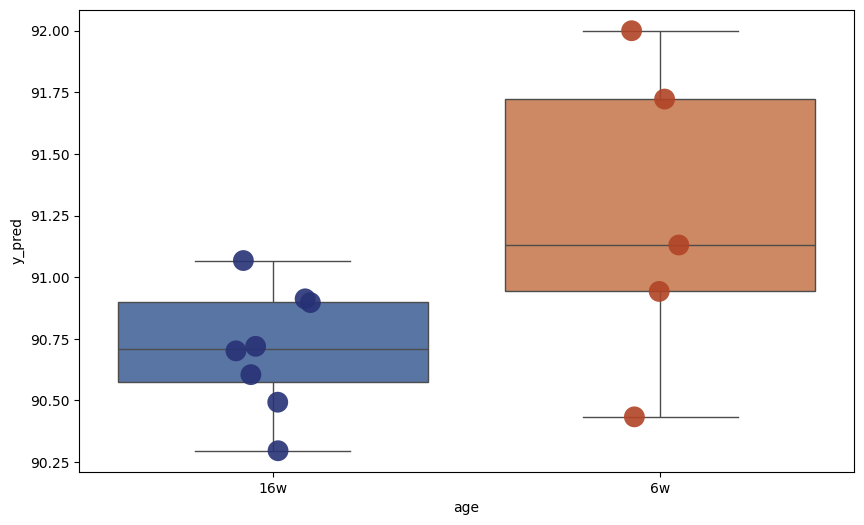

Components: 2
              y_pred
spleen_19  93.882613
spleen_17  95.390751
spleen_16  94.557830
spleen_15  94.075271
spleen_14  94.649880
spleen_12  94.691864
spleen_11  95.305649
spleen_10  94.416452
spleen_8   95.086288
spleen_5   93.925834
spleen_4   94.480231
spleen_3   94.248258
spleen_1   94.778332
              y_pred  age
spleen_19  93.882613  16w
spleen_17  95.390751  16w
spleen_16  94.557830  16w
spleen_15  94.075271  16w
spleen_14  94.649880  16w
spleen_12  94.691864  16w
spleen_11  95.305649  16w
spleen_10  94.416452  16w
spleen_8   95.086288   6w
spleen_5   93.925834   6w
spleen_4   94.480231   6w
spleen_3   94.248258   6w
spleen_1   94.778332   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


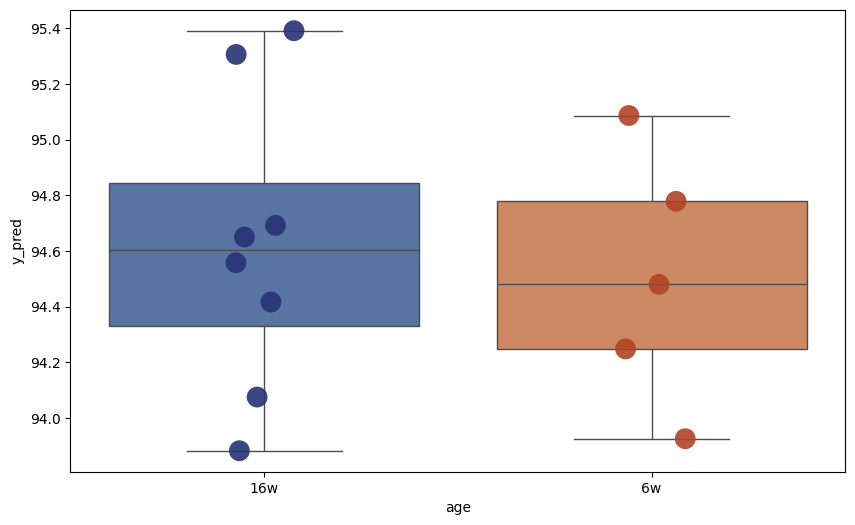

Components: 3
               y_pred
spleen_19  106.186012
spleen_17   98.589417
spleen_16  105.529329
spleen_15   97.191312
spleen_14  105.699180
spleen_12  102.036116
spleen_11  102.877825
spleen_10   98.465204
spleen_8    92.246155
spleen_5    91.348196
spleen_4    93.060944
spleen_3    95.907789
spleen_1   111.744683
               y_pred  age
spleen_19  106.186012  16w
spleen_17   98.589417  16w
spleen_16  105.529329  16w
spleen_15   97.191312  16w
spleen_14  105.699180  16w
spleen_12  102.036116  16w
spleen_11  102.877825  16w
spleen_10   98.465204  16w
spleen_8    92.246155   6w
spleen_5    91.348196   6w
spleen_4    93.060944   6w
spleen_3    95.907789   6w
spleen_1   111.744683   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


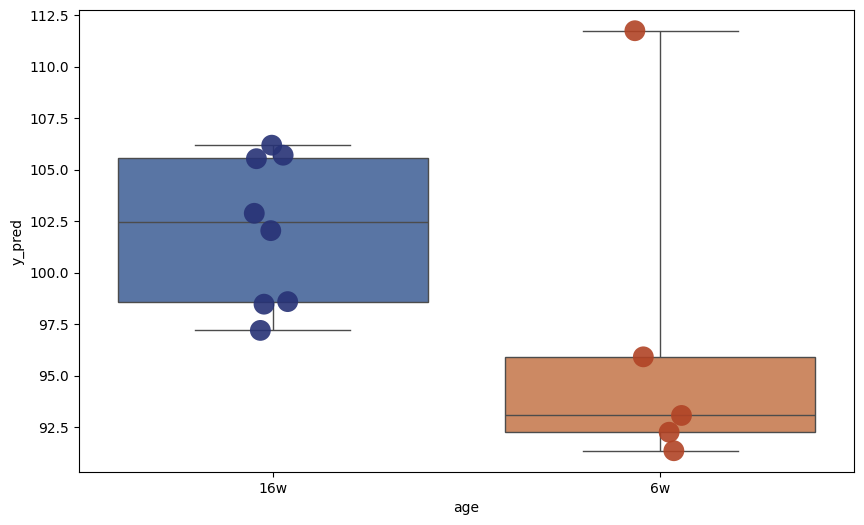

Components: 4
               y_pred
spleen_19  106.457888
spleen_17   98.271065
spleen_16  108.204257
spleen_15   95.543590
spleen_14  107.291779
spleen_12  100.952304
spleen_11  105.562168
spleen_10   98.625781
spleen_8    88.150642
spleen_5    87.762572
spleen_4    90.974748
spleen_3    91.353941
spleen_1   127.020766
               y_pred  age
spleen_19  106.457888  16w
spleen_17   98.271065  16w
spleen_16  108.204257  16w
spleen_15   95.543590  16w
spleen_14  107.291779  16w
spleen_12  100.952304  16w
spleen_11  105.562168  16w
spleen_10   98.625781  16w
spleen_8    88.150642   6w
spleen_5    87.762572   6w
spleen_4    90.974748   6w
spleen_3    91.353941   6w
spleen_1   127.020766   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


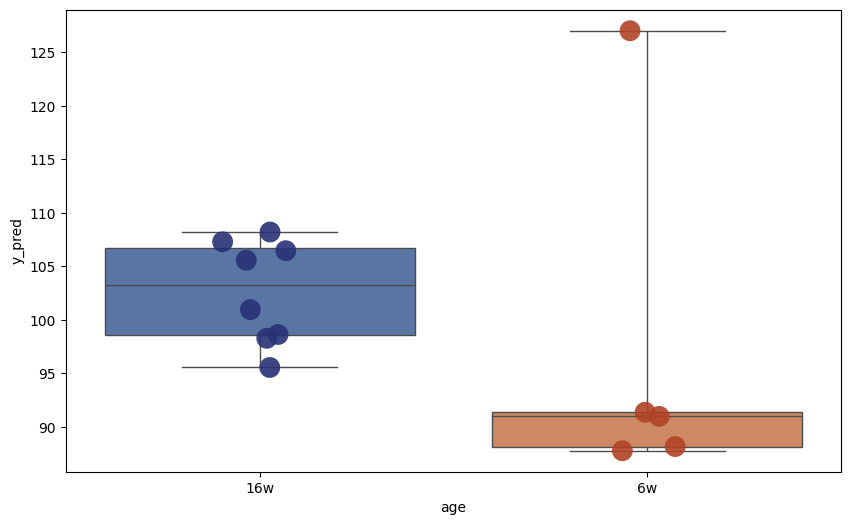

Components: 5
               y_pred
spleen_19  107.198549
spleen_17  101.341281
spleen_16  112.982191
spleen_15   97.300707
spleen_14  112.152305
spleen_12  100.461894
spleen_11  113.570223
spleen_10  100.644103
spleen_8    72.568867
spleen_5    82.836014
spleen_4    72.990330
spleen_3    77.099305
spleen_1    83.343759
               y_pred  age
spleen_19  107.198549  16w
spleen_17  101.341281  16w
spleen_16  112.982191  16w
spleen_15   97.300707  16w
spleen_14  112.152305  16w
spleen_12  100.461894  16w
spleen_11  113.570223  16w
spleen_10  100.644103  16w
spleen_8    72.568867   6w
spleen_5    82.836014   6w
spleen_4    72.990330   6w
spleen_3    77.099305   6w
spleen_1    83.343759   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


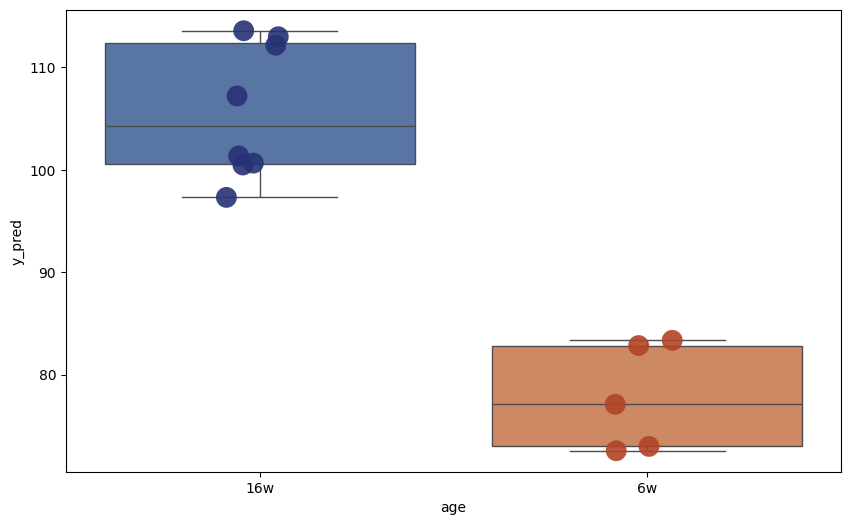

Components: 6
              y_pred
spleen_19  93.725602
spleen_17  87.596761
spleen_16  95.342959
spleen_15  86.131310
spleen_14  98.667631
spleen_12  87.384967
spleen_11  94.092762
spleen_10  90.334933
spleen_8   38.873145
spleen_5   67.184436
spleen_4   45.086623
spleen_3   57.301217
spleen_1   -9.911338
              y_pred  age
spleen_19  93.725602  16w
spleen_17  87.596761  16w
spleen_16  95.342959  16w
spleen_15  86.131310  16w
spleen_14  98.667631  16w
spleen_12  87.384967  16w
spleen_11  94.092762  16w
spleen_10  90.334933  16w
spleen_8   38.873145   6w
spleen_5   67.184436   6w
spleen_4   45.086623   6w
spleen_3   57.301217   6w
spleen_1   -9.911338   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


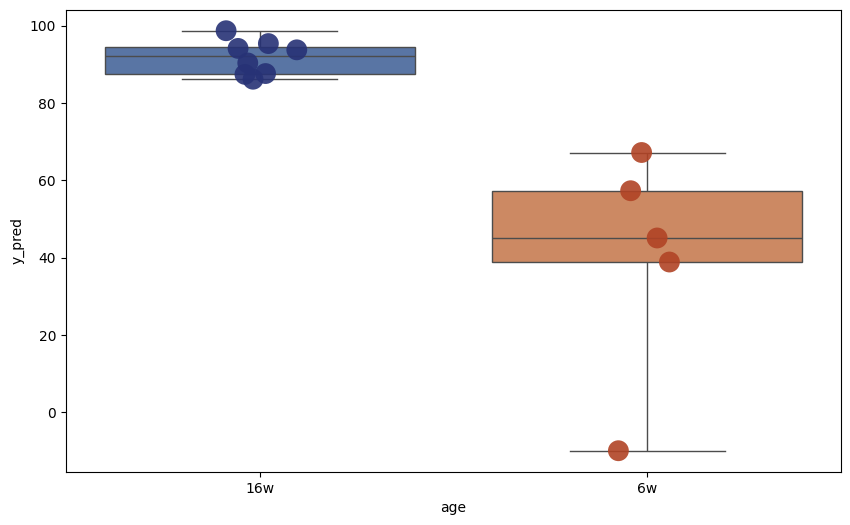

Components: 7
              y_pred
spleen_19  92.946532
spleen_17  87.613230
spleen_16  95.797901
spleen_15  85.466458
spleen_14  98.449040
spleen_12  85.503580
spleen_11  93.848332
spleen_10  88.420035
spleen_8   36.452988
spleen_5   64.746203
spleen_4   44.097291
spleen_3   54.272910
spleen_1   -9.114067
              y_pred  age
spleen_19  92.946532  16w
spleen_17  87.613230  16w
spleen_16  95.797901  16w
spleen_15  85.466458  16w
spleen_14  98.449040  16w
spleen_12  85.503580  16w
spleen_11  93.848332  16w
spleen_10  88.420035  16w
spleen_8   36.452988   6w
spleen_5   64.746203   6w
spleen_4   44.097291   6w
spleen_3   54.272910   6w
spleen_1   -9.114067   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


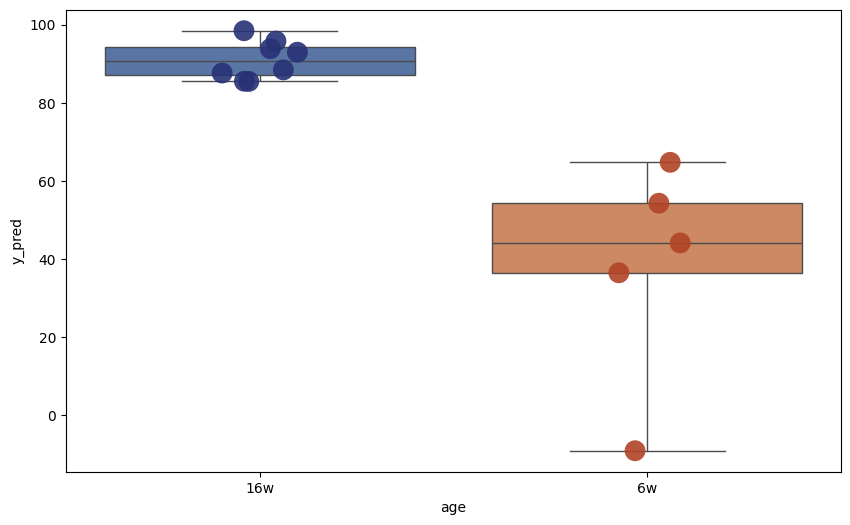

Components: 8
               y_pred
spleen_19   93.673434
spleen_17   93.423418
spleen_16  101.947045
spleen_15   89.672762
spleen_14  103.440729
spleen_12   88.278990
spleen_11  101.386546
spleen_10   91.143644
spleen_8    30.012884
spleen_5    66.484522
spleen_4    36.034634
spleen_3    52.570937
spleen_1   -20.113459
               y_pred  age
spleen_19   93.673434  16w
spleen_17   93.423418  16w
spleen_16  101.947045  16w
spleen_15   89.672762  16w
spleen_14  103.440729  16w
spleen_12   88.278990  16w
spleen_11  101.386546  16w
spleen_10   91.143644  16w
spleen_8    30.012884   6w
spleen_5    66.484522   6w
spleen_4    36.034634   6w
spleen_3    52.570937   6w
spleen_1   -20.113459   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


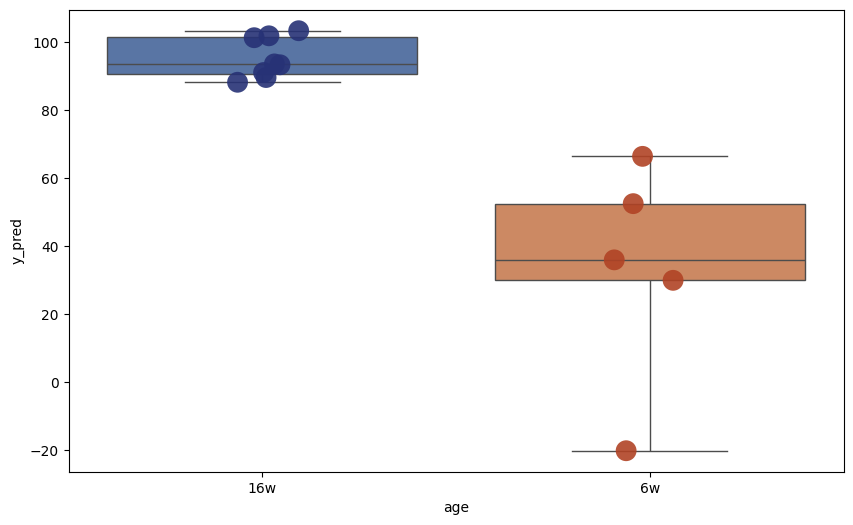

Components: 9
               y_pred
spleen_19   92.540535
spleen_17   95.091416
spleen_16  100.295293
spleen_15   89.949253
spleen_14   98.931190
spleen_12   86.392325
spleen_11   96.493015
spleen_10   90.066616
spleen_8    33.646257
spleen_5    65.351008
spleen_4    40.893188
spleen_3    54.683109
spleen_1   -19.390186
               y_pred  age
spleen_19   92.540535  16w
spleen_17   95.091416  16w
spleen_16  100.295293  16w
spleen_15   89.949253  16w
spleen_14   98.931190  16w
spleen_12   86.392325  16w
spleen_11   96.493015  16w
spleen_10   90.066616  16w
spleen_8    33.646257   6w
spleen_5    65.351008   6w
spleen_4    40.893188   6w
spleen_3    54.683109   6w
spleen_1   -19.390186   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


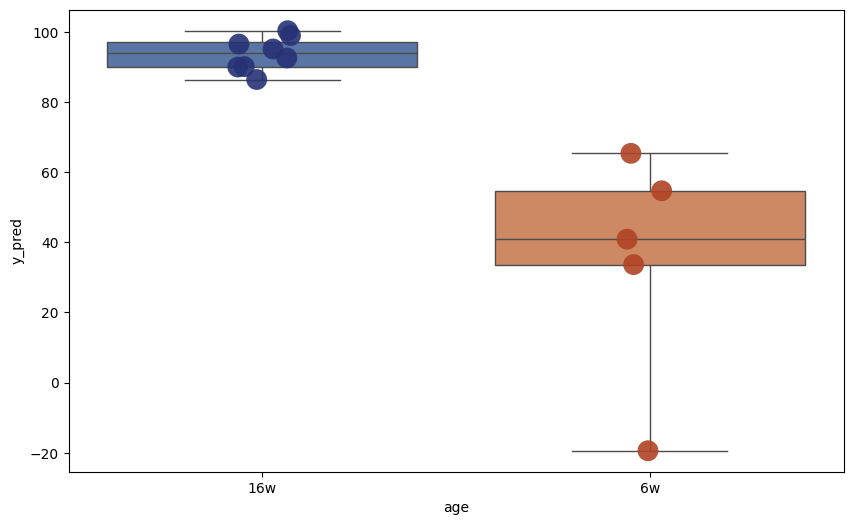

Components: 10
               y_pred
spleen_19   96.610886
spleen_17  102.358236
spleen_16  103.094048
spleen_15   95.312192
spleen_14   99.025632
spleen_12   92.761228
spleen_11   98.560283
spleen_10   96.653653
spleen_8    29.551713
spleen_5    62.566377
spleen_4    42.514926
spleen_3    50.982623
spleen_1   -18.408410
               y_pred  age
spleen_19   96.610886  16w
spleen_17  102.358236  16w
spleen_16  103.094048  16w
spleen_15   95.312192  16w
spleen_14   99.025632  16w
spleen_12   92.761228  16w
spleen_11   98.560283  16w
spleen_10   96.653653  16w
spleen_8    29.551713   6w
spleen_5    62.566377   6w
spleen_4    42.514926   6w
spleen_3    50.982623   6w
spleen_1   -18.408410   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


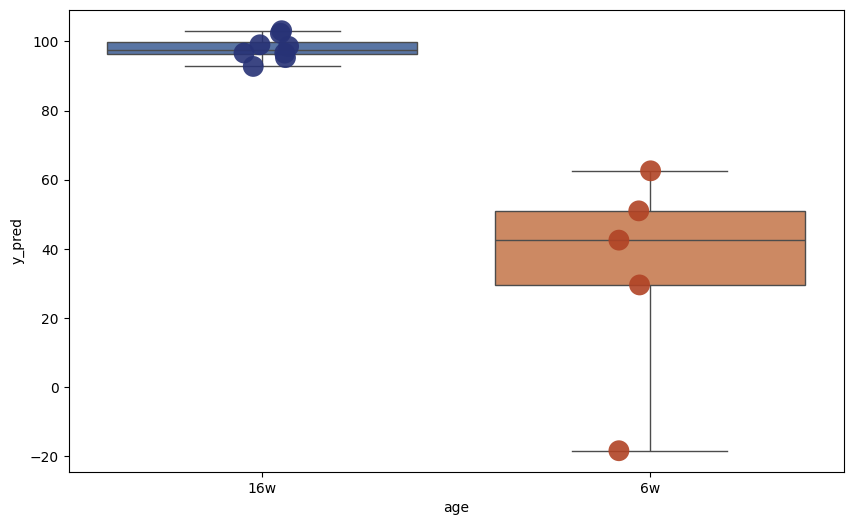

Components: 11
               y_pred
spleen_19   96.095838
spleen_17  104.207752
spleen_16  104.668344
spleen_15   95.325456
spleen_14  100.037288
spleen_12   93.480322
spleen_11   97.491481
spleen_10   96.166791
spleen_8    24.195996
spleen_5    64.088908
spleen_4    40.450990
spleen_3    48.547949
spleen_1   -15.405802
               y_pred  age
spleen_19   96.095838  16w
spleen_17  104.207752  16w
spleen_16  104.668344  16w
spleen_15   95.325456  16w
spleen_14  100.037288  16w
spleen_12   93.480322  16w
spleen_11   97.491481  16w
spleen_10   96.166791  16w
spleen_8    24.195996   6w
spleen_5    64.088908   6w
spleen_4    40.450990   6w
spleen_3    48.547949   6w
spleen_1   -15.405802   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


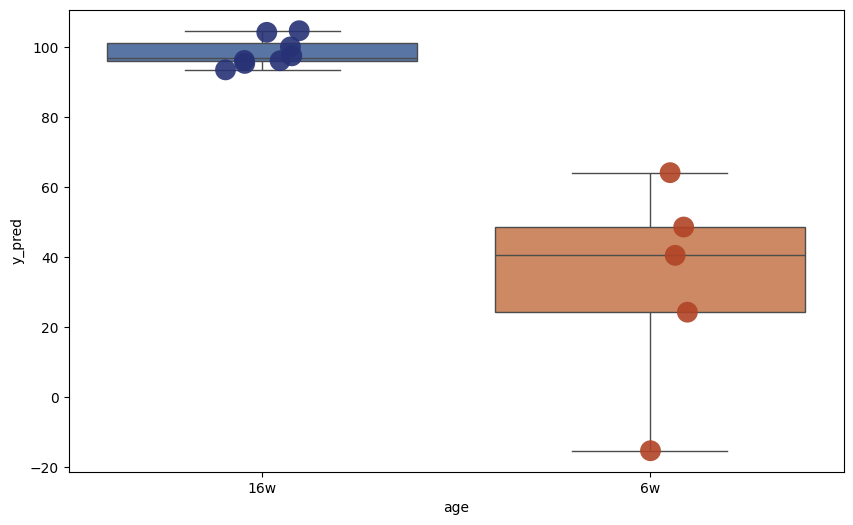

Components: 12
               y_pred
spleen_19   88.220982
spleen_17  103.192984
spleen_16  101.667494
spleen_15   94.630573
spleen_14   94.311777
spleen_12   86.704683
spleen_11   91.265668
spleen_10   95.005182
spleen_8    43.955335
spleen_5    48.933710
spleen_4    55.866218
spleen_3    53.834289
spleen_1    19.853681
               y_pred  age
spleen_19   88.220982  16w
spleen_17  103.192984  16w
spleen_16  101.667494  16w
spleen_15   94.630573  16w
spleen_14   94.311777  16w
spleen_12   86.704683  16w
spleen_11   91.265668  16w
spleen_10   95.005182  16w
spleen_8    43.955335   6w
spleen_5    48.933710   6w
spleen_4    55.866218   6w
spleen_3    53.834289   6w
spleen_1    19.853681   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


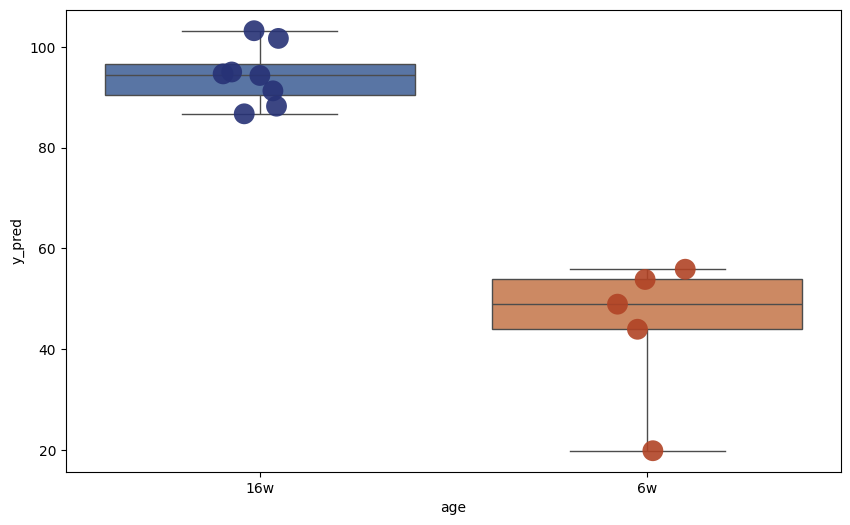

Components: 13
              y_pred
spleen_19  80.943377
spleen_17  96.020342
spleen_16  92.380451
spleen_15  89.492805
spleen_14  88.981030
spleen_12  83.839164
spleen_11  83.858495
spleen_10  90.479638
spleen_8   38.920913
spleen_5   46.198637
spleen_4   50.739169
spleen_3   50.508641
spleen_1    1.268053
              y_pred  age
spleen_19  80.943377  16w
spleen_17  96.020342  16w
spleen_16  92.380451  16w
spleen_15  89.492805  16w
spleen_14  88.981030  16w
spleen_12  83.839164  16w
spleen_11  83.858495  16w
spleen_10  90.479638  16w
spleen_8   38.920913   6w
spleen_5   46.198637   6w
spleen_4   50.739169   6w
spleen_3   50.508641   6w
spleen_1    1.268053   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


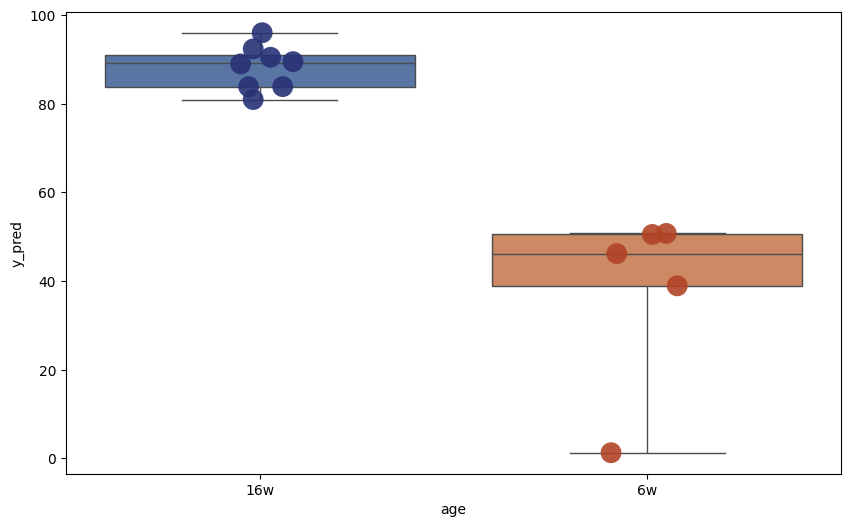

Components: 14
               y_pred
spleen_19   88.865523
spleen_17  102.803830
spleen_16  101.097324
spleen_15   94.647058
spleen_14   95.196601
spleen_12   89.754880
spleen_11   89.442449
spleen_10   93.928367
spleen_8    44.959357
spleen_5    47.562934
spleen_4    56.628849
spleen_3    49.563782
spleen_1    22.134819
               y_pred  age
spleen_19   88.865523  16w
spleen_17  102.803830  16w
spleen_16  101.097324  16w
spleen_15   94.647058  16w
spleen_14   95.196601  16w
spleen_12   89.754880  16w
spleen_11   89.442449  16w
spleen_10   93.928367  16w
spleen_8    44.959357   6w
spleen_5    47.562934   6w
spleen_4    56.628849   6w
spleen_3    49.563782   6w
spleen_1    22.134819   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


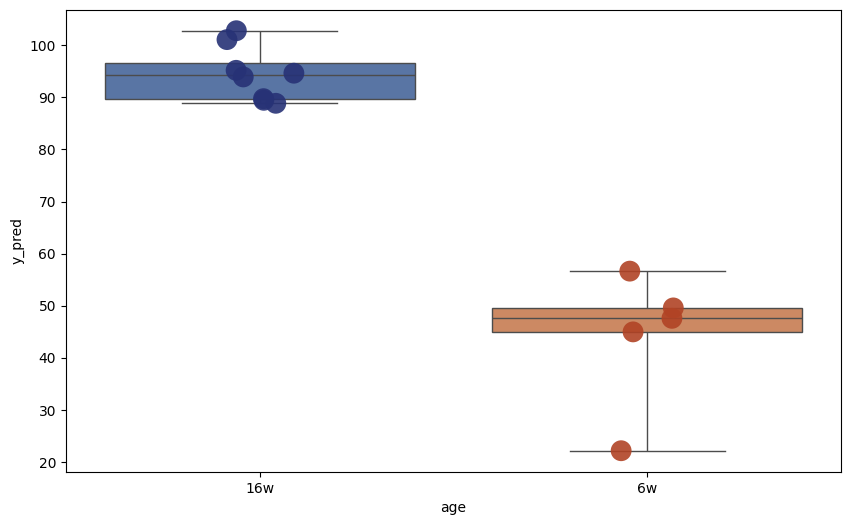

Components: 15
               y_pred
spleen_19   88.189441
spleen_17  102.375554
spleen_16  100.394352
spleen_15   94.452230
spleen_14   94.306441
spleen_12   89.499811
spleen_11   88.751586
spleen_10   93.891444
spleen_8    45.559014
spleen_5    47.714899
spleen_4    57.006740
spleen_3    49.575678
spleen_1    22.659512
               y_pred  age
spleen_19   88.189441  16w
spleen_17  102.375554  16w
spleen_16  100.394352  16w
spleen_15   94.452230  16w
spleen_14   94.306441  16w
spleen_12   89.499811  16w
spleen_11   88.751586  16w
spleen_10   93.891444  16w
spleen_8    45.559014   6w
spleen_5    47.714899   6w
spleen_4    57.006740   6w
spleen_3    49.575678   6w
spleen_1    22.659512   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


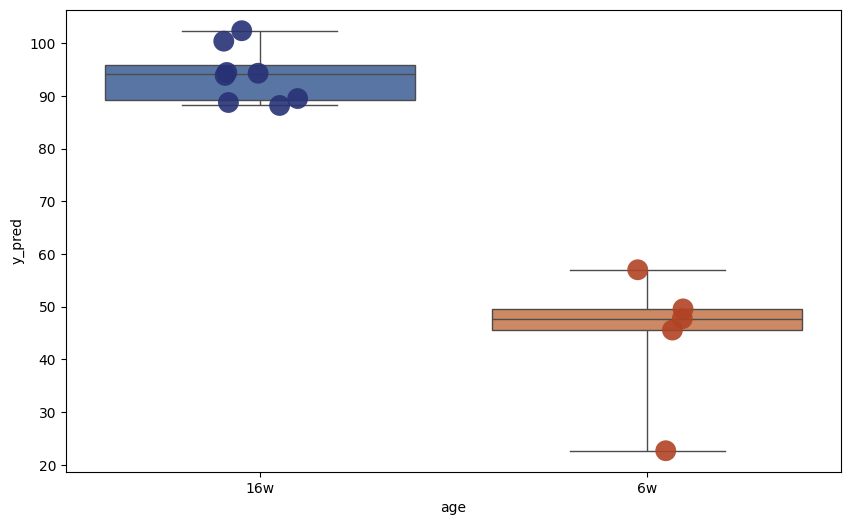

Components: 16
               y_pred
spleen_19   89.316901
spleen_17  103.376098
spleen_16  101.934872
spleen_15   95.210226
spleen_14   95.663491
spleen_12   89.757961
spleen_11   90.020342
spleen_10   95.082917
spleen_8    42.798861
spleen_5    49.148808
spleen_4    55.647296
spleen_3    49.596136
spleen_1    18.705914
               y_pred  age
spleen_19   89.316901  16w
spleen_17  103.376098  16w
spleen_16  101.934872  16w
spleen_15   95.210226  16w
spleen_14   95.663491  16w
spleen_12   89.757961  16w
spleen_11   90.020342  16w
spleen_10   95.082917  16w
spleen_8    42.798861   6w
spleen_5    49.148808   6w
spleen_4    55.647296   6w
spleen_3    49.596136   6w
spleen_1    18.705914   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


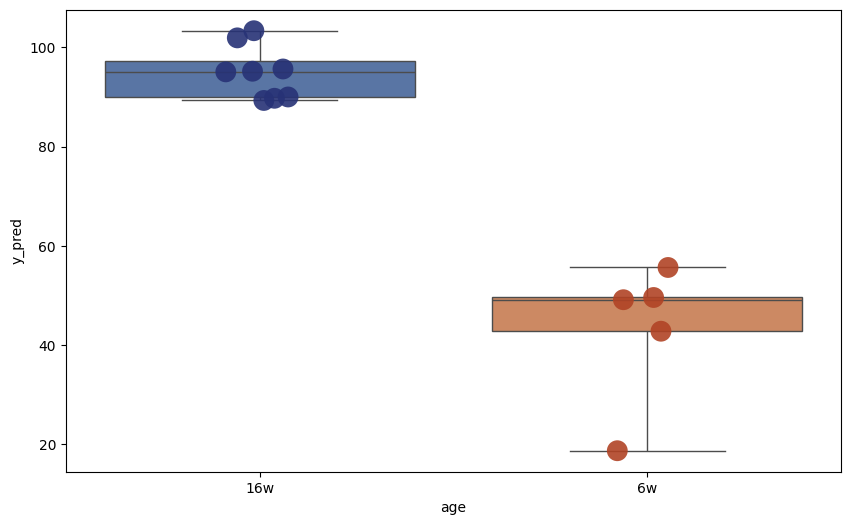

Components: 17
               y_pred
spleen_19   87.907997
spleen_17  102.680361
spleen_16   99.763379
spleen_15   94.465578
spleen_14   94.302420
spleen_12   89.188472
spleen_11   89.291870
spleen_10   94.511144
spleen_8    42.069865
spleen_5    47.886295
spleen_4    53.065605
spleen_3    47.691032
spleen_1    14.443647
               y_pred  age
spleen_19   87.907997  16w
spleen_17  102.680361  16w
spleen_16   99.763379  16w
spleen_15   94.465578  16w
spleen_14   94.302420  16w
spleen_12   89.188472  16w
spleen_11   89.291870  16w
spleen_10   94.511144  16w
spleen_8    42.069865   6w
spleen_5    47.886295   6w
spleen_4    53.065605   6w
spleen_3    47.691032   6w
spleen_1    14.443647   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


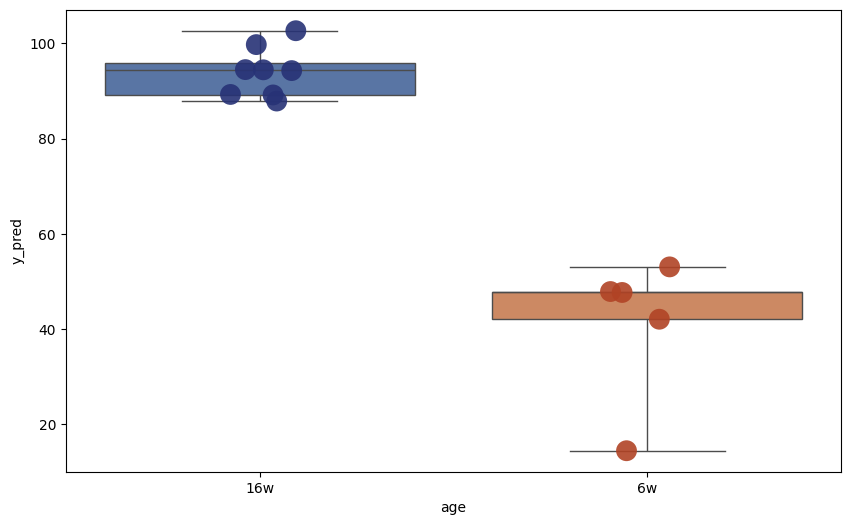

Components: 18
               y_pred
spleen_19   88.154198
spleen_17  103.568534
spleen_16  100.748096
spleen_15   94.882073
spleen_14   94.453856
spleen_12   88.567816
spleen_11   89.612062
spleen_10   94.318334
spleen_8    42.342146
spleen_5    47.388414
spleen_4    52.721201
spleen_3    48.329747
spleen_1    15.523025
               y_pred  age
spleen_19   88.154198  16w
spleen_17  103.568534  16w
spleen_16  100.748096  16w
spleen_15   94.882073  16w
spleen_14   94.453856  16w
spleen_12   88.567816  16w
spleen_11   89.612062  16w
spleen_10   94.318334  16w
spleen_8    42.342146   6w
spleen_5    47.388414   6w
spleen_4    52.721201   6w
spleen_3    48.329747   6w
spleen_1    15.523025   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


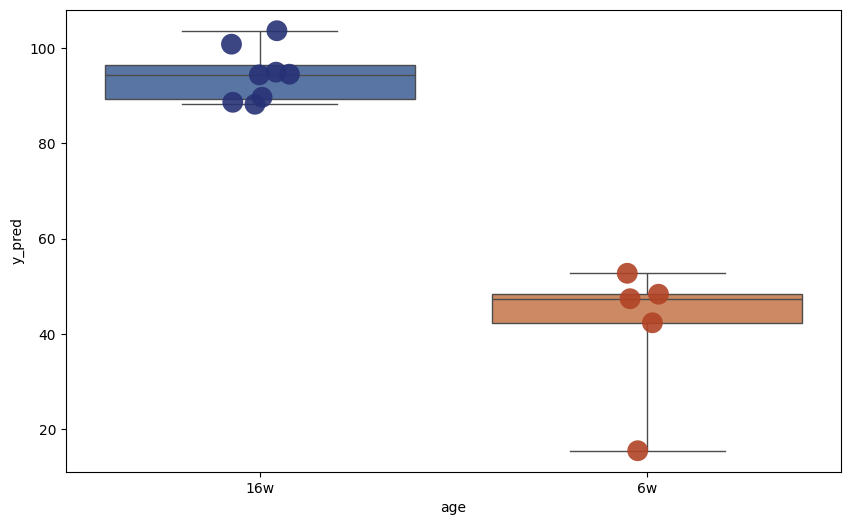

Components: 19
               y_pred
spleen_19   87.707034
spleen_17  102.898227
spleen_16   99.445886
spleen_15   94.114537
spleen_14   93.906535
spleen_12   88.308545
spleen_11   88.753583
spleen_10   93.491931
spleen_8    41.767354
spleen_5    47.259768
spleen_4    52.325183
spleen_3    47.346020
spleen_1    14.174651
               y_pred  age
spleen_19   87.707034  16w
spleen_17  102.898227  16w
spleen_16   99.445886  16w
spleen_15   94.114537  16w
spleen_14   93.906535  16w
spleen_12   88.308545  16w
spleen_11   88.753583  16w
spleen_10   93.491931  16w
spleen_8    41.767354   6w
spleen_5    47.259768   6w
spleen_4    52.325183   6w
spleen_3    47.346020   6w
spleen_1    14.174651   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


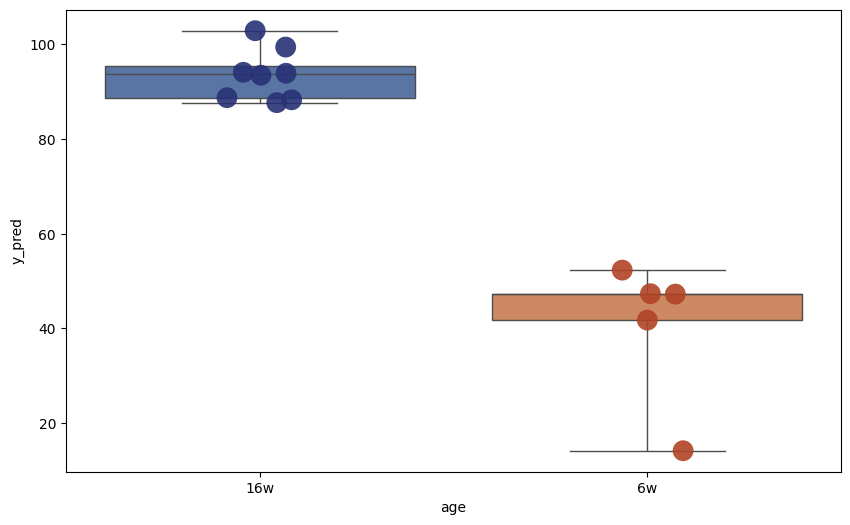

Components: 20
               y_pred
spleen_19   88.888499
spleen_17  101.697362
spleen_16  101.131039
spleen_15   92.758545
spleen_14   94.998910
spleen_12   89.902744
spleen_11   87.722571
spleen_10   93.973048
spleen_8    43.052423
spleen_5    44.640791
spleen_4    52.494614
spleen_3    48.115255
spleen_1    12.809338
               y_pred  age
spleen_19   88.888499  16w
spleen_17  101.697362  16w
spleen_16  101.131039  16w
spleen_15   92.758545  16w
spleen_14   94.998910  16w
spleen_12   89.902744  16w
spleen_11   87.722571  16w
spleen_10   93.973048  16w
spleen_8    43.052423   6w
spleen_5    44.640791   6w
spleen_4    52.494614   6w
spleen_3    48.115255   6w
spleen_1    12.809338   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


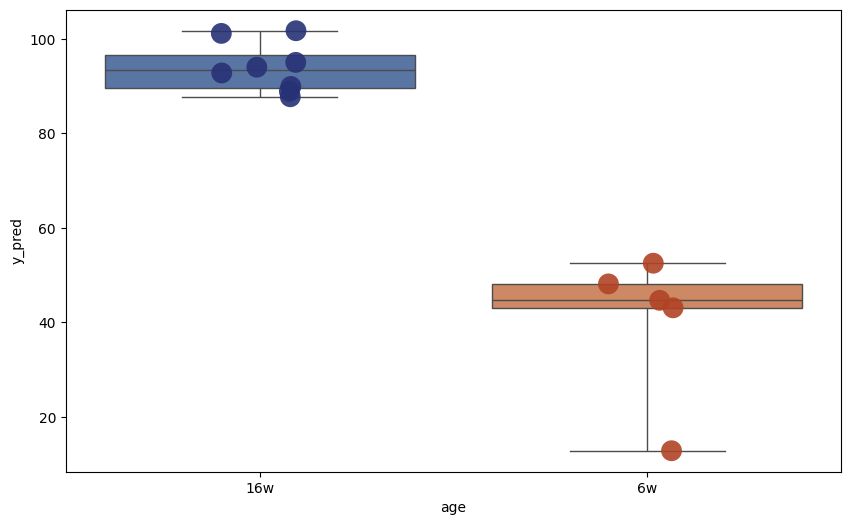

Components: 21
               y_pred
spleen_19   89.706133
spleen_17  101.945138
spleen_16  103.596806
spleen_15   94.086231
spleen_14   96.589212
spleen_12   91.688223
spleen_11   89.720421
spleen_10   94.383543
spleen_8    42.605659
spleen_5    48.912553
spleen_4    52.760268
spleen_3    50.539310
spleen_1    13.994094
               y_pred  age
spleen_19   89.706133  16w
spleen_17  101.945138  16w
spleen_16  103.596806  16w
spleen_15   94.086231  16w
spleen_14   96.589212  16w
spleen_12   91.688223  16w
spleen_11   89.720421  16w
spleen_10   94.383543  16w
spleen_8    42.605659   6w
spleen_5    48.912553   6w
spleen_4    52.760268   6w
spleen_3    50.539310   6w
spleen_1    13.994094   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


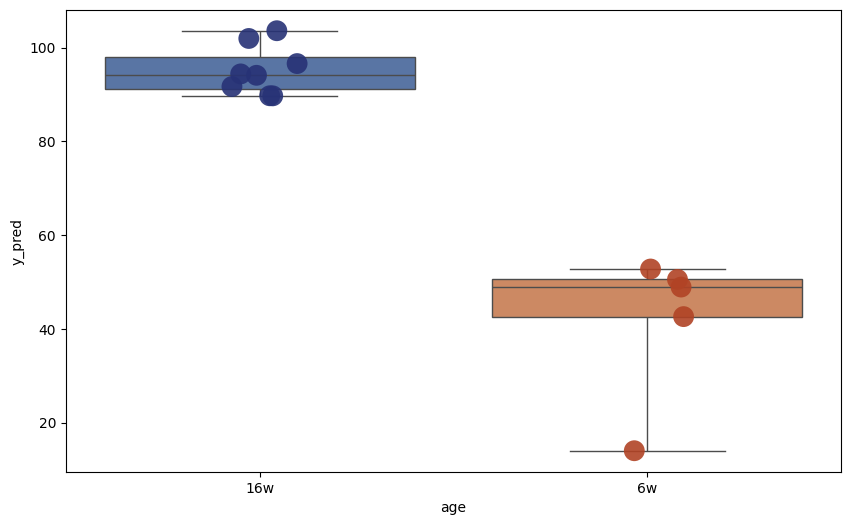

Components: 22
               y_pred
spleen_19   89.670157
spleen_17  102.123696
spleen_16  103.845497
spleen_15   94.212872
spleen_14   96.820832
spleen_12   91.610206
spleen_11   90.026682
spleen_10   94.429975
spleen_8    42.605619
spleen_5    48.785305
spleen_4    52.334265
spleen_3    50.821549
spleen_1    13.328986
               y_pred  age
spleen_19   89.670157  16w
spleen_17  102.123696  16w
spleen_16  103.845497  16w
spleen_15   94.212872  16w
spleen_14   96.820832  16w
spleen_12   91.610206  16w
spleen_11   90.026682  16w
spleen_10   94.429975  16w
spleen_8    42.605619   6w
spleen_5    48.785305   6w
spleen_4    52.334265   6w
spleen_3    50.821549   6w
spleen_1    13.328986   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


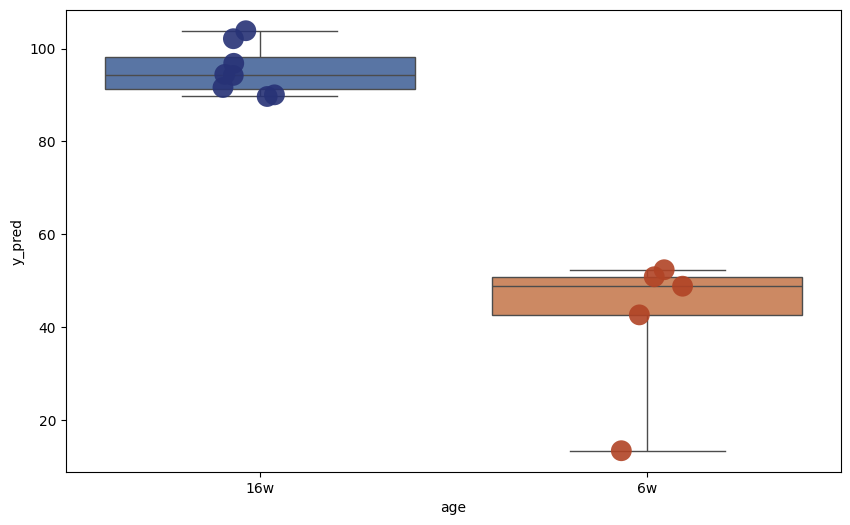

Components: 23
               y_pred
spleen_19   88.598914
spleen_17  100.832772
spleen_16  102.569728
spleen_15   93.287501
spleen_14   95.762322
spleen_12   91.328442
spleen_11   89.589795
spleen_10   93.807424
spleen_8    42.165659
spleen_5    48.211213
spleen_4    50.525874
spleen_3    50.093069
spleen_1     9.740555
               y_pred  age
spleen_19   88.598914  16w
spleen_17  100.832772  16w
spleen_16  102.569728  16w
spleen_15   93.287501  16w
spleen_14   95.762322  16w
spleen_12   91.328442  16w
spleen_11   89.589795  16w
spleen_10   93.807424  16w
spleen_8    42.165659   6w
spleen_5    48.211213   6w
spleen_4    50.525874   6w
spleen_3    50.093069   6w
spleen_1     9.740555   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


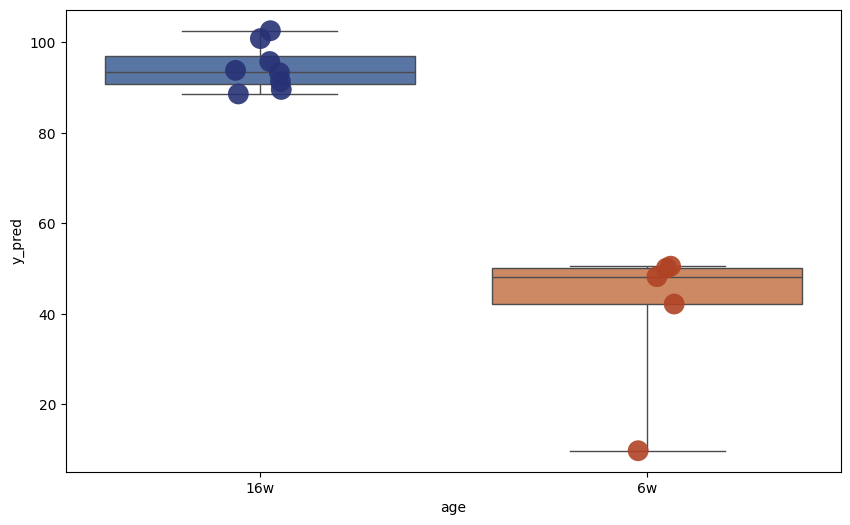

Components: 24
               y_pred
spleen_19   88.715539
spleen_17  101.231441
spleen_16  103.481459
spleen_15   93.552485
spleen_14   96.294915
spleen_12   91.512155
spleen_11   90.292343
spleen_10   94.178334
spleen_8    43.306882
spleen_5    48.162444
spleen_4    51.704010
spleen_3    49.722913
spleen_1    13.860890
               y_pred  age
spleen_19   88.715539  16w
spleen_17  101.231441  16w
spleen_16  103.481459  16w
spleen_15   93.552485  16w
spleen_14   96.294915  16w
spleen_12   91.512155  16w
spleen_11   90.292343  16w
spleen_10   94.178334  16w
spleen_8    43.306882   6w
spleen_5    48.162444   6w
spleen_4    51.704010   6w
spleen_3    49.722913   6w
spleen_1    13.860890   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


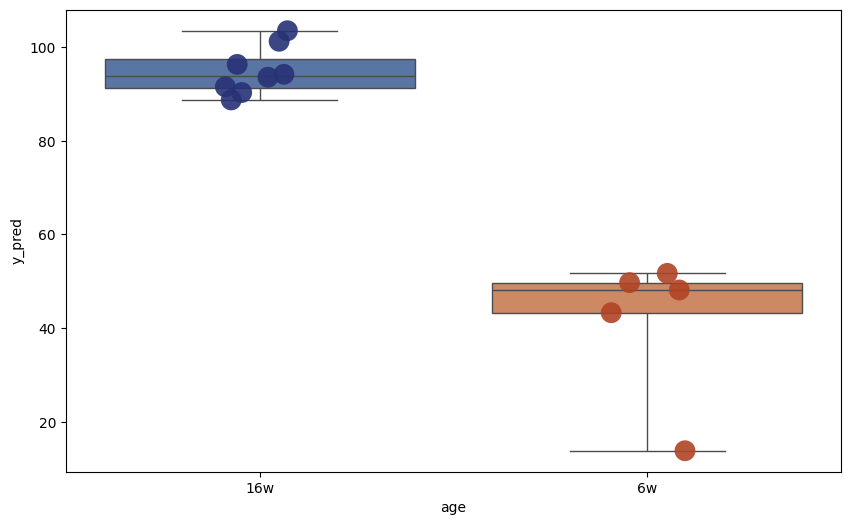

Components: 25
               y_pred
spleen_19   87.671501
spleen_17   99.873366
spleen_16  103.723136
spleen_15   93.977497
spleen_14   94.883919
spleen_12   91.219232
spleen_11   90.270269
spleen_10   95.259522
spleen_8    43.341938
spleen_5    48.495871
spleen_4    53.406740
spleen_3    53.319460
spleen_1    16.483058
               y_pred  age
spleen_19   87.671501  16w
spleen_17   99.873366  16w
spleen_16  103.723136  16w
spleen_15   93.977497  16w
spleen_14   94.883919  16w
spleen_12   91.219232  16w
spleen_11   90.270269  16w
spleen_10   95.259522  16w
spleen_8    43.341938   6w
spleen_5    48.495871   6w
spleen_4    53.406740   6w
spleen_3    53.319460   6w
spleen_1    16.483058   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


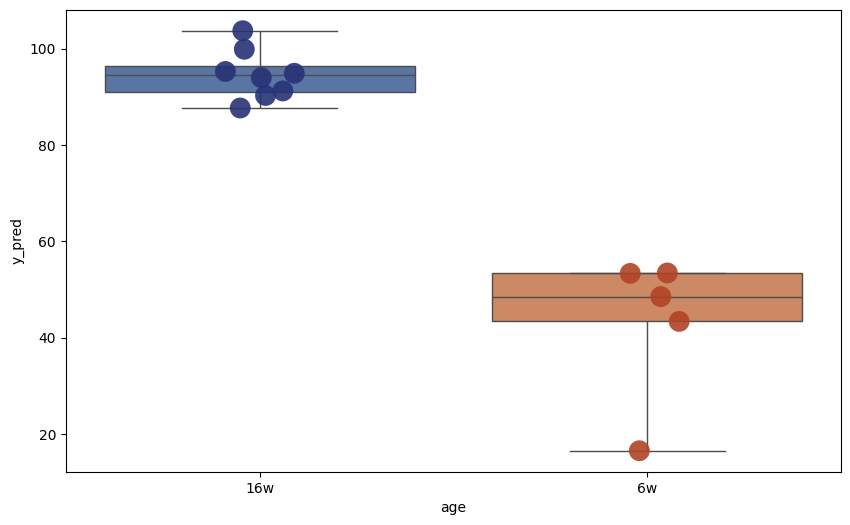

Components: 26
               y_pred
spleen_19   91.535384
spleen_17   99.755349
spleen_16  104.786527
spleen_15   95.816456
spleen_14   98.538451
spleen_12   95.976197
spleen_11   97.010510
spleen_10   96.885161
spleen_8    51.331835
spleen_5    47.218166
spleen_4    63.699425
spleen_3    53.327380
spleen_1    40.889081
               y_pred  age
spleen_19   91.535384  16w
spleen_17   99.755349  16w
spleen_16  104.786527  16w
spleen_15   95.816456  16w
spleen_14   98.538451  16w
spleen_12   95.976197  16w
spleen_11   97.010510  16w
spleen_10   96.885161  16w
spleen_8    51.331835   6w
spleen_5    47.218166   6w
spleen_4    63.699425   6w
spleen_3    53.327380   6w
spleen_1    40.889081   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


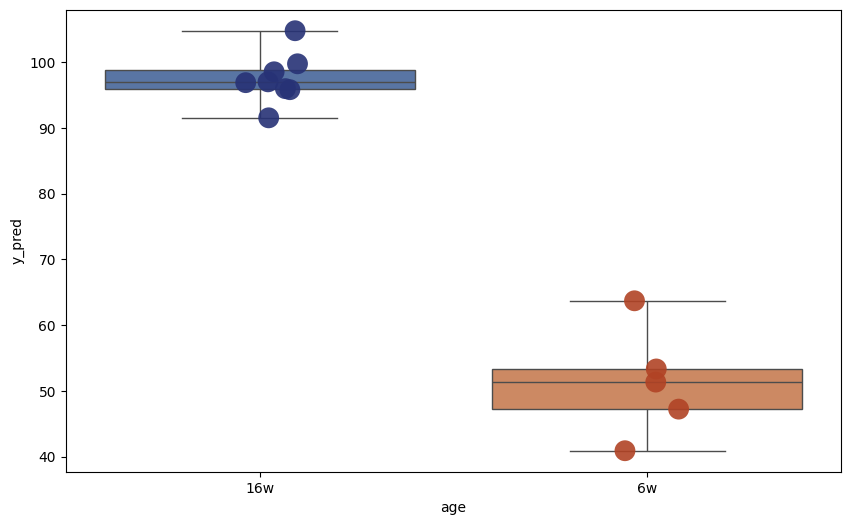

Components: 27
               y_pred
spleen_19   94.610305
spleen_17   99.671507
spleen_16  106.162309
spleen_15   94.667990
spleen_14   98.323235
spleen_12   97.680240
spleen_11   99.130490
spleen_10   97.516665
spleen_8    49.709748
spleen_5    48.292982
spleen_4    61.634596
spleen_3    54.108778
spleen_1    36.057082
               y_pred  age
spleen_19   94.610305  16w
spleen_17   99.671507  16w
spleen_16  106.162309  16w
spleen_15   94.667990  16w
spleen_14   98.323235  16w
spleen_12   97.680240  16w
spleen_11   99.130490  16w
spleen_10   97.516665  16w
spleen_8    49.709748   6w
spleen_5    48.292982   6w
spleen_4    61.634596   6w
spleen_3    54.108778   6w
spleen_1    36.057082   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


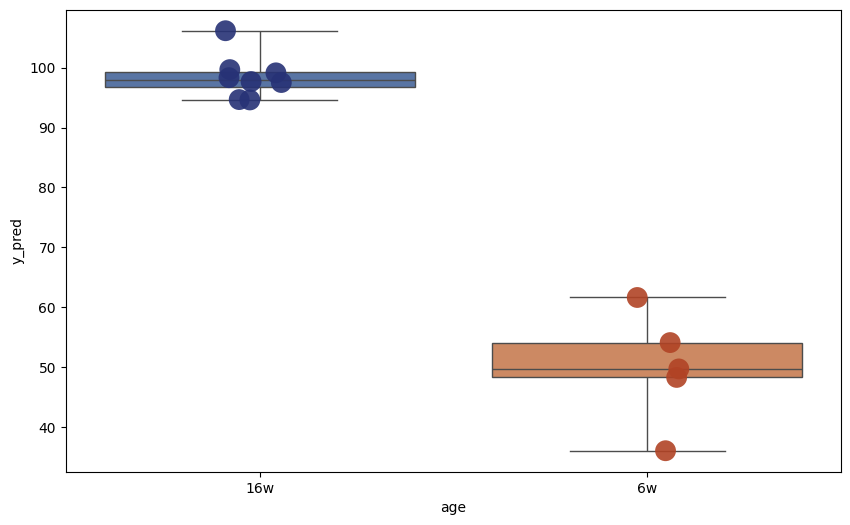

Components: 28
               y_pred
spleen_19   96.575953
spleen_17   99.895339
spleen_16  108.035109
spleen_15   96.957198
spleen_14  100.389092
spleen_12   97.476533
spleen_11   97.166909
spleen_10   97.598058
spleen_8    47.761852
spleen_5    50.268540
spleen_4    56.412192
spleen_3    51.117113
spleen_1    18.207543
               y_pred  age
spleen_19   96.575953  16w
spleen_17   99.895339  16w
spleen_16  108.035109  16w
spleen_15   96.957198  16w
spleen_14  100.389092  16w
spleen_12   97.476533  16w
spleen_11   97.166909  16w
spleen_10   97.598058  16w
spleen_8    47.761852   6w
spleen_5    50.268540   6w
spleen_4    56.412192   6w
spleen_3    51.117113   6w
spleen_1    18.207543   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


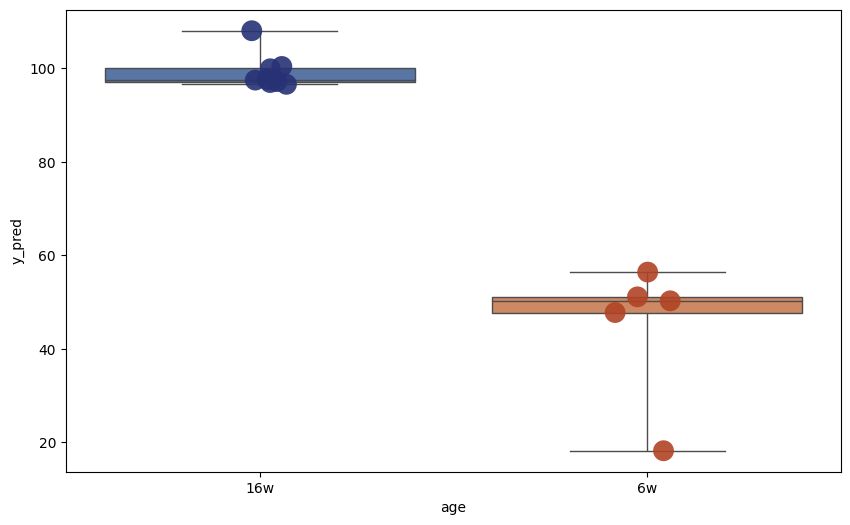

Components: 29
               y_pred
spleen_19   96.978923
spleen_17   99.485985
spleen_16  107.110652
spleen_15   96.585609
spleen_14  100.499935
spleen_12   97.334537
spleen_11   96.775175
spleen_10   97.437462
spleen_8    48.488517
spleen_5    48.995618
spleen_4    58.362056
spleen_3    50.471281
spleen_1    22.423928
               y_pred  age
spleen_19   96.978923  16w
spleen_17   99.485985  16w
spleen_16  107.110652  16w
spleen_15   96.585609  16w
spleen_14  100.499935  16w
spleen_12   97.334537  16w
spleen_11   96.775175  16w
spleen_10   97.437462  16w
spleen_8    48.488517   6w
spleen_5    48.995618   6w
spleen_4    58.362056   6w
spleen_3    50.471281   6w
spleen_1    22.423928   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


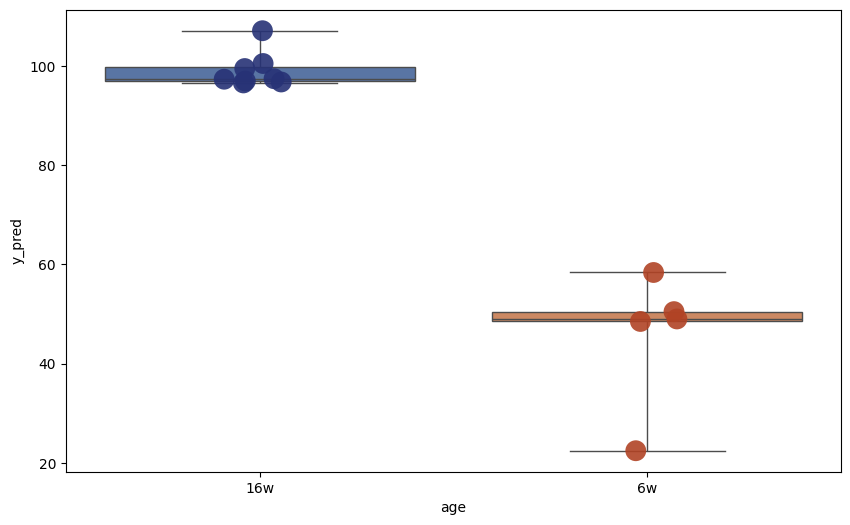

Components: 30
               y_pred
spleen_19   97.290671
spleen_17   99.471113
spleen_16  107.405532
spleen_15   96.644680
spleen_14  100.656404
spleen_12   97.284585
spleen_11   97.082122
spleen_10   97.262176
spleen_8    48.417032
spleen_5    49.511165
spleen_4    58.270353
spleen_3    50.762569
spleen_1    23.221122
               y_pred  age
spleen_19   97.290671  16w
spleen_17   99.471113  16w
spleen_16  107.405532  16w
spleen_15   96.644680  16w
spleen_14  100.656404  16w
spleen_12   97.284585  16w
spleen_11   97.082122  16w
spleen_10   97.262176  16w
spleen_8    48.417032   6w
spleen_5    49.511165   6w
spleen_4    58.270353   6w
spleen_3    50.762569   6w
spleen_1    23.221122   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


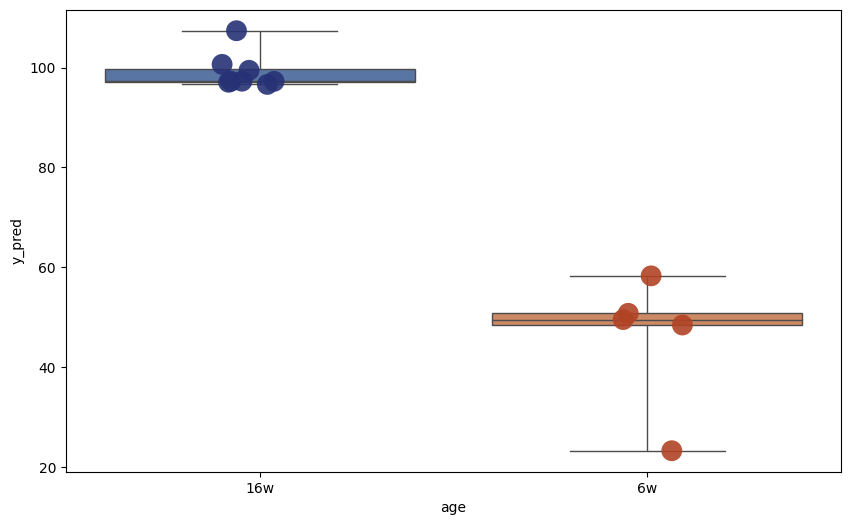

Components: 31
               y_pred
spleen_19   97.508039
spleen_17   99.779359
spleen_16  107.407350
spleen_15   96.945271
spleen_14  101.428868
spleen_12   97.549333
spleen_11   97.421623
spleen_10   97.160148
spleen_8    47.669125
spleen_5    48.878643
spleen_4    57.057292
spleen_3    51.343513
spleen_1    21.580703
               y_pred  age
spleen_19   97.508039  16w
spleen_17   99.779359  16w
spleen_16  107.407350  16w
spleen_15   96.945271  16w
spleen_14  101.428868  16w
spleen_12   97.549333  16w
spleen_11   97.421623  16w
spleen_10   97.160148  16w
spleen_8    47.669125   6w
spleen_5    48.878643   6w
spleen_4    57.057292   6w
spleen_3    51.343513   6w
spleen_1    21.580703   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


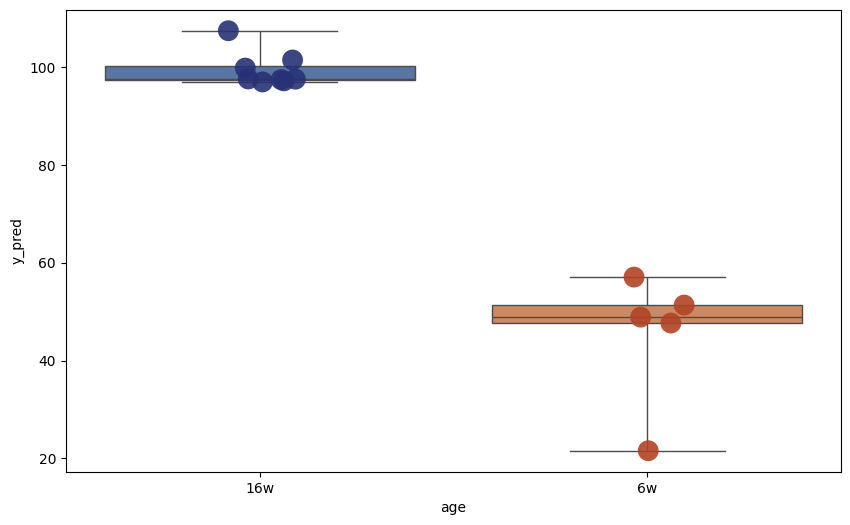

Components: 32
               y_pred
spleen_19   97.622012
spleen_17  100.769470
spleen_16  108.342275
spleen_15   97.313386
spleen_14  102.346095
spleen_12   97.514627
spleen_11   98.327814
spleen_10   96.036615
spleen_8    44.491902
spleen_5    49.520633
spleen_4    54.259710
spleen_3    51.697317
spleen_1    16.501066
               y_pred  age
spleen_19   97.622012  16w
spleen_17  100.769470  16w
spleen_16  108.342275  16w
spleen_15   97.313386  16w
spleen_14  102.346095  16w
spleen_12   97.514627  16w
spleen_11   98.327814  16w
spleen_10   96.036615  16w
spleen_8    44.491902   6w
spleen_5    49.520633   6w
spleen_4    54.259710   6w
spleen_3    51.697317   6w
spleen_1    16.501066   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


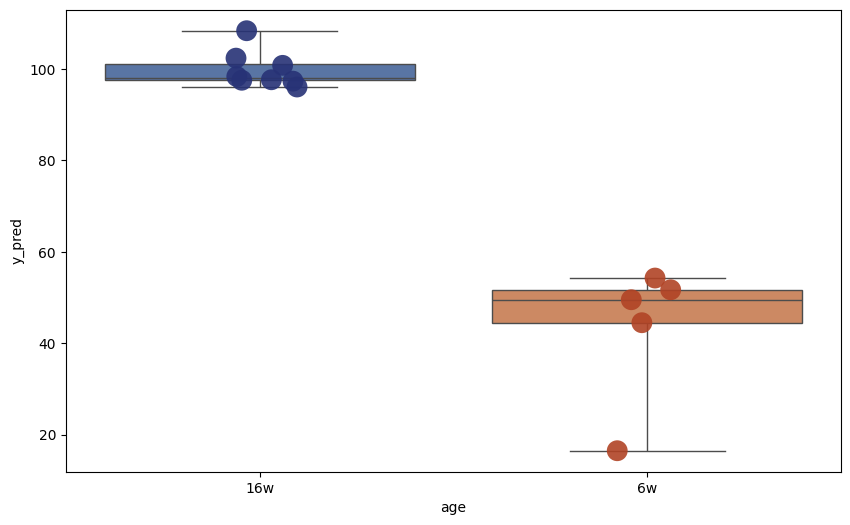

Components: 33
               y_pred
spleen_19   96.230709
spleen_17   99.932795
spleen_16  106.867911
spleen_15   96.515212
spleen_14  100.723495
spleen_12   97.212900
spleen_11   97.826627
spleen_10   95.770682
spleen_8    44.496135
spleen_5    48.852944
spleen_4    54.146460
spleen_3    52.418423
spleen_1    19.587610
               y_pred  age
spleen_19   96.230709  16w
spleen_17   99.932795  16w
spleen_16  106.867911  16w
spleen_15   96.515212  16w
spleen_14  100.723495  16w
spleen_12   97.212900  16w
spleen_11   97.826627  16w
spleen_10   95.770682  16w
spleen_8    44.496135   6w
spleen_5    48.852944   6w
spleen_4    54.146460   6w
spleen_3    52.418423   6w
spleen_1    19.587610   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


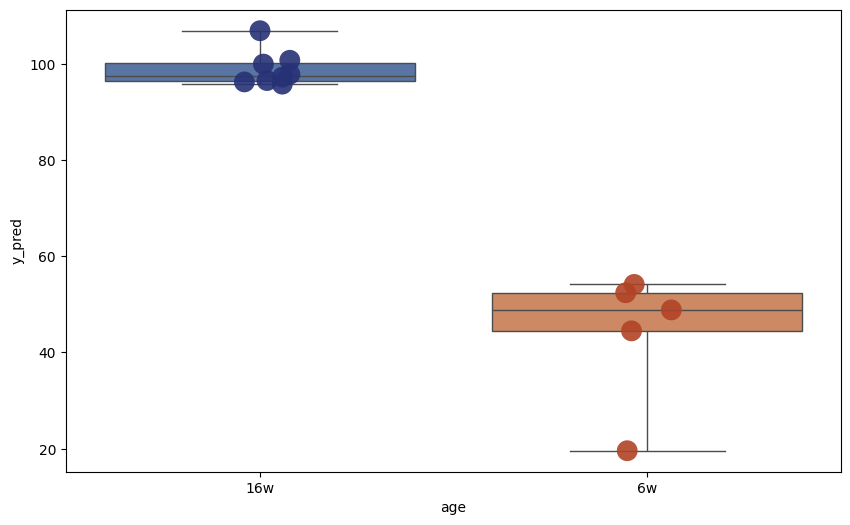

Components: 34
               y_pred
spleen_19   96.067145
spleen_17   99.656938
spleen_16  106.497824
spleen_15   96.106957
spleen_14  100.658083
spleen_12   97.148607
spleen_11   97.708551
spleen_10   95.577921
spleen_8    44.568446
spleen_5    48.264535
spleen_4    53.768967
spleen_3    52.381695
spleen_1    20.732534
               y_pred  age
spleen_19   96.067145  16w
spleen_17   99.656938  16w
spleen_16  106.497824  16w
spleen_15   96.106957  16w
spleen_14  100.658083  16w
spleen_12   97.148607  16w
spleen_11   97.708551  16w
spleen_10   95.577921  16w
spleen_8    44.568446   6w
spleen_5    48.264535   6w
spleen_4    53.768967   6w
spleen_3    52.381695   6w
spleen_1    20.732534   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


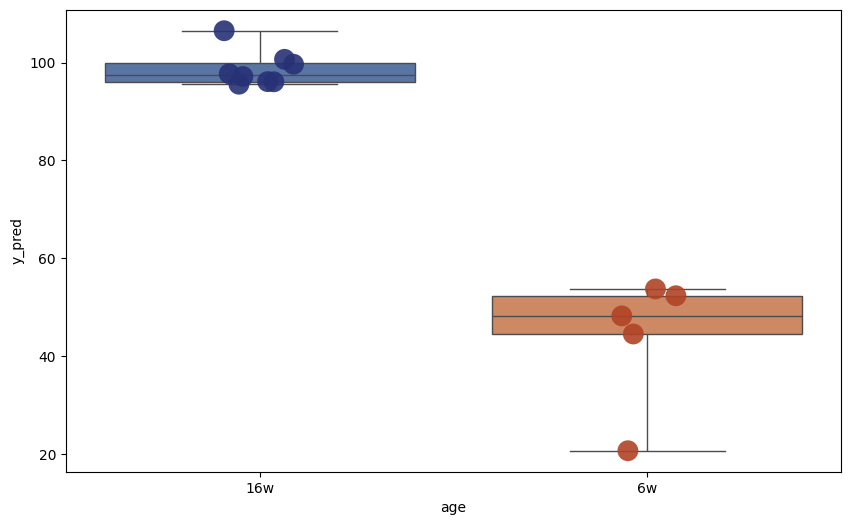

Components: 35
               y_pred
spleen_19   99.707145
spleen_17  103.802932
spleen_16  109.230620
spleen_15   97.489563
spleen_14  100.811367
spleen_12   97.957860
spleen_11   98.601850
spleen_10   95.498535
spleen_8    50.127957
spleen_5    48.287326
spleen_4    56.527697
spleen_3    51.786575
spleen_1    27.469281
               y_pred  age
spleen_19   99.707145  16w
spleen_17  103.802932  16w
spleen_16  109.230620  16w
spleen_15   97.489563  16w
spleen_14  100.811367  16w
spleen_12   97.957860  16w
spleen_11   98.601850  16w
spleen_10   95.498535  16w
spleen_8    50.127957   6w
spleen_5    48.287326   6w
spleen_4    56.527697   6w
spleen_3    51.786575   6w
spleen_1    27.469281   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


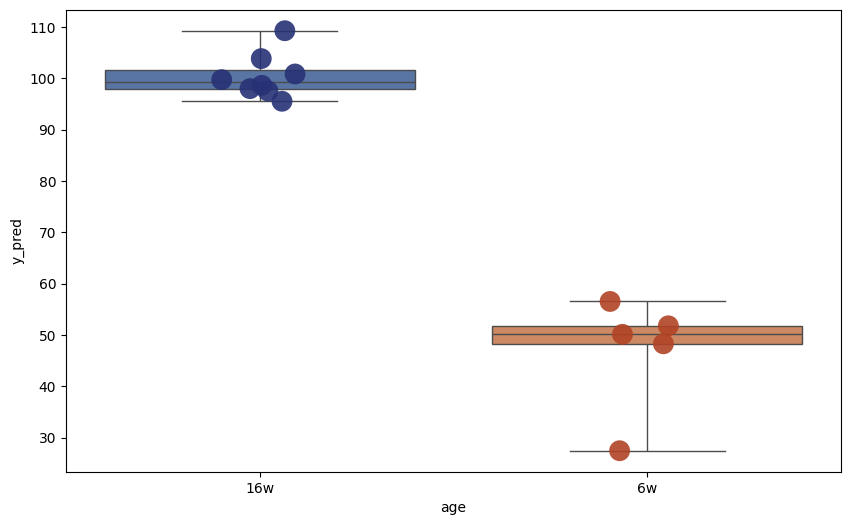

Components: 36
               y_pred
spleen_19  100.150344
spleen_17  104.085902
spleen_16  109.579112
spleen_15   98.058427
spleen_14  100.692286
spleen_12   98.293209
spleen_11   99.423263
spleen_10   95.641775
spleen_8    51.081085
spleen_5    49.280727
spleen_4    56.933766
spleen_3    52.189622
spleen_1    27.729735
               y_pred  age
spleen_19  100.150344  16w
spleen_17  104.085902  16w
spleen_16  109.579112  16w
spleen_15   98.058427  16w
spleen_14  100.692286  16w
spleen_12   98.293209  16w
spleen_11   99.423263  16w
spleen_10   95.641775  16w
spleen_8    51.081085   6w
spleen_5    49.280727   6w
spleen_4    56.933766   6w
spleen_3    52.189622   6w
spleen_1    27.729735   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


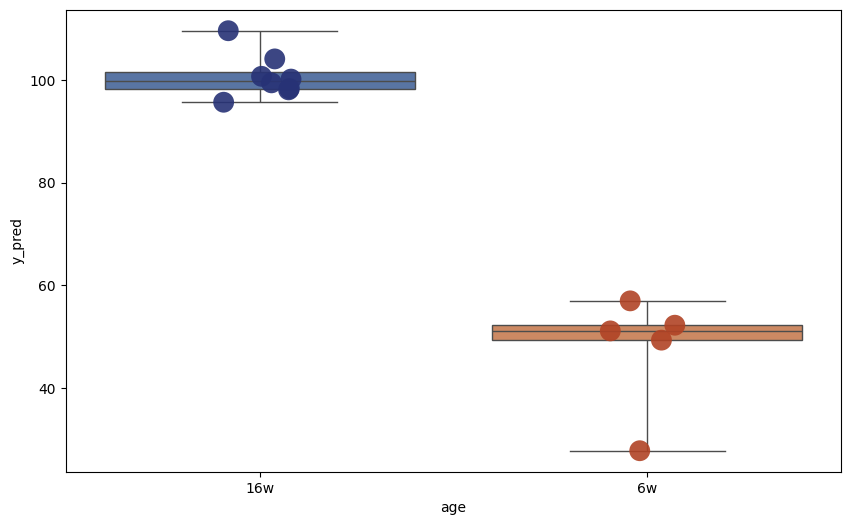

Components: 37
               y_pred
spleen_19  100.476751
spleen_17  104.003814
spleen_16  109.252312
spleen_15   98.074147
spleen_14  100.676608
spleen_12   98.655570
spleen_11   99.763783
spleen_10   95.852434
spleen_8    51.083794
spleen_5    49.009414
spleen_4    57.525656
spleen_3    51.790993
spleen_1    27.143423
               y_pred  age
spleen_19  100.476751  16w
spleen_17  104.003814  16w
spleen_16  109.252312  16w
spleen_15   98.074147  16w
spleen_14  100.676608  16w
spleen_12   98.655570  16w
spleen_11   99.763783  16w
spleen_10   95.852434  16w
spleen_8    51.083794   6w
spleen_5    49.009414   6w
spleen_4    57.525656   6w
spleen_3    51.790993   6w
spleen_1    27.143423   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


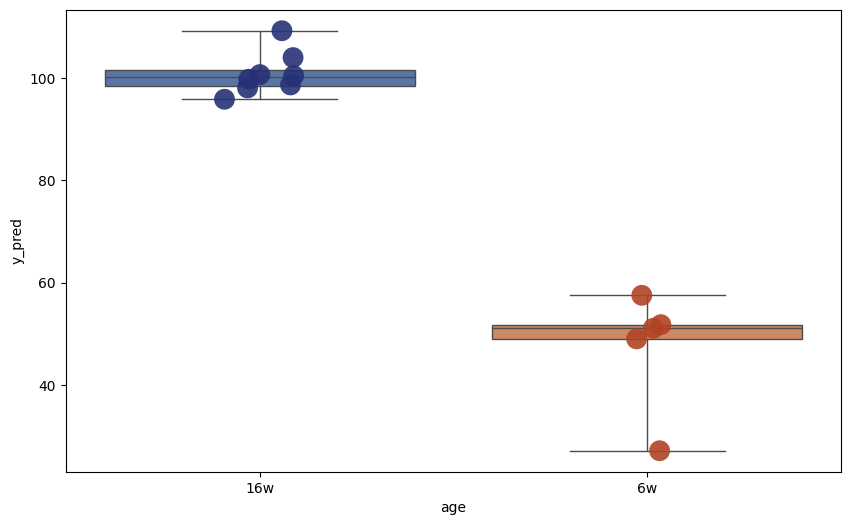

Components: 38
               y_pred
spleen_19   99.687016
spleen_17  103.486403
spleen_16  109.267132
spleen_15   97.960762
spleen_14  100.569851
spleen_12   98.649222
spleen_11   99.278448
spleen_10   96.029254
spleen_8    51.267363
spleen_5    48.088508
spleen_4    57.961181
spleen_3    51.719118
spleen_1    29.923306
               y_pred  age
spleen_19   99.687016  16w
spleen_17  103.486403  16w
spleen_16  109.267132  16w
spleen_15   97.960762  16w
spleen_14  100.569851  16w
spleen_12   98.649222  16w
spleen_11   99.278448  16w
spleen_10   96.029254  16w
spleen_8    51.267363   6w
spleen_5    48.088508   6w
spleen_4    57.961181   6w
spleen_3    51.719118   6w
spleen_1    29.923306   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


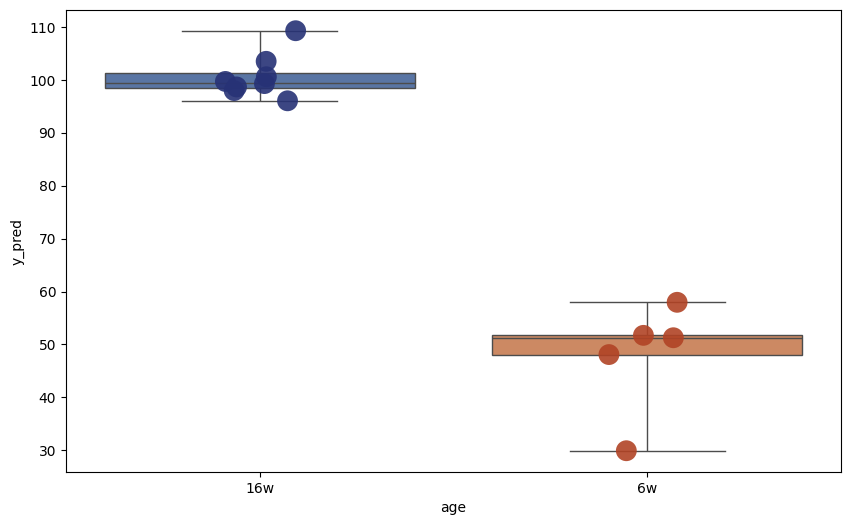

Components: 39
               y_pred
spleen_19   99.020651
spleen_17  103.981230
spleen_16  108.762620
spleen_15   97.183629
spleen_14  100.564819
spleen_12   98.941520
spleen_11   99.154468
spleen_10   93.490916
spleen_8    56.048038
spleen_5    48.768292
spleen_4    55.379806
spleen_3    47.936081
spleen_1    34.624457
               y_pred  age
spleen_19   99.020651  16w
spleen_17  103.981230  16w
spleen_16  108.762620  16w
spleen_15   97.183629  16w
spleen_14  100.564819  16w
spleen_12   98.941520  16w
spleen_11   99.154468  16w
spleen_10   93.490916  16w
spleen_8    56.048038   6w
spleen_5    48.768292   6w
spleen_4    55.379806   6w
spleen_3    47.936081   6w
spleen_1    34.624457   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


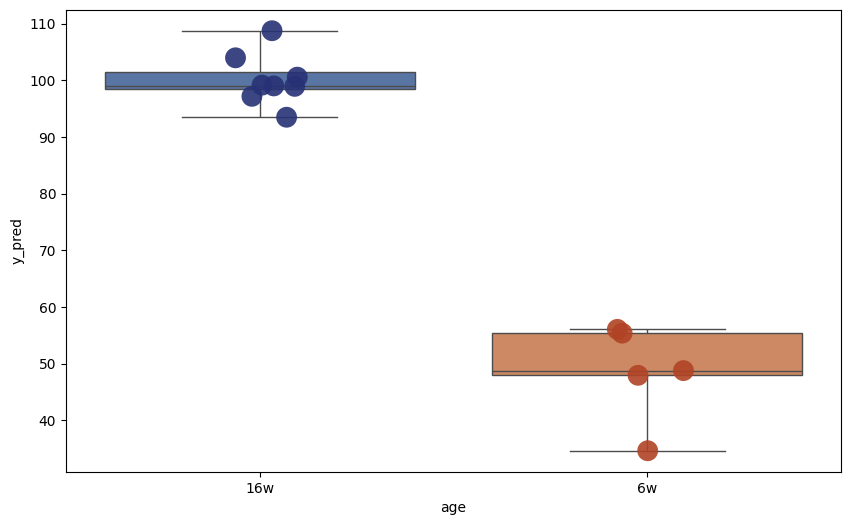

Components: 40
               y_pred
spleen_19   97.459204
spleen_17  103.241633
spleen_16  109.821066
spleen_15   97.017653
spleen_14  102.203558
spleen_12   97.560869
spleen_11   97.986199
spleen_10   97.132471
spleen_8    55.718717
spleen_5    48.732557
spleen_4    54.921141
spleen_3    50.392751
spleen_1    32.205741
               y_pred  age
spleen_19   97.459204  16w
spleen_17  103.241633  16w
spleen_16  109.821066  16w
spleen_15   97.017653  16w
spleen_14  102.203558  16w
spleen_12   97.560869  16w
spleen_11   97.986199  16w
spleen_10   97.132471  16w
spleen_8    55.718717   6w
spleen_5    48.732557   6w
spleen_4    54.921141   6w
spleen_3    50.392751   6w
spleen_1    32.205741   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


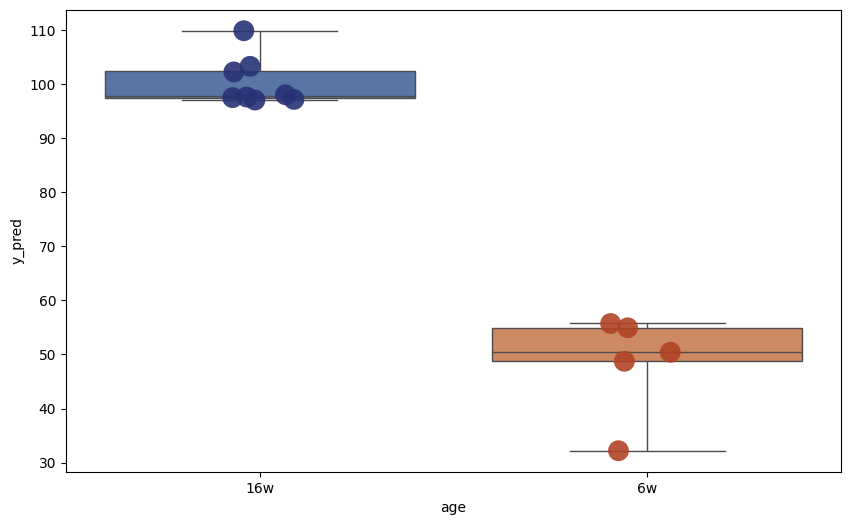

Components: 41
               y_pred
spleen_19   98.475728
spleen_17  103.973274
spleen_16  110.346554
spleen_15   97.504306
spleen_14  102.636926
spleen_12   97.556741
spleen_11   98.903401
spleen_10   97.251472
spleen_8    55.560712
spleen_5    47.891030
spleen_4    55.149749
spleen_3    49.801804
spleen_1    32.030292
               y_pred  age
spleen_19   98.475728  16w
spleen_17  103.973274  16w
spleen_16  110.346554  16w
spleen_15   97.504306  16w
spleen_14  102.636926  16w
spleen_12   97.556741  16w
spleen_11   98.903401  16w
spleen_10   97.251472  16w
spleen_8    55.560712   6w
spleen_5    47.891030   6w
spleen_4    55.149749   6w
spleen_3    49.801804   6w
spleen_1    32.030292   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


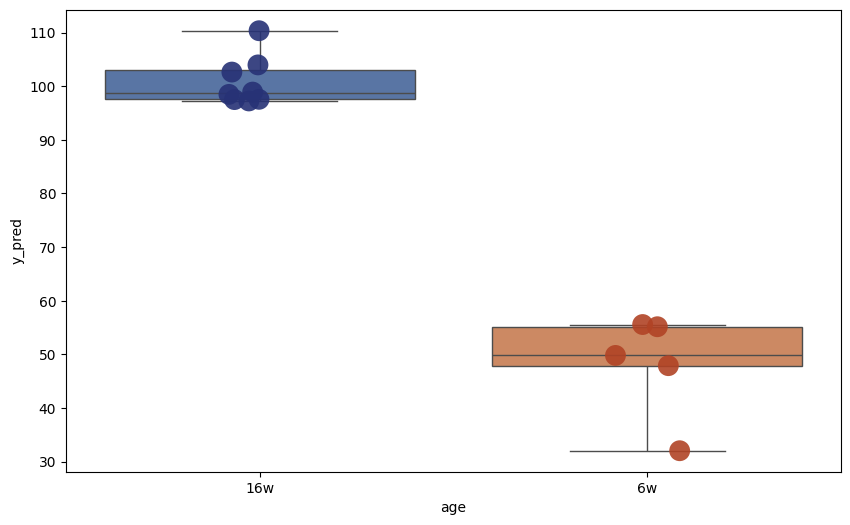

Components: 42
               y_pred
spleen_19   98.484576
spleen_17  104.026753
spleen_16  110.390000
spleen_15   97.605666
spleen_14  102.664957
spleen_12   97.540189
spleen_11   98.936009
spleen_10   97.391346
spleen_8    55.537087
spleen_5    47.985760
spleen_4    55.065906
spleen_3    49.764599
spleen_1    32.006884
               y_pred  age
spleen_19   98.484576  16w
spleen_17  104.026753  16w
spleen_16  110.390000  16w
spleen_15   97.605666  16w
spleen_14  102.664957  16w
spleen_12   97.540189  16w
spleen_11   98.936009  16w
spleen_10   97.391346  16w
spleen_8    55.537087   6w
spleen_5    47.985760   6w
spleen_4    55.065906   6w
spleen_3    49.764599   6w
spleen_1    32.006884   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


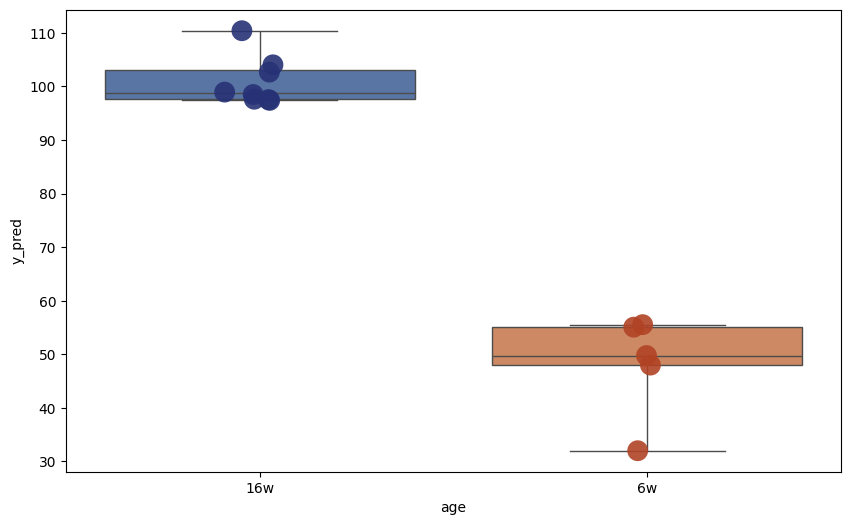

Components: 43
               y_pred
spleen_19   98.021474
spleen_17  104.095070
spleen_16  109.550674
spleen_15   97.355850
spleen_14  101.892296
spleen_12   96.856684
spleen_11   99.146352
spleen_10   97.373120
spleen_8    56.702419
spleen_5    47.491556
spleen_4    56.515766
spleen_3    48.937429
spleen_1    34.936978
               y_pred  age
spleen_19   98.021474  16w
spleen_17  104.095070  16w
spleen_16  109.550674  16w
spleen_15   97.355850  16w
spleen_14  101.892296  16w
spleen_12   96.856684  16w
spleen_11   99.146352  16w
spleen_10   97.373120  16w
spleen_8    56.702419   6w
spleen_5    47.491556   6w
spleen_4    56.515766   6w
spleen_3    48.937429   6w
spleen_1    34.936978   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


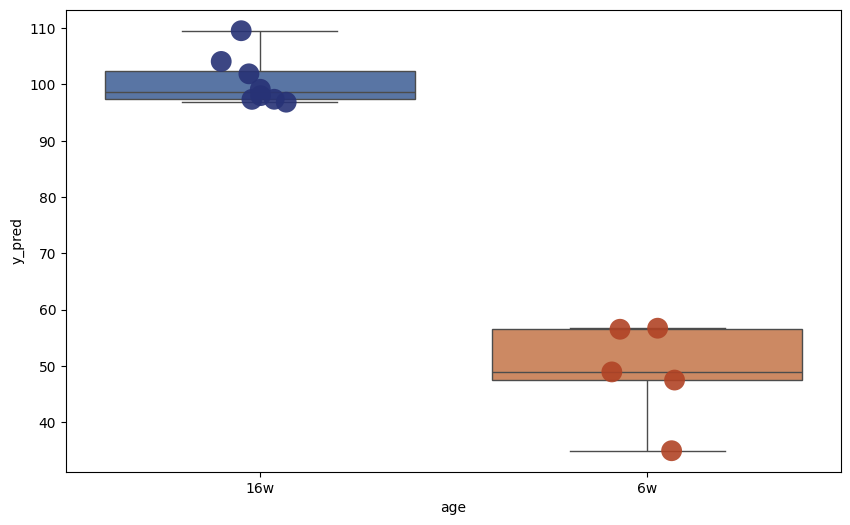

Components: 44
               y_pred
spleen_19   97.066333
spleen_17  103.666378
spleen_16  111.300271
spleen_15   96.693950
spleen_14  102.236319
spleen_12   96.845432
spleen_11   98.284666
spleen_10   97.416855
spleen_8    55.750152
spleen_5    46.215895
spleen_4    56.329919
spleen_3    50.479803
spleen_1    31.421770
               y_pred  age
spleen_19   97.066333  16w
spleen_17  103.666378  16w
spleen_16  111.300271  16w
spleen_15   96.693950  16w
spleen_14  102.236319  16w
spleen_12   96.845432  16w
spleen_11   98.284666  16w
spleen_10   97.416855  16w
spleen_8    55.750152   6w
spleen_5    46.215895   6w
spleen_4    56.329919   6w
spleen_3    50.479803   6w
spleen_1    31.421770   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


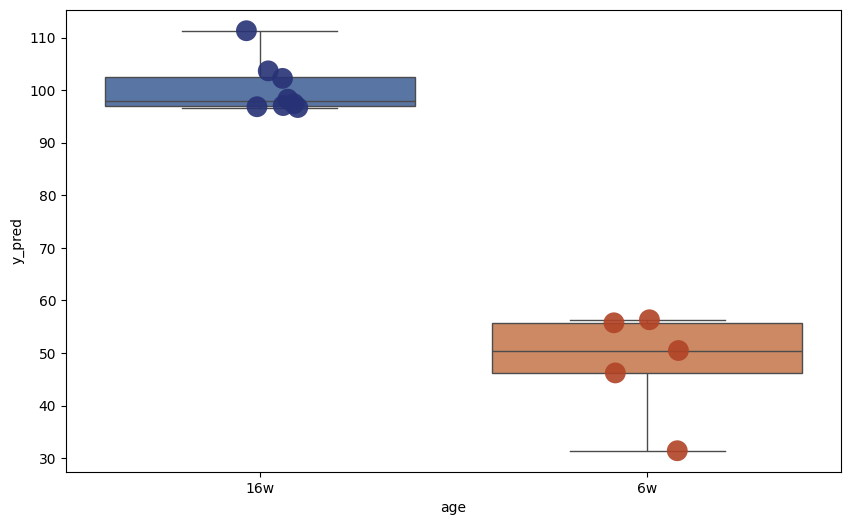

Components: 45
               y_pred
spleen_19   97.830898
spleen_17  104.094873
spleen_16  110.342171
spleen_15   96.689761
spleen_14  102.613364
spleen_12   97.364945
spleen_11   98.666339
spleen_10   98.574011
spleen_8    54.674708
spleen_5    46.326888
spleen_4    55.651854
spleen_3    48.834974
spleen_1    28.209532
               y_pred  age
spleen_19   97.830898  16w
spleen_17  104.094873  16w
spleen_16  110.342171  16w
spleen_15   96.689761  16w
spleen_14  102.613364  16w
spleen_12   97.364945  16w
spleen_11   98.666339  16w
spleen_10   98.574011  16w
spleen_8    54.674708   6w
spleen_5    46.326888   6w
spleen_4    55.651854   6w
spleen_3    48.834974   6w
spleen_1    28.209532   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


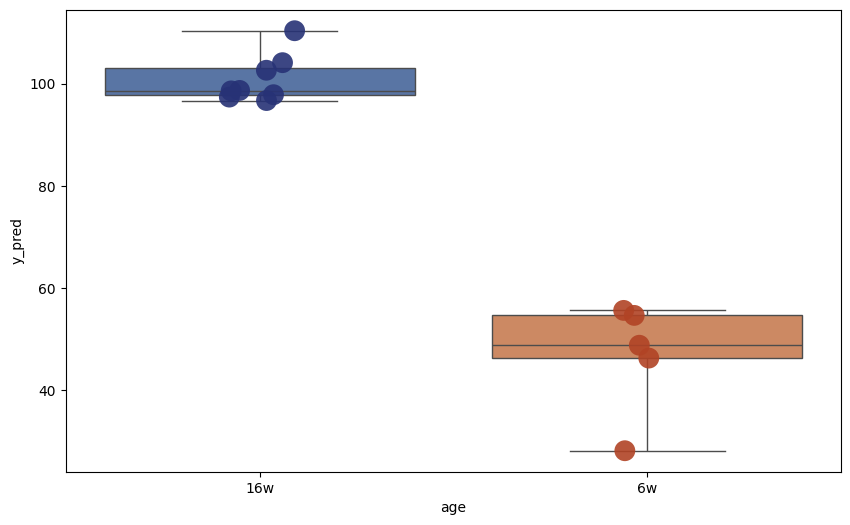

Components: 46
               y_pred
spleen_19   95.193316
spleen_17  103.712088
spleen_16  108.628978
spleen_15   96.390384
spleen_14  100.287694
spleen_12   98.084340
spleen_11   96.131005
spleen_10   98.309254
spleen_8    56.088259
spleen_5    46.154202
spleen_4    58.263618
spleen_3    51.352415
spleen_1    28.573170
               y_pred  age
spleen_19   95.193316  16w
spleen_17  103.712088  16w
spleen_16  108.628978  16w
spleen_15   96.390384  16w
spleen_14  100.287694  16w
spleen_12   98.084340  16w
spleen_11   96.131005  16w
spleen_10   98.309254  16w
spleen_8    56.088259   6w
spleen_5    46.154202   6w
spleen_4    58.263618   6w
spleen_3    51.352415   6w
spleen_1    28.573170   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


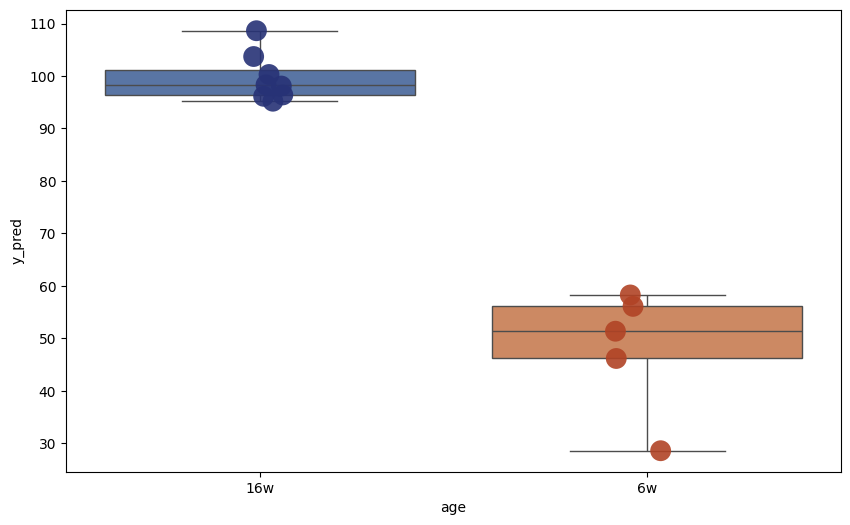

Components: 47
               y_pred
spleen_19   95.545019
spleen_17  103.705489
spleen_16  108.638481
spleen_15   96.422169
spleen_14  100.480309
spleen_12   98.205967
spleen_11   96.103690
spleen_10   98.242603
spleen_8    55.863246
spleen_5    45.922961
spleen_4    57.918880
spleen_3    51.085748
spleen_1    27.395652
               y_pred  age
spleen_19   95.545019  16w
spleen_17  103.705489  16w
spleen_16  108.638481  16w
spleen_15   96.422169  16w
spleen_14  100.480309  16w
spleen_12   98.205967  16w
spleen_11   96.103690  16w
spleen_10   98.242603  16w
spleen_8    55.863246   6w
spleen_5    45.922961   6w
spleen_4    57.918880   6w
spleen_3    51.085748   6w
spleen_1    27.395652   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


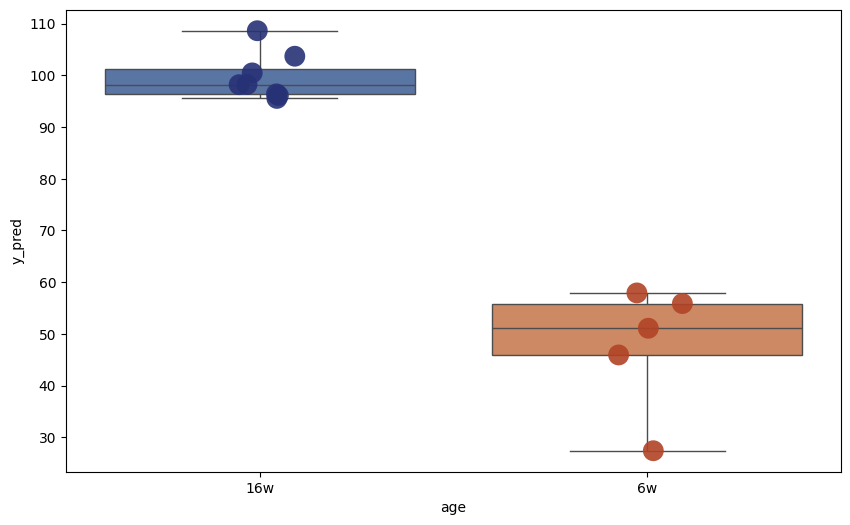

Components: 48
               y_pred
spleen_19   95.483935
spleen_17  103.696076
spleen_16  108.669647
spleen_15   96.384254
spleen_14  100.410182
spleen_12   98.221832
spleen_11   95.854645
spleen_10   98.158464
spleen_8    56.285888
spleen_5    45.739803
spleen_4    58.063014
spleen_3    51.264299
spleen_1    27.354649
               y_pred  age
spleen_19   95.483935  16w
spleen_17  103.696076  16w
spleen_16  108.669647  16w
spleen_15   96.384254  16w
spleen_14  100.410182  16w
spleen_12   98.221832  16w
spleen_11   95.854645  16w
spleen_10   98.158464  16w
spleen_8    56.285888   6w
spleen_5    45.739803   6w
spleen_4    58.063014   6w
spleen_3    51.264299   6w
spleen_1    27.354649   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


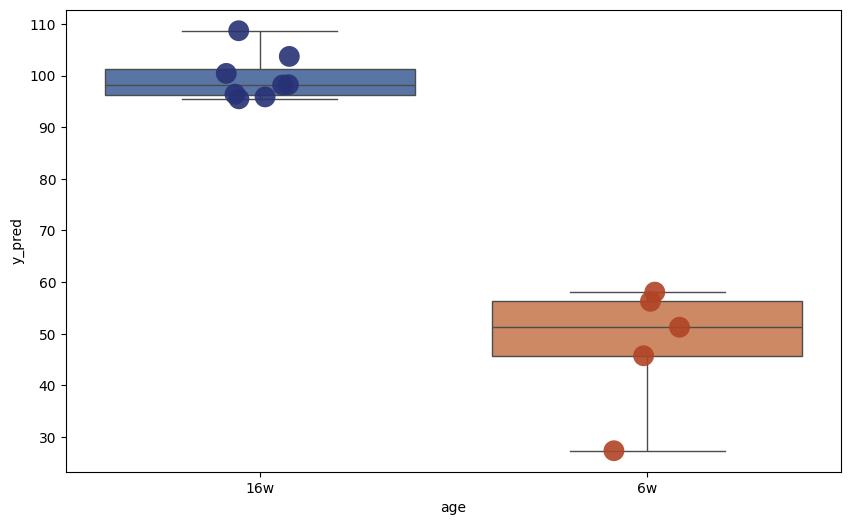

Components: 49
               y_pred
spleen_19   95.243265
spleen_17  103.905775
spleen_16  108.666523
spleen_15   96.281617
spleen_14  100.786009
spleen_12   98.487648
spleen_11   95.499408
spleen_10   98.683075
spleen_8    57.513900
spleen_5    45.695767
spleen_4    58.254186
spleen_3    51.643105
spleen_1    28.040105
               y_pred  age
spleen_19   95.243265  16w
spleen_17  103.905775  16w
spleen_16  108.666523  16w
spleen_15   96.281617  16w
spleen_14  100.786009  16w
spleen_12   98.487648  16w
spleen_11   95.499408  16w
spleen_10   98.683075  16w
spleen_8    57.513900   6w
spleen_5    45.695767   6w
spleen_4    58.254186   6w
spleen_3    51.643105   6w
spleen_1    28.040105   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


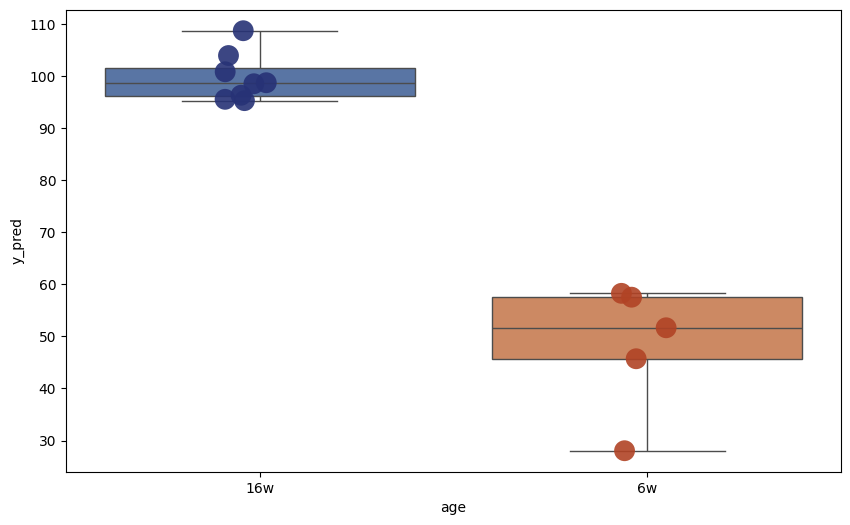

Components: 50
               y_pred
spleen_19   94.744813
spleen_17  103.786890
spleen_16  108.828196
spleen_15   96.655138
spleen_14  101.554468
spleen_12   98.294386
spleen_11   95.122686
spleen_10   98.492979
spleen_8    56.866219
spleen_5    45.907483
spleen_4    57.820766
spleen_3    51.390808
spleen_1    29.680877
               y_pred  age
spleen_19   94.744813  16w
spleen_17  103.786890  16w
spleen_16  108.828196  16w
spleen_15   96.655138  16w
spleen_14  101.554468  16w
spleen_12   98.294386  16w
spleen_11   95.122686  16w
spleen_10   98.492979  16w
spleen_8    56.866219   6w
spleen_5    45.907483   6w
spleen_4    57.820766   6w
spleen_3    51.390808   6w
spleen_1    29.680877   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


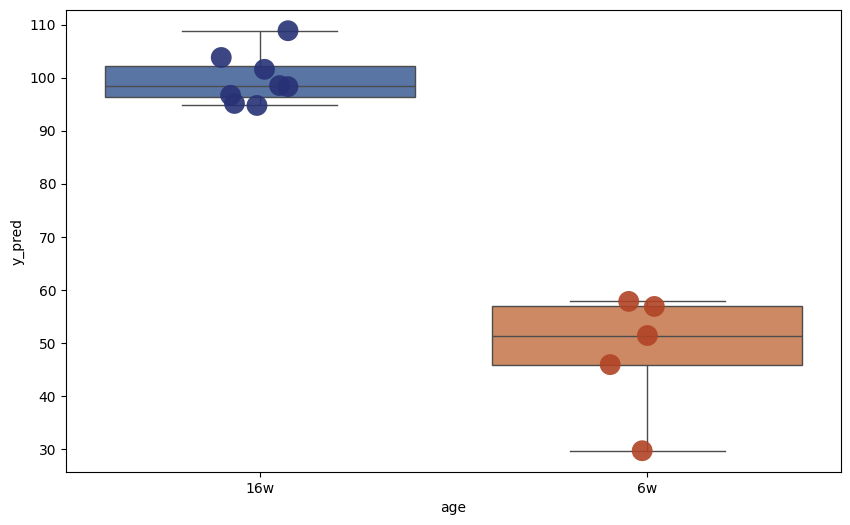

Components: 51
               y_pred
spleen_19   95.091514
spleen_17  103.622914
spleen_16  109.058459
spleen_15   96.858051
spleen_14  102.285178
spleen_12   98.331204
spleen_11   95.563032
spleen_10   99.947532
spleen_8    56.549890
spleen_5    46.796129
spleen_4    56.508495
spleen_3    51.481235
spleen_1    27.163465
               y_pred  age
spleen_19   95.091514  16w
spleen_17  103.622914  16w
spleen_16  109.058459  16w
spleen_15   96.858051  16w
spleen_14  102.285178  16w
spleen_12   98.331204  16w
spleen_11   95.563032  16w
spleen_10   99.947532  16w
spleen_8    56.549890   6w
spleen_5    46.796129   6w
spleen_4    56.508495   6w
spleen_3    51.481235   6w
spleen_1    27.163465   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


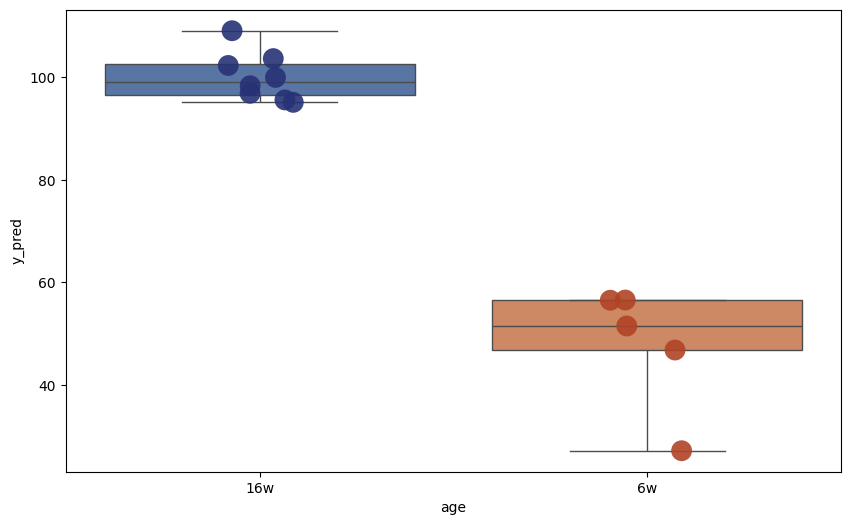

Components: 52
               y_pred
spleen_19   94.200529
spleen_17  103.026560
spleen_16  108.403070
spleen_15   96.496500
spleen_14  101.853817
spleen_12   98.383825
spleen_11   95.023459
spleen_10   99.854368
spleen_8    56.870831
spleen_5    47.368429
spleen_4    57.753527
spleen_3    51.747398
spleen_1    27.559583
               y_pred  age
spleen_19   94.200529  16w
spleen_17  103.026560  16w
spleen_16  108.403070  16w
spleen_15   96.496500  16w
spleen_14  101.853817  16w
spleen_12   98.383825  16w
spleen_11   95.023459  16w
spleen_10   99.854368  16w
spleen_8    56.870831   6w
spleen_5    47.368429   6w
spleen_4    57.753527   6w
spleen_3    51.747398   6w
spleen_1    27.559583   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


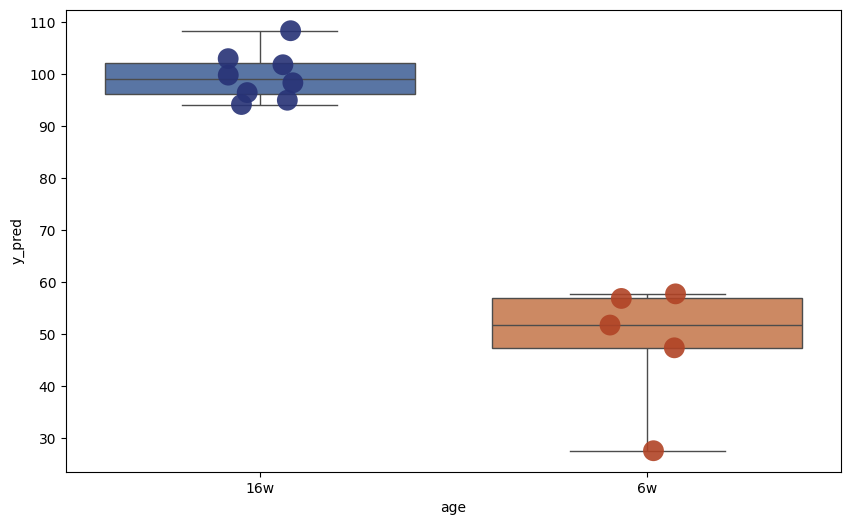

Components: 53
               y_pred
spleen_19   94.923916
spleen_17  102.892587
spleen_16  108.759506
spleen_15   97.622192
spleen_14  101.532950
spleen_12   97.569746
spleen_11   94.213590
spleen_10   99.590502
spleen_8    59.673133
spleen_5    53.548060
spleen_4    59.938226
spleen_3    52.956785
spleen_1    32.045765
               y_pred  age
spleen_19   94.923916  16w
spleen_17  102.892587  16w
spleen_16  108.759506  16w
spleen_15   97.622192  16w
spleen_14  101.532950  16w
spleen_12   97.569746  16w
spleen_11   94.213590  16w
spleen_10   99.590502  16w
spleen_8    59.673133   6w
spleen_5    53.548060   6w
spleen_4    59.938226   6w
spleen_3    52.956785   6w
spleen_1    32.045765   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


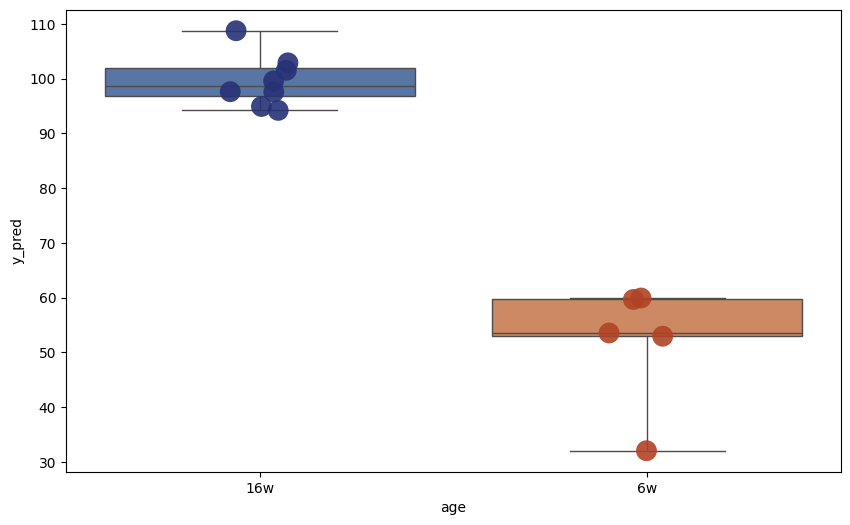

Components: 54
               y_pred
spleen_19   94.900139
spleen_17  102.879054
spleen_16  108.775739
spleen_15   97.610224
spleen_14  101.507811
spleen_12   97.556239
spleen_11   94.172348
spleen_10   99.645526
spleen_8    59.682434
spleen_5    53.430295
spleen_4    59.940300
spleen_3    53.010525
spleen_1    31.971749
               y_pred  age
spleen_19   94.900139  16w
spleen_17  102.879054  16w
spleen_16  108.775739  16w
spleen_15   97.610224  16w
spleen_14  101.507811  16w
spleen_12   97.556239  16w
spleen_11   94.172348  16w
spleen_10   99.645526  16w
spleen_8    59.682434   6w
spleen_5    53.430295   6w
spleen_4    59.940300   6w
spleen_3    53.010525   6w
spleen_1    31.971749   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


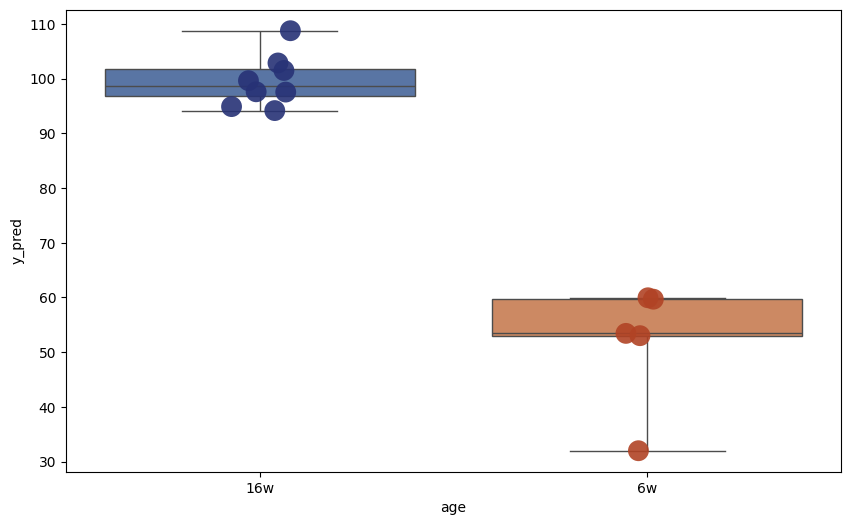

Components: 55
               y_pred
spleen_19   94.877687
spleen_17  102.385193
spleen_16  107.957355
spleen_15   96.345662
spleen_14  101.122330
spleen_12   97.609079
spleen_11   93.230592
spleen_10   99.827996
spleen_8    60.320711
spleen_5    52.338264
spleen_4    60.259238
spleen_3    52.581027
spleen_1    35.861895
               y_pred  age
spleen_19   94.877687  16w
spleen_17  102.385193  16w
spleen_16  107.957355  16w
spleen_15   96.345662  16w
spleen_14  101.122330  16w
spleen_12   97.609079  16w
spleen_11   93.230592  16w
spleen_10   99.827996  16w
spleen_8    60.320711   6w
spleen_5    52.338264   6w
spleen_4    60.259238   6w
spleen_3    52.581027   6w
spleen_1    35.861895   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


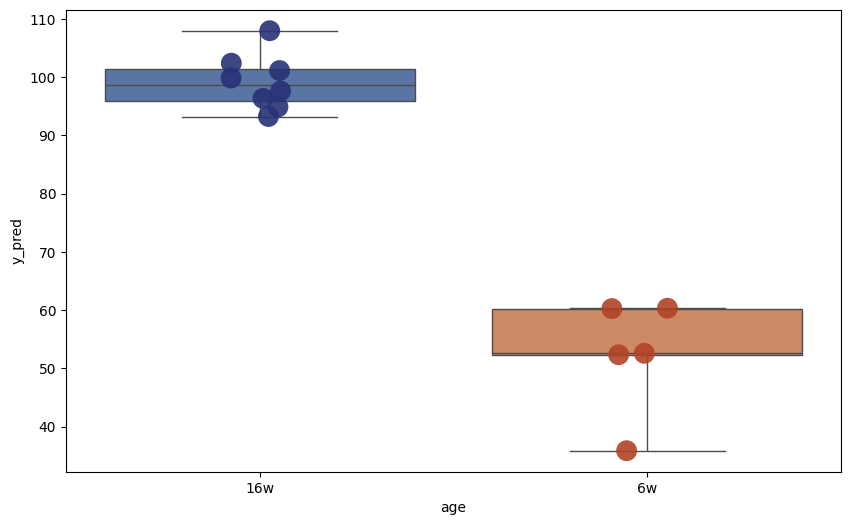

Components: 56
               y_pred
spleen_19   97.694637
spleen_17  101.344670
spleen_16  108.299001
spleen_15   98.051298
spleen_14  102.058327
spleen_12   97.239264
spleen_11   95.143101
spleen_10   95.467366
spleen_8    58.854311
spleen_5    50.324095
spleen_4    60.458627
spleen_3    50.830390
spleen_1    35.304334
               y_pred  age
spleen_19   97.694637  16w
spleen_17  101.344670  16w
spleen_16  108.299001  16w
spleen_15   98.051298  16w
spleen_14  102.058327  16w
spleen_12   97.239264  16w
spleen_11   95.143101  16w
spleen_10   95.467366  16w
spleen_8    58.854311   6w
spleen_5    50.324095   6w
spleen_4    60.458627   6w
spleen_3    50.830390   6w
spleen_1    35.304334   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


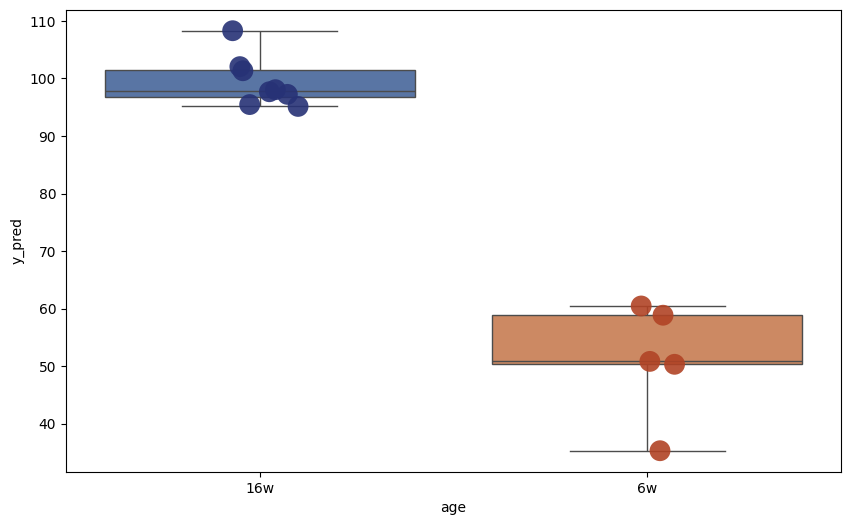

Components: 57
               y_pred
spleen_19   97.797133
spleen_17  101.575183
spleen_16  108.794130
spleen_15   98.318023
spleen_14  101.934930
spleen_12   97.349858
spleen_11   95.460586
spleen_10   95.358705
spleen_8    59.425025
spleen_5    50.924331
spleen_4    61.051508
spleen_3    51.000185
spleen_1    36.165571
               y_pred  age
spleen_19   97.797133  16w
spleen_17  101.575183  16w
spleen_16  108.794130  16w
spleen_15   98.318023  16w
spleen_14  101.934930  16w
spleen_12   97.349858  16w
spleen_11   95.460586  16w
spleen_10   95.358705  16w
spleen_8    59.425025   6w
spleen_5    50.924331   6w
spleen_4    61.051508   6w
spleen_3    51.000185   6w
spleen_1    36.165571   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


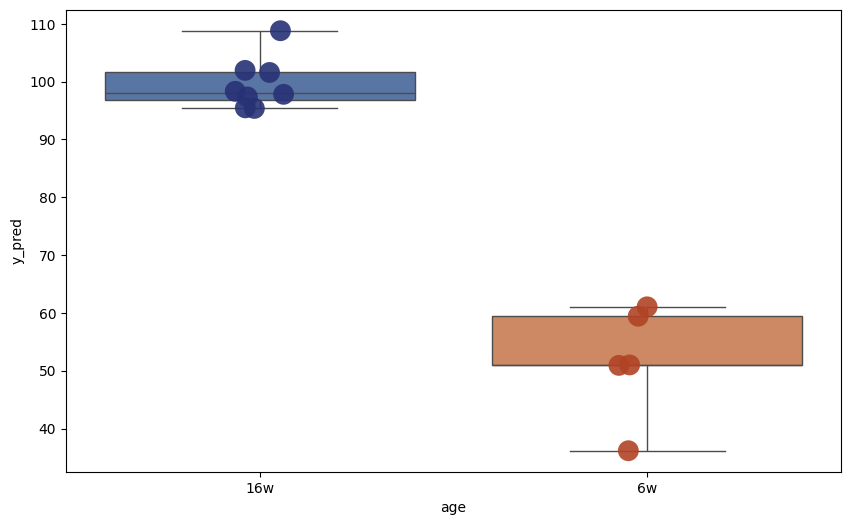

Components: 58
               y_pred
spleen_19   98.933966
spleen_17  101.877573
spleen_16  109.740334
spleen_15   99.077591
spleen_14  103.301476
spleen_12   97.024048
spleen_11   94.727367
spleen_10   94.196733
spleen_8    59.079194
spleen_5    48.607420
spleen_4    60.016677
spleen_3    51.768163
spleen_1    35.792946
               y_pred  age
spleen_19   98.933966  16w
spleen_17  101.877573  16w
spleen_16  109.740334  16w
spleen_15   99.077591  16w
spleen_14  103.301476  16w
spleen_12   97.024048  16w
spleen_11   94.727367  16w
spleen_10   94.196733  16w
spleen_8    59.079194   6w
spleen_5    48.607420   6w
spleen_4    60.016677   6w
spleen_3    51.768163   6w
spleen_1    35.792946   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


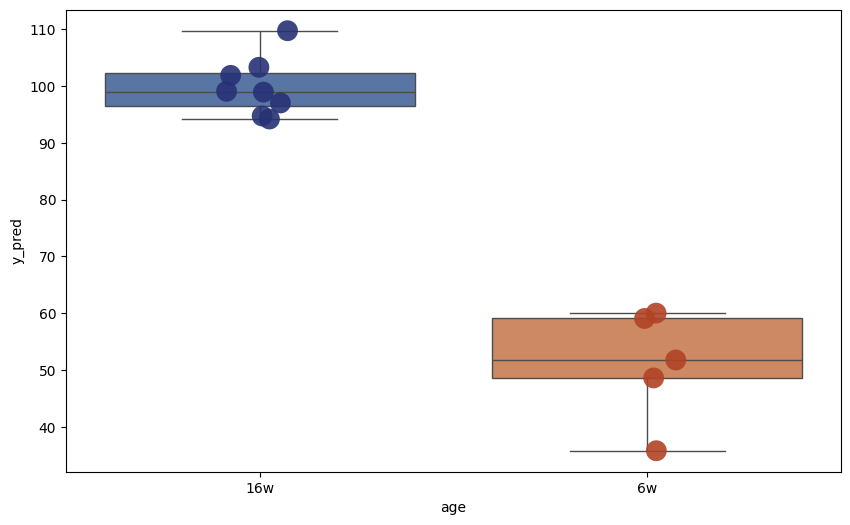

Components: 59
               y_pred
spleen_19   98.930317
spleen_17  101.878506
spleen_16  109.733727
spleen_15   99.094269
spleen_14  103.307476
spleen_12   97.026217
spleen_11   94.738445
spleen_10   94.212271
spleen_8    59.100097
spleen_5    48.627110
spleen_4    60.047658
spleen_3    51.776225
spleen_1    35.826662
               y_pred  age
spleen_19   98.930317  16w
spleen_17  101.878506  16w
spleen_16  109.733727  16w
spleen_15   99.094269  16w
spleen_14  103.307476  16w
spleen_12   97.026217  16w
spleen_11   94.738445  16w
spleen_10   94.212271  16w
spleen_8    59.100097   6w
spleen_5    48.627110   6w
spleen_4    60.047658   6w
spleen_3    51.776225   6w
spleen_1    35.826662   6w


/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48780825/ipykernel_30500/3762364156.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


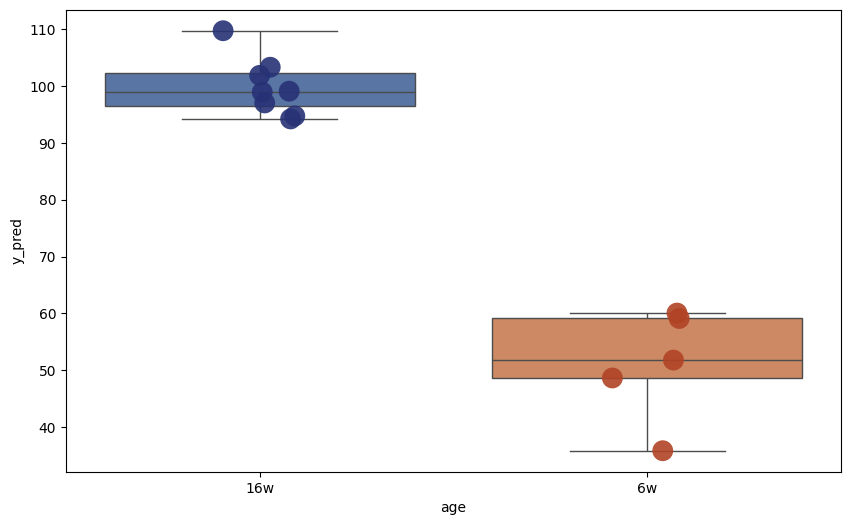

In [53]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, svd_solver = 'full', random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [54]:
n_components = 14

# Apply PCA
pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test.index.tolist())

results_df["age"] = df_intervention_test_metadata["age"]

print(results_df)
results_df.to_csv("./predictions/AlanXu_spleen_sexcombo_Calibratedpredictions_14PCs_EC-250725.csv")

               y_pred  age
spleen_19   88.865523  16w
spleen_17  102.803830  16w
spleen_16  101.097324  16w
spleen_15   94.647058  16w
spleen_14   95.196601  16w
spleen_12   89.754880  16w
spleen_11   89.442449  16w
spleen_10   93.928367  16w
spleen_8    44.959357   6w
spleen_5    47.562934   6w
spleen_4    56.628849   6w
spleen_3    49.563782   6w
spleen_1    22.134819   6w


##### Sample rotation

In [55]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [57]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention.drop(
            atlas_plus_intervention.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/945] Running PCR for combo: spleen_9_spleen_8__spleen_19_spleen_18
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/945] Running PCR for combo: spleen_9_spleen_8__spleen_19_spleen_17
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/945] Running PCR for combo: spleen_9_spleen_8__spleen_19_spleen_16
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/945] Running PCR for combo: spleen_9_spleen_8__spleen_19_spleen_15
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  

### Male

##### Calibration

In [ ]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_male = df_intervention_age.copy()

df_intervention_age_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(male_samples)
]

df_intervention_age_male.head(3)

In [ ]:
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

In [ ]:
random.seed(123)

# Separate the samples
young_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

In [ ]:
df_intervention_train_male = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_male.head(2)

In [ ]:
#combine the dataframes
atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_male], axis=0)

atlas_plus_intervention_male.head(3)

In [ ]:
#all not in select_train_samples
test_samples = [s for s in male_samples if s not in select_train_samples]
test_samples

In [ ]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(test_samples)
]

df_intervention_test_male.head(3)

In [ ]:
df_intervention_test_male = df_intervention_test_male.drop(df_intervention_test_male.columns[[-2,-3, -4]], axis=1)
df_intervention_test_male.head(2)

In [ ]:
#check cols ordered the same
df_intervention_test_male = df_intervention_test_male[atlas_plus_intervention_male.columns]

In [ ]:
#subset your metadata
df_intervention_test_metadata_male = df_intervention_metadata_male.loc[
    df_intervention_metadata_male.index.isin(test_samples)
]

df_intervention_test_metadata_male.head(3)

In [ ]:
age = atlas_plus_intervention_male['age']
X = atlas_plus_intervention_male.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_male.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

In [ ]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, svd_solver = 'full',random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_male.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_male["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [ ]:
n_components = 11

# Apply PCA
pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_male = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_male.index.tolist())

results_df_male["age"] = df_intervention_test_metadata_male["age"]

print(results_df_male)
results_df_male.to_csv("./predictions/AlanXu_spleen_maleOnly_Calibratedpredictions_11PCs_EC-250725.csv")

##### Save PC loadings

In [ ]:
# # Loop through all possible components to predict the test set
# max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
# all_y_test_preds = []

# # Prepare directory to save PCA loadings
# # loadings_output_dir = './outputs/pc_regression/pca_loadings/male/'
# # os.makedirs(loadings_output_dir, exist_ok=True)

# for n_components in range(1, max_components + 1):
#     print(f"Components: {n_components}")

#     # Apply PCA
#     pca = PCA(n_components=n_components, random_state=1)
#     X_train_pca = pca.fit_transform(X_train_scaled)
#     X_test_pca = pca.transform(X_test_scaled)

#     # Save PCA loadings
#     loadings_df = pd.DataFrame(
#     pca.components_,
#     columns=X_train.columns if isinstance(X_train, pd.DataFrame) else [f"Feature_{i+1}" for i in range(X_train_scaled.shape[1])],
#     index=[f"PC{i+1}" for i in range(n_components)])

#     loadings_file_name = f"pca_loadings_{n_components}components.csv"
#     loadings_df.to_csv(os.path.join(loadings_output_dir, loadings_file_name), sep="\t")

#     for pc in loadings_df.index:
#       top_genes = loadings_df.loc[pc].abs().nlargest(30)
#       # print(f"Top genes for {pc}:")
#       # print(top_genes)
#       # top_genes.to_csv(os.path.join(loadings_output_dir, f"top_genes_{pc}.csv"), sep="\t")

#     # plt.figure(figsize=(12, 8))
#     # sns.heatmap(loadings_df, cmap='coolwarm', annot=False)
#     # plt.title('PCA Loadings')
#     # plt.xlabel('Genes')
#     # plt.ylabel('Principal Components')
#     # plt.show()



##### Sample rotation

In [ ]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_male.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_male.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_male['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_male.drop(
            atlas_plus_intervention_male.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_male.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_male.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_male.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")


### Female

##### Calibration

In [ ]:
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_female = df_intervention_age.copy()

df_intervention_age_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(female_samples)
]

df_intervention_age_female.head(3)

In [ ]:
female_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'female'].index

df_intervention_metadata_female = df_intervention_metadata.copy()

df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

In [ ]:
random.seed(123)

# Separate the samples
young_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

In [ ]:
df_intervention_train_female = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_female.head(2)

In [ ]:
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

#combine the dataframes
atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_female], axis=0)

atlas_plus_intervention_female.head(3)

In [ ]:
#all not in select_train_samples
test_samples = [s for s in female_samples if s not in select_train_samples]
test_samples

In [ ]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(test_samples)
]

df_intervention_test_female.head(3)

In [ ]:
df_intervention_test_female = df_intervention_test_female.drop(df_intervention_test_female.columns[[-2,-3, -4]], axis=1)
df_intervention_test_female.head(2)

In [ ]:
#check cols ordered the same
df_intervention_test_female = df_intervention_test_female[atlas_plus_intervention_female.columns]

In [ ]:
#subset your metadata
df_intervention_test_metadata_female = df_intervention_metadata_female.loc[
    df_intervention_metadata_female.index.isin(test_samples)
]

df_intervention_test_metadata_female.head(3)

In [ ]:
age = atlas_plus_intervention_female['age']
X = atlas_plus_intervention_female.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_female.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

In [ ]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, svd_solver = 'full',random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_female.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_female["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [ ]:
n_components = 13

# Apply PCA
pca = PCA(n_components=n_components, svd_solver = 'full',random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_female = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_female.index.tolist())

results_df_female["age"] = df_intervention_test_metadata_female["age"]

print(results_df_female)
results_df_female.to_csv("./predictions/AlanXu_spleen_femaleOnly_Calibratedpredictions_13PCs_EC-250725.csv")

##### Save PC loadings

##### Sample rotation

In [ ]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_female.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_female.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_female['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_female.drop(
            atlas_plus_intervention_female.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_female.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_female.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_female.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")


# Brain

### Prep the data

In [16]:
select_tissue = "Brain"
tissue_df_norm = df_norm_metadata.loc[df_norm_metadata.iloc[:,-2] == select_tissue]
tissue_df_norm.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,M,Brain,162
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906,M,Brain,152
A23_2,17.414194,584.876719,587.879166,315.256959,104.485163,422.744569,3009.653097,232.389415,351.286325,369.301009,...,210.771795,505.011623,31.225451,1231.003362,736.800549,254.007035,441.960231,F,Brain,78
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550,M,Brain,103
B21_2,40.582672,504.195584,454.790592,391.711005,112.043463,464.054028,1794.018758,178.651979,393.475469,470.670768,...,235.114826,775.040806,24.261380,1051.179420,1012.802328,187.474299,307.016734,M,Brain,162


In [17]:
tissue_df_norm_male = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "M"]
tissue_df_norm_female = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "F"]

tissue_df_norm_male.head(10)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,M,Brain,162
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906,M,Brain,152
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550,M,Brain,103
B21_2,40.582672,504.195584,454.790592,391.711005,112.043463,464.054028,1794.018758,178.651979,393.475469,470.670768,...,235.114826,775.040806,24.261380,1051.179420,1012.802328,187.474299,307.016734,M,Brain,162
B22_2,46.363146,593.237531,411.999777,362.475507,83.769776,404.623822,2161.681696,285.027979,385.130227,367.217193,...,190.194271,613.784834,23.708427,1295.006973,913.564724,285.027979,431.493373,M,Brain,49
B23_2,50.682446,577.361890,567.434401,321.337161,87.257408,478.086995,2597.344758,322.904659,442.034533,355.822124,...,207.432281,648.944315,20.899978,1168.308767,749.264209,204.297284,516.229455,M,Brain,78
B24_2,55.119470,497.105505,486.287665,304.960061,81.906503,522.347132,2355.198309,335.868175,414.168731,377.078994,...,228.720046,593.435794,18.029733,1108.055897,747.976366,170.509764,502.771992,M,Brain,133
C21_2,43.605131,605.021193,487.287339,345.570663,109.012828,455.673619,2306.166367,256.725209,446.952593,431.145733,...,202.763859,696.046904,30.523592,1218.218348,838.308644,201.673731,451.858170,M,Brain,102
C24_2,31.555453,470.866520,372.255730,302.242070,97.624682,511.789997,1650.744615,327.880875,472.345681,476.783167,...,190.318824,560.602338,21.201320,892.427644,1331.738711,181.936907,346.123871,M,Brain,133
D21_2,38.517775,495.167401,442.526441,282.463686,80.031378,423.267553,1736.295717,377.046223,392.025358,315.845758,...,151.931225,562.787495,33.382072,1106.744078,1034.416255,210.991814,379.614075,M,Brain,102


In [18]:
tissue_df_norm_expression_male = tissue_df_norm_male.iloc[:,:-3]
tissue_df_norm_expression_female = tissue_df_norm_female.iloc[:,:-3]

tissue_df_norm_expression_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,1468.986639,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,1841.111908,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,1837.550333,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550
B21_2,40.582672,504.195584,454.790592,391.711005,112.043463,464.054028,1794.018758,178.651979,393.475469,470.670768,...,1570.372948,43.229368,715.049030,235.114826,775.040806,24.261380,1051.179420,1012.802328,187.474299,307.016734
B22_2,46.363146,593.237531,411.999777,362.475507,83.769776,404.623822,2161.681696,285.027979,385.130227,367.217193,...,2326.060124,77.974382,936.746297,190.194271,613.784834,23.708427,1295.006973,913.564724,285.027979,431.493373


In [19]:
tissue_pca_df_male = tissue_df_norm_expression_male.copy()
tissue_pca_df_female = tissue_df_norm_expression_female.copy()

tissue_pca_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,1468.986639,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,1841.111908,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,1837.550333,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550
B21_2,40.582672,504.195584,454.790592,391.711005,112.043463,464.054028,1794.018758,178.651979,393.475469,470.670768,...,1570.372948,43.229368,715.049030,235.114826,775.040806,24.261380,1051.179420,1012.802328,187.474299,307.016734
B22_2,46.363146,593.237531,411.999777,362.475507,83.769776,404.623822,2161.681696,285.027979,385.130227,367.217193,...,2326.060124,77.974382,936.746297,190.194271,613.784834,23.708427,1295.006973,913.564724,285.027979,431.493373


In [20]:
tissue_df_male_age = tissue_df_norm_expression_male.copy()
tissue_df_female_age = tissue_df_norm_expression_female.copy()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,1468.986639,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,1841.111908,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,1837.550333,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550


In [21]:
tissue_df_male_age["age"] = tissue_df_norm_male["age_days"].tolist()
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,162
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906,152
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550,103


In [22]:
df_intervention = load_intervention_countdata(select_tissue)

df_intervention.head(5)

,Unnamed: 0,brain_10,brain_9,brain_8,brain_7,brain_6,brain_5,brain_4,brain_3,brain_20,...,brain_18,brain_17,brain_16,brain_15,brain_14,brain_13,brain_12,brain_11,brain_2,brain_1
0,nadsyn1,52.632452,90.607488,87.198380,105.548368,83.667637,81.614917,108.101921,112.420887,87.795380,...,95.452373,100.879093,113.855921,106.234929,89.641393,118.083136,76.614126,94.150684,104.883269,101.416672
1,dnaja3,178.415092,178.194727,188.929824,110.346021,135.409465,174.359140,214.712780,222.007635,198.694807,...,161.534785,104.914257,102.470329,140.984672,161.354507,125.890286,136.202891,132.666873,169.044814,177.557671
2,f2r,58.876980,58.894867,63.582152,81.560102,28.623139,39.570869,79.026232,94.471334,69.312142,...,88.109883,63.553829,55.892907,63.542387,75.298770,70.264345,47.292670,55.634495,105.081912,68.919379
3,LOC107382877,132.027168,110.239111,136.247469,195.104559,151.922814,137.261451,140.159732,151.154134,101.657808,...,117.479844,147.283476,126.276567,125.099075,132.669261,109.300093,84.180953,156.204544,194.669704,138.937700
4,fezf1,25.870188,21.141747,21.799595,39.980442,13.210679,14.839076,26.839098,5.668280,9.241619,...,0.000000,12.105491,8.280431,21.842696,17.928279,15.614299,21.754628,12.838730,16.090047,14.443241


In [23]:
df_intervention.rename(columns={"Unnamed: 0": "Sample.Name"}, inplace=True)
df_intervention.set_index("Sample.Name", inplace=True)
df_intervention.head(3)

,brain_10,brain_9,brain_8,brain_7,brain_6,brain_5,brain_4,brain_3,brain_20,brain_19,brain_18,brain_17,brain_16,brain_15,brain_14,brain_13,brain_12,brain_11,brain_2,brain_1
Sample.Name,,,,,,,,,,,,,,,,,,,,
nadsyn1,52.632452,90.607488,87.198380,105.548368,83.667637,81.614917,108.101921,112.420887,87.795380,130.935303,95.452373,100.879093,113.855921,106.234929,89.641393,118.083136,76.614126,94.150684,104.883269,101.416672
dnaja3,178.415092,178.194727,188.929824,110.346021,135.409465,174.359140,214.712780,222.007635,198.694807,138.209487,161.534785,104.914257,102.470329,140.984672,161.354507,125.890286,136.202891,132.666873,169.044814,177.557671
f2r,58.876980,58.894867,63.582152,81.560102,28.623139,39.570869,79.026232,94.471334,69.312142,43.645101,88.109883,63.553829,55.892907,63.542387,75.298770,70.264345,47.292670,55.634495,105.081912,68.919379


In [24]:
df_intervention = df_intervention.T

df_intervention.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,1.784151,555.763011,0.000000,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,2.265187,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,1078.171638,0.000000,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025


In [25]:
# remove outliers
df_intervention = df_intervention.drop('brain_6')

In [26]:
df_intervention_age = df_intervention.copy()

In [27]:
df_intervention_metadata = load_intervention_metadata(select_tissue)
df_intervention_metadata.set_index("Sample.Name", inplace=True)
print(df_intervention_metadata.head(1))

                     Run age Assay.Type  AvgSpotLen       Bases  \
Sample.Name                                                       
brain_10     SRR24062662  6w    RNA-Seq         300  3489947700   

                   BIOMATERIAL_PROVIDER   BioProject     BioSample  \
Sample.Name                                                          
brain_10     Dario Valenzano laboratory  PRJNA952180  SAMN34067642   

                       BioSampleModel       Bytes  ...           create_date  \
Sample.Name                                        ...                         
brain_10     Model organism or animal  1264822394  ...  2023-04-04T11:25:00Z   

            version                  Sample_info     sex  SRA.Study  strain  \
Sample.Name                                                                   
brain_10          1  GRZ-AD_8239_6w_Female_Brain  female  SRP430823  GRZ-AD   

            tissue                       file          lib UsedForTraining  
Sample.Name                    

In [28]:
# remove outliers
df_intervention_metadata = df_intervention_metadata.drop('brain_6')

In [29]:
df_intervention_metadata = df_intervention_metadata[df_intervention_metadata["tissue"] == select_tissue]

df_intervention_metadata.head(5)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_10,SRR24062662,6w,RNA-Seq,300,3489947700,Dario Valenzano laboratory,PRJNA952180,SAMN34067642,Model organism or animal,1264822394,...,2023-04-04T11:25:00Z,1,GRZ-AD_8239_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062662.featureCounts,SRR24062662,No
brain_9,SRR24062663,6w,RNA-Seq,300,4193625600,Dario Valenzano laboratory,PRJNA952180,SAMN34067641,Model organism or animal,1529210989,...,2023-04-04T11:23:00Z,1,GRZ-AD_8235_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062663.featureCounts,SRR24062663,No
brain_8,SRR24062672,6w,RNA-Seq,300,3373065000,Dario Valenzano laboratory,PRJNA952180,SAMN34067640,Model organism or animal,1238699897,...,2023-04-04T11:23:00Z,1,GRZ-AD_8236_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062672.featureCounts,SRR24062672,No
brain_7,SRR24062683,6w,RNA-Seq,300,3714389100,Dario Valenzano laboratory,PRJNA952180,SAMN34067639,Model organism or animal,1366725430,...,2023-04-04T11:26:00Z,1,GRZ-AD_8233_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062683.featureCounts,SRR24062683,No
brain_5,SRR24062705,6w,RNA-Seq,300,2659969800,Dario Valenzano laboratory,PRJNA952180,SAMN34067637,Model organism or animal,979131898,...,2023-04-04T11:25:00Z,1,GRZ-AD_8248_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062705.featureCounts,SRR24062705,No


In [30]:
df_intervention_age = df_intervention_age.loc[df_intervention_metadata.index.tolist(),]

df_intervention_age.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,1.784151,555.763011,0.000000,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,2.265187,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,1078.171638,0.000000,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025
brain_7,105.548368,110.346021,81.560102,195.104559,39.980442,163.120205,1.599218,0.0,97.552279,373.417332,...,6.396871,225.489695,0.000000,14.392959,5.597262,3.198435,33.583572,588.512112,84.758538,41.579660
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.0,111.293068,379.633021,...,2.473179,702.382919,0.000000,17.312255,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793


In [31]:
df_intervention_age["tissue"] = df_intervention_metadata["tissue"].tolist()
df_intervention_age["og_age"] = df_intervention_metadata["age"].tolist()
df_intervention_age["sex"] = df_intervention_metadata["sex"].tolist()

age_mapping = {
    "6w": 42,
    "16w": 112
}

df_intervention_age["age"] = df_intervention_age["og_age"].map(age_mapping)

df_intervention_age.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,Brain,6w,female,42
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,Brain,6w,female,42
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,Brain,6w,female,42


In [32]:
df_intervention_age_counts = df_intervention_age.iloc[:,:-4]

df_intervention_age_counts.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,1.784151,555.763011,0.000000,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,2.265187,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,1078.171638,0.000000,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025
brain_7,105.548368,110.346021,81.560102,195.104559,39.980442,163.120205,1.599218,0.0,97.552279,373.417332,...,6.396871,225.489695,0.000000,14.392959,5.597262,3.198435,33.583572,588.512112,84.758538,41.579660
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.0,111.293068,379.633021,...,2.473179,702.382919,0.000000,17.312255,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793


##### Female data prep

In [33]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_counts_female = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_female = df_intervention_age_counts_female.loc[
    df_intervention_age_counts_female.index.isin(female_samples)
]

df_intervention_age_counts_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,1.784151,555.763011,0.000000,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,2.265187,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,1078.171638,0.000000,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025


In [34]:
df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_10,SRR24062662,6w,RNA-Seq,300,3489947700,Dario Valenzano laboratory,PRJNA952180,SAMN34067642,Model organism or animal,1264822394,...,2023-04-04T11:25:00Z,1,GRZ-AD_8239_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062662.featureCounts,SRR24062662,No
brain_9,SRR24062663,6w,RNA-Seq,300,4193625600,Dario Valenzano laboratory,PRJNA952180,SAMN34067641,Model organism or animal,1529210989,...,2023-04-04T11:23:00Z,1,GRZ-AD_8235_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062663.featureCounts,SRR24062663,No
brain_8,SRR24062672,6w,RNA-Seq,300,3373065000,Dario Valenzano laboratory,PRJNA952180,SAMN34067640,Model organism or animal,1238699897,...,2023-04-04T11:23:00Z,1,GRZ-AD_8236_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062672.featureCounts,SRR24062672,No


In [35]:
# df_intervention_age_tissue_counts_freq_female = df_intervention_age_tissue_counts_female.iloc[:,:-3]

# df_intervention_age_tissue_counts_freq_female = df_intervention_age_tissue_counts_freq_female.div(df_intervention_age_tissue_counts_freq_female.sum(axis=1), axis=0)

# df_intervention_age_tissue_counts_freq_female.head(5)

##### Male data prep

In [36]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.000000,111.293068,379.633021,...,2.473179,702.382919,0.000000,17.312255,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793
brain_4,108.101921,214.712780,79.026232,140.159732,26.839098,173.708604,0.000000,1.491061,121.521469,442.845110,...,5.964244,706.017372,1.491061,5.964244,16.401671,5.964244,36.530994,643.392811,130.467835,38.767585
brain_3,112.420887,222.007635,94.471334,151.154134,5.668280,131.315154,3.778853,0.000000,143.596428,370.327629,...,3.778853,578.164564,0.000000,17.004840,3.778853,5.668280,39.677960,1030.682253,111.476174,47.235667


In [37]:
df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_5,SRR24062705,6w,RNA-Seq,300,2659969800,Dario Valenzano laboratory,PRJNA952180,SAMN34067637,Model organism or animal,979131898,...,2023-04-04T11:25:00Z,1,GRZ-AD_8248_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062705.featureCounts,SRR24062705,No
brain_4,SRR24062716,6w,RNA-Seq,300,3772379400,Dario Valenzano laboratory,PRJNA952180,SAMN34067636,Model organism or animal,1387311192,...,2023-04-04T11:23:00Z,1,GRZ-AD_8218_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062716.featureCounts,SRR24062716,No
brain_3,SRR24062727,6w,RNA-Seq,300,3391027200,Dario Valenzano laboratory,PRJNA952180,SAMN34067635,Model organism or animal,1245547938,...,2023-04-04T11:26:00Z,1,GRZ-AD_8250_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062727.featureCounts,SRR24062727,No


In [38]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [39]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,1468.986639,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,1841.111908,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,1837.550333,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550
B21_2,40.582672,504.195584,454.790592,391.711005,112.043463,464.054028,1794.018758,178.651979,393.475469,470.670768,...,1570.372948,43.229368,715.049030,235.114826,775.040806,24.261380,1051.179420,1012.802328,187.474299,307.016734
B22_2,46.363146,593.237531,411.999777,362.475507,83.769776,404.623822,2161.681696,285.027979,385.130227,367.217193,...,2326.060124,77.974382,936.746297,190.194271,613.784834,23.708427,1295.006973,913.564724,285.027979,431.493373


In [40]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
brain_5,27.204972,48.226996,202.800702,55.646534,29.678152,138.498040,356.137818,60.592893,93.980813,42.044048,...,555.228751,12.365896,860.666394,42.044048,91.507634,9.892717,305.437643,176.832319,557.701930,436.516145
brain_4,15.656140,102.137677,181.163908,65.606683,4.473183,164.016707,407.059646,49.205012,114.066165,37.276524,...,630.718792,12.674018,791.753378,54.423726,107.356390,13.419549,328.033415,213.967250,679.178274,450.300414
brain_3,5.668280,88.803054,219.173495,60.461654,7.557707,102.973754,448.738836,52.903947,102.029041,39.677960,...,600.837684,12.281273,700.977298,28.341400,83.134774,3.778853,335.373235,184.219101,702.866724,372.217056
brain_15,11.914198,100.277830,158.855968,55.599589,5.957099,158.855968,356.433078,44.678241,57.585288,41.699692,...,607.624078,6.949949,652.302319,31.771194,95.313581,1.985700,358.418778,145.948921,503.374849,387.211422
brain_14,9.860553,77.988011,157.768851,52.888422,8.964139,118.326638,348.705017,48.406352,86.055737,37.649385,...,536.951941,18.824692,687.549481,41.235041,93.227048,3.585656,276.095489,159.561679,646.314440,348.705017


### Sex-Combined

##### Calibration

In [63]:
all_samples = df_intervention_age.index
all_samples

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.0,0.0,59.769056,346.125278,...,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,Brain,6w,female,42
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.0,0.0,111.293068,379.633021,...,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793,Brain,6w,male,42
brain_19,130.935303,138.209487,43.645101,109.112753,14.548367,101.838569,0.0,0.0,138.209487,443.725195,...,29.096734,7.274184,0.000000,800.160187,181.854588,29.096734,Brain,16w,female,112


In [64]:
df_intervention_train = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.0,0.0,59.769056,346.125278,...,555.763011,0.0,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,42
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.0,0.0,111.293068,379.633021,...,702.382919,0.0,17.312255,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793,42


In [65]:
tissue_df_age = tissue_df_norm.drop(tissue_df_norm.columns[[-2,-3]], axis=1)
tissue_df_age = tissue_df_age.rename(columns={'age_days': 'age'})
tissue_df_age.head(1)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,162


In [66]:
#combine the dataframes
atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train], axis=0)

atlas_plus_intervention.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,162
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906,152
A23_2,17.414194,584.876719,587.879166,315.256959,104.485163,422.744569,3009.653097,232.389415,351.286325,369.301009,...,65.453349,807.057814,210.771795,505.011623,31.225451,1231.003362,736.800549,254.007035,441.960231,78


In [67]:
#all not in select_train_samples
test_samples = [s for s in all_samples if s not in select_train_samples]
test_samples

['brain_9',
 'brain_8',
 'brain_7',
 'brain_4',
 'brain_3',
 'brain_20',
 'brain_18',
 'brain_17',
 'brain_16',
 'brain_15',
 'brain_13',
 'brain_12',
 'brain_11',
 'brain_2',
 'brain_1']

In [68]:
df_intervention_test = df_intervention_age.loc[
    df_intervention_age.index.isin(test_samples)
]

df_intervention_test.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,Brain,6w,female,42
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,Brain,6w,female,42
brain_7,105.548368,110.346021,81.560102,195.104559,39.980442,163.120205,1.599218,0.0,97.552279,373.417332,...,5.597262,3.198435,33.583572,588.512112,84.758538,41.579660,Brain,6w,female,42


In [69]:
df_intervention_test = df_intervention_test.drop(df_intervention_test.columns[[-2,-3, -4]], axis=1)
df_intervention_test.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,42
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,1078.171638,0.000000,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,42


In [70]:
#check cols ordered the same
df_intervention_test = df_intervention_test[atlas_plus_intervention.columns]

In [71]:
#subset your metadata
df_intervention_test_metadata = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(test_samples)
]

df_intervention_test_metadata.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_9,SRR24062663,6w,RNA-Seq,300,4193625600,Dario Valenzano laboratory,PRJNA952180,SAMN34067641,Model organism or animal,1529210989,...,2023-04-04T11:23:00Z,1,GRZ-AD_8235_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062663.featureCounts,SRR24062663,No
brain_8,SRR24062672,6w,RNA-Seq,300,3373065000,Dario Valenzano laboratory,PRJNA952180,SAMN34067640,Model organism or animal,1238699897,...,2023-04-04T11:23:00Z,1,GRZ-AD_8236_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062672.featureCounts,SRR24062672,No
brain_7,SRR24062683,6w,RNA-Seq,300,3714389100,Dario Valenzano laboratory,PRJNA952180,SAMN34067639,Model organism or animal,1366725430,...,2023-04-04T11:26:00Z,1,GRZ-AD_8233_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062683.featureCounts,SRR24062683,No


In [72]:
age = atlas_plus_intervention['age']
X = atlas_plus_intervention.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(58, 25122)
(15, 25122)


Components: 1
             y_pred
brain_9   78.974044
brain_8   78.998599
brain_7   78.976123
brain_4   79.120401
brain_3   79.225266
brain_20  79.132312
brain_18  79.090519
brain_17  79.058966
brain_16  78.916953
brain_15  78.972035
brain_13  79.018109
brain_12  78.948827
brain_11  79.062145
brain_2   78.934919
brain_1   78.948750
             y_pred  age
brain_9   78.974044   6w
brain_8   78.998599   6w
brain_7   78.976123   6w
brain_4   79.120401   6w
brain_3   79.225266   6w
brain_20  79.132312  16w
brain_18  79.090519  16w
brain_17  79.058966  16w
brain_16  78.916953  16w
brain_15  78.972035  16w
brain_13  79.018109  16w
brain_12  78.948827  16w
brain_11  79.062145  16w
brain_2   78.934919   6w
brain_1   78.948750   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


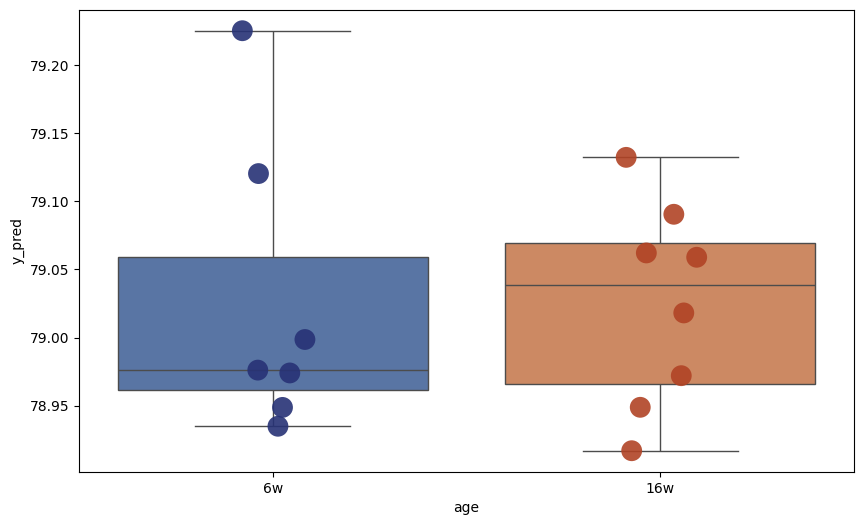

Components: 2
             y_pred
brain_9   76.646579
brain_8   73.838951
brain_7   77.472489
brain_4   78.309396
brain_3   81.105471
brain_20  79.774712
brain_18  79.232825
brain_17  76.173338
brain_16  76.867259
brain_15  77.296885
brain_13  77.453776
brain_12  76.524476
brain_11  77.431377
brain_2   78.827208
brain_1   75.393854
             y_pred  age
brain_9   76.646579   6w
brain_8   73.838951   6w
brain_7   77.472489   6w
brain_4   78.309396   6w
brain_3   81.105471   6w
brain_20  79.774712  16w
brain_18  79.232825  16w
brain_17  76.173338  16w
brain_16  76.867259  16w
brain_15  77.296885  16w
brain_13  77.453776  16w
brain_12  76.524476  16w
brain_11  77.431377  16w
brain_2   78.827208   6w
brain_1   75.393854   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


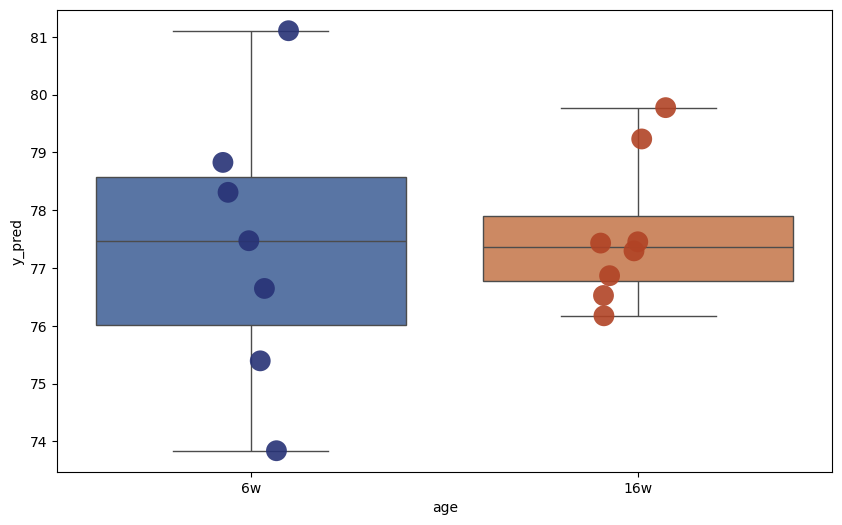

Components: 3
             y_pred
brain_9   70.737610
brain_8   73.878161
brain_7   70.938895
brain_4   67.892070
brain_3   77.212035
brain_20  85.971940
brain_18  87.133671
brain_17  82.776454
brain_16  85.075154
brain_15  86.598112
brain_13  89.984924
brain_12  77.278072
brain_11  81.505844
brain_2   71.336490
brain_1   72.187033
             y_pred  age
brain_9   70.737610   6w
brain_8   73.878161   6w
brain_7   70.938895   6w
brain_4   67.892070   6w
brain_3   77.212035   6w
brain_20  85.971940  16w
brain_18  87.133671  16w
brain_17  82.776454  16w
brain_16  85.075154  16w
brain_15  86.598112  16w
brain_13  89.984924  16w
brain_12  77.278072  16w
brain_11  81.505844  16w
brain_2   71.336490   6w
brain_1   72.187033   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


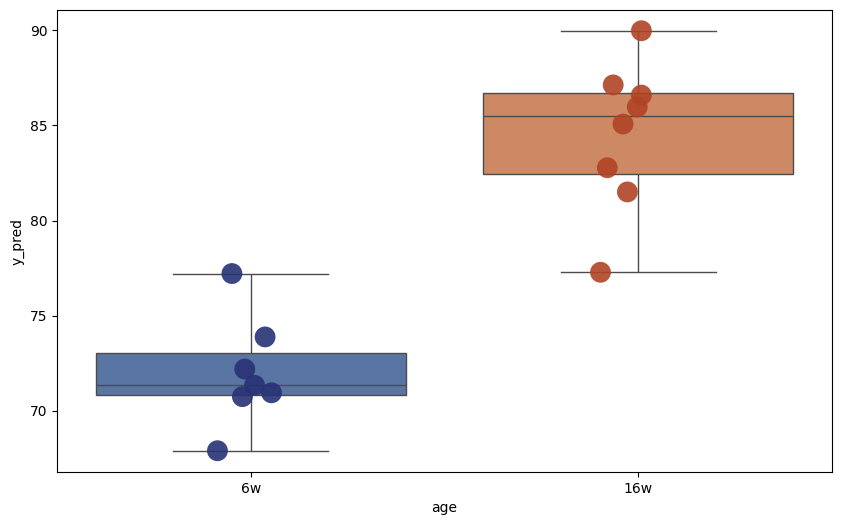

Components: 4
             y_pred
brain_9   69.800045
brain_8   73.626181
brain_7   70.228247
brain_4   66.696137
brain_3   75.817592
brain_20  85.392846
brain_18  86.876967
brain_17  83.604063
brain_16  85.803980
brain_15  87.089917
brain_13  90.471185
brain_12  77.491840
brain_11  81.663383
brain_2   70.565551
brain_1   72.051648
             y_pred  age
brain_9   69.800045   6w
brain_8   73.626181   6w
brain_7   70.228247   6w
brain_4   66.696137   6w
brain_3   75.817592   6w
brain_20  85.392846  16w
brain_18  86.876967  16w
brain_17  83.604063  16w
brain_16  85.803980  16w
brain_15  87.089917  16w
brain_13  90.471185  16w
brain_12  77.491840  16w
brain_11  81.663383  16w
brain_2   70.565551   6w
brain_1   72.051648   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


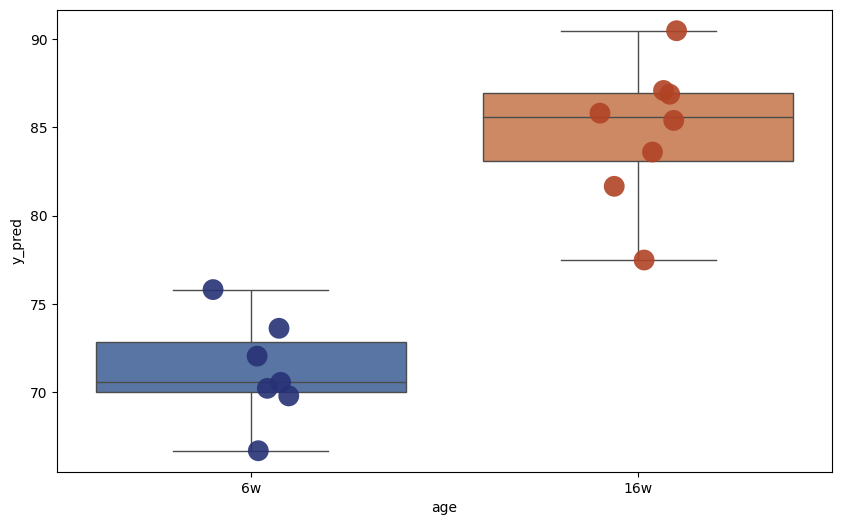

Components: 5
             y_pred
brain_9   69.833614
brain_8   73.502585
brain_7   69.706847
brain_4   66.714891
brain_3   77.546274
brain_20  85.617035
brain_18  86.620618
brain_17  82.915649
brain_16  85.718442
brain_15  87.371990
brain_13  90.741185
brain_12  75.653498
brain_11  80.343221
brain_2   71.124413
brain_1   71.382095
             y_pred  age
brain_9   69.833614   6w
brain_8   73.502585   6w
brain_7   69.706847   6w
brain_4   66.714891   6w
brain_3   77.546274   6w
brain_20  85.617035  16w
brain_18  86.620618  16w
brain_17  82.915649  16w
brain_16  85.718442  16w
brain_15  87.371990  16w
brain_13  90.741185  16w
brain_12  75.653498  16w
brain_11  80.343221  16w
brain_2   71.124413   6w
brain_1   71.382095   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


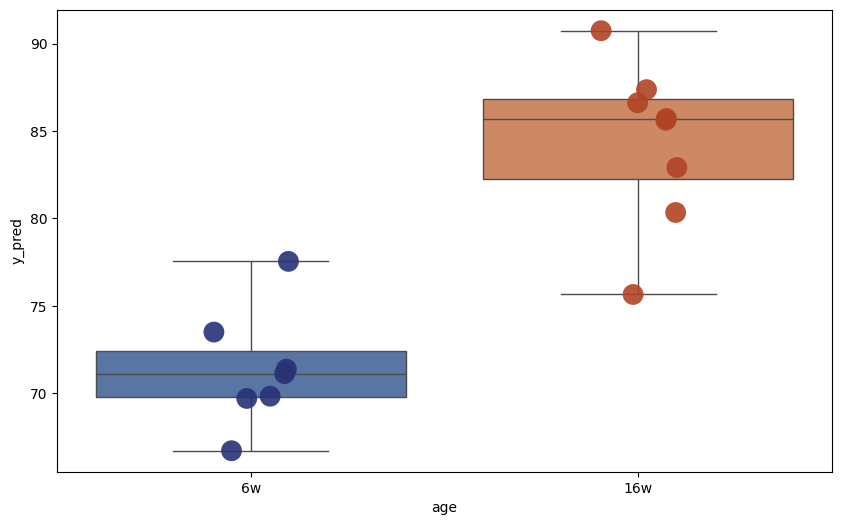

Components: 6
             y_pred
brain_9   67.625394
brain_8   71.347057
brain_7   67.485675
brain_4   64.639713
brain_3   74.467805
brain_20  89.468763
brain_18  87.249750
brain_17  83.007591
brain_16  88.914012
brain_15  92.283072
brain_13  95.484050
brain_12  72.687062
brain_11  79.755297
brain_2   65.812818
brain_1   63.203251
             y_pred  age
brain_9   67.625394   6w
brain_8   71.347057   6w
brain_7   67.485675   6w
brain_4   64.639713   6w
brain_3   74.467805   6w
brain_20  89.468763  16w
brain_18  87.249750  16w
brain_17  83.007591  16w
brain_16  88.914012  16w
brain_15  92.283072  16w
brain_13  95.484050  16w
brain_12  72.687062  16w
brain_11  79.755297  16w
brain_2   65.812818   6w
brain_1   63.203251   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


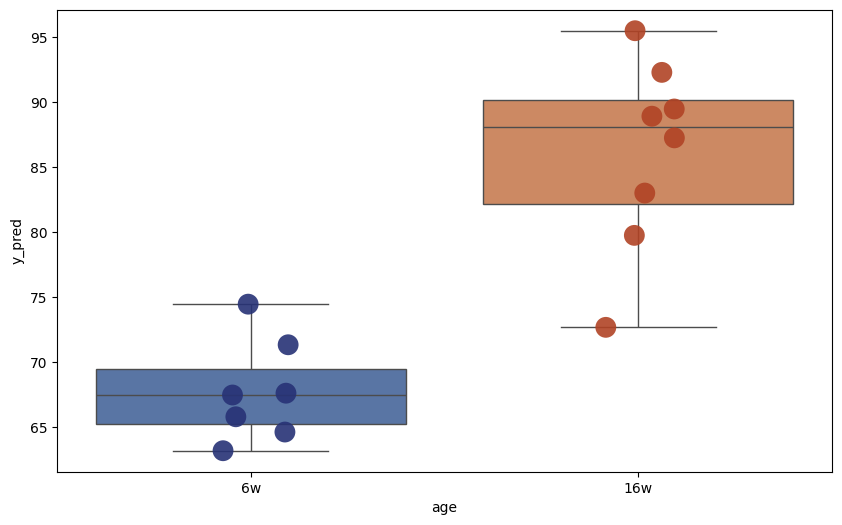

Components: 7
             y_pred
brain_9   62.518977
brain_8   67.110355
brain_7   71.031135
brain_4   60.970673
brain_3   69.946419
brain_20  91.556919
brain_18  86.514442
brain_17  89.727120
brain_16  91.075523
brain_15  96.280084
brain_13  99.107188
brain_12  84.039654
brain_11  89.315838
brain_2   64.726760
brain_1   62.284009
             y_pred  age
brain_9   62.518977   6w
brain_8   67.110355   6w
brain_7   71.031135   6w
brain_4   60.970673   6w
brain_3   69.946419   6w
brain_20  91.556919  16w
brain_18  86.514442  16w
brain_17  89.727120  16w
brain_16  91.075523  16w
brain_15  96.280084  16w
brain_13  99.107188  16w
brain_12  84.039654  16w
brain_11  89.315838  16w
brain_2   64.726760   6w
brain_1   62.284009   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


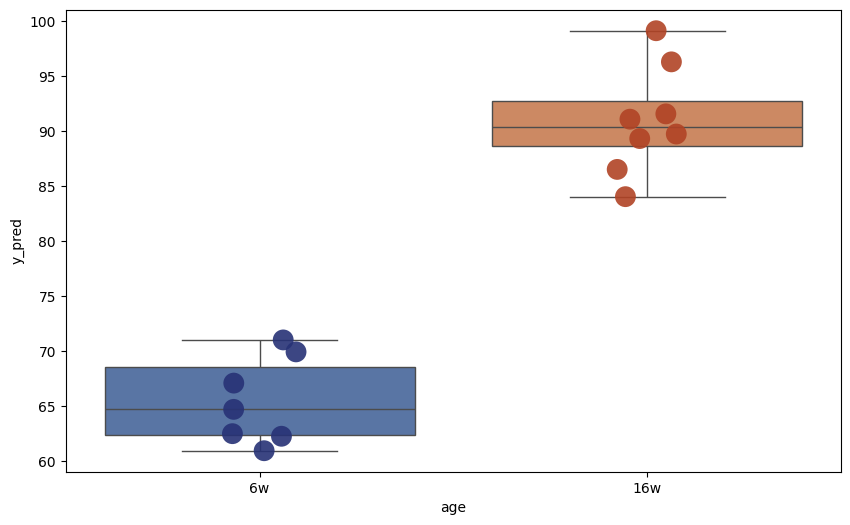

Components: 8
             y_pred
brain_9   59.816348
brain_8   64.063491
brain_7   68.119416
brain_4   58.336347
brain_3   67.084536
brain_20  92.581554
brain_18  88.406394
brain_17  86.782198
brain_16  87.910426
brain_15  93.489171
brain_13  96.668411
brain_12  81.697329
brain_11  87.069958
brain_2   61.735364
brain_1   59.823291
             y_pred  age
brain_9   59.816348   6w
brain_8   64.063491   6w
brain_7   68.119416   6w
brain_4   58.336347   6w
brain_3   67.084536   6w
brain_20  92.581554  16w
brain_18  88.406394  16w
brain_17  86.782198  16w
brain_16  87.910426  16w
brain_15  93.489171  16w
brain_13  96.668411  16w
brain_12  81.697329  16w
brain_11  87.069958  16w
brain_2   61.735364   6w
brain_1   59.823291   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


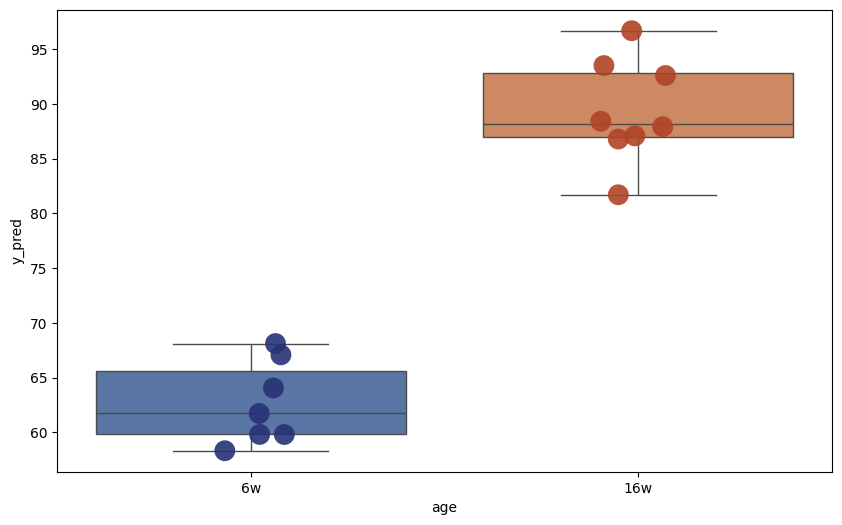

Components: 9
             y_pred
brain_9   59.931343
brain_8   64.171871
brain_7   68.243735
brain_4   58.451904
brain_3   67.171337
brain_20  92.665568
brain_18  88.424850
brain_17  86.858753
brain_16  87.907379
brain_15  93.553687
brain_13  96.764876
brain_12  81.832606
brain_11  87.228994
brain_2   61.810305
brain_1   59.970821
             y_pred  age
brain_9   59.931343   6w
brain_8   64.171871   6w
brain_7   68.243735   6w
brain_4   58.451904   6w
brain_3   67.171337   6w
brain_20  92.665568  16w
brain_18  88.424850  16w
brain_17  86.858753  16w
brain_16  87.907379  16w
brain_15  93.553687  16w
brain_13  96.764876  16w
brain_12  81.832606  16w
brain_11  87.228994  16w
brain_2   61.810305   6w
brain_1   59.970821   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


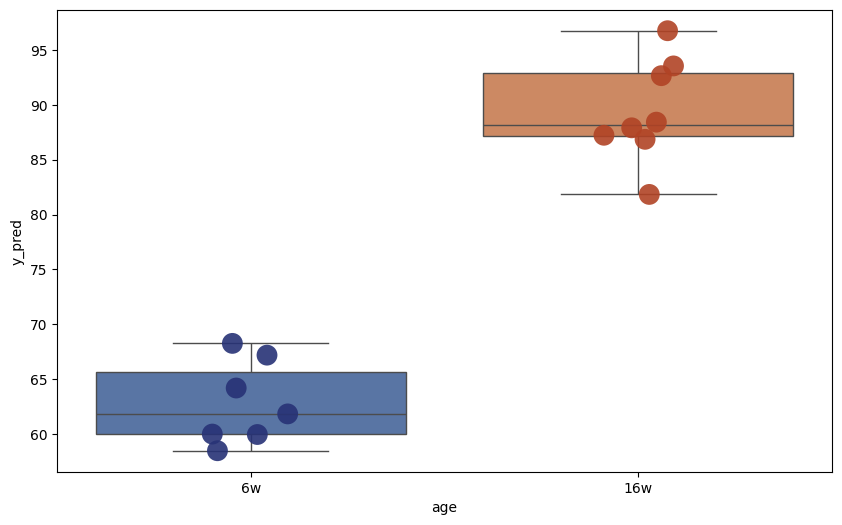

Components: 10
             y_pred
brain_9   59.251624
brain_8   63.058207
brain_7   67.277076
brain_4   58.256281
brain_3   68.877934
brain_20  93.473693
brain_18  88.523366
brain_17  86.515697
brain_16  88.228090
brain_15  94.136815
brain_13  97.081728
brain_12  78.569749
brain_11  85.452900
brain_2   62.160303
brain_1   58.546591
             y_pred  age
brain_9   59.251624   6w
brain_8   63.058207   6w
brain_7   67.277076   6w
brain_4   58.256281   6w
brain_3   68.877934   6w
brain_20  93.473693  16w
brain_18  88.523366  16w
brain_17  86.515697  16w
brain_16  88.228090  16w
brain_15  94.136815  16w
brain_13  97.081728  16w
brain_12  78.569749  16w
brain_11  85.452900  16w
brain_2   62.160303   6w
brain_1   58.546591   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


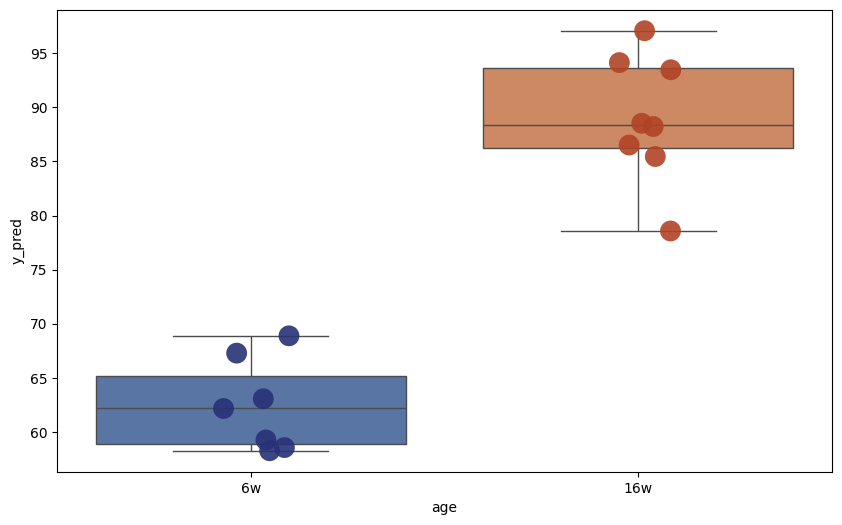

Components: 11
             y_pred
brain_9   59.238217
brain_8   63.069434
brain_7   67.316311
brain_4   58.252517
brain_3   68.800474
brain_20  93.432879
brain_18  88.534512
brain_17  86.587232
brain_16  88.274683
brain_15  94.193640
brain_13  97.109805
brain_12  78.664613
brain_11  85.515930
brain_2   62.137644
brain_1   58.510669
             y_pred  age
brain_9   59.238217   6w
brain_8   63.069434   6w
brain_7   67.316311   6w
brain_4   58.252517   6w
brain_3   68.800474   6w
brain_20  93.432879  16w
brain_18  88.534512  16w
brain_17  86.587232  16w
brain_16  88.274683  16w
brain_15  94.193640  16w
brain_13  97.109805  16w
brain_12  78.664613  16w
brain_11  85.515930  16w
brain_2   62.137644   6w
brain_1   58.510669   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


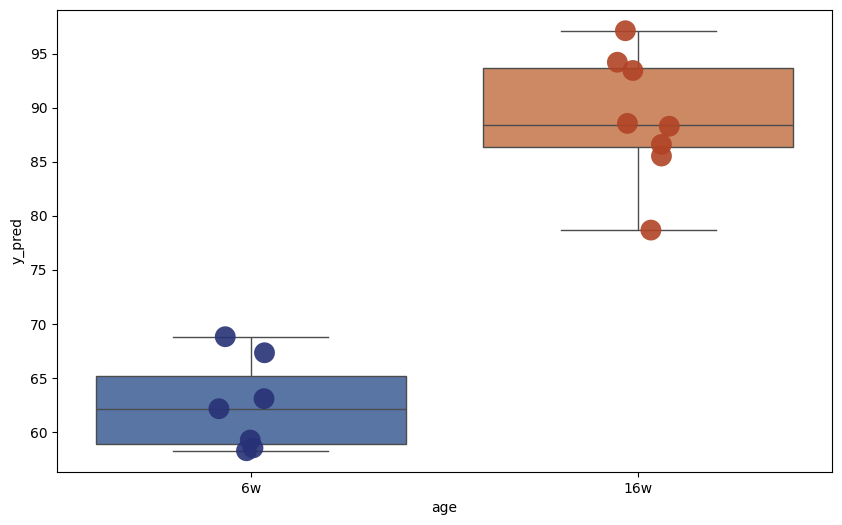

Components: 12
             y_pred
brain_9   59.104990
brain_8   62.872248
brain_7   67.173820
brain_4   58.123218
brain_3   68.642079
brain_20  93.296330
brain_18  88.474145
brain_17  86.421360
brain_16  88.126572
brain_15  94.015242
brain_13  96.962336
brain_12  78.528278
brain_11  85.387026
brain_2   62.027401
brain_1   58.378025
             y_pred  age
brain_9   59.104990   6w
brain_8   62.872248   6w
brain_7   67.173820   6w
brain_4   58.123218   6w
brain_3   68.642079   6w
brain_20  93.296330  16w
brain_18  88.474145  16w
brain_17  86.421360  16w
brain_16  88.126572  16w
brain_15  94.015242  16w
brain_13  96.962336  16w
brain_12  78.528278  16w
brain_11  85.387026  16w
brain_2   62.027401   6w
brain_1   58.378025   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


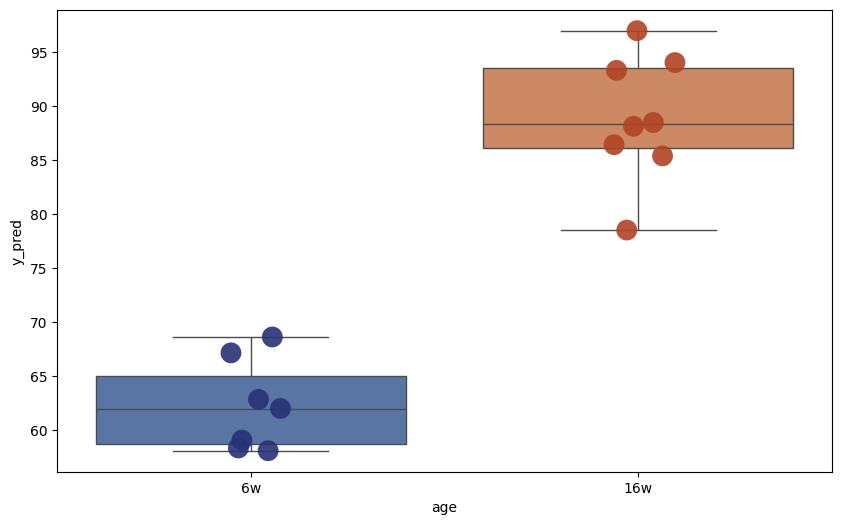

Components: 13
             y_pred
brain_9   62.015518
brain_8   68.213811
brain_7   68.504787
brain_4   59.675596
brain_3   70.709831
brain_20  93.905598
brain_18  89.985622
brain_17  90.193709
brain_16  90.455159
brain_15  95.538600
brain_13  97.360140
brain_12  81.670456
brain_11  90.593975
brain_2   63.685637
brain_1   60.424384
             y_pred  age
brain_9   62.015518   6w
brain_8   68.213811   6w
brain_7   68.504787   6w
brain_4   59.675596   6w
brain_3   70.709831   6w
brain_20  93.905598  16w
brain_18  89.985622  16w
brain_17  90.193709  16w
brain_16  90.455159  16w
brain_15  95.538600  16w
brain_13  97.360140  16w
brain_12  81.670456  16w
brain_11  90.593975  16w
brain_2   63.685637   6w
brain_1   60.424384   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


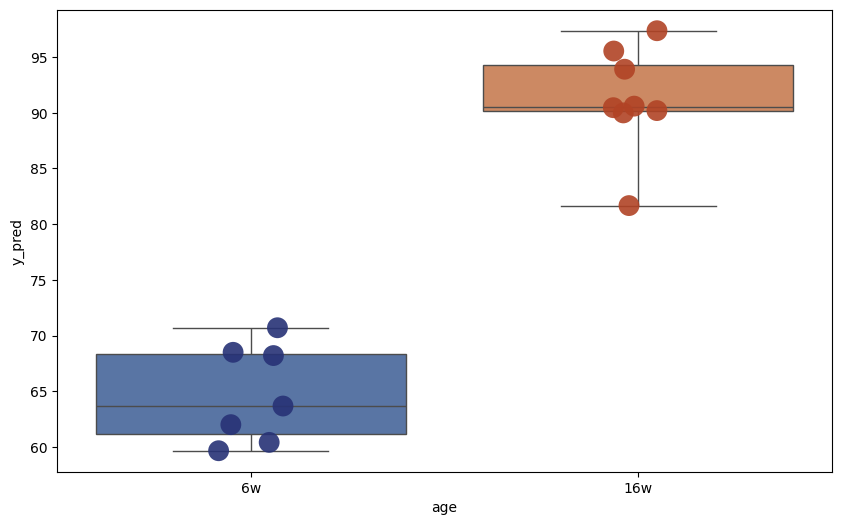

Components: 14
             y_pred
brain_9   62.642090
brain_8   69.202846
brain_7   68.683229
brain_4   60.163666
brain_3   70.699740
brain_20  92.765865
brain_18  89.771930
brain_17  90.767976
brain_16  90.752382
brain_15  95.228001
brain_13  96.457524
brain_12  82.161524
brain_11  90.927804
brain_2   63.375159
brain_1   60.737674
             y_pred  age
brain_9   62.642090   6w
brain_8   69.202846   6w
brain_7   68.683229   6w
brain_4   60.163666   6w
brain_3   70.699740   6w
brain_20  92.765865  16w
brain_18  89.771930  16w
brain_17  90.767976  16w
brain_16  90.752382  16w
brain_15  95.228001  16w
brain_13  96.457524  16w
brain_12  82.161524  16w
brain_11  90.927804  16w
brain_2   63.375159   6w
brain_1   60.737674   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


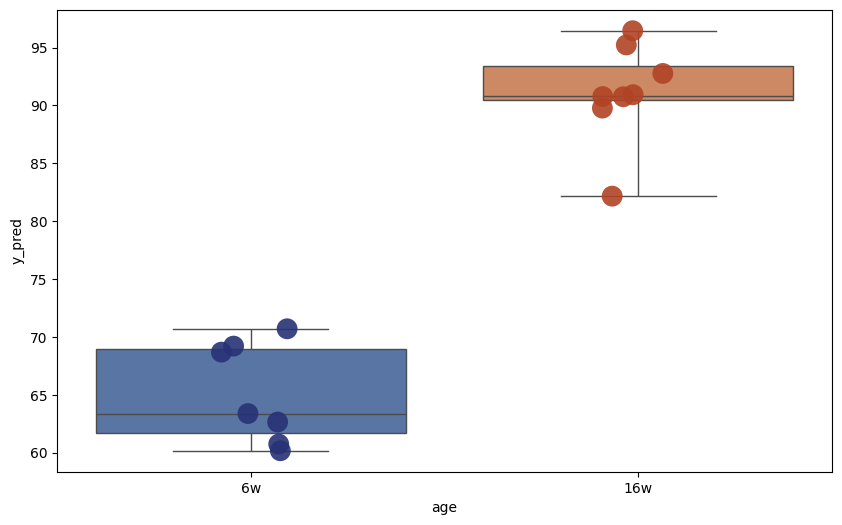

Components: 15
             y_pred
brain_9   62.384878
brain_8   68.908361
brain_7   69.212448
brain_4   59.944874
brain_3   70.640393
brain_20  93.556899
brain_18  89.657358
brain_17  91.284034
brain_16  91.487864
brain_15  96.393409
brain_13  97.472675
brain_12  83.452268
brain_11  91.602411
brain_2   63.431102
brain_1   60.899358
             y_pred  age
brain_9   62.384878   6w
brain_8   68.908361   6w
brain_7   69.212448   6w
brain_4   59.944874   6w
brain_3   70.640393   6w
brain_20  93.556899  16w
brain_18  89.657358  16w
brain_17  91.284034  16w
brain_16  91.487864  16w
brain_15  96.393409  16w
brain_13  97.472675  16w
brain_12  83.452268  16w
brain_11  91.602411  16w
brain_2   63.431102   6w
brain_1   60.899358   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


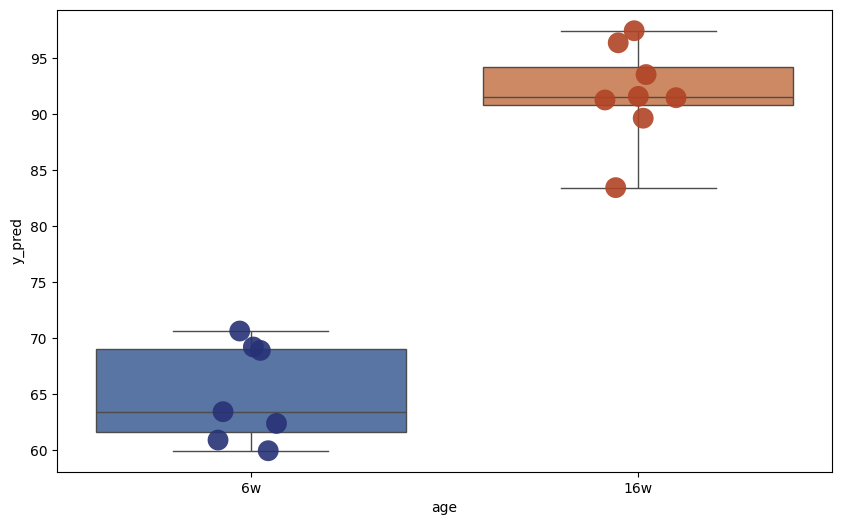

Components: 16
             y_pred
brain_9   62.512261
brain_8   70.411597
brain_7   67.886304
brain_4   59.735759
brain_3   70.310012
brain_20  92.703398
brain_18  89.813925
brain_17  91.240736
brain_16  90.333839
brain_15  95.062752
brain_13  96.233312
brain_12  83.705680
brain_11  91.726109
brain_2   63.417473
brain_1   62.097040
             y_pred  age
brain_9   62.512261   6w
brain_8   70.411597   6w
brain_7   67.886304   6w
brain_4   59.735759   6w
brain_3   70.310012   6w
brain_20  92.703398  16w
brain_18  89.813925  16w
brain_17  91.240736  16w
brain_16  90.333839  16w
brain_15  95.062752  16w
brain_13  96.233312  16w
brain_12  83.705680  16w
brain_11  91.726109  16w
brain_2   63.417473   6w
brain_1   62.097040   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


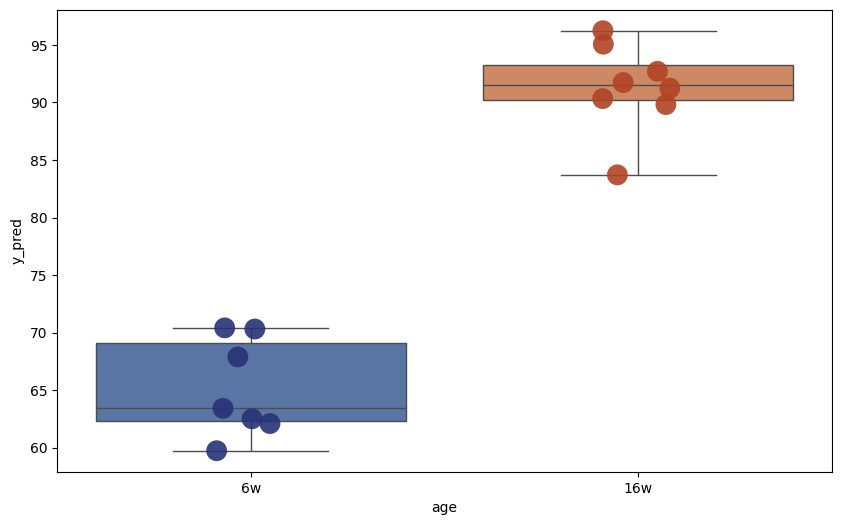

Components: 17
             y_pred
brain_9   62.526133
brain_8   70.437702
brain_7   67.886871
brain_4   59.755534
brain_3   70.290270
brain_20  92.705373
brain_18  89.791993
brain_17  91.211542
brain_16  90.299369
brain_15  95.041625
brain_13  96.203862
brain_12  83.696684
brain_11  91.717059
brain_2   63.419272
brain_1   62.099056
             y_pred  age
brain_9   62.526133   6w
brain_8   70.437702   6w
brain_7   67.886871   6w
brain_4   59.755534   6w
brain_3   70.290270   6w
brain_20  92.705373  16w
brain_18  89.791993  16w
brain_17  91.211542  16w
brain_16  90.299369  16w
brain_15  95.041625  16w
brain_13  96.203862  16w
brain_12  83.696684  16w
brain_11  91.717059  16w
brain_2   63.419272   6w
brain_1   62.099056   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


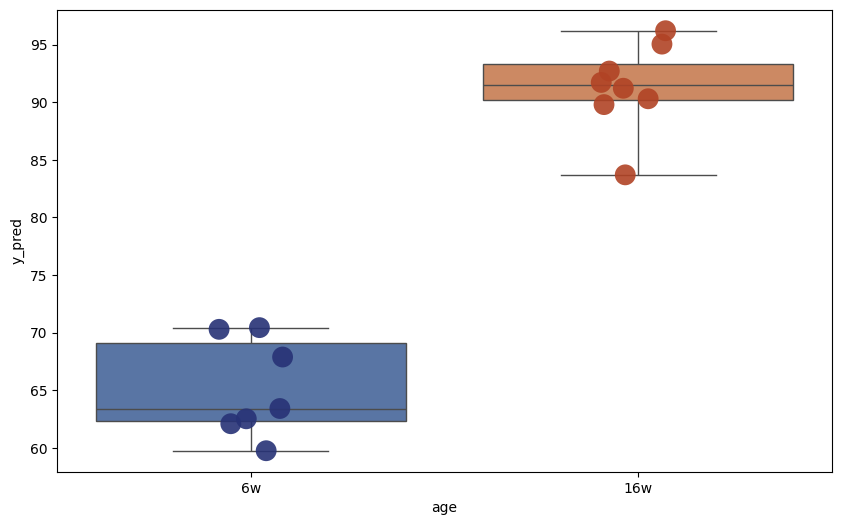

Components: 18
             y_pred
brain_9   62.480399
brain_8   70.202273
brain_7   68.069356
brain_4   59.817870
brain_3   70.476099
brain_20  92.989724
brain_18  89.777324
brain_17  91.233861
brain_16  90.394288
brain_15  95.232023
brain_13  96.503018
brain_12  83.731169
brain_11  91.792204
brain_2   63.637159
brain_1   62.088921
             y_pred  age
brain_9   62.480399   6w
brain_8   70.202273   6w
brain_7   68.069356   6w
brain_4   59.817870   6w
brain_3   70.476099   6w
brain_20  92.989724  16w
brain_18  89.777324  16w
brain_17  91.233861  16w
brain_16  90.394288  16w
brain_15  95.232023  16w
brain_13  96.503018  16w
brain_12  83.731169  16w
brain_11  91.792204  16w
brain_2   63.637159   6w
brain_1   62.088921   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


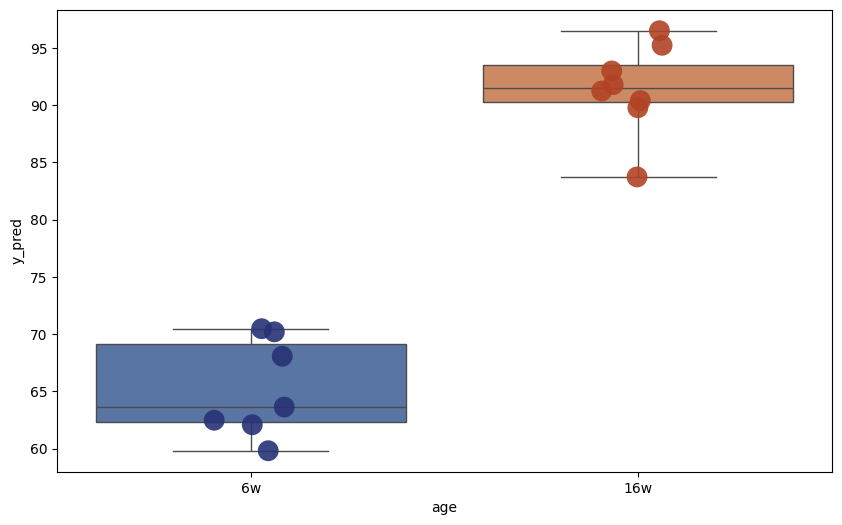

Components: 19
             y_pred
brain_9   62.548804
brain_8   70.931285
brain_7   67.537998
brain_4   60.048954
brain_3   70.452991
brain_20  91.498825
brain_18  89.831877
brain_17  90.164923
brain_16  89.027719
brain_15  94.351328
brain_13  95.708296
brain_12  83.122753
brain_11  91.236756
brain_2   63.345669
brain_1   62.854414
             y_pred  age
brain_9   62.548804   6w
brain_8   70.931285   6w
brain_7   67.537998   6w
brain_4   60.048954   6w
brain_3   70.452991   6w
brain_20  91.498825  16w
brain_18  89.831877  16w
brain_17  90.164923  16w
brain_16  89.027719  16w
brain_15  94.351328  16w
brain_13  95.708296  16w
brain_12  83.122753  16w
brain_11  91.236756  16w
brain_2   63.345669   6w
brain_1   62.854414   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


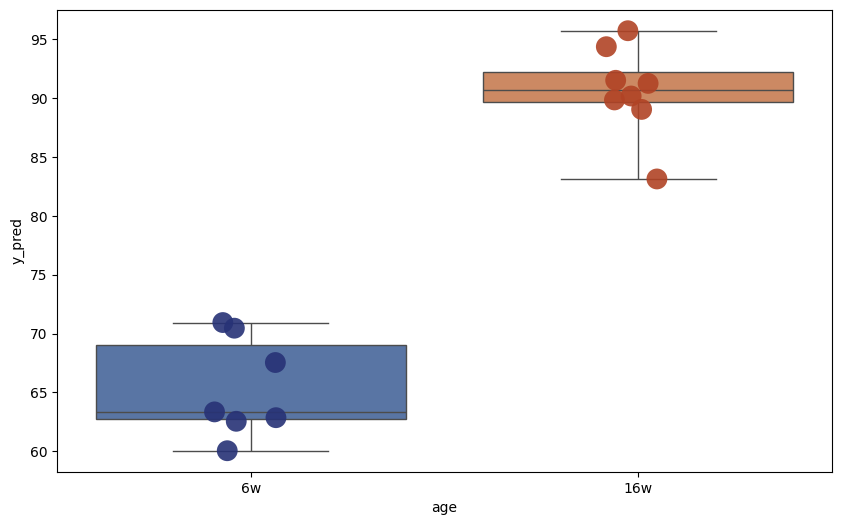

Components: 20
             y_pred
brain_9   62.112551
brain_8   70.132369
brain_7   68.024110
brain_4   59.807013
brain_3   69.511148
brain_20  92.183857
brain_18  90.007401
brain_17  89.968588
brain_16  88.829073
brain_15  94.338040
brain_13  96.090294
brain_12  83.491205
brain_11  91.331154
brain_2   62.916388
brain_1   62.152248
             y_pred  age
brain_9   62.112551   6w
brain_8   70.132369   6w
brain_7   68.024110   6w
brain_4   59.807013   6w
brain_3   69.511148   6w
brain_20  92.183857  16w
brain_18  90.007401  16w
brain_17  89.968588  16w
brain_16  88.829073  16w
brain_15  94.338040  16w
brain_13  96.090294  16w
brain_12  83.491205  16w
brain_11  91.331154  16w
brain_2   62.916388   6w
brain_1   62.152248   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


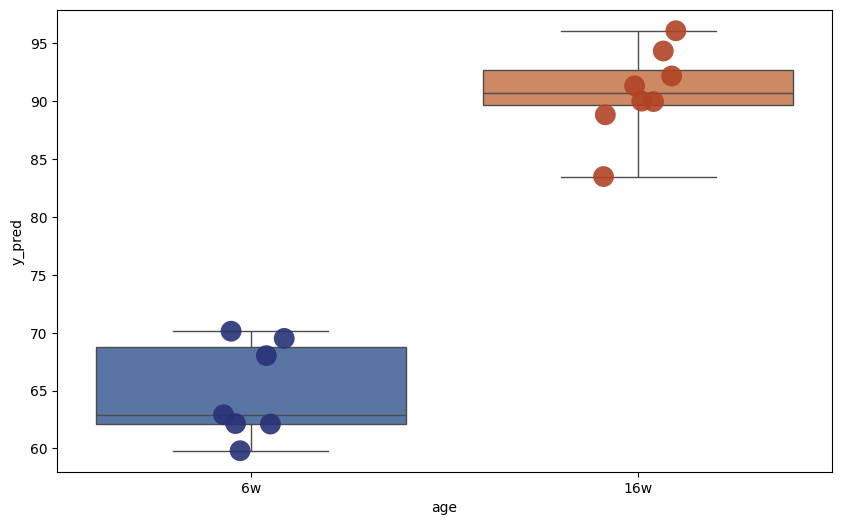

Components: 21
             y_pred
brain_9   60.770242
brain_8   68.383173
brain_7   68.627024
brain_4   59.058556
brain_3   67.679838
brain_20  93.281018
brain_18  89.759686
brain_17  90.627967
brain_16  88.623038
brain_15  94.607959
brain_13  96.941127
brain_12  85.009253
brain_11  91.816483
brain_2   62.065160
brain_1   61.286157
             y_pred  age
brain_9   60.770242   6w
brain_8   68.383173   6w
brain_7   68.627024   6w
brain_4   59.058556   6w
brain_3   67.679838   6w
brain_20  93.281018  16w
brain_18  89.759686  16w
brain_17  90.627967  16w
brain_16  88.623038  16w
brain_15  94.607959  16w
brain_13  96.941127  16w
brain_12  85.009253  16w
brain_11  91.816483  16w
brain_2   62.065160   6w
brain_1   61.286157   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


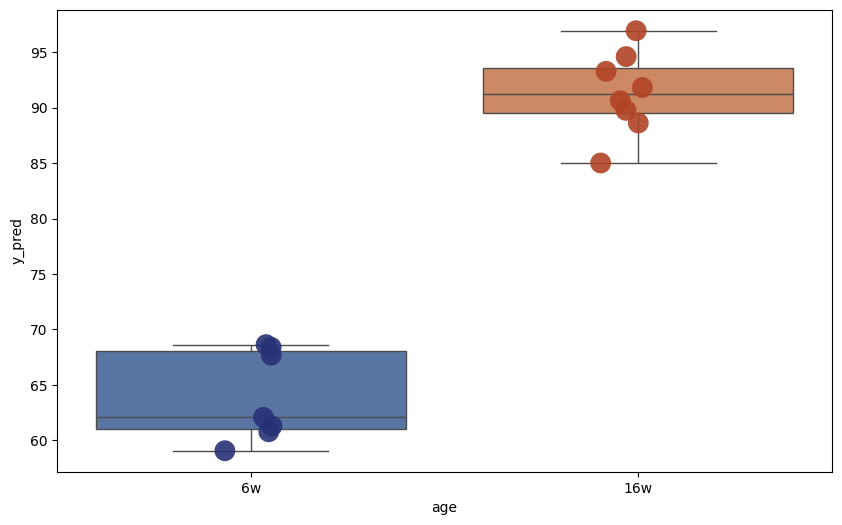

Components: 22
              y_pred
brain_9    59.056812
brain_8    64.067968
brain_7    68.098842
brain_4    57.636442
brain_3    66.038060
brain_20   96.350512
brain_18   91.114040
brain_17   92.786021
brain_16   91.091446
brain_15   97.272017
brain_13  100.276785
brain_12   86.971536
brain_11   92.806450
brain_2    60.273005
brain_1    59.965570
              y_pred  age
brain_9    59.056812   6w
brain_8    64.067968   6w
brain_7    68.098842   6w
brain_4    57.636442   6w
brain_3    66.038060   6w
brain_20   96.350512  16w
brain_18   91.114040  16w
brain_17   92.786021  16w
brain_16   91.091446  16w
brain_15   97.272017  16w
brain_13  100.276785  16w
brain_12   86.971536  16w
brain_11   92.806450  16w
brain_2    60.273005   6w
brain_1    59.965570   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


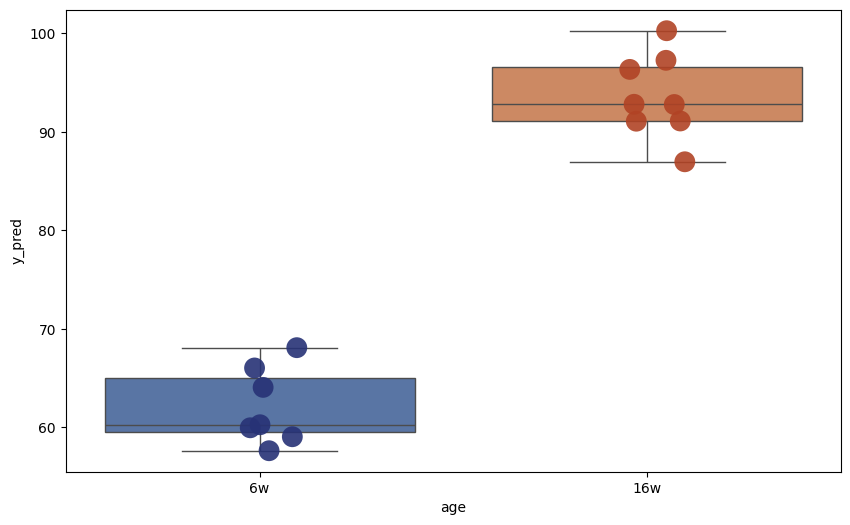

Components: 23
              y_pred
brain_9    58.066737
brain_8    61.868247
brain_7    68.669568
brain_4    56.336233
brain_3    64.579759
brain_20   97.029528
brain_18   90.406318
brain_17   93.097680
brain_16   91.635495
brain_15   98.439639
brain_13  101.358738
brain_12   87.612133
brain_11   93.140372
brain_2    59.623312
brain_1    58.179852
              y_pred  age
brain_9    58.066737   6w
brain_8    61.868247   6w
brain_7    68.669568   6w
brain_4    56.336233   6w
brain_3    64.579759   6w
brain_20   97.029528  16w
brain_18   90.406318  16w
brain_17   93.097680  16w
brain_16   91.635495  16w
brain_15   98.439639  16w
brain_13  101.358738  16w
brain_12   87.612133  16w
brain_11   93.140372  16w
brain_2    59.623312   6w
brain_1    58.179852   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


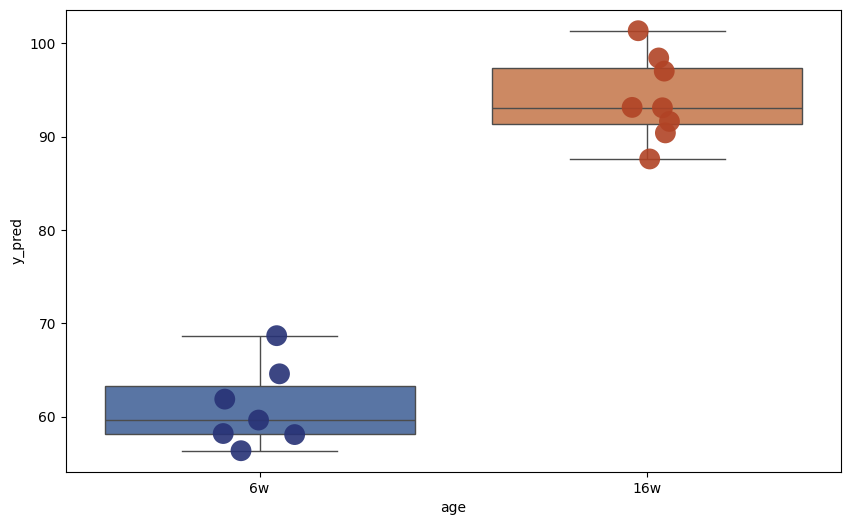

Components: 24
              y_pred
brain_9    58.300042
brain_8    62.304439
brain_7    69.012812
brain_4    56.732236
brain_3    65.229720
brain_20   97.587295
brain_18   91.520393
brain_17   93.398219
brain_16   91.764774
brain_15   98.583964
brain_13  101.294106
brain_12   87.923146
brain_11   93.424665
brain_2    60.284274
brain_1    58.953281
              y_pred  age
brain_9    58.300042   6w
brain_8    62.304439   6w
brain_7    69.012812   6w
brain_4    56.732236   6w
brain_3    65.229720   6w
brain_20   97.587295  16w
brain_18   91.520393  16w
brain_17   93.398219  16w
brain_16   91.764774  16w
brain_15   98.583964  16w
brain_13  101.294106  16w
brain_12   87.923146  16w
brain_11   93.424665  16w
brain_2    60.284274   6w
brain_1    58.953281   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


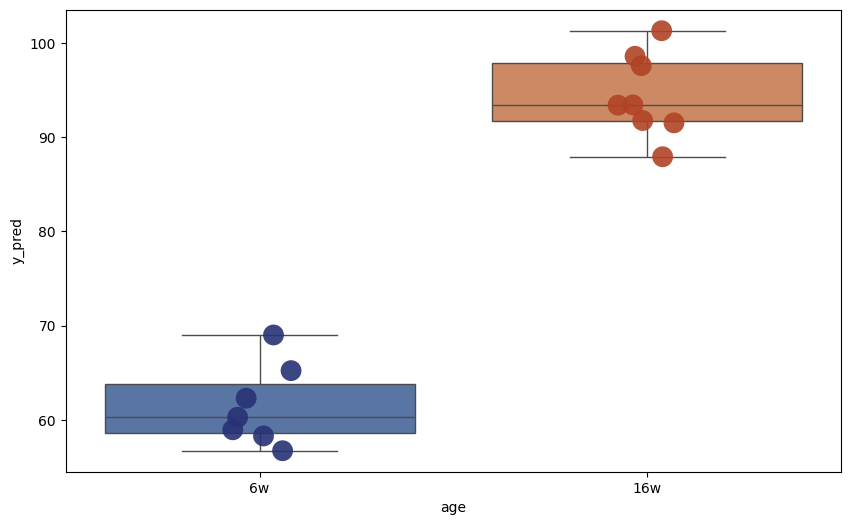

Components: 25
              y_pred
brain_9    57.990870
brain_8    62.046073
brain_7    68.673158
brain_4    56.517097
brain_3    64.933620
brain_20   97.552576
brain_18   91.047161
brain_17   93.103601
brain_16   91.649882
brain_15   98.204972
brain_13  100.845287
brain_12   87.609638
brain_11   93.070891
brain_2    59.856299
brain_1    58.585758
              y_pred  age
brain_9    57.990870   6w
brain_8    62.046073   6w
brain_7    68.673158   6w
brain_4    56.517097   6w
brain_3    64.933620   6w
brain_20   97.552576  16w
brain_18   91.047161  16w
brain_17   93.103601  16w
brain_16   91.649882  16w
brain_15   98.204972  16w
brain_13  100.845287  16w
brain_12   87.609638  16w
brain_11   93.070891  16w
brain_2    59.856299   6w
brain_1    58.585758   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


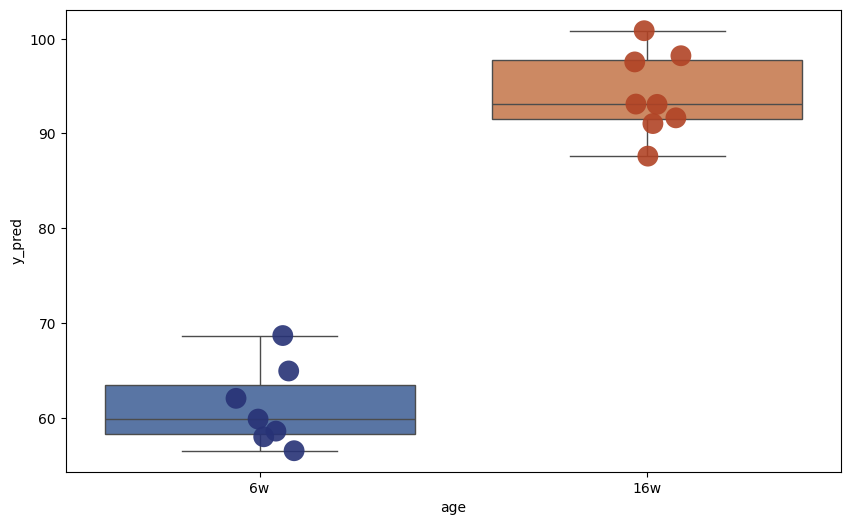

Components: 26
              y_pred
brain_9    57.994880
brain_8    62.068124
brain_7    68.653270
brain_4    56.496485
brain_3    64.839260
brain_20   97.507438
brain_18   91.051457
brain_17   93.149640
brain_16   91.627160
brain_15   98.209101
brain_13  100.847960
brain_12   87.660131
brain_11   93.119659
brain_2    59.767779
brain_1    58.594245
              y_pred  age
brain_9    57.994880   6w
brain_8    62.068124   6w
brain_7    68.653270   6w
brain_4    56.496485   6w
brain_3    64.839260   6w
brain_20   97.507438  16w
brain_18   91.051457  16w
brain_17   93.149640  16w
brain_16   91.627160  16w
brain_15   98.209101  16w
brain_13  100.847960  16w
brain_12   87.660131  16w
brain_11   93.119659  16w
brain_2    59.767779   6w
brain_1    58.594245   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


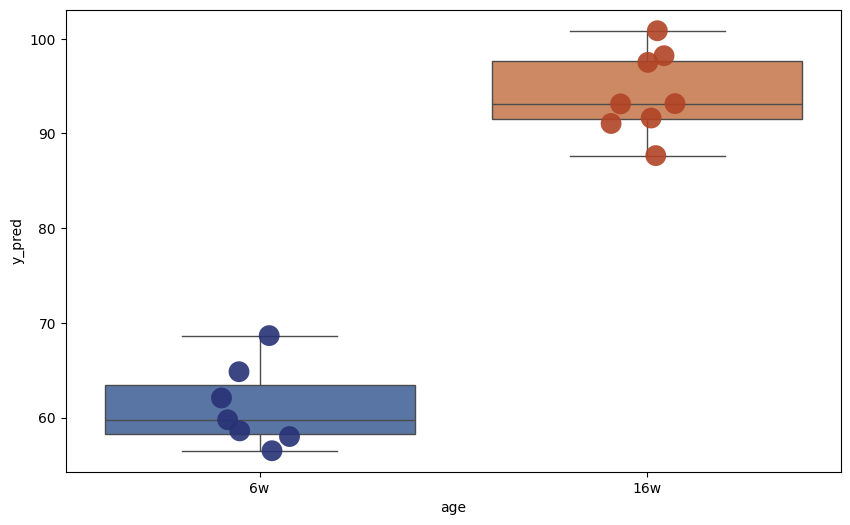

Components: 27
              y_pred
brain_9    58.329333
brain_8    62.275115
brain_7    69.200868
brain_4    57.185687
brain_3    65.673871
brain_20   97.329576
brain_18   91.036816
brain_17   93.264473
brain_16   91.596292
brain_15   98.183216
brain_13  100.887308
brain_12   87.455598
brain_11   92.933178
brain_2    60.351545
brain_1    59.060647
              y_pred  age
brain_9    58.329333   6w
brain_8    62.275115   6w
brain_7    69.200868   6w
brain_4    57.185687   6w
brain_3    65.673871   6w
brain_20   97.329576  16w
brain_18   91.036816  16w
brain_17   93.264473  16w
brain_16   91.596292  16w
brain_15   98.183216  16w
brain_13  100.887308  16w
brain_12   87.455598  16w
brain_11   92.933178  16w
brain_2    60.351545   6w
brain_1    59.060647   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


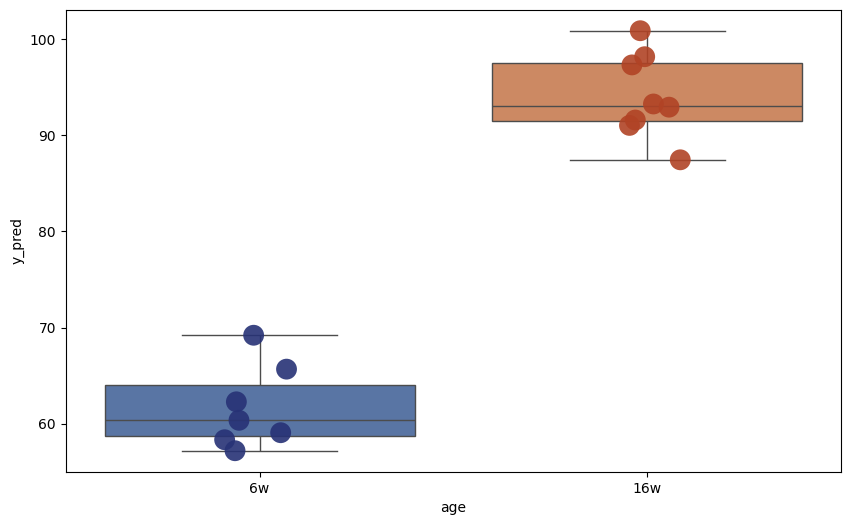

Components: 28
              y_pred
brain_9    58.359530
brain_8    62.218189
brain_7    69.147995
brain_4    57.166458
brain_3    65.718730
brain_20   97.285859
brain_18   91.004518
brain_17   93.244734
brain_16   91.641363
brain_15   98.102035
brain_13  100.730853
brain_12   87.341670
brain_11   92.819454
brain_2    60.372752
brain_1    59.095034
              y_pred  age
brain_9    58.359530   6w
brain_8    62.218189   6w
brain_7    69.147995   6w
brain_4    57.166458   6w
brain_3    65.718730   6w
brain_20   97.285859  16w
brain_18   91.004518  16w
brain_17   93.244734  16w
brain_16   91.641363  16w
brain_15   98.102035  16w
brain_13  100.730853  16w
brain_12   87.341670  16w
brain_11   92.819454  16w
brain_2    60.372752   6w
brain_1    59.095034   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


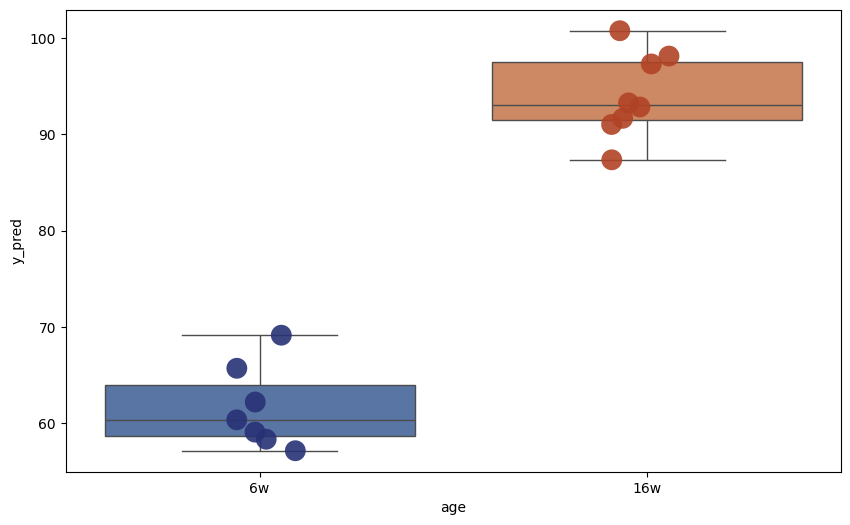

Components: 29
              y_pred
brain_9    58.269966
brain_8    62.216840
brain_7    69.057555
brain_4    57.090363
brain_3    65.666658
brain_20   97.071236
brain_18   91.070026
brain_17   93.164398
brain_16   91.500410
brain_15   98.069307
brain_13  100.512309
brain_12   87.357078
brain_11   92.717956
brain_2    60.269174
brain_1    58.970177
              y_pred  age
brain_9    58.269966   6w
brain_8    62.216840   6w
brain_7    69.057555   6w
brain_4    57.090363   6w
brain_3    65.666658   6w
brain_20   97.071236  16w
brain_18   91.070026  16w
brain_17   93.164398  16w
brain_16   91.500410  16w
brain_15   98.069307  16w
brain_13  100.512309  16w
brain_12   87.357078  16w
brain_11   92.717956  16w
brain_2    60.269174   6w
brain_1    58.970177   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


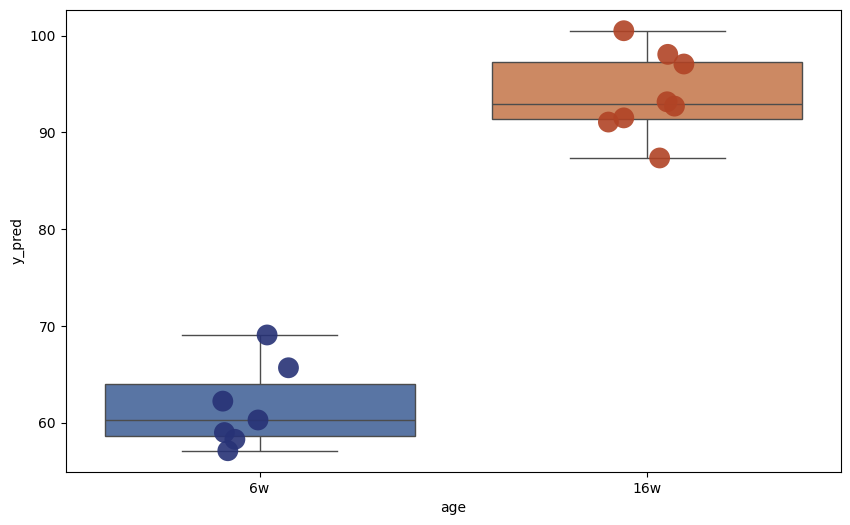

Components: 30
              y_pred
brain_9    58.977965
brain_8    62.685921
brain_7    69.299387
brain_4    57.857440
brain_3    66.462247
brain_20   97.629537
brain_18   91.402518
brain_17   92.765873
brain_16   90.771561
brain_15   97.930880
brain_13  100.222076
brain_12   86.064949
brain_11   92.439038
brain_2    61.164920
brain_1    59.117649
              y_pred  age
brain_9    58.977965   6w
brain_8    62.685921   6w
brain_7    69.299387   6w
brain_4    57.857440   6w
brain_3    66.462247   6w
brain_20   97.629537  16w
brain_18   91.402518  16w
brain_17   92.765873  16w
brain_16   90.771561  16w
brain_15   97.930880  16w
brain_13  100.222076  16w
brain_12   86.064949  16w
brain_11   92.439038  16w
brain_2    61.164920   6w
brain_1    59.117649   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


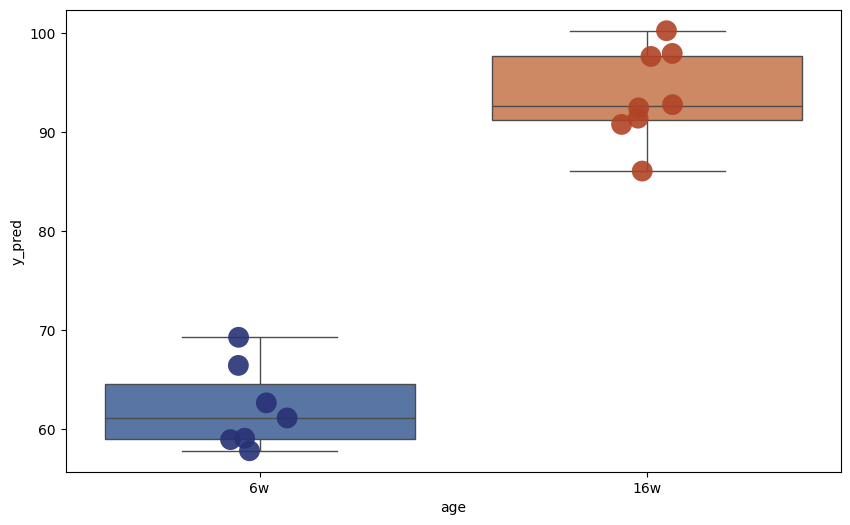

Components: 31
              y_pred
brain_9    58.820540
brain_8    62.422772
brain_7    68.929142
brain_4    57.571119
brain_3    65.334398
brain_20   96.308584
brain_18   90.218075
brain_17   91.964200
brain_16   90.581376
brain_15   97.744708
brain_13  100.461719
brain_12   86.469797
brain_11   92.626969
brain_2    60.198949
brain_1    57.978533
              y_pred  age
brain_9    58.820540   6w
brain_8    62.422772   6w
brain_7    68.929142   6w
brain_4    57.571119   6w
brain_3    65.334398   6w
brain_20   96.308584  16w
brain_18   90.218075  16w
brain_17   91.964200  16w
brain_16   90.581376  16w
brain_15   97.744708  16w
brain_13  100.461719  16w
brain_12   86.469797  16w
brain_11   92.626969  16w
brain_2    60.198949   6w
brain_1    57.978533   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


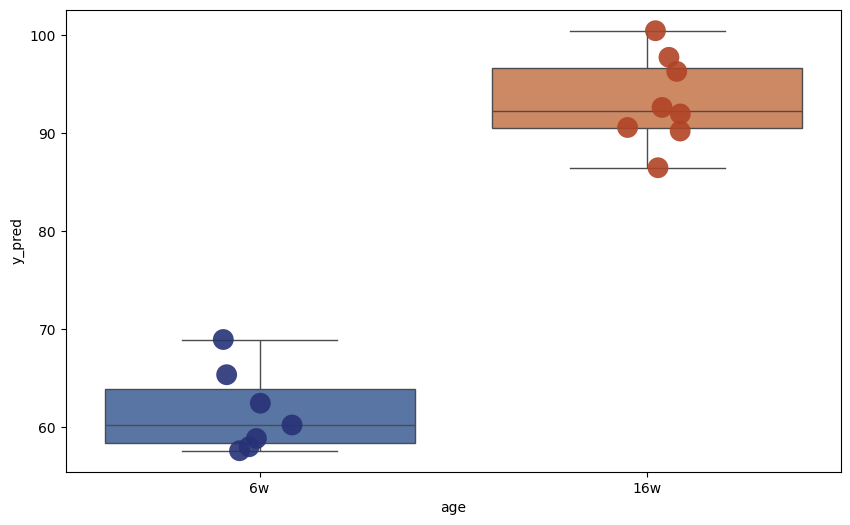

Components: 32
              y_pred
brain_9    59.499390
brain_8    63.471695
brain_7    69.102886
brain_4    58.346393
brain_3    68.040373
brain_20   97.181082
brain_18   91.265893
brain_17   92.104485
brain_16   91.183254
brain_15   97.620985
brain_13  100.642138
brain_12   85.655107
brain_11   92.259478
brain_2    61.617769
brain_1    58.283441
              y_pred  age
brain_9    59.499390   6w
brain_8    63.471695   6w
brain_7    69.102886   6w
brain_4    58.346393   6w
brain_3    68.040373   6w
brain_20   97.181082  16w
brain_18   91.265893  16w
brain_17   92.104485  16w
brain_16   91.183254  16w
brain_15   97.620985  16w
brain_13  100.642138  16w
brain_12   85.655107  16w
brain_11   92.259478  16w
brain_2    61.617769   6w
brain_1    58.283441   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


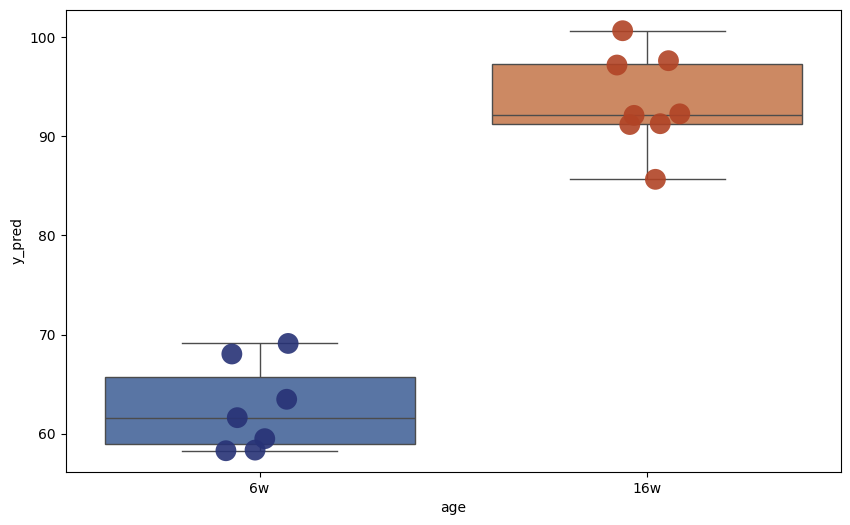

Components: 33
              y_pred
brain_9    59.210398
brain_8    63.227748
brain_7    69.991707
brain_4    58.173393
brain_3    67.080838
brain_20   98.371393
brain_18   91.813837
brain_17   91.933590
brain_16   91.076477
brain_15   97.432672
brain_13  100.876594
brain_12   86.854168
brain_11   92.843116
brain_2    61.608344
brain_1    57.983481
              y_pred  age
brain_9    59.210398   6w
brain_8    63.227748   6w
brain_7    69.991707   6w
brain_4    58.173393   6w
brain_3    67.080838   6w
brain_20   98.371393  16w
brain_18   91.813837  16w
brain_17   91.933590  16w
brain_16   91.076477  16w
brain_15   97.432672  16w
brain_13  100.876594  16w
brain_12   86.854168  16w
brain_11   92.843116  16w
brain_2    61.608344   6w
brain_1    57.983481   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


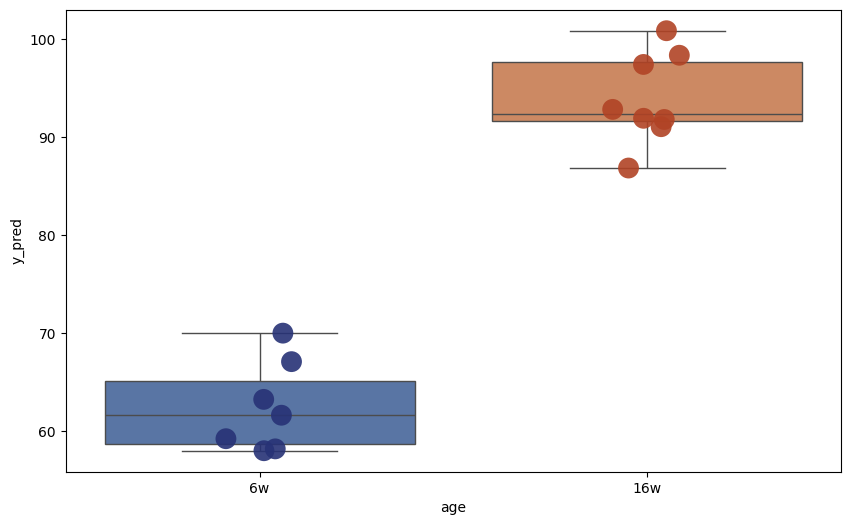

Components: 34
              y_pred
brain_9    59.169147
brain_8    63.224501
brain_7    69.826467
brain_4    57.944872
brain_3    67.062372
brain_20   98.258510
brain_18   91.392652
brain_17   91.812050
brain_16   90.942671
brain_15   97.478607
brain_13  100.650330
brain_12   86.953750
brain_11   92.778990
brain_2    61.673809
brain_1    57.756581
              y_pred  age
brain_9    59.169147   6w
brain_8    63.224501   6w
brain_7    69.826467   6w
brain_4    57.944872   6w
brain_3    67.062372   6w
brain_20   98.258510  16w
brain_18   91.392652  16w
brain_17   91.812050  16w
brain_16   90.942671  16w
brain_15   97.478607  16w
brain_13  100.650330  16w
brain_12   86.953750  16w
brain_11   92.778990  16w
brain_2    61.673809   6w
brain_1    57.756581   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


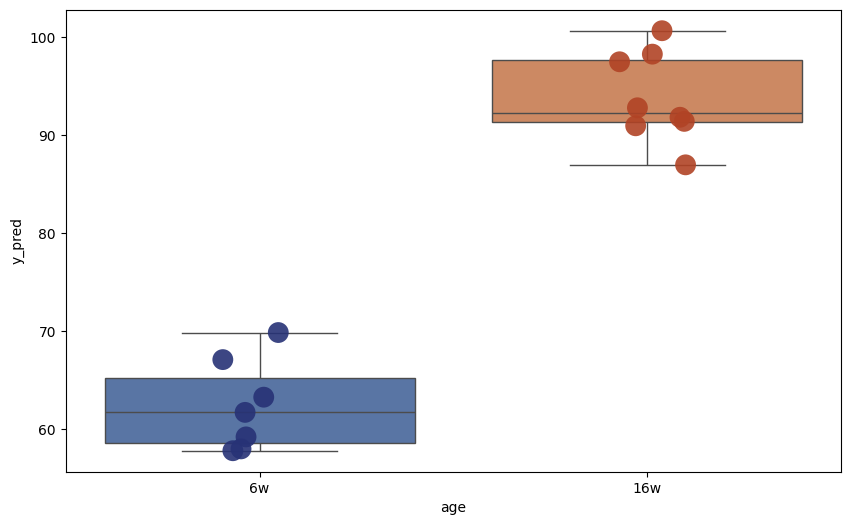

Components: 35
              y_pred
brain_9    58.835564
brain_8    63.084764
brain_7    70.096576
brain_4    58.259412
brain_3    66.982677
brain_20   98.093705
brain_18   90.220735
brain_17   91.646199
brain_16   91.392881
brain_15   97.708741
brain_13  100.574961
brain_12   86.811719
brain_11   92.605674
brain_2    61.425197
brain_1    57.497054
              y_pred  age
brain_9    58.835564   6w
brain_8    63.084764   6w
brain_7    70.096576   6w
brain_4    58.259412   6w
brain_3    66.982677   6w
brain_20   98.093705  16w
brain_18   90.220735  16w
brain_17   91.646199  16w
brain_16   91.392881  16w
brain_15   97.708741  16w
brain_13  100.574961  16w
brain_12   86.811719  16w
brain_11   92.605674  16w
brain_2    61.425197   6w
brain_1    57.497054   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


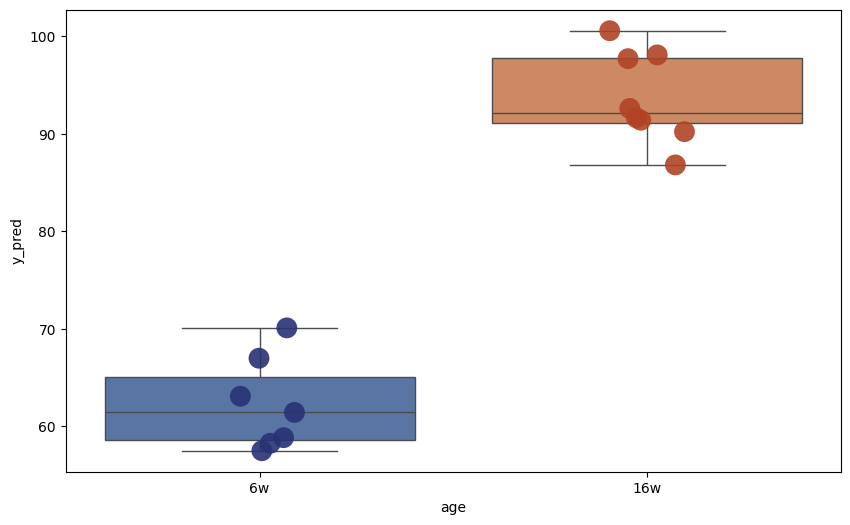

Components: 36
              y_pred
brain_9    58.793105
brain_8    63.140100
brain_7    69.723272
brain_4    58.244536
brain_3    67.056123
brain_20   98.154877
brain_18   90.291926
brain_17   91.451312
brain_16   91.357048
brain_15   97.715376
brain_13  100.522720
brain_12   86.626645
brain_11   92.580672
brain_2    61.259922
brain_1    57.498551
              y_pred  age
brain_9    58.793105   6w
brain_8    63.140100   6w
brain_7    69.723272   6w
brain_4    58.244536   6w
brain_3    67.056123   6w
brain_20   98.154877  16w
brain_18   90.291926  16w
brain_17   91.451312  16w
brain_16   91.357048  16w
brain_15   97.715376  16w
brain_13  100.522720  16w
brain_12   86.626645  16w
brain_11   92.580672  16w
brain_2    61.259922   6w
brain_1    57.498551   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


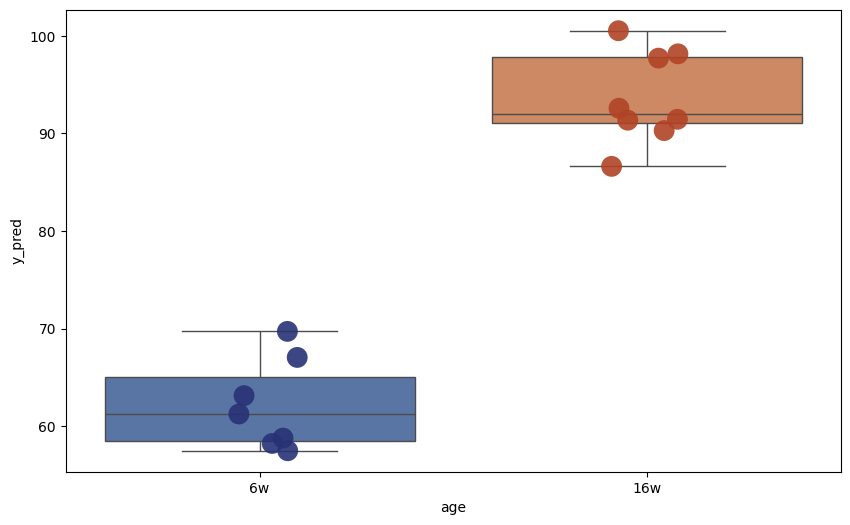

Components: 37
              y_pred
brain_9    58.673778
brain_8    62.877093
brain_7    70.194309
brain_4    58.046792
brain_3    67.521355
brain_20   98.042700
brain_18   90.299991
brain_17   91.852901
brain_16   91.821931
brain_15   98.276568
brain_13  100.966624
brain_12   87.146594
brain_11   92.662248
brain_2    61.487009
brain_1    56.385352
              y_pred  age
brain_9    58.673778   6w
brain_8    62.877093   6w
brain_7    70.194309   6w
brain_4    58.046792   6w
brain_3    67.521355   6w
brain_20   98.042700  16w
brain_18   90.299991  16w
brain_17   91.852901  16w
brain_16   91.821931  16w
brain_15   98.276568  16w
brain_13  100.966624  16w
brain_12   87.146594  16w
brain_11   92.662248  16w
brain_2    61.487009   6w
brain_1    56.385352   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


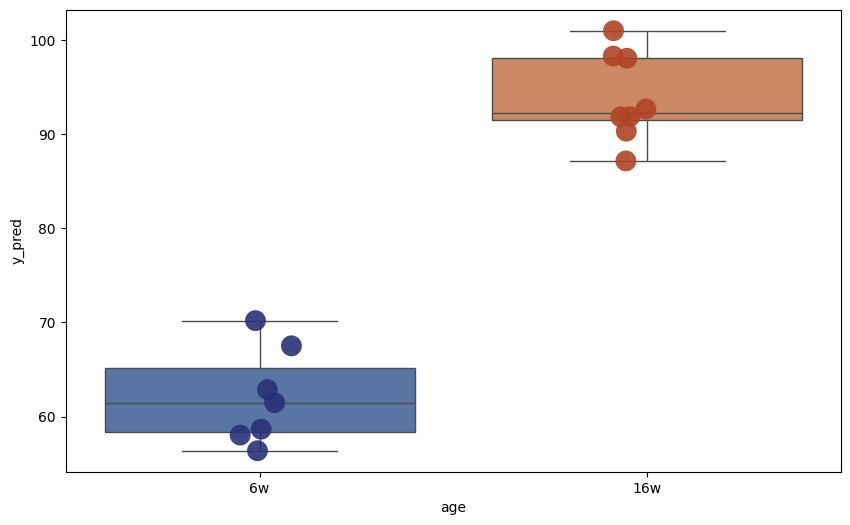

Components: 38
              y_pred
brain_9    58.503271
brain_8    62.766816
brain_7    69.867359
brain_4    57.759470
brain_3    67.419424
brain_20   98.141800
brain_18   89.906844
brain_17   91.612181
brain_16   91.731100
brain_15   98.145880
brain_13  100.683219
brain_12   87.045657
brain_11   92.436065
brain_2    61.334591
brain_1    55.962303
              y_pred  age
brain_9    58.503271   6w
brain_8    62.766816   6w
brain_7    69.867359   6w
brain_4    57.759470   6w
brain_3    67.419424   6w
brain_20   98.141800  16w
brain_18   89.906844  16w
brain_17   91.612181  16w
brain_16   91.731100  16w
brain_15   98.145880  16w
brain_13  100.683219  16w
brain_12   87.045657  16w
brain_11   92.436065  16w
brain_2    61.334591   6w
brain_1    55.962303   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


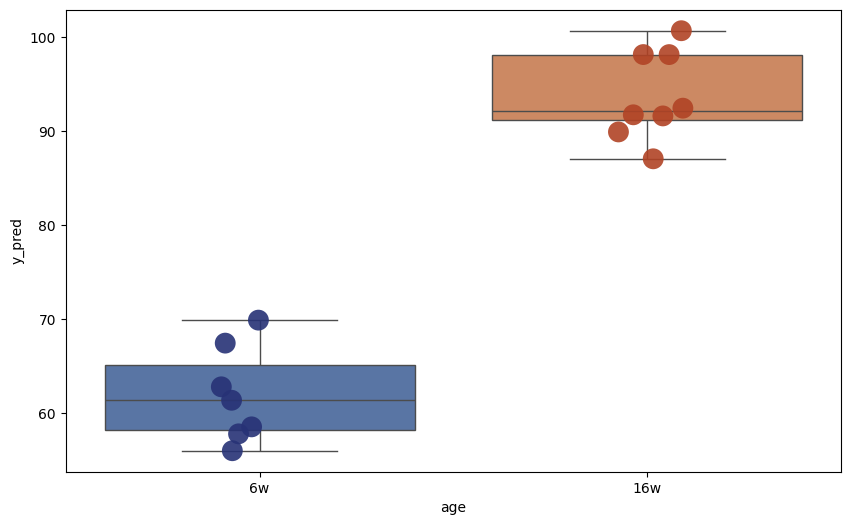

Components: 39
              y_pred
brain_9    58.799603
brain_8    62.226784
brain_7    70.186806
brain_4    58.337092
brain_3    67.622108
brain_20   98.529637
brain_18   89.569149
brain_17   91.921608
brain_16   91.740624
brain_15   98.106660
brain_13  100.533138
brain_12   86.889879
brain_11   92.264725
brain_2    61.790796
brain_1    55.494705
              y_pred  age
brain_9    58.799603   6w
brain_8    62.226784   6w
brain_7    70.186806   6w
brain_4    58.337092   6w
brain_3    67.622108   6w
brain_20   98.529637  16w
brain_18   89.569149  16w
brain_17   91.921608  16w
brain_16   91.740624  16w
brain_15   98.106660  16w
brain_13  100.533138  16w
brain_12   86.889879  16w
brain_11   92.264725  16w
brain_2    61.790796   6w
brain_1    55.494705   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


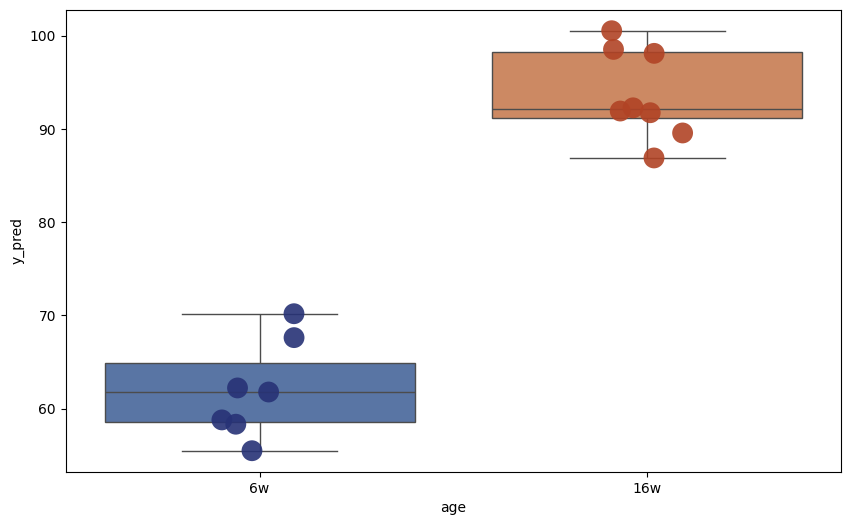

Components: 40
              y_pred
brain_9    59.017491
brain_8    62.523943
brain_7    70.251005
brain_4    58.442173
brain_3    67.668708
brain_20   98.606586
brain_18   89.810574
brain_17   91.841863
brain_16   91.677178
brain_15   98.031121
brain_13  100.608843
brain_12   86.817773
brain_11   92.221768
brain_2    61.773757
brain_1    55.745257
              y_pred  age
brain_9    59.017491   6w
brain_8    62.523943   6w
brain_7    70.251005   6w
brain_4    58.442173   6w
brain_3    67.668708   6w
brain_20   98.606586  16w
brain_18   89.810574  16w
brain_17   91.841863  16w
brain_16   91.677178  16w
brain_15   98.031121  16w
brain_13  100.608843  16w
brain_12   86.817773  16w
brain_11   92.221768  16w
brain_2    61.773757   6w
brain_1    55.745257   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


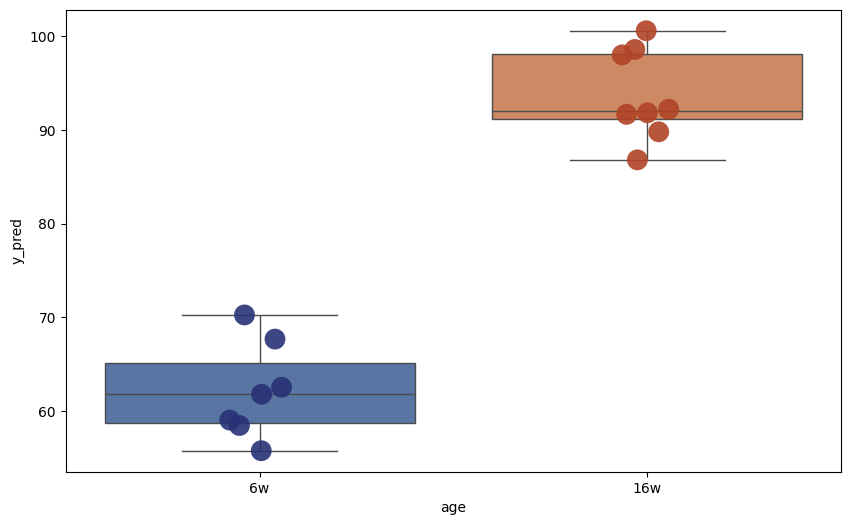

Components: 41
             y_pred
brain_9   59.180944
brain_8   62.133681
brain_7   70.401786
brain_4   58.313501
brain_3   66.906407
brain_20  98.414019
brain_18  89.967004
brain_17  91.454746
brain_16  91.794347
brain_15  98.106594
brain_13  99.957867
brain_12  86.391733
brain_11  91.821513
brain_2   61.354920
brain_1   55.996861
             y_pred  age
brain_9   59.180944   6w
brain_8   62.133681   6w
brain_7   70.401786   6w
brain_4   58.313501   6w
brain_3   66.906407   6w
brain_20  98.414019  16w
brain_18  89.967004  16w
brain_17  91.454746  16w
brain_16  91.794347  16w
brain_15  98.106594  16w
brain_13  99.957867  16w
brain_12  86.391733  16w
brain_11  91.821513  16w
brain_2   61.354920   6w
brain_1   55.996861   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


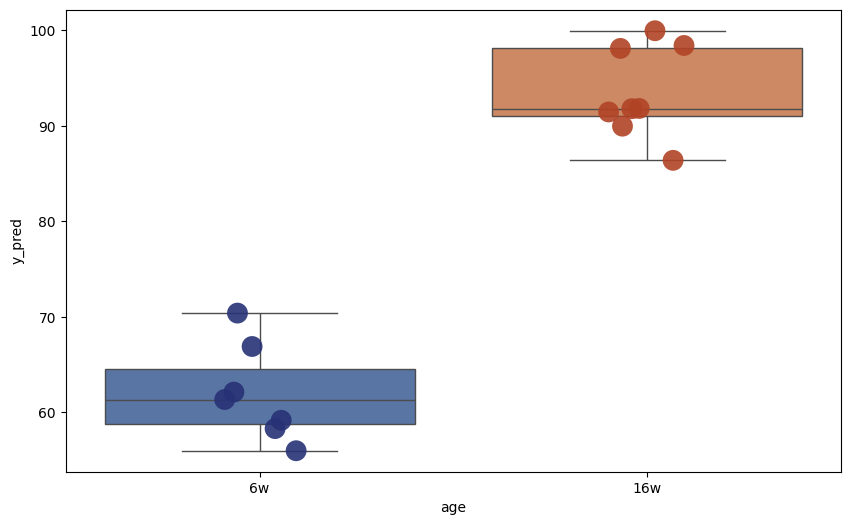

Components: 42
             y_pred
brain_9   59.179537
brain_8   61.900633
brain_7   70.371664
brain_4   58.113190
brain_3   66.735236
brain_20  98.546294
brain_18  89.845777
brain_17  91.479717
brain_16  91.817812
brain_15  98.128899
brain_13  99.863428
brain_12  86.276513
brain_11  91.707304
brain_2   61.295714
brain_1   55.725556
             y_pred  age
brain_9   59.179537   6w
brain_8   61.900633   6w
brain_7   70.371664   6w
brain_4   58.113190   6w
brain_3   66.735236   6w
brain_20  98.546294  16w
brain_18  89.845777  16w
brain_17  91.479717  16w
brain_16  91.817812  16w
brain_15  98.128899  16w
brain_13  99.863428  16w
brain_12  86.276513  16w
brain_11  91.707304  16w
brain_2   61.295714   6w
brain_1   55.725556   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


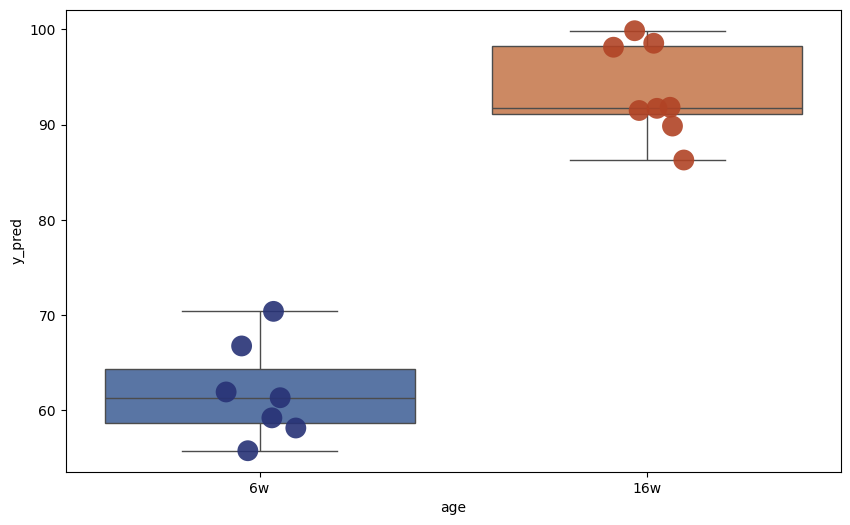

Components: 43
              y_pred
brain_9    59.159470
brain_8    61.873767
brain_7    70.537195
brain_4    57.952271
brain_3    66.743452
brain_20   98.677075
brain_18   89.910424
brain_17   91.552906
brain_16   91.773372
brain_15   98.275242
brain_13  100.098549
brain_12   86.321155
brain_11   92.056836
brain_2    61.210333
brain_1    55.671244
              y_pred  age
brain_9    59.159470   6w
brain_8    61.873767   6w
brain_7    70.537195   6w
brain_4    57.952271   6w
brain_3    66.743452   6w
brain_20   98.677075  16w
brain_18   89.910424  16w
brain_17   91.552906  16w
brain_16   91.773372  16w
brain_15   98.275242  16w
brain_13  100.098549  16w
brain_12   86.321155  16w
brain_11   92.056836  16w
brain_2    61.210333   6w
brain_1    55.671244   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


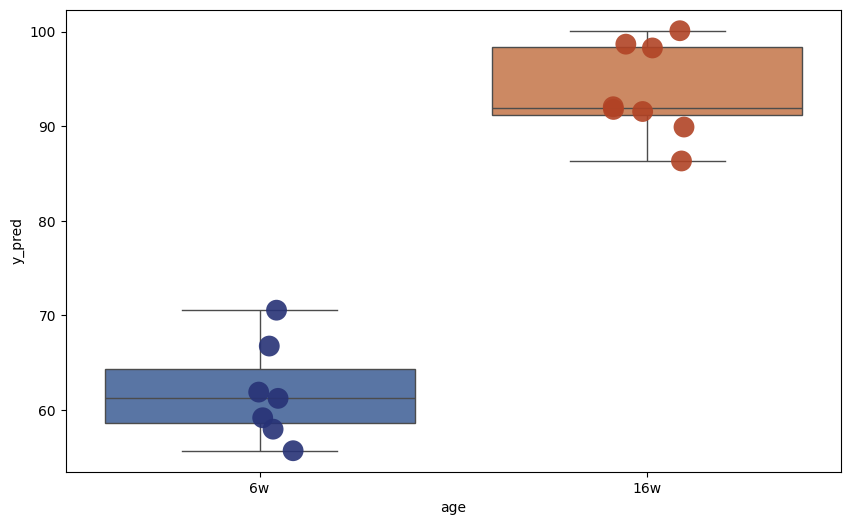

Components: 44
              y_pred
brain_9    59.476882
brain_8    62.233133
brain_7    71.452128
brain_4    58.172263
brain_3    67.675392
brain_20   98.878373
brain_18   90.254925
brain_17   91.313389
brain_16   92.005156
brain_15   98.758503
brain_13  100.419884
brain_12   86.022656
brain_11   92.214117
brain_2    62.162077
brain_1    56.581794
              y_pred  age
brain_9    59.476882   6w
brain_8    62.233133   6w
brain_7    71.452128   6w
brain_4    58.172263   6w
brain_3    67.675392   6w
brain_20   98.878373  16w
brain_18   90.254925  16w
brain_17   91.313389  16w
brain_16   92.005156  16w
brain_15   98.758503  16w
brain_13  100.419884  16w
brain_12   86.022656  16w
brain_11   92.214117  16w
brain_2    62.162077   6w
brain_1    56.581794   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


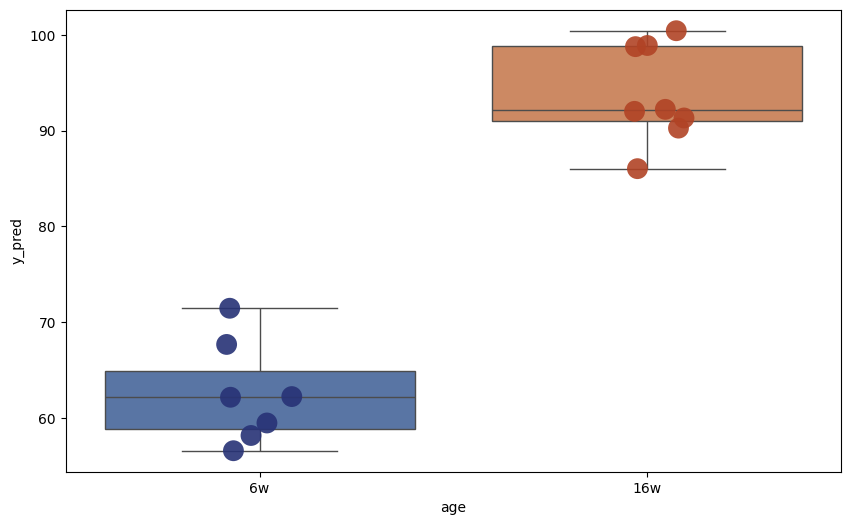

Components: 45
              y_pred
brain_9    60.065524
brain_8    61.912270
brain_7    71.590061
brain_4    58.322769
brain_3    67.741602
brain_20   99.228335
brain_18   90.248780
brain_17   91.299667
brain_16   92.039019
brain_15   99.046402
brain_13  100.017802
brain_12   86.366906
brain_11   92.116728
brain_2    63.074443
brain_1    56.698391
              y_pred  age
brain_9    60.065524   6w
brain_8    61.912270   6w
brain_7    71.590061   6w
brain_4    58.322769   6w
brain_3    67.741602   6w
brain_20   99.228335  16w
brain_18   90.248780  16w
brain_17   91.299667  16w
brain_16   92.039019  16w
brain_15   99.046402  16w
brain_13  100.017802  16w
brain_12   86.366906  16w
brain_11   92.116728  16w
brain_2    63.074443   6w
brain_1    56.698391   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


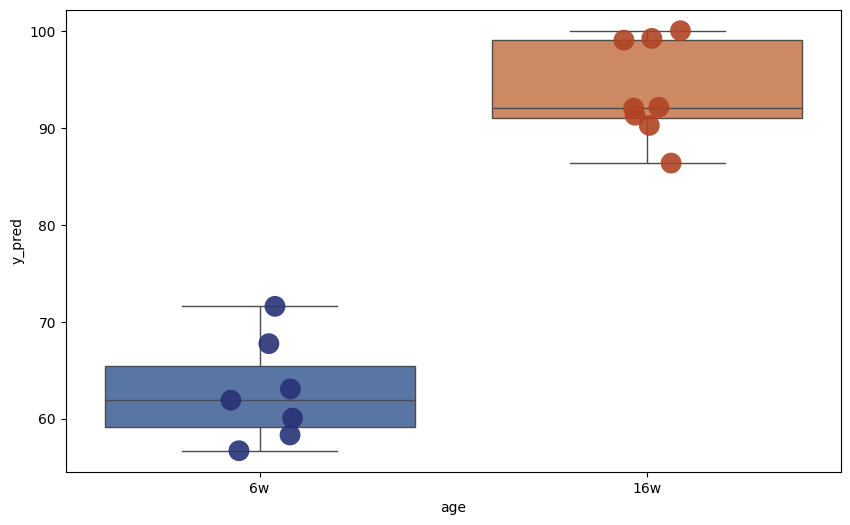

Components: 46
             y_pred
brain_9   59.984099
brain_8   61.949913
brain_7   71.602260
brain_4   58.336223
brain_3   67.639566
brain_20  99.042631
brain_18  90.239071
brain_17  91.215798
brain_16  91.931725
brain_15  99.012330
brain_13  99.979161
brain_12  86.367006
brain_11  92.031918
brain_2   63.121628
brain_1   56.692178
             y_pred  age
brain_9   59.984099   6w
brain_8   61.949913   6w
brain_7   71.602260   6w
brain_4   58.336223   6w
brain_3   67.639566   6w
brain_20  99.042631  16w
brain_18  90.239071  16w
brain_17  91.215798  16w
brain_16  91.931725  16w
brain_15  99.012330  16w
brain_13  99.979161  16w
brain_12  86.367006  16w
brain_11  92.031918  16w
brain_2   63.121628   6w
brain_1   56.692178   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


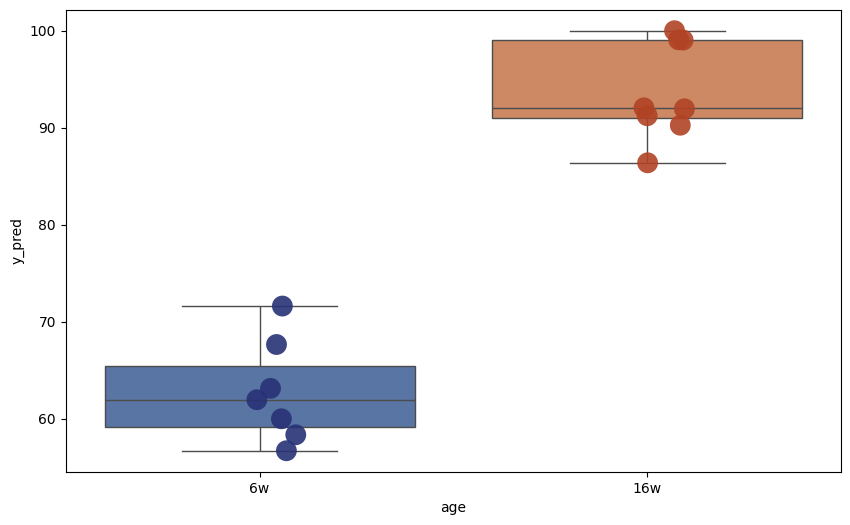

Components: 47
             y_pred
brain_9   60.147977
brain_8   61.878573
brain_7   71.476247
brain_4   58.180659
brain_3   67.650008
brain_20  98.727179
brain_18  89.667862
brain_17  91.545358
brain_16  91.909373
brain_15  99.093375
brain_13  99.886479
brain_12  86.640138
brain_11  91.969671
brain_2   63.398367
brain_1   56.467332
             y_pred  age
brain_9   60.147977   6w
brain_8   61.878573   6w
brain_7   71.476247   6w
brain_4   58.180659   6w
brain_3   67.650008   6w
brain_20  98.727179  16w
brain_18  89.667862  16w
brain_17  91.545358  16w
brain_16  91.909373  16w
brain_15  99.093375  16w
brain_13  99.886479  16w
brain_12  86.640138  16w
brain_11  91.969671  16w
brain_2   63.398367   6w
brain_1   56.467332   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


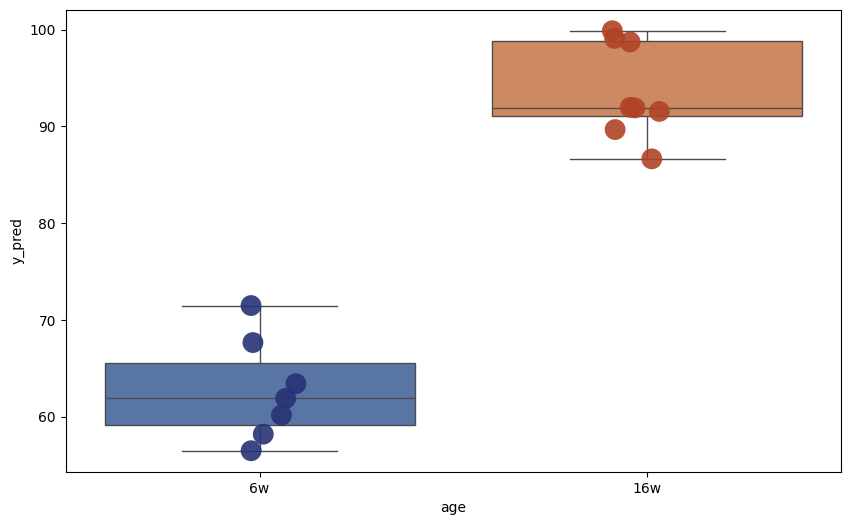

Components: 48
              y_pred
brain_9    59.780297
brain_8    61.544905
brain_7    71.562733
brain_4    58.029452
brain_3    67.790426
brain_20   98.475678
brain_18   89.186653
brain_17   91.716115
brain_16   91.969438
brain_15   99.478461
brain_13  100.053110
brain_12   87.066050
brain_11   91.795368
brain_2    63.539872
brain_1    56.645746
              y_pred  age
brain_9    59.780297   6w
brain_8    61.544905   6w
brain_7    71.562733   6w
brain_4    58.029452   6w
brain_3    67.790426   6w
brain_20   98.475678  16w
brain_18   89.186653  16w
brain_17   91.716115  16w
brain_16   91.969438  16w
brain_15   99.478461  16w
brain_13  100.053110  16w
brain_12   87.066050  16w
brain_11   91.795368  16w
brain_2    63.539872   6w
brain_1    56.645746   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


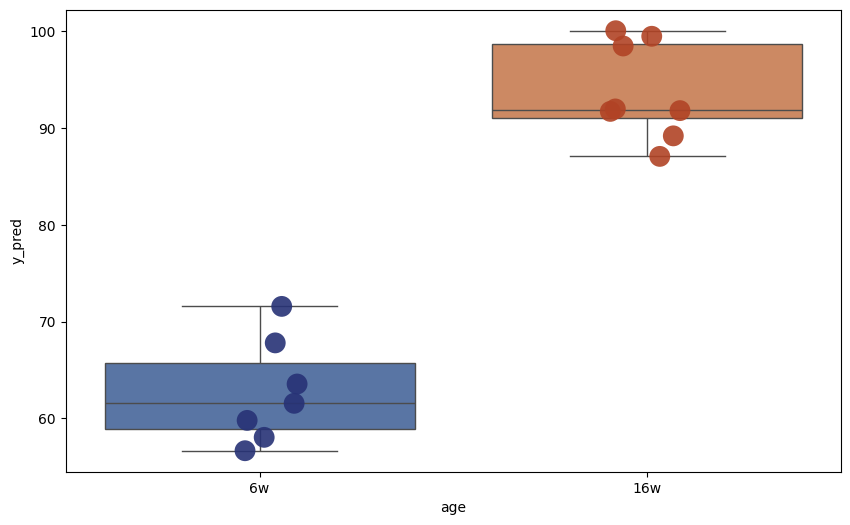

Components: 49
             y_pred
brain_9   59.447355
brain_8   61.552126
brain_7   71.573402
brain_4   58.179889
brain_3   67.224276
brain_20  97.833425
brain_18  88.841463
brain_17  90.991934
brain_16  91.697674
brain_15  98.649732
brain_13  99.595527
brain_12  87.434679
brain_11  91.762709
brain_2   62.882259
brain_1   56.483303
             y_pred  age
brain_9   59.447355   6w
brain_8   61.552126   6w
brain_7   71.573402   6w
brain_4   58.179889   6w
brain_3   67.224276   6w
brain_20  97.833425  16w
brain_18  88.841463  16w
brain_17  90.991934  16w
brain_16  91.697674  16w
brain_15  98.649732  16w
brain_13  99.595527  16w
brain_12  87.434679  16w
brain_11  91.762709  16w
brain_2   62.882259   6w
brain_1   56.483303   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


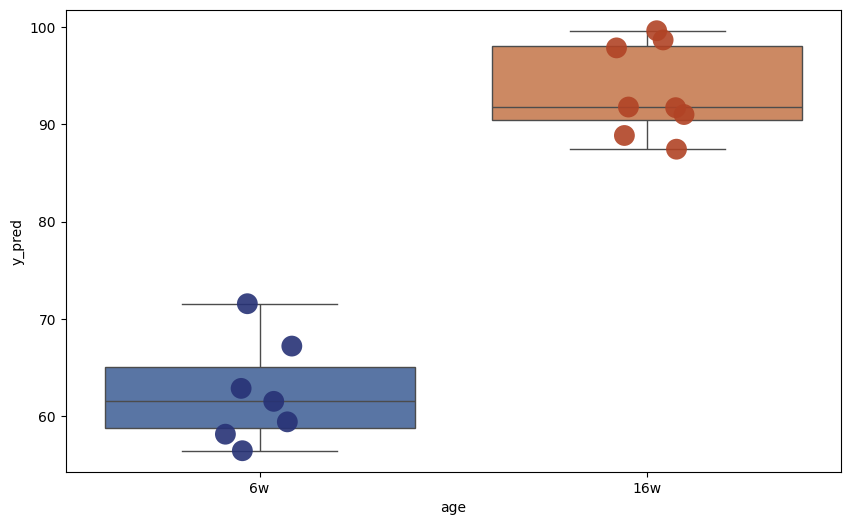

Components: 50
             y_pred
brain_9   59.897153
brain_8   61.441821
brain_7   71.831786
brain_4   58.508195
brain_3   67.481468
brain_20  97.990800
brain_18  88.717080
brain_17  90.450664
brain_16  91.719873
brain_15  98.172125
brain_13  99.272730
brain_12  87.498476
brain_11  91.936432
brain_2   63.287597
brain_1   56.182953
             y_pred  age
brain_9   59.897153   6w
brain_8   61.441821   6w
brain_7   71.831786   6w
brain_4   58.508195   6w
brain_3   67.481468   6w
brain_20  97.990800  16w
brain_18  88.717080  16w
brain_17  90.450664  16w
brain_16  91.719873  16w
brain_15  98.172125  16w
brain_13  99.272730  16w
brain_12  87.498476  16w
brain_11  91.936432  16w
brain_2   63.287597   6w
brain_1   56.182953   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


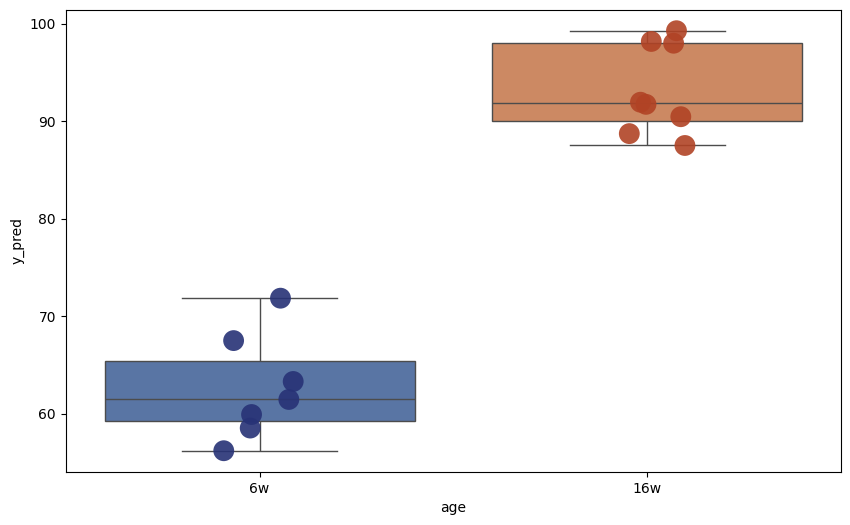

Components: 51
             y_pred
brain_9   59.959386
brain_8   61.475229
brain_7   71.874335
brain_4   58.511373
brain_3   67.407349
brain_20  98.049448
brain_18  88.601497
brain_17  90.427461
brain_16  91.831563
brain_15  98.214874
brain_13  99.286693
brain_12  87.433735
brain_11  91.850755
brain_2   63.209914
brain_1   56.211037
             y_pred  age
brain_9   59.959386   6w
brain_8   61.475229   6w
brain_7   71.874335   6w
brain_4   58.511373   6w
brain_3   67.407349   6w
brain_20  98.049448  16w
brain_18  88.601497  16w
brain_17  90.427461  16w
brain_16  91.831563  16w
brain_15  98.214874  16w
brain_13  99.286693  16w
brain_12  87.433735  16w
brain_11  91.850755  16w
brain_2   63.209914   6w
brain_1   56.211037   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


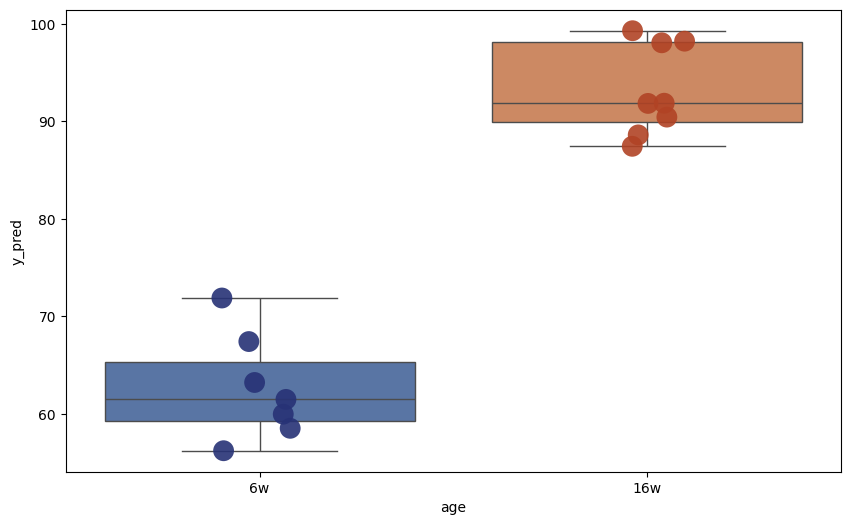

Components: 52
             y_pred
brain_9   59.611780
brain_8   61.178530
brain_7   71.737561
brain_4   58.261815
brain_3   66.949920
brain_20  97.622004
brain_18  88.157039
brain_17  89.941346
brain_16  91.780260
brain_15  98.073646
brain_13  99.093546
brain_12  87.125316
brain_11  91.498807
brain_2   62.820491
brain_1   55.717610
             y_pred  age
brain_9   59.611780   6w
brain_8   61.178530   6w
brain_7   71.737561   6w
brain_4   58.261815   6w
brain_3   66.949920   6w
brain_20  97.622004  16w
brain_18  88.157039  16w
brain_17  89.941346  16w
brain_16  91.780260  16w
brain_15  98.073646  16w
brain_13  99.093546  16w
brain_12  87.125316  16w
brain_11  91.498807  16w
brain_2   62.820491   6w
brain_1   55.717610   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


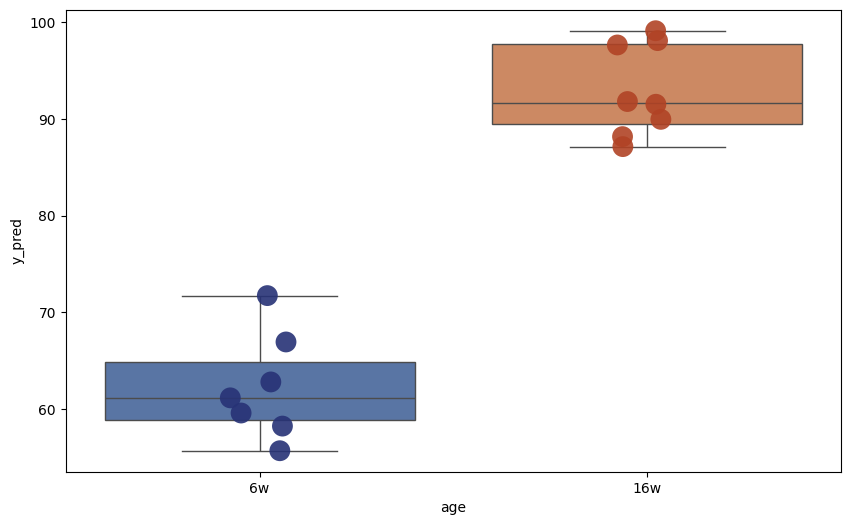

Components: 53
             y_pred
brain_9   60.106255
brain_8   60.762523
brain_7   72.389622
brain_4   58.350150
brain_3   67.264110
brain_20  96.426215
brain_18  88.240377
brain_17  90.392377
brain_16  91.719641
brain_15  97.913071
brain_13  98.783699
brain_12  87.220549
brain_11  91.720935
brain_2   63.091738
brain_1   55.723593
             y_pred  age
brain_9   60.106255   6w
brain_8   60.762523   6w
brain_7   72.389622   6w
brain_4   58.350150   6w
brain_3   67.264110   6w
brain_20  96.426215  16w
brain_18  88.240377  16w
brain_17  90.392377  16w
brain_16  91.719641  16w
brain_15  97.913071  16w
brain_13  98.783699  16w
brain_12  87.220549  16w
brain_11  91.720935  16w
brain_2   63.091738   6w
brain_1   55.723593   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


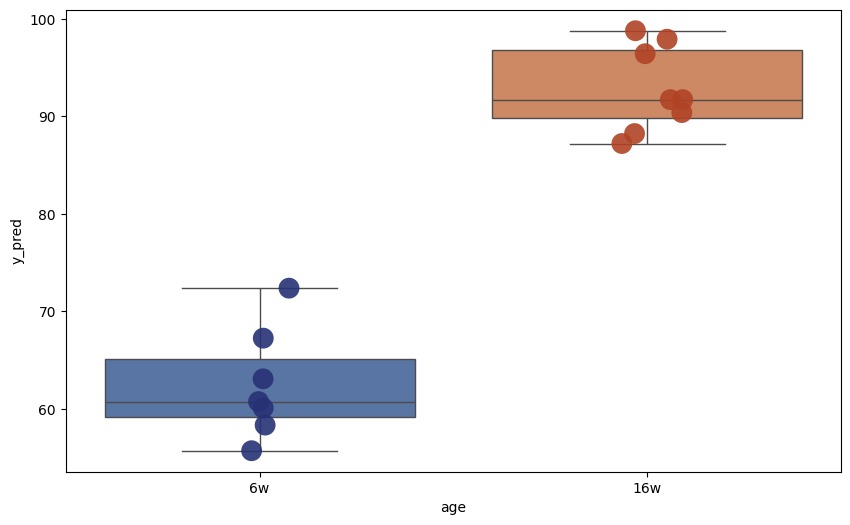

Components: 54
             y_pred
brain_9   59.970228
brain_8   60.707918
brain_7   72.803345
brain_4   58.590015
brain_3   66.910697
brain_20  96.653313
brain_18  87.619271
brain_17  90.347493
brain_16  91.902299
brain_15  97.973508
brain_13  98.854594
brain_12  87.298000
brain_11  91.842778
brain_2   63.304694
brain_1   56.052818
             y_pred  age
brain_9   59.970228   6w
brain_8   60.707918   6w
brain_7   72.803345   6w
brain_4   58.590015   6w
brain_3   66.910697   6w
brain_20  96.653313  16w
brain_18  87.619271  16w
brain_17  90.347493  16w
brain_16  91.902299  16w
brain_15  97.973508  16w
brain_13  98.854594  16w
brain_12  87.298000  16w
brain_11  91.842778  16w
brain_2   63.304694   6w
brain_1   56.052818   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


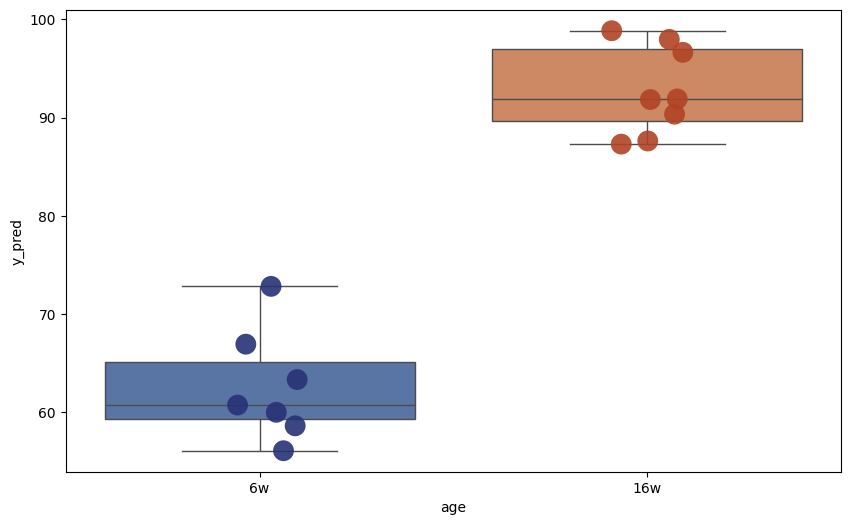

Components: 55
             y_pred
brain_9   59.954243
brain_8   60.713546
brain_7   72.771821
brain_4   58.587206
brain_3   66.897084
brain_20  96.618482
brain_18  87.628367
brain_17  90.325717
brain_16  91.894170
brain_15  97.961752
brain_13  98.853167
brain_12  87.276299
brain_11  91.833893
brain_2   63.273659
brain_1   56.030557
             y_pred  age
brain_9   59.954243   6w
brain_8   60.713546   6w
brain_7   72.771821   6w
brain_4   58.587206   6w
brain_3   66.897084   6w
brain_20  96.618482  16w
brain_18  87.628367  16w
brain_17  90.325717  16w
brain_16  91.894170  16w
brain_15  97.961752  16w
brain_13  98.853167  16w
brain_12  87.276299  16w
brain_11  91.833893  16w
brain_2   63.273659   6w
brain_1   56.030557   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


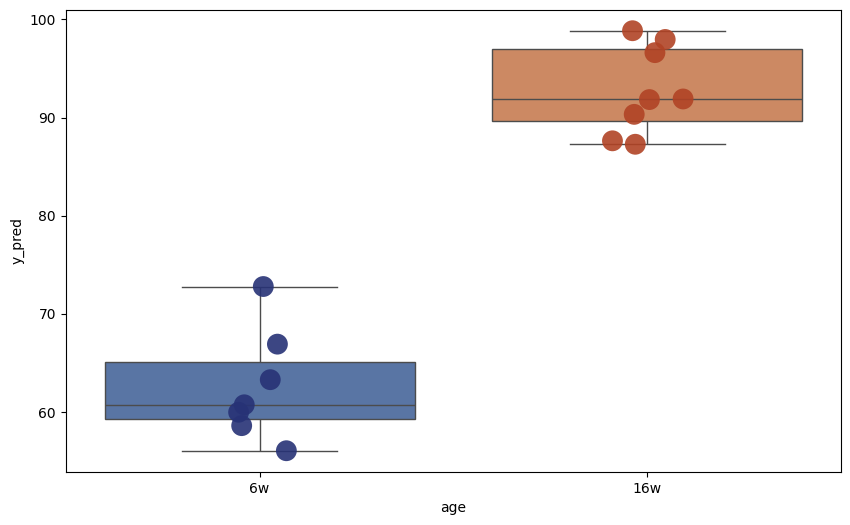

Components: 56
             y_pred
brain_9   60.188422
brain_8   60.855189
brain_7   72.673316
brain_4   58.512103
brain_3   67.826483
brain_20  96.647777
brain_18  88.958358
brain_17  90.136428
brain_16  92.609480
brain_15  98.235651
brain_13  99.024860
brain_12  86.618666
brain_11  92.325893
brain_2   63.242274
brain_1   56.465462
             y_pred  age
brain_9   60.188422   6w
brain_8   60.855189   6w
brain_7   72.673316   6w
brain_4   58.512103   6w
brain_3   67.826483   6w
brain_20  96.647777  16w
brain_18  88.958358  16w
brain_17  90.136428  16w
brain_16  92.609480  16w
brain_15  98.235651  16w
brain_13  99.024860  16w
brain_12  86.618666  16w
brain_11  92.325893  16w
brain_2   63.242274   6w
brain_1   56.465462   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


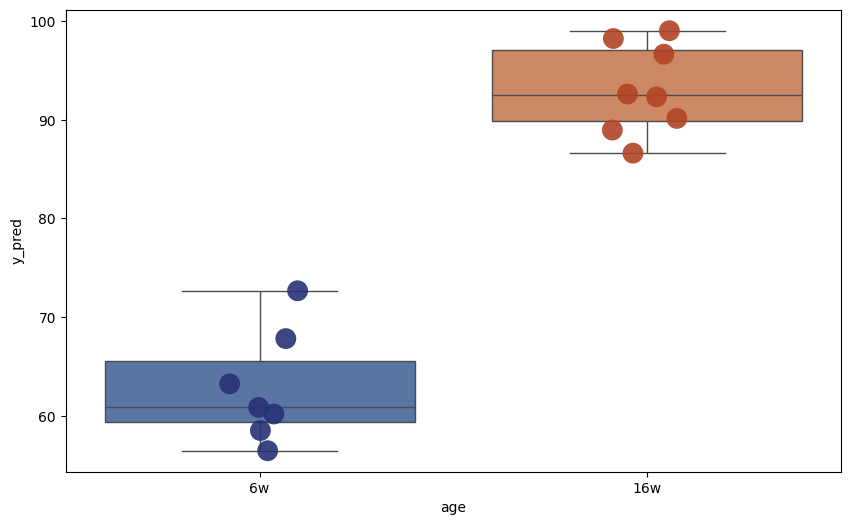

Components: 57
             y_pred
brain_9   60.145513
brain_8   60.765598
brain_7   72.633137
brain_4   58.441099
brain_3   67.784736
brain_20  96.740148
brain_18  88.909578
brain_17  90.058340
brain_16  92.588443
brain_15  98.207255
brain_13  99.006602
brain_12  86.564075
brain_11  92.337284
brain_2   63.179146
brain_1   56.398690
             y_pred  age
brain_9   60.145513   6w
brain_8   60.765598   6w
brain_7   72.633137   6w
brain_4   58.441099   6w
brain_3   67.784736   6w
brain_20  96.740148  16w
brain_18  88.909578  16w
brain_17  90.058340  16w
brain_16  92.588443  16w
brain_15  98.207255  16w
brain_13  99.006602  16w
brain_12  86.564075  16w
brain_11  92.337284  16w
brain_2   63.179146   6w
brain_1   56.398690   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


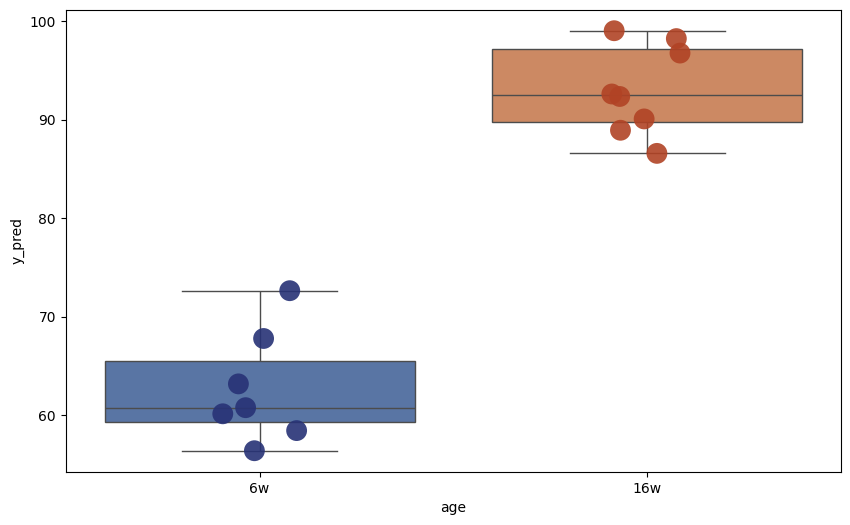

Components: 58
             y_pred
brain_9   60.141400
brain_8   60.762675
brain_7   72.614390
brain_4   58.438959
brain_3   67.793976
brain_20  96.697882
brain_18  88.911217
brain_17  90.069210
brain_16  92.571112
brain_15  98.207638
brain_13  98.994987
brain_12  86.562605
brain_11  92.353499
brain_2   63.187388
brain_1   56.397353
             y_pred  age
brain_9   60.141400   6w
brain_8   60.762675   6w
brain_7   72.614390   6w
brain_4   58.438959   6w
brain_3   67.793976   6w
brain_20  96.697882  16w
brain_18  88.911217  16w
brain_17  90.069210  16w
brain_16  92.571112  16w
brain_15  98.207638  16w
brain_13  98.994987  16w
brain_12  86.562605  16w
brain_11  92.353499  16w
brain_2   63.187388   6w
brain_1   56.397353   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_20537/680314363.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


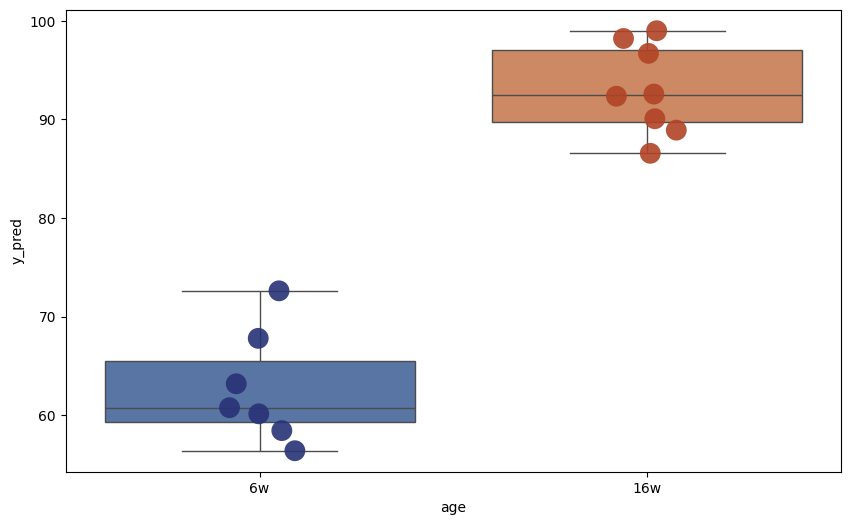

In [73]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [74]:
n_components = 14

# Apply PCA
pca = PCA(n_components=n_components, svd_solver = 'full', random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test.index.tolist())

results_df["age"] = df_intervention_test_metadata["age"]

print(results_df)
results_df.to_csv("./AlanXu_brain_sexcombo_Calibratedpredictions_14PCs_EC-250725.csv")

             y_pred  age
brain_9   62.642090   6w
brain_8   69.202846   6w
brain_7   68.683229   6w
brain_4   60.163666   6w
brain_3   70.699740   6w
brain_20  92.765865  16w
brain_18  89.771930  16w
brain_17  90.767976  16w
brain_16  90.752382  16w
brain_15  95.228001  16w
brain_13  96.457524  16w
brain_12  82.161524  16w
brain_11  90.927804  16w
brain_2   63.375159   6w
brain_1   60.737674   6w


##### Sample rotation

In [75]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention.drop(
            atlas_plus_intervention.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/1620] Running PCR for combo: brain_10_brain_9__brain_20_brain_19
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7


### Male

##### Calibration

In [54]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_male = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(male_samples)
]

df_intervention_age_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.000000,111.293068,379.633021,...,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793,Brain,6w,male,42
brain_4,108.101921,214.712780,79.026232,140.159732,26.839098,173.708604,0.000000,1.491061,121.521469,442.845110,...,16.401671,5.964244,36.530994,643.392811,130.467835,38.767585,Brain,6w,male,42
brain_3,112.420887,222.007635,94.471334,151.154134,5.668280,131.315154,3.778853,0.000000,143.596428,370.327629,...,3.778853,5.668280,39.677960,1030.682253,111.476174,47.235667,Brain,6w,male,42


In [55]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_5,SRR24062705,6w,RNA-Seq,300,2659969800,Dario Valenzano laboratory,PRJNA952180,SAMN34067637,Model organism or animal,979131898,...,2023-04-04T11:25:00Z,1,GRZ-AD_8248_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062705.featureCounts,SRR24062705,No
brain_4,SRR24062716,6w,RNA-Seq,300,3772379400,Dario Valenzano laboratory,PRJNA952180,SAMN34067636,Model organism or animal,1387311192,...,2023-04-04T11:23:00Z,1,GRZ-AD_8218_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062716.featureCounts,SRR24062716,No
brain_3,SRR24062727,6w,RNA-Seq,300,3391027200,Dario Valenzano laboratory,PRJNA952180,SAMN34067635,Model organism or animal,1245547938,...,2023-04-04T11:26:00Z,1,GRZ-AD_8250_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062727.featureCounts,SRR24062727,No


In [56]:
random.seed(123)

# Separate the samples
young_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.0,111.293068,379.633021,...,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793,Brain,6w,male,42
brain_3,112.420887,222.007635,94.471334,151.154134,5.668280,131.315154,3.778853,0.0,143.596428,370.327629,...,3.778853,5.668280,39.677960,1030.682253,111.476174,47.235667,Brain,6w,male,42
brain_15,106.234929,140.984672,63.542387,125.099075,21.842696,133.041873,0.000000,0.0,91.342182,406.075568,...,5.957099,9.928498,15.885597,836.972382,124.106225,29.785494,Brain,16w,male,112
brain_12,76.614126,136.202891,47.292670,84.180953,21.754628,136.202891,1.891707,0.0,100.260461,370.774537,...,4.729267,3.783414,7.566827,805.867105,113.502409,45.400964,Brain,16w,male,112


In [57]:
df_intervention_train_male = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_5,81.614917,174.359140,39.570869,137.261451,14.839076,171.885961,0.000000,0.0,111.293068,379.633021,...,702.382919,0.0,17.312255,9.892717,4.946359,42.044048,755.556274,176.832319,24.731793,42
brain_3,112.420887,222.007635,94.471334,151.154134,5.668280,131.315154,3.778853,0.0,143.596428,370.327629,...,578.164564,0.0,17.004840,3.778853,5.668280,39.677960,1030.682253,111.476174,47.235667,42


In [58]:
#combine the dataframes
atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_male], axis=0)

atlas_plus_intervention_male.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A21_2,53.082851,503.745418,485.328919,309.830515,144.623685,546.536696,2395.769875,326.080367,486.953904,418.162863,...,102.915731,523.786902,215.039711,609.369457,19.499823,1015.074101,613.702751,159.790213,334.205294,162
A22_2,52.450281,430.841595,533.066122,344.673276,94.731630,475.263772,2237.165051,269.209096,439.404906,449.573838,...,63.689627,754.641799,261.180992,611.741544,21.408278,1192.976291,894.866020,181.435156,439.404906,152
A24_2,43.256835,536.384749,414.112096,325.868154,98.048825,484.476547,1956.939196,307.411904,321.254091,415.265612,...,73.824998,694.416384,223.205266,566.376154,23.647070,981.065008,760.166773,155.147847,410.651550,103


In [59]:
#all not in select_train_samples
test_samples = [s for s in male_samples if s not in select_train_samples]
test_samples

['brain_4', 'brain_14', 'brain_13', 'brain_11', 'brain_2', 'brain_1']

In [60]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(test_samples)
]

df_intervention_test_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_4,108.101921,214.712780,79.026232,140.159732,26.839098,173.708604,0.000000,1.491061,121.521469,442.845110,...,16.401671,5.964244,36.530994,643.392811,130.467835,38.767585,Brain,6w,male,42
brain_14,89.641393,161.354507,75.298770,132.669261,17.928279,148.804712,1.792828,0.000000,70.816700,442.828479,...,10.756967,0.000000,10.756967,1019.222633,112.051741,17.928279,Brain,16w,male,112
brain_13,118.083136,125.890286,70.264345,109.300093,15.614299,145.408159,0.000000,0.000000,109.300093,435.248584,...,5.855362,1.951787,16.590193,797.305142,136.625116,31.228598,Brain,16w,male,112


In [61]:
df_intervention_test_male = df_intervention_test_male.drop(df_intervention_test_male.columns[[-2,-3, -4]], axis=1)
df_intervention_test_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_4,108.101921,214.712780,79.026232,140.159732,26.839098,173.708604,0.000000,1.491061,121.521469,442.845110,...,706.017372,1.491061,5.964244,16.401671,5.964244,36.530994,643.392811,130.467835,38.767585,42
brain_14,89.641393,161.354507,75.298770,132.669261,17.928279,148.804712,1.792828,0.000000,70.816700,442.828479,...,250.099485,1.792828,16.135451,10.756967,0.000000,10.756967,1019.222633,112.051741,17.928279,112


In [62]:
#check cols ordered the same
df_intervention_test_male = df_intervention_test_male[atlas_plus_intervention_male.columns]

In [63]:
#subset your metadata
df_intervention_test_metadata_male = df_intervention_metadata_male.loc[
    df_intervention_metadata_male.index.isin(test_samples)
]

df_intervention_test_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_4,SRR24062716,6w,RNA-Seq,300,3772379400,Dario Valenzano laboratory,PRJNA952180,SAMN34067636,Model organism or animal,1387311192,...,2023-04-04T11:23:00Z,1,GRZ-AD_8218_6w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062716.featureCounts,SRR24062716,No
brain_14,SRR24062734,16w,RNA-Seq,300,3507943800,Dario Valenzano laboratory,PRJNA952180,SAMN34067646,Model organism or animal,1290944779,...,2023-04-04T11:26:00Z,1,GRZ-AD_8245_16w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062734.featureCounts,SRR24062734,No
brain_13,SRR24062735,16w,RNA-Seq,300,3401374800,Dario Valenzano laboratory,PRJNA952180,SAMN34067645,Model organism or animal,1251856218,...,2023-04-04T11:25:00Z,1,GRZ-AD_8222_16w_Male_Brain,male,SRP430823,GRZ-AD,Brain,SRR24062735.featureCounts,SRR24062735,No


In [64]:
age = atlas_plus_intervention_male['age']
X = atlas_plus_intervention_male.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_male.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(35, 25122)
(6, 25122)


Components: 1
             y_pred
brain_4   78.831779
brain_14  78.751171
brain_13  78.719853
brain_11  78.774584
brain_2   78.508775
brain_1   78.496881
             y_pred  age
brain_4   78.831779   6w
brain_14  78.751171  16w
brain_13  78.719853  16w
brain_11  78.774584  16w
brain_2   78.508775   6w
brain_1   78.496881   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


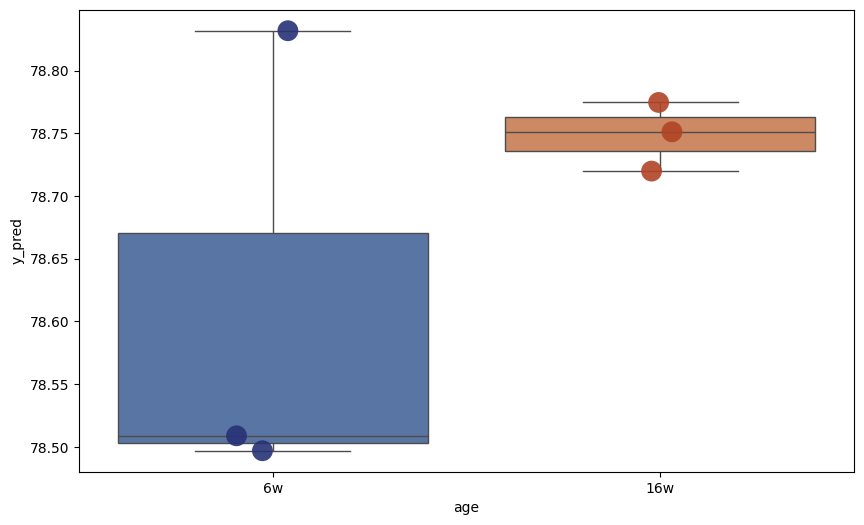

Components: 2
             y_pred
brain_4   77.303658
brain_14  76.390983
brain_13  76.969881
brain_11  76.618804
brain_2   77.635566
brain_1   75.596856
             y_pred  age
brain_4   77.303658   6w
brain_14  76.390983  16w
brain_13  76.969881  16w
brain_11  76.618804  16w
brain_2   77.635566   6w
brain_1   75.596856   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


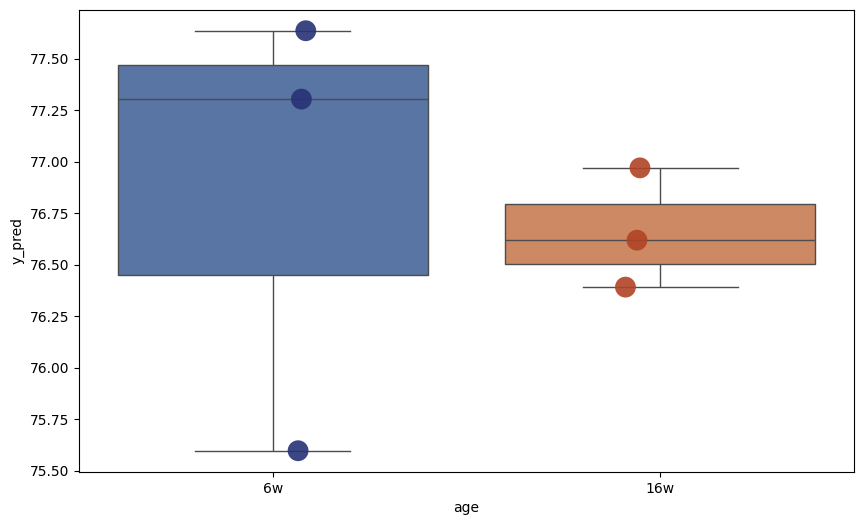

Components: 3
             y_pred
brain_4   75.312590
brain_14  79.933280
brain_13  82.922305
brain_11  77.693859
brain_2   76.058161
brain_1   74.215314
             y_pred  age
brain_4   75.312590   6w
brain_14  79.933280  16w
brain_13  82.922305  16w
brain_11  77.693859  16w
brain_2   76.058161   6w
brain_1   74.215314   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


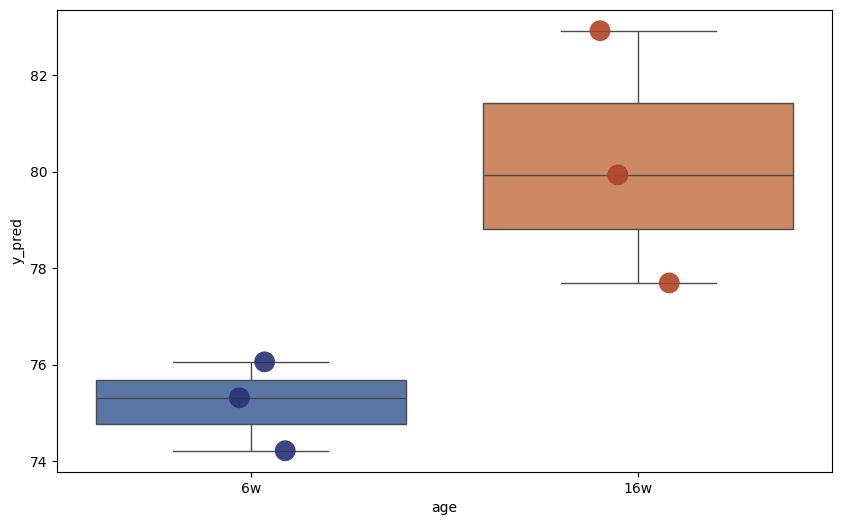

Components: 4
             y_pred
brain_4   74.614827
brain_14  80.935096
brain_13  84.275696
brain_11  74.790674
brain_2   76.543472
brain_1   73.919261
             y_pred  age
brain_4   74.614827   6w
brain_14  80.935096  16w
brain_13  84.275696  16w
brain_11  74.790674  16w
brain_2   76.543472   6w
brain_1   73.919261   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


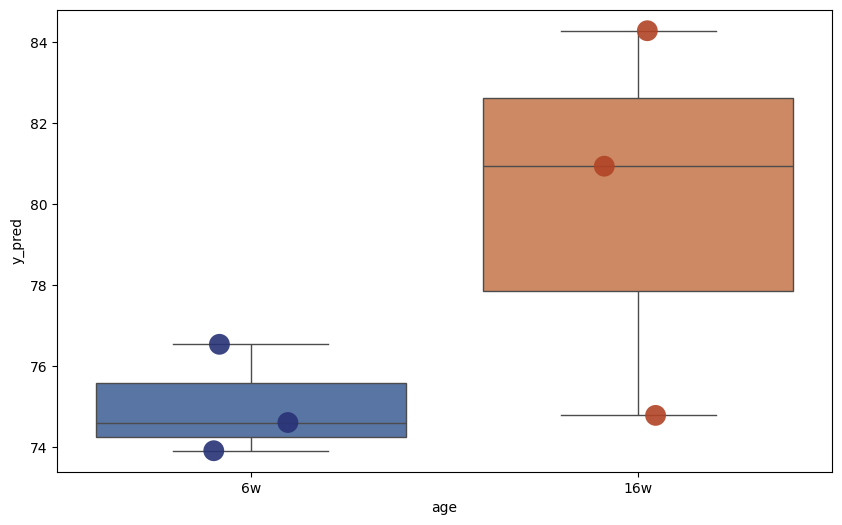

Components: 5
             y_pred
brain_4   61.860478
brain_14  91.493564
brain_13  96.968307
brain_11  94.320028
brain_2   66.604036
brain_1   67.607584
             y_pred  age
brain_4   61.860478   6w
brain_14  91.493564  16w
brain_13  96.968307  16w
brain_11  94.320028  16w
brain_2   66.604036   6w
brain_1   67.607584   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


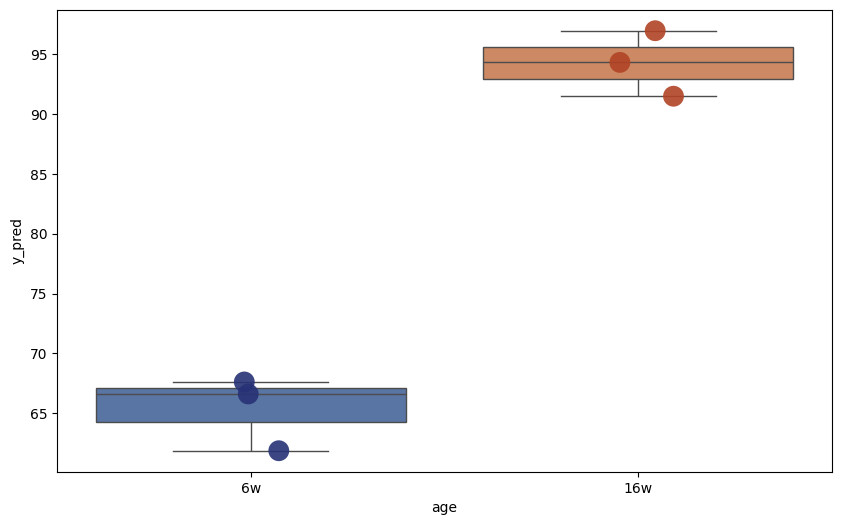

Components: 6
              y_pred
brain_4    59.612175
brain_14   96.678001
brain_13  103.776609
brain_11   99.077757
brain_2    60.359570
brain_1    62.700515
              y_pred  age
brain_4    59.612175   6w
brain_14   96.678001  16w
brain_13  103.776609  16w
brain_11   99.077757  16w
brain_2    60.359570   6w
brain_1    62.700515   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


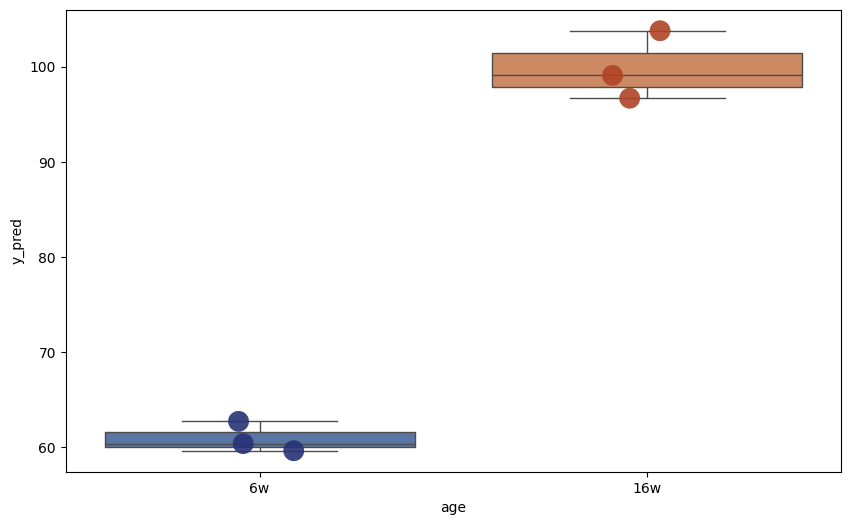

Components: 7
              y_pred
brain_4    60.195835
brain_14   96.573751
brain_13  103.524644
brain_11   98.176003
brain_2    61.842573
brain_1    63.326164
              y_pred  age
brain_4    60.195835   6w
brain_14   96.573751  16w
brain_13  103.524644  16w
brain_11   98.176003  16w
brain_2    61.842573   6w
brain_1    63.326164   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


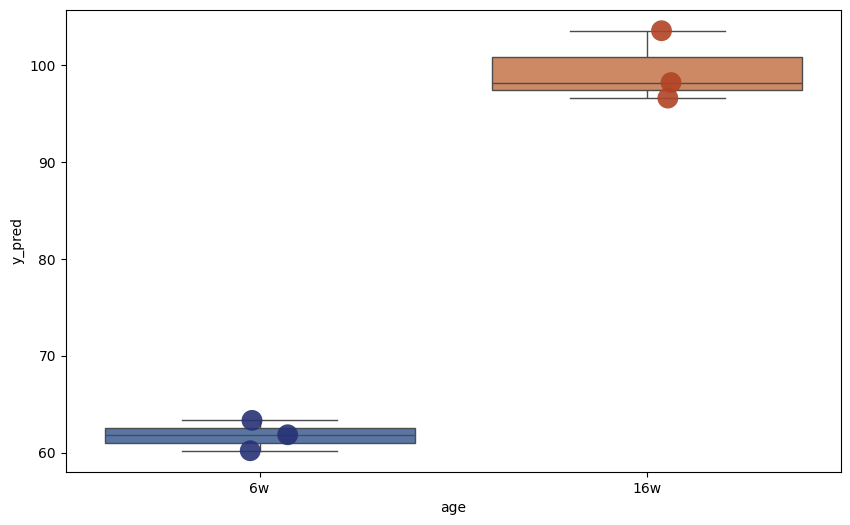

Components: 8
              y_pred
brain_4    58.994184
brain_14   97.320855
brain_13  104.430125
brain_11   99.378239
brain_2    58.714886
brain_1    59.568248
              y_pred  age
brain_4    58.994184   6w
brain_14   97.320855  16w
brain_13  104.430125  16w
brain_11   99.378239  16w
brain_2    58.714886   6w
brain_1    59.568248   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


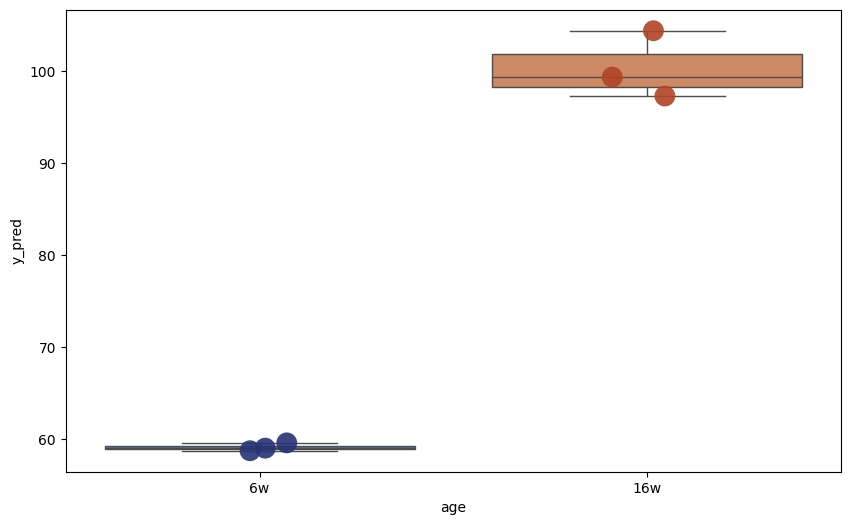

Components: 9
              y_pred
brain_4    58.487034
brain_14   95.049208
brain_13  102.548712
brain_11   96.777411
brain_2    58.151011
brain_1    58.789984
              y_pred  age
brain_4    58.487034   6w
brain_14   95.049208  16w
brain_13  102.548712  16w
brain_11   96.777411  16w
brain_2    58.151011   6w
brain_1    58.789984   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


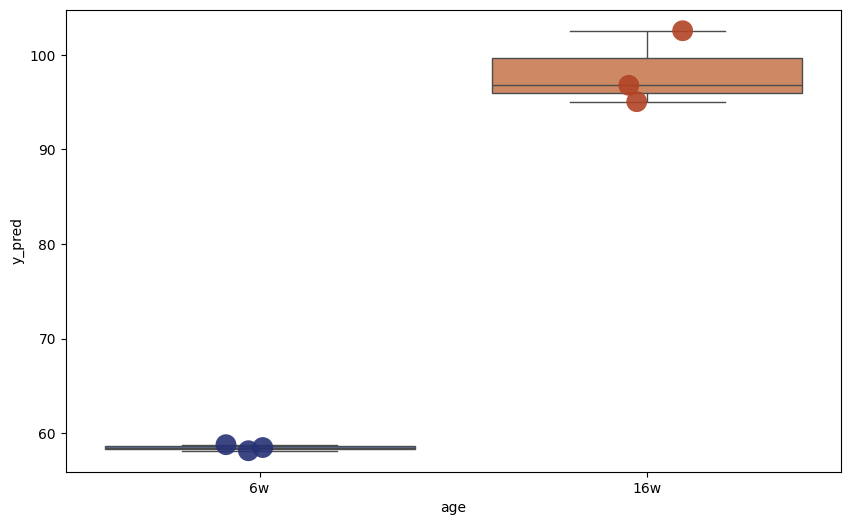

Components: 10
              y_pred
brain_4    59.039894
brain_14   98.562830
brain_13  106.436254
brain_11  101.449709
brain_2    57.221271
brain_1    56.987343
              y_pred  age
brain_4    59.039894   6w
brain_14   98.562830  16w
brain_13  106.436254  16w
brain_11  101.449709  16w
brain_2    57.221271   6w
brain_1    56.987343   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


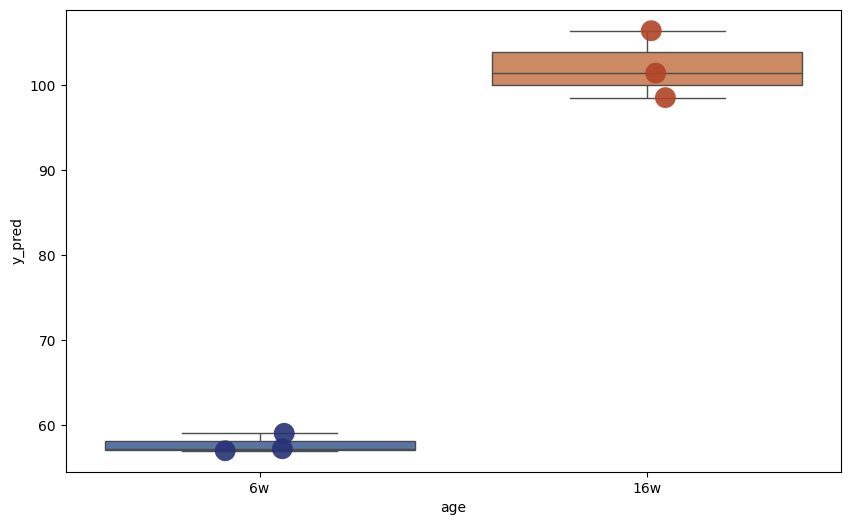

Components: 11
              y_pred
brain_4    59.057066
brain_14   95.303424
brain_13  103.161988
brain_11  101.174196
brain_2    58.478971
brain_1    59.497570
              y_pred  age
brain_4    59.057066   6w
brain_14   95.303424  16w
brain_13  103.161988  16w
brain_11  101.174196  16w
brain_2    58.478971   6w
brain_1    59.497570   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


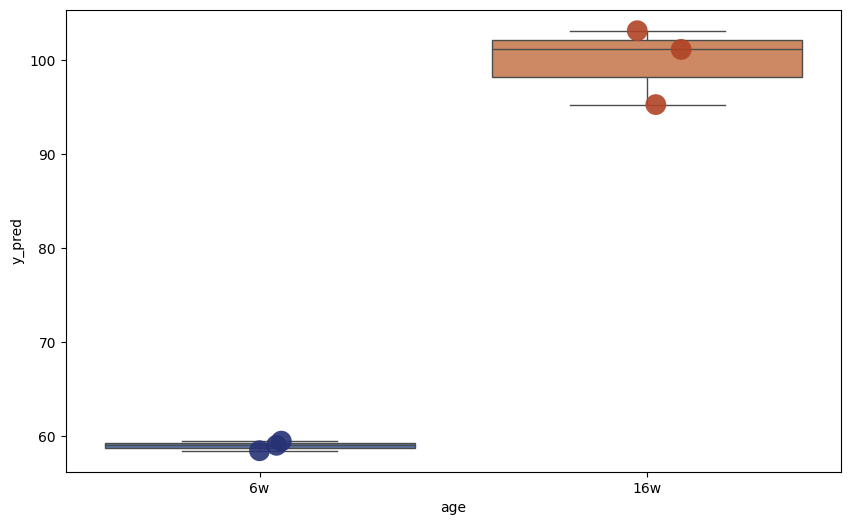

Components: 12
              y_pred
brain_4    58.995231
brain_14   94.782762
brain_13  102.328955
brain_11  102.188882
brain_2    58.845948
brain_1    58.826083
              y_pred  age
brain_4    58.995231   6w
brain_14   94.782762  16w
brain_13  102.328955  16w
brain_11  102.188882  16w
brain_2    58.845948   6w
brain_1    58.826083   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


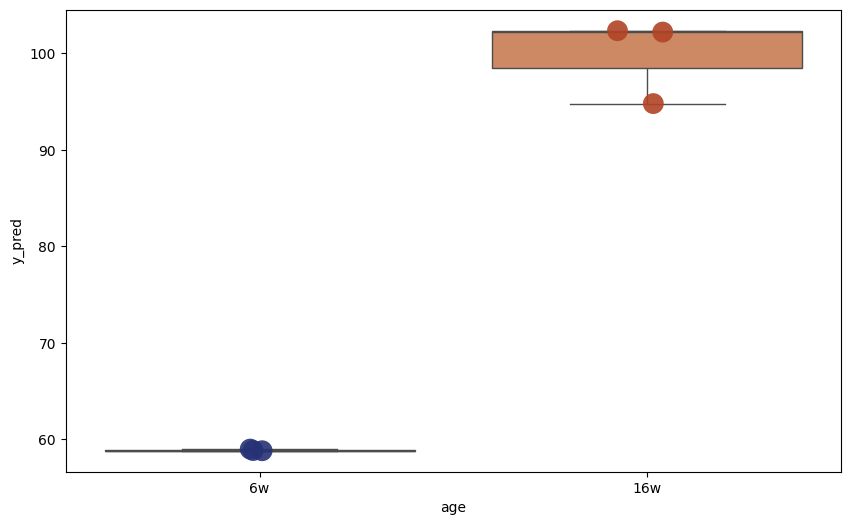

Components: 13
              y_pred
brain_4    58.508442
brain_14   93.518326
brain_13  101.079862
brain_11  100.843427
brain_2    59.797781
brain_1    59.271787
              y_pred  age
brain_4    58.508442   6w
brain_14   93.518326  16w
brain_13  101.079862  16w
brain_11  100.843427  16w
brain_2    59.797781   6w
brain_1    59.271787   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


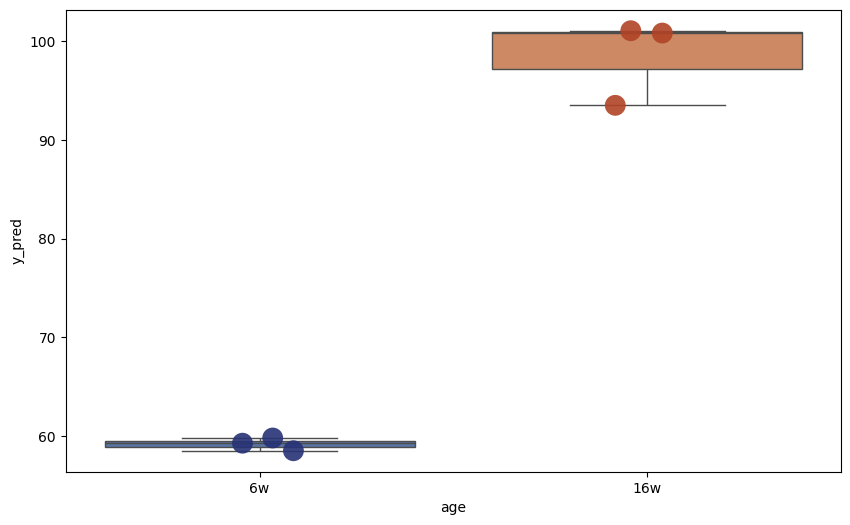

Components: 14
              y_pred
brain_4    58.618842
brain_14   93.435316
brain_13  100.756114
brain_11  100.864092
brain_2    59.394570
brain_1    59.107858
              y_pred  age
brain_4    58.618842   6w
brain_14   93.435316  16w
brain_13  100.756114  16w
brain_11  100.864092  16w
brain_2    59.394570   6w
brain_1    59.107858   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


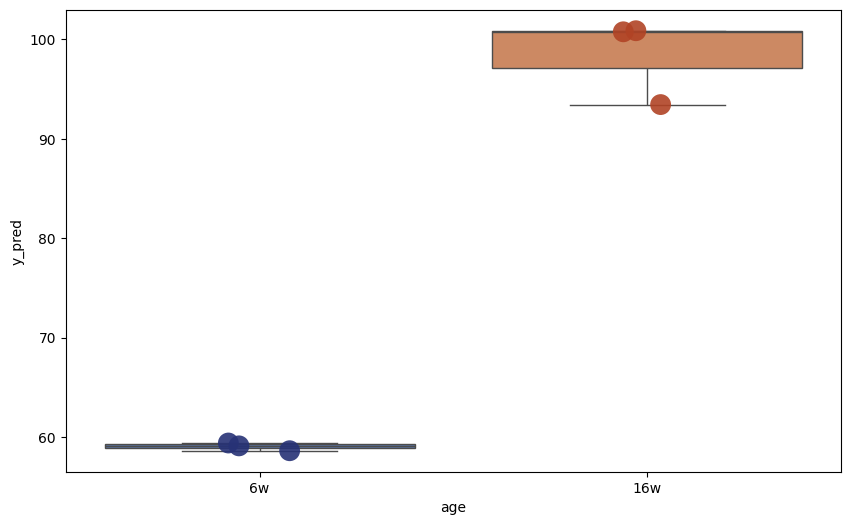

Components: 15
              y_pred
brain_4    58.659632
brain_14   92.549063
brain_13  100.012863
brain_11  100.682161
brain_2    59.847378
brain_1    60.078502
              y_pred  age
brain_4    58.659632   6w
brain_14   92.549063  16w
brain_13  100.012863  16w
brain_11  100.682161  16w
brain_2    59.847378   6w
brain_1    60.078502   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


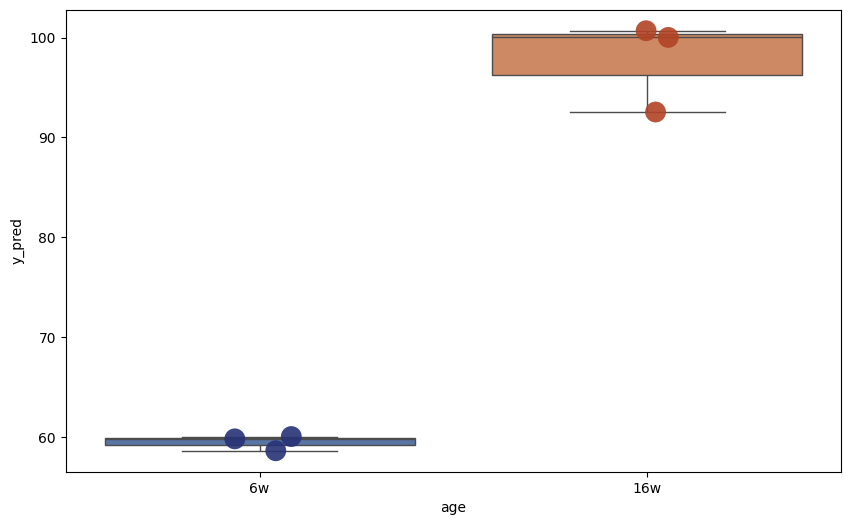

Components: 16
              y_pred
brain_4    58.540757
brain_14   93.264534
brain_13  100.667155
brain_11  100.327472
brain_2    59.364424
brain_1    58.987876
              y_pred  age
brain_4    58.540757   6w
brain_14   93.264534  16w
brain_13  100.667155  16w
brain_11  100.327472  16w
brain_2    59.364424   6w
brain_1    58.987876   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


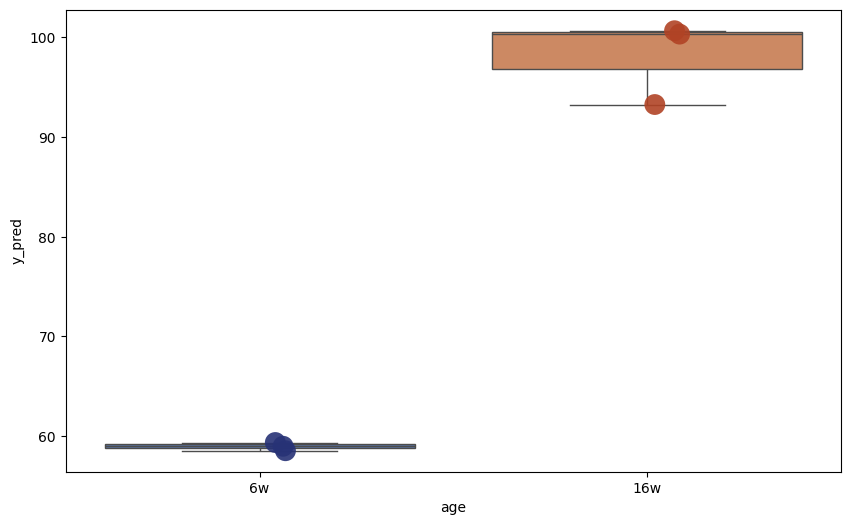

Components: 17
              y_pred
brain_4    58.453254
brain_14   93.126933
brain_13  100.576257
brain_11  100.404184
brain_2    59.388007
brain_1    59.274410
              y_pred  age
brain_4    58.453254   6w
brain_14   93.126933  16w
brain_13  100.576257  16w
brain_11  100.404184  16w
brain_2    59.388007   6w
brain_1    59.274410   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


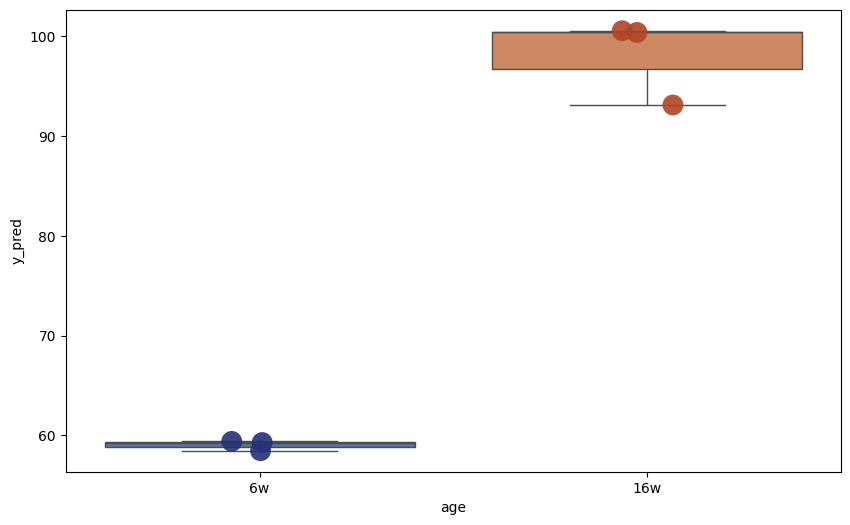

Components: 18
              y_pred
brain_4    58.845628
brain_14   92.722063
brain_13  100.117945
brain_11  100.757061
brain_2    59.599435
brain_1    59.586257
              y_pred  age
brain_4    58.845628   6w
brain_14   92.722063  16w
brain_13  100.117945  16w
brain_11  100.757061  16w
brain_2    59.599435   6w
brain_1    59.586257   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


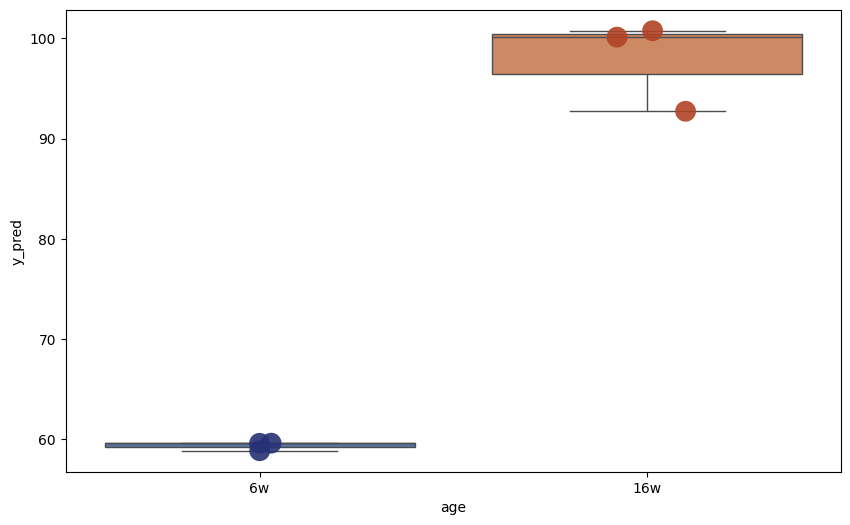

Components: 19
              y_pred
brain_4    58.509627
brain_14   92.872542
brain_13  100.717745
brain_11  100.665295
brain_2    58.515137
brain_1    58.362618
              y_pred  age
brain_4    58.509627   6w
brain_14   92.872542  16w
brain_13  100.717745  16w
brain_11  100.665295  16w
brain_2    58.515137   6w
brain_1    58.362618   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


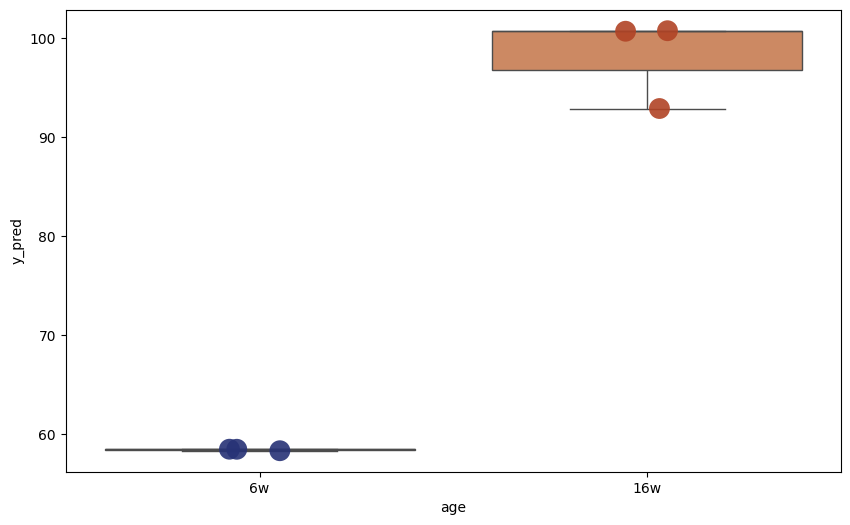

Components: 20
              y_pred
brain_4    58.532746
brain_14   93.820622
brain_13  101.878891
brain_11  101.069371
brain_2    57.373799
brain_1    56.779695
              y_pred  age
brain_4    58.532746   6w
brain_14   93.820622  16w
brain_13  101.878891  16w
brain_11  101.069371  16w
brain_2    57.373799   6w
brain_1    56.779695   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


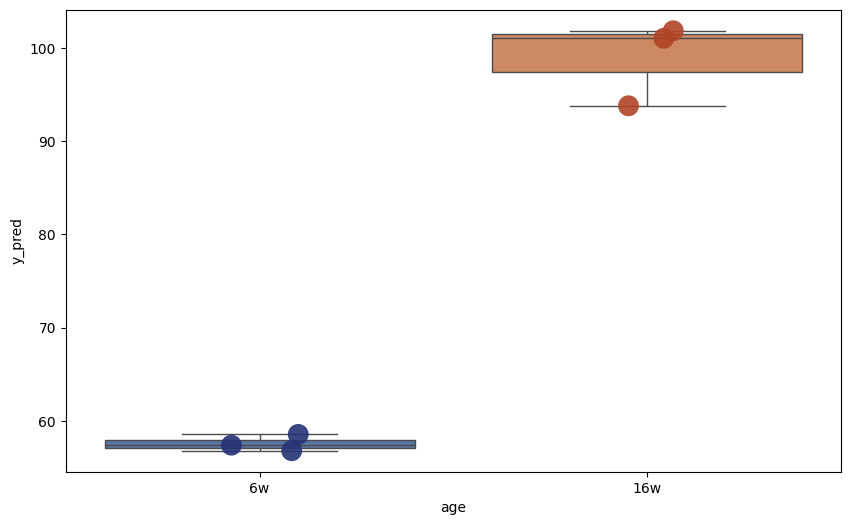

Components: 21
              y_pred
brain_4    57.903194
brain_14   93.553947
brain_13  101.413428
brain_11  100.827543
brain_2    57.194064
brain_1    56.429431
              y_pred  age
brain_4    57.903194   6w
brain_14   93.553947  16w
brain_13  101.413428  16w
brain_11  100.827543  16w
brain_2    57.194064   6w
brain_1    56.429431   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


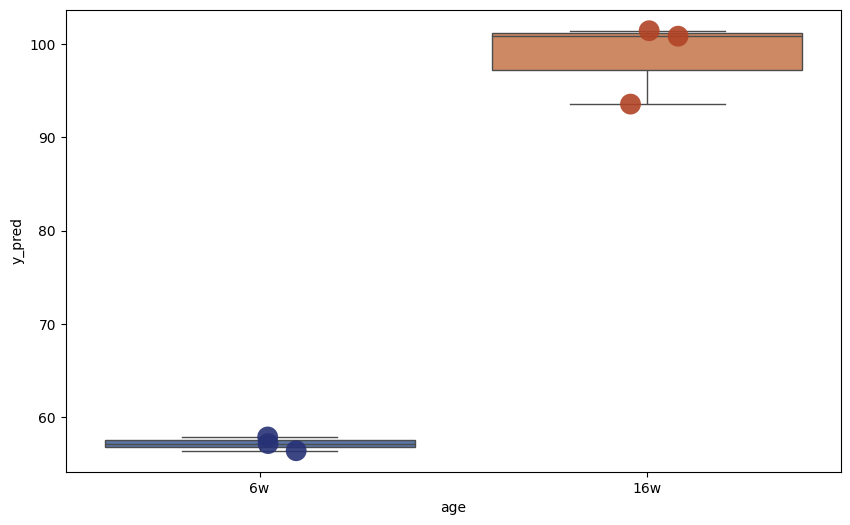

Components: 22
              y_pred
brain_4    58.212657
brain_14   94.327774
brain_13  102.264314
brain_11  101.239821
brain_2    57.730307
brain_1    56.201440
              y_pred  age
brain_4    58.212657   6w
brain_14   94.327774  16w
brain_13  102.264314  16w
brain_11  101.239821  16w
brain_2    57.730307   6w
brain_1    56.201440   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


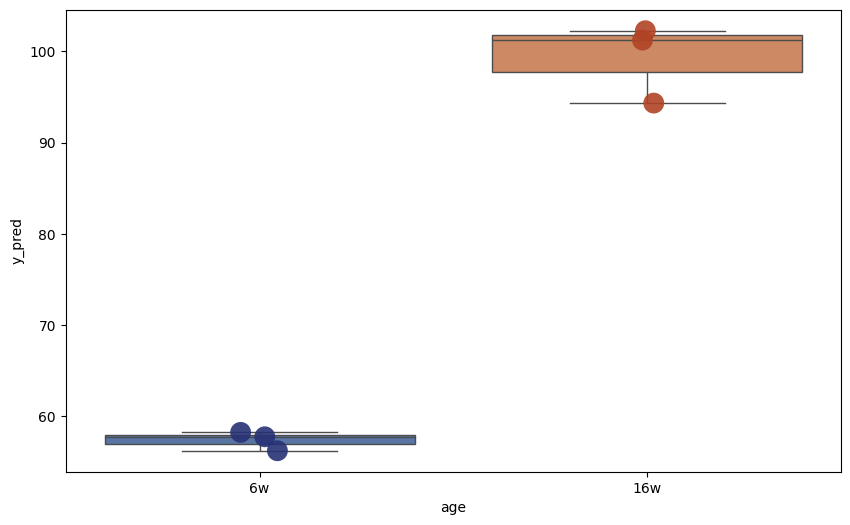

Components: 23
              y_pred
brain_4    57.758361
brain_14   94.510665
brain_13  101.974249
brain_11  100.021890
brain_2    57.820869
brain_1    55.638158
              y_pred  age
brain_4    57.758361   6w
brain_14   94.510665  16w
brain_13  101.974249  16w
brain_11  100.021890  16w
brain_2    57.820869   6w
brain_1    55.638158   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


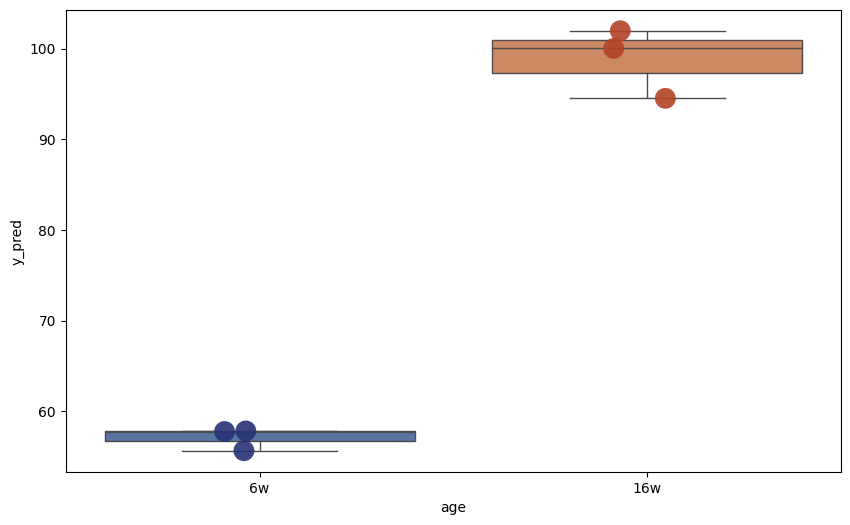

Components: 24
              y_pred
brain_4    57.517587
brain_14   94.513413
brain_13  101.512109
brain_11   99.943250
brain_2    57.359743
brain_1    54.619993
              y_pred  age
brain_4    57.517587   6w
brain_14   94.513413  16w
brain_13  101.512109  16w
brain_11   99.943250  16w
brain_2    57.359743   6w
brain_1    54.619993   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


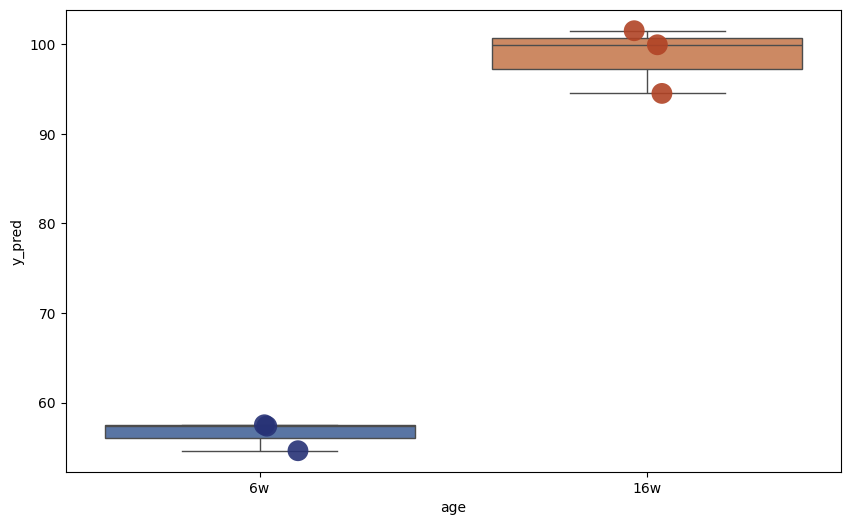

Components: 25
              y_pred
brain_4    57.339674
brain_14   93.915885
brain_13  101.314250
brain_11   99.775570
brain_2    58.338025
brain_1    54.403091
              y_pred  age
brain_4    57.339674   6w
brain_14   93.915885  16w
brain_13  101.314250  16w
brain_11   99.775570  16w
brain_2    58.338025   6w
brain_1    54.403091   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


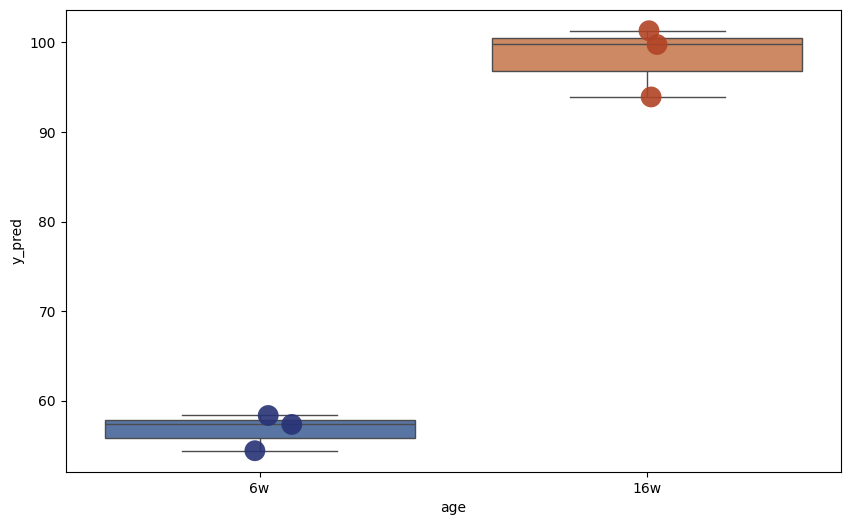

Components: 26
              y_pred
brain_4    57.228893
brain_14   93.794752
brain_13  101.239394
brain_11   99.746775
brain_2    58.331394
brain_1    54.467994
              y_pred  age
brain_4    57.228893   6w
brain_14   93.794752  16w
brain_13  101.239394  16w
brain_11   99.746775  16w
brain_2    58.331394   6w
brain_1    54.467994   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


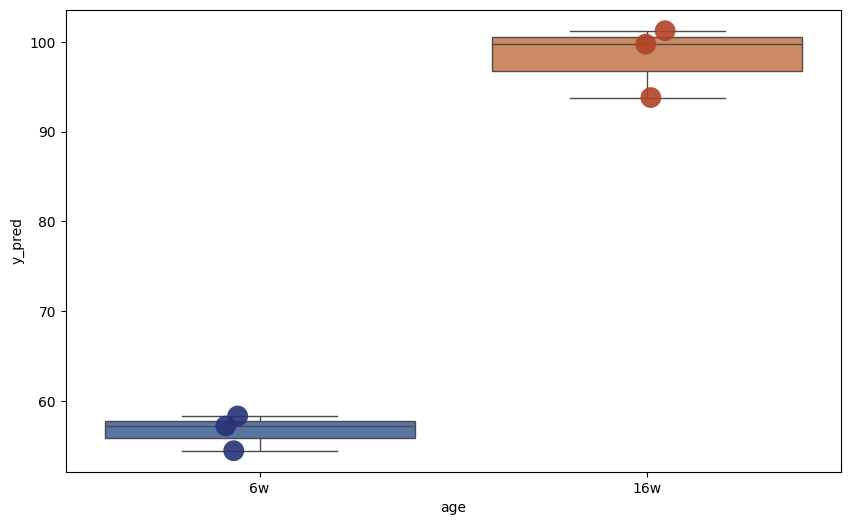

Components: 27
              y_pred
brain_4    56.903172
brain_14   93.351941
brain_13  100.689809
brain_11   99.688036
brain_2    58.980431
brain_1    53.613062
              y_pred  age
brain_4    56.903172   6w
brain_14   93.351941  16w
brain_13  100.689809  16w
brain_11   99.688036  16w
brain_2    58.980431   6w
brain_1    53.613062   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


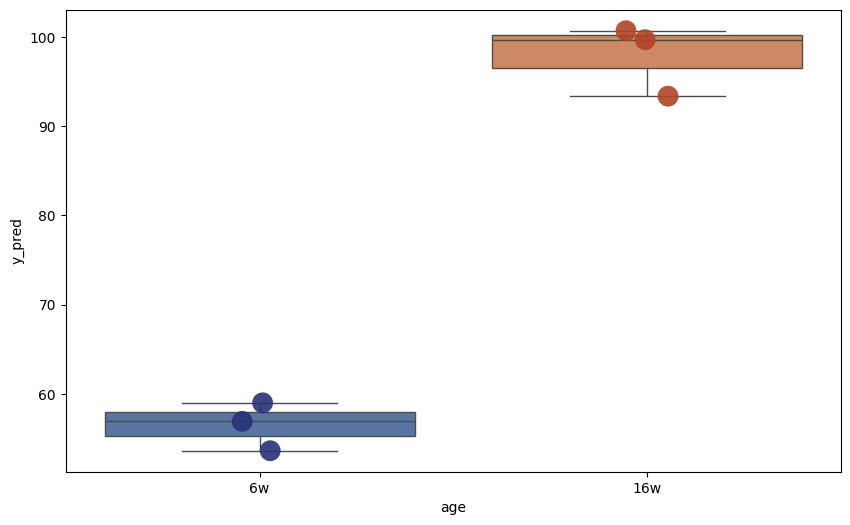

Components: 28
              y_pred
brain_4    56.904557
brain_14   93.477078
brain_13  100.679024
brain_11   99.807963
brain_2    58.945569
brain_1    53.443393
              y_pred  age
brain_4    56.904557   6w
brain_14   93.477078  16w
brain_13  100.679024  16w
brain_11   99.807963  16w
brain_2    58.945569   6w
brain_1    53.443393   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


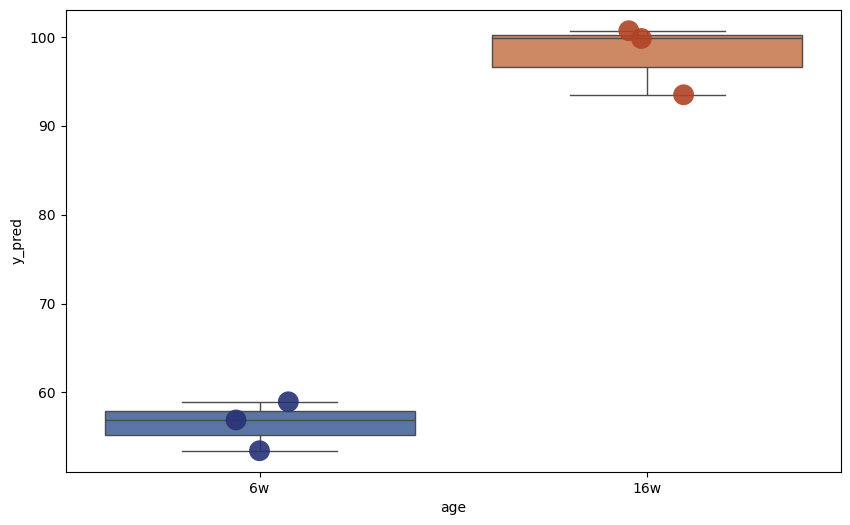

Components: 29
              y_pred
brain_4    56.817393
brain_14   93.197073
brain_13  100.455304
brain_11  100.125240
brain_2    58.717853
brain_1    53.638956
              y_pred  age
brain_4    56.817393   6w
brain_14   93.197073  16w
brain_13  100.455304  16w
brain_11  100.125240  16w
brain_2    58.717853   6w
brain_1    53.638956   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


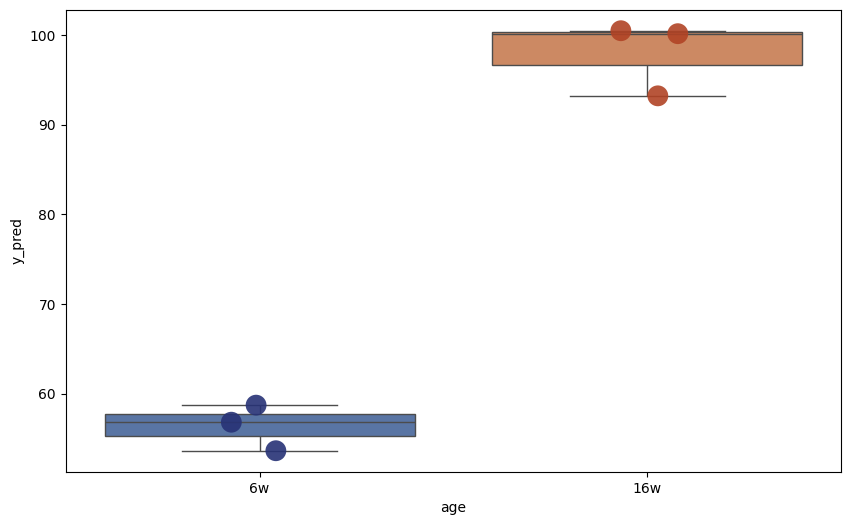

Components: 30
              y_pred
brain_4    56.839128
brain_14   93.200965
brain_13  100.461841
brain_11  100.115573
brain_2    58.727012
brain_1    53.675837
              y_pred  age
brain_4    56.839128   6w
brain_14   93.200965  16w
brain_13  100.461841  16w
brain_11  100.115573  16w
brain_2    58.727012   6w
brain_1    53.675837   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


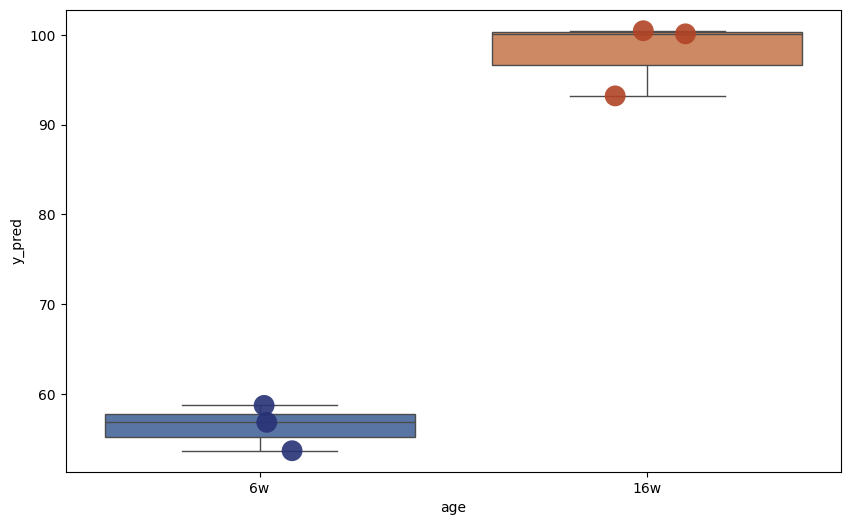

Components: 31
              y_pred
brain_4    56.932390
brain_14   93.220138
brain_13  100.446455
brain_11  100.089099
brain_2    58.727799
brain_1    53.784432
              y_pred  age
brain_4    56.932390   6w
brain_14   93.220138  16w
brain_13  100.446455  16w
brain_11  100.089099  16w
brain_2    58.727799   6w
brain_1    53.784432   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


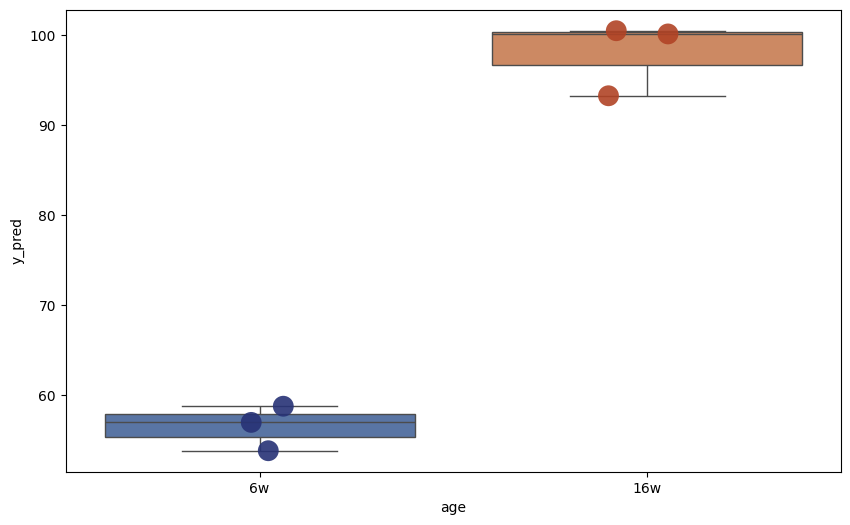

Components: 32
              y_pred
brain_4    57.062677
brain_14   93.291023
brain_13  100.811700
brain_11  100.199293
brain_2    59.554802
brain_1    54.474939
              y_pred  age
brain_4    57.062677   6w
brain_14   93.291023  16w
brain_13  100.811700  16w
brain_11  100.199293  16w
brain_2    59.554802   6w
brain_1    54.474939   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


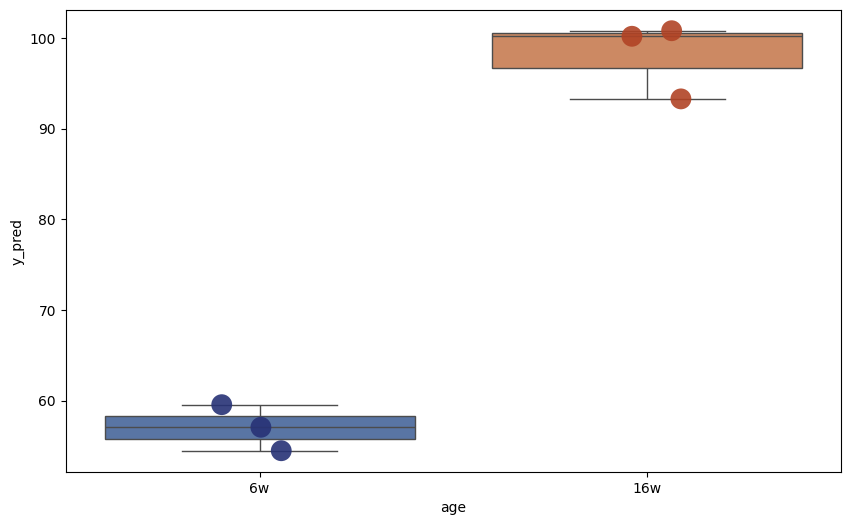

Components: 33
              y_pred
brain_4    57.080889
brain_14   94.427325
brain_13  101.625867
brain_11  101.492814
brain_2    60.191741
brain_1    54.596937
              y_pred  age
brain_4    57.080889   6w
brain_14   94.427325  16w
brain_13  101.625867  16w
brain_11  101.492814  16w
brain_2    60.191741   6w
brain_1    54.596937   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


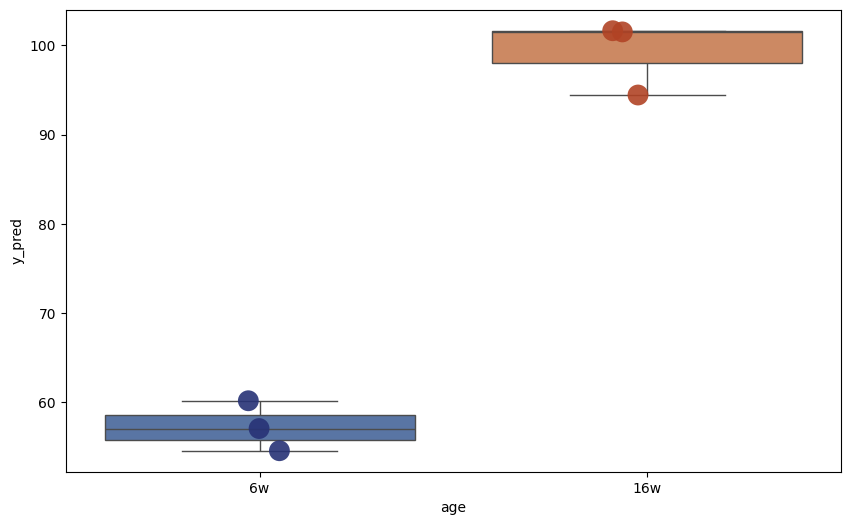

Components: 34
              y_pred
brain_4    57.043445
brain_14   94.438519
brain_13  101.607451
brain_11  101.513179
brain_2    60.151724
brain_1    54.594261
              y_pred  age
brain_4    57.043445   6w
brain_14   94.438519  16w
brain_13  101.607451  16w
brain_11  101.513179  16w
brain_2    60.151724   6w
brain_1    54.594261   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


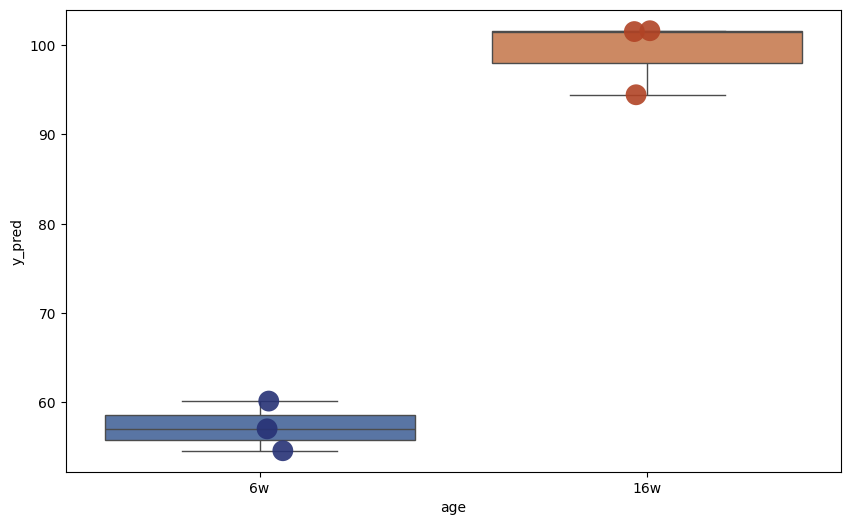

Components: 35
              y_pred
brain_4    57.042395
brain_14   94.449312
brain_13  101.614596
brain_11  101.497056
brain_2    60.152909
brain_1    54.589211
              y_pred  age
brain_4    57.042395   6w
brain_14   94.449312  16w
brain_13  101.614596  16w
brain_11  101.497056  16w
brain_2    60.152909   6w
brain_1    54.589211   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


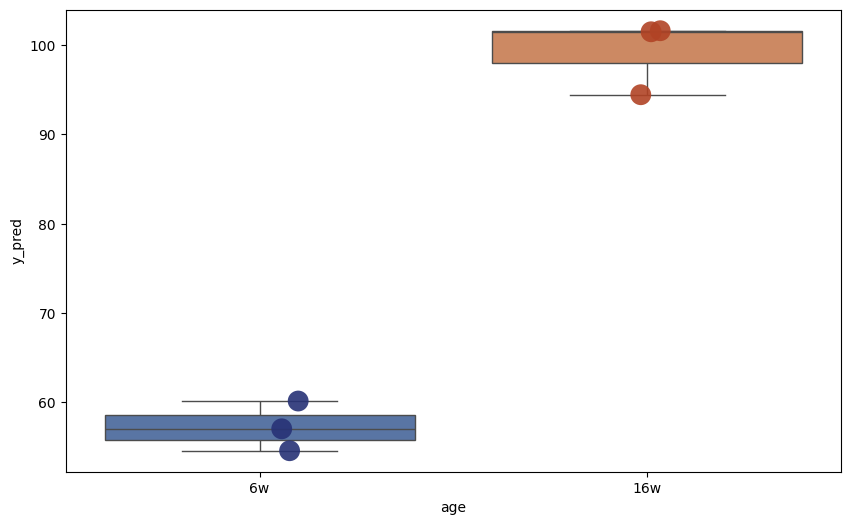

In [65]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_male.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_male["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [66]:
n_components = 11

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_male = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_male.index.tolist())

results_df_male["age"] = df_intervention_test_metadata_male["age"]

print(results_df_male)
results_df_male.to_csv("./AlanXu_brain_maleOnly_Calibratedpredictions_11PCs_EC-250725.csv")

              y_pred  age
brain_4    59.057066   6w
brain_14   95.303424  16w
brain_13  103.161988  16w
brain_11  101.174196  16w
brain_2    58.478971   6w
brain_1    59.497570   6w


In [ ]:
##### Sample rotation

In [ ]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_male.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_male.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_male['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_male.drop(
            atlas_plus_intervention_male.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_male.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_male.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_male.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")


### Female

##### Calibration

In [67]:
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_female = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(female_samples)
]

df_intervention_age_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.000000,0.0,59.769056,346.125278,...,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,Brain,6w,female,42
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.020250,0.0,126.095421,371.490702,...,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,Brain,6w,female,42
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,Brain,6w,female,42


In [68]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'female'].index

df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_10,SRR24062662,6w,RNA-Seq,300,3489947700,Dario Valenzano laboratory,PRJNA952180,SAMN34067642,Model organism or animal,1264822394,...,2023-04-04T11:25:00Z,1,GRZ-AD_8239_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062662.featureCounts,SRR24062662,No
brain_9,SRR24062663,6w,RNA-Seq,300,4193625600,Dario Valenzano laboratory,PRJNA952180,SAMN34067641,Model organism or animal,1529210989,...,2023-04-04T11:23:00Z,1,GRZ-AD_8235_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062663.featureCounts,SRR24062663,No
brain_8,SRR24062672,6w,RNA-Seq,300,3373065000,Dario Valenzano laboratory,PRJNA952180,SAMN34067640,Model organism or animal,1238699897,...,2023-04-04T11:23:00Z,1,GRZ-AD_8236_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062672.featureCounts,SRR24062672,No


In [69]:
random.seed(123)

# Separate the samples
young_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.00000,0.0,59.769056,346.125278,...,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,Brain,6w,female,42
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.02025,0.0,126.095421,371.490702,...,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,Brain,6w,female,42
brain_20,87.795380,198.694807,69.312142,101.657808,9.241619,129.382665,0.00000,0.0,129.382665,406.631233,...,0.000000,0.000000,92.416189,970.369987,147.865903,27.724857,Brain,16w,female,112
brain_17,100.879093,104.914257,63.553829,147.283476,12.105491,151.318639,0.00000,0.0,70.615365,389.393299,...,23.202191,8.070327,18.158237,591.151485,128.116448,24.210982,Brain,16w,female,112


In [70]:
df_intervention_train_female = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_10,52.632452,178.415092,58.876980,132.027168,25.870188,156.113205,0.00000,0.0,59.769056,346.125278,...,555.763011,0.000000,5.352453,12.489056,8.920755,26.762264,801.083762,84.747169,33.006792,42
brain_9,90.607488,178.194727,58.894867,110.239111,21.141747,169.889041,3.02025,0.0,126.095421,371.490702,...,749.021903,4.530374,7.550624,7.550624,3.020250,28.692371,782.999711,119.299860,34.732871,42


In [71]:
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

#combine the dataframes
atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_female], axis=0)

atlas_plus_intervention_female.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A23_2,17.414194,584.876719,587.879166,315.256959,104.485163,422.744569,3009.653097,232.389415,351.286325,369.301009,...,65.453349,807.057814,210.771795,505.011623,31.225451,1231.003362,736.800549,254.007035,441.960231,78
C22_2,26.304342,542.317178,356.507784,341.956446,93.464364,463.404152,2857.099272,389.528128,366.022120,348.672448,...,65.481022,805.360598,314.532770,457.807484,7.835336,1242.460408,826.627938,146.073048,434.301476,103
C23_2,37.729860,592.298911,484.499311,353.343132,107.200713,560.557917,2921.968033,204.819239,523.426944,464.137164,...,75.459720,913.302162,219.192519,630.627657,49.108706,1183.998934,798.914810,276.086752,457.549411,49


In [72]:
#all not in select_train_samples
test_samples = [s for s in female_samples if s not in select_train_samples]
test_samples

['brain_8', 'brain_7', 'brain_19', 'brain_18', 'brain_16']

In [73]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(test_samples)
]

df_intervention_test_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,Brain,6w,female,42
brain_7,105.548368,110.346021,81.560102,195.104559,39.980442,163.120205,1.599218,0.0,97.552279,373.417332,...,5.597262,3.198435,33.583572,588.512112,84.758538,41.579660,Brain,6w,female,42
brain_19,130.935303,138.209487,43.645101,109.112753,14.548367,101.838569,0.000000,0.0,138.209487,443.725195,...,29.096734,7.274184,0.000000,800.160187,181.854588,29.096734,Brain,16w,female,112


In [74]:
df_intervention_test_female = df_intervention_test_female.drop(df_intervention_test_female.columns[[-2,-3, -4]], axis=1)
df_intervention_test_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
brain_8,87.198380,188.929824,63.582152,136.247469,21.799595,162.588646,3.633266,0.0,105.364709,296.111166,...,1078.171638,0.0,7.266532,7.266532,9.083165,29.066127,979.165144,128.980937,34.516025,42
brain_7,105.548368,110.346021,81.560102,195.104559,39.980442,163.120205,1.599218,0.0,97.552279,373.417332,...,225.489695,0.0,14.392959,5.597262,3.198435,33.583572,588.512112,84.758538,41.579660,42


In [75]:
#check cols ordered the same
df_intervention_test_female = df_intervention_test_female[atlas_plus_intervention_female.columns]

In [76]:
#subset your metadata
df_intervention_test_metadata_female = df_intervention_metadata_female.loc[
    df_intervention_metadata_female.index.isin(test_samples)
]

df_intervention_test_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
brain_8,SRR24062672,6w,RNA-Seq,300,3373065000,Dario Valenzano laboratory,PRJNA952180,SAMN34067640,Model organism or animal,1238699897,...,2023-04-04T11:23:00Z,1,GRZ-AD_8236_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062672.featureCounts,SRR24062672,No
brain_7,SRR24062683,6w,RNA-Seq,300,3714389100,Dario Valenzano laboratory,PRJNA952180,SAMN34067639,Model organism or animal,1366725430,...,2023-04-04T11:26:00Z,1,GRZ-AD_8233_6w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062683.featureCounts,SRR24062683,No
brain_19,SRR24062729,16w,RNA-Seq,300,4134007500,Dario Valenzano laboratory,PRJNA952180,SAMN34067651,Model organism or animal,1524490422,...,2023-04-04T11:27:00Z,1,GRZ-AD_8232_16w_Female_Brain,female,SRP430823,GRZ-AD,Brain,SRR24062729.featureCounts,SRR24062729,No


In [77]:
age = atlas_plus_intervention_female['age']
X = atlas_plus_intervention_female.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_female.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(27, 25122)
(5, 25122)


Components: 1
             y_pred
brain_8   77.366362
brain_7   77.397126
brain_19  77.694501
brain_18  77.629379
brain_16  77.398521
             y_pred  age
brain_8   77.366362   6w
brain_7   77.397126   6w
brain_19  77.694501  16w
brain_18  77.629379  16w
brain_16  77.398521  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


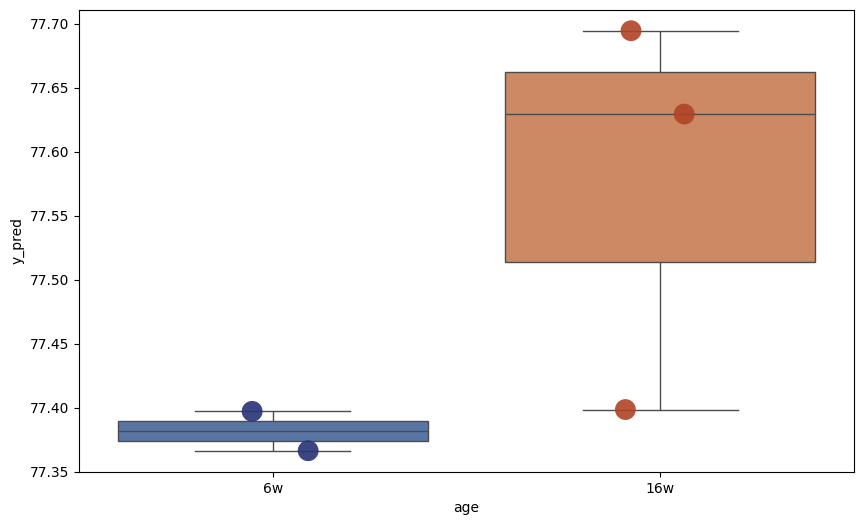

Components: 2
             y_pred
brain_8   80.106689
brain_7   76.160395
brain_19  78.903654
brain_18  78.666720
brain_16  82.348606
             y_pred  age
brain_8   80.106689   6w
brain_7   76.160395   6w
brain_19  78.903654  16w
brain_18  78.666720  16w
brain_16  82.348606  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


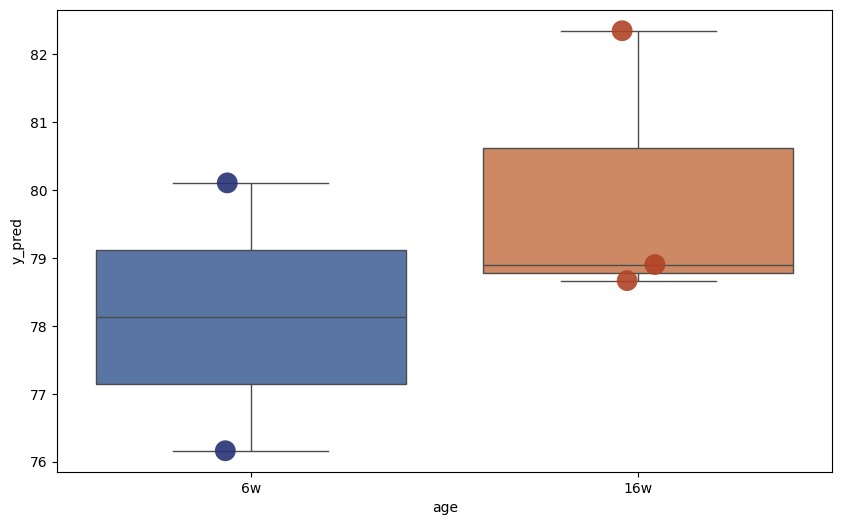

Components: 3
             y_pred
brain_8   62.157346
brain_7   67.670574
brain_19  87.691772
brain_18  89.300993
brain_16  82.137936
             y_pred  age
brain_8   62.157346   6w
brain_7   67.670574   6w
brain_19  87.691772  16w
brain_18  89.300993  16w
brain_16  82.137936  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


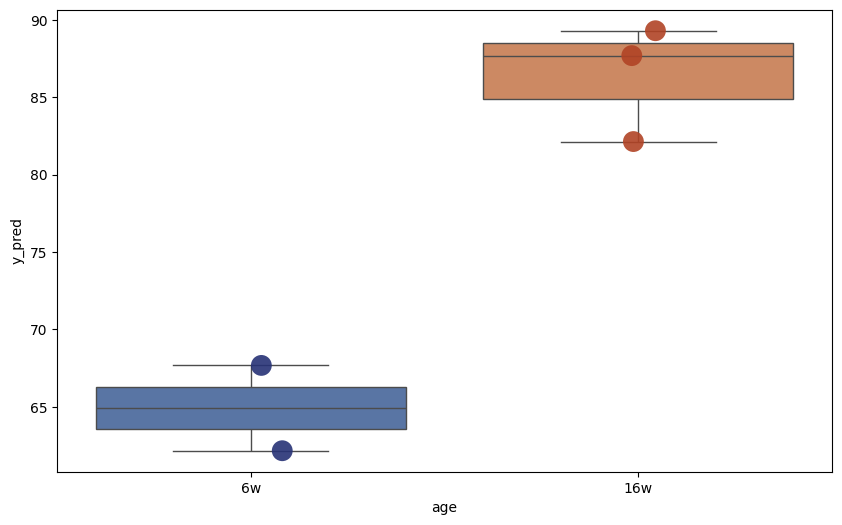

Components: 4
             y_pred
brain_8   64.310110
brain_7   68.944340
brain_19  87.455850
brain_18  88.790259
brain_16  84.991368
             y_pred  age
brain_8   64.310110   6w
brain_7   68.944340   6w
brain_19  87.455850  16w
brain_18  88.790259  16w
brain_16  84.991368  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


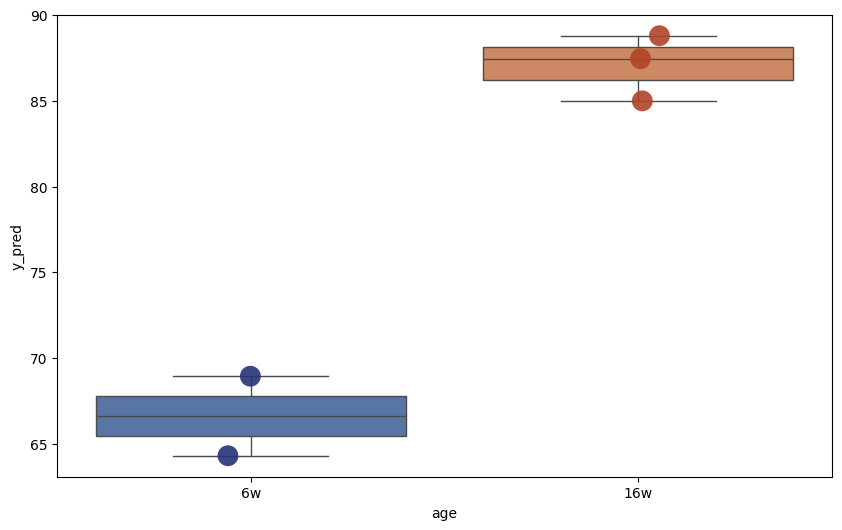

Components: 5
             y_pred
brain_8   64.307928
brain_7   68.934687
brain_19  87.440119
brain_18  88.761979
brain_16  85.035225
             y_pred  age
brain_8   64.307928   6w
brain_7   68.934687   6w
brain_19  87.440119  16w
brain_18  88.761979  16w
brain_16  85.035225  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


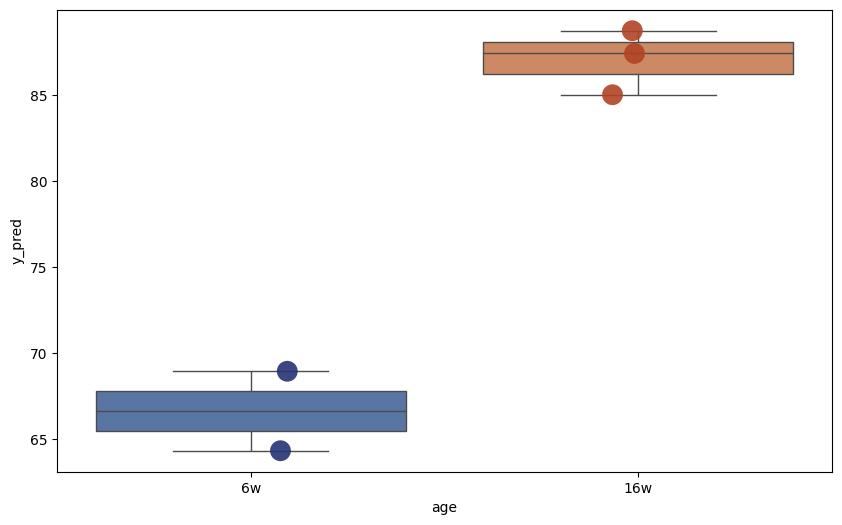

Components: 6
             y_pred
brain_8   62.147723
brain_7   67.869249
brain_19  86.378192
brain_18  87.016409
brain_16  86.312084
             y_pred  age
brain_8   62.147723   6w
brain_7   67.869249   6w
brain_19  86.378192  16w
brain_18  87.016409  16w
brain_16  86.312084  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


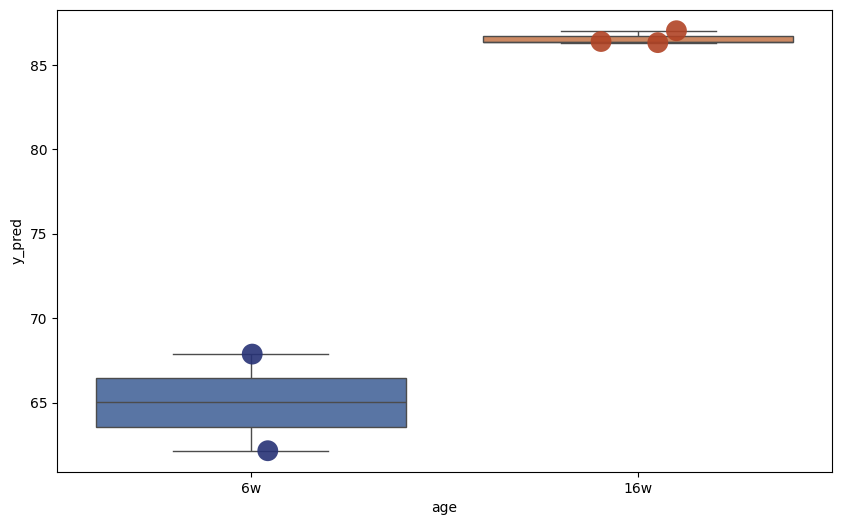

Components: 7
             y_pred
brain_8   61.744553
brain_7   68.100426
brain_19  86.770525
brain_18  86.906534
brain_16  86.468901
             y_pred  age
brain_8   61.744553   6w
brain_7   68.100426   6w
brain_19  86.770525  16w
brain_18  86.906534  16w
brain_16  86.468901  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


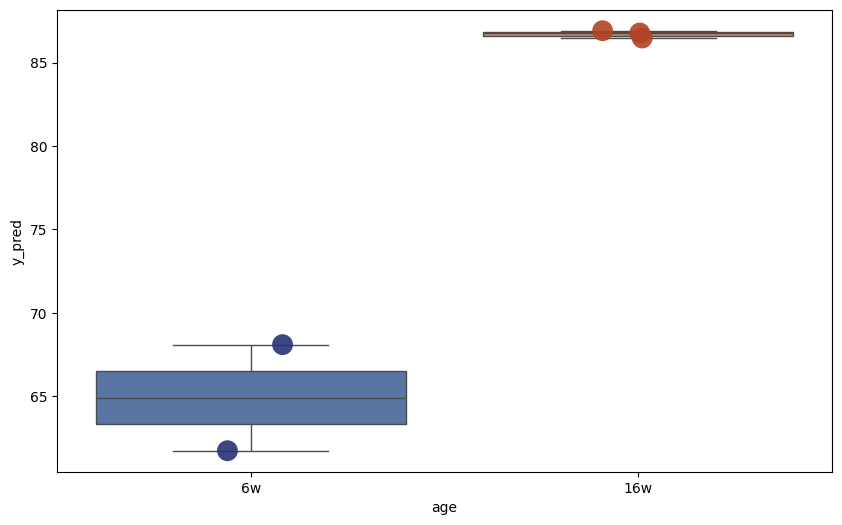

Components: 8
             y_pred
brain_8   61.661308
brain_7   68.104725
brain_19  86.970553
brain_18  86.960694
brain_16  86.793778
             y_pred  age
brain_8   61.661308   6w
brain_7   68.104725   6w
brain_19  86.970553  16w
brain_18  86.960694  16w
brain_16  86.793778  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


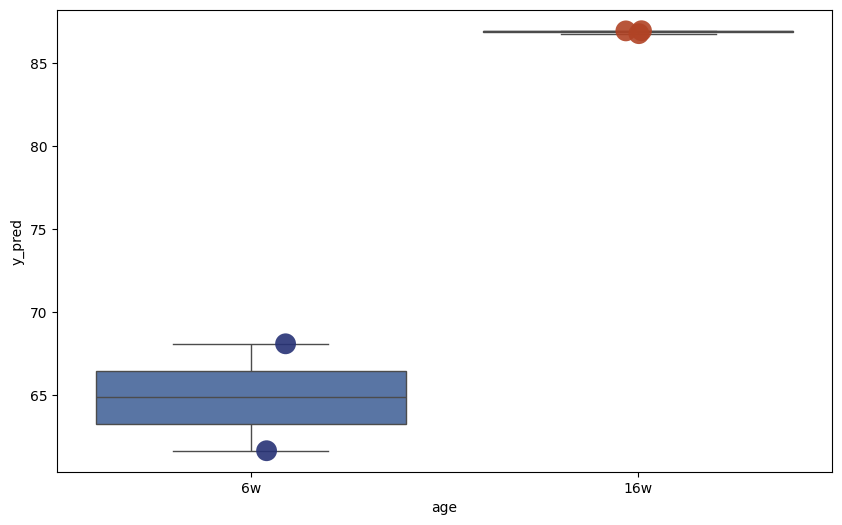

Components: 9
             y_pred
brain_8   61.999605
brain_7   68.283191
brain_19  86.662622
brain_18  86.981680
brain_16  86.313628
             y_pred  age
brain_8   61.999605   6w
brain_7   68.283191   6w
brain_19  86.662622  16w
brain_18  86.981680  16w
brain_16  86.313628  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


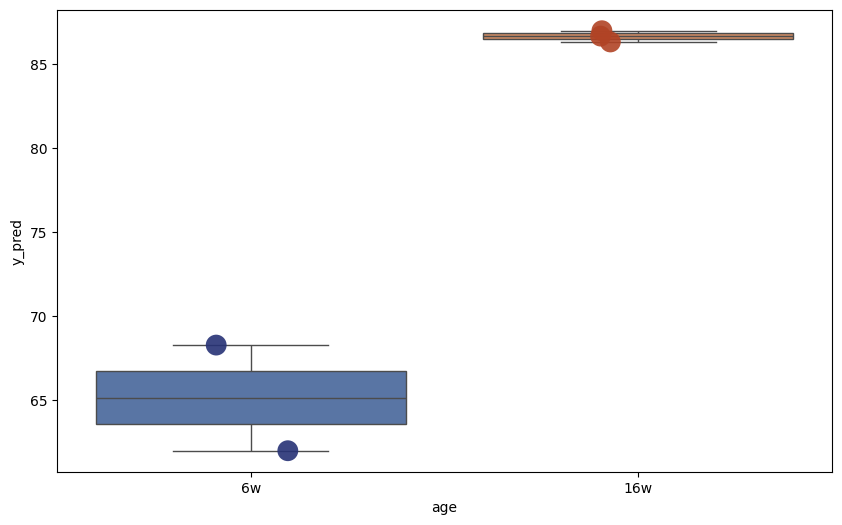

Components: 10
             y_pred
brain_8   63.926571
brain_7   68.505516
brain_19  86.882674
brain_18  85.831465
brain_16  85.959383
             y_pred  age
brain_8   63.926571   6w
brain_7   68.505516   6w
brain_19  86.882674  16w
brain_18  85.831465  16w
brain_16  85.959383  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


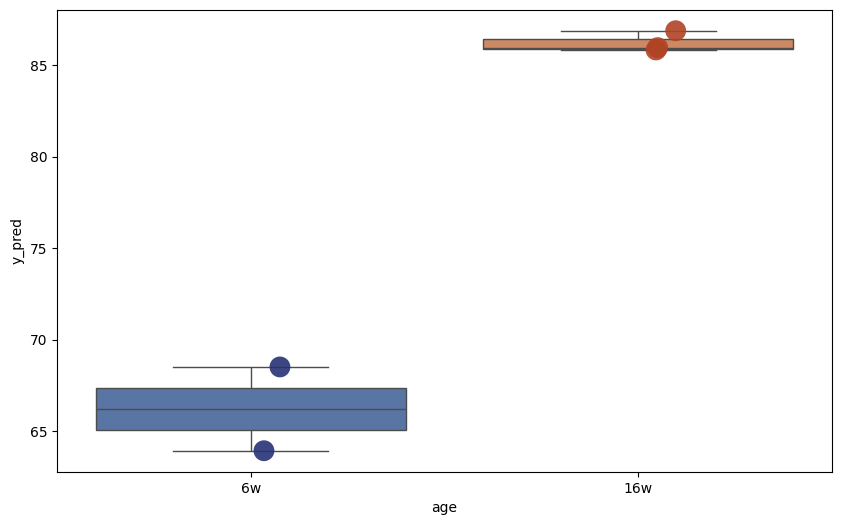

Components: 11
             y_pred
brain_8   58.748753
brain_7   67.036718
brain_19  85.223180
brain_18  83.598837
brain_16  89.418796
             y_pred  age
brain_8   58.748753   6w
brain_7   67.036718   6w
brain_19  85.223180  16w
brain_18  83.598837  16w
brain_16  89.418796  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


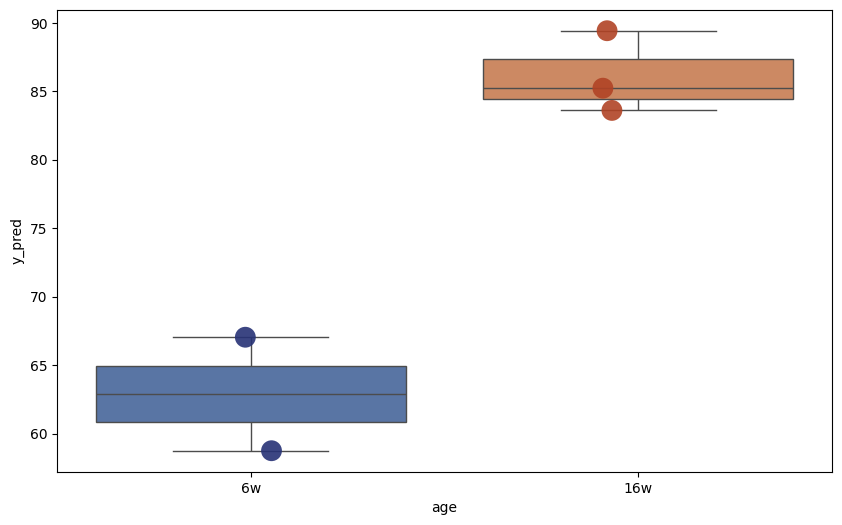

Components: 12
             y_pred
brain_8   56.594083
brain_7   66.288125
brain_19  83.583638
brain_18  82.526922
brain_16  90.339508
             y_pred  age
brain_8   56.594083   6w
brain_7   66.288125   6w
brain_19  83.583638  16w
brain_18  82.526922  16w
brain_16  90.339508  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


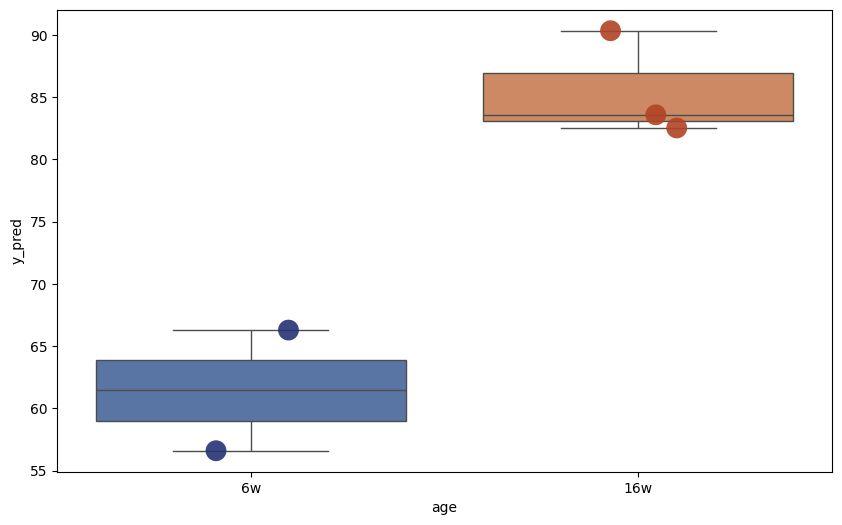

Components: 13
             y_pred
brain_8   56.405458
brain_7   65.994054
brain_19  84.432894
brain_18  82.710934
brain_16  90.639226
             y_pred  age
brain_8   56.405458   6w
brain_7   65.994054   6w
brain_19  84.432894  16w
brain_18  82.710934  16w
brain_16  90.639226  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


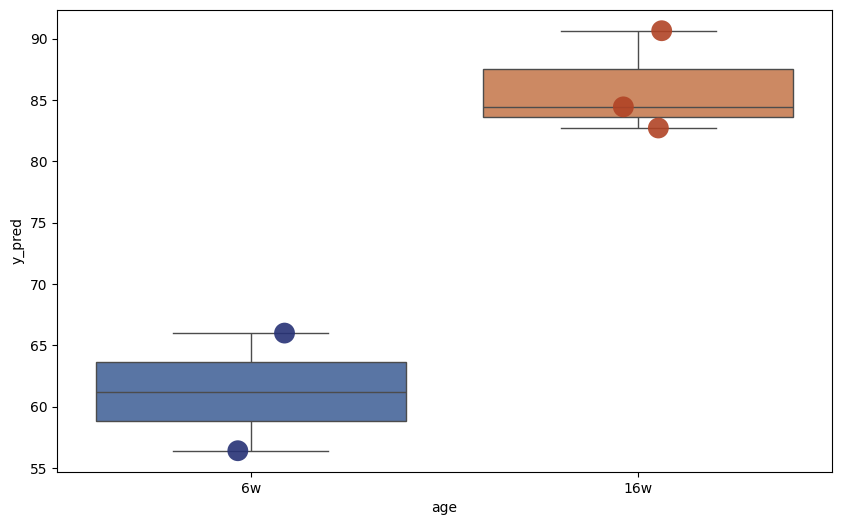

Components: 14
             y_pred
brain_8   56.571951
brain_7   66.147411
brain_19  84.026856
brain_18  82.844221
brain_16  90.764604
             y_pred  age
brain_8   56.571951   6w
brain_7   66.147411   6w
brain_19  84.026856  16w
brain_18  82.844221  16w
brain_16  90.764604  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


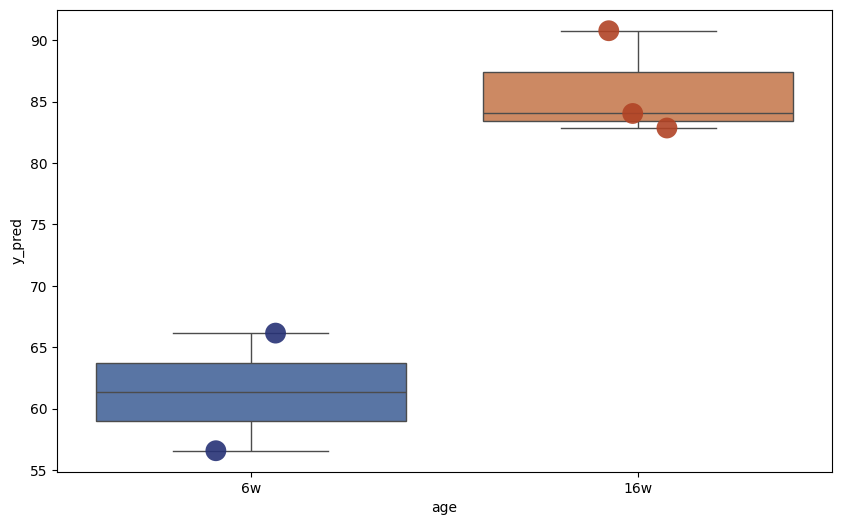

Components: 15
             y_pred
brain_8   56.568060
brain_7   65.127642
brain_19  83.955384
brain_18  83.035771
brain_16  91.324302
             y_pred  age
brain_8   56.568060   6w
brain_7   65.127642   6w
brain_19  83.955384  16w
brain_18  83.035771  16w
brain_16  91.324302  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


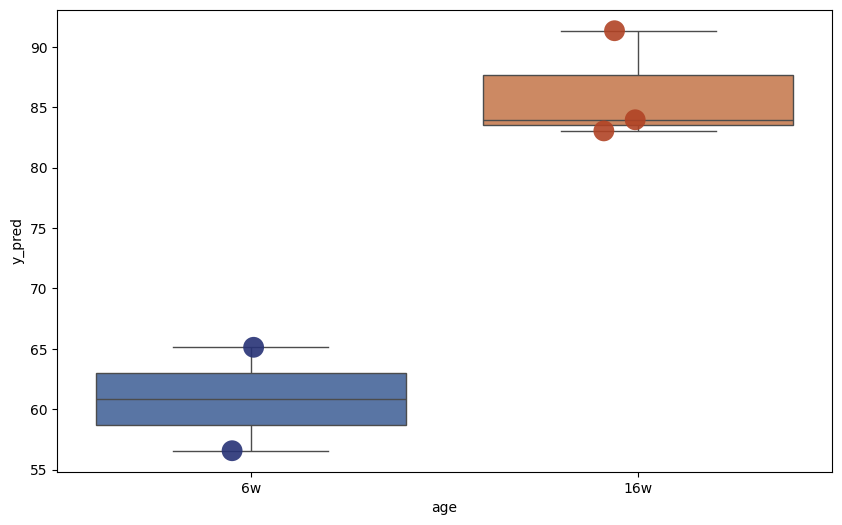

Components: 16
             y_pred
brain_8   56.389318
brain_7   64.877218
brain_19  81.659967
brain_18  82.862675
brain_16  90.695480
             y_pred  age
brain_8   56.389318   6w
brain_7   64.877218   6w
brain_19  81.659967  16w
brain_18  82.862675  16w
brain_16  90.695480  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


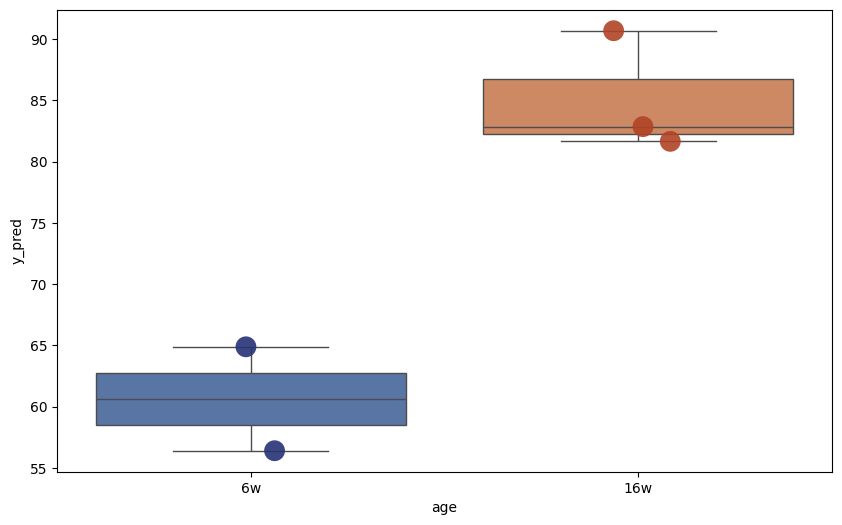

Components: 17
             y_pred
brain_8   56.419237
brain_7   64.937014
brain_19  81.630815
brain_18  82.744125
brain_16  90.707720
             y_pred  age
brain_8   56.419237   6w
brain_7   64.937014   6w
brain_19  81.630815  16w
brain_18  82.744125  16w
brain_16  90.707720  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


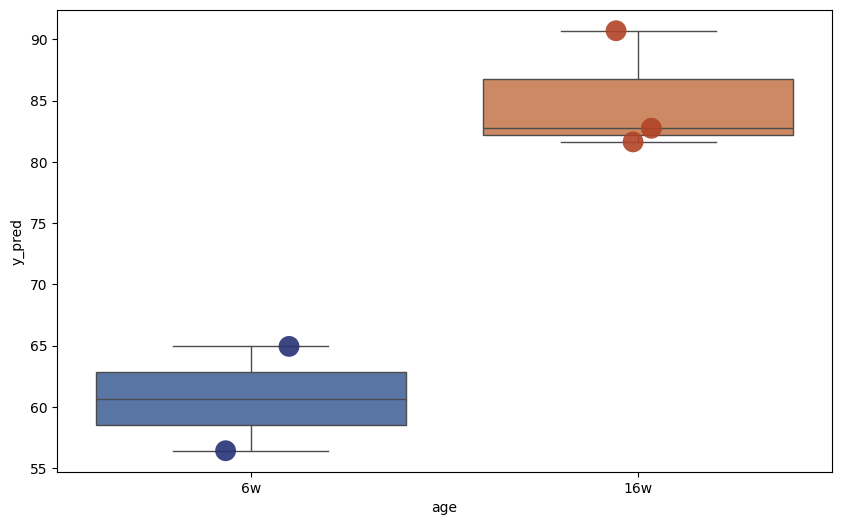

Components: 18
             y_pred
brain_8   57.035674
brain_7   65.605831
brain_19  84.922584
brain_18  84.866619
brain_16  92.339514
             y_pred  age
brain_8   57.035674   6w
brain_7   65.605831   6w
brain_19  84.922584  16w
brain_18  84.866619  16w
brain_16  92.339514  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


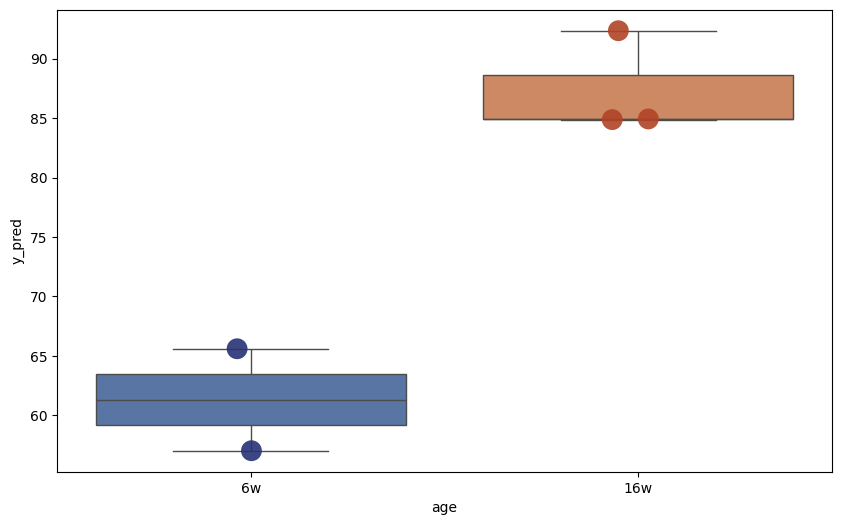

Components: 19
             y_pred
brain_8   57.858678
brain_7   67.122224
brain_19  85.393909
brain_18  86.820160
brain_16  92.707523
             y_pred  age
brain_8   57.858678   6w
brain_7   67.122224   6w
brain_19  85.393909  16w
brain_18  86.820160  16w
brain_16  92.707523  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


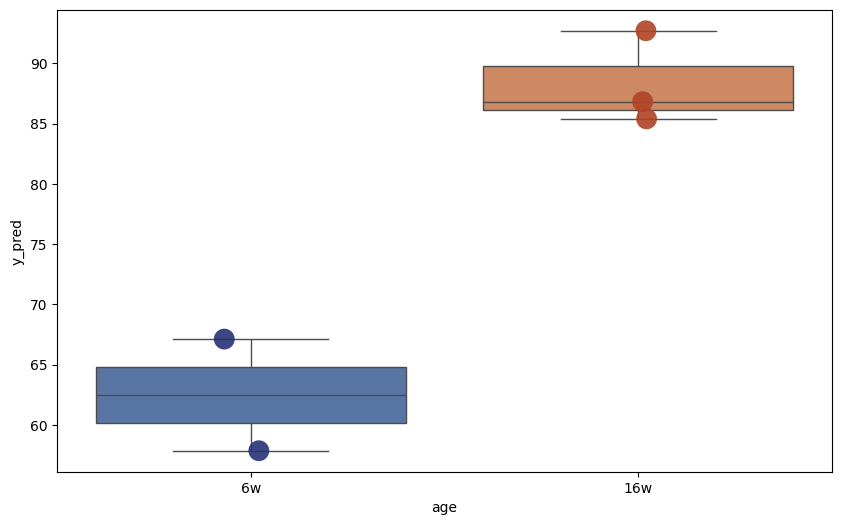

Components: 20
             y_pred
brain_8   56.498524
brain_7   65.459801
brain_19  82.514894
brain_18  83.648609
brain_16  92.219799
             y_pred  age
brain_8   56.498524   6w
brain_7   65.459801   6w
brain_19  82.514894  16w
brain_18  83.648609  16w
brain_16  92.219799  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


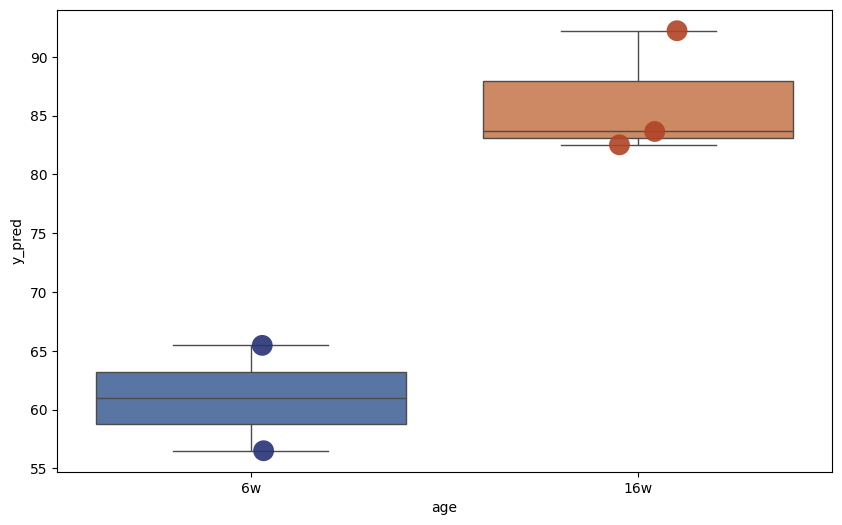

Components: 21
             y_pred
brain_8   56.420359
brain_7   65.141776
brain_19  82.812839
brain_18  83.301669
brain_16  92.228585
             y_pred  age
brain_8   56.420359   6w
brain_7   65.141776   6w
brain_19  82.812839  16w
brain_18  83.301669  16w
brain_16  92.228585  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


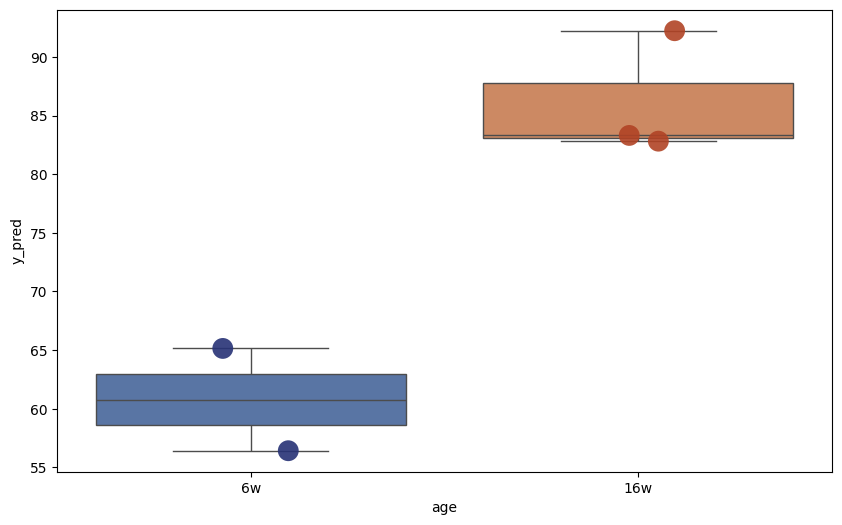

Components: 22
             y_pred
brain_8   55.910974
brain_7   64.736742
brain_19  82.358551
brain_18  82.455996
brain_16  91.842402
             y_pred  age
brain_8   55.910974   6w
brain_7   64.736742   6w
brain_19  82.358551  16w
brain_18  82.455996  16w
brain_16  91.842402  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


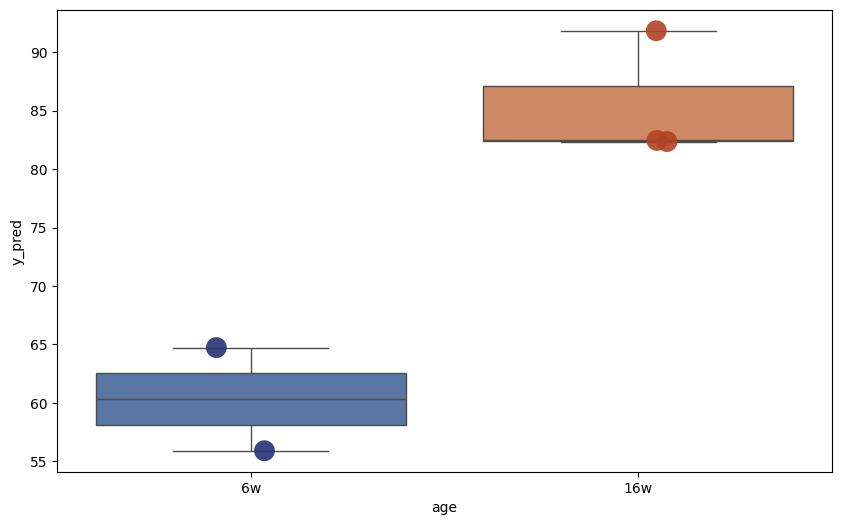

Components: 23
             y_pred
brain_8   55.877174
brain_7   64.950572
brain_19  82.369074
brain_18  82.404165
brain_16  91.955034
             y_pred  age
brain_8   55.877174   6w
brain_7   64.950572   6w
brain_19  82.369074  16w
brain_18  82.404165  16w
brain_16  91.955034  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


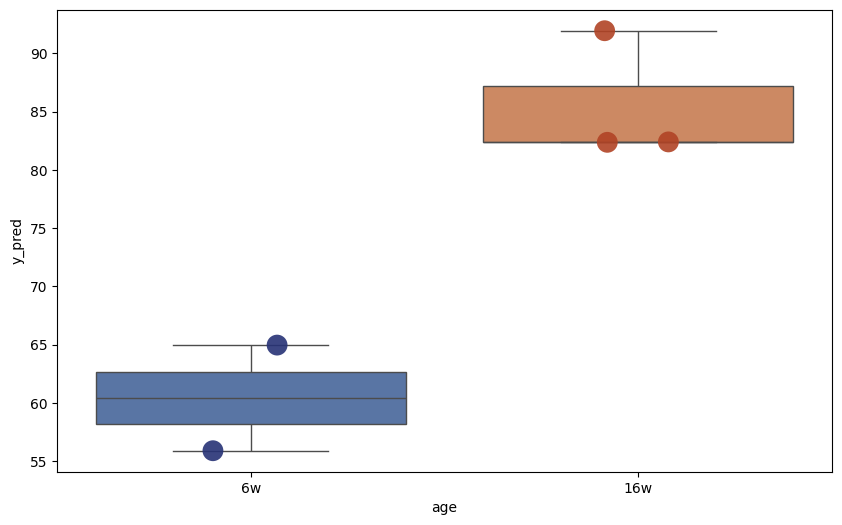

Components: 24
             y_pred
brain_8   55.738632
brain_7   65.282791
brain_19  83.203449
brain_18  82.579664
brain_16  92.188835
             y_pred  age
brain_8   55.738632   6w
brain_7   65.282791   6w
brain_19  83.203449  16w
brain_18  82.579664  16w
brain_16  92.188835  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


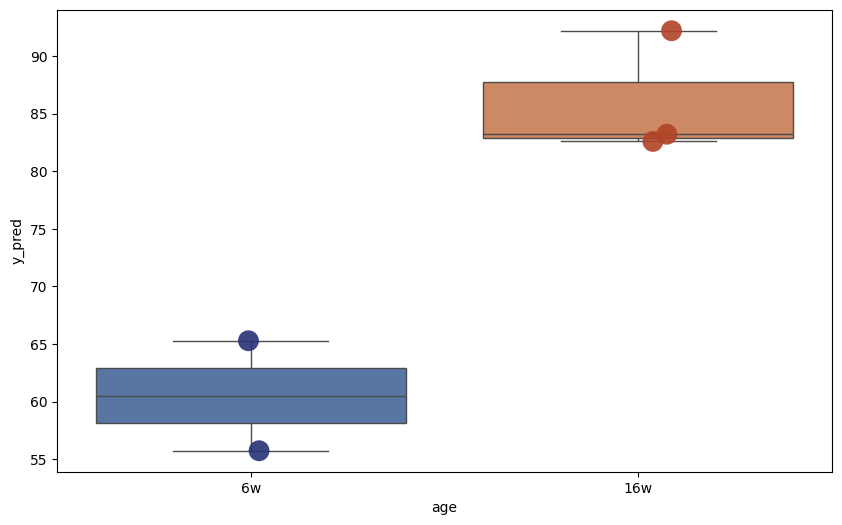

Components: 25
             y_pred
brain_8   55.762179
brain_7   65.340300
brain_19  83.120366
brain_18  82.595660
brain_16  92.154562
             y_pred  age
brain_8   55.762179   6w
brain_7   65.340300   6w
brain_19  83.120366  16w
brain_18  82.595660  16w
brain_16  92.154562  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


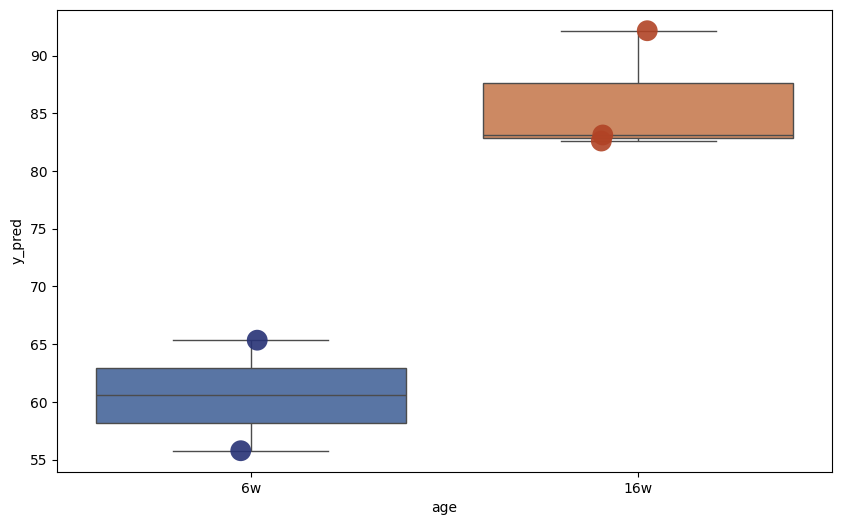

Components: 26
             y_pred
brain_8   56.115691
brain_7   65.230368
brain_19  83.438547
brain_18  82.651447
brain_16  92.182491
             y_pred  age
brain_8   56.115691   6w
brain_7   65.230368   6w
brain_19  83.438547  16w
brain_18  82.651447  16w
brain_16  92.182491  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


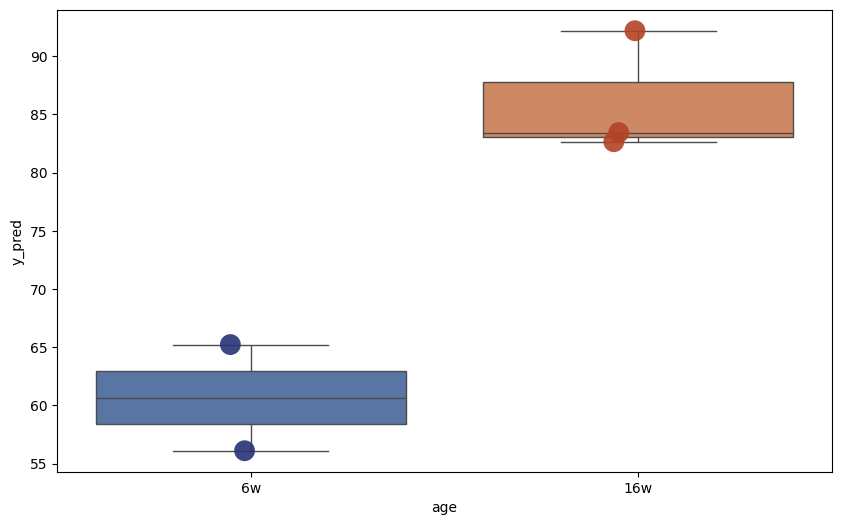

Components: 27
             y_pred
brain_8   56.116354
brain_7   65.230340
brain_19  83.440892
brain_18  82.657635
brain_16  92.181438
             y_pred  age
brain_8   56.116354   6w
brain_7   65.230340   6w
brain_19  83.440892  16w
brain_18  82.657635  16w
brain_16  92.181438  16w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


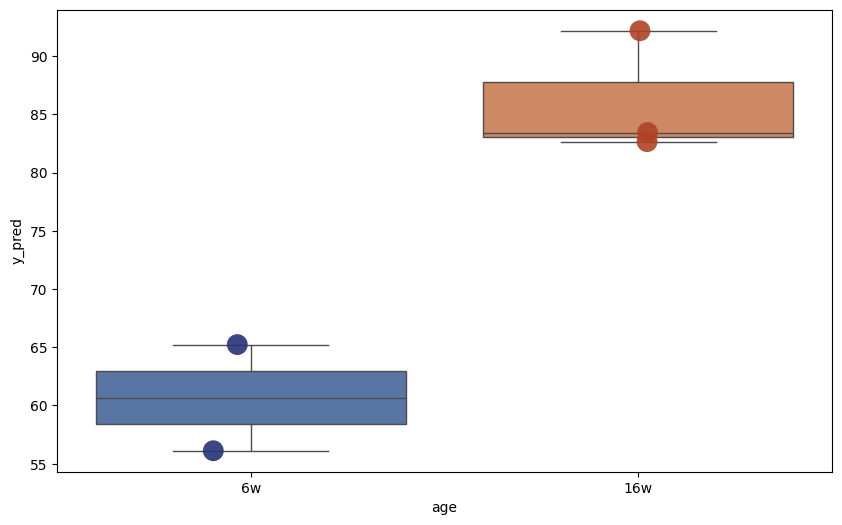

In [78]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_female.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_female["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [79]:
n_components = 11

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_female = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_female.index.tolist())

results_df_female["age"] = df_intervention_test_metadata_female["age"]

print(results_df_female)
results_df_female.to_csv("./AlanXu_brain_femaleOnly_Calibratedpredictions_11PCs_EC-250725.csv")

             y_pred  age
brain_8   58.748753   6w
brain_7   67.036718   6w
brain_19  85.223180  16w
brain_18  83.598837  16w
brain_16  89.418796  16w


##### Sample rotation

In [ ]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_female.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_female.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_female['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_female.drop(
            atlas_plus_intervention_female.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_female.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_female.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_female.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")


# Muscle

### Prep the data

In [80]:
select_tissue = "Muscle"
tissue_df_norm = df_norm_metadata.loc[df_norm_metadata.iloc[:,-2] == select_tissue]
tissue_df_norm.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609,M,Muscle,134
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021,M,Muscle,147
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966,M,Muscle,52
A16_1,1.631269,482.855494,84.825965,908.616589,363.772889,944.504497,885.778829,2233.206661,1295.227238,750.383538,...,138.657828,614.988248,8.156343,960.817183,1249.551718,107.663725,438.811243,F,Muscle,103
B13_1,1.771236,504.802247,99.189213,825.395955,480.004944,1013.146966,998.977078,2463.789213,981.264719,793.513708,...,123.986517,683.697078,8.856180,1225.695280,1712.785168,258.600449,356.018427,F,Muscle,155


In [81]:
tissue_df_norm_male = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "M"]
tissue_df_norm_female = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "F"]

tissue_df_norm_male.head(10)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609,M,Muscle,134
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021,M,Muscle,147
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966,M,Muscle,52
B15_1,9.285661,508.058322,78.264859,967.035292,348.875558,1122.238487,1540.093242,1349.073926,3329.572815,1822.642649,...,423.160848,902.035663,19.897846,687.138932,1776.214343,244.080238,241.427192,M,Muscle,102
B16_1,2.358013,544.700927,77.814418,811.156359,261.739406,1436.029716,929.056992,1794.447642,1973.656605,1058.747689,...,134.406722,728.625915,21.222114,839.452511,1494.980033,162.702874,282.961520,M,Muscle,133
C13_1,7.556002,332.464071,98.228021,758.118828,345.057407,916.794862,866.421517,2654.675231,647.297471,556.625452,...,133.489362,904.201526,2.518667,1251.777599,1410.453633,491.140104,352.613408,M,Muscle,134
C14_1,1.989282,525.170441,141.239020,728.077202,232.745991,909.101862,503.288339,1565.564913,913.080426,449.577726,...,105.431945,970.769603,85.539125,891.198324,1653.093320,415.759933,383.931421,M,Muscle,49
C16_1,32.931401,467.625900,221.738103,720.099977,469.821326,711.318270,632.282907,1475.326782,709.122843,564.224677,...,37.322255,979.160335,37.322255,1075.759112,1760.732261,340.291148,322.727734,M,Muscle,47
D14_1,5.346502,361.779947,94.454863,520.392829,315.443599,794.846582,646.926702,1678.801525,566.729177,504.353324,...,89.108361,607.719023,21.386007,921.380455,1660.979853,301.186261,290.493258,M,Muscle,103
D16_1,1.942716,561.445022,60.224206,948.045573,301.121032,1019.926077,771.258386,2490.562345,1371.557734,1140.374490,...,106.849399,763.487521,9.713582,874.222352,1414.297494,262.266706,371.058820,M,Muscle,152


In [82]:
tissue_df_norm_expression_male = tissue_df_norm_male.iloc[:,:-3]
tissue_df_norm_expression_female = tissue_df_norm_female.iloc[:,:-3]

tissue_df_norm_expression_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966
B15_1,9.285661,508.058322,78.264859,967.035292,348.875558,1122.238487,1540.093242,1349.073926,3329.572815,1822.642649,...,202.958024,102.142274,883.464341,423.160848,902.035663,19.897846,687.138932,1776.214343,244.080238,241.427192
B16_1,2.358013,544.700927,77.814418,811.156359,261.739406,1436.029716,929.056992,1794.447642,1973.656605,1058.747689,...,323.047736,87.246469,483.392597,134.406722,728.625915,21.222114,839.452511,1494.980033,162.702874,282.961520


In [83]:
tissue_pca_df_male = tissue_df_norm_expression_male.copy()
tissue_pca_df_female = tissue_df_norm_expression_female.copy()

tissue_pca_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966
B15_1,9.285661,508.058322,78.264859,967.035292,348.875558,1122.238487,1540.093242,1349.073926,3329.572815,1822.642649,...,202.958024,102.142274,883.464341,423.160848,902.035663,19.897846,687.138932,1776.214343,244.080238,241.427192
B16_1,2.358013,544.700927,77.814418,811.156359,261.739406,1436.029716,929.056992,1794.447642,1973.656605,1058.747689,...,323.047736,87.246469,483.392597,134.406722,728.625915,21.222114,839.452511,1494.980033,162.702874,282.961520


In [84]:
tissue_df_male_age = tissue_df_norm_expression_male.copy()
tissue_df_female_age = tissue_df_norm_expression_female.copy()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966


In [85]:
tissue_df_male_age["age"] = tissue_df_norm_male["age_days"].tolist()
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609,134
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021,147
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966,52


In [86]:
df_intervention = load_intervention_countdata(select_tissue)

df_intervention.head(5)

,Unnamed: 0,muscle_19,muscle_18,muscle_17,muscle_16,muscle_15,muscle_14,muscle_13,muscle_12,muscle_11,muscle_10,muscle_9,muscle_8,muscle_7,muscle_6,muscle_5,muscle_4,muscle_3,muscle_2,muscle_1
0,nadsyn1,66.433299,103.969816,90.104860,100.683910,83.784630,98.137717,61.731918,73.468377,76.799606,83.026927,115.317286,92.764969,130.539806,138.911607,84.235883,132.164531,95.681449,100.787544,79.278008
1,dnaja3,353.045530,365.627188,426.746627,368.215443,366.006541,418.504645,299.514121,359.010418,344.140008,261.996080,360.467319,324.677393,487.348608,411.178357,149.366720,299.435266,400.122425,329.102185,314.685153
2,f2r,7.592377,13.862642,12.514564,19.177888,13.229152,14.598999,9.145469,9.088871,19.442938,31.365728,4.838488,10.786624,7.735692,0.000000,6.947289,6.195212,11.307808,2.056889,14.561267
3,LOC107382877,17.082848,17.328303,5.005826,9.588944,6.614576,3.244222,2.286367,1.514812,17.498644,3.690086,33.869413,8.629299,0.000000,18.521548,36.473269,4.130142,8.698314,8.227555,11.325430
4,fezf1,7.592377,3.465661,0.000000,1.917789,2.204859,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.739663,0.000000,1.617919


In [87]:
df_intervention.rename(columns={"Unnamed: 0": "Sample.Name"}, inplace=True)
df_intervention.set_index("Sample.Name", inplace=True)
df_intervention.head(3)

,muscle_19,muscle_18,muscle_17,muscle_16,muscle_15,muscle_14,muscle_13,muscle_12,muscle_11,muscle_10,muscle_9,muscle_8,muscle_7,muscle_6,muscle_5,muscle_4,muscle_3,muscle_2,muscle_1
Sample.Name,,,,,,,,,,,,,,,,,,,
nadsyn1,66.433299,103.969816,90.104860,100.683910,83.784630,98.137717,61.731918,73.468377,76.799606,83.026927,115.317286,92.764969,130.539806,138.911607,84.235883,132.164531,95.681449,100.787544,79.278008
dnaja3,353.045530,365.627188,426.746627,368.215443,366.006541,418.504645,299.514121,359.010418,344.140008,261.996080,360.467319,324.677393,487.348608,411.178357,149.366720,299.435266,400.122425,329.102185,314.685153
f2r,7.592377,13.862642,12.514564,19.177888,13.229152,14.598999,9.145469,9.088871,19.442938,31.365728,4.838488,10.786624,7.735692,0.000000,6.947289,6.195212,11.307808,2.056889,14.561267


In [88]:
df_intervention = df_intervention.T

df_intervention.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,3.796188,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,1.732830,232.199257,0.0,3.465661,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,15.017477,270.314579,0.0,10.011651,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168


In [89]:
df_intervention_age = df_intervention.copy()

In [90]:
df_intervention_metadata = load_intervention_metadata(select_tissue)
df_intervention_metadata.set_index("Sample.Name", inplace=True)
print(df_intervention_metadata.head(1))

                     Run age Assay.Type  AvgSpotLen       Bases  \
Sample.Name                                                       
brain_10     SRR24062662  6w    RNA-Seq         300  3489947700   

                   BIOMATERIAL_PROVIDER   BioProject     BioSample  \
Sample.Name                                                          
brain_10     Dario Valenzano laboratory  PRJNA952180  SAMN34067642   

                       BioSampleModel       Bytes  ...           create_date  \
Sample.Name                                        ...                         
brain_10     Model organism or animal  1264822394  ...  2023-04-04T11:25:00Z   

            version                  Sample_info     sex  SRA.Study  strain  \
Sample.Name                                                                   
brain_10          1  GRZ-AD_8239_6w_Female_Brain  female  SRP430823  GRZ-AD   

            tissue                       file          lib UsedForTraining  
Sample.Name                    

In [91]:
df_intervention_metadata = df_intervention_metadata[df_intervention_metadata["tissue"] == select_tissue]

df_intervention_metadata.head(5)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_19,SRR24062685,16w,RNA-Seq,300,5136081600,Dario Valenzano laboratory,PRJNA952180,SAMN34067691,Model organism or animal,1851655279,...,2023-04-04T11:27:00Z,1,GRZ-AD_8241_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062685.featureCounts,SRR24062685,No
muscle_18,SRR24062686,16w,RNA-Seq,300,5706151500,Dario Valenzano laboratory,PRJNA952180,SAMN34067690,Model organism or animal,2090590736,...,2023-04-04T11:31:00Z,1,GRZ-AD_8232_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062686.featureCounts,SRR24062686,No
muscle_17,SRR24062687,16w,RNA-Seq,300,4272510600,Dario Valenzano laboratory,PRJNA952180,SAMN34067689,Model organism or animal,1545160147,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062687.featureCounts,SRR24062687,No
muscle_16,SRR24062688,16w,RNA-Seq,300,5033795700,Dario Valenzano laboratory,PRJNA952180,SAMN34067688,Model organism or animal,1824875900,...,2023-04-04T11:29:00Z,1,GRZ-AD_8249_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062688.featureCounts,SRR24062688,No
muscle_15,SRR24062689,16w,RNA-Seq,300,5424135600,Dario Valenzano laboratory,PRJNA952180,SAMN34067687,Model organism or animal,1977691831,...,2023-04-04T11:29:00Z,1,GRZ-AD_8225_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062689.featureCounts,SRR24062689,No


In [92]:
df_intervention_age = df_intervention_age.loc[df_intervention_metadata.index.tolist(),]

df_intervention_age.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,3.796188,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,1.732830,232.199257,0.0,3.465661,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,15.017477,270.314579,0.0,10.011651,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168
muscle_16,100.683910,368.215443,19.177888,9.588944,1.917789,20.136782,0.0,0.0,59.451452,144.793052,...,9.588944,255.065906,0.0,3.835578,0.000000,63.287029,34.520198,1105.605224,466.022670,49.862508
muscle_15,83.784630,366.006541,13.229152,6.614576,2.204859,33.072880,0.0,0.0,97.013782,145.520673,...,8.819435,246.944172,0.0,4.409717,0.000000,50.711750,33.072880,1316.300633,474.044616,90.399206


In [93]:
df_intervention_age["tissue"] = df_intervention_metadata["tissue"].tolist()
df_intervention_age["og_age"] = df_intervention_metadata["age"].tolist()
df_intervention_age["sex"] = df_intervention_metadata["sex"].tolist()

age_mapping = {
    "6w": 42,
    "16w": 112
}

df_intervention_age["age"] = df_intervention_age["og_age"].map(age_mapping)

df_intervention_age.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,Muscle,16w,female,112
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417,Muscle,16w,female,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168,Muscle,16w,female,112


In [94]:
df_intervention_age_counts = df_intervention_age.iloc[:,:-4]

df_intervention_age_counts.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,3.796188,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,1.732830,232.199257,0.0,3.465661,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,15.017477,270.314579,0.0,10.011651,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168
muscle_16,100.683910,368.215443,19.177888,9.588944,1.917789,20.136782,0.0,0.0,59.451452,144.793052,...,9.588944,255.065906,0.0,3.835578,0.000000,63.287029,34.520198,1105.605224,466.022670,49.862508
muscle_15,83.784630,366.006541,13.229152,6.614576,2.204859,33.072880,0.0,0.0,97.013782,145.520673,...,8.819435,246.944172,0.0,4.409717,0.000000,50.711750,33.072880,1316.300633,474.044616,90.399206


##### Female data prep

In [95]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_counts_female = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_female = df_intervention_age_counts_female.loc[
    df_intervention_age_counts_female.index.isin(female_samples)
]

df_intervention_age_counts_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,3.796188,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,1.732830,232.199257,0.0,3.465661,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,15.017477,270.314579,0.0,10.011651,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168


In [96]:
df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_19,SRR24062685,16w,RNA-Seq,300,5136081600,Dario Valenzano laboratory,PRJNA952180,SAMN34067691,Model organism or animal,1851655279,...,2023-04-04T11:27:00Z,1,GRZ-AD_8241_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062685.featureCounts,SRR24062685,No
muscle_18,SRR24062686,16w,RNA-Seq,300,5706151500,Dario Valenzano laboratory,PRJNA952180,SAMN34067690,Model organism or animal,2090590736,...,2023-04-04T11:31:00Z,1,GRZ-AD_8232_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062686.featureCounts,SRR24062686,No
muscle_17,SRR24062687,16w,RNA-Seq,300,4272510600,Dario Valenzano laboratory,PRJNA952180,SAMN34067689,Model organism or animal,1545160147,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062687.featureCounts,SRR24062687,No


In [97]:
# df_intervention_age_tissue_counts_freq_female = df_intervention_age_tissue_counts_female.iloc[:,:-3]

# df_intervention_age_tissue_counts_freq_female = df_intervention_age_tissue_counts_freq_female.div(df_intervention_age_tissue_counts_freq_female.sum(axis=1), axis=0)

# df_intervention_age_tissue_counts_freq_female.head(5)

##### Male data prep

In [98]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_14,98.137717,418.504645,14.598999,3.244222,0.0,21.087443,0.0,0.0,103.815106,148.423159,...,1.622111,205.197045,0.0,0.000000,0.0,32.442221,48.663331,1270.923990,355.242315,80.294496
muscle_13,61.731918,299.514121,9.145469,2.286367,0.0,25.150041,0.0,0.0,70.877387,173.763917,...,5.715918,169.191183,0.0,4.572735,0.0,43.440979,52.586449,1404.972726,554.444078,34.295510
muscle_12,73.468377,359.010418,9.088871,1.514812,0.0,22.722178,0.0,0.0,81.799842,146.936753,...,34.840673,187.836674,0.0,101.492397,0.0,28.781426,37.870297,1383.023256,424.904735,80.285030


In [99]:
df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_14,SRR24062690,16w,RNA-Seq,300,5827574700,Dario Valenzano laboratory,PRJNA952180,SAMN34067686,Model organism or animal,2119267742,...,2023-04-04T11:31:00Z,1,GRZ-AD_8244_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062690.featureCounts,SRR24062690,No
muscle_13,SRR24062691,16w,RNA-Seq,300,4604019600,Dario Valenzano laboratory,PRJNA952180,SAMN34067685,Model organism or animal,1678346997,...,2023-04-04T11:28:00Z,1,GRZ-AD_8245_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062691.featureCounts,SRR24062691,No
muscle_12,SRR24062692,16w,RNA-Seq,300,6163919700,Dario Valenzano laboratory,PRJNA952180,SAMN34067684,Model organism or animal,2231485378,...,2023-04-04T11:32:00Z,1,GRZ-AD_8222_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062692.featureCounts,SRR24062692,No


In [100]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [101]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966
B15_1,9.285661,508.058322,78.264859,967.035292,348.875558,1122.238487,1540.093242,1349.073926,3329.572815,1822.642649,...,202.958024,102.142274,883.464341,423.160848,902.035663,19.897846,687.138932,1776.214343,244.080238,241.427192
B16_1,2.358013,544.700927,77.814418,811.156359,261.739406,1436.029716,929.056992,1794.447642,1973.656605,1058.747689,...,323.047736,87.246469,483.392597,134.406722,728.625915,21.222114,839.452511,1494.980033,162.702874,282.961520


In [102]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
muscle_14,1.622111,34.064332,15.410055,35.686443,30.820110,152.478437,163.833214,159.777936,98.948773,42.174887,...,115.169883,7.299500,429.859422,16.221110,85.160829,0.000000,241.694543,138.690493,857.285678,247.371932
muscle_13,13.718204,64.018285,2.286367,57.159183,27.436408,134.895673,164.618448,156.616162,116.604734,38.868245,...,149.757060,4.572735,516.719017,13.718204,96.027428,0.000000,208.059427,193.198040,634.466935,173.763917
muscle_12,153.753407,37.870297,59.835070,34.840673,24.236990,186.321863,132.546040,187.836674,105.279426,39.385109,...,141.634912,6.059248,398.395527,28.781426,118.155327,3.029624,231.008813,134.060852,556.693370,261.305051
muscle_11,40.830170,33.052995,25.275820,75.827459,30.136554,171.097857,153.599213,162.348535,141.933450,29.164407,...,188.596502,6.805028,521.070747,27.220114,122.490511,1.944294,178.875032,147.766331,464.686226,314.975601
muscle_10,1.845043,37.823378,16.605385,33.210771,23.985557,210.334881,139.300733,221.405138,136.533169,57.196327,...,216.792531,11.070257,414.212113,23.985557,153.138554,0.000000,270.298773,156.828640,623.624473,250.003302


### Sex-Combined

In [103]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_norm.columns.intersection(df_intervention.columns)

# Select only the common columns from both DataFrames
tissue_df_norm_common = tissue_df_norm[common_columns]
df_intervention_common = df_intervention[common_columns]

In [104]:
tissue_df_norm_common.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966


In [105]:
df_intervention_common.head(3)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
muscle_19,3.796188,39.859979,3.796188,72.127581,20.879037,155.643728,176.522765,58.840922,119.579938,30.369508,...,134.764692,10.439518,567.530181,38.910932,66.433299,1.898094,251.497488,186.013236,930.066182,241.057970
muscle_18,11.263397,46.786417,25.992454,111.767553,17.328303,145.557743,154.221894,116.099628,133.427931,22.526794,...,172.416612,10.396982,436.673229,17.328303,67.580381,0.000000,191.477745,109.168307,558.837763,256.458880
muscle_17,17.520389,30.034953,22.526215,65.075732,40.046604,170.198068,177.706807,121.391269,117.636900,35.040779,...,147.671853,12.514564,503.085467,35.040779,105.122336,2.502913,247.788364,135.157290,704.569945,315.367009


In [106]:
age = tissue_df_norm['age_days']
X = tissue_df_norm_common.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_common.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)

# Initialize lists to store results
train_results = []

(55, 25121)


##### Calibration

In [107]:
all_samples = df_intervention_age.index
all_samples

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417,Muscle,16w,female,112
muscle_13,61.731918,299.514121,9.145469,2.286367,0.000000,25.150041,0.0,0.0,70.877387,173.763917,...,0.000000,43.440979,52.586449,1404.972726,554.444078,34.295510,Muscle,16w,male,112
muscle_9,115.317286,360.467319,4.838488,33.869413,0.000000,54.029777,0.0,0.0,100.801823,77.415800,...,3.225658,17.741121,5.644902,1347.518770,435.463876,72.577313,Muscle,6w,female,42


In [108]:
df_intervention_train = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,232.199257,0.0,3.465661,0.0,97.904910,41.587927,1173.992510,473.929080,46.786417,112
muscle_13,61.731918,299.514121,9.145469,2.286367,0.000000,25.150041,0.0,0.0,70.877387,173.763917,...,169.191183,0.0,4.572735,0.0,43.440979,52.586449,1404.972726,554.444078,34.295510,112


In [109]:
tissue_df_age = tissue_df_norm.drop(tissue_df_norm.columns[[-2,-3]], axis=1)
tissue_df_age = tissue_df_age.rename(columns={'age_days': 'age'})
tissue_df_age.head(1)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,51.719861,1036.74812,96.387013,883.93944,14.105417,1288.294716,1539.841312,298.564651,347.933609,134


In [110]:
#combine the dataframes
atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train], axis=0)

atlas_plus_intervention.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609,134
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021,147
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966,52


In [111]:
#all not in select_train_samples
test_samples = [s for s in all_samples if s not in select_train_samples]
test_samples

['muscle_19',
 'muscle_17',
 'muscle_16',
 'muscle_15',
 'muscle_14',
 'muscle_12',
 'muscle_11',
 'muscle_10',
 'muscle_8',
 'muscle_7',
 'muscle_6',
 'muscle_4',
 'muscle_3',
 'muscle_2',
 'muscle_1']

In [112]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test = df_intervention_age.loc[
    df_intervention_age.index.isin(test_samples)
]

df_intervention_test.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,Muscle,16w,female,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168,Muscle,16w,female,112
muscle_16,100.683910,368.215443,19.177888,9.588944,1.917789,20.136782,0.0,0.0,59.451452,144.793052,...,0.000000,63.287029,34.520198,1105.605224,466.022670,49.862508,Muscle,16w,female,112


In [113]:
df_intervention_test = df_intervention_test.drop(df_intervention_test.columns[[-2,-3, -4]], axis=1)
df_intervention_test.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,270.314579,0.0,10.011651,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168,112


In [114]:
#check cols ordered the same
df_intervention_test = df_intervention_test[atlas_plus_intervention.columns]

In [115]:
#subset your metadata
df_intervention_test_metadata = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(test_samples)
]

df_intervention_test_metadata.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_19,SRR24062685,16w,RNA-Seq,300,5136081600,Dario Valenzano laboratory,PRJNA952180,SAMN34067691,Model organism or animal,1851655279,...,2023-04-04T11:27:00Z,1,GRZ-AD_8241_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062685.featureCounts,SRR24062685,No
muscle_17,SRR24062687,16w,RNA-Seq,300,4272510600,Dario Valenzano laboratory,PRJNA952180,SAMN34067689,Model organism or animal,1545160147,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062687.featureCounts,SRR24062687,No
muscle_16,SRR24062688,16w,RNA-Seq,300,5033795700,Dario Valenzano laboratory,PRJNA952180,SAMN34067688,Model organism or animal,1824875900,...,2023-04-04T11:29:00Z,1,GRZ-AD_8249_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062688.featureCounts,SRR24062688,No


In [116]:
age = atlas_plus_intervention['age']
X = atlas_plus_intervention.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(59, 25122)
(15, 25122)


Components: 1
              y_pred
muscle_19  69.185307
muscle_17  69.313067
muscle_16  69.312119
muscle_15  69.243471
muscle_14  69.430559
muscle_12  69.484594
muscle_11  69.527568
muscle_10  69.410520
muscle_8   69.418700
muscle_7   69.497076
muscle_6   69.873414
muscle_4   69.428081
muscle_3   69.576967
muscle_2   69.571564
muscle_1   69.610067
              y_pred  age
muscle_19  69.185307  16w
muscle_17  69.313067  16w
muscle_16  69.312119  16w
muscle_15  69.243471  16w
muscle_14  69.430559  16w
muscle_12  69.484594  16w
muscle_11  69.527568  16w
muscle_10  69.410520  16w
muscle_8   69.418700   6w
muscle_7   69.497076   6w
muscle_6   69.873414   6w
muscle_4   69.428081   6w
muscle_3   69.576967   6w
muscle_2   69.571564   6w
muscle_1   69.610067   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


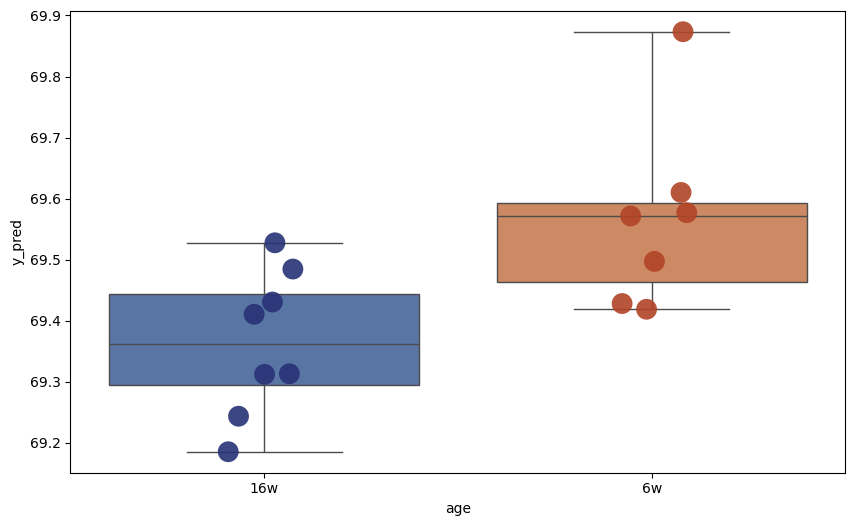

Components: 2
              y_pred
muscle_19  74.275825
muscle_17  71.667398
muscle_16  73.606005
muscle_15  70.911414
muscle_14  77.281707
muscle_12  75.592663
muscle_11  74.978575
muscle_10  75.684487
muscle_8   67.086002
muscle_7   66.292219
muscle_6   65.098781
muscle_4   67.403630
muscle_3   67.385210
muscle_2   66.882866
muscle_1   65.469892
              y_pred  age
muscle_19  74.275825  16w
muscle_17  71.667398  16w
muscle_16  73.606005  16w
muscle_15  70.911414  16w
muscle_14  77.281707  16w
muscle_12  75.592663  16w
muscle_11  74.978575  16w
muscle_10  75.684487  16w
muscle_8   67.086002   6w
muscle_7   66.292219   6w
muscle_6   65.098781   6w
muscle_4   67.403630   6w
muscle_3   67.385210   6w
muscle_2   66.882866   6w
muscle_1   65.469892   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


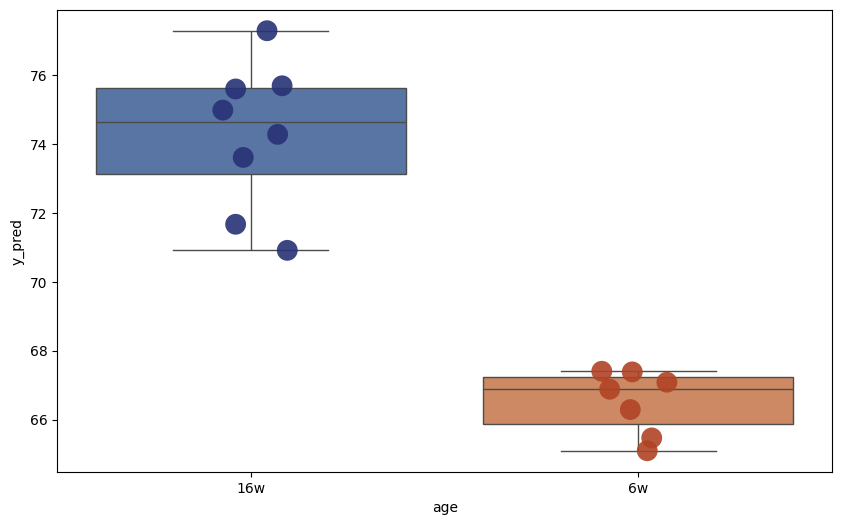

Components: 3
              y_pred
muscle_19  87.367512
muscle_17  84.058204
muscle_16  86.402698
muscle_15  82.166929
muscle_14  90.465652
muscle_12  88.559851
muscle_11  87.980172
muscle_10  90.217086
muscle_8   73.911101
muscle_7   73.525440
muscle_6   73.837029
muscle_4   74.969948
muscle_3   75.202758
muscle_2   73.387834
muscle_1   71.878677
              y_pred  age
muscle_19  87.367512  16w
muscle_17  84.058204  16w
muscle_16  86.402698  16w
muscle_15  82.166929  16w
muscle_14  90.465652  16w
muscle_12  88.559851  16w
muscle_11  87.980172  16w
muscle_10  90.217086  16w
muscle_8   73.911101   6w
muscle_7   73.525440   6w
muscle_6   73.837029   6w
muscle_4   74.969948   6w
muscle_3   75.202758   6w
muscle_2   73.387834   6w
muscle_1   71.878677   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


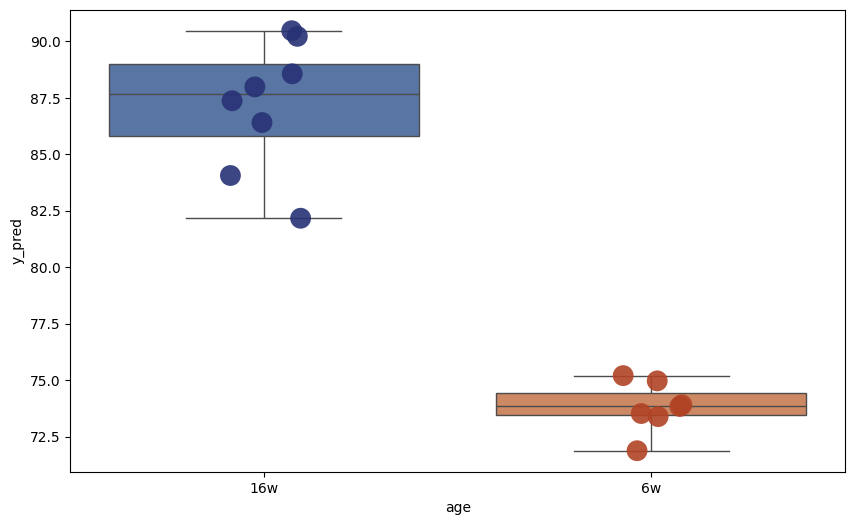

Components: 4
              y_pred
muscle_19  88.045160
muscle_17  84.993366
muscle_16  87.114625
muscle_15  82.997858
muscle_14  90.902951
muscle_12  88.957671
muscle_11  88.376436
muscle_10  90.601320
muscle_8   74.476103
muscle_7   74.259131
muscle_6   74.877080
muscle_4   76.042868
muscle_3   76.038918
muscle_2   74.482378
muscle_1   72.801199
              y_pred  age
muscle_19  88.045160  16w
muscle_17  84.993366  16w
muscle_16  87.114625  16w
muscle_15  82.997858  16w
muscle_14  90.902951  16w
muscle_12  88.957671  16w
muscle_11  88.376436  16w
muscle_10  90.601320  16w
muscle_8   74.476103   6w
muscle_7   74.259131   6w
muscle_6   74.877080   6w
muscle_4   76.042868   6w
muscle_3   76.038918   6w
muscle_2   74.482378   6w
muscle_1   72.801199   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


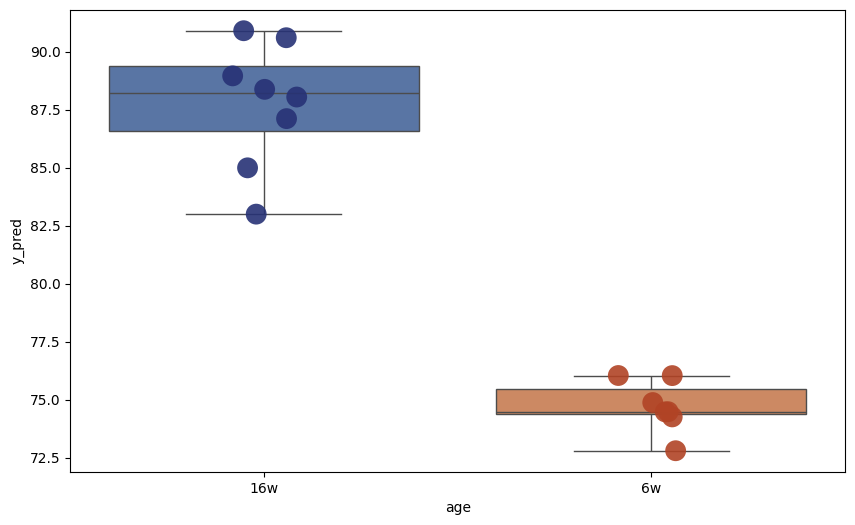

Components: 5
              y_pred
muscle_19  85.395196
muscle_17  84.518508
muscle_16  86.433902
muscle_15  81.335321
muscle_14  89.087637
muscle_12  86.345152
muscle_11  87.119978
muscle_10  90.326624
muscle_8   74.539572
muscle_7   74.472369
muscle_6   72.310920
muscle_4   75.688170
muscle_3   75.993232
muscle_2   74.326636
muscle_1   72.191474
              y_pred  age
muscle_19  85.395196  16w
muscle_17  84.518508  16w
muscle_16  86.433902  16w
muscle_15  81.335321  16w
muscle_14  89.087637  16w
muscle_12  86.345152  16w
muscle_11  87.119978  16w
muscle_10  90.326624  16w
muscle_8   74.539572   6w
muscle_7   74.472369   6w
muscle_6   72.310920   6w
muscle_4   75.688170   6w
muscle_3   75.993232   6w
muscle_2   74.326636   6w
muscle_1   72.191474   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


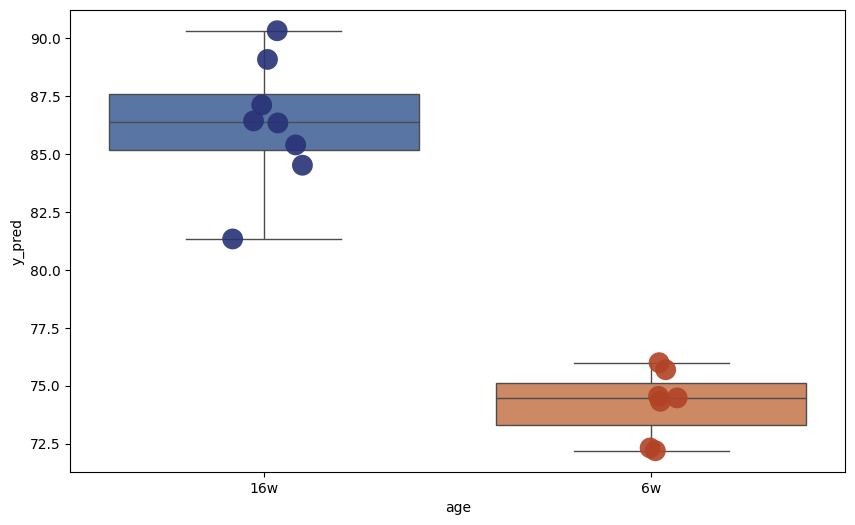

Components: 6
              y_pred
muscle_19  85.405604
muscle_17  84.562671
muscle_16  86.460313
muscle_15  81.367624
muscle_14  89.050017
muscle_12  86.371546
muscle_11  87.122648
muscle_10  90.309216
muscle_8   74.614803
muscle_7   74.523584
muscle_6   72.366842
muscle_4   75.796196
muscle_3   76.074673
muscle_2   74.435594
muscle_1   72.281622
              y_pred  age
muscle_19  85.405604  16w
muscle_17  84.562671  16w
muscle_16  86.460313  16w
muscle_15  81.367624  16w
muscle_14  89.050017  16w
muscle_12  86.371546  16w
muscle_11  87.122648  16w
muscle_10  90.309216  16w
muscle_8   74.614803   6w
muscle_7   74.523584   6w
muscle_6   72.366842   6w
muscle_4   75.796196   6w
muscle_3   76.074673   6w
muscle_2   74.435594   6w
muscle_1   72.281622   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


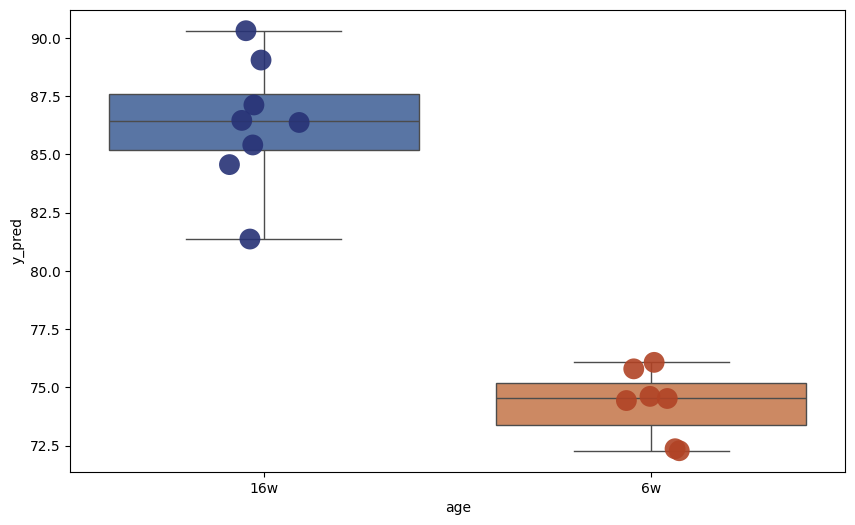

Components: 7
              y_pred
muscle_19  86.055592
muscle_17  85.292538
muscle_16  87.122817
muscle_15  81.955120
muscle_14  89.721228
muscle_12  86.986534
muscle_11  87.602343
muscle_10  90.893127
muscle_8   75.240579
muscle_7   75.502279
muscle_6   72.992664
muscle_4   76.905396
muscle_3   77.189292
muscle_2   75.489911
muscle_1   72.928490
              y_pred  age
muscle_19  86.055592  16w
muscle_17  85.292538  16w
muscle_16  87.122817  16w
muscle_15  81.955120  16w
muscle_14  89.721228  16w
muscle_12  86.986534  16w
muscle_11  87.602343  16w
muscle_10  90.893127  16w
muscle_8   75.240579   6w
muscle_7   75.502279   6w
muscle_6   72.992664   6w
muscle_4   76.905396   6w
muscle_3   77.189292   6w
muscle_2   75.489911   6w
muscle_1   72.928490   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


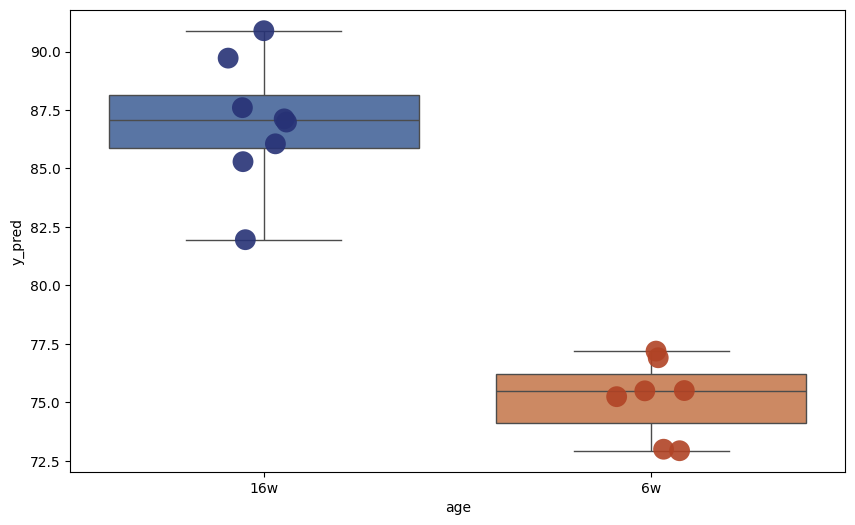

Components: 8
              y_pred
muscle_19  86.302836
muscle_17  85.434191
muscle_16  87.298570
muscle_15  81.956628
muscle_14  89.749505
muscle_12  86.759297
muscle_11  87.389345
muscle_10  90.882828
muscle_8   75.649832
muscle_7   75.954121
muscle_6   73.256295
muscle_4   77.389846
muscle_3   77.559467
muscle_2   75.990122
muscle_1   73.094960
              y_pred  age
muscle_19  86.302836  16w
muscle_17  85.434191  16w
muscle_16  87.298570  16w
muscle_15  81.956628  16w
muscle_14  89.749505  16w
muscle_12  86.759297  16w
muscle_11  87.389345  16w
muscle_10  90.882828  16w
muscle_8   75.649832   6w
muscle_7   75.954121   6w
muscle_6   73.256295   6w
muscle_4   77.389846   6w
muscle_3   77.559467   6w
muscle_2   75.990122   6w
muscle_1   73.094960   6w


/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48699613/ipykernel_5046/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


KeyboardInterrupt: 

In [117]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [118]:
n_components = 14

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test.index.tolist())

results_df["age"] = df_intervention_test_metadata["age"]

print(results_df)
results_df.to_csv("./AlanXu_muscle_sexcombo_Calibratedpredictions_14PCs_EC-250725.csv")

              y_pred  age
muscle_19  85.554953  16w
muscle_17  87.625431  16w
muscle_16  89.303966  16w
muscle_15  84.032044  16w
muscle_14  91.142758  16w
muscle_12  90.191751  16w
muscle_11  88.936577  16w
muscle_10  92.883061  16w
muscle_8   75.493450   6w
muscle_7   75.164363   6w
muscle_6   72.617355   6w
muscle_4   76.017332   6w
muscle_3   76.601851   6w
muscle_2   75.518172   6w
muscle_1   72.081210   6w


In [ ]:
##### Sample rotation

In [141]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [142]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention.drop(
            atlas_plus_intervention.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/1620] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_18
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/1620] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_17
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/1620] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_16
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/1620] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_15
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 1

### Male

In [119]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
muscle_14,98.137717,418.504645,14.598999,3.244222,0.0,21.087443,0.0,0.0,103.815106,148.423159,...,1.622111,205.197045,0.0,0.000000,0.0,32.442221,48.663331,1270.923990,355.242315,80.294496
muscle_13,61.731918,299.514121,9.145469,2.286367,0.0,25.150041,0.0,0.0,70.877387,173.763917,...,5.715918,169.191183,0.0,4.572735,0.0,43.440979,52.586449,1404.972726,554.444078,34.295510
muscle_12,73.468377,359.010418,9.088871,1.514812,0.0,22.722178,0.0,0.0,81.799842,146.936753,...,34.840673,187.836674,0.0,101.492397,0.0,28.781426,37.870297,1383.023256,424.904735,80.285030


In [121]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_14,SRR24062690,16w,RNA-Seq,300,5827574700,Dario Valenzano laboratory,PRJNA952180,SAMN34067686,Model organism or animal,2119267742,...,2023-04-04T11:31:00Z,1,GRZ-AD_8244_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062690.featureCounts,SRR24062690,No
muscle_13,SRR24062691,16w,RNA-Seq,300,4604019600,Dario Valenzano laboratory,PRJNA952180,SAMN34067685,Model organism or animal,1678346997,...,2023-04-04T11:28:00Z,1,GRZ-AD_8245_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062691.featureCounts,SRR24062691,No
muscle_12,SRR24062692,16w,RNA-Seq,300,6163919700,Dario Valenzano laboratory,PRJNA952180,SAMN34067684,Model organism or animal,2231485378,...,2023-04-04T11:32:00Z,1,GRZ-AD_8222_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062692.featureCounts,SRR24062692,No


In [122]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [123]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,700.569024,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,755.819358,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,642.836078,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966
B15_1,9.285661,508.058322,78.264859,967.035292,348.875558,1122.238487,1540.093242,1349.073926,3329.572815,1822.642649,...,202.958024,102.142274,883.464341,423.160848,902.035663,19.897846,687.138932,1776.214343,244.080238,241.427192
B16_1,2.358013,544.700927,77.814418,811.156359,261.739406,1436.029716,929.056992,1794.447642,1973.656605,1058.747689,...,323.047736,87.246469,483.392597,134.406722,728.625915,21.222114,839.452511,1494.980033,162.702874,282.961520


In [124]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
muscle_14,1.622111,34.064332,15.410055,35.686443,30.820110,152.478437,163.833214,159.777936,98.948773,42.174887,...,115.169883,7.299500,429.859422,16.221110,85.160829,0.000000,241.694543,138.690493,857.285678,247.371932
muscle_13,13.718204,64.018285,2.286367,57.159183,27.436408,134.895673,164.618448,156.616162,116.604734,38.868245,...,149.757060,4.572735,516.719017,13.718204,96.027428,0.000000,208.059427,193.198040,634.466935,173.763917
muscle_12,153.753407,37.870297,59.835070,34.840673,24.236990,186.321863,132.546040,187.836674,105.279426,39.385109,...,141.634912,6.059248,398.395527,28.781426,118.155327,3.029624,231.008813,134.060852,556.693370,261.305051
muscle_11,40.830170,33.052995,25.275820,75.827459,30.136554,171.097857,153.599213,162.348535,141.933450,29.164407,...,188.596502,6.805028,521.070747,27.220114,122.490511,1.944294,178.875032,147.766331,464.686226,314.975601
muscle_10,1.845043,37.823378,16.605385,33.210771,23.985557,210.334881,139.300733,221.405138,136.533169,57.196327,...,216.792531,11.070257,414.212113,23.985557,153.138554,0.000000,270.298773,156.828640,623.624473,250.003302


##### Calibration

In [125]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_male = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(male_samples)
]

df_intervention_age_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_14,98.137717,418.504645,14.598999,3.244222,0.0,21.087443,0.0,0.0,103.815106,148.423159,...,0.0,32.442221,48.663331,1270.923990,355.242315,80.294496,Muscle,16w,male,112
muscle_13,61.731918,299.514121,9.145469,2.286367,0.0,25.150041,0.0,0.0,70.877387,173.763917,...,0.0,43.440979,52.586449,1404.972726,554.444078,34.295510,Muscle,16w,male,112
muscle_12,73.468377,359.010418,9.088871,1.514812,0.0,22.722178,0.0,0.0,81.799842,146.936753,...,0.0,28.781426,37.870297,1383.023256,424.904735,80.285030,Muscle,16w,male,112


In [126]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_14,SRR24062690,16w,RNA-Seq,300,5827574700,Dario Valenzano laboratory,PRJNA952180,SAMN34067686,Model organism or animal,2119267742,...,2023-04-04T11:31:00Z,1,GRZ-AD_8244_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062690.featureCounts,SRR24062690,No
muscle_13,SRR24062691,16w,RNA-Seq,300,4604019600,Dario Valenzano laboratory,PRJNA952180,SAMN34067685,Model organism or animal,1678346997,...,2023-04-04T11:28:00Z,1,GRZ-AD_8245_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062691.featureCounts,SRR24062691,No
muscle_12,SRR24062692,16w,RNA-Seq,300,6163919700,Dario Valenzano laboratory,PRJNA952180,SAMN34067684,Model organism or animal,2231485378,...,2023-04-04T11:32:00Z,1,GRZ-AD_8222_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062692.featureCounts,SRR24062692,No


In [127]:
random.seed(123)

# Separate the samples
young_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_14,98.137717,418.504645,14.598999,3.244222,0.000000,21.087443,0.000000,0.0,103.815106,148.423159,...,0.000000,32.442221,48.663331,1270.923990,355.242315,80.294496,Muscle,16w,male,112
muscle_11,76.799606,344.140008,19.442938,17.498644,0.000000,33.052995,5.832881,0.0,87.493222,153.599213,...,0.000000,33.052995,46.663052,949.787537,311.087013,54.440227,Muscle,16w,male,112
muscle_5,84.235883,149.366720,6.947289,36.473269,0.000000,52.104670,0.000000,0.0,154.577187,187.576811,...,3.473645,10.420934,31.262802,1106.355820,376.890444,31.262802,Muscle,6w,male,42
muscle_3,95.681449,400.122425,11.307808,8.698314,1.739663,20.875953,0.000000,0.0,85.243473,116.557402,...,0.000000,6.958651,36.532917,1356.067087,525.378140,45.231231,Muscle,6w,male,42


In [128]:
df_intervention_train_male = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_14,98.137717,418.504645,14.598999,3.244222,0.0,21.087443,0.000000,0.0,103.815106,148.423159,...,205.197045,0.0,0.000000,0.0,32.442221,48.663331,1270.923990,355.242315,80.294496,112
muscle_11,76.799606,344.140008,19.442938,17.498644,0.0,33.052995,5.832881,0.0,87.493222,153.599213,...,256.646786,0.0,21.387232,0.0,33.052995,46.663052,949.787537,311.087013,54.440227,112


In [129]:
#combine the dataframes
atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_male], axis=0)

atlas_plus_intervention_male.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_1,2.350903,453.724234,134.001458,712.323538,481.935067,1024.993606,886.290343,2868.101375,759.341594,702.919927,...,51.719861,1036.748120,96.387013,883.939440,14.105417,1288.294716,1539.841312,298.564651,347.933609,134
A14_1,1.880148,327.145692,174.853732,627.969318,370.389089,844.186298,789.662016,2120.806558,693.774486,667.452418,...,43.243396,960.755453,58.284577,889.309842,13.161034,1154.410662,1583.084328,454.995733,344.067021,147
A15_1,3.992771,419.240920,139.746973,778.590280,395.284296,934.308337,527.045728,2367.713007,842.474611,491.110792,...,31.942165,914.344483,155.718056,914.344483,11.978312,1094.019163,1481.317918,235.573469,331.399966,52


In [130]:
#all not in select_train_samples
test_samples = [s for s in male_samples if s not in select_train_samples]
test_samples

['muscle_13', 'muscle_12', 'muscle_10', 'muscle_4', 'muscle_2', 'muscle_1']

In [131]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(test_samples)
]

df_intervention_test_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_13,61.731918,299.514121,9.145469,2.286367,0.0,25.150041,0.0,0.0,70.877387,173.763917,...,0.0,43.440979,52.586449,1404.972726,554.444078,34.295510,Muscle,16w,male,112
muscle_12,73.468377,359.010418,9.088871,1.514812,0.0,22.722178,0.0,0.0,81.799842,146.936753,...,0.0,28.781426,37.870297,1383.023256,424.904735,80.285030,Muscle,16w,male,112
muscle_10,83.026927,261.996080,31.365728,3.690086,0.0,29.520685,0.0,0.0,60.886413,142.990819,...,0.0,25.830599,38.745899,946.506967,367.163521,73.801713,Muscle,16w,male,112


In [132]:
df_intervention_test_male = df_intervention_test_male.drop(df_intervention_test_male.columns[[-2,-3, -4]], axis=1)
df_intervention_test_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_13,61.731918,299.514121,9.145469,2.286367,0.0,25.150041,0.0,0.0,70.877387,173.763917,...,169.191183,0.0,4.572735,0.0,43.440979,52.586449,1404.972726,554.444078,34.29551,112
muscle_12,73.468377,359.010418,9.088871,1.514812,0.0,22.722178,0.0,0.0,81.799842,146.936753,...,187.836674,0.0,101.492397,0.0,28.781426,37.870297,1383.023256,424.904735,80.28503,112


In [133]:
#check cols ordered the same
df_intervention_test_male = df_intervention_test_male[atlas_plus_intervention_male.columns]

In [134]:
#subset your metadata
df_intervention_test_metadata_male = df_intervention_metadata_male.loc[
    df_intervention_metadata_male.index.isin(test_samples)
]

df_intervention_test_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_13,SRR24062691,16w,RNA-Seq,300,4604019600,Dario Valenzano laboratory,PRJNA952180,SAMN34067685,Model organism or animal,1678346997,...,2023-04-04T11:28:00Z,1,GRZ-AD_8245_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062691.featureCounts,SRR24062691,No
muscle_12,SRR24062692,16w,RNA-Seq,300,6163919700,Dario Valenzano laboratory,PRJNA952180,SAMN34067684,Model organism or animal,2231485378,...,2023-04-04T11:32:00Z,1,GRZ-AD_8222_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062692.featureCounts,SRR24062692,No
muscle_10,SRR24062695,16w,RNA-Seq,300,4985692500,Dario Valenzano laboratory,PRJNA952180,SAMN34067682,Model organism or animal,1810812364,...,2023-04-04T11:29:00Z,1,GRZ-AD_8229_16w_Male_Muscle,male,SRP430823,GRZ-AD,Muscle,SRR24062695.featureCounts,SRR24062695,No


In [135]:
age = atlas_plus_intervention_male['age']
X = atlas_plus_intervention_male.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_male.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(36, 25122)
(6, 25122)


Components: 1
              y_pred
muscle_13  75.226903
muscle_12  75.256562
muscle_10  75.190059
muscle_4   75.176800
muscle_2   75.229841
muscle_1   75.377542
              y_pred  age
muscle_13  75.226903  16w
muscle_12  75.256562  16w
muscle_10  75.190059  16w
muscle_4   75.176800   6w
muscle_2   75.229841   6w
muscle_1   75.377542   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


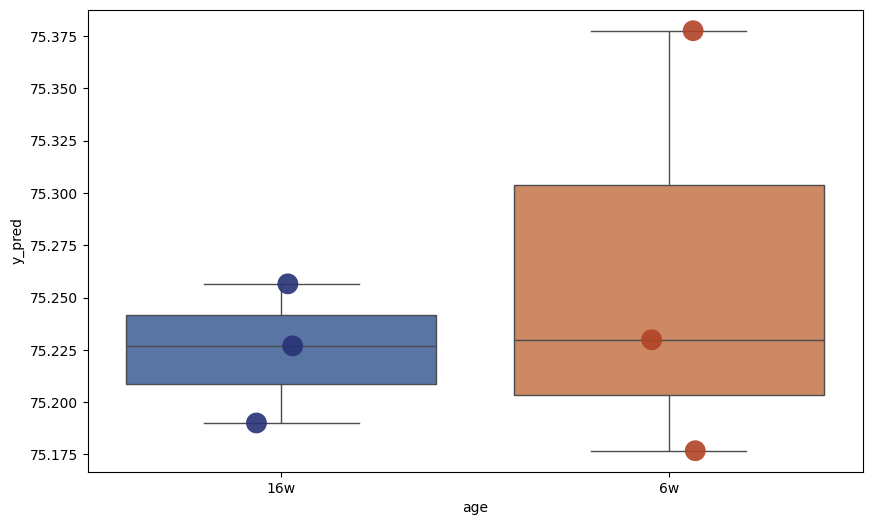

Components: 2
              y_pred
muscle_13  78.134694
muscle_12  77.425762
muscle_10  77.354337
muscle_4   72.711781
muscle_2   72.507517
muscle_1   71.491191
              y_pred  age
muscle_13  78.134694  16w
muscle_12  77.425762  16w
muscle_10  77.354337  16w
muscle_4   72.711781   6w
muscle_2   72.507517   6w
muscle_1   71.491191   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


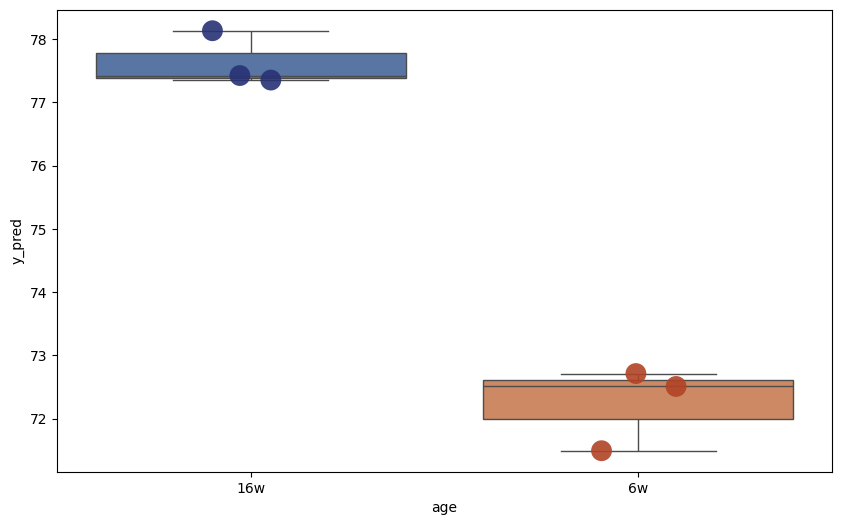

Components: 3
              y_pred
muscle_13  87.472489
muscle_12  87.428072
muscle_10  90.181474
muscle_4   74.639918
muscle_2   73.500121
muscle_1   71.277622
              y_pred  age
muscle_13  87.472489  16w
muscle_12  87.428072  16w
muscle_10  90.181474  16w
muscle_4   74.639918   6w
muscle_2   73.500121   6w
muscle_1   71.277622   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


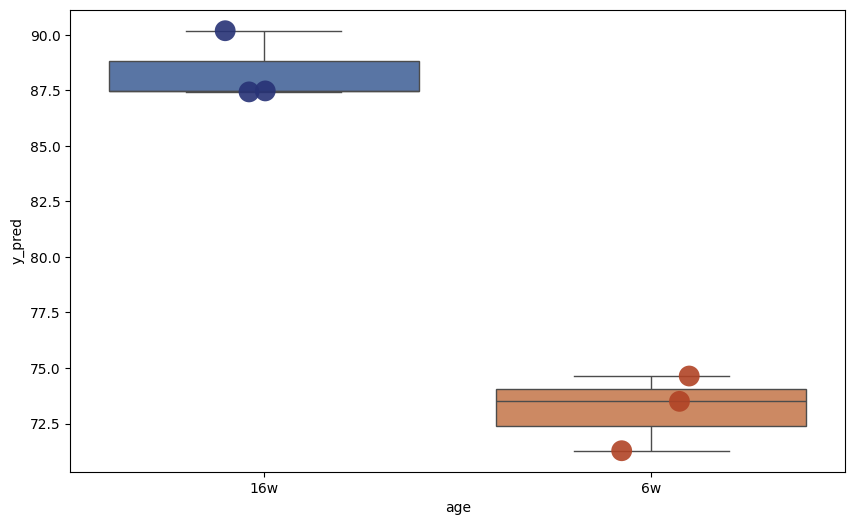

Components: 4
              y_pred
muscle_13  88.009145
muscle_12  87.967470
muscle_10  90.924546
muscle_4   77.316144
muscle_2   76.257443
muscle_1   73.523941
              y_pred  age
muscle_13  88.009145  16w
muscle_12  87.967470  16w
muscle_10  90.924546  16w
muscle_4   77.316144   6w
muscle_2   76.257443   6w
muscle_1   73.523941   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


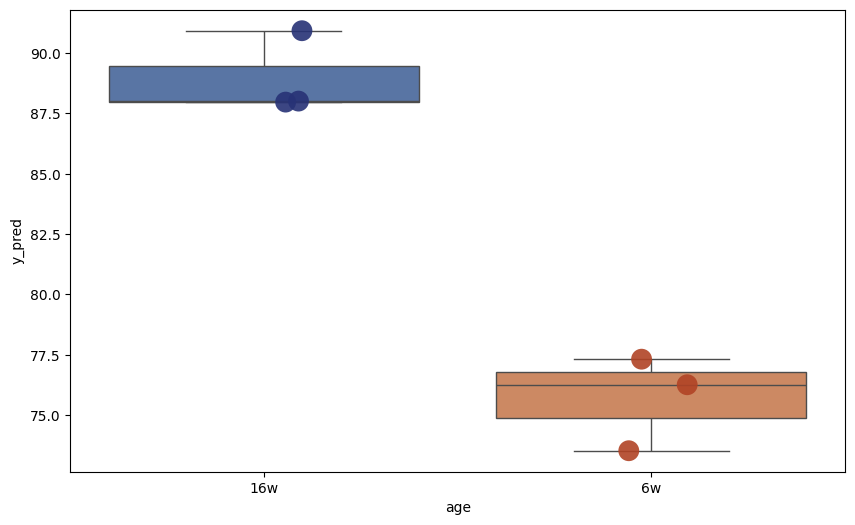

Components: 5
              y_pred
muscle_13  85.553354
muscle_12  85.481918
muscle_10  89.595097
muscle_4   74.402876
muscle_2   73.430578
muscle_1   70.745541
              y_pred  age
muscle_13  85.553354  16w
muscle_12  85.481918  16w
muscle_10  89.595097  16w
muscle_4   74.402876   6w
muscle_2   73.430578   6w
muscle_1   70.745541   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


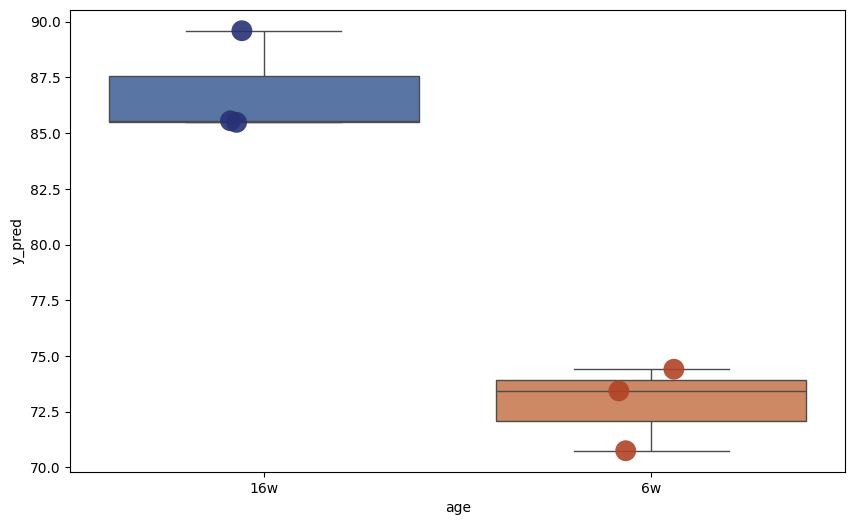

Components: 6
              y_pred
muscle_13  85.474482
muscle_12  85.443148
muscle_10  89.855286
muscle_4   73.220958
muscle_2   72.335017
muscle_1   70.015588
              y_pred  age
muscle_13  85.474482  16w
muscle_12  85.443148  16w
muscle_10  89.855286  16w
muscle_4   73.220958   6w
muscle_2   72.335017   6w
muscle_1   70.015588   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


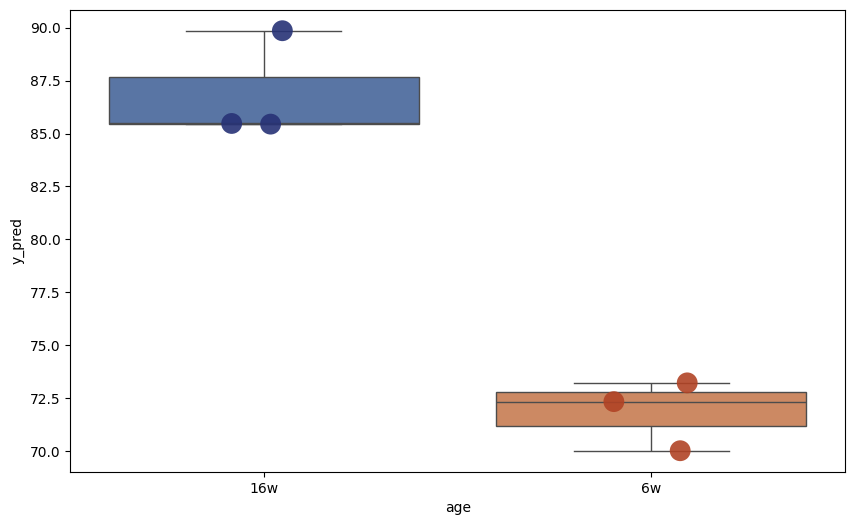

Components: 7
              y_pred
muscle_13  85.149324
muscle_12  85.426580
muscle_10  89.504443
muscle_4   72.177785
muscle_2   71.341554
muscle_1   69.400741
              y_pred  age
muscle_13  85.149324  16w
muscle_12  85.426580  16w
muscle_10  89.504443  16w
muscle_4   72.177785   6w
muscle_2   71.341554   6w
muscle_1   69.400741   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


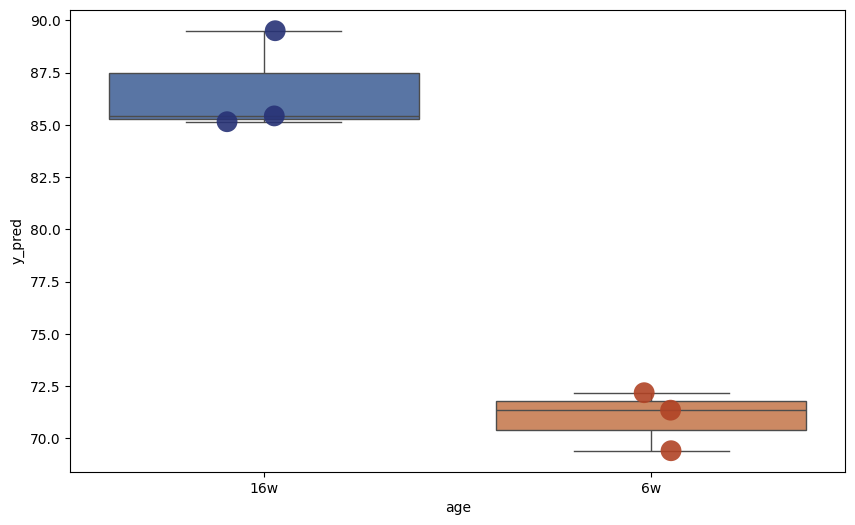

Components: 8
              y_pred
muscle_13  85.273614
muscle_12  85.411057
muscle_10  89.648140
muscle_4   72.333615
muscle_2   71.569527
muscle_1   69.447188
              y_pred  age
muscle_13  85.273614  16w
muscle_12  85.411057  16w
muscle_10  89.648140  16w
muscle_4   72.333615   6w
muscle_2   71.569527   6w
muscle_1   69.447188   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


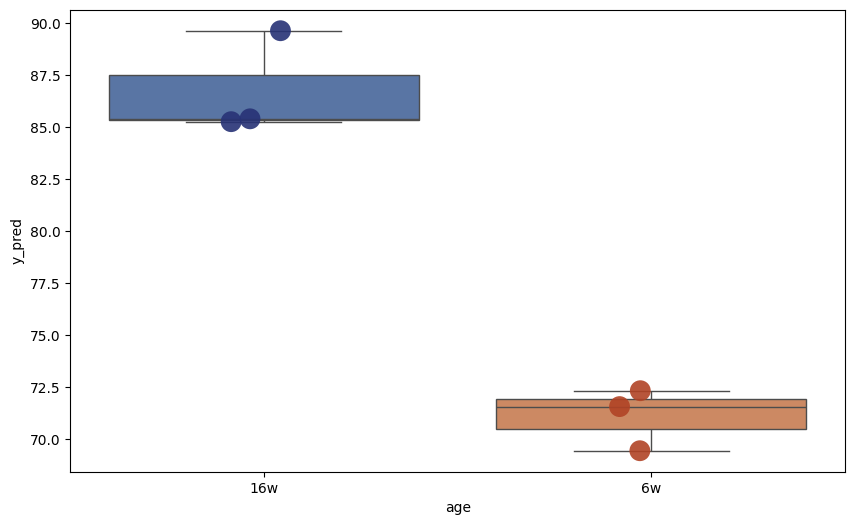

Components: 9
              y_pred
muscle_13  85.856656
muscle_12  86.645710
muscle_10  90.341937
muscle_4   73.451572
muscle_2   72.740760
muscle_1   68.463390
              y_pred  age
muscle_13  85.856656  16w
muscle_12  86.645710  16w
muscle_10  90.341937  16w
muscle_4   73.451572   6w
muscle_2   72.740760   6w
muscle_1   68.463390   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


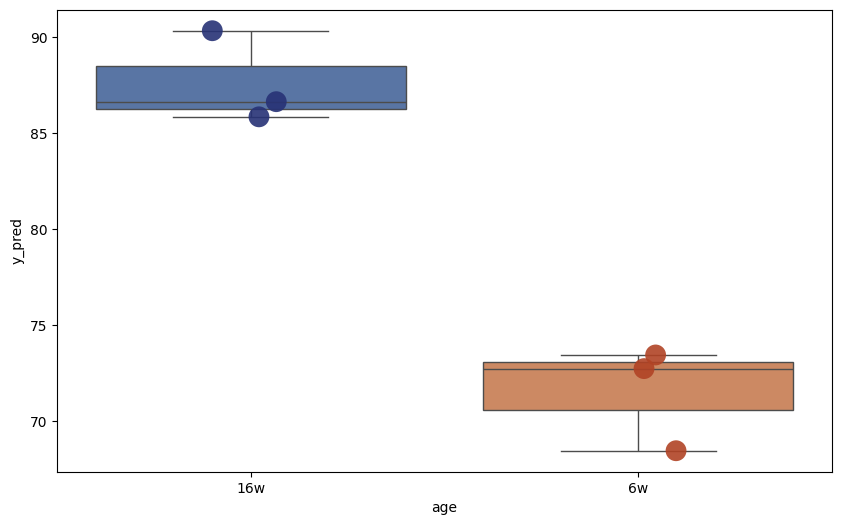

Components: 10
              y_pred
muscle_13  86.086461
muscle_12  88.451659
muscle_10  90.827898
muscle_4   72.568668
muscle_2   71.705754
muscle_1   68.755022
              y_pred  age
muscle_13  86.086461  16w
muscle_12  88.451659  16w
muscle_10  90.827898  16w
muscle_4   72.568668   6w
muscle_2   71.705754   6w
muscle_1   68.755022   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


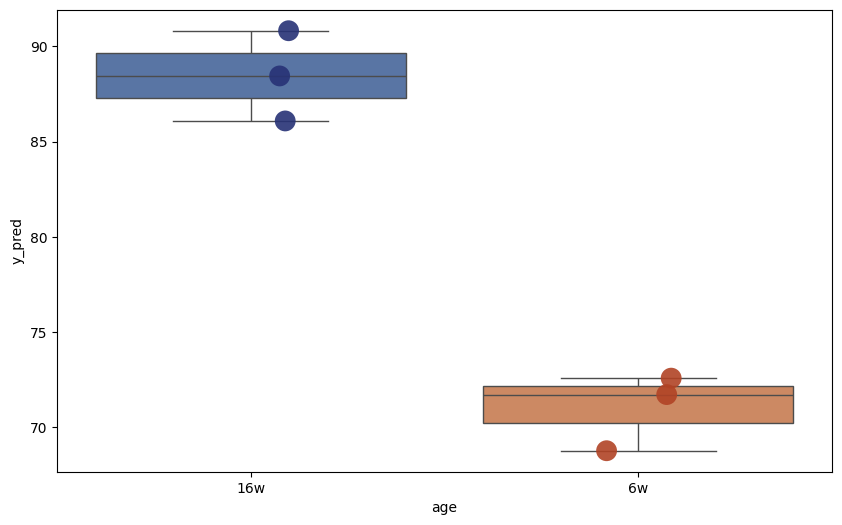

Components: 11
              y_pred
muscle_13  86.640911
muscle_12  88.804511
muscle_10  91.176924
muscle_4   72.617658
muscle_2   71.684948
muscle_1   68.070926
              y_pred  age
muscle_13  86.640911  16w
muscle_12  88.804511  16w
muscle_10  91.176924  16w
muscle_4   72.617658   6w
muscle_2   71.684948   6w
muscle_1   68.070926   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


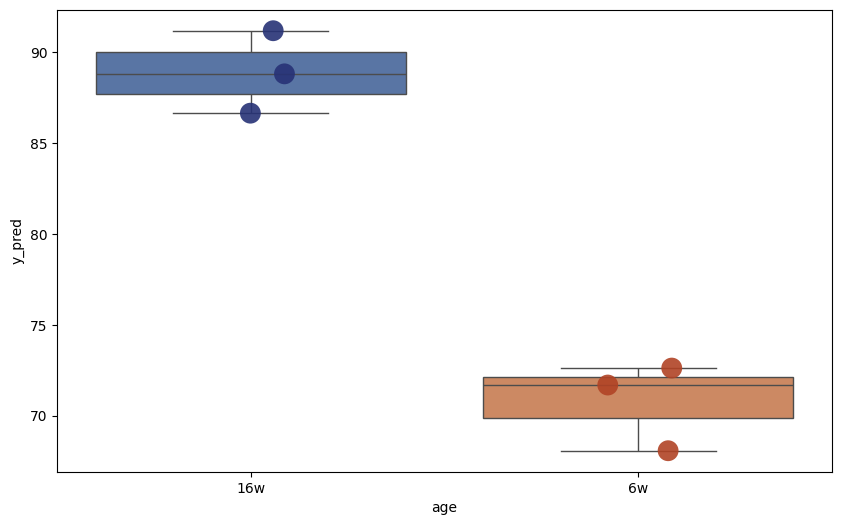

Components: 12
              y_pred
muscle_13  86.152341
muscle_12  87.244365
muscle_10  90.906479
muscle_4   72.809460
muscle_2   72.030079
muscle_1   69.001955
              y_pred  age
muscle_13  86.152341  16w
muscle_12  87.244365  16w
muscle_10  90.906479  16w
muscle_4   72.809460   6w
muscle_2   72.030079   6w
muscle_1   69.001955   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


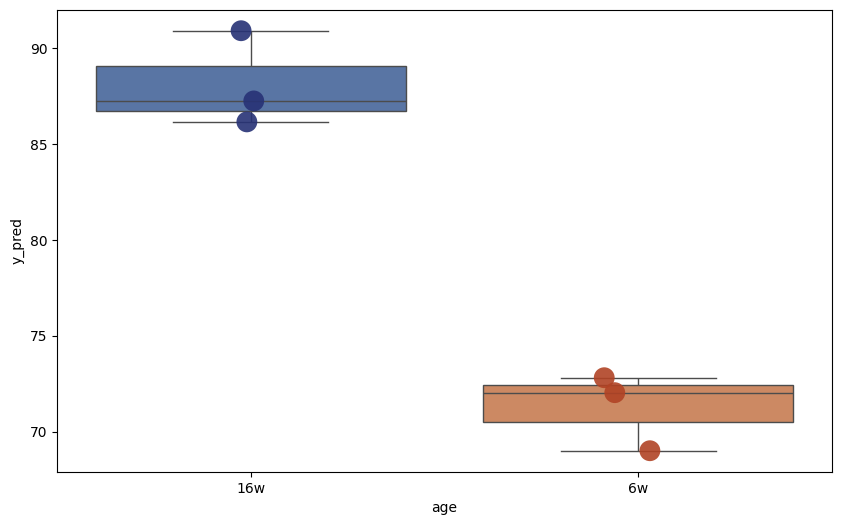

Components: 13
              y_pred
muscle_13  87.320516
muscle_12  89.787569
muscle_10  91.644345
muscle_4   73.319047
muscle_2   72.485812
muscle_1   68.808304
              y_pred  age
muscle_13  87.320516  16w
muscle_12  89.787569  16w
muscle_10  91.644345  16w
muscle_4   73.319047   6w
muscle_2   72.485812   6w
muscle_1   68.808304   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


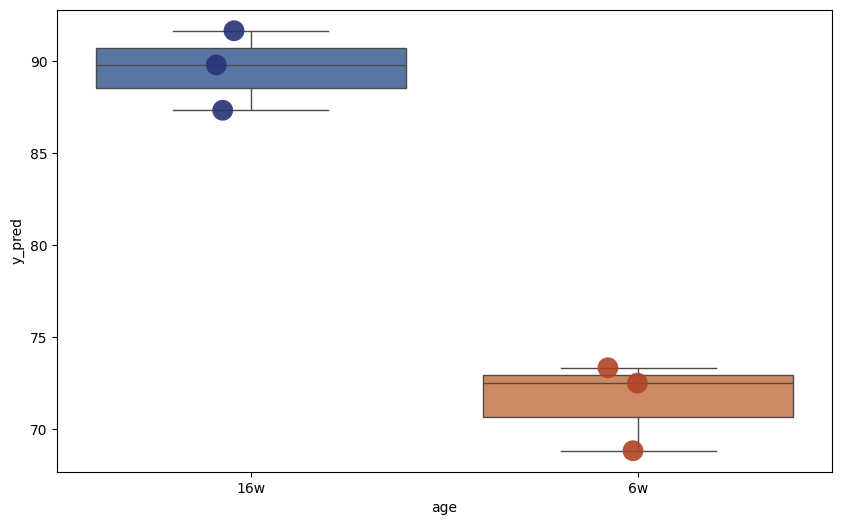

Components: 14
              y_pred
muscle_13  85.737142
muscle_12  88.938270
muscle_10  90.012192
muscle_4   71.752153
muscle_2   71.513676
muscle_1   68.099528
              y_pred  age
muscle_13  85.737142  16w
muscle_12  88.938270  16w
muscle_10  90.012192  16w
muscle_4   71.752153   6w
muscle_2   71.513676   6w
muscle_1   68.099528   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


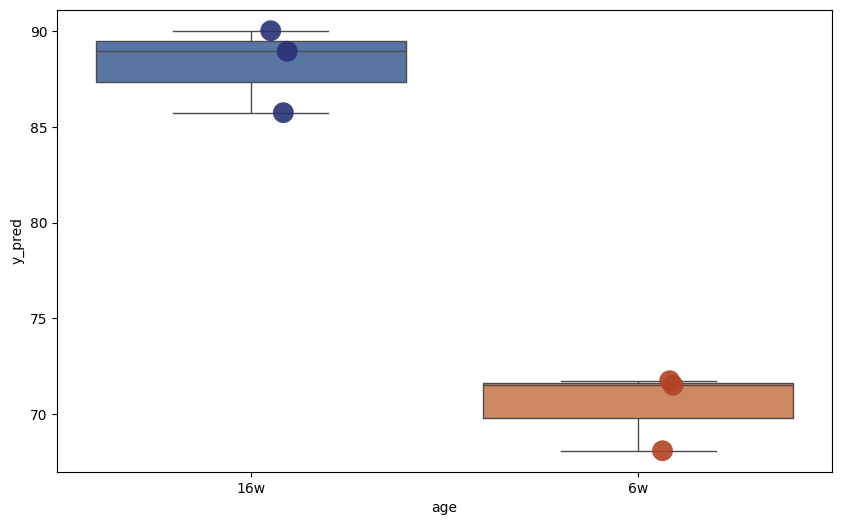

Components: 15
              y_pred
muscle_13  87.902457
muscle_12  91.646920
muscle_10  91.559752
muscle_4   73.253623
muscle_2   72.694036
muscle_1   68.913836
              y_pred  age
muscle_13  87.902457  16w
muscle_12  91.646920  16w
muscle_10  91.559752  16w
muscle_4   73.253623   6w
muscle_2   72.694036   6w
muscle_1   68.913836   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


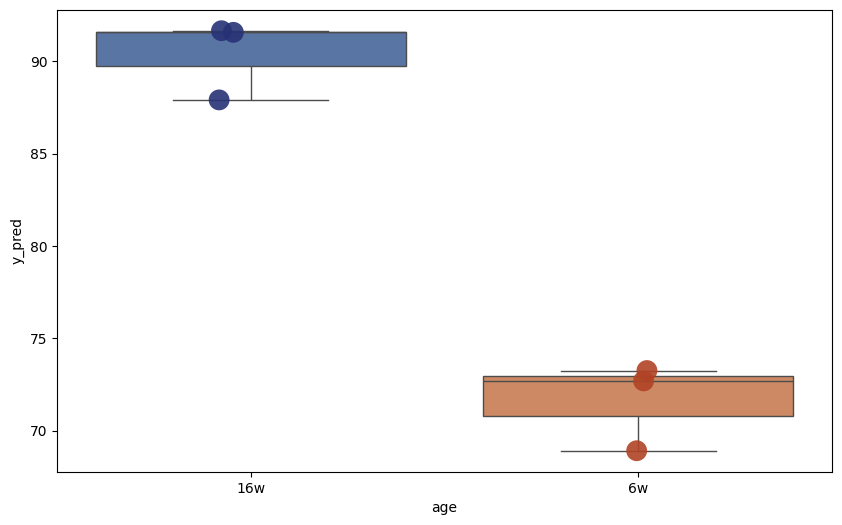

Components: 16
              y_pred
muscle_13  88.131854
muscle_12  91.122174
muscle_10  91.979762
muscle_4   73.645157
muscle_2   72.989862
muscle_1   69.407226
              y_pred  age
muscle_13  88.131854  16w
muscle_12  91.122174  16w
muscle_10  91.979762  16w
muscle_4   73.645157   6w
muscle_2   72.989862   6w
muscle_1   69.407226   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


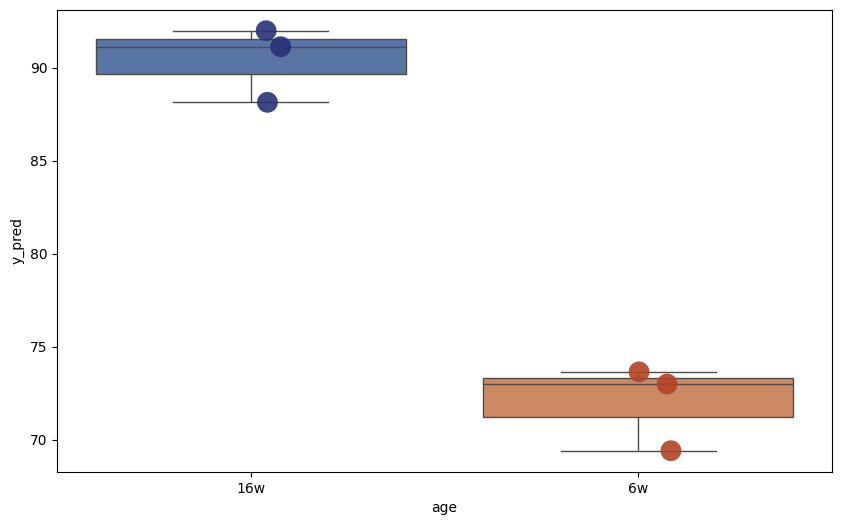

Components: 17
              y_pred
muscle_13  88.167443
muscle_12  92.320211
muscle_10  92.440799
muscle_4   73.951392
muscle_2   73.058549
muscle_1   69.439354
              y_pred  age
muscle_13  88.167443  16w
muscle_12  92.320211  16w
muscle_10  92.440799  16w
muscle_4   73.951392   6w
muscle_2   73.058549   6w
muscle_1   69.439354   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


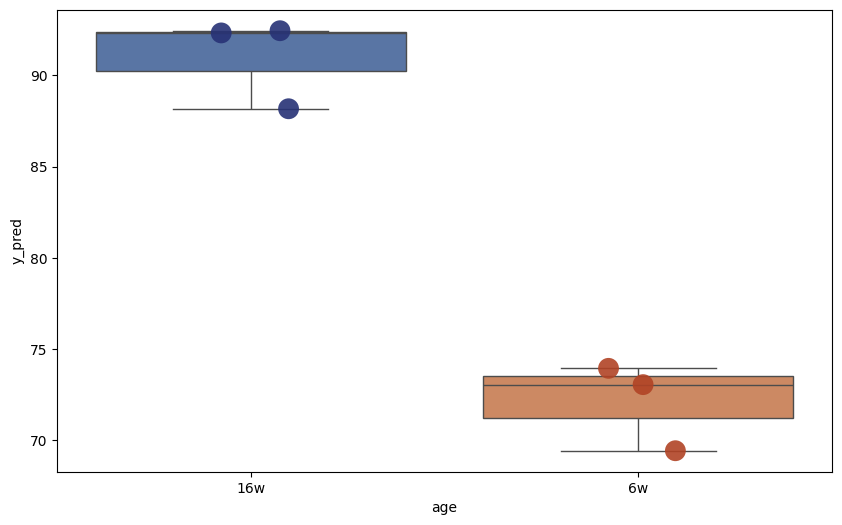

Components: 18
              y_pred
muscle_13  87.690433
muscle_12  91.993529
muscle_10  91.800828
muscle_4   73.300558
muscle_2   72.852216
muscle_1   69.370110
              y_pred  age
muscle_13  87.690433  16w
muscle_12  91.993529  16w
muscle_10  91.800828  16w
muscle_4   73.300558   6w
muscle_2   72.852216   6w
muscle_1   69.370110   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


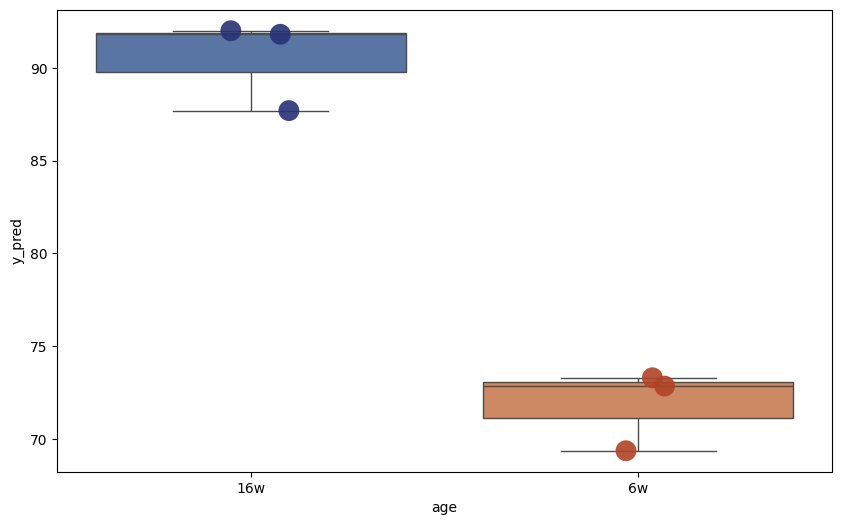

Components: 19
              y_pred
muscle_13  87.217684
muscle_12  91.834813
muscle_10  91.120733
muscle_4   72.274271
muscle_2   71.684696
muscle_1   68.022765
              y_pred  age
muscle_13  87.217684  16w
muscle_12  91.834813  16w
muscle_10  91.120733  16w
muscle_4   72.274271   6w
muscle_2   71.684696   6w
muscle_1   68.022765   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


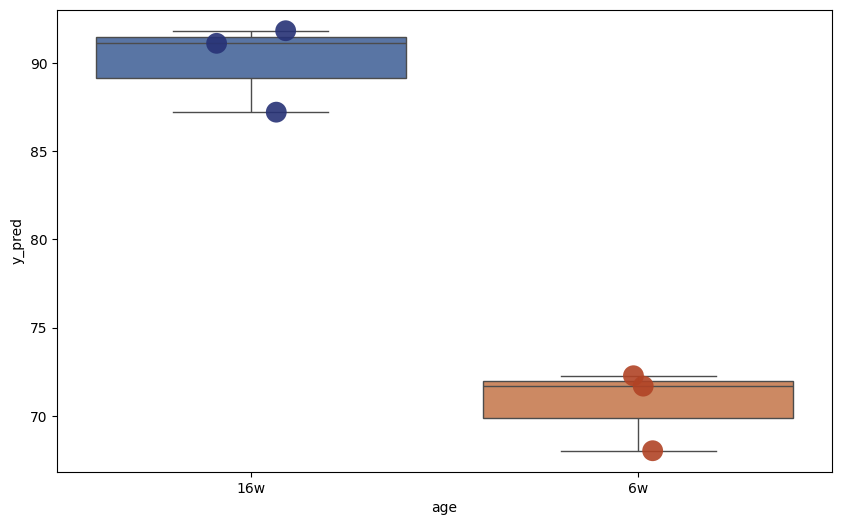

Components: 20
              y_pred
muscle_13  87.565233
muscle_12  91.500635
muscle_10  90.949543
muscle_4   73.375852
muscle_2   72.729608
muscle_1   68.912258
              y_pred  age
muscle_13  87.565233  16w
muscle_12  91.500635  16w
muscle_10  90.949543  16w
muscle_4   73.375852   6w
muscle_2   72.729608   6w
muscle_1   68.912258   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


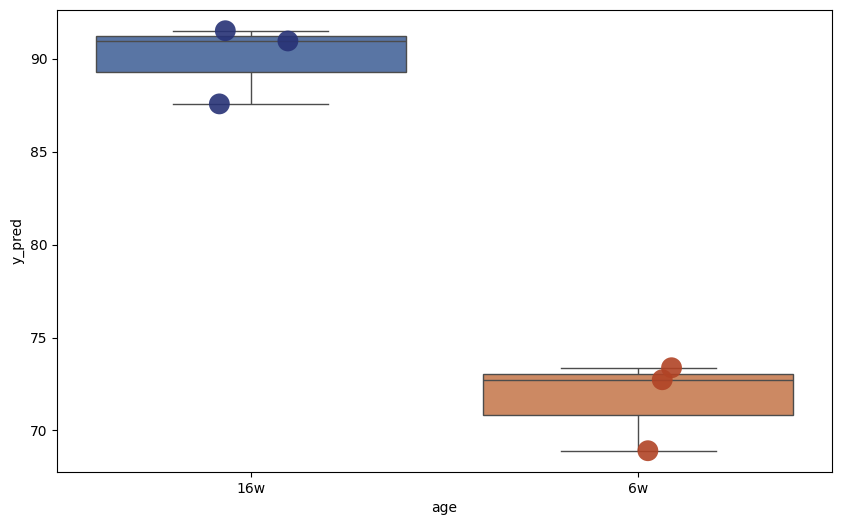

Components: 21
              y_pred
muscle_13  87.882140
muscle_12  92.496402
muscle_10  91.368482
muscle_4   73.581457
muscle_2   72.509003
muscle_1   68.771978
              y_pred  age
muscle_13  87.882140  16w
muscle_12  92.496402  16w
muscle_10  91.368482  16w
muscle_4   73.581457   6w
muscle_2   72.509003   6w
muscle_1   68.771978   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


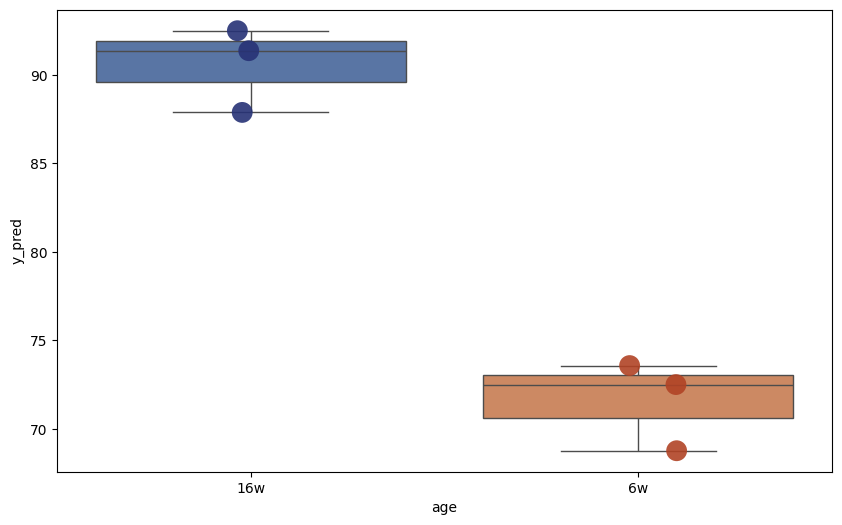

Components: 22
              y_pred
muscle_13  87.448209
muscle_12  91.890592
muscle_10  90.803662
muscle_4   72.564620
muscle_2   71.561719
muscle_1   67.528379
              y_pred  age
muscle_13  87.448209  16w
muscle_12  91.890592  16w
muscle_10  90.803662  16w
muscle_4   72.564620   6w
muscle_2   71.561719   6w
muscle_1   67.528379   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


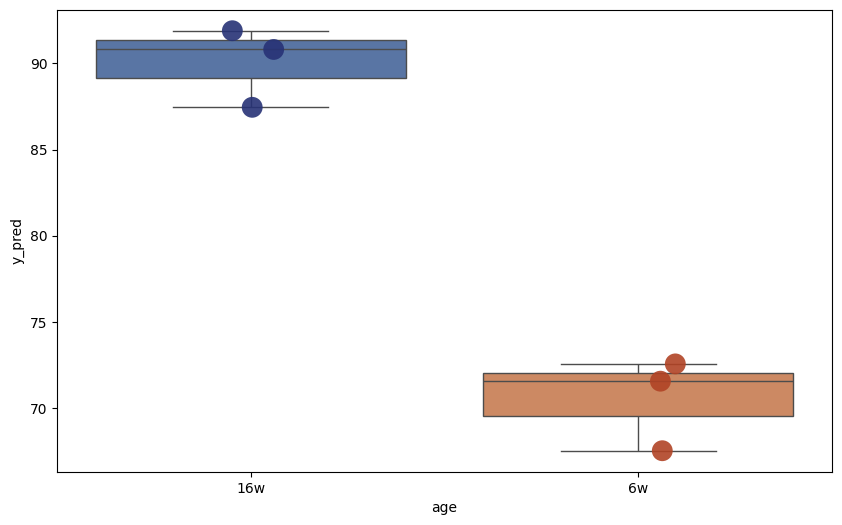

Components: 23
              y_pred
muscle_13  88.722375
muscle_12  93.531500
muscle_10  92.151818
muscle_4   73.916909
muscle_2   73.312556
muscle_1   69.697499
              y_pred  age
muscle_13  88.722375  16w
muscle_12  93.531500  16w
muscle_10  92.151818  16w
muscle_4   73.916909   6w
muscle_2   73.312556   6w
muscle_1   69.697499   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


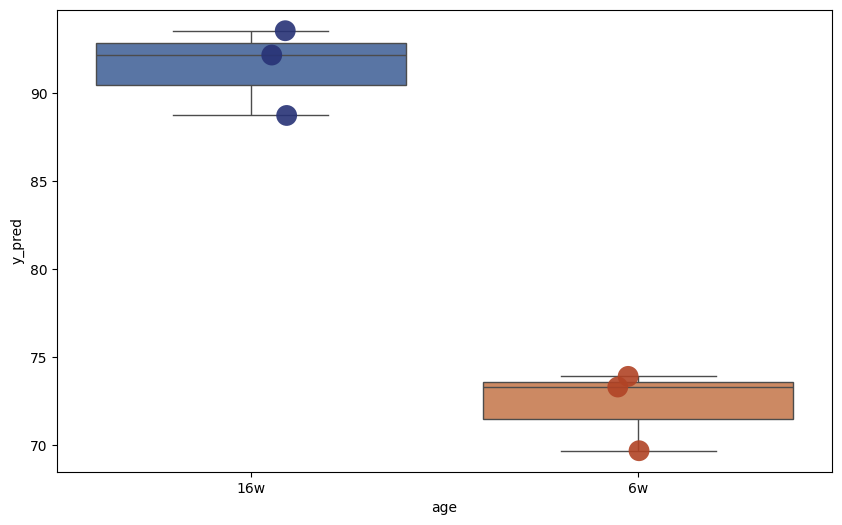

Components: 24
              y_pred
muscle_13  90.133476
muscle_12  94.756098
muscle_10  93.027784
muscle_4   73.964507
muscle_2   73.165423
muscle_1   69.584450
              y_pred  age
muscle_13  90.133476  16w
muscle_12  94.756098  16w
muscle_10  93.027784  16w
muscle_4   73.964507   6w
muscle_2   73.165423   6w
muscle_1   69.584450   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


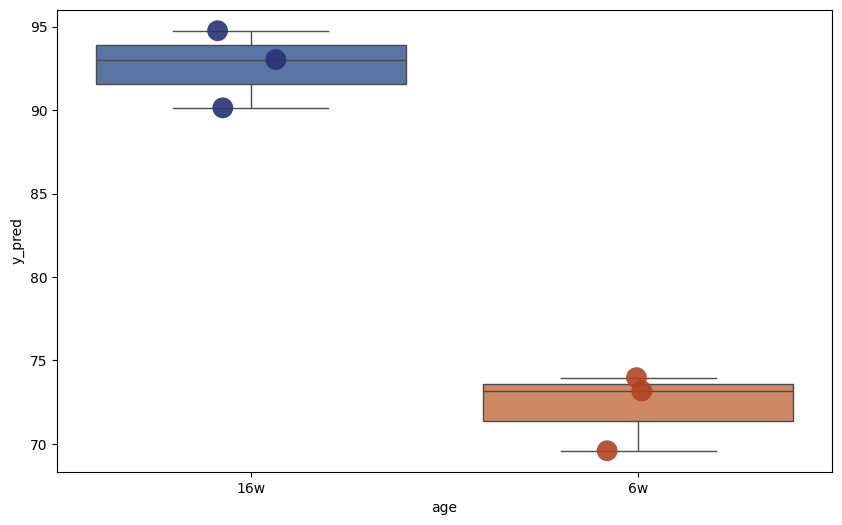

Components: 25
              y_pred
muscle_13  90.416561
muscle_12  94.799763
muscle_10  93.468476
muscle_4   74.606348
muscle_2   73.886100
muscle_1   70.432746
              y_pred  age
muscle_13  90.416561  16w
muscle_12  94.799763  16w
muscle_10  93.468476  16w
muscle_4   74.606348   6w
muscle_2   73.886100   6w
muscle_1   70.432746   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


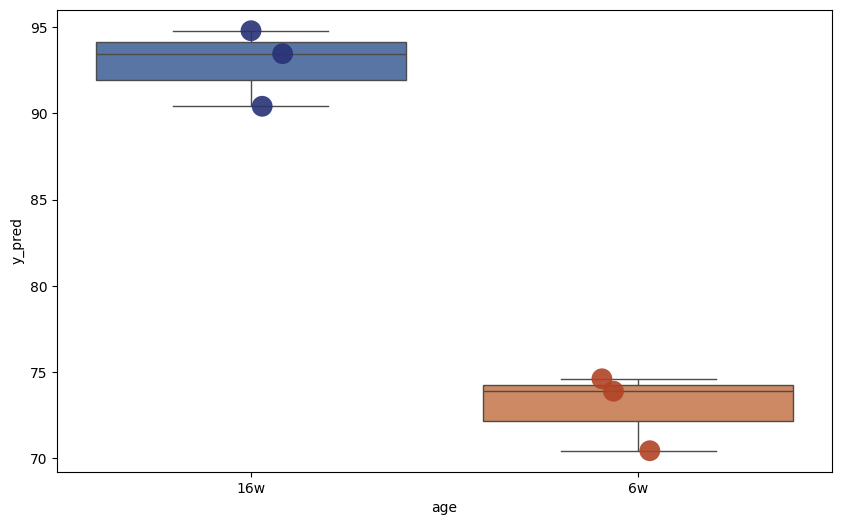

Components: 26
              y_pred
muscle_13  91.204118
muscle_12  96.116462
muscle_10  94.432874
muscle_4   74.373293
muscle_2   73.071557
muscle_1   69.694368
              y_pred  age
muscle_13  91.204118  16w
muscle_12  96.116462  16w
muscle_10  94.432874  16w
muscle_4   74.373293   6w
muscle_2   73.071557   6w
muscle_1   69.694368   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


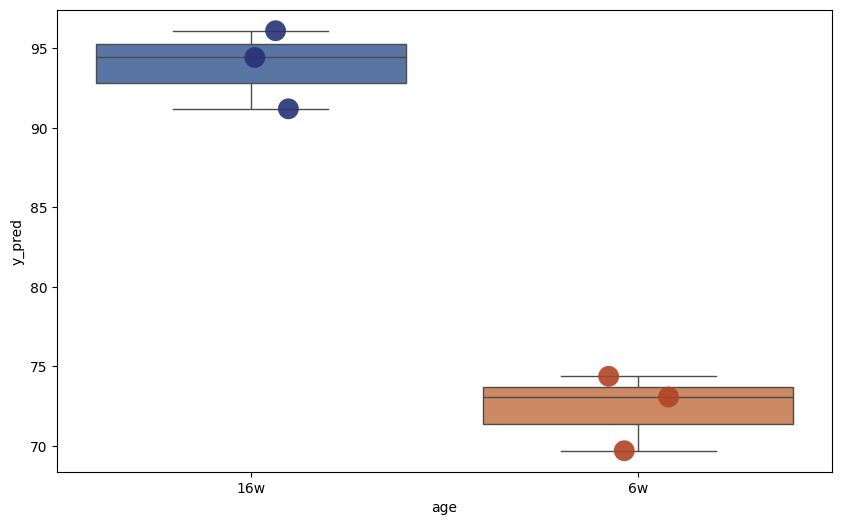

Components: 27
              y_pred
muscle_13  91.110614
muscle_12  95.641336
muscle_10  94.554091
muscle_4   74.280909
muscle_2   73.088251
muscle_1   69.545844
              y_pred  age
muscle_13  91.110614  16w
muscle_12  95.641336  16w
muscle_10  94.554091  16w
muscle_4   74.280909   6w
muscle_2   73.088251   6w
muscle_1   69.545844   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


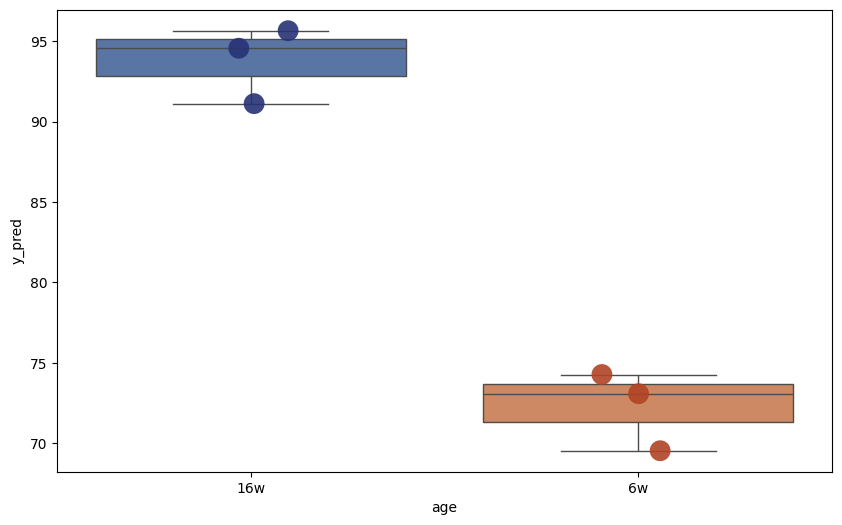

Components: 28
              y_pred
muscle_13  91.338761
muscle_12  95.933323
muscle_10  94.874300
muscle_4   74.442344
muscle_2   73.228765
muscle_1   69.763575
              y_pred  age
muscle_13  91.338761  16w
muscle_12  95.933323  16w
muscle_10  94.874300  16w
muscle_4   74.442344   6w
muscle_2   73.228765   6w
muscle_1   69.763575   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


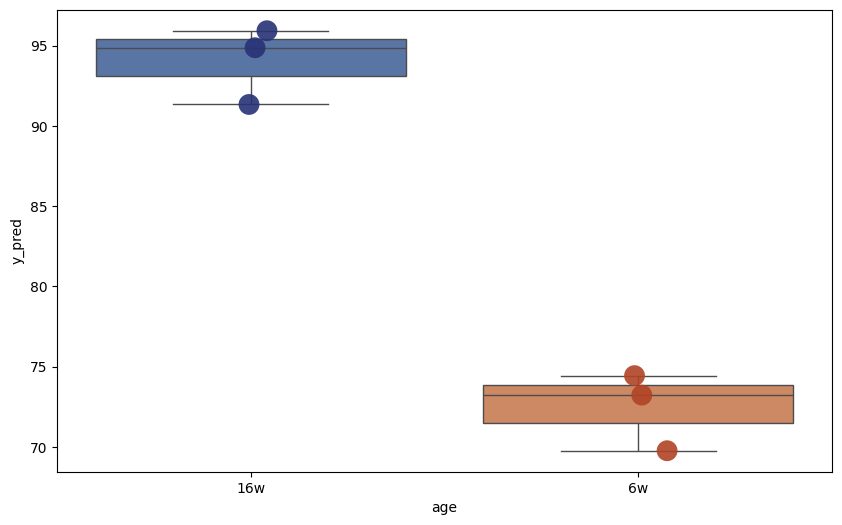

Components: 29
              y_pred
muscle_13  91.190669
muscle_12  95.866973
muscle_10  94.860504
muscle_4   74.649291
muscle_2   73.211421
muscle_1   69.682032
              y_pred  age
muscle_13  91.190669  16w
muscle_12  95.866973  16w
muscle_10  94.860504  16w
muscle_4   74.649291   6w
muscle_2   73.211421   6w
muscle_1   69.682032   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


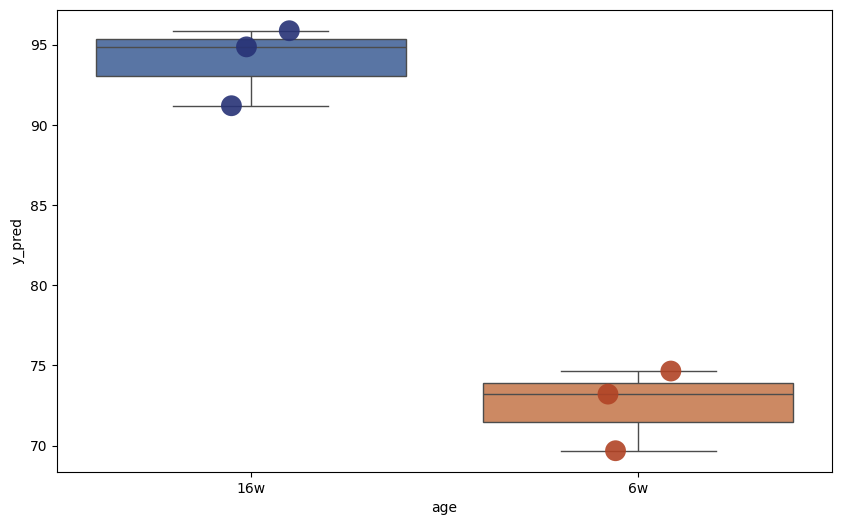

Components: 30


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
muscle_13  91.329268
muscle_12  96.143252
muscle_10  95.011710
muscle_4   74.756730
muscle_2   73.285904
muscle_1   70.053600
              y_pred  age
muscle_13  91.329268  16w
muscle_12  96.143252  16w
muscle_10  95.011710  16w
muscle_4   74.756730   6w
muscle_2   73.285904   6w
muscle_1   70.053600   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


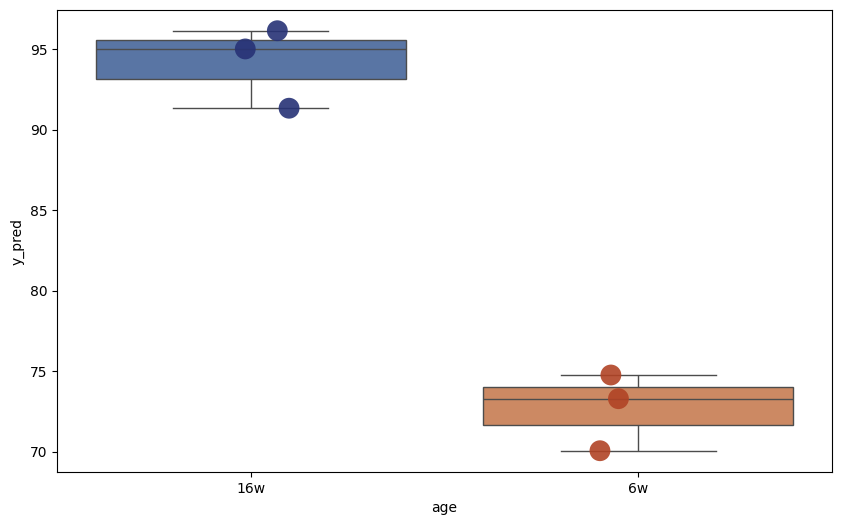

Components: 31
              y_pred
muscle_13  91.350703
muscle_12  96.128550
muscle_10  95.013999
muscle_4   74.785731
muscle_2   73.295577
muscle_1   70.067907
              y_pred  age
muscle_13  91.350703  16w
muscle_12  96.128550  16w
muscle_10  95.013999  16w
muscle_4   74.785731   6w
muscle_2   73.295577   6w
muscle_1   70.067907   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


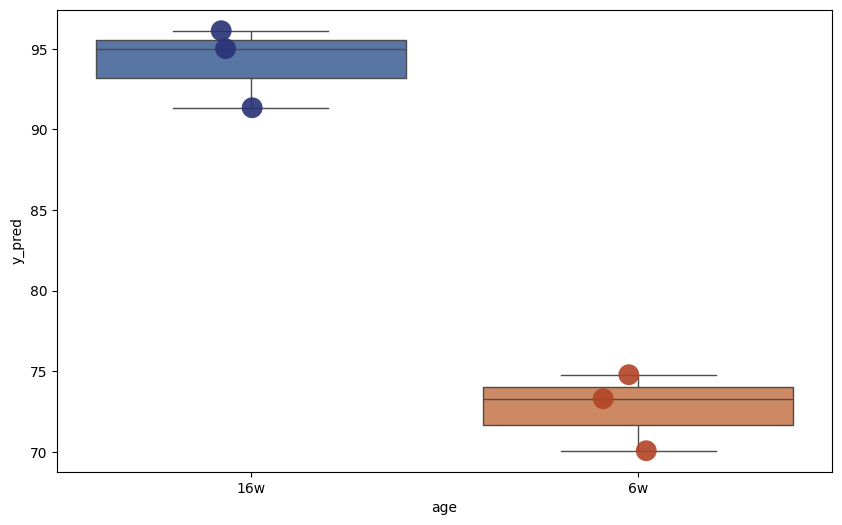

Components: 32


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


              y_pred
muscle_13  91.453717
muscle_12  96.311036
muscle_10  94.968744
muscle_4   74.935673
muscle_2   73.405582
muscle_1   70.212598
              y_pred  age
muscle_13  91.453717  16w
muscle_12  96.311036  16w
muscle_10  94.968744  16w
muscle_4   74.935673   6w
muscle_2   73.405582   6w
muscle_1   70.212598   6w


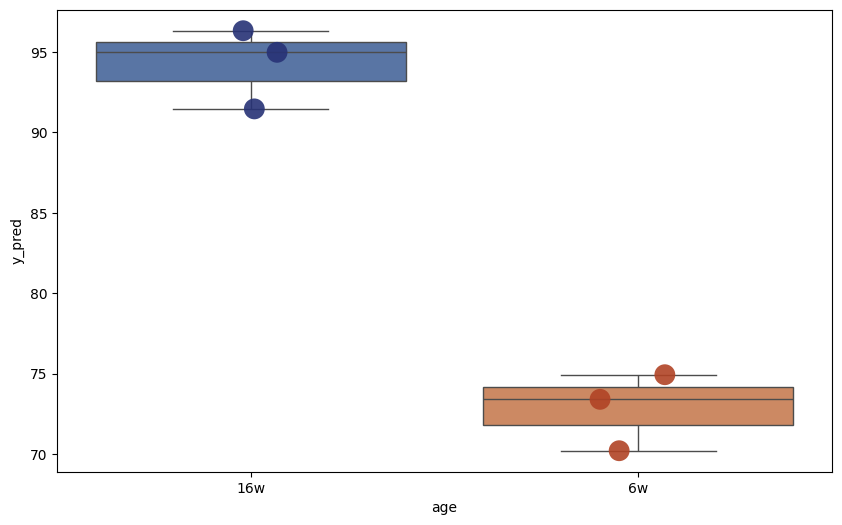

Components: 33
              y_pred
muscle_13  91.449527
muscle_12  96.536111
muscle_10  95.120288
muscle_4   74.850331
muscle_2   73.206225
muscle_1   70.080870
              y_pred  age
muscle_13  91.449527  16w
muscle_12  96.536111  16w
muscle_10  95.120288  16w
muscle_4   74.850331   6w
muscle_2   73.206225   6w
muscle_1   70.080870   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


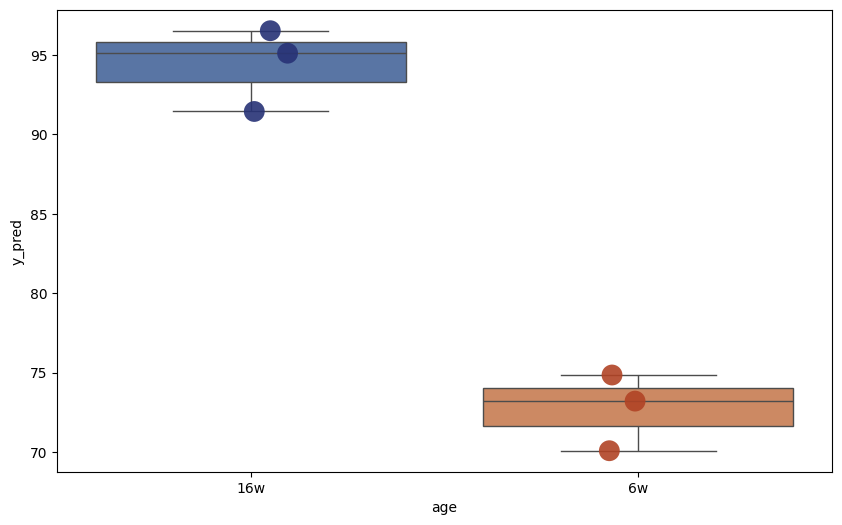

Components: 34
               y_pred
muscle_13   91.755734
muscle_12  100.514809
muscle_10   95.853746
muscle_4    67.181920
muscle_2    61.782533
muscle_1    59.001011
               y_pred  age
muscle_13   91.755734  16w
muscle_12  100.514809  16w
muscle_10   95.853746  16w
muscle_4    67.181920   6w
muscle_2    61.782533   6w
muscle_1    59.001011   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


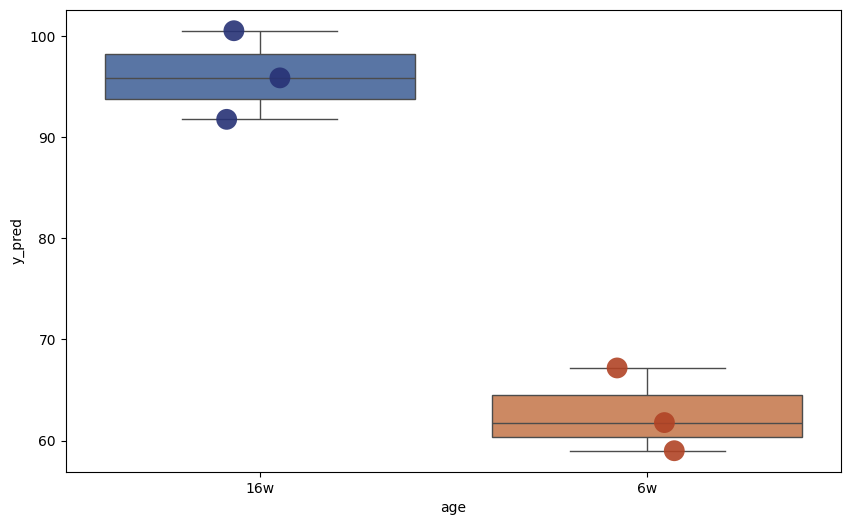

Components: 35
               y_pred
muscle_13   94.931134
muscle_12  102.999719
muscle_10   99.255600
muscle_4    61.561947
muscle_2    56.294916
muscle_1    50.453527
               y_pred  age
muscle_13   94.931134  16w
muscle_12  102.999719  16w
muscle_10   99.255600  16w
muscle_4    61.561947   6w
muscle_2    56.294916   6w
muscle_1    50.453527   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


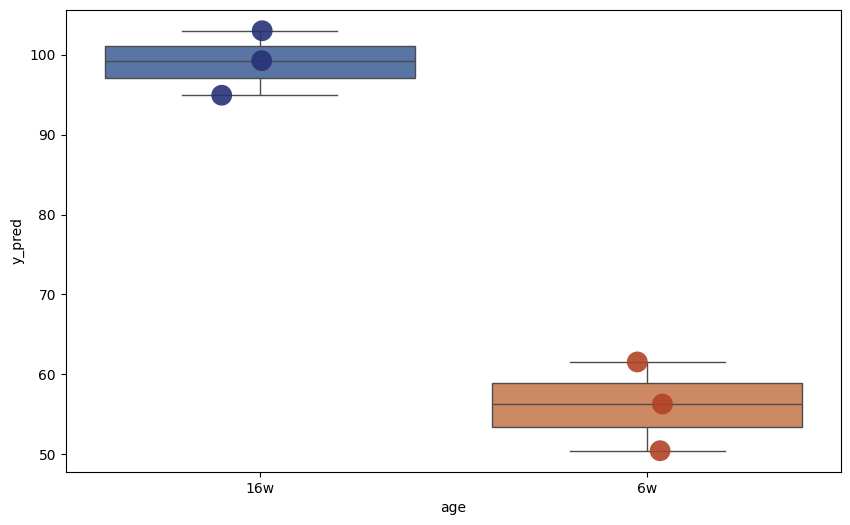

Components: 36
               y_pred
muscle_13   94.929206
muscle_12  102.936949
muscle_10   99.276102
muscle_4    61.573246
muscle_2    56.312108
muscle_1    50.460548
               y_pred  age
muscle_13   94.929206  16w
muscle_12  102.936949  16w
muscle_10   99.276102  16w
muscle_4    61.573246   6w
muscle_2    56.312108   6w
muscle_1    50.460548   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


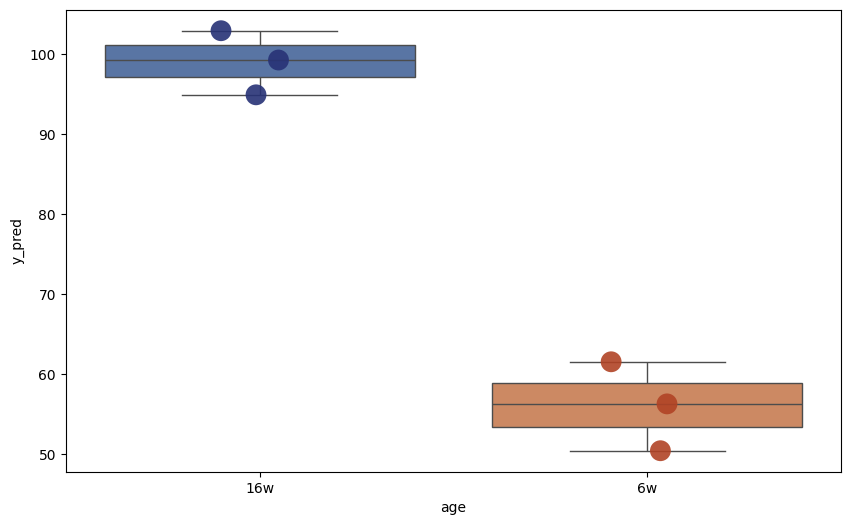

In [202]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_male.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_male["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [136]:
n_components = 15

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_male = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_male.index.tolist())

results_df_male["age"] = df_intervention_test_metadata_male["age"]

print(results_df_male)
results_df_male.to_csv("./AlanXu_muscle_maleOnly_Calibratedpredictions_15PCs_EC-250725.csv")

              y_pred  age
muscle_13  87.882482  16w
muscle_12  91.624362  16w
muscle_10  91.542596  16w
muscle_4   73.274646   6w
muscle_2   72.716044   6w
muscle_1   68.934401   6w


In [ ]:
##### Sample rotation

In [204]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_male.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [205]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_male.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_male['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_male.drop(
            atlas_plus_intervention_male.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_male.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_male.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_male.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/100] Running PCR for combo: muscle_5_muscle_4__muscle_14_muscle_13
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/100] Running PCR for combo: muscle_5_muscle_4__muscle_14_muscle_12
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/100] Running PCR for combo: muscle_5_muscle_4__muscle_14_muscle_11
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/100] Running PCR for combo: muscle_5_muscle_4__muscle_14_muscle_10
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  

### Female

##### Calibration

In [137]:
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_female = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(female_samples)
]

df_intervention_age_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,Muscle,16w,female,112
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,0.000000,97.904910,41.587927,1173.992510,473.929080,46.786417,Muscle,16w,female,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,0.000000,72.584470,30.034953,1202.649587,438.009735,52.561168,Muscle,16w,female,112


In [138]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'female'].index

df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_19,SRR24062685,16w,RNA-Seq,300,5136081600,Dario Valenzano laboratory,PRJNA952180,SAMN34067691,Model organism or animal,1851655279,...,2023-04-04T11:27:00Z,1,GRZ-AD_8241_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062685.featureCounts,SRR24062685,No
muscle_18,SRR24062686,16w,RNA-Seq,300,5706151500,Dario Valenzano laboratory,PRJNA952180,SAMN34067690,Model organism or animal,2090590736,...,2023-04-04T11:31:00Z,1,GRZ-AD_8232_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062686.featureCounts,SRR24062686,No
muscle_17,SRR24062687,16w,RNA-Seq,300,4272510600,Dario Valenzano laboratory,PRJNA952180,SAMN34067689,Model organism or animal,1545160147,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062687.featureCounts,SRR24062687,No


In [139]:
random.seed(123)

# Separate the samples
young_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,Muscle,16w,female,112
muscle_16,100.683910,368.215443,19.177888,9.588944,1.917789,20.136782,0.0,0.0,59.451452,144.793052,...,0.000000,63.287029,34.520198,1105.605224,466.022670,49.862508,Muscle,16w,female,112
muscle_9,115.317286,360.467319,4.838488,33.869413,0.000000,54.029777,0.0,0.0,100.801823,77.415800,...,3.225658,17.741121,5.644902,1347.518770,435.463876,72.577313,Muscle,6w,female,42
muscle_8,92.764969,324.677393,10.786624,8.629299,0.000000,19.415924,0.0,0.0,122.967518,110.023568,...,0.000000,4.314650,21.573249,1513.363397,549.039180,94.922294,Muscle,6w,female,42


In [140]:
df_intervention_train_female = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_19,66.433299,353.045530,7.592377,17.082848,7.592377,30.369508,0.0,0.0,60.739016,177.471812,...,178.420859,0.0,3.796188,1.898094,51.248545,34.165696,1416.927358,403.345028,39.859979,112
muscle_16,100.683910,368.215443,19.177888,9.588944,1.917789,20.136782,0.0,0.0,59.451452,144.793052,...,255.065906,0.0,3.835578,0.000000,63.287029,34.520198,1105.605224,466.022670,49.862508,112


In [141]:
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

#combine the dataframes
atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_female], axis=0)

atlas_plus_intervention_female.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A16_1,1.631269,482.855494,84.825965,908.616589,363.772889,944.504497,885.778829,2233.206661,1295.227238,750.383538,...,40.781714,610.094442,138.657828,614.988248,8.156343,960.817183,1249.551718,107.663725,438.811243,103
B13_1,1.771236,504.802247,99.189213,825.395955,480.004944,1013.146966,998.977078,2463.789213,981.264719,793.513708,...,83.248090,825.395955,123.986517,683.697078,8.856180,1225.695280,1712.785168,258.600449,356.018427,155
B14_1,11.425531,536.999954,260.502106,539.285061,429.599964,1042.008422,767.795680,1631.565819,918.612688,431.885070,...,29.706380,792.931848,89.119141,966.599918,68.553186,902.616945,1544.731784,404.463795,379.327627,77


In [142]:
#all not in select_train_samples
test_samples = [s for s in female_samples if s not in select_train_samples]
test_samples

['muscle_18', 'muscle_17', 'muscle_15', 'muscle_7', 'muscle_6']

In [143]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(test_samples)
]

df_intervention_test_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,0.0,97.90491,41.587927,1173.992510,473.929080,46.786417,Muscle,16w,female,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,0.0,72.58447,30.034953,1202.649587,438.009735,52.561168,Muscle,16w,female,112
muscle_15,83.784630,366.006541,13.229152,6.614576,2.204859,33.072880,0.0,0.0,97.013782,145.520673,...,0.0,50.71175,33.072880,1316.300633,474.044616,90.399206,Muscle,16w,female,112


In [144]:
df_intervention_test_female = df_intervention_test_female.drop(df_intervention_test_female.columns[[-2,-3, -4]], axis=1)
df_intervention_test_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
muscle_18,103.969816,365.627188,13.862642,17.328303,3.465661,31.190945,0.0,0.0,65.847550,168.084536,...,232.199257,0.0,3.465661,0.0,97.90491,41.587927,1173.992510,473.929080,46.786417,112
muscle_17,90.104860,426.746627,12.514564,5.005826,0.000000,25.029128,0.0,0.0,95.110685,118.888357,...,270.314579,0.0,10.011651,0.0,72.58447,30.034953,1202.649587,438.009735,52.561168,112


In [145]:
#check cols ordered the same
df_intervention_test_female = df_intervention_test_female[atlas_plus_intervention_female.columns]

In [146]:
#subset your metadata
df_intervention_test_metadata_female = df_intervention_metadata_female.loc[
    df_intervention_metadata_female.index.isin(test_samples)
]

df_intervention_test_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
muscle_18,SRR24062686,16w,RNA-Seq,300,5706151500,Dario Valenzano laboratory,PRJNA952180,SAMN34067690,Model organism or animal,2090590736,...,2023-04-04T11:31:00Z,1,GRZ-AD_8232_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062686.featureCounts,SRR24062686,No
muscle_17,SRR24062687,16w,RNA-Seq,300,4272510600,Dario Valenzano laboratory,PRJNA952180,SAMN34067689,Model organism or animal,1545160147,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062687.featureCounts,SRR24062687,No
muscle_15,SRR24062689,16w,RNA-Seq,300,5424135600,Dario Valenzano laboratory,PRJNA952180,SAMN34067687,Model organism or animal,1977691831,...,2023-04-04T11:29:00Z,1,GRZ-AD_8225_16w_Female_Muscle,female,SRP430823,GRZ-AD,Muscle,SRR24062689.featureCounts,SRR24062689,No


In [147]:
age = atlas_plus_intervention_female['age']
X = atlas_plus_intervention_female.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_female.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(27, 25122)
(5, 25122)


Components: 1
              y_pred
muscle_18  75.602273
muscle_17  75.300960
muscle_15  75.370564
muscle_7   75.344599
muscle_6   75.662961
              y_pred  age
muscle_18  75.602273  16w
muscle_17  75.300960  16w
muscle_15  75.370564  16w
muscle_7   75.344599   6w
muscle_6   75.662961   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


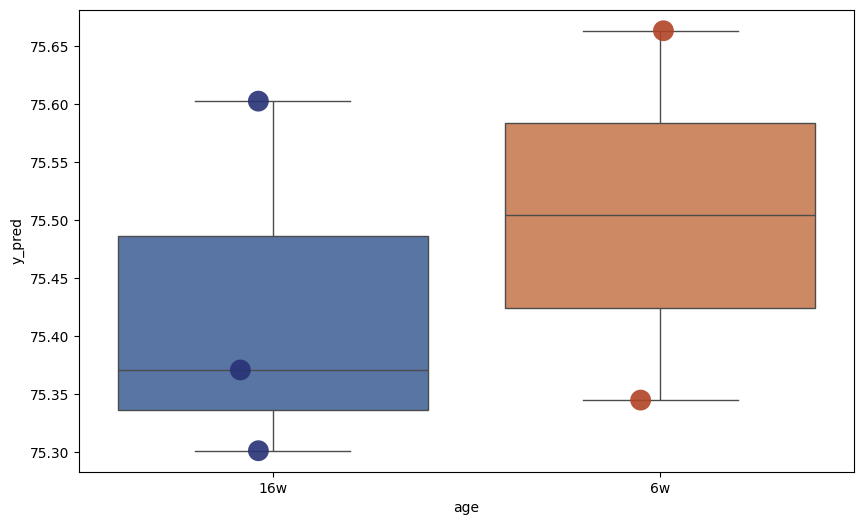

Components: 2
              y_pred
muscle_18  88.568121
muscle_17  78.934348
muscle_15  77.961710
muscle_7   70.128392
muscle_6   70.121096
              y_pred  age
muscle_18  88.568121  16w
muscle_17  78.934348  16w
muscle_15  77.961710  16w
muscle_7   70.128392   6w
muscle_6   70.121096   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


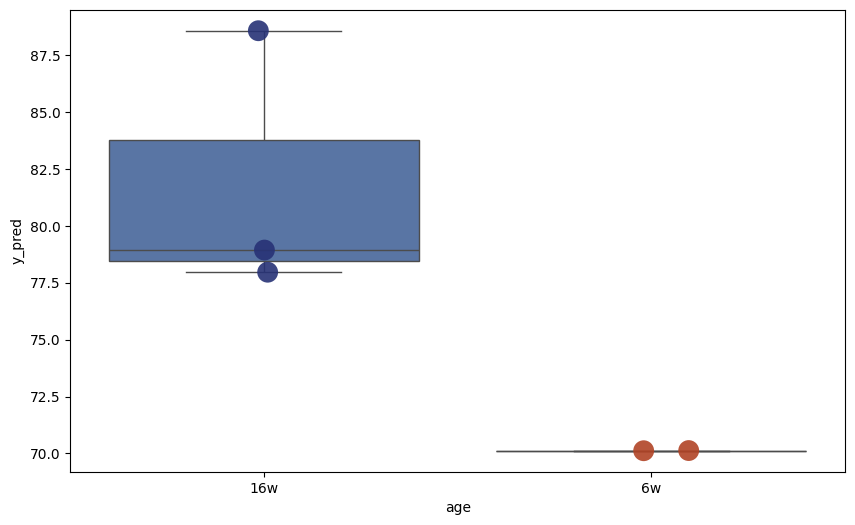

Components: 3
              y_pred
muscle_18  88.407645
muscle_17  79.216115
muscle_15  78.386516
muscle_7   70.493291
muscle_6   70.954367
              y_pred  age
muscle_18  88.407645  16w
muscle_17  79.216115  16w
muscle_15  78.386516  16w
muscle_7   70.493291   6w
muscle_6   70.954367   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


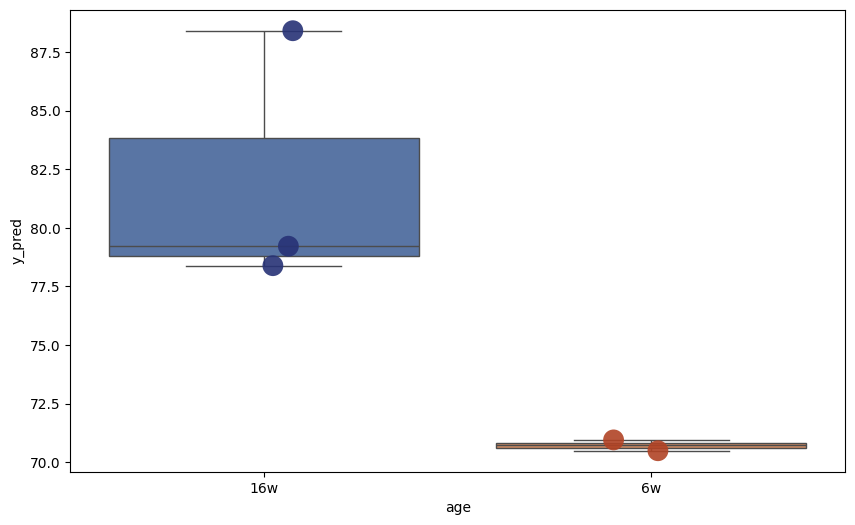

Components: 4
              y_pred
muscle_18  88.431353
muscle_17  79.322811
muscle_15  78.448098
muscle_7   70.319360
muscle_6   71.270673
              y_pred  age
muscle_18  88.431353  16w
muscle_17  79.322811  16w
muscle_15  78.448098  16w
muscle_7   70.319360   6w
muscle_6   71.270673   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


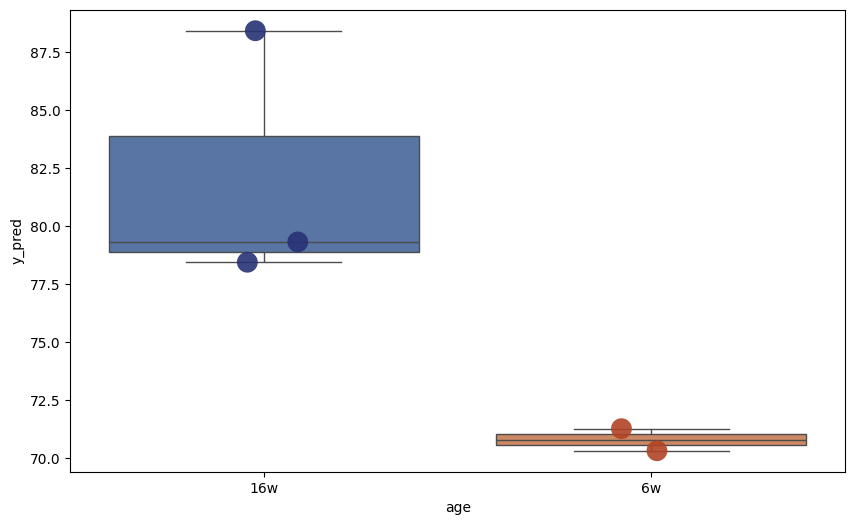

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 5
              y_pred
muscle_18  84.264645
muscle_17  78.474195
muscle_15  77.006302
muscle_7   71.560142
muscle_6   70.885009
              y_pred  age
muscle_18  84.264645  16w
muscle_17  78.474195  16w
muscle_15  77.006302  16w
muscle_7   71.560142   6w
muscle_6   70.885009   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


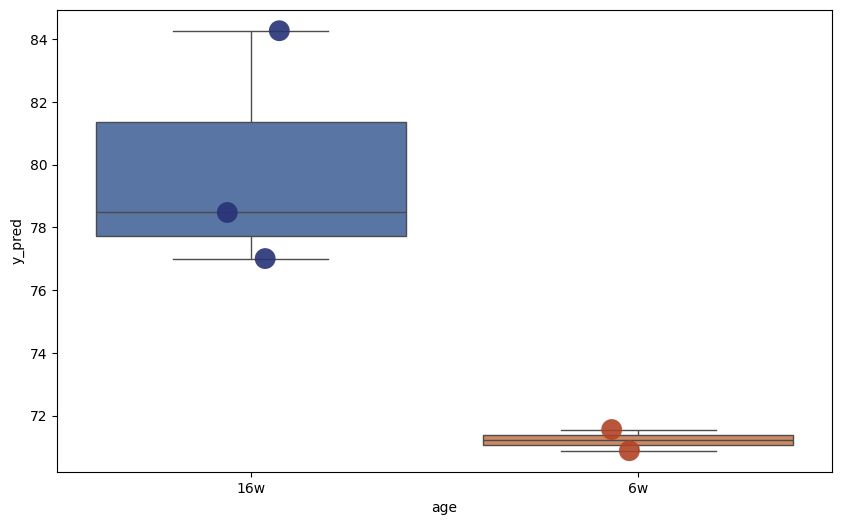

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 6
              y_pred
muscle_18  84.143880
muscle_17  78.372468
muscle_15  76.942230
muscle_7   71.637588
muscle_6   70.868949
              y_pred  age
muscle_18  84.143880  16w
muscle_17  78.372468  16w
muscle_15  76.942230  16w
muscle_7   71.637588   6w
muscle_6   70.868949   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


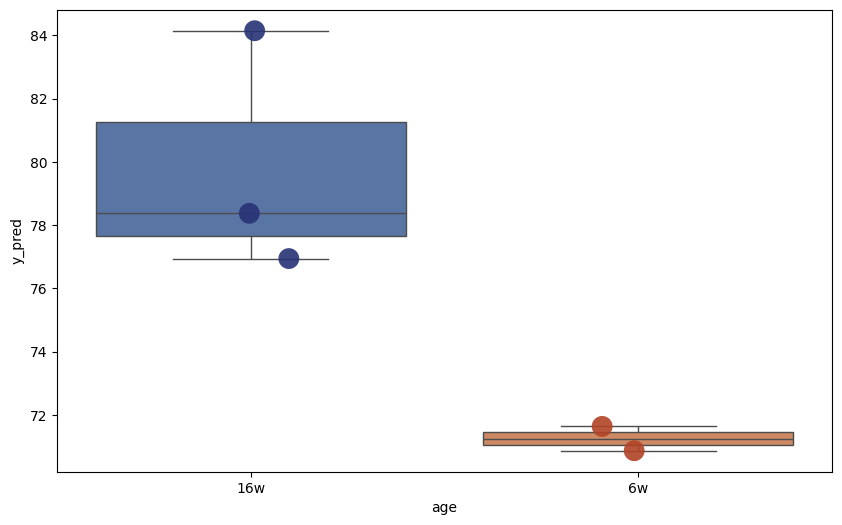

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 7
              y_pred
muscle_18  83.843624
muscle_17  77.513969
muscle_15  76.138858
muscle_7   71.683764
muscle_6   70.398721
              y_pred  age
muscle_18  83.843624  16w
muscle_17  77.513969  16w
muscle_15  76.138858  16w
muscle_7   71.683764   6w
muscle_6   70.398721   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


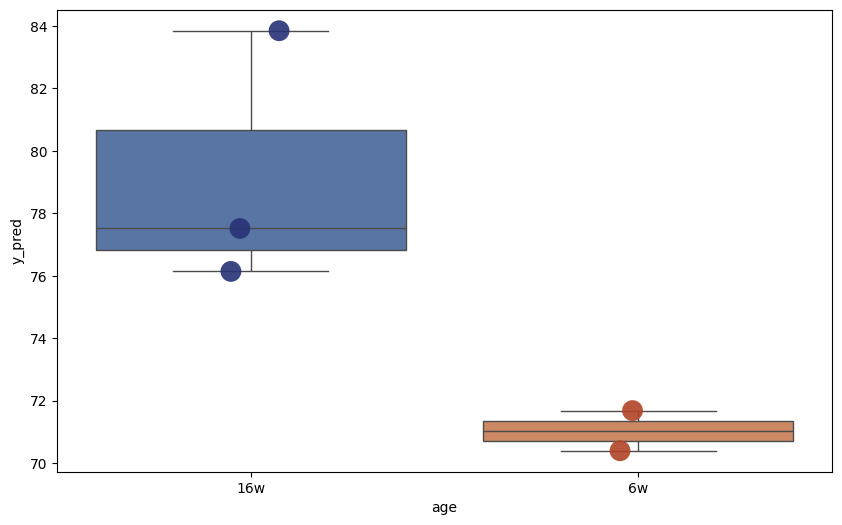

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 8
              y_pred
muscle_18  84.122496
muscle_17  77.690645
muscle_15  76.363665
muscle_7   71.644443
muscle_6   70.743995
              y_pred  age
muscle_18  84.122496  16w
muscle_17  77.690645  16w
muscle_15  76.363665  16w
muscle_7   71.644443   6w
muscle_6   70.743995   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


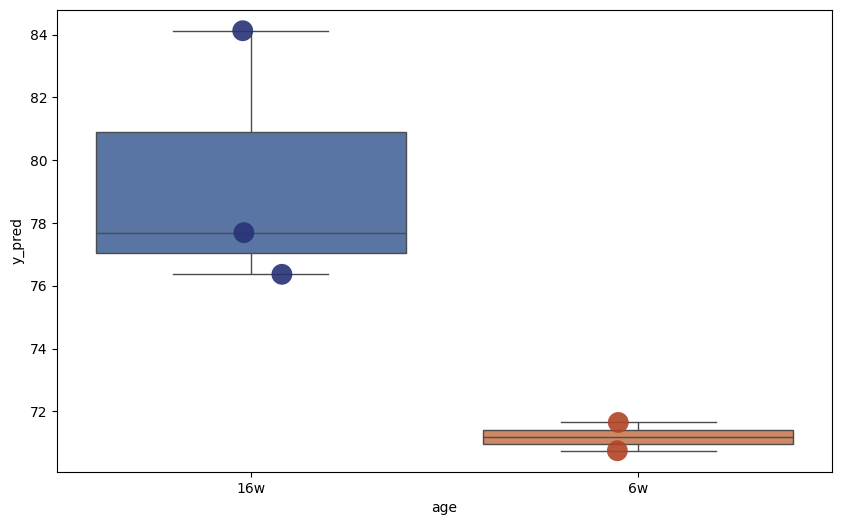

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 9
              y_pred
muscle_18  84.363399
muscle_17  77.653341
muscle_15  76.337082
muscle_7   71.387478
muscle_6   70.366002
              y_pred  age
muscle_18  84.363399  16w
muscle_17  77.653341  16w
muscle_15  76.337082  16w
muscle_7   71.387478   6w
muscle_6   70.366002   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


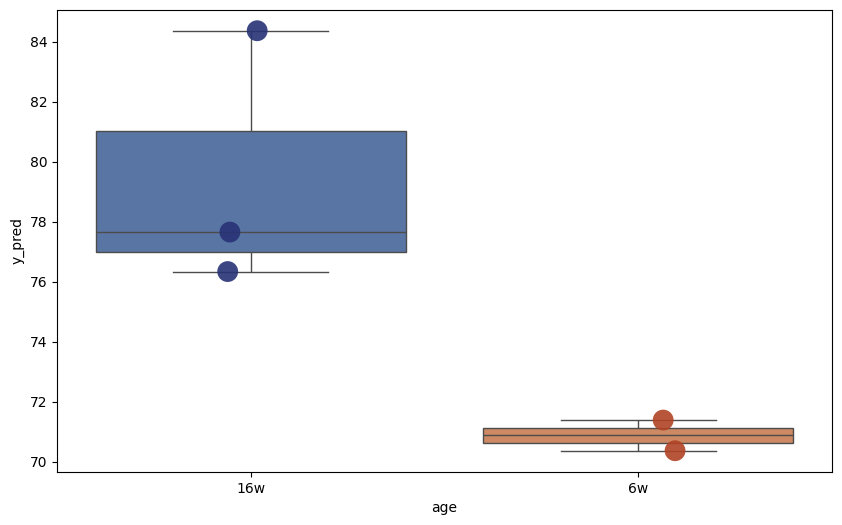

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 10
              y_pred
muscle_18  84.083281
muscle_17  77.526683
muscle_15  76.277350
muscle_7   71.578081
muscle_6   70.407805
              y_pred  age
muscle_18  84.083281  16w
muscle_17  77.526683  16w
muscle_15  76.277350  16w
muscle_7   71.578081   6w
muscle_6   70.407805   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


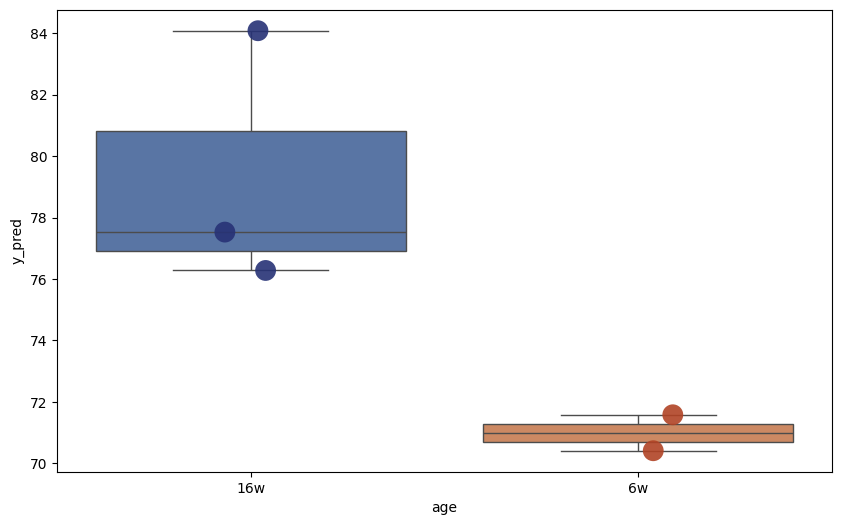

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 11
              y_pred
muscle_18  84.337168
muscle_17  78.088089
muscle_15  76.597721
muscle_7   71.540434
muscle_6   70.940063
              y_pred  age
muscle_18  84.337168  16w
muscle_17  78.088089  16w
muscle_15  76.597721  16w
muscle_7   71.540434   6w
muscle_6   70.940063   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


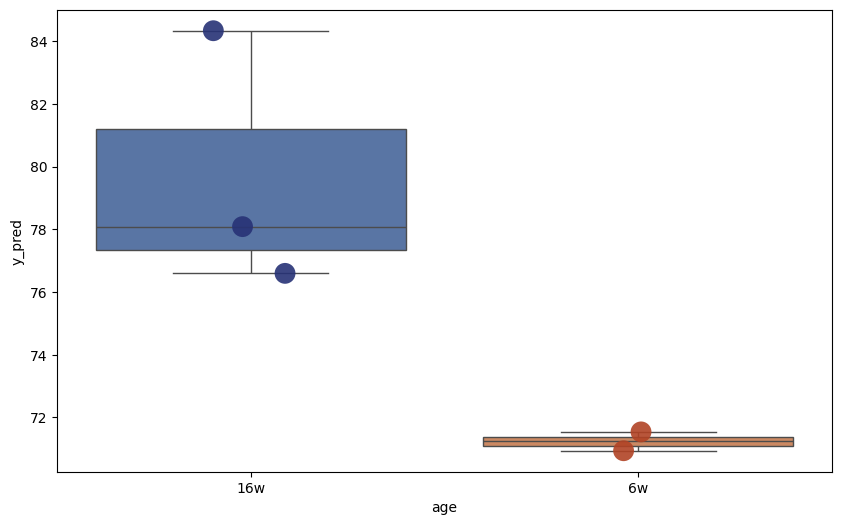

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 12
              y_pred
muscle_18  85.371523
muscle_17  79.438020
muscle_15  77.488538
muscle_7   71.339688
muscle_6   70.869078
              y_pred  age
muscle_18  85.371523  16w
muscle_17  79.438020  16w
muscle_15  77.488538  16w
muscle_7   71.339688   6w
muscle_6   70.869078   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


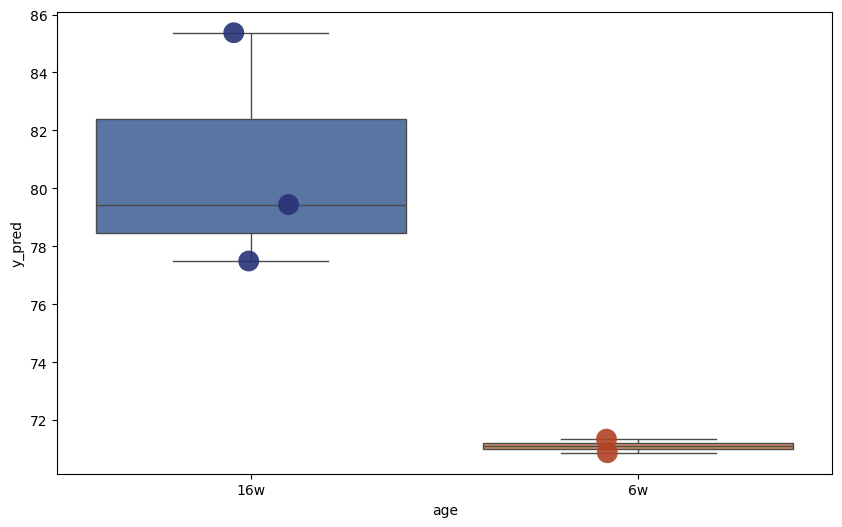

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 13
              y_pred
muscle_18  85.739423
muscle_17  79.437335
muscle_15  77.572812
muscle_7   71.120779
muscle_6   70.894182
              y_pred  age
muscle_18  85.739423  16w
muscle_17  79.437335  16w
muscle_15  77.572812  16w
muscle_7   71.120779   6w
muscle_6   70.894182   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


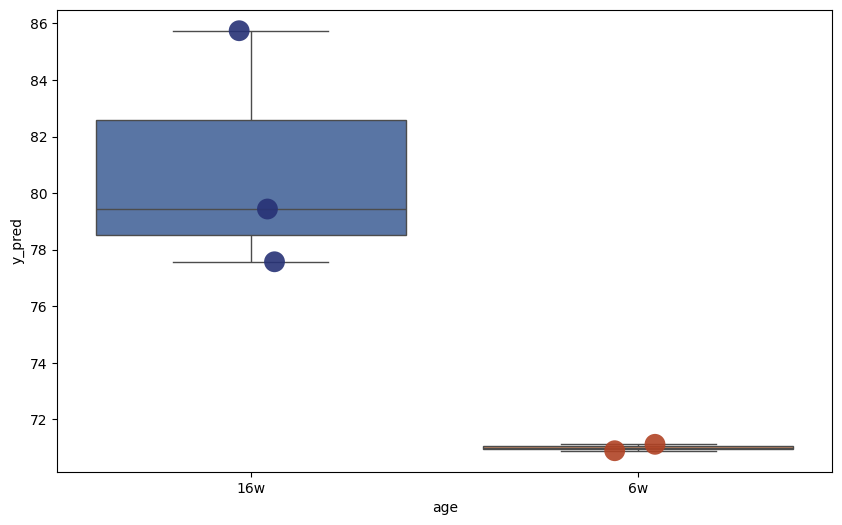

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 14
              y_pred
muscle_18  85.494541
muscle_17  79.858540
muscle_15  77.722047
muscle_7   71.444997
muscle_6   71.018042
              y_pred  age
muscle_18  85.494541  16w
muscle_17  79.858540  16w
muscle_15  77.722047  16w
muscle_7   71.444997   6w
muscle_6   71.018042   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


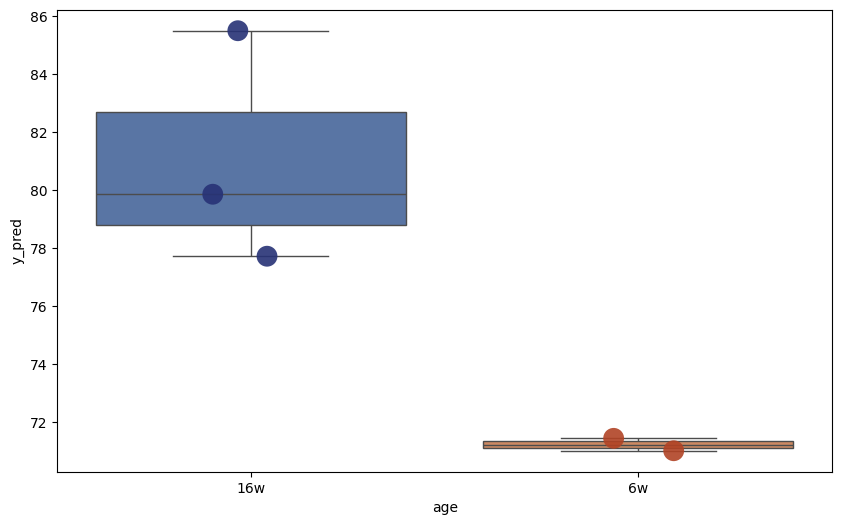

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 15
              y_pred
muscle_18  84.833929
muscle_17  80.177139
muscle_15  77.927742
muscle_7   71.784728
muscle_6   70.195971
              y_pred  age
muscle_18  84.833929  16w
muscle_17  80.177139  16w
muscle_15  77.927742  16w
muscle_7   71.784728   6w
muscle_6   70.195971   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


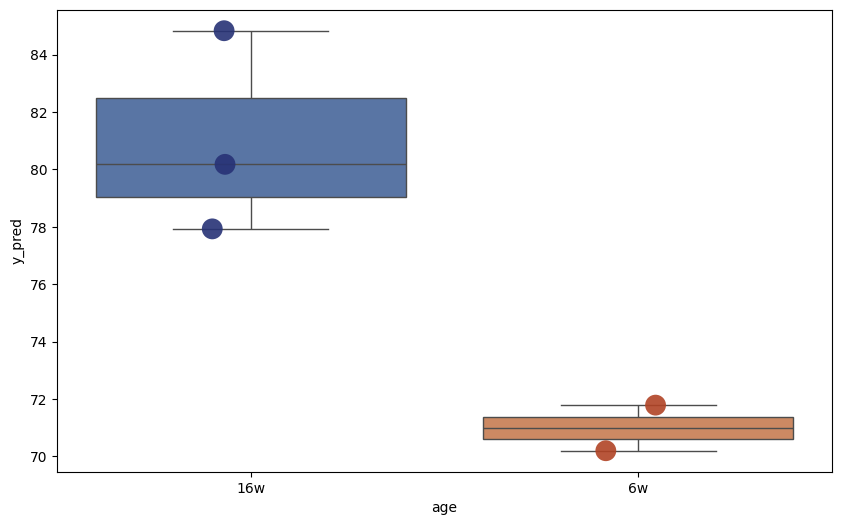

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 16
              y_pred
muscle_18  84.750443
muscle_17  80.225268
muscle_15  77.953092
muscle_7   71.893419
muscle_6   70.193386
              y_pred  age
muscle_18  84.750443  16w
muscle_17  80.225268  16w
muscle_15  77.953092  16w
muscle_7   71.893419   6w
muscle_6   70.193386   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


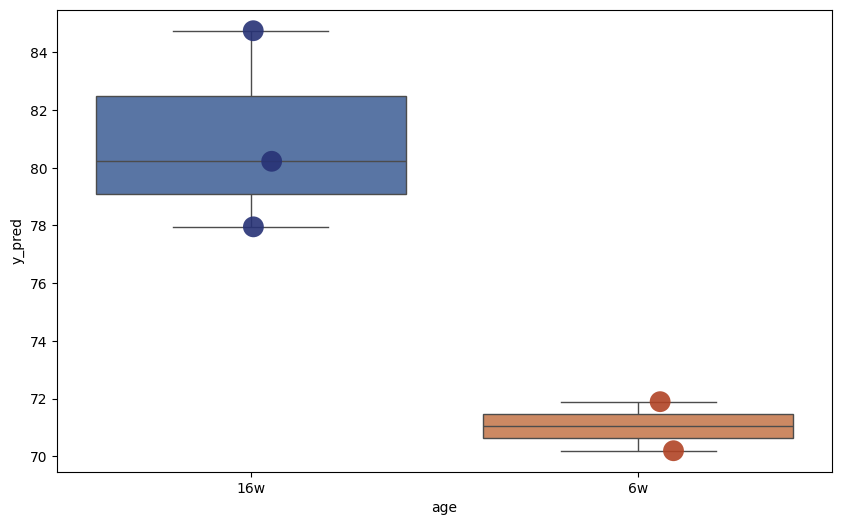

Components: 17
              y_pred
muscle_18  84.720052
muscle_17  80.172814
muscle_15  77.918000
muscle_7   71.978483
muscle_6   70.196097
              y_pred  age
muscle_18  84.720052  16w
muscle_17  80.172814  16w
muscle_15  77.918000  16w
muscle_7   71.978483   6w
muscle_6   70.196097   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


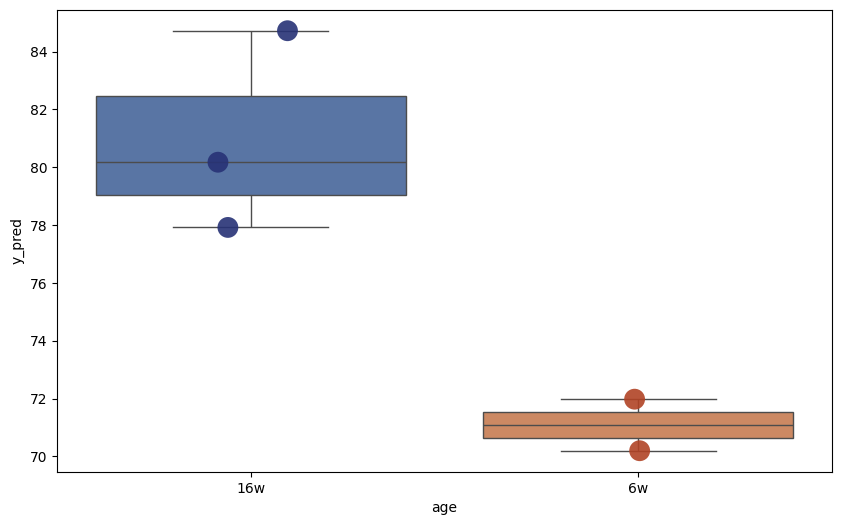

Components: 18
              y_pred
muscle_18  84.448407
muscle_17  79.949576
muscle_15  77.784502
muscle_7   71.939711
muscle_6   69.707108
              y_pred  age
muscle_18  84.448407  16w
muscle_17  79.949576  16w
muscle_15  77.784502  16w
muscle_7   71.939711   6w
muscle_6   69.707108   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


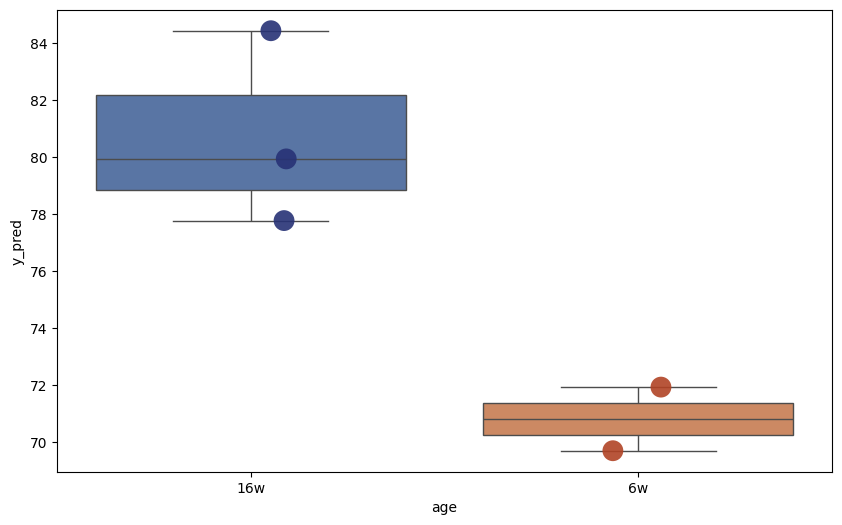

Components: 19
              y_pred
muscle_18  84.744572
muscle_17  80.000024
muscle_15  77.944957
muscle_7   71.949924
muscle_6   70.001291
              y_pred  age
muscle_18  84.744572  16w
muscle_17  80.000024  16w
muscle_15  77.944957  16w
muscle_7   71.949924   6w
muscle_6   70.001291   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


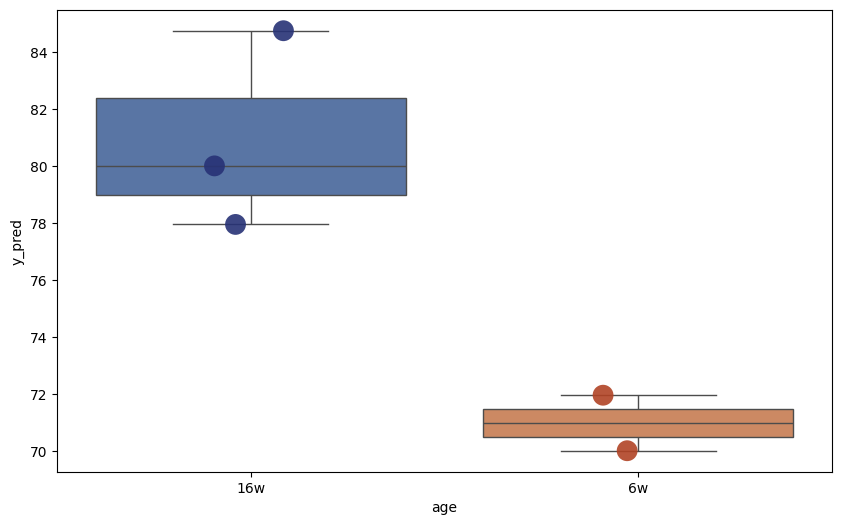

Components: 20
              y_pred
muscle_18  84.878754
muscle_17  80.295952
muscle_15  78.031588
muscle_7   71.384168
muscle_6   69.422093
              y_pred  age
muscle_18  84.878754  16w
muscle_17  80.295952  16w
muscle_15  78.031588  16w
muscle_7   71.384168   6w
muscle_6   69.422093   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


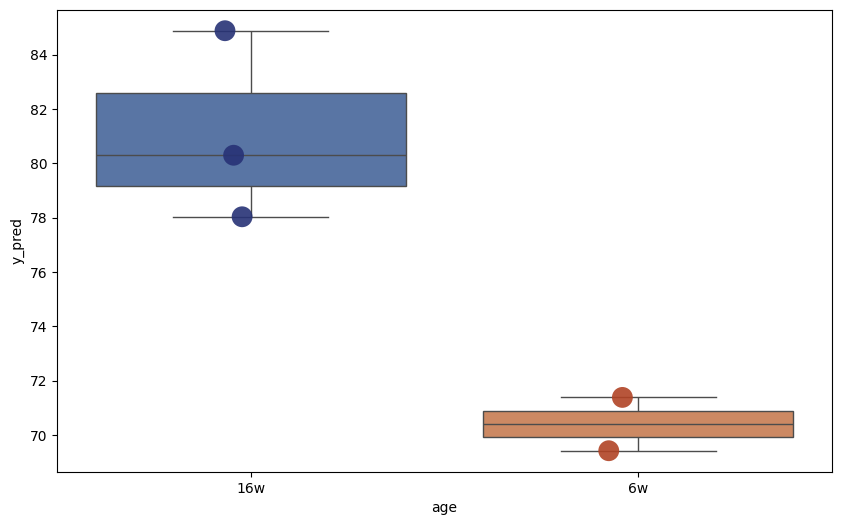

Components: 21
              y_pred
muscle_18  85.134849
muscle_17  80.550874
muscle_15  78.278756
muscle_7   71.345961
muscle_6   69.624436
              y_pred  age
muscle_18  85.134849  16w
muscle_17  80.550874  16w
muscle_15  78.278756  16w
muscle_7   71.345961   6w
muscle_6   69.624436   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


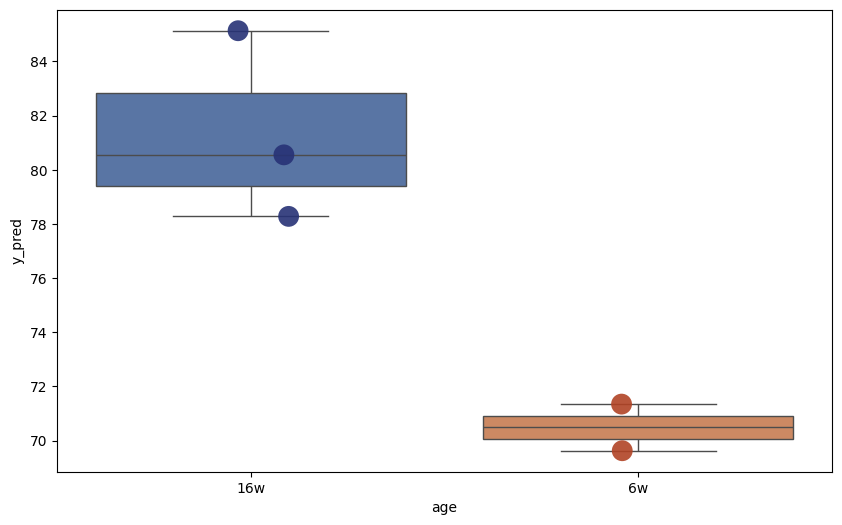

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 22
              y_pred
muscle_18  85.713102
muscle_17  80.773509
muscle_15  78.598442
muscle_7   70.958657
muscle_6   69.130939
              y_pred  age
muscle_18  85.713102  16w
muscle_17  80.773509  16w
muscle_15  78.598442  16w
muscle_7   70.958657   6w
muscle_6   69.130939   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


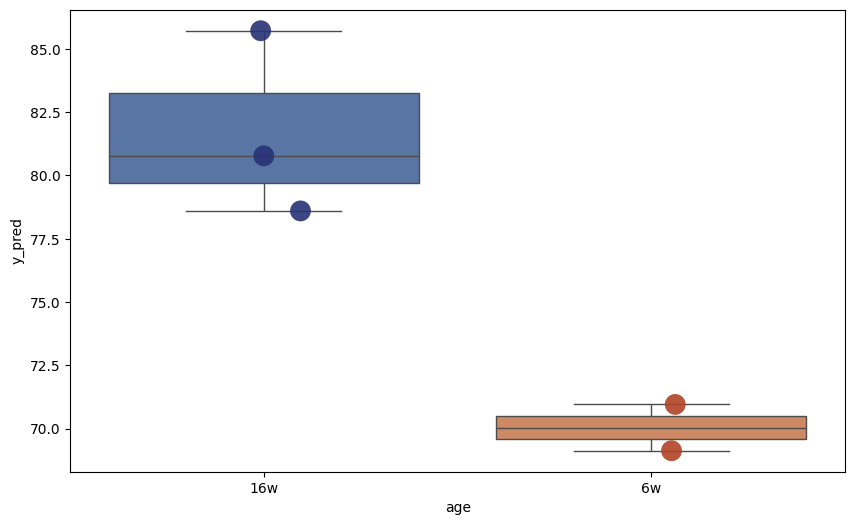

Components: 23
              y_pred
muscle_18  85.737047
muscle_17  80.773029
muscle_15  78.611467
muscle_7   70.940250
muscle_6   69.115636
              y_pred  age
muscle_18  85.737047  16w
muscle_17  80.773029  16w
muscle_15  78.611467  16w
muscle_7   70.940250   6w
muscle_6   69.115636   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


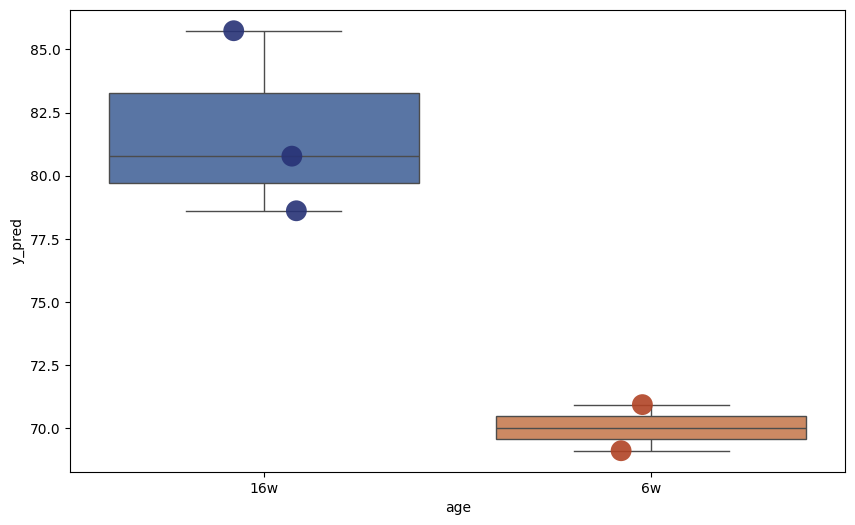

Components: 24
               y_pred
muscle_18  103.051253
muscle_17   89.322645
muscle_15   87.472383
muscle_7    57.699531
muscle_6    65.447631
               y_pred  age
muscle_18  103.051253  16w
muscle_17   89.322645  16w
muscle_15   87.472383  16w
muscle_7    57.699531   6w
muscle_6    65.447631   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


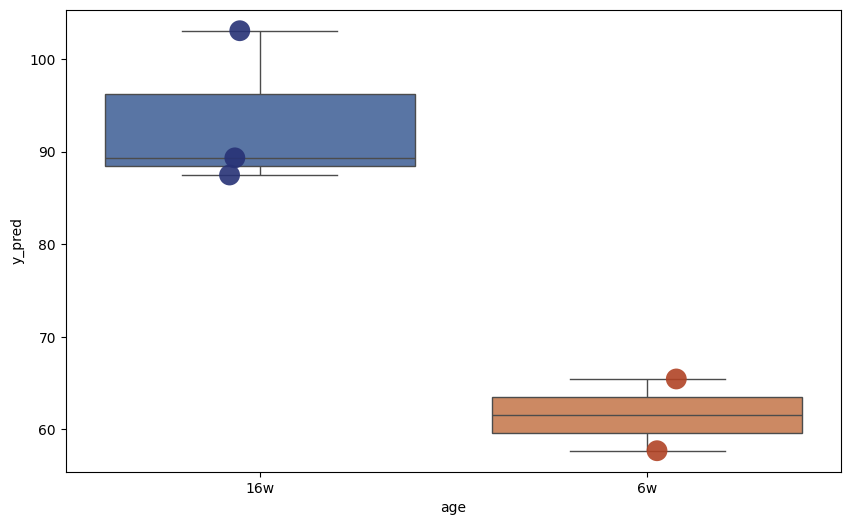

Components: 25
               y_pred
muscle_18  103.047921
muscle_17   89.328667
muscle_15   87.473847
muscle_7    57.699820
muscle_6    65.451851
               y_pred  age
muscle_18  103.047921  16w
muscle_17   89.328667  16w
muscle_15   87.473847  16w
muscle_7    57.699820   6w
muscle_6    65.451851   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


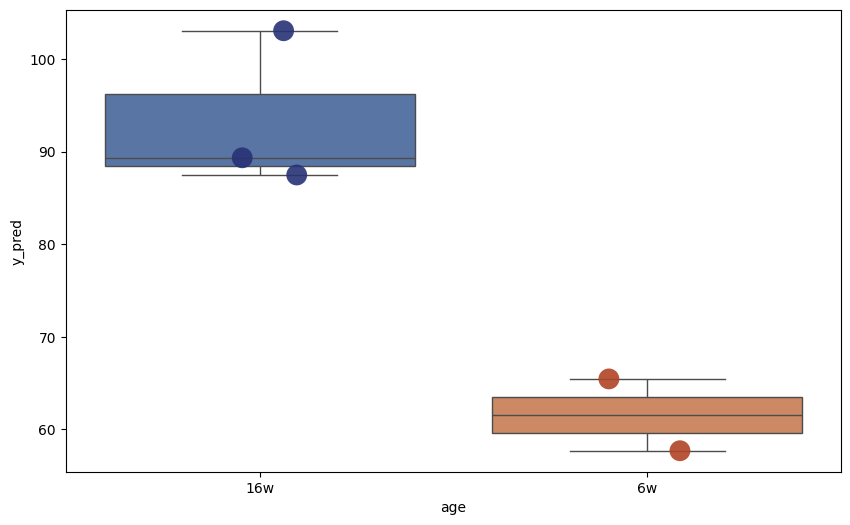

Components: 26
               y_pred
muscle_18  103.339469
muscle_17   89.471546
muscle_15   87.877133
muscle_7    57.620884
muscle_6    65.406583
               y_pred  age
muscle_18  103.339469  16w
muscle_17   89.471546  16w
muscle_15   87.877133  16w
muscle_7    57.620884   6w
muscle_6    65.406583   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


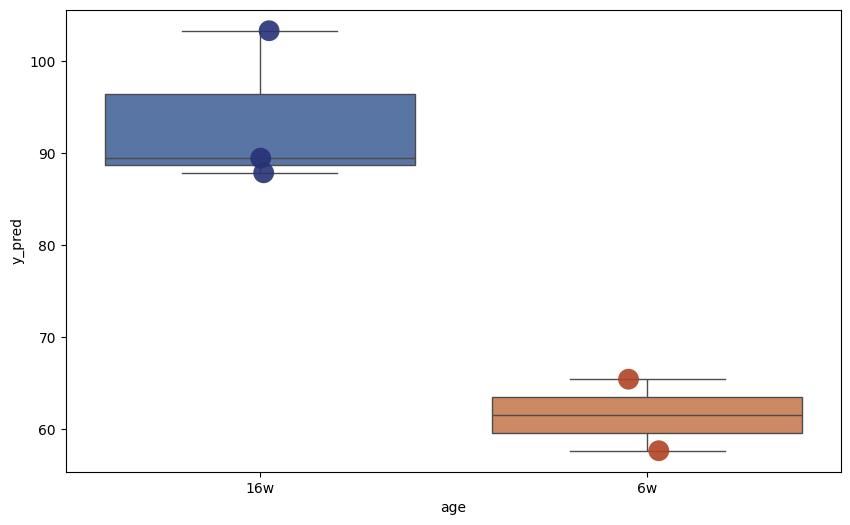

Components: 27
               y_pred
muscle_18  103.338578
muscle_17   89.470920
muscle_15   87.877317
muscle_7    57.621090
muscle_6    65.402583
               y_pred  age
muscle_18  103.338578  16w
muscle_17   89.470920  16w
muscle_15   87.877317  16w
muscle_7    57.621090   6w
muscle_6    65.402583   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


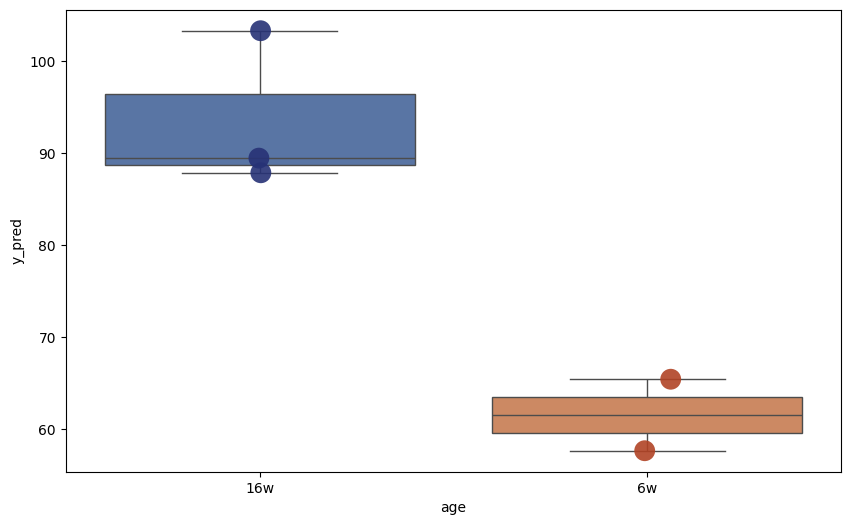

In [217]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_female.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_female["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [148]:
n_components = 24

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_female = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_female.index.tolist())

results_df_female["age"] = df_intervention_test_metadata_female["age"]

print(results_df_female)
results_df_female.to_csv("./AlanXu_muscle_femaleOnly_Calibratedpredictions_24PCs_EC-250725.csv")

               y_pred  age
muscle_18  103.040263  16w
muscle_17   89.295470  16w
muscle_15   87.442823  16w
muscle_7    57.718379   6w
muscle_6    65.475607   6w


In [ ]:
##### Sample rotation

In [219]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_female.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [220]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_female.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_female['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_female.drop(
            atlas_plus_intervention_female.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_female.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_female.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_female.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/60] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_18
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/60] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_17
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/60] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_16
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/60] Running PCR for combo: muscle_9_muscle_8__muscle_19_muscle_15
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs:

# Heart

### Prep the data

In [149]:
select_tissue = "Heart"
tissue_df_norm = df_norm_metadata.loc[df_norm_metadata.iloc[:,-2] == select_tissue]
tissue_df_norm.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,M,Heart,162
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773,M,Heart,103
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918,M,Heart,103
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807,M,Heart,134
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187,M,Heart,47


In [150]:
tissue_df_norm_male = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "M"]
tissue_df_norm_female = tissue_df_norm.loc[tissue_df_norm.iloc[:,-3] == "F"]

tissue_df_norm_male.head(10)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,sex,tissue,age_days
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,M,Heart,162
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773,M,Heart,103
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918,M,Heart,103
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807,M,Heart,134
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187,M,Heart,47
C13_2,33.085812,705.070067,272.672728,547.627237,544.204566,1108.945154,941.234313,1889.313966,818.018185,614.939751,...,168.851731,1445.507727,85.566756,816.877295,4962.871832,285.222519,460.919591,M,Heart,162
C14_2,0.958253,532.788571,200.274841,539.496341,507.873998,886.383864,1111.573279,1517.872477,736.896424,547.162364,...,107.324317,1229.438376,29.705838,848.053751,6450.958027,286.517595,431.213772,M,Heart,152
C16_2,0.847254,628.662167,216.896920,571.048923,454.975180,757.444714,1053.983472,925.200926,637.981957,621.884139,...,102.517685,1214.114402,22.875847,777.778800,15932.603853,423.626797,389.736654,M,Heart,147
D13_2,45.800610,581.561240,281.194446,439.898887,511.262628,894.709600,895.774730,1752.139633,748.786725,631.622372,...,113.968961,1360.171618,38.344697,996.962126,5850.761705,316.343751,493.155410,M,Heart,78
D15_2,188.492804,594.318841,358.445332,448.056665,475.867079,1056.795721,903.323438,2894.343056,854.912718,637.579485,...,136.992038,1396.700777,13.390199,660.239822,2889.192979,258.533846,456.296788,M,Heart,75


In [151]:
tissue_df_norm_expression_male = tissue_df_norm_male.iloc[:,:-3]
tissue_df_norm_expression_female = tissue_df_norm_female.iloc[:,:-3]

tissue_df_norm_expression_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,766.967930,67.818708,1583.258555,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,651.066933,81.971275,2270.335570,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187


In [152]:
tissue_pca_df_male = tissue_df_norm_expression_male.copy()
tissue_pca_df_female = tissue_df_norm_expression_female.copy()

tissue_pca_df_male.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,766.967930,67.818708,1583.258555,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,651.066933,81.971275,2270.335570,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187


In [153]:
tissue_df_male_age = tissue_df_norm_expression_male.copy()
tissue_df_female_age = tissue_df_norm_expression_female.copy()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918


In [154]:
tissue_df_male_age["age"] = tissue_df_norm_male["age_days"].tolist()
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

tissue_df_male_age.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,162
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773,103
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918,103


In [155]:
df_intervention = load_intervention_countdata(select_tissue)

df_intervention.head(5)

,Unnamed: 0,Heart_20,Heart_19,Heart_18,Heart_17,Heart_16,Heart_15,Heart_14,Heart_13,Heart_12,...,Heart_10,Heart_9,Heart_8,Heart_7,Heart_6,Heart_5,Heart_4,Heart_3,Heart_2,Heart_1
0,nadsyn1,151.327568,182.330309,164.475709,167.432999,191.037771,154.890147,159.820750,156.610045,192.153323,...,180.069409,147.666303,178.958188,219.168922,175.501225,170.160069,187.644093,144.813586,196.799505,213.422826
1,dnaja3,316.517203,406.387952,365.892485,351.714601,456.151413,454.821935,520.065359,405.097982,390.505140,...,361.837587,355.372752,464.032287,489.000007,459.173017,350.383367,475.429853,556.893424,473.041013,536.999368
2,f2r,128.224123,138.788743,169.753004,90.561245,62.379680,127.135265,158.956854,231.782866,68.183437,...,47.565504,50.303905,50.360093,35.243244,33.113439,56.720023,52.501456,76.666016,43.332001,57.830701
3,LOC107382877,145.551707,143.324323,168.873455,124.258452,109.164441,141.460366,117.489848,164.962580,167.359346,...,107.022385,90.871571,82.734439,145.378380,112.585692,80.505839,79.724434,93.702909,133.607004,66.092230
4,fezf1,0.000000,0.000000,0.000000,0.000000,2.599153,0.000000,1.727792,2.088134,1.770998,...,0.000000,1.622707,3.597150,2.202703,8.830250,1.829678,7.777994,4.259223,5.416500,5.507686


In [156]:
df_intervention.rename(columns={"Unnamed: 0": "Sample.Name"}, inplace=True)
df_intervention.set_index("Sample.Name", inplace=True)
df_intervention.head(3)

,Heart_20,Heart_19,Heart_18,Heart_17,Heart_16,Heart_15,Heart_14,Heart_13,Heart_12,Heart_11,Heart_10,Heart_9,Heart_8,Heart_7,Heart_6,Heart_5,Heart_4,Heart_3,Heart_2,Heart_1
Sample.Name,,,,,,,,,,,,,,,,,,,,
nadsyn1,151.327568,182.330309,164.475709,167.432999,191.037771,154.890147,159.820750,156.610045,192.153323,164.843222,180.069409,147.666303,178.958188,219.168922,175.501225,170.160069,187.644093,144.813586,196.799505,213.422826
dnaja3,316.517203,406.387952,365.892485,351.714601,456.151413,454.821935,520.065359,405.097982,390.505140,441.476674,361.837587,355.372752,464.032287,489.000007,459.173017,350.383367,475.429853,556.893424,473.041013,536.999368
f2r,128.224123,138.788743,169.753004,90.561245,62.379680,127.135265,158.956854,231.782866,68.183437,111.790231,47.565504,50.303905,50.360093,35.243244,33.113439,56.720023,52.501456,76.666016,43.332001,57.830701


In [157]:
df_intervention = df_intervention.T

df_intervention.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.000000,4.620689,180.206875,548.706831,...,5.775861,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336
Heart_19,182.330309,406.387952,138.788743,143.324323,0.0,65.312349,1.814232,0.000000,270.320558,426.344504,...,18.142319,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.000000,3.518197,164.475709,498.704421,...,7.036394,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686


In [158]:
df_intervention_age = df_intervention.copy()

In [159]:
df_intervention_metadata = load_intervention_metadata(select_tissue)
df_intervention_metadata.set_index("Sample.Name", inplace=True)
print(df_intervention_metadata.head(1))

                     Run age Assay.Type  AvgSpotLen       Bases  \
Sample.Name                                                       
brain_10     SRR24062662  6w    RNA-Seq         300  3489947700   

                   BIOMATERIAL_PROVIDER   BioProject     BioSample  \
Sample.Name                                                          
brain_10     Dario Valenzano laboratory  PRJNA952180  SAMN34067642   

                       BioSampleModel       Bytes  ...           create_date  \
Sample.Name                                        ...                         
brain_10     Model organism or animal  1264822394  ...  2023-04-04T11:25:00Z   

            version                  Sample_info     sex  SRA.Study  strain  \
Sample.Name                                                                   
brain_10          1  GRZ-AD_8239_6w_Female_Brain  female  SRP430823  GRZ-AD   

            tissue                       file          lib UsedForTraining  
Sample.Name                    

In [160]:
df_intervention_metadata = df_intervention_metadata[df_intervention_metadata["tissue"] == select_tissue]

df_intervention_metadata.head(5)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_20,SRR24062706,16w,RNA-Seq,300,4686084900,Dario Valenzano laboratory,PRJNA952180,SAMN34067672,Model organism or animal,1702634097,...,2023-04-04T11:29:00Z,1,GRZ-AD_8241_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062706.featureCounts,SRR24062706,No
Heart_19,SRR24062707,16w,RNA-Seq,300,5791702200,Dario Valenzano laboratory,PRJNA952180,SAMN34067671,Model organism or animal,2101107088,...,2023-04-04T11:33:00Z,1,GRZ-AD_8232_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062707.featureCounts,SRR24062707,No
Heart_18,SRR24062708,16w,RNA-Seq,300,6389682000,Dario Valenzano laboratory,PRJNA952180,SAMN34067670,Model organism or animal,2325189392,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062708.featureCounts,SRR24062708,No
Heart_17,SRR24062709,16w,RNA-Seq,300,4797343200,Dario Valenzano laboratory,PRJNA952180,SAMN34067669,Model organism or animal,1735025366,...,2023-04-04T11:23:00Z,1,GRZ-AD_8249_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062709.featureCounts,SRR24062709,No
Heart_16,SRR24062710,16w,RNA-Seq,300,3748359600,Dario Valenzano laboratory,PRJNA952180,SAMN34067668,Model organism or animal,1365565651,...,2023-04-04T11:26:00Z,1,GRZ-AD_8225_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062710.featureCounts,SRR24062710,No


In [161]:
df_intervention_age = df_intervention_age.loc[df_intervention_metadata.index.tolist(),]

df_intervention_age.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_20,151.327568,316.517203,128.224123,145.551707,0.000000,91.258610,0.000000,4.620689,180.206875,548.706831,...,5.775861,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336
Heart_19,182.330309,406.387952,138.788743,143.324323,0.000000,65.312349,1.814232,0.000000,270.320558,426.344504,...,18.142319,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597
Heart_18,164.475709,365.892485,169.753004,168.873455,0.000000,84.436727,0.000000,3.518197,164.475709,498.704421,...,7.036394,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686
Heart_17,167.432999,351.714601,90.561245,124.258452,0.000000,94.773395,0.000000,0.000000,358.032827,498.086845,...,21.060755,1025.658747,0.0,0.000000,6.318226,6.318226,35.803283,1825.967420,174.804263,92.667320
Heart_16,191.037771,456.151413,62.379680,109.164441,2.599153,64.978834,0.000000,0.000000,218.328882,488.640830,...,7.797460,873.315526,0.0,2.599153,2.599153,7.797460,49.383914,2432.807538,210.531422,116.961901


In [162]:
df_intervention_age["tissue"] = df_intervention_metadata["tissue"].tolist()
df_intervention_age["og_age"] = df_intervention_metadata["age"].tolist()
df_intervention_age["sex"] = df_intervention_metadata["sex"].tolist()

age_mapping = {
    "6w": 42,
    "16w": 112
}

df_intervention_age["age"] = df_intervention_age["og_age"].map(age_mapping)

df_intervention_age.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.000000,4.620689,180.206875,548.706831,...,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,Heart,16w,female,112
Heart_19,182.330309,406.387952,138.788743,143.324323,0.0,65.312349,1.814232,0.000000,270.320558,426.344504,...,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,Heart,16w,female,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.000000,3.518197,164.475709,498.704421,...,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,Heart,16w,female,112


In [163]:
df_intervention_age_counts = df_intervention_age.iloc[:,:-4]

df_intervention_age_counts.head(5)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_20,151.327568,316.517203,128.224123,145.551707,0.000000,91.258610,0.000000,4.620689,180.206875,548.706831,...,5.775861,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336
Heart_19,182.330309,406.387952,138.788743,143.324323,0.000000,65.312349,1.814232,0.000000,270.320558,426.344504,...,18.142319,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597
Heart_18,164.475709,365.892485,169.753004,168.873455,0.000000,84.436727,0.000000,3.518197,164.475709,498.704421,...,7.036394,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686
Heart_17,167.432999,351.714601,90.561245,124.258452,0.000000,94.773395,0.000000,0.000000,358.032827,498.086845,...,21.060755,1025.658747,0.0,0.000000,6.318226,6.318226,35.803283,1825.967420,174.804263,92.667320
Heart_16,191.037771,456.151413,62.379680,109.164441,2.599153,64.978834,0.000000,0.000000,218.328882,488.640830,...,7.797460,873.315526,0.0,2.599153,2.599153,7.797460,49.383914,2432.807538,210.531422,116.961901


##### Female data prep

In [164]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_counts_female = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_female = df_intervention_age_counts_female.loc[
    df_intervention_age_counts_female.index.isin(female_samples)
]

df_intervention_age_counts_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.000000,4.620689,180.206875,548.706831,...,5.775861,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336
Heart_19,182.330309,406.387952,138.788743,143.324323,0.0,65.312349,1.814232,0.000000,270.320558,426.344504,...,18.142319,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.000000,3.518197,164.475709,498.704421,...,7.036394,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686


In [165]:
df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_20,SRR24062706,16w,RNA-Seq,300,4686084900,Dario Valenzano laboratory,PRJNA952180,SAMN34067672,Model organism or animal,1702634097,...,2023-04-04T11:29:00Z,1,GRZ-AD_8241_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062706.featureCounts,SRR24062706,No
Heart_19,SRR24062707,16w,RNA-Seq,300,5791702200,Dario Valenzano laboratory,PRJNA952180,SAMN34067671,Model organism or animal,2101107088,...,2023-04-04T11:33:00Z,1,GRZ-AD_8232_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062707.featureCounts,SRR24062707,No
Heart_18,SRR24062708,16w,RNA-Seq,300,6389682000,Dario Valenzano laboratory,PRJNA952180,SAMN34067670,Model organism or animal,2325189392,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062708.featureCounts,SRR24062708,No


##### Male data prep

In [166]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples ,
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_15,154.890147,454.821935,127.135265,141.460366,0.000000,100.275702,1.790638,0.0,461.984486,415.427910,...,12.534463,877.412395,0.000000,0.000000,12.534463,12.534463,30.440838,2147.869731,184.435667,99.380384
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,10.366751,879.446072,0.000000,3.455584,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011
Heart_13,156.610045,405.097982,231.782866,164.962580,2.088134,77.260955,0.000000,0.0,235.959134,491.755540,...,8.352536,1050.331365,2.088134,12.528804,8.352536,2.088134,31.322009,2570.492864,139.904973,73.084687


In [167]:
df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_15,SRR24062711,16w,RNA-Seq,300,5354568900,Dario Valenzano laboratory,PRJNA952180,SAMN34067667,Model organism or animal,1944591023,...,2023-04-04T11:27:00Z,1,GRZ-AD_8244_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062711.featureCounts,SRR24062711,No
Heart_14,SRR24062712,16w,RNA-Seq,300,5835318000,Dario Valenzano laboratory,PRJNA952180,SAMN34067666,Model organism or animal,2124298064,...,2023-04-04T11:30:00Z,1,GRZ-AD_8245_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062712.featureCounts,SRR24062712,No
Heart_13,SRR24062713,16w,RNA-Seq,300,4789725900,Dario Valenzano laboratory,PRJNA952180,SAMN34067665,Model organism or animal,1751377969,...,2023-04-04T11:27:00Z,1,GRZ-AD_8222_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062713.featureCounts,SRR24062713,No


In [168]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [169]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,766.967930,67.818708,1583.258555,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,651.066933,81.971275,2270.335570,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187


In [170]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
Heart_15,0.000000,69.834864,57.300401,62.672314,82.369327,189.807579,291.873919,237.259474,103.856977,35.812751,...,307.989657,24.173607,1213.156934,51.033170,161.157379,3.581275,388.568346,1205.099065,777.136693,590.910389
Heart_14,3.455584,97.620242,77.750635,80.342323,48.378173,158.956854,406.031094,126.128808,131.312184,55.289340,...,300.635789,21.597399,1186.993028,38.875318,146.862311,11.230647,290.269037,3426.211316,972.746834,347.286170
Heart_13,12.528804,96.054161,91.877893,93.966027,73.084687,164.962580,321.572625,191.064254,114.847366,72.040620,...,349.762433,12.528804,1159.958397,25.057607,190.020187,9.396603,439.552192,1121.327919,854.046776,525.165683
Heart_12,3.541997,81.465925,108.916400,63.755941,79.694926,185.954828,234.657284,168.244845,92.091915,47.816956,...,297.527726,14.167987,1087.392997,34.534468,233.771784,10.625990,332.947693,653.498397,576.459968,544.581998
Heart_11,1.894750,74.842612,125.053478,91.895359,90.000609,195.159216,320.212695,197.053966,89.053235,56.842490,...,297.475699,3.789499,973.901332,66.316239,255.791206,11.368498,331.581193,590.214523,539.056282,640.425389


### Sex-Combined

In [171]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_norm.columns.intersection(df_intervention.columns)

# Select only the common columns from both DataFrames
tissue_df_norm_common = tissue_df_norm[common_columns]
df_intervention_common = df_intervention[common_columns]

In [172]:
tissue_df_norm_common.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918


In [173]:
df_intervention_common.head(3)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
Heart_20,2.310345,101.655160,63.534475,66.999992,32.344824,203.310320,307.275825,161.724118,115.517227,53.137925,...,351.172372,6.931034,1565.258433,34.655168,258.758590,18.482756,300.344791,1433.568793,1032.724014,504.810284
Heart_19,3.628464,106.132568,72.569277,74.383509,67.126581,206.822440,255.806702,189.587237,125.182003,43.541566,...,314.769240,9.071160,1224.606553,16.328087,188.680121,1.814232,329.283095,608.674813,735.671048,542.455347
Heart_18,3.518197,138.968780,116.100500,72.123038,43.097913,222.525959,327.192319,204.934974,84.436727,68.604841,...,239.237394,7.036394,1467.967687,51.893405,286.733053,40.459265,336.867360,1022.036221,1161.005001,565.550164


##### Calibration

In [174]:
all_samples = df_intervention_age.index
all_samples

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_19,182.330309,406.387952,138.788743,143.324323,0.000000,65.312349,1.814232,0.0,270.320558,426.344504,...,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,Heart,16w,female,112
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011,Heart,16w,male,112
Heart_10,180.069409,361.837587,47.565504,107.022385,0.000000,95.131009,0.000000,0.0,319.368386,501.985948,...,0.000000,3.397536,45.866736,2193.109503,315.970850,84.938401,Heart,6w,female,42


In [175]:
df_intervention_train = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_19,182.330309,406.387952,138.788743,143.324323,0.000000,65.312349,1.814232,0.0,270.320558,426.344504,...,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,112
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,879.446072,0.0,3.455584,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011,112


In [176]:
tissue_df_age = tissue_df_norm.drop(tissue_df_norm.columns[[-2,-3]], axis=1)
tissue_df_age = tissue_df_age.rename(columns={'age_days': 'age'})
tissue_df_age.head(1)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.84773,...,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,162


In [177]:
#combine the dataframes
atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train], axis=0)

atlas_plus_intervention.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,162
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773,103
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918,103


In [178]:
#all not in select_train_samples
test_samples = [s for s in all_samples if s not in select_train_samples]
test_samples

['Heart_20',
 'Heart_18',
 'Heart_17',
 'Heart_16',
 'Heart_15',
 'Heart_13',
 'Heart_12',
 'Heart_11',
 'Heart_9',
 'Heart_8',
 'Heart_7',
 'Heart_5',
 'Heart_4',
 'Heart_3',
 'Heart_2',
 'Heart_1']

In [179]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test = df_intervention_age.loc[
    df_intervention_age.index.isin(test_samples)
]

df_intervention_test.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.0,4.620689,180.206875,548.706831,...,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,Heart,16w,female,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.0,3.518197,164.475709,498.704421,...,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,Heart,16w,female,112
Heart_17,167.432999,351.714601,90.561245,124.258452,0.0,94.773395,0.0,0.000000,358.032827,498.086845,...,6.318226,6.318226,35.803283,1825.967420,174.804263,92.667320,Heart,16w,female,112


In [180]:
df_intervention_test = df_intervention_test.drop(df_intervention_test.columns[[-2,-3, -4]], axis=1)
df_intervention_test.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.0,4.620689,180.206875,548.706831,...,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.0,3.518197,164.475709,498.704421,...,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,112


In [181]:
#check cols ordered the same
df_intervention_test = df_intervention_test[atlas_plus_intervention.columns]

In [182]:
#subset your metadata
df_intervention_test_metadata = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(test_samples)
]

df_intervention_test_metadata.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_20,SRR24062706,16w,RNA-Seq,300,4686084900,Dario Valenzano laboratory,PRJNA952180,SAMN34067672,Model organism or animal,1702634097,...,2023-04-04T11:29:00Z,1,GRZ-AD_8241_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062706.featureCounts,SRR24062706,No
Heart_18,SRR24062708,16w,RNA-Seq,300,6389682000,Dario Valenzano laboratory,PRJNA952180,SAMN34067670,Model organism or animal,2325189392,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062708.featureCounts,SRR24062708,No
Heart_17,SRR24062709,16w,RNA-Seq,300,4797343200,Dario Valenzano laboratory,PRJNA952180,SAMN34067669,Model organism or animal,1735025366,...,2023-04-04T11:23:00Z,1,GRZ-AD_8249_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062709.featureCounts,SRR24062709,No


In [183]:
age = atlas_plus_intervention['age']
X = atlas_plus_intervention.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(58, 25122)
(16, 25122)


Components: 1
             y_pred
Heart_20  82.121420
Heart_18  82.261684
Heart_17  82.388402
Heart_16  82.506284
Heart_15  82.495639
Heart_13  82.292949
Heart_12  82.148503
Heart_11  83.037227
Heart_9   82.277095
Heart_8   82.611193
Heart_7   82.372097
Heart_5   82.398214
Heart_4   83.031254
Heart_3   82.734587
Heart_2   82.714970
Heart_1   82.947791
             y_pred  age
Heart_20  82.121420  16w
Heart_18  82.261684  16w
Heart_17  82.388402  16w
Heart_16  82.506284  16w
Heart_15  82.495639  16w
Heart_13  82.292949  16w
Heart_12  82.148503  16w
Heart_11  83.037227  16w
Heart_9   82.277095   6w
Heart_8   82.611193   6w
Heart_7   82.372097   6w
Heart_5   82.398214   6w
Heart_4   83.031254   6w
Heart_3   82.734587   6w
Heart_2   82.714970   6w
Heart_1   82.947791   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


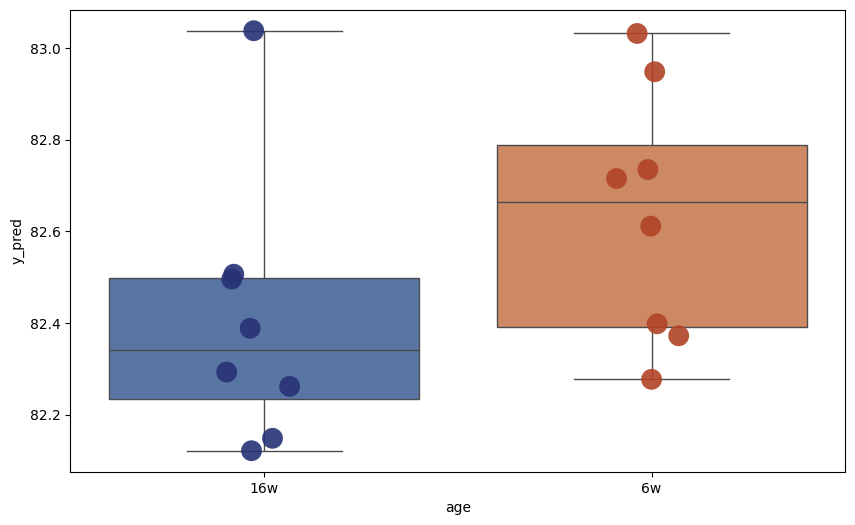

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


Components: 2
             y_pred
Heart_20  82.059521
Heart_18  82.185065
Heart_17  82.324086
Heart_16  82.448244
Heart_15  82.410568
Heart_13  82.213515
Heart_12  82.042155
Heart_11  82.928838
Heart_9   82.263500
Heart_8   82.548338
Heart_7   82.259185
Heart_5   82.311596
Heart_4   82.973328
Heart_3   82.650385
Heart_2   82.640678
Heart_1   82.812735
             y_pred  age
Heart_20  82.059521  16w
Heart_18  82.185065  16w
Heart_17  82.324086  16w
Heart_16  82.448244  16w
Heart_15  82.410568  16w
Heart_13  82.213515  16w
Heart_12  82.042155  16w
Heart_11  82.928838  16w
Heart_9   82.263500   6w
Heart_8   82.548338   6w
Heart_7   82.259185   6w
Heart_5   82.311596   6w
Heart_4   82.973328   6w
Heart_3   82.650385   6w
Heart_2   82.640678   6w
Heart_1   82.812735   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


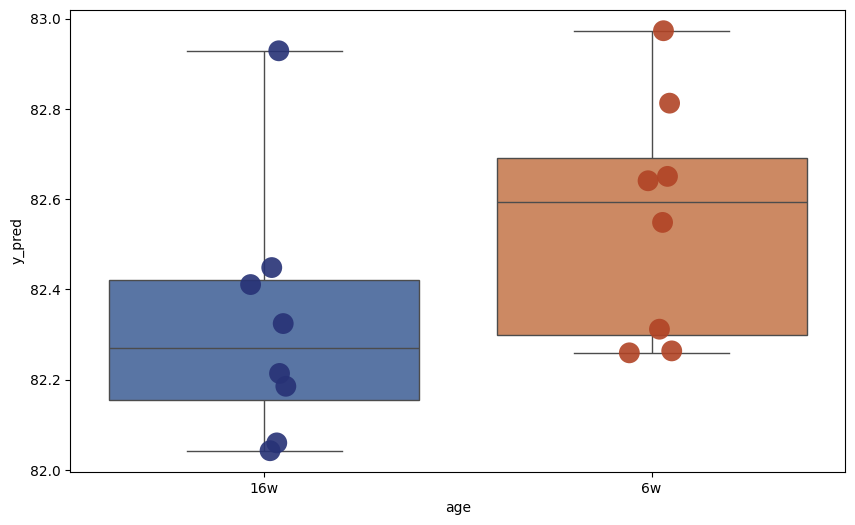

Components: 3


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


             y_pred
Heart_20  81.698221
Heart_18  77.465589
Heart_17  81.534084
Heart_16  77.534798
Heart_15  92.451302
Heart_13  96.067243
Heart_12  92.043840
Heart_11  92.639830
Heart_9   69.883808
Heart_8   67.696285
Heart_7   79.232978
Heart_5   84.522716
Heart_4   70.185574
Heart_3   68.133188
Heart_2   71.051103
Heart_1   74.663116
             y_pred  age
Heart_20  81.698221  16w
Heart_18  77.465589  16w
Heart_17  81.534084  16w
Heart_16  77.534798  16w
Heart_15  92.451302  16w
Heart_13  96.067243  16w
Heart_12  92.043840  16w
Heart_11  92.639830  16w
Heart_9   69.883808   6w
Heart_8   67.696285   6w
Heart_7   79.232978   6w
Heart_5   84.522716   6w
Heart_4   70.185574   6w
Heart_3   68.133188   6w
Heart_2   71.051103   6w
Heart_1   74.663116   6w


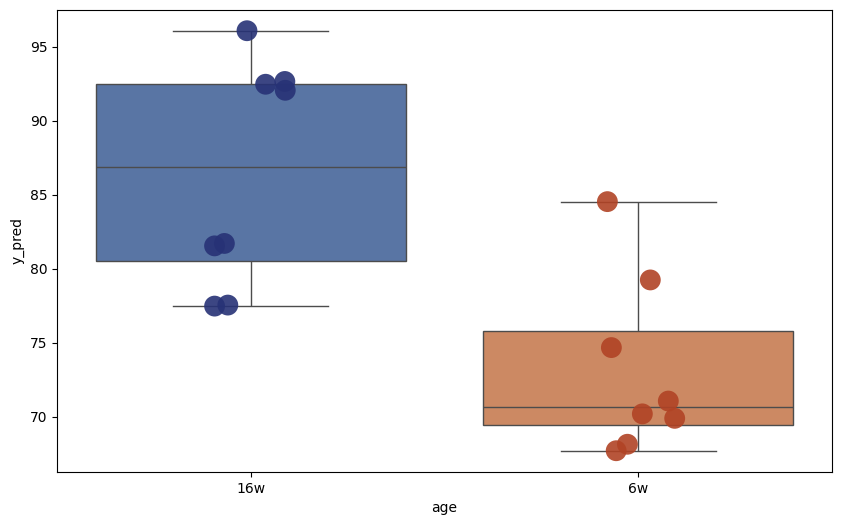

Components: 4
             y_pred
Heart_20  79.932605
Heart_18  75.383159
Heart_17  80.971673
Heart_16  77.505406
Heart_15  94.682418
Heart_13  96.980608
Heart_12  92.469769
Heart_11  96.734838
Heart_9   67.905265
Heart_8   67.204160
Heart_7   79.730207
Heart_5   84.001979
Heart_4   73.840089
Heart_3   70.514381
Heart_2   73.174769
Heart_1   77.325995
             y_pred  age
Heart_20  79.932605  16w
Heart_18  75.383159  16w
Heart_17  80.971673  16w
Heart_16  77.505406  16w
Heart_15  94.682418  16w
Heart_13  96.980608  16w
Heart_12  92.469769  16w
Heart_11  96.734838  16w
Heart_9   67.905265   6w
Heart_8   67.204160   6w
Heart_7   79.730207   6w
Heart_5   84.001979   6w
Heart_4   73.840089   6w
Heart_3   70.514381   6w
Heart_2   73.174769   6w
Heart_1   77.325995   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


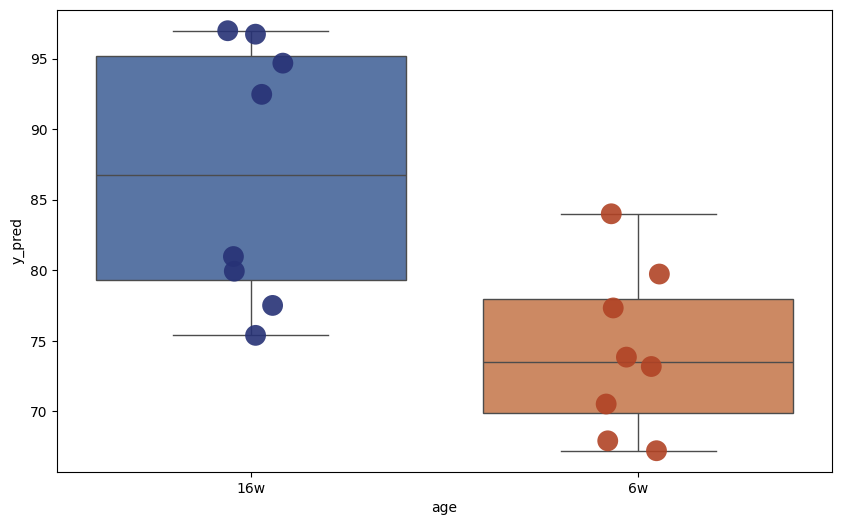

Components: 5
             y_pred
Heart_20  82.746311
Heart_18  76.059262
Heart_17  81.320848
Heart_16  78.451127
Heart_15  96.004698
Heart_13  99.712823
Heart_12  92.331613
Heart_11  96.064178
Heart_9   69.097190
Heart_8   65.695508
Heart_7   80.235441
Heart_5   83.935757
Heart_4   70.997196
Heart_3   65.931699
Heart_2   70.022296
Heart_1   74.087863
             y_pred  age
Heart_20  82.746311  16w
Heart_18  76.059262  16w
Heart_17  81.320848  16w
Heart_16  78.451127  16w
Heart_15  96.004698  16w
Heart_13  99.712823  16w
Heart_12  92.331613  16w
Heart_11  96.064178  16w
Heart_9   69.097190   6w
Heart_8   65.695508   6w
Heart_7   80.235441   6w
Heart_5   83.935757   6w
Heart_4   70.997196   6w
Heart_3   65.931699   6w
Heart_2   70.022296   6w
Heart_1   74.087863   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


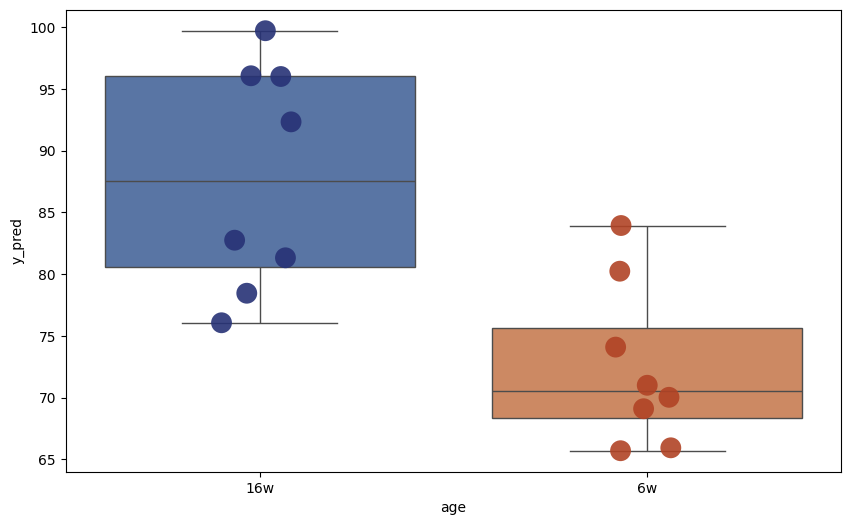

Components: 6
              y_pred
Heart_20   84.452120
Heart_18   76.941798
Heart_17   82.357763
Heart_16   79.841060
Heart_15   97.702207
Heart_13  102.594517
Heart_12   94.155494
Heart_11   97.690838
Heart_9    70.208812
Heart_8    64.988608
Heart_7    80.283923
Heart_5    85.783450
Heart_4    71.274022
Heart_3    65.374738
Heart_2    69.743063
Heart_1    73.275232
              y_pred  age
Heart_20   84.452120  16w
Heart_18   76.941798  16w
Heart_17   82.357763  16w
Heart_16   79.841060  16w
Heart_15   97.702207  16w
Heart_13  102.594517  16w
Heart_12   94.155494  16w
Heart_11   97.690838  16w
Heart_9    70.208812   6w
Heart_8    64.988608   6w
Heart_7    80.283923   6w
Heart_5    85.783450   6w
Heart_4    71.274022   6w
Heart_3    65.374738   6w
Heart_2    69.743063   6w
Heart_1    73.275232   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


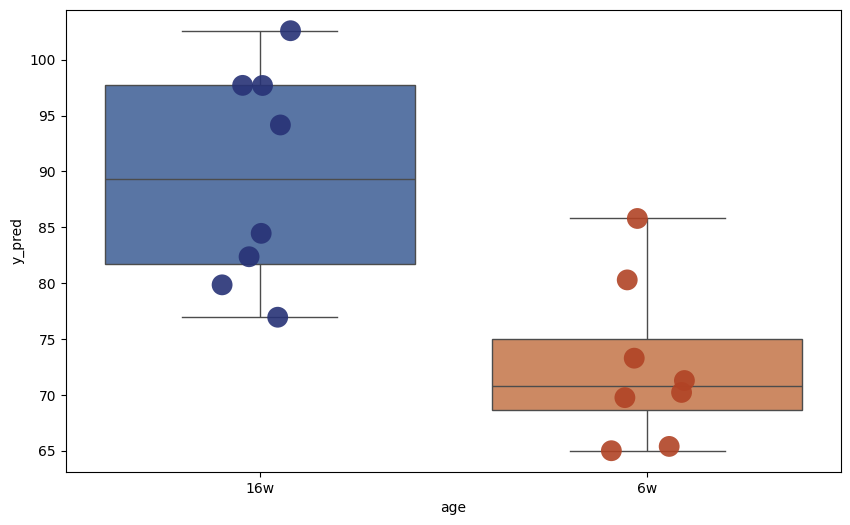

Components: 7
              y_pred
Heart_20   84.402566
Heart_18   76.947881
Heart_17   82.276573
Heart_16   79.760880
Heart_15   97.673521
Heart_13  102.576892
Heart_12   94.101943
Heart_11   97.635540
Heart_9    70.240710
Heart_8    65.065716
Heart_7    80.245907
Heart_5    85.755203
Heart_4    71.296158
Heart_3    65.452595
Heart_2    69.825054
Heart_1    73.320801
              y_pred  age
Heart_20   84.402566  16w
Heart_18   76.947881  16w
Heart_17   82.276573  16w
Heart_16   79.760880  16w
Heart_15   97.673521  16w
Heart_13  102.576892  16w
Heart_12   94.101943  16w
Heart_11   97.635540  16w
Heart_9    70.240710   6w
Heart_8    65.065716   6w
Heart_7    80.245907   6w
Heart_5    85.755203   6w
Heart_4    71.296158   6w
Heart_3    65.452595   6w
Heart_2    69.825054   6w
Heart_1    73.320801   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


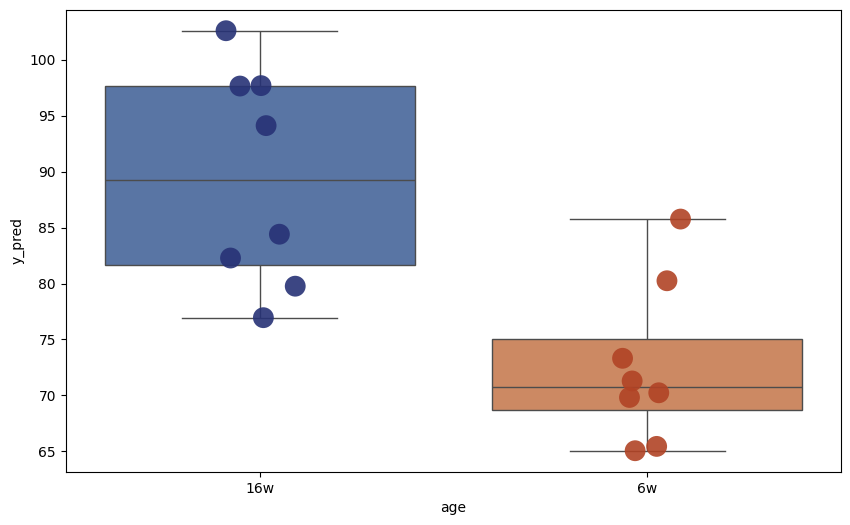

Components: 8
              y_pred
Heart_20   84.474463
Heart_18   77.610032
Heart_17   82.748259
Heart_16   80.543873
Heart_15   98.573206
Heart_13  103.617346
Heart_12   95.018945
Heart_11   97.844006
Heart_9    70.482887
Heart_8    64.441127
Heart_7    79.092137
Heart_5    85.309919
Heart_4    70.313229
Heart_3    64.385033
Heart_2    68.871608
Heart_1    71.978949
              y_pred  age
Heart_20   84.474463  16w
Heart_18   77.610032  16w
Heart_17   82.748259  16w
Heart_16   80.543873  16w
Heart_15   98.573206  16w
Heart_13  103.617346  16w
Heart_12   95.018945  16w
Heart_11   97.844006  16w
Heart_9    70.482887   6w
Heart_8    64.441127   6w
Heart_7    79.092137   6w
Heart_5    85.309919   6w
Heart_4    70.313229   6w
Heart_3    64.385033   6w
Heart_2    68.871608   6w
Heart_1    71.978949   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


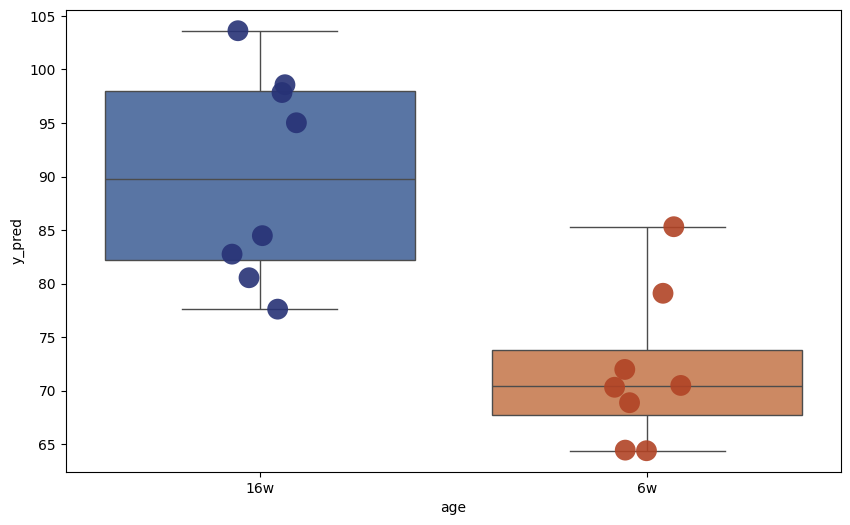

Components: 9
              y_pred
Heart_20   86.023432
Heart_18   80.675233
Heart_17   84.394532
Heart_16   83.651574
Heart_15  100.578471
Heart_13  105.848802
Heart_12   96.588317
Heart_11   95.433630
Heart_9    76.000594
Heart_8    65.461979
Heart_7    74.337955
Heart_5    83.561808
Heart_4    69.268625
Heart_3    62.429925
Heart_2    66.724041
Heart_1    70.509220
              y_pred  age
Heart_20   86.023432  16w
Heart_18   80.675233  16w
Heart_17   84.394532  16w
Heart_16   83.651574  16w
Heart_15  100.578471  16w
Heart_13  105.848802  16w
Heart_12   96.588317  16w
Heart_11   95.433630  16w
Heart_9    76.000594   6w
Heart_8    65.461979   6w
Heart_7    74.337955   6w
Heart_5    83.561808   6w
Heart_4    69.268625   6w
Heart_3    62.429925   6w
Heart_2    66.724041   6w
Heart_1    70.509220   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


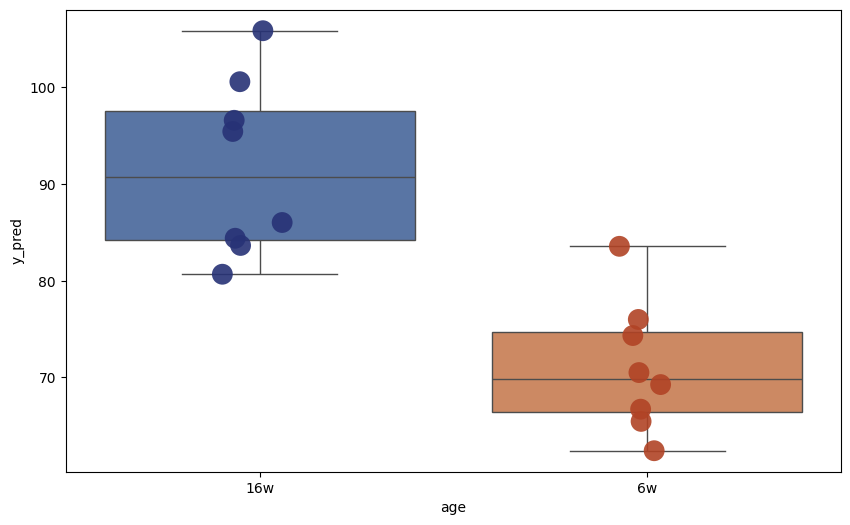

Components: 10
              y_pred
Heart_20   86.442429
Heart_18   79.508418
Heart_17   85.209480
Heart_16   82.968843
Heart_15  101.050727
Heart_13  106.441887
Heart_12   96.419997
Heart_11   98.552224
Heart_9    70.831759
Heart_8    64.897403
Heart_7    74.818786
Heart_5    84.357229
Heart_4    68.020137
Heart_3    62.449486
Heart_2    67.434707
Heart_1    71.308769
              y_pred  age
Heart_20   86.442429  16w
Heart_18   79.508418  16w
Heart_17   85.209480  16w
Heart_16   82.968843  16w
Heart_15  101.050727  16w
Heart_13  106.441887  16w
Heart_12   96.419997  16w
Heart_11   98.552224  16w
Heart_9    70.831759   6w
Heart_8    64.897403   6w
Heart_7    74.818786   6w
Heart_5    84.357229   6w
Heart_4    68.020137   6w
Heart_3    62.449486   6w
Heart_2    67.434707   6w
Heart_1    71.308769   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


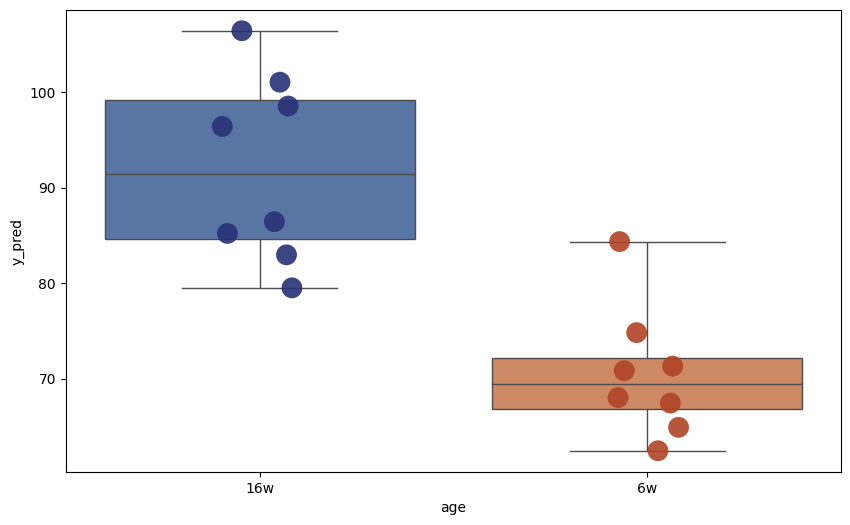

Components: 11
              y_pred
Heart_20   83.863922
Heart_18   83.984172
Heart_17   83.951476
Heart_16   85.445871
Heart_15   96.888671
Heart_13  102.966098
Heart_12   94.198175
Heart_11   91.833249
Heart_9    68.971650
Heart_8    62.641441
Heart_7    70.523970
Heart_5    73.569606
Heart_4    59.068497
Heart_3    57.040630
Heart_2    62.010424
Heart_1    64.193260
              y_pred  age
Heart_20   83.863922  16w
Heart_18   83.984172  16w
Heart_17   83.951476  16w
Heart_16   85.445871  16w
Heart_15   96.888671  16w
Heart_13  102.966098  16w
Heart_12   94.198175  16w
Heart_11   91.833249  16w
Heart_9    68.971650   6w
Heart_8    62.641441   6w
Heart_7    70.523970   6w
Heart_5    73.569606   6w
Heart_4    59.068497   6w
Heart_3    57.040630   6w
Heart_2    62.010424   6w
Heart_1    64.193260   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


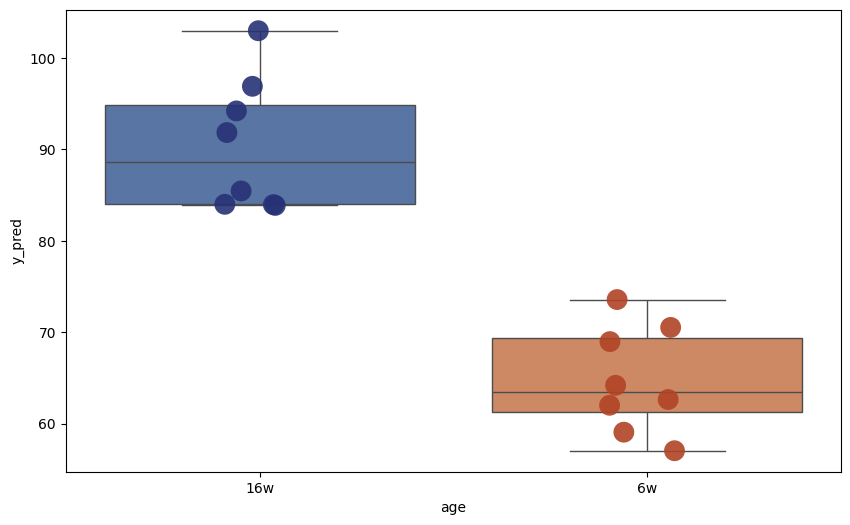

Components: 12
              y_pred
Heart_20   82.378261
Heart_18   85.014202
Heart_17   82.415196
Heart_16   87.642983
Heart_15   95.658360
Heart_13  100.118371
Heart_12   92.668130
Heart_11   88.210454
Heart_9    67.909213
Heart_8    60.066032
Heart_7    67.151554
Heart_5    67.857352
Heart_4    56.389969
Heart_3    56.712178
Heart_2    58.370430
Heart_1    63.076618
              y_pred  age
Heart_20   82.378261  16w
Heart_18   85.014202  16w
Heart_17   82.415196  16w
Heart_16   87.642983  16w
Heart_15   95.658360  16w
Heart_13  100.118371  16w
Heart_12   92.668130  16w
Heart_11   88.210454  16w
Heart_9    67.909213   6w
Heart_8    60.066032   6w
Heart_7    67.151554   6w
Heart_5    67.857352   6w
Heart_4    56.389969   6w
Heart_3    56.712178   6w
Heart_2    58.370430   6w
Heart_1    63.076618   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


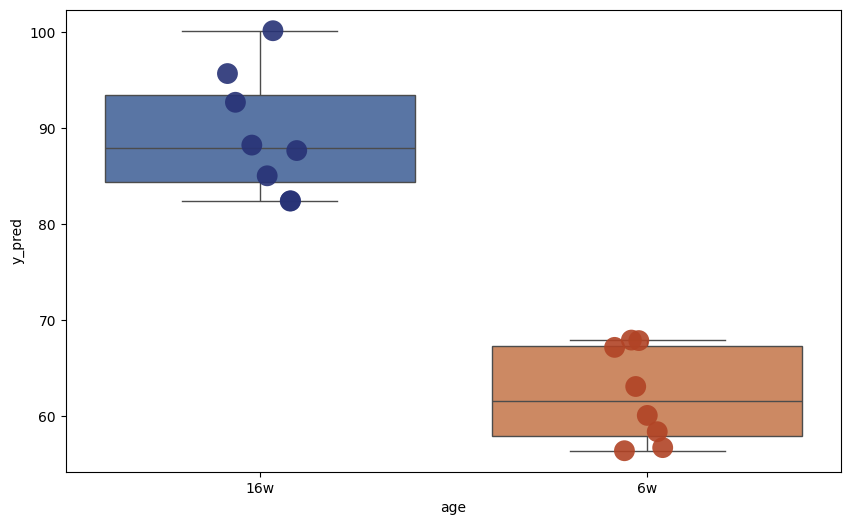

Components: 13
              y_pred
Heart_20   82.619743
Heart_18   85.260825
Heart_17   82.031594
Heart_16   87.826383
Heart_15   95.960954
Heart_13  100.948477
Heart_12   92.857864
Heart_11   88.330733
Heart_9    67.933499
Heart_8    59.868619
Heart_7    67.459076
Heart_5    68.156178
Heart_4    56.621824
Heart_3    56.833105
Heart_2    59.136939
Heart_1    63.822362
              y_pred  age
Heart_20   82.619743  16w
Heart_18   85.260825  16w
Heart_17   82.031594  16w
Heart_16   87.826383  16w
Heart_15   95.960954  16w
Heart_13  100.948477  16w
Heart_12   92.857864  16w
Heart_11   88.330733  16w
Heart_9    67.933499   6w
Heart_8    59.868619   6w
Heart_7    67.459076   6w
Heart_5    68.156178   6w
Heart_4    56.621824   6w
Heart_3    56.833105   6w
Heart_2    59.136939   6w
Heart_1    63.822362   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


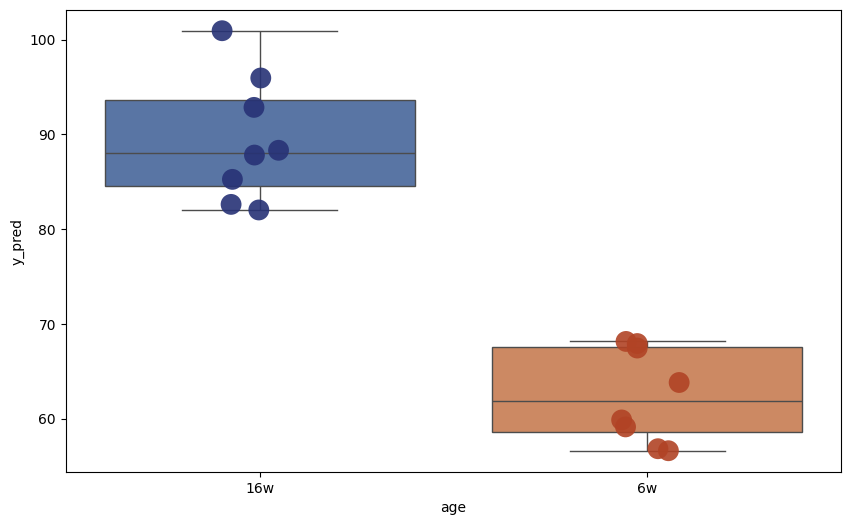

Components: 14
              y_pred
Heart_20   86.611219
Heart_18   86.798278
Heart_17   84.673080
Heart_16   91.688929
Heart_15   97.534127
Heart_13  102.666556
Heart_12   93.816085
Heart_11   91.998985
Heart_9    69.823971
Heart_8    60.784958
Heart_7    71.302145
Heart_5    71.217050
Heart_4    61.055440
Heart_3    58.072007
Heart_2    60.633249
Heart_1    66.421778
              y_pred  age
Heart_20   86.611219  16w
Heart_18   86.798278  16w
Heart_17   84.673080  16w
Heart_16   91.688929  16w
Heart_15   97.534127  16w
Heart_13  102.666556  16w
Heart_12   93.816085  16w
Heart_11   91.998985  16w
Heart_9    69.823971   6w
Heart_8    60.784958   6w
Heart_7    71.302145   6w
Heart_5    71.217050   6w
Heart_4    61.055440   6w
Heart_3    58.072007   6w
Heart_2    60.633249   6w
Heart_1    66.421778   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


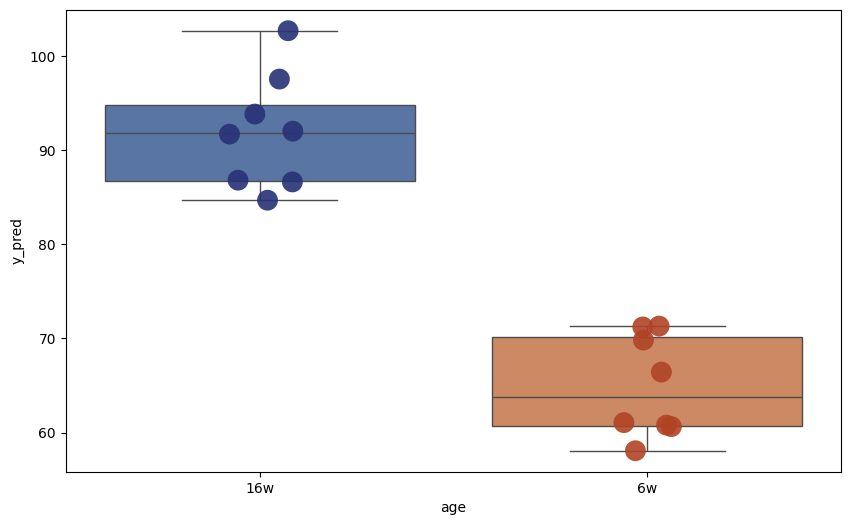

Components: 15
              y_pred
Heart_20   85.623609
Heart_18   86.889168
Heart_17   83.796007
Heart_16   91.371296
Heart_15   96.880701
Heart_13  102.982492
Heart_12   93.965517
Heart_11   91.825755
Heart_9    67.392282
Heart_8    58.552945
Heart_7    71.288668
Heart_5    68.740568
Heart_4    57.977745
Heart_3    56.806394
Heart_2    58.137592
Heart_1    65.789392
              y_pred  age
Heart_20   85.623609  16w
Heart_18   86.889168  16w
Heart_17   83.796007  16w
Heart_16   91.371296  16w
Heart_15   96.880701  16w
Heart_13  102.982492  16w
Heart_12   93.965517  16w
Heart_11   91.825755  16w
Heart_9    67.392282   6w
Heart_8    58.552945   6w
Heart_7    71.288668   6w
Heart_5    68.740568   6w
Heart_4    57.977745   6w
Heart_3    56.806394   6w
Heart_2    58.137592   6w
Heart_1    65.789392   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


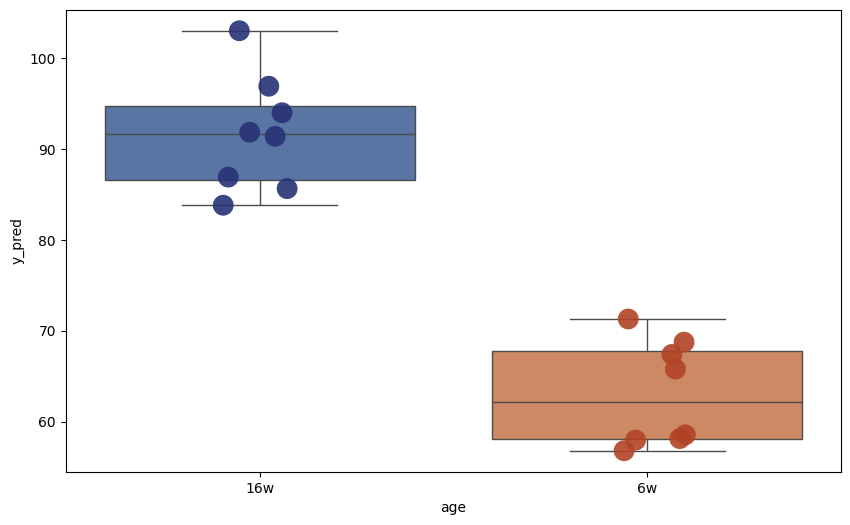

Components: 16
              y_pred
Heart_20   86.410701
Heart_18   87.202914
Heart_17   84.590889
Heart_16   92.426888
Heart_15   98.978985
Heart_13  102.308779
Heart_12   92.932340
Heart_11   92.947301
Heart_9    71.470030
Heart_8    61.179499
Heart_7    68.190531
Heart_5    68.126489
Heart_4    61.394020
Heart_3    60.407875
Heart_2    60.433745
Heart_1    62.545129
              y_pred  age
Heart_20   86.410701  16w
Heart_18   87.202914  16w
Heart_17   84.590889  16w
Heart_16   92.426888  16w
Heart_15   98.978985  16w
Heart_13  102.308779  16w
Heart_12   92.932340  16w
Heart_11   92.947301  16w
Heart_9    71.470030   6w
Heart_8    61.179499   6w
Heart_7    68.190531   6w
Heart_5    68.126489   6w
Heart_4    61.394020   6w
Heart_3    60.407875   6w
Heart_2    60.433745   6w
Heart_1    62.545129   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


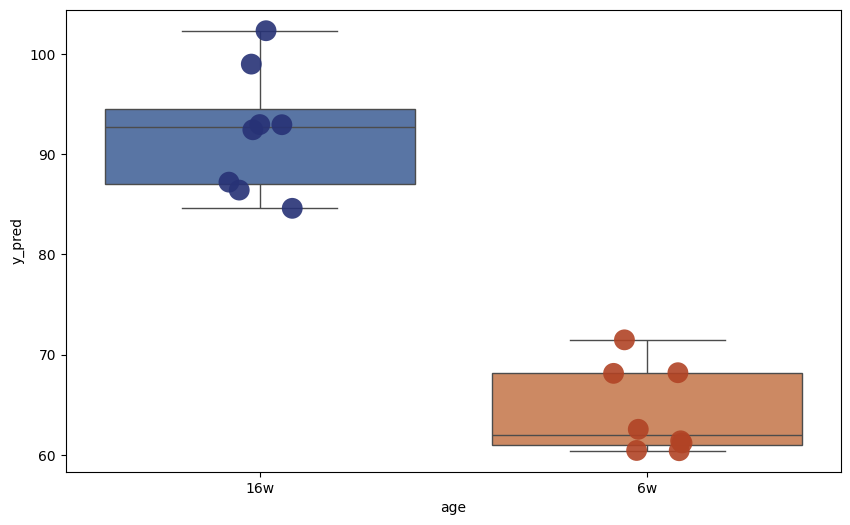

Components: 17
              y_pred
Heart_20   85.874561
Heart_18   86.382287
Heart_17   82.530475
Heart_16   90.643672
Heart_15   98.953936
Heart_13  103.899319
Heart_12   92.320016
Heart_11   92.383142
Heart_9    67.051522
Heart_8    58.411694
Heart_7    68.732618
Heart_5    66.540095
Heart_4    58.760906
Heart_3    59.386086
Heart_2    59.382119
Heart_1    63.899103
              y_pred  age
Heart_20   85.874561  16w
Heart_18   86.382287  16w
Heart_17   82.530475  16w
Heart_16   90.643672  16w
Heart_15   98.953936  16w
Heart_13  103.899319  16w
Heart_12   92.320016  16w
Heart_11   92.383142  16w
Heart_9    67.051522   6w
Heart_8    58.411694   6w
Heart_7    68.732618   6w
Heart_5    66.540095   6w
Heart_4    58.760906   6w
Heart_3    59.386086   6w
Heart_2    59.382119   6w
Heart_1    63.899103   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


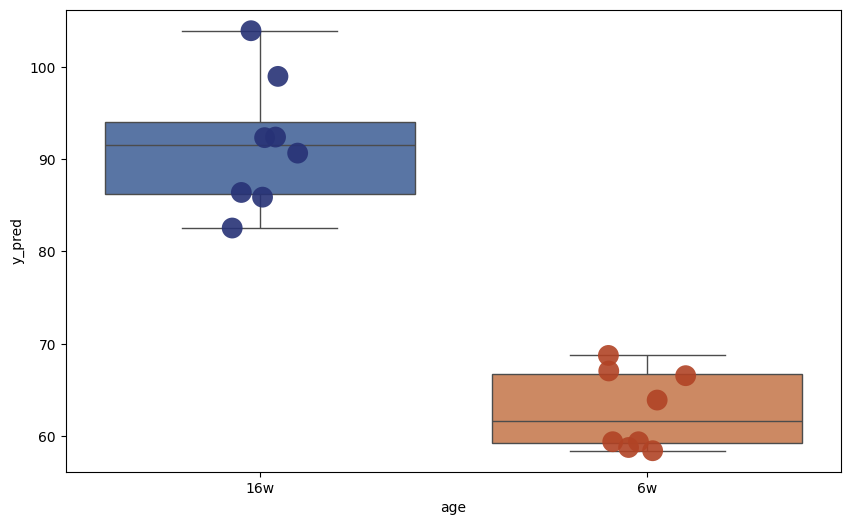

Components: 18
              y_pred
Heart_20   85.919818
Heart_18   87.707523
Heart_17   83.992737
Heart_16   92.032429
Heart_15   98.551728
Heart_13  101.889766
Heart_12   93.400083
Heart_11   92.852719
Heart_9    68.551293
Heart_8    60.068856
Heart_7    68.319335
Heart_5    66.689678
Heart_4    59.949744
Heart_3    59.894261
Heart_2    59.587605
Heart_1    63.385386
              y_pred  age
Heart_20   85.919818  16w
Heart_18   87.707523  16w
Heart_17   83.992737  16w
Heart_16   92.032429  16w
Heart_15   98.551728  16w
Heart_13  101.889766  16w
Heart_12   93.400083  16w
Heart_11   92.852719  16w
Heart_9    68.551293   6w
Heart_8    60.068856   6w
Heart_7    68.319335   6w
Heart_5    66.689678   6w
Heart_4    59.949744   6w
Heart_3    59.894261   6w
Heart_2    59.587605   6w
Heart_1    63.385386   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


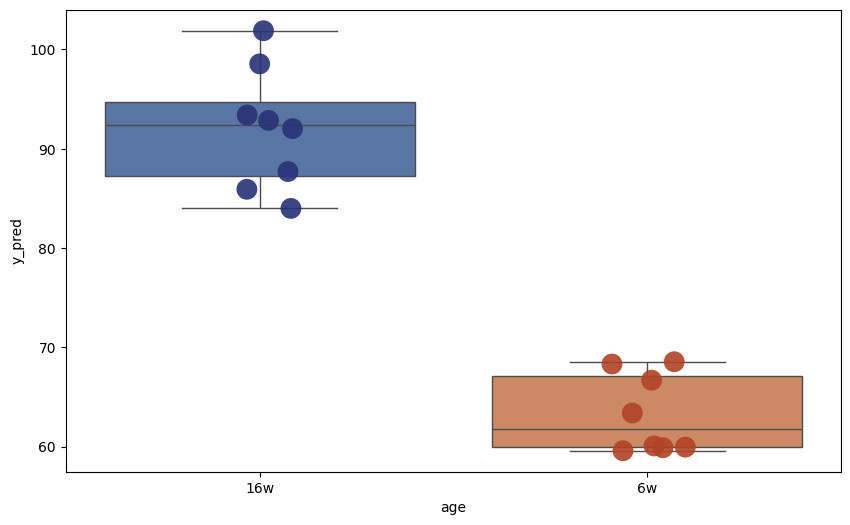

Components: 19
              y_pred
Heart_20   86.371936
Heart_18   88.161223
Heart_17   84.285106
Heart_16   91.881123
Heart_15   98.189603
Heart_13  101.639500
Heart_12   92.801080
Heart_11   94.488257
Heart_9    70.193485
Heart_8    62.831880
Heart_7    68.438141
Heart_5    68.789645
Heart_4    62.880656
Heart_3    61.291957
Heart_2    62.165066
Heart_1    63.246841
              y_pred  age
Heart_20   86.371936  16w
Heart_18   88.161223  16w
Heart_17   84.285106  16w
Heart_16   91.881123  16w
Heart_15   98.189603  16w
Heart_13  101.639500  16w
Heart_12   92.801080  16w
Heart_11   94.488257  16w
Heart_9    70.193485   6w
Heart_8    62.831880   6w
Heart_7    68.438141   6w
Heart_5    68.789645   6w
Heart_4    62.880656   6w
Heart_3    61.291957   6w
Heart_2    62.165066   6w
Heart_1    63.246841   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


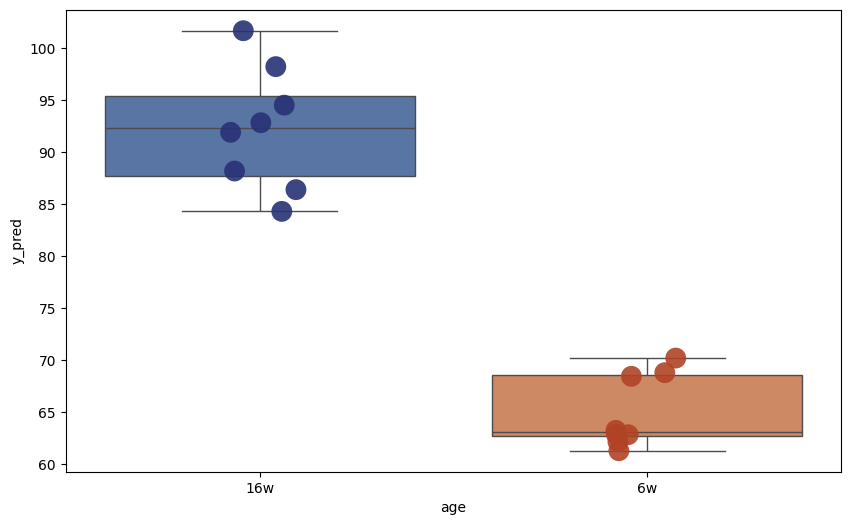

Components: 20
              y_pred
Heart_20   87.404739
Heart_18   86.589054
Heart_17   81.749075
Heart_16   90.084120
Heart_15   97.650576
Heart_13  101.927471
Heart_12   92.135082
Heart_11   92.718007
Heart_9    64.766495
Heart_8    56.436301
Heart_7    67.616949
Heart_5    64.669518
Heart_4    56.345545
Heart_3    57.476562
Heart_2    56.772463
Heart_1    61.266519
              y_pred  age
Heart_20   87.404739  16w
Heart_18   86.589054  16w
Heart_17   81.749075  16w
Heart_16   90.084120  16w
Heart_15   97.650576  16w
Heart_13  101.927471  16w
Heart_12   92.135082  16w
Heart_11   92.718007  16w
Heart_9    64.766495   6w
Heart_8    56.436301   6w
Heart_7    67.616949   6w
Heart_5    64.669518   6w
Heart_4    56.345545   6w
Heart_3    57.476562   6w
Heart_2    56.772463   6w
Heart_1    61.266519   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


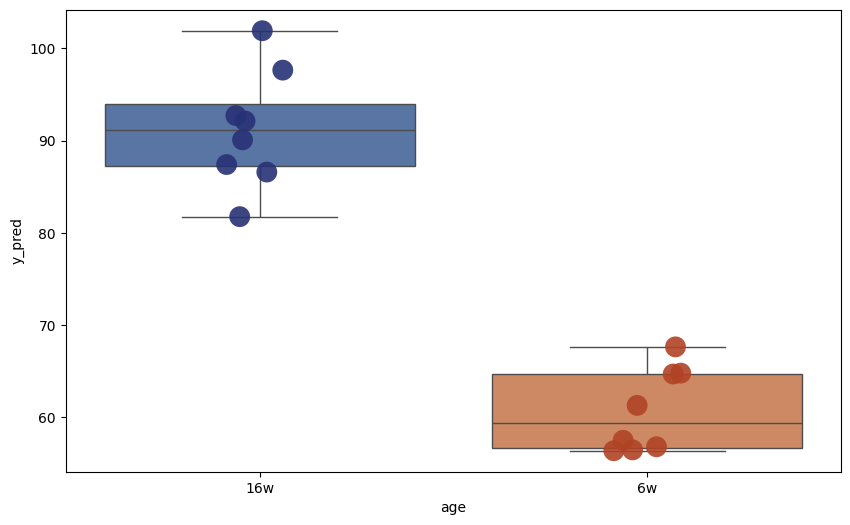

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


Components: 21
              y_pred
Heart_20   87.816708
Heart_18   86.681604
Heart_17   81.906429
Heart_16   89.814688
Heart_15   98.044028
Heart_13  101.552206
Heart_12   91.688997
Heart_11   92.501895
Heart_9    65.440345
Heart_8    57.368285
Heart_7    67.287494
Heart_5    65.190831
Heart_4    56.533305
Heart_3    57.417793
Heart_2    57.878200
Heart_1    61.766905
              y_pred  age
Heart_20   87.816708  16w
Heart_18   86.681604  16w
Heart_17   81.906429  16w
Heart_16   89.814688  16w
Heart_15   98.044028  16w
Heart_13  101.552206  16w
Heart_12   91.688997  16w
Heart_11   92.501895  16w
Heart_9    65.440345   6w
Heart_8    57.368285   6w
Heart_7    67.287494   6w
Heart_5    65.190831   6w
Heart_4    56.533305   6w
Heart_3    57.417793   6w
Heart_2    57.878200   6w
Heart_1    61.766905   6w


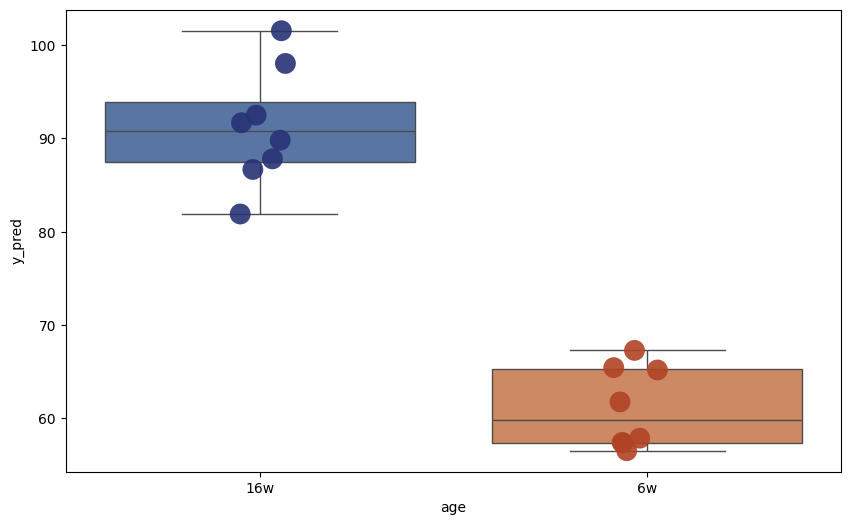

Components: 22


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


              y_pred
Heart_20   86.823767
Heart_18   86.388032
Heart_17   80.808332
Heart_16   88.921635
Heart_15   97.302457
Heart_13  101.943404
Heart_12   92.067621
Heart_11   92.746957
Heart_9    62.789466
Heart_8    55.576178
Heart_7    66.837410
Heart_5    63.463408
Heart_4    55.357651
Heart_3    57.298923
Heart_2    57.021956
Heart_1    61.663887
              y_pred  age
Heart_20   86.823767  16w
Heart_18   86.388032  16w
Heart_17   80.808332  16w
Heart_16   88.921635  16w
Heart_15   97.302457  16w
Heart_13  101.943404  16w
Heart_12   92.067621  16w
Heart_11   92.746957  16w
Heart_9    62.789466   6w
Heart_8    55.576178   6w
Heart_7    66.837410   6w
Heart_5    63.463408   6w
Heart_4    55.357651   6w
Heart_3    57.298923   6w
Heart_2    57.021956   6w
Heart_1    61.663887   6w


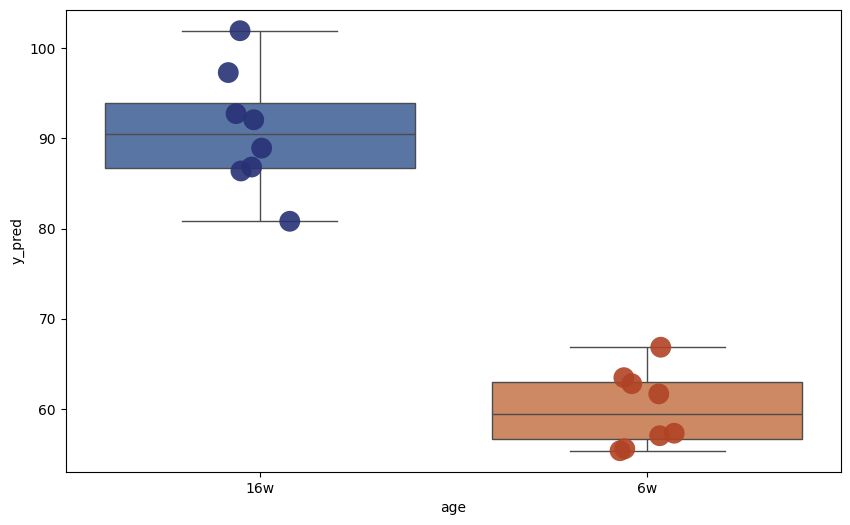

Components: 23
              y_pred
Heart_20   83.821270
Heart_18   87.131089
Heart_17   80.576941
Heart_16   89.668222
Heart_15   97.928347
Heart_13  102.708082
Heart_12   93.326212
Heart_11   93.074971
Heart_9    62.764623
Heart_8    56.066310
Heart_7    68.146844
Heart_5    63.548739
Heart_4    55.895907
Heart_3    58.269173
Heart_2    57.457498
Heart_1    62.363517
              y_pred  age
Heart_20   83.821270  16w
Heart_18   87.131089  16w
Heart_17   80.576941  16w
Heart_16   89.668222  16w
Heart_15   97.928347  16w
Heart_13  102.708082  16w
Heart_12   93.326212  16w
Heart_11   93.074971  16w
Heart_9    62.764623   6w
Heart_8    56.066310   6w
Heart_7    68.146844   6w
Heart_5    63.548739   6w
Heart_4    55.895907   6w
Heart_3    58.269173   6w
Heart_2    57.457498   6w
Heart_1    62.363517   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


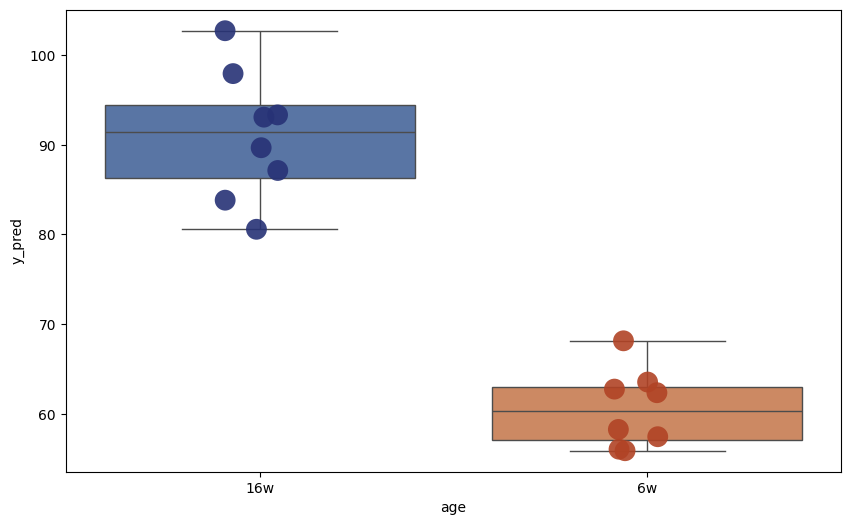

Components: 24
              y_pred
Heart_20   83.978196
Heart_18   87.386472
Heart_17   80.848518
Heart_16   89.364988
Heart_15   97.188944
Heart_13  102.590556
Heart_12   93.487457
Heart_11   94.397762
Heart_9    61.908222
Heart_8    56.000050
Heart_7    68.400000
Heart_5    63.867438
Heart_4    56.633430
Heart_3    58.229669
Heart_2    57.595682
Heart_1    61.943948
              y_pred  age
Heart_20   83.978196  16w
Heart_18   87.386472  16w
Heart_17   80.848518  16w
Heart_16   89.364988  16w
Heart_15   97.188944  16w
Heart_13  102.590556  16w
Heart_12   93.487457  16w
Heart_11   94.397762  16w
Heart_9    61.908222   6w
Heart_8    56.000050   6w
Heart_7    68.400000   6w
Heart_5    63.867438   6w
Heart_4    56.633430   6w
Heart_3    58.229669   6w
Heart_2    57.595682   6w
Heart_1    61.943948   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


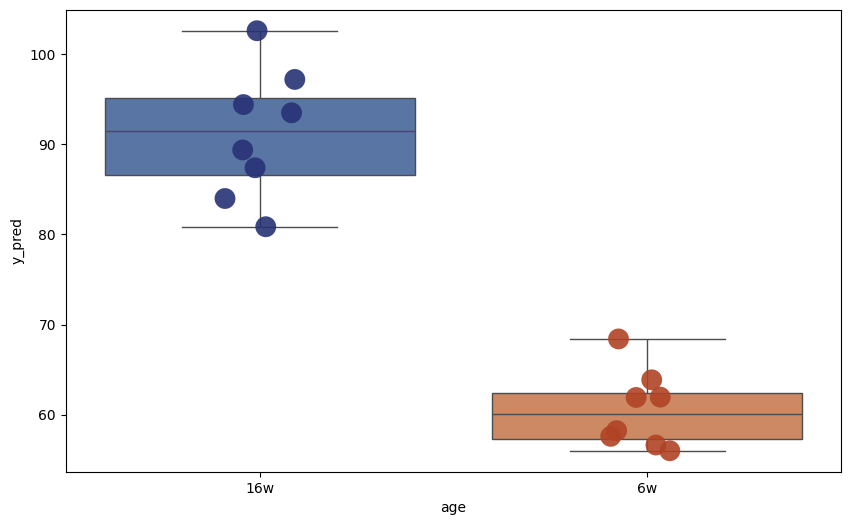

Components: 25


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


              y_pred
Heart_20   86.009121
Heart_18   85.646335
Heart_17   79.826813
Heart_16   88.180505
Heart_15   96.940688
Heart_13  102.449630
Heart_12   92.227004
Heart_11   93.233807
Heart_9    60.676096
Heart_8    54.108355
Heart_7    67.489518
Heart_5    63.197150
Heart_4    54.741038
Heart_3    55.878313
Heart_2    55.514673
Heart_1    60.492813
              y_pred  age
Heart_20   86.009121  16w
Heart_18   85.646335  16w
Heart_17   79.826813  16w
Heart_16   88.180505  16w
Heart_15   96.940688  16w
Heart_13  102.449630  16w
Heart_12   92.227004  16w
Heart_11   93.233807  16w
Heart_9    60.676096   6w
Heart_8    54.108355   6w
Heart_7    67.489518   6w
Heart_5    63.197150   6w
Heart_4    54.741038   6w
Heart_3    55.878313   6w
Heart_2    55.514673   6w
Heart_1    60.492813   6w


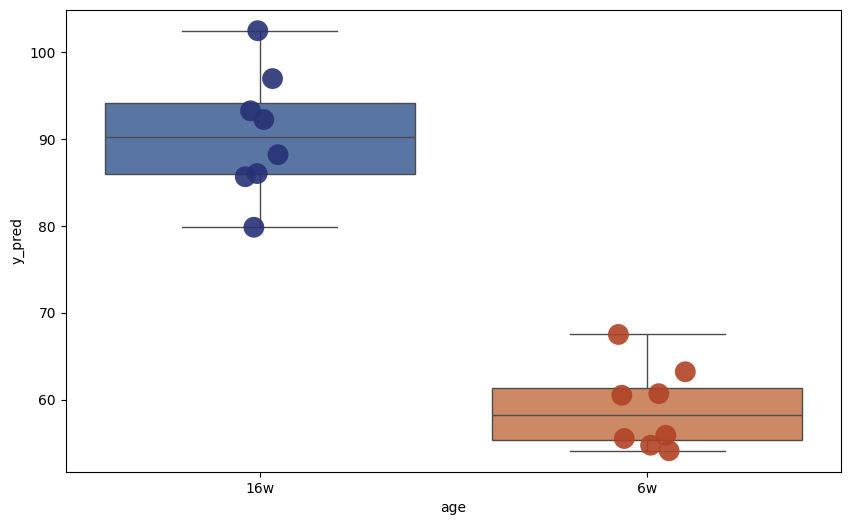

Components: 26
              y_pred
Heart_20   85.178433
Heart_18   86.826852
Heart_17   80.957364
Heart_16   88.353694
Heart_15   97.387804
Heart_13  102.355465
Heart_12   93.884413
Heart_11   94.856382
Heart_9    61.952340
Heart_8    55.834458
Heart_7    66.896979
Heart_5    63.678827
Heart_4    55.401860
Heart_3    56.169480
Heart_2    57.137768
Heart_1    61.532900
              y_pred  age
Heart_20   85.178433  16w
Heart_18   86.826852  16w
Heart_17   80.957364  16w
Heart_16   88.353694  16w
Heart_15   97.387804  16w
Heart_13  102.355465  16w
Heart_12   93.884413  16w
Heart_11   94.856382  16w
Heart_9    61.952340   6w
Heart_8    55.834458   6w
Heart_7    66.896979   6w
Heart_5    63.678827   6w
Heart_4    55.401860   6w
Heart_3    56.169480   6w
Heart_2    57.137768   6w
Heart_1    61.532900   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


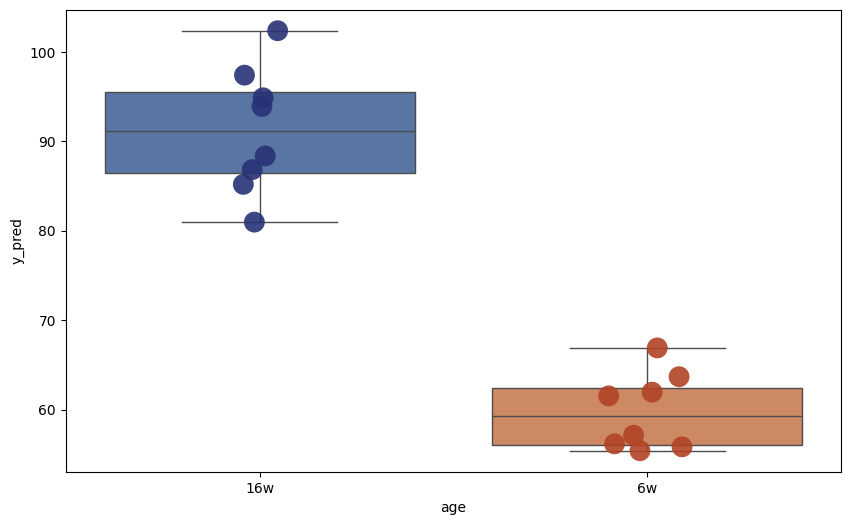

Components: 27
              y_pred
Heart_20   83.005101
Heart_18   86.680725
Heart_17   81.276346
Heart_16   88.809774
Heart_15   98.061313
Heart_13  103.382310
Heart_12   93.570963
Heart_11   94.965825
Heart_9    62.368514
Heart_8    56.065781
Heart_7    67.175856
Heart_5    64.205306
Heart_4    56.540138
Heart_3    56.633370
Heart_2    58.119342
Heart_1    62.032126
              y_pred  age
Heart_20   83.005101  16w
Heart_18   86.680725  16w
Heart_17   81.276346  16w
Heart_16   88.809774  16w
Heart_15   98.061313  16w
Heart_13  103.382310  16w
Heart_12   93.570963  16w
Heart_11   94.965825  16w
Heart_9    62.368514   6w
Heart_8    56.065781   6w
Heart_7    67.175856   6w
Heart_5    64.205306   6w
Heart_4    56.540138   6w
Heart_3    56.633370   6w
Heart_2    58.119342   6w
Heart_1    62.032126   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


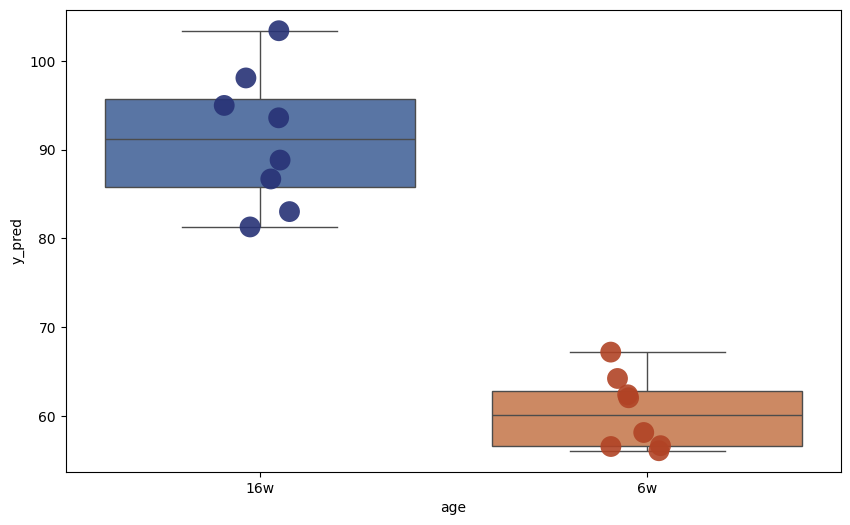

Components: 28


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   85.337962
Heart_18   86.948820
Heart_17   80.953183
Heart_16   88.723697
Heart_15   97.753749
Heart_13  102.493502
Heart_12   93.476662
Heart_11   94.942954
Heart_9    62.864033
Heart_8    56.772311
Heart_7    67.011704
Heart_5    64.453510
Heart_4    56.735736
Heart_3    56.950359
Heart_2    58.172049
Heart_1    62.004503
              y_pred  age
Heart_20   85.337962  16w
Heart_18   86.948820  16w
Heart_17   80.953183  16w
Heart_16   88.723697  16w
Heart_15   97.753749  16w
Heart_13  102.493502  16w
Heart_12   93.476662  16w
Heart_11   94.942954  16w
Heart_9    62.864033   6w
Heart_8    56.772311   6w
Heart_7    67.011704   6w
Heart_5    64.453510   6w
Heart_4    56.735736   6w
Heart_3    56.950359   6w
Heart_2    58.172049   6w
Heart_1    62.004503   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


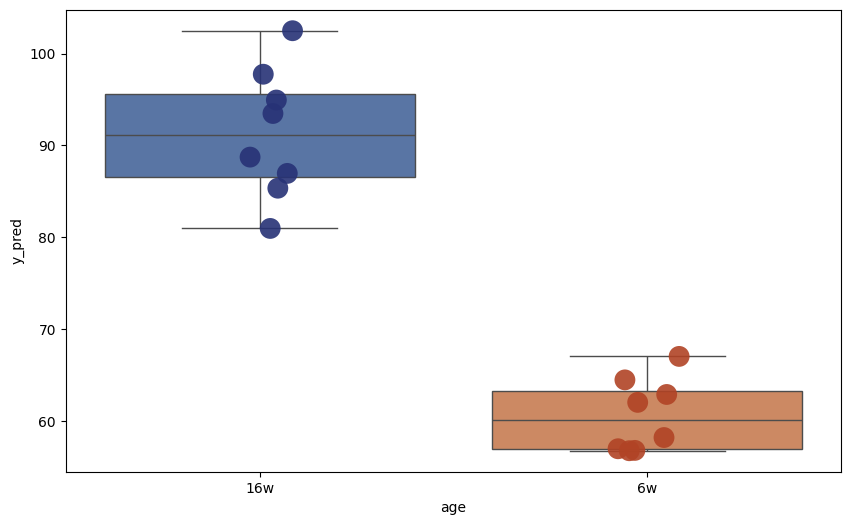

Components: 29
              y_pred
Heart_20   80.787738
Heart_18   86.957361
Heart_17   80.448943
Heart_16   88.469743
Heart_15   97.412656
Heart_13  102.911092
Heart_12   92.877047
Heart_11   94.402041
Heart_9    62.098919
Heart_8    56.195141
Heart_7    66.509153
Heart_5    62.155197
Heart_4    55.609540
Heart_3    56.747648
Heart_2    57.128284
Heart_1    61.425134
              y_pred  age
Heart_20   80.787738  16w
Heart_18   86.957361  16w
Heart_17   80.448943  16w
Heart_16   88.469743  16w
Heart_15   97.412656  16w
Heart_13  102.911092  16w
Heart_12   92.877047  16w
Heart_11   94.402041  16w
Heart_9    62.098919   6w
Heart_8    56.195141   6w
Heart_7    66.509153   6w
Heart_5    62.155197   6w
Heart_4    55.609540   6w
Heart_3    56.747648   6w
Heart_2    57.128284   6w
Heart_1    61.425134   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


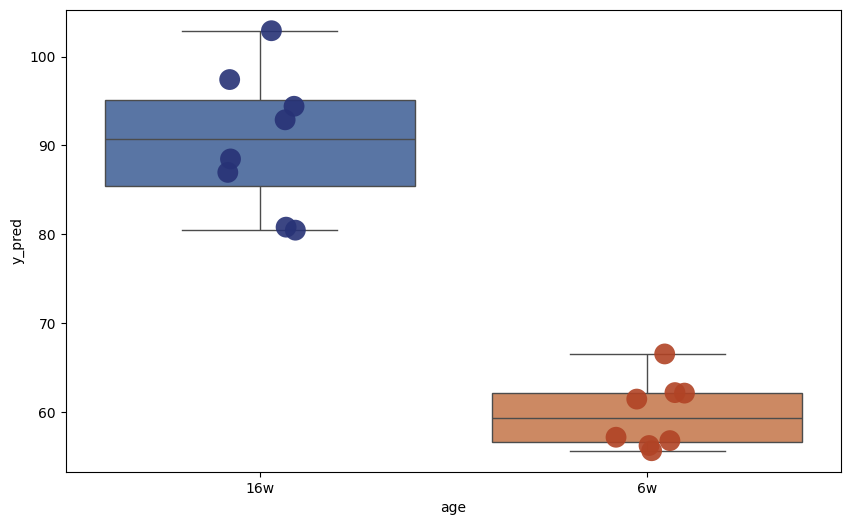

Components: 30
              y_pred
Heart_20   79.532424
Heart_18   87.192346
Heart_17   80.167281
Heart_16   87.414624
Heart_15   98.054969
Heart_13  103.309506
Heart_12   93.319614
Heart_11   94.410742
Heart_9    61.770293
Heart_8    56.134331
Heart_7    67.196677
Heart_5    62.578097
Heart_4    55.707576
Heart_3    56.727763
Heart_2    57.741057
Heart_1    62.400261

/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])



              y_pred  age
Heart_20   79.532424  16w
Heart_18   87.192346  16w
Heart_17   80.167281  16w
Heart_16   87.414624  16w
Heart_15   98.054969  16w
Heart_13  103.309506  16w
Heart_12   93.319614  16w
Heart_11   94.410742  16w
Heart_9    61.770293   6w
Heart_8    56.134331   6w
Heart_7    67.196677   6w
Heart_5    62.578097   6w
Heart_4    55.707576   6w
Heart_3    56.727763   6w
Heart_2    57.741057   6w
Heart_1    62.400261   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


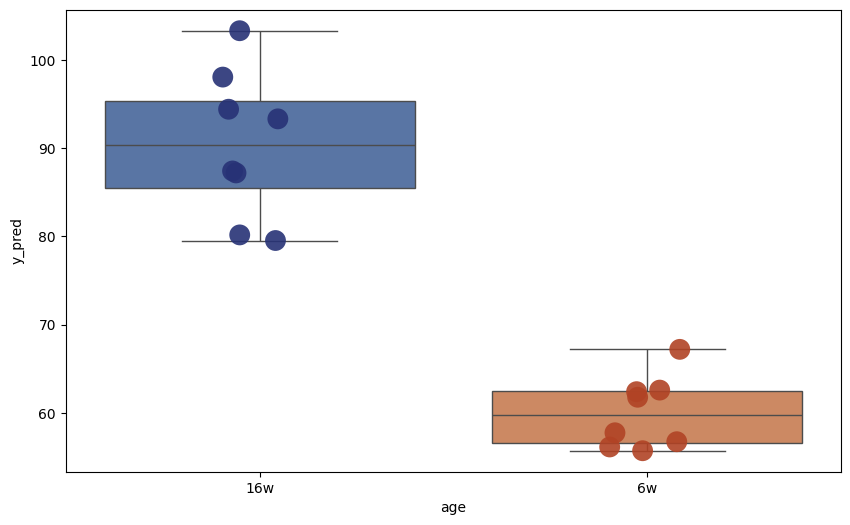

Components: 31


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.151995
Heart_18   87.272239
Heart_17   80.504249
Heart_16   87.883387
Heart_15   97.579144
Heart_13  102.758763
Heart_12   93.367196
Heart_11   93.920241
Heart_9    60.682505
Heart_8    55.093510
Heart_7    67.218098
Heart_5    62.250082
Heart_4    54.805767
Heart_3    56.089267
Heart_2    56.403979
Heart_1    61.340290
              y_pred  age
Heart_20   82.151995  16w
Heart_18   87.272239  16w
Heart_17   80.504249  16w
Heart_16   87.883387  16w
Heart_15   97.579144  16w
Heart_13  102.758763  16w
Heart_12   93.367196  16w
Heart_11   93.920241  16w
Heart_9    60.682505   6w
Heart_8    55.093510   6w
Heart_7    67.218098   6w
Heart_5    62.250082   6w
Heart_4    54.805767   6w
Heart_3    56.089267   6w
Heart_2    56.403979   6w
Heart_1    61.340290   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


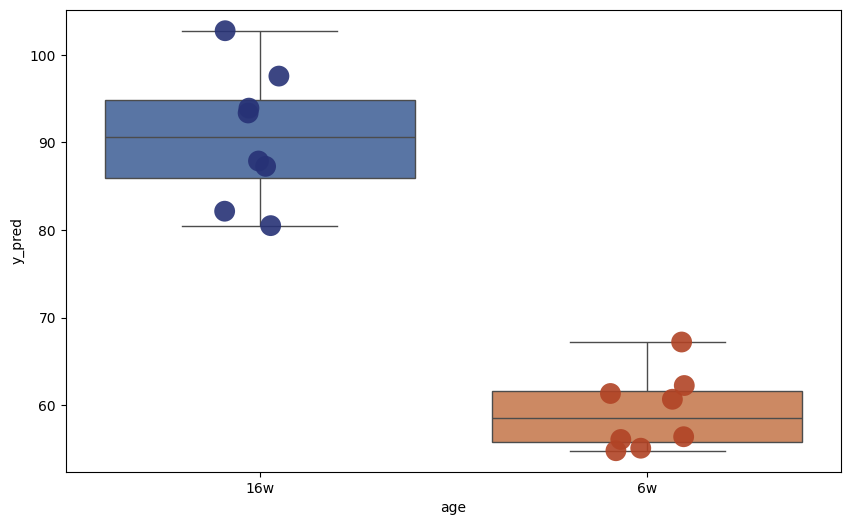

Components: 32


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.490925
Heart_18   87.096471
Heart_17   80.271520
Heart_16   87.280066
Heart_15   97.083172
Heart_13  103.557239
Heart_12   93.404011
Heart_11   94.564668
Heart_9    60.851171
Heart_8    55.620418
Heart_7    67.152185
Heart_5    61.882732
Heart_4    55.494089
Heart_3    56.039309
Heart_2    57.391487
Heart_1    62.395844
              y_pred  age
Heart_20   82.490925  16w
Heart_18   87.096471  16w
Heart_17   80.271520  16w
Heart_16   87.280066  16w
Heart_15   97.083172  16w
Heart_13  103.557239  16w
Heart_12   93.404011  16w
Heart_11   94.564668  16w
Heart_9    60.851171   6w
Heart_8    55.620418   6w
Heart_7    67.152185   6w
Heart_5    61.882732   6w
Heart_4    55.494089   6w
Heart_3    56.039309   6w
Heart_2    57.391487   6w
Heart_1    62.395844   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


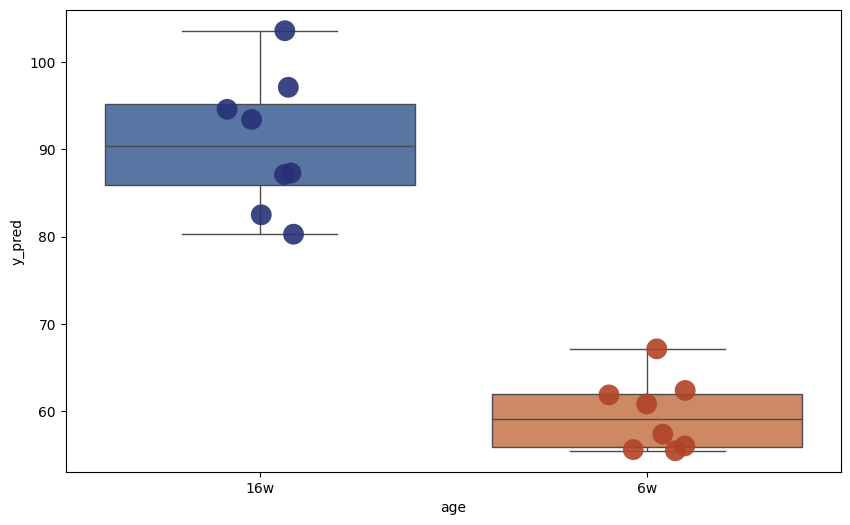

Components: 33


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   81.610133
Heart_18   86.660735
Heart_17   79.976110
Heart_16   87.082105
Heart_15   97.035308
Heart_13  102.863740
Heart_12   93.291005
Heart_11   94.342376
Heart_9    60.713832
Heart_8    55.472255
Heart_7    66.824658
Heart_5    61.857305
Heart_4    55.340609
Heart_3    56.207508
Heart_2    56.972864
Heart_1    62.299285
              y_pred  age
Heart_20   81.610133  16w
Heart_18   86.660735  16w
Heart_17   79.976110  16w
Heart_16   87.082105  16w
Heart_15   97.035308  16w
Heart_13  102.863740  16w
Heart_12   93.291005  16w
Heart_11   94.342376  16w
Heart_9    60.713832   6w
Heart_8    55.472255   6w
Heart_7    66.824658   6w
Heart_5    61.857305   6w
Heart_4    55.340609   6w
Heart_3    56.207508   6w
Heart_2    56.972864   6w
Heart_1    62.299285   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


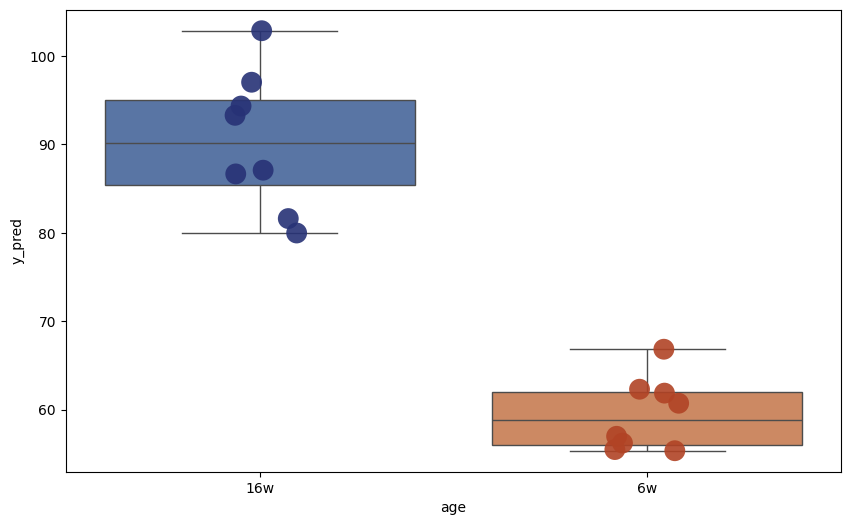

Components: 34


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.455163
Heart_18   86.380839
Heart_17   79.987601
Heart_16   86.829043
Heart_15   97.351562
Heart_13  103.099121
Heart_12   92.763260
Heart_11   94.102770
Heart_9    61.268256
Heart_8    55.896573
Heart_7    67.005438
Heart_5    61.957872
Heart_4    55.619449
Heart_3    56.266707
Heart_2    57.400602
Heart_1    62.195441
              y_pred  age
Heart_20   82.455163  16w
Heart_18   86.380839  16w
Heart_17   79.987601  16w
Heart_16   86.829043  16w
Heart_15   97.351562  16w
Heart_13  103.099121  16w
Heart_12   92.763260  16w
Heart_11   94.102770  16w
Heart_9    61.268256   6w
Heart_8    55.896573   6w
Heart_7    67.005438   6w
Heart_5    61.957872   6w
Heart_4    55.619449   6w
Heart_3    56.266707   6w
Heart_2    57.400602   6w
Heart_1    62.195441   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


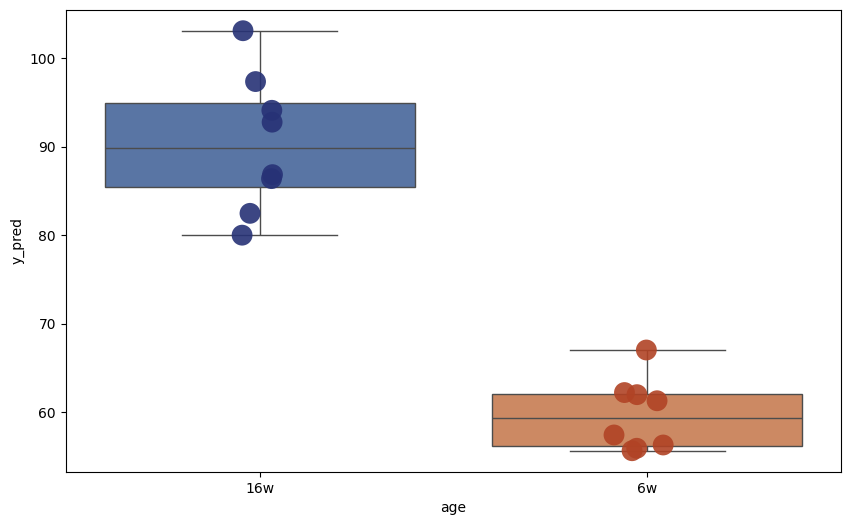

Components: 35


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.424802
Heart_18   86.187766
Heart_17   79.013442
Heart_16   86.581138
Heart_15   97.311317
Heart_13  103.027746
Heart_12   92.508258
Heart_11   93.410389
Heart_9    61.103706
Heart_8    55.403760
Heart_7    67.439306
Heart_5    62.026621
Heart_4    55.440469
Heart_3    56.161391
Heart_2    57.104159
Heart_1    61.820006
              y_pred  age
Heart_20   82.424802  16w
Heart_18   86.187766  16w
Heart_17   79.013442  16w
Heart_16   86.581138  16w
Heart_15   97.311317  16w
Heart_13  103.027746  16w
Heart_12   92.508258  16w
Heart_11   93.410389  16w
Heart_9    61.103706   6w
Heart_8    55.403760   6w
Heart_7    67.439306   6w
Heart_5    62.026621   6w
Heart_4    55.440469   6w
Heart_3    56.161391   6w
Heart_2    57.104159   6w
Heart_1    61.820006   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


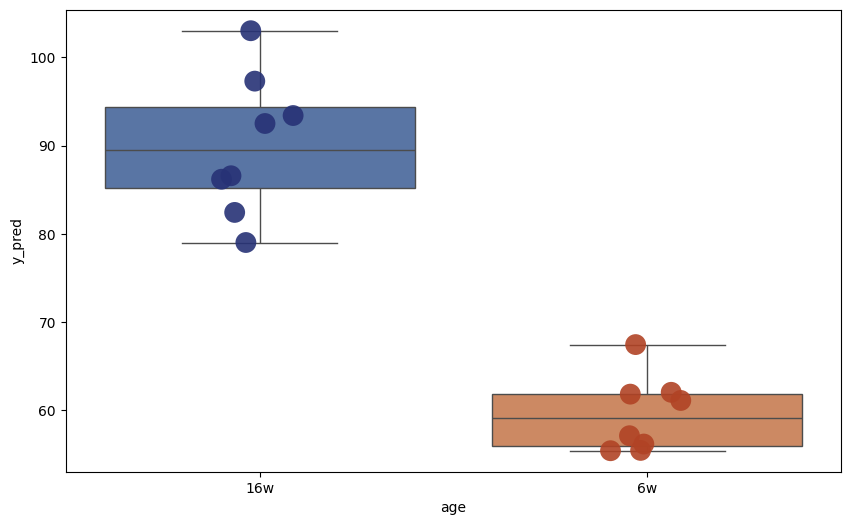

Components: 36


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   80.970060
Heart_18   87.032671
Heart_17   80.040248
Heart_16   86.943676
Heart_15   97.419539
Heart_13  103.107288
Heart_12   92.951367
Heart_11   94.265554
Heart_9    61.537280
Heart_8    56.289592
Heart_7    67.554641
Heart_5    62.505866
Heart_4    55.404549
Heart_3    56.531629
Heart_2    57.832332
Heart_1    63.053992
              y_pred  age
Heart_20   80.970060  16w
Heart_18   87.032671  16w
Heart_17   80.040248  16w
Heart_16   86.943676  16w
Heart_15   97.419539  16w
Heart_13  103.107288  16w
Heart_12   92.951367  16w
Heart_11   94.265554  16w
Heart_9    61.537280   6w
Heart_8    56.289592   6w
Heart_7    67.554641   6w
Heart_5    62.505866   6w
Heart_4    55.404549   6w
Heart_3    56.531629   6w
Heart_2    57.832332   6w
Heart_1    63.053992   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


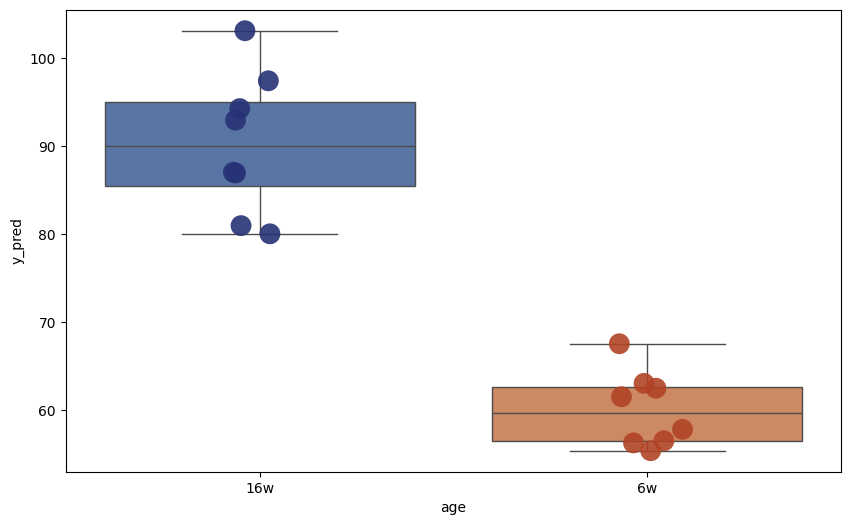

Components: 37


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   81.553066
Heart_18   86.507902
Heart_17   79.671971
Heart_16   87.117861
Heart_15   97.317138
Heart_13  103.229420
Heart_12   92.995154
Heart_11   93.926311
Heart_9    60.663723
Heart_8    55.387269
Heart_7    66.880355
Heart_5    61.405635
Heart_4    55.036999
Heart_3    55.688652
Heart_2    57.062055
Heart_1    62.280144
              y_pred  age
Heart_20   81.553066  16w
Heart_18   86.507902  16w
Heart_17   79.671971  16w
Heart_16   87.117861  16w
Heart_15   97.317138  16w
Heart_13  103.229420  16w
Heart_12   92.995154  16w
Heart_11   93.926311  16w
Heart_9    60.663723   6w
Heart_8    55.387269   6w
Heart_7    66.880355   6w
Heart_5    61.405635   6w
Heart_4    55.036999   6w
Heart_3    55.688652   6w
Heart_2    57.062055   6w
Heart_1    62.280144   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


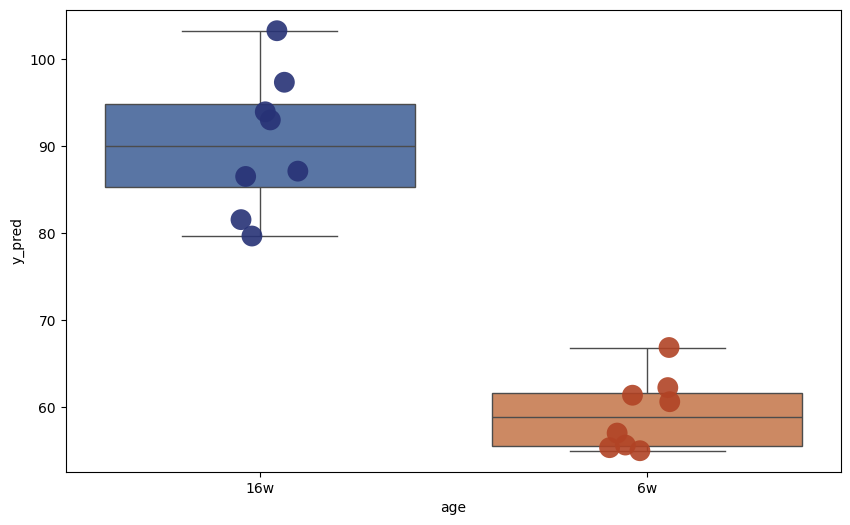

Components: 38


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.373535
Heart_18   86.574793
Heart_17   79.490068
Heart_16   87.258938
Heart_15   97.619568
Heart_13  103.104917
Heart_12   92.883533
Heart_11   93.525182
Heart_9    60.774748
Heart_8    55.334923
Heart_7    67.278755
Heart_5    61.760765
Heart_4    55.203865
Heart_3    56.222993
Heart_2    57.203780
Heart_1    62.430866
              y_pred  age
Heart_20   82.373535  16w
Heart_18   86.574793  16w
Heart_17   79.490068  16w
Heart_16   87.258938  16w
Heart_15   97.619568  16w
Heart_13  103.104917  16w
Heart_12   92.883533  16w
Heart_11   93.525182  16w
Heart_9    60.774748   6w
Heart_8    55.334923   6w
Heart_7    67.278755   6w
Heart_5    61.760765   6w
Heart_4    55.203865   6w
Heart_3    56.222993   6w
Heart_2    57.203780   6w
Heart_1    62.430866   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


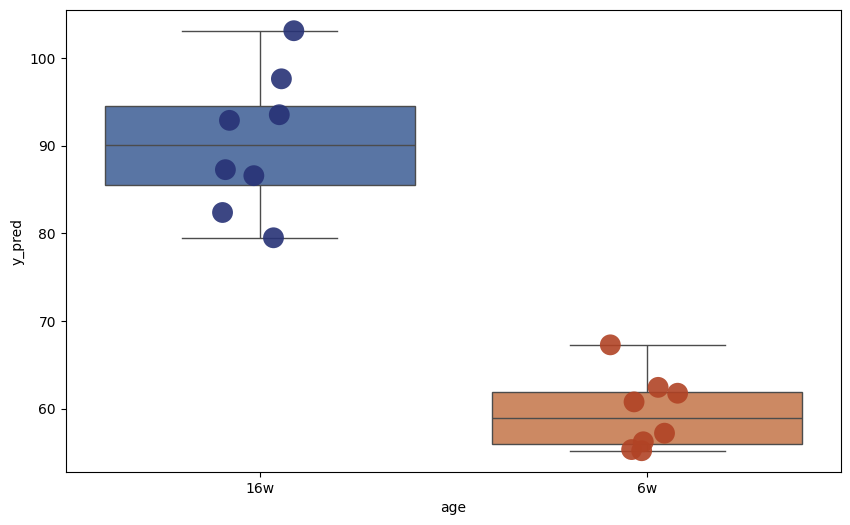

Components: 39


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   83.045408
Heart_18   86.255371
Heart_17   79.549937
Heart_16   86.809548
Heart_15   97.636185
Heart_13  104.032729
Heart_12   92.615778
Heart_11   93.805999
Heart_9    61.401093
Heart_8    56.002615
Heart_7    67.286140
Heart_5    62.586528
Heart_4    55.282908
Heart_3    56.448888
Heart_2    58.141000
Heart_1    62.717851
              y_pred  age
Heart_20   83.045408  16w
Heart_18   86.255371  16w
Heart_17   79.549937  16w
Heart_16   86.809548  16w
Heart_15   97.636185  16w
Heart_13  104.032729  16w
Heart_12   92.615778  16w
Heart_11   93.805999  16w
Heart_9    61.401093   6w
Heart_8    56.002615   6w
Heart_7    67.286140   6w
Heart_5    62.586528   6w
Heart_4    55.282908   6w
Heart_3    56.448888   6w
Heart_2    58.141000   6w
Heart_1    62.717851   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


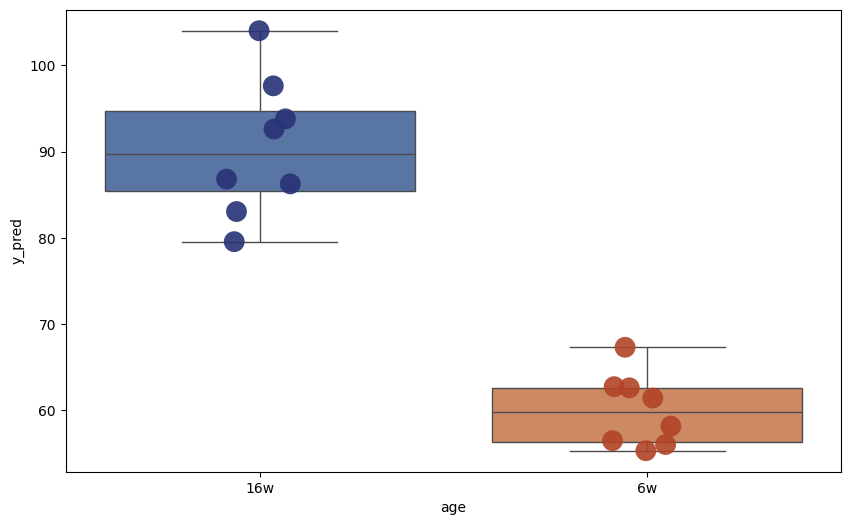

Components: 40


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   81.467697
Heart_18   86.335835
Heart_17   79.203575
Heart_16   87.064159
Heart_15   97.579326
Heart_13  103.330199
Heart_12   92.898436
Heart_11   93.819516
Heart_9    60.858246
Heart_8    55.497581
Heart_7    67.512730
Heart_5    62.126474
Heart_4    55.343344
Heart_3    56.195903
Heart_2    57.360250
Heart_1    62.362008
              y_pred  age
Heart_20   81.467697  16w
Heart_18   86.335835  16w
Heart_17   79.203575  16w
Heart_16   87.064159  16w
Heart_15   97.579326  16w
Heart_13  103.330199  16w
Heart_12   92.898436  16w
Heart_11   93.819516  16w
Heart_9    60.858246   6w
Heart_8    55.497581   6w
Heart_7    67.512730   6w
Heart_5    62.126474   6w
Heart_4    55.343344   6w
Heart_3    56.195903   6w
Heart_2    57.360250   6w
Heart_1    62.362008   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


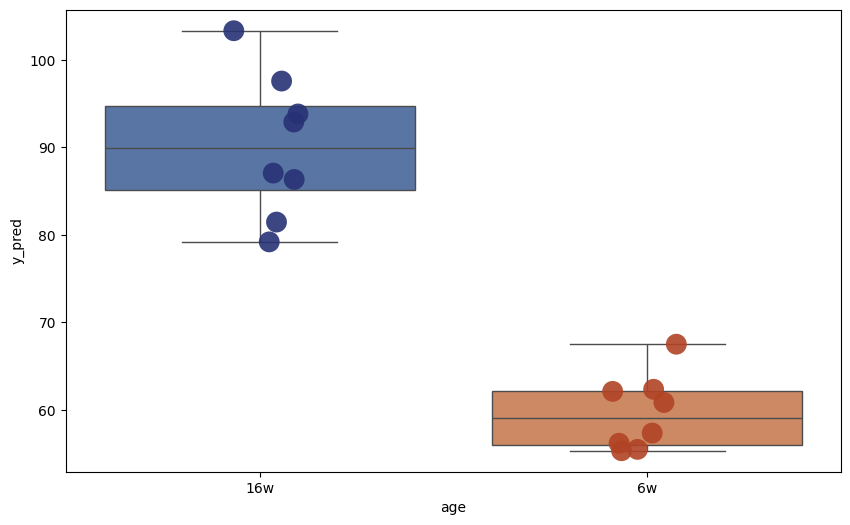

Components: 41


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   81.128695
Heart_18   86.081420
Heart_17   79.260829
Heart_16   86.981593
Heart_15   97.406573
Heart_13  103.615489
Heart_12   93.332573
Heart_11   94.160164
Heart_9    60.207091
Heart_8    54.859520
Heart_7    67.380761
Heart_5    62.267543
Heart_4    55.350876
Heart_3    55.405520
Heart_2    57.396478
Heart_1    62.057521
              y_pred  age
Heart_20   81.128695  16w
Heart_18   86.081420  16w
Heart_17   79.260829  16w
Heart_16   86.981593  16w
Heart_15   97.406573  16w
Heart_13  103.615489  16w
Heart_12   93.332573  16w
Heart_11   94.160164  16w
Heart_9    60.207091   6w
Heart_8    54.859520   6w
Heart_7    67.380761   6w
Heart_5    62.267543   6w
Heart_4    55.350876   6w
Heart_3    55.405520   6w
Heart_2    57.396478   6w
Heart_1    62.057521   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


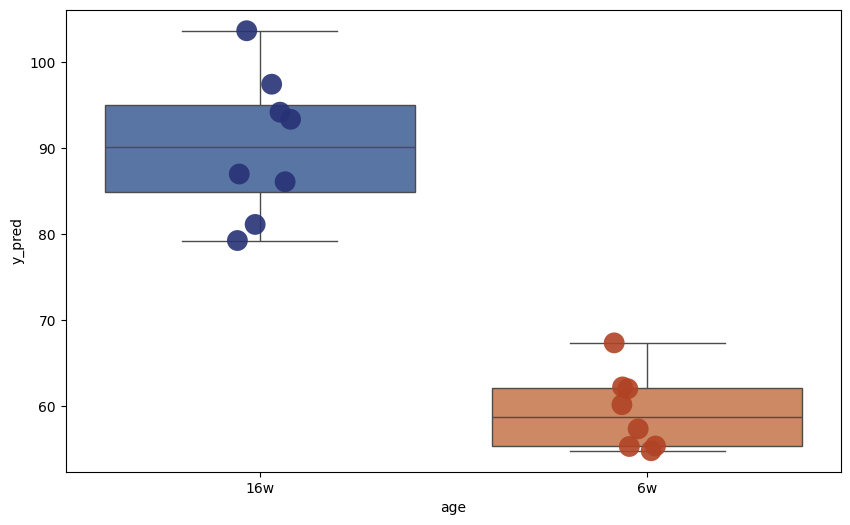

Components: 42


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   82.711529
Heart_18   85.746085
Heart_17   79.277744
Heart_16   86.712895
Heart_15   96.889174
Heart_13  102.945563
Heart_12   92.722038
Heart_11   93.713600
Heart_9    60.829454
Heart_8    55.917350
Heart_7    67.466940
Heart_5    62.238702
Heart_4    55.444500
Heart_3    56.059437
Heart_2    57.346956
Heart_1    62.652953
              y_pred  age
Heart_20   82.711529  16w
Heart_18   85.746085  16w
Heart_17   79.277744  16w
Heart_16   86.712895  16w
Heart_15   96.889174  16w
Heart_13  102.945563  16w
Heart_12   92.722038  16w
Heart_11   93.713600  16w
Heart_9    60.829454   6w
Heart_8    55.917350   6w
Heart_7    67.466940   6w
Heart_5    62.238702   6w
Heart_4    55.444500   6w
Heart_3    56.059437   6w
Heart_2    57.346956   6w
Heart_1    62.652953   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


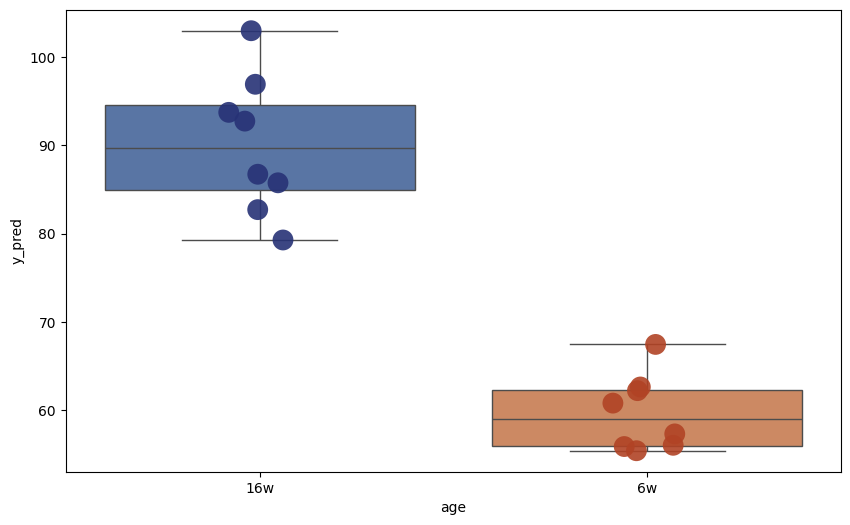

Components: 43
              y_pred
Heart_20   81.736996
Heart_18   85.211687
Heart_17   78.720706
Heart_16   86.606875
Heart_15   97.219895
Heart_13  102.923745
Heart_12   92.744530
Heart_11   93.501891
Heart_9    60.544275
Heart_8    55.519294
Heart_7    67.592012
Heart_5    62.768041
Heart_4    56.155129
Heart_3    55.930230
Heart_2    57.328257
Heart_1    63.003066
              y_pred  age
Heart_20   81.736996  16w
Heart_18   85.211687  16w
Heart_17   78.720706  16w
Heart_16   86.606875  16w
Heart_15   97.219895  16w
Heart_13  102.923745  16w
Heart_12   92.744530  16w
Heart_11   93.501891  16w
Heart_9    60.544275   6w
Heart_8    55.519294   6w
Heart_7    67.592012   6w
Heart_5    62.768041   6w
Heart_4    56.155129   6w
Heart_3    55.930230   6w
Heart_2    57.328257   6w
Heart_1    63.003066   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


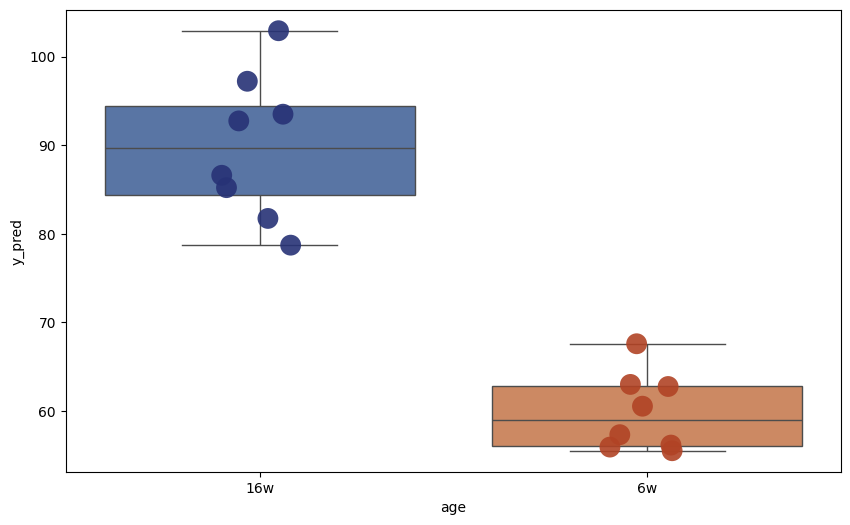

Components: 44
              y_pred
Heart_20   81.882822
Heart_18   85.863333
Heart_17   79.077786
Heart_16   86.474594
Heart_15   97.219114
Heart_13  104.081153
Heart_12   93.001021
Heart_11   93.716155
Heart_9    60.771936
Heart_8    55.735825
Heart_7    67.218279
Heart_5    62.584998
Heart_4    55.391698
Heart_3    55.670478
Heart_2    57.291989
Heart_1    63.543140
              y_pred  age
Heart_20   81.882822  16w
Heart_18   85.863333  16w
Heart_17   79.077786  16w
Heart_16   86.474594  16w
Heart_15   97.219114  16w
Heart_13  104.081153  16w
Heart_12   93.001021  16w
Heart_11   93.716155  16w
Heart_9    60.771936   6w
Heart_8    55.735825   6w
Heart_7    67.218279   6w
Heart_5    62.584998   6w
Heart_4    55.391698   6w
Heart_3    55.670478   6w
Heart_2    57.291989   6w
Heart_1    63.543140   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


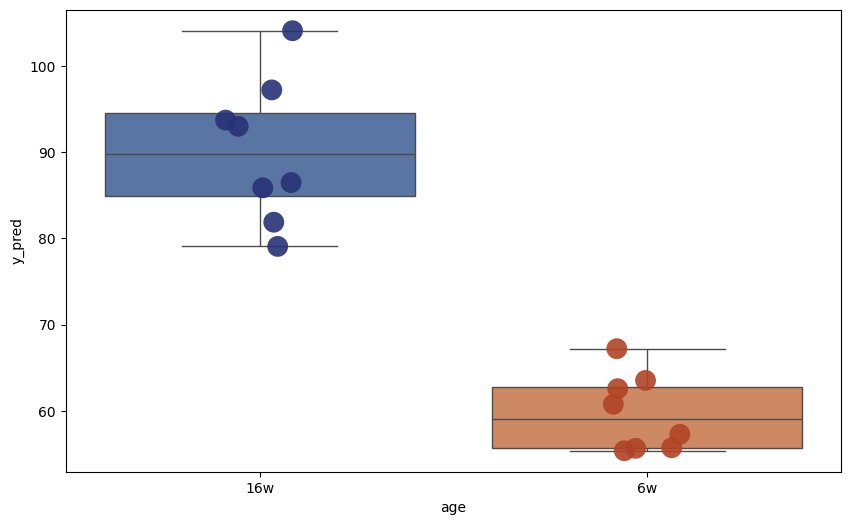

Components: 45
              y_pred
Heart_20   80.709643
Heart_18   85.537572
Heart_17   78.558243
Heart_16   86.303412
Heart_15   97.353720
Heart_13  103.132189
Heart_12   92.688623
Heart_11   93.510170
Heart_9    61.122405
Heart_8    56.194573
Heart_7    68.324121
Heart_5    63.470587
Heart_4    56.880149
Heart_3    56.498657
Heart_2    57.800513
Heart_1    63.533162
              y_pred  age
Heart_20   80.709643  16w
Heart_18   85.537572  16w
Heart_17   78.558243  16w
Heart_16   86.303412  16w
Heart_15   97.353720  16w
Heart_13  103.132189  16w
Heart_12   92.688623  16w
Heart_11   93.510170  16w
Heart_9    61.122405   6w
Heart_8    56.194573   6w
Heart_7    68.324121   6w
Heart_5    63.470587   6w
Heart_4    56.880149   6w
Heart_3    56.498657   6w
Heart_2    57.800513   6w
Heart_1    63.533162   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


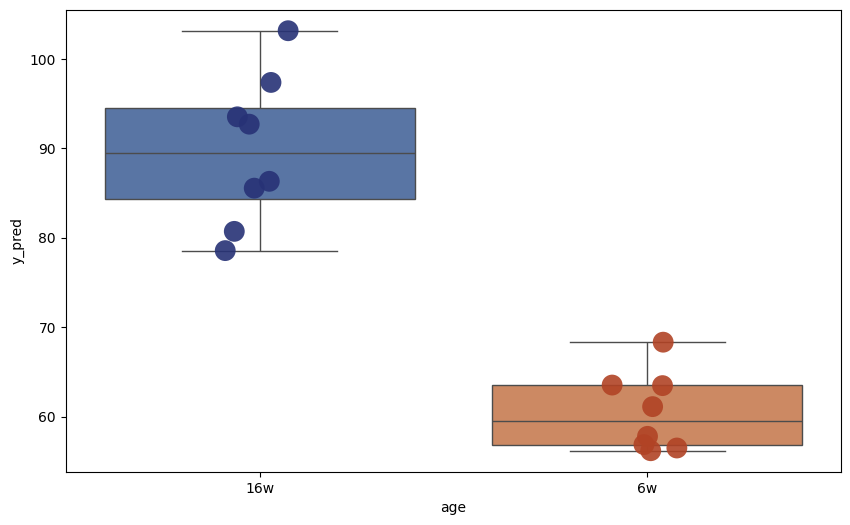

Components: 46
              y_pred
Heart_20   80.732562
Heart_18   85.292506
Heart_17   78.562415
Heart_16   86.377196
Heart_15   97.292173
Heart_13  102.939911
Heart_12   92.777202
Heart_11   93.460602
Heart_9    60.940794
Heart_8    55.732576
Heart_7    68.008038
Heart_5    63.154451
Heart_4    56.483948
Heart_3    56.239127
Heart_2    57.640012
Heart_1    63.264174
              y_pred  age
Heart_20   80.732562  16w
Heart_18   85.292506  16w
Heart_17   78.562415  16w
Heart_16   86.377196  16w
Heart_15   97.292173  16w
Heart_13  102.939911  16w
Heart_12   92.777202  16w
Heart_11   93.460602  16w
Heart_9    60.940794   6w
Heart_8    55.732576   6w
Heart_7    68.008038   6w
Heart_5    63.154451   6w
Heart_4    56.483948   6w
Heart_3    56.239127   6w
Heart_2    57.640012   6w
Heart_1    63.264174   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


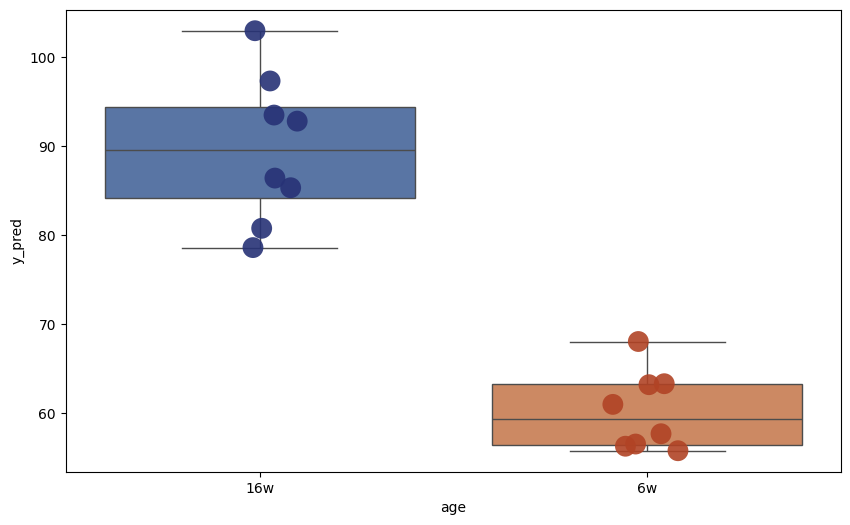

Components: 47
              y_pred
Heart_20   80.634026
Heart_18   85.421372
Heart_17   78.728033
Heart_16   86.131873
Heart_15   97.474862
Heart_13  102.801562
Heart_12   92.510730
Heart_11   93.545405
Heart_9    61.165149
Heart_8    55.809472
Heart_7    68.335998
Heart_5    63.422555
Heart_4    56.745256
Heart_3    56.390911
Heart_2    57.744424
Heart_1    62.895481
              y_pred  age
Heart_20   80.634026  16w
Heart_18   85.421372  16w
Heart_17   78.728033  16w
Heart_16   86.131873  16w
Heart_15   97.474862  16w
Heart_13  102.801562  16w
Heart_12   92.510730  16w
Heart_11   93.545405  16w
Heart_9    61.165149   6w
Heart_8    55.809472   6w
Heart_7    68.335998   6w
Heart_5    63.422555   6w
Heart_4    56.745256   6w
Heart_3    56.390911   6w
Heart_2    57.744424   6w
Heart_1    62.895481   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


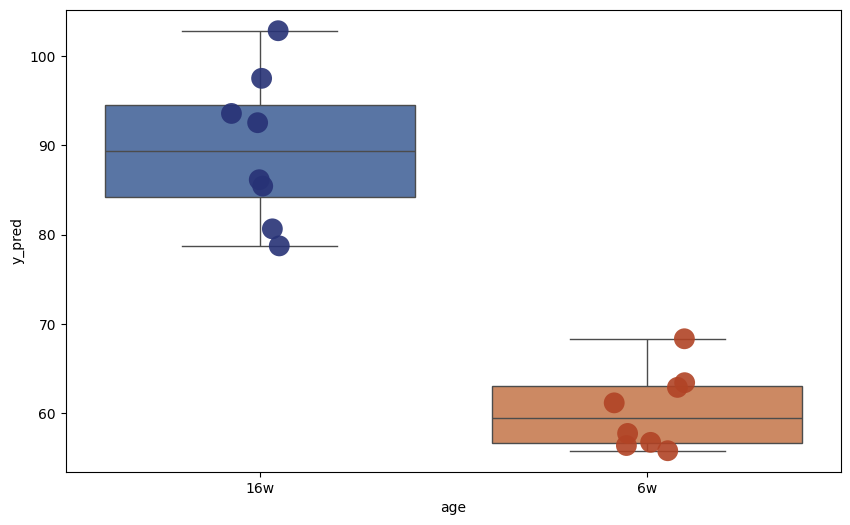

Components: 48


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


              y_pred
Heart_20   81.126119
Heart_18   85.444274
Heart_17   78.779249
Heart_16   85.827099
Heart_15   97.545655
Heart_13  103.224075
Heart_12   92.253789
Heart_11   93.390882
Heart_9    61.158420
Heart_8    55.527703
Heart_7    67.664395
Heart_5    63.619017
Heart_4    56.811048
Heart_3    56.587216
Heart_2    57.931385
Heart_1    62.752294
              y_pred  age
Heart_20   81.126119  16w
Heart_18   85.444274  16w
Heart_17   78.779249  16w
Heart_16   85.827099  16w
Heart_15   97.545655  16w
Heart_13  103.224075  16w
Heart_12   92.253789  16w
Heart_11   93.390882  16w
Heart_9    61.158420   6w
Heart_8    55.527703   6w
Heart_7    67.664395   6w
Heart_5    63.619017   6w
Heart_4    56.811048   6w
Heart_3    56.587216   6w
Heart_2    57.931385   6w
Heart_1    62.752294   6w


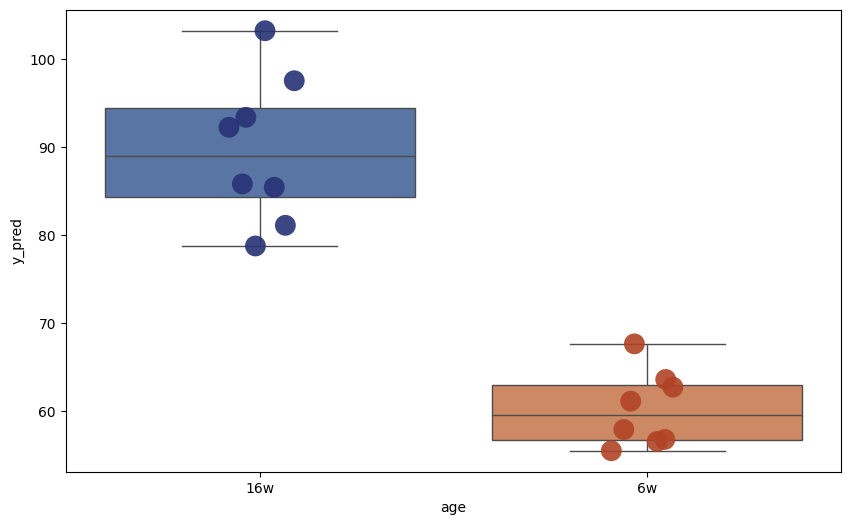

Components: 49
              y_pred
Heart_20   82.054419
Heart_18   85.746841
Heart_17   78.877821
Heart_16   85.922951
Heart_15   97.820168
Heart_13  103.173585
Heart_12   92.875381
Heart_11   93.593937
Heart_9    61.548381
Heart_8    55.648346
Heart_7    67.145013
Heart_5    63.071895
Heart_4    56.299228
Heart_3    56.144939
Heart_2    57.948638
Heart_1    61.948333
              y_pred  age
Heart_20   82.054419  16w
Heart_18   85.746841  16w
Heart_17   78.877821  16w
Heart_16   85.922951  16w
Heart_15   97.820168  16w
Heart_13  103.173585  16w
Heart_12   92.875381  16w
Heart_11   93.593937  16w
Heart_9    61.548381   6w
Heart_8    55.648346   6w
Heart_7    67.145013   6w
Heart_5    63.071895   6w
Heart_4    56.299228   6w
Heart_3    56.144939   6w
Heart_2    57.948638   6w
Heart_1    61.948333   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


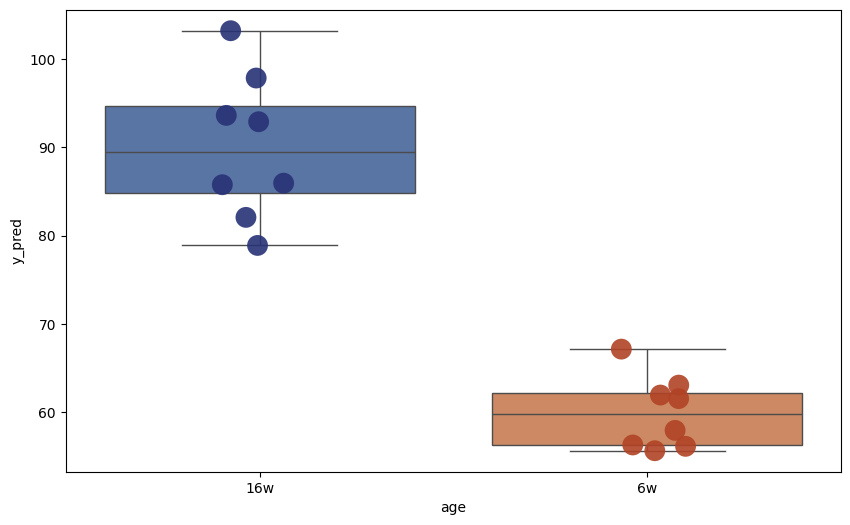

Components: 50
              y_pred
Heart_20   82.354360
Heart_18   85.649648
Heart_17   79.444989
Heart_16   85.799161
Heart_15   97.984457
Heart_13  103.314603
Heart_12   93.044881
Heart_11   93.806884
Heart_9    61.498466
Heart_8    55.816639
Heart_7    67.129044
Heart_5    62.671111
Heart_4    56.306423
Heart_3    56.370814
Heart_2    57.774755
Heart_1    62.089783
              y_pred  age
Heart_20   82.354360  16w
Heart_18   85.649648  16w
Heart_17   79.444989  16w
Heart_16   85.799161  16w
Heart_15   97.984457  16w
Heart_13  103.314603  16w
Heart_12   93.044881  16w
Heart_11   93.806884  16w
Heart_9    61.498466   6w
Heart_8    55.816639   6w
Heart_7    67.129044   6w
Heart_5    62.671111   6w
Heart_4    56.306423   6w
Heart_3    56.370814   6w
Heart_2    57.774755   6w
Heart_1    62.089783   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


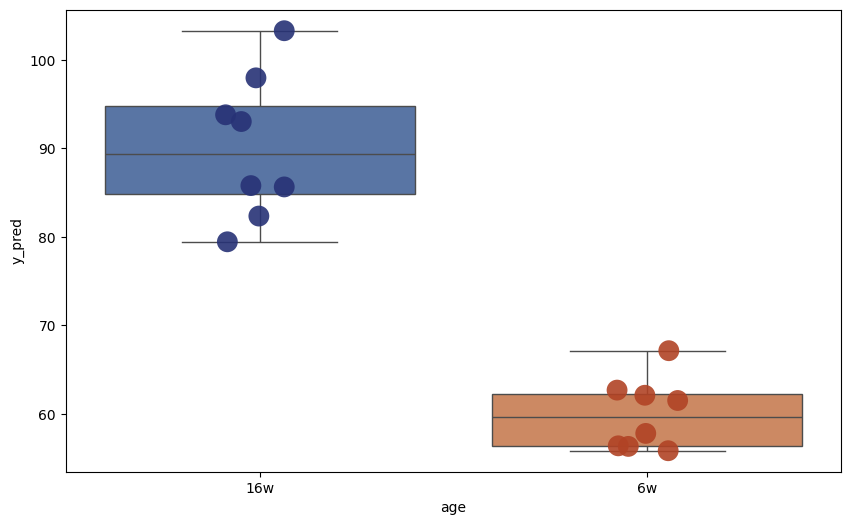

Components: 51


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])


              y_pred
Heart_20   83.369235
Heart_18   85.575831
Heart_17   78.827177
Heart_16   85.917916
Heart_15   98.018734
Heart_13  103.165324
Heart_12   92.894856
Heart_11   93.644478
Heart_9    61.204748
Heart_8    55.578043
Heart_7    66.916470
Heart_5    62.184055
Heart_4    56.261910
Heart_3    56.066223
Heart_2    57.484664
Heart_1    61.671282
              y_pred  age
Heart_20   83.369235  16w
Heart_18   85.575831  16w
Heart_17   78.827177  16w
Heart_16   85.917916  16w
Heart_15   98.018734  16w
Heart_13  103.165324  16w
Heart_12   92.894856  16w
Heart_11   93.644478  16w
Heart_9    61.204748   6w
Heart_8    55.578043   6w
Heart_7    66.916470   6w
Heart_5    62.184055   6w
Heart_4    56.261910   6w
Heart_3    56.066223   6w
Heart_2    57.484664   6w
Heart_1    61.671282   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


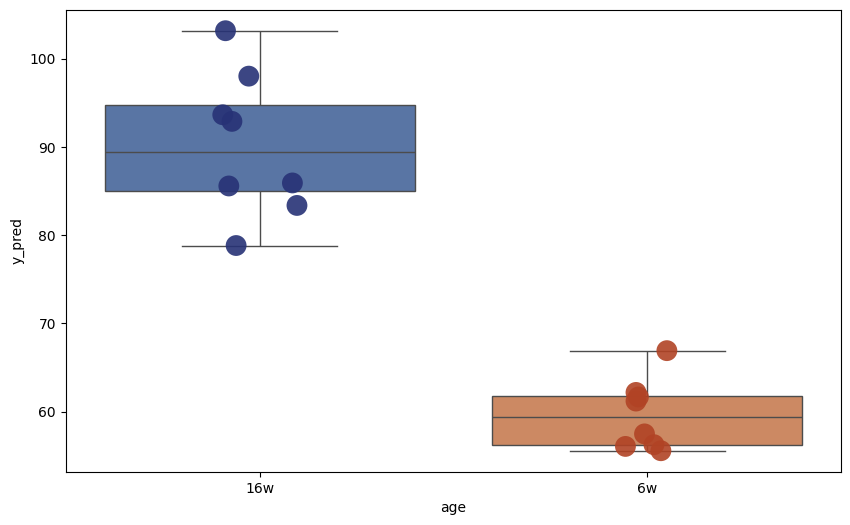

Components: 52
              y_pred
Heart_20   83.382678
Heart_18   85.597050
Heart_17   78.835990
Heart_16   85.933378
Heart_15   98.020451
Heart_13  103.143012
Heart_12   92.891696
Heart_11   93.630378
Heart_9    61.204145
Heart_8    55.580854
Heart_7    66.907434
Heart_5    62.167432
Heart_4    56.252268
Heart_3    56.042544
Heart_2    57.472421
Heart_1    61.661759
              y_pred  age
Heart_20   83.382678  16w
Heart_18   85.597050  16w
Heart_17   78.835990  16w
Heart_16   85.933378  16w
Heart_15   98.020451  16w
Heart_13  103.143012  16w
Heart_12   92.891696  16w
Heart_11   93.630378  16w
Heart_9    61.204145   6w
Heart_8    55.580854   6w
Heart_7    66.907434   6w
Heart_5    62.167432   6w
Heart_4    56.252268   6w
Heart_3    56.042544   6w
Heart_2    57.472421   6w
Heart_1    61.661759   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


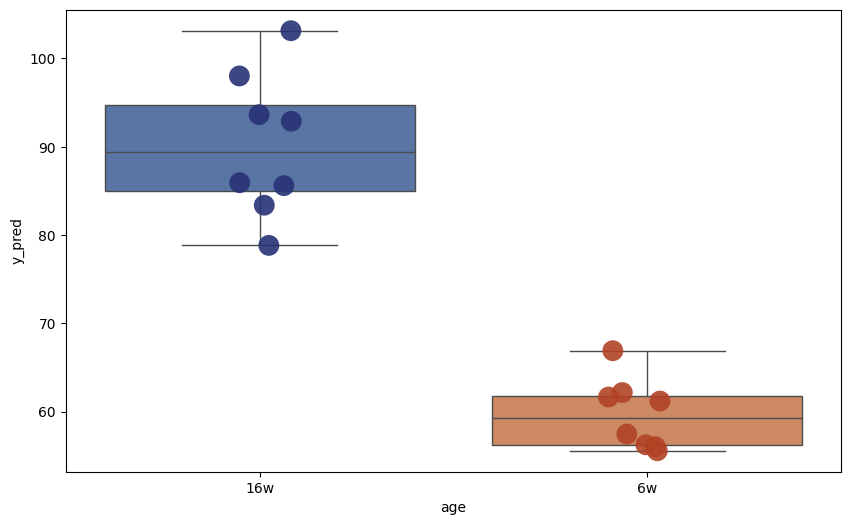

Components: 53


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


              y_pred
Heart_20   83.460485
Heart_18   85.543754
Heart_17   78.778016
Heart_16   85.913826
Heart_15   97.998677
Heart_13  103.185048
Heart_12   92.907284
Heart_11   93.623728
Heart_9    61.269353
Heart_8    55.612788
Heart_7    66.919017
Heart_5    62.234838
Heart_4    56.292097
Heart_3    55.989135
Heart_2    57.514129
Heart_1    61.754185
              y_pred  age
Heart_20   83.460485  16w
Heart_18   85.543754  16w
Heart_17   78.778016  16w
Heart_16   85.913826  16w
Heart_15   97.998677  16w
Heart_13  103.185048  16w
Heart_12   92.907284  16w
Heart_11   93.623728  16w
Heart_9    61.269353   6w
Heart_8    55.612788   6w
Heart_7    66.919017   6w
Heart_5    62.234838   6w
Heart_4    56.292097   6w
Heart_3    55.989135   6w
Heart_2    57.514129   6w
Heart_1    61.754185   6w


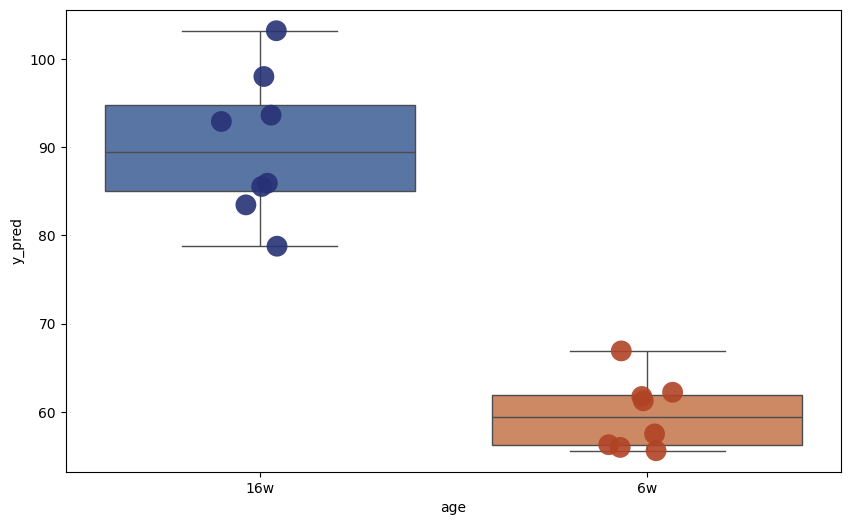

Components: 54
              y_pred
Heart_20   82.846903
Heart_18   85.582737
Heart_17   78.715824
Heart_16   86.170243
Heart_15   98.242969
Heart_13  103.609748
Heart_12   93.008051
Heart_11   93.800087
Heart_9    61.276015
Heart_8    55.534868
Heart_7    66.793961
Heart_5    62.453898
Heart_4    56.206680
Heart_3    56.152581
Heart_2    57.586582
Heart_1    62.192952
              y_pred  age
Heart_20   82.846903  16w
Heart_18   85.582737  16w
Heart_17   78.715824  16w
Heart_16   86.170243  16w
Heart_15   98.242969  16w
Heart_13  103.609748  16w
Heart_12   93.008051  16w
Heart_11   93.800087  16w
Heart_9    61.276015   6w
Heart_8    55.534868   6w
Heart_7    66.793961   6w
Heart_5    62.453898   6w
Heart_4    56.206680   6w
Heart_3    56.152581   6w
Heart_2    57.586582   6w
Heart_1    62.192952   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


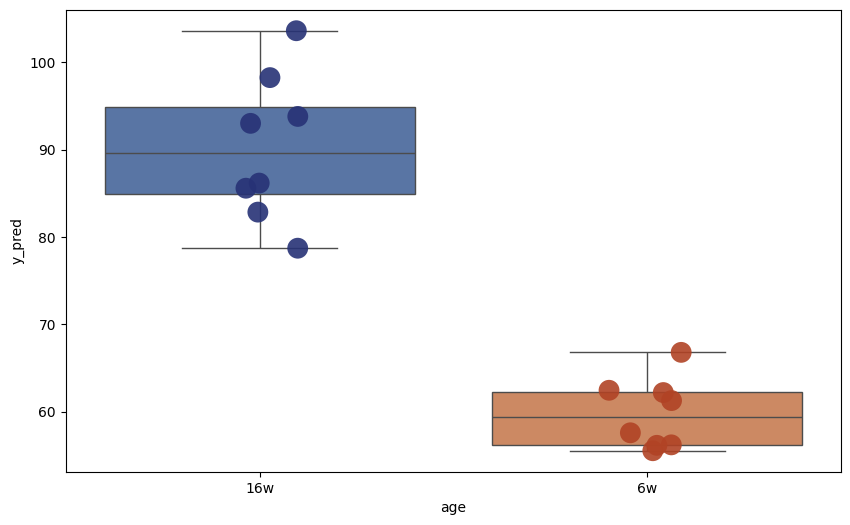

Components: 55
              y_pred
Heart_20   82.464517
Heart_18   85.707229
Heart_17   78.837308
Heart_16   86.224448
Heart_15   98.236668
Heart_13  103.506772
Heart_12   93.108923
Heart_11   93.894751
Heart_9    61.181931
Heart_8    55.482634
Heart_7    66.769956
Heart_5    62.429576
Heart_4    56.087778
Heart_3    56.200148
Heart_2    57.502482
Heart_1    62.137739
              y_pred  age
Heart_20   82.464517  16w
Heart_18   85.707229  16w
Heart_17   78.837308  16w
Heart_16   86.224448  16w
Heart_15   98.236668  16w
Heart_13  103.506772  16w
Heart_12   93.108923  16w
Heart_11   93.894751  16w
Heart_9    61.181931   6w
Heart_8    55.482634   6w
Heart_7    66.769956   6w
Heart_5    62.429576   6w
Heart_4    56.087778   6w
Heart_3    56.200148   6w
Heart_2    57.502482   6w
Heart_1    62.137739   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


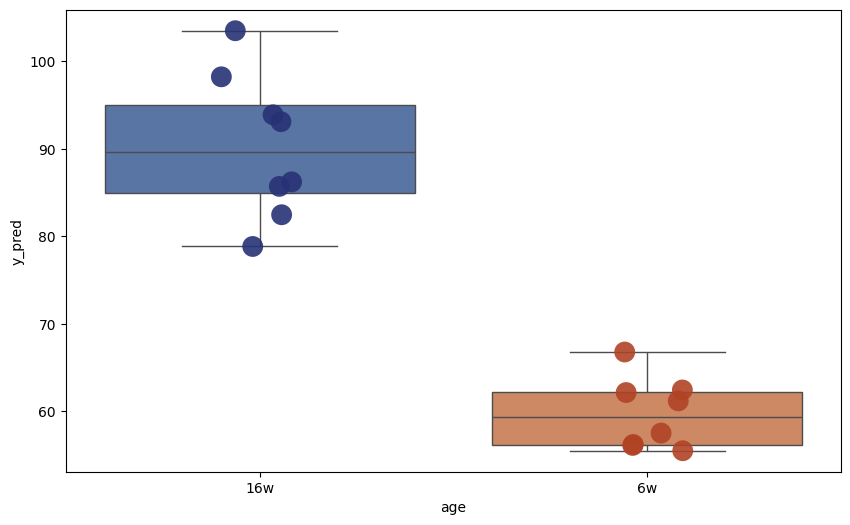

Components: 56
              y_pred
Heart_20   82.732084
Heart_18   85.921112
Heart_17   78.755112
Heart_16   86.396923
Heart_15   98.263009
Heart_13  103.743606
Heart_12   93.411759
Heart_11   93.978912
Heart_9    61.070639
Heart_8    55.594497
Heart_7    67.014080
Heart_5    62.345029
Heart_4    55.932550
Heart_3    56.109043
Heart_2    57.346778
Heart_1    62.098898
              y_pred  age
Heart_20   82.732084  16w
Heart_18   85.921112  16w
Heart_17   78.755112  16w
Heart_16   86.396923  16w
Heart_15   98.263009  16w
Heart_13  103.743606  16w
Heart_12   93.411759  16w
Heart_11   93.978912  16w
Heart_9    61.070639   6w
Heart_8    55.594497   6w
Heart_7    67.014080   6w
Heart_5    62.345029   6w
Heart_4    55.932550   6w
Heart_3    56.109043   6w
Heart_2    57.346778   6w
Heart_1    62.098898   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


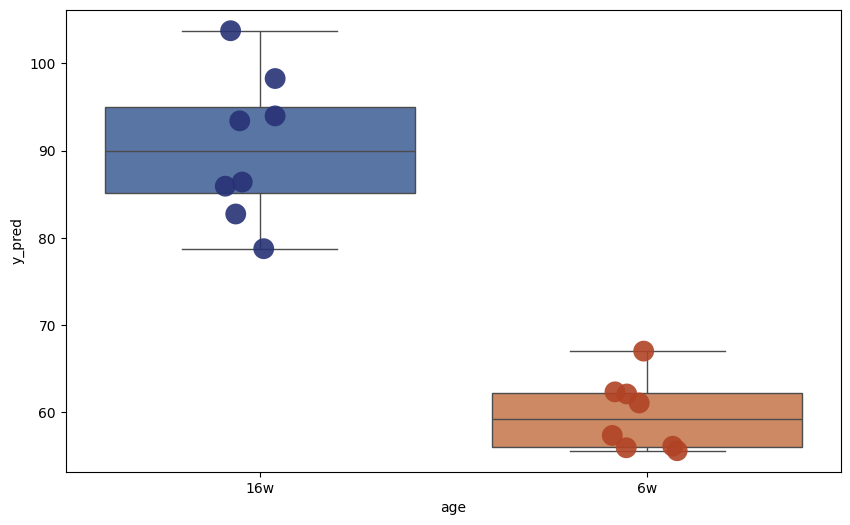

Components: 57
              y_pred
Heart_20   82.311046
Heart_18   86.403772
Heart_17   79.308947
Heart_16   87.011017
Heart_15   98.619674
Heart_13  103.070461
Heart_12   93.812765
Heart_11   94.451632
Heart_9    61.171069
Heart_8    55.580790
Heart_7    67.066214
Heart_5    62.569327
Heart_4    56.031555
Heart_3    56.343269
Heart_2    57.751591
Heart_1    61.972062
              y_pred  age
Heart_20   82.311046  16w
Heart_18   86.403772  16w
Heart_17   79.308947  16w
Heart_16   87.011017  16w
Heart_15   98.619674  16w
Heart_13  103.070461  16w
Heart_12   93.812765  16w
Heart_11   94.451632  16w
Heart_9    61.171069   6w
Heart_8    55.580790   6w
Heart_7    67.066214   6w
Heart_5    62.569327   6w
Heart_4    56.031555   6w
Heart_3    56.343269   6w
Heart_2    57.751591   6w
Heart_1    61.972062   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


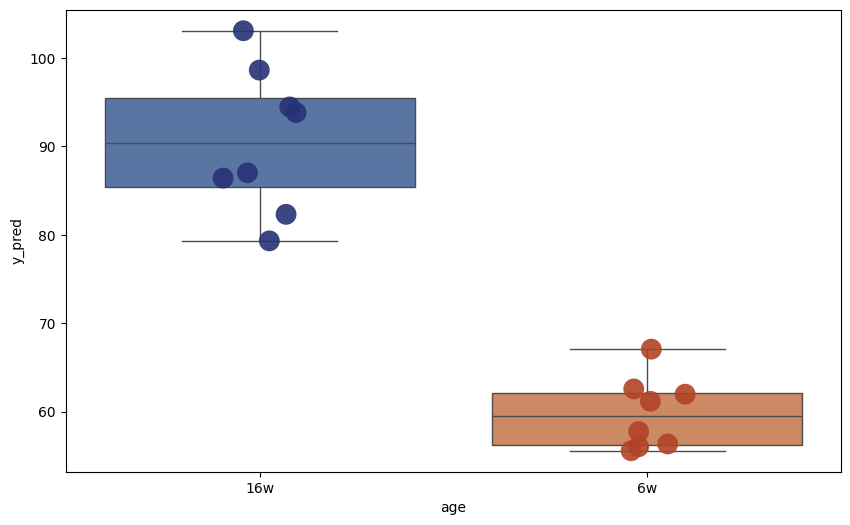

Components: 58
              y_pred
Heart_20   82.310738
Heart_18   86.409593
Heart_17   79.315542
Heart_16   87.011477
Heart_15   98.623685
Heart_13  103.070204
Heart_12   93.823517
Heart_11   94.455444
Heart_9    61.169928
Heart_8    55.576838
Heart_7    67.072214
Heart_5    62.571381
Heart_4    56.028168
Heart_3    56.343155
Heart_2    57.750277
Heart_1    61.970117
              y_pred  age
Heart_20   82.310738  16w
Heart_18   86.409593  16w
Heart_17   79.315542  16w
Heart_16   87.011477  16w
Heart_15   98.623685  16w
Heart_13  103.070204  16w
Heart_12   93.823517  16w
Heart_11   94.455444  16w
Heart_9    61.169928   6w
Heart_8    55.576838   6w
Heart_7    67.072214   6w
Heart_5    62.571381   6w
Heart_4    56.028168   6w
Heart_3    56.343155   6w
Heart_2    57.750277   6w
Heart_1    61.970117   6w


/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48646332/ipykernel_21549/760688371.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


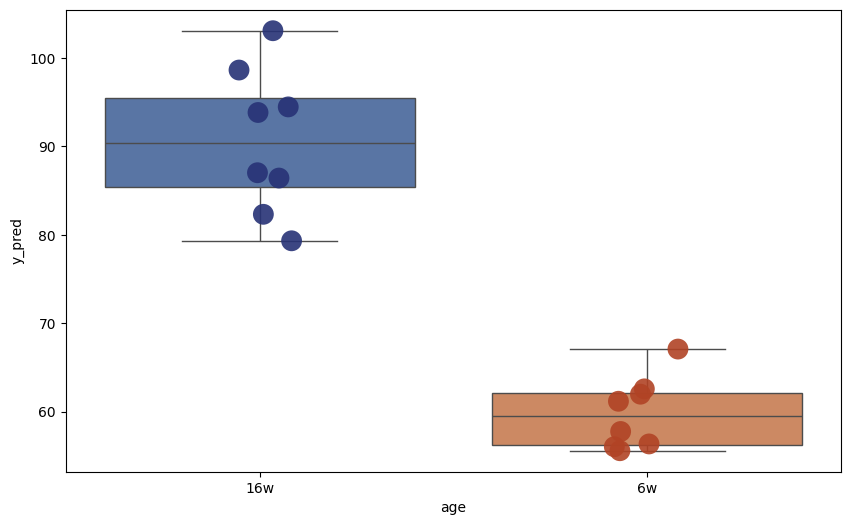

In [257]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [184]:
n_components = 11

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test.index.tolist())

results_df["age"] = df_intervention_test_metadata["age"]

print(results_df)
results_df.to_csv("./AlanXu_heart_sexcombo_Calibratedpredictions_11PCs_EC-250725.csv")

              y_pred  age
Heart_20   83.835073  16w
Heart_18   83.942014  16w
Heart_17   83.927434  16w
Heart_16   85.403656  16w
Heart_15   96.873944  16w
Heart_13  102.957043  16w
Heart_12   94.182969  16w
Heart_11   91.819221  16w
Heart_9    69.008518   6w
Heart_8    62.676952   6w
Heart_7    70.567268   6w
Heart_5    73.632025   6w
Heart_4    59.105580   6w
Heart_3    57.067800   6w
Heart_2    62.048808   6w
Heart_1    64.228291   6w


In [ ]:
##### Sample rotation

In [279]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age.index and df_intervention_age.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [ ]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention = pd.concat([tissue_df_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention.drop(
            atlas_plus_intervention.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/2025] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_19
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/2025] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_18
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/2025] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_17
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/2025] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_16
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16


### Male

In [185]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_counts_male = df_intervention_age_counts.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_counts_male = df_intervention_age_counts_male.loc[
    df_intervention_age_counts_male.index.isin(male_samples)
]

df_intervention_age_counts_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107377225,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35
Heart_15,154.890147,454.821935,127.135265,141.460366,0.000000,100.275702,1.790638,0.0,461.984486,415.427910,...,12.534463,877.412395,0.000000,0.000000,12.534463,12.534463,30.440838,2147.869731,184.435667,99.380384
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,10.366751,879.446072,0.000000,3.455584,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011
Heart_13,156.610045,405.097982,231.782866,164.962580,2.088134,77.260955,0.000000,0.0,235.959134,491.755540,...,8.352536,1050.331365,2.088134,12.528804,8.352536,2.088134,31.322009,2570.492864,139.904973,73.084687


In [186]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_15,SRR24062711,16w,RNA-Seq,300,5354568900,Dario Valenzano laboratory,PRJNA952180,SAMN34067667,Model organism or animal,1944591023,...,2023-04-04T11:27:00Z,1,GRZ-AD_8244_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062711.featureCounts,SRR24062711,No
Heart_14,SRR24062712,16w,RNA-Seq,300,5835318000,Dario Valenzano laboratory,PRJNA952180,SAMN34067666,Model organism or animal,2124298064,...,2023-04-04T11:30:00Z,1,GRZ-AD_8245_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062712.featureCounts,SRR24062712,No
Heart_13,SRR24062713,16w,RNA-Seq,300,4789725900,Dario Valenzano laboratory,PRJNA952180,SAMN34067665,Model organism or animal,1751377969,...,2023-04-04T11:27:00Z,1,GRZ-AD_8222_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062713.featureCounts,SRR24062713,No


In [187]:
# Find common columns (genes) between atlas and the dataset of interest
common_columns = tissue_df_male_age.columns.intersection(df_intervention_age_counts_male.columns)

# Select only the common columns from both DataFrames
tissue_df_male_age_common = tissue_df_male_age[common_columns]
df_intervention_age_counts_male_common = df_intervention_age_counts_male[common_columns]

In [188]:
tissue_df_male_age_common.head(5)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,837.894212,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,948.993808,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,764.407581,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918
B13_2,20.962146,585.707020,218.252932,487.061627,445.137335,694.216952,912.469884,1789.180813,537.617391,647.360391,...,766.967930,67.818708,1583.258555,191.125449,1464.884084,53.021899,822.455963,4199.827601,228.117471,453.768807
B14_2,79.955588,662.489160,237.851078,465.623720,548.938787,626.878688,1090.486721,934.606918,580.517885,624.191105,...,651.066933,81.971275,2270.335570,176.708569,1688.473894,112.878478,876.151993,4780.537904,313.775292,423.966187


In [189]:
df_intervention_age_counts_male_common.head(5)

Sample.Name,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim6,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3
Heart_15,0.000000,69.834864,57.300401,62.672314,82.369327,189.807579,291.873919,237.259474,103.856977,35.812751,...,307.989657,24.173607,1213.156934,51.033170,161.157379,3.581275,388.568346,1205.099065,777.136693,590.910389
Heart_14,3.455584,97.620242,77.750635,80.342323,48.378173,158.956854,406.031094,126.128808,131.312184,55.289340,...,300.635789,21.597399,1186.993028,38.875318,146.862311,11.230647,290.269037,3426.211316,972.746834,347.286170
Heart_13,12.528804,96.054161,91.877893,93.966027,73.084687,164.962580,321.572625,191.064254,114.847366,72.040620,...,349.762433,12.528804,1159.958397,25.057607,190.020187,9.396603,439.552192,1121.327919,854.046776,525.165683
Heart_12,3.541997,81.465925,108.916400,63.755941,79.694926,185.954828,234.657284,168.244845,92.091915,47.816956,...,297.527726,14.167987,1087.392997,34.534468,233.771784,10.625990,332.947693,653.498397,576.459968,544.581998
Heart_11,1.894750,74.842612,125.053478,91.895359,90.000609,195.159216,320.212695,197.053966,89.053235,56.842490,...,297.475699,3.789499,973.901332,66.316239,255.791206,11.368498,331.581193,590.214523,539.056282,640.425389


##### Calibration

In [190]:
male_samples = df_intervention_age[df_intervention_age['sex'] == 'male'].index

df_intervention_age_male = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(male_samples)
]

df_intervention_age_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_15,154.890147,454.821935,127.135265,141.460366,0.000000,100.275702,1.790638,0.0,461.984486,415.427910,...,12.534463,12.534463,30.440838,2147.869731,184.435667,99.380384,Heart,16w,male,112
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011,Heart,16w,male,112
Heart_13,156.610045,405.097982,231.782866,164.962580,2.088134,77.260955,0.000000,0.0,235.959134,491.755540,...,8.352536,2.088134,31.322009,2570.492864,139.904973,73.084687,Heart,16w,male,112


In [191]:
# Get indices where sex is 'F' in df_intervention_age
male_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'male'].index

df_intervention_metadata_male = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_male = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(male_samples)
]

df_intervention_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_15,SRR24062711,16w,RNA-Seq,300,5354568900,Dario Valenzano laboratory,PRJNA952180,SAMN34067667,Model organism or animal,1944591023,...,2023-04-04T11:27:00Z,1,GRZ-AD_8244_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062711.featureCounts,SRR24062711,No
Heart_14,SRR24062712,16w,RNA-Seq,300,5835318000,Dario Valenzano laboratory,PRJNA952180,SAMN34067666,Model organism or animal,2124298064,...,2023-04-04T11:30:00Z,1,GRZ-AD_8245_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062712.featureCounts,SRR24062712,No
Heart_13,SRR24062713,16w,RNA-Seq,300,4789725900,Dario Valenzano laboratory,PRJNA952180,SAMN34067665,Model organism or animal,1751377969,...,2023-04-04T11:27:00Z,1,GRZ-AD_8222_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062713.featureCounts,SRR24062713,No


In [192]:
random.seed(123)

# Separate the samples
young_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in male_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_15,154.890147,454.821935,127.135265,141.460366,0.000000,100.275702,1.790638,0.0,461.984486,415.427910,...,12.534463,12.534463,30.440838,2147.869731,184.435667,99.380384,Heart,16w,male,112
Heart_12,192.153323,390.505140,68.183437,167.359346,1.770998,100.061408,0.000000,0.0,251.481768,493.223045,...,15.938985,10.625990,30.106972,2070.297091,200.122815,115.114894,Heart,16w,male,112
Heart_5,170.160069,350.383367,56.720023,80.505839,1.829678,104.291655,0.000000,0.0,305.556253,494.927942,...,12.807747,7.318713,56.720023,2332.839653,232.369126,68.612931,Heart,6w,male,42
Heart_3,144.813586,556.893424,76.666016,93.702909,4.259223,89.443686,0.000000,0.0,376.941247,402.496586,...,4.259223,2.129612,59.629124,2425.627573,340.737851,84.119657,Heart,6w,male,42


In [193]:
df_intervention_train_male = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_15,154.890147,454.821935,127.135265,141.460366,0.000000,100.275702,1.790638,0.0,461.984486,415.427910,...,877.412395,0.0,0.000000,12.534463,12.534463,30.440838,2147.869731,184.435667,99.380384,112
Heart_12,192.153323,390.505140,68.183437,167.359346,1.770998,100.061408,0.000000,0.0,251.481768,493.223045,...,975.820100,0.0,7.083993,15.938985,10.625990,30.106972,2070.297091,200.122815,115.114894,112


In [194]:
#combine the dataframes
atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_male], axis=0)

atlas_plus_intervention_male.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
A13_2,26.477799,505.640544,194.739939,536.388955,640.591905,766.147919,1105.234567,997.615127,667.923826,527.847730,...,68.329803,1483.610852,213.530635,1276.059075,9.395348,825.082374,3853.800902,227.196596,538.951323,162
A14_2,2.932010,680.226251,240.424796,600.084653,488.668284,815.098698,1014.475358,1355.565820,690.976954,632.336760,...,102.620340,1423.979380,98.710993,1270.537539,28.342760,699.772983,5555.181053,215.014045,434.914773,103
A15_2,0.837248,596.957947,225.219758,452.114013,365.040203,632.122370,1239.127294,843.108909,613.702910,489.790181,...,66.979854,1732.266467,151.541919,1415.786659,79.538576,1085.910879,6306.153230,280.478138,380.947918,103


In [195]:
#all not in select_train_samples
test_samples = [s for s in male_samples if s not in select_train_samples]
test_samples

['Heart_14', 'Heart_13', 'Heart_11', 'Heart_4', 'Heart_2', 'Heart_1']

In [196]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_male = df_intervention_age_male.loc[
    df_intervention_age_male.index.isin(test_samples)
]

df_intervention_test_male.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.000000,0.0,238.435281,495.876272,...,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011,Heart,16w,male,112
Heart_13,156.610045,405.097982,231.782866,164.962580,2.088134,77.260955,0.000000,0.0,235.959134,491.755540,...,8.352536,2.088134,31.322009,2570.492864,139.904973,73.084687,Heart,16w,male,112
Heart_11,164.843222,441.476674,111.790231,104.211232,5.684249,107.053357,3.789499,0.0,322.107444,468.950544,...,7.578999,7.578999,41.684493,1453.272999,233.054210,128.842978,Heart,16w,male,112


In [197]:
df_intervention_test_male = df_intervention_test_male.drop(df_intervention_test_male.columns[[-2,-3, -4]], axis=1)
df_intervention_test_male.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_14,159.820750,520.065359,158.956854,117.489848,1.727792,61.336612,0.0,0.0,238.435281,495.876272,...,879.446072,0.000000,3.455584,3.455584,10.366751,39.739213,3201.598371,317.913708,82.934011,112
Heart_13,156.610045,405.097982,231.782866,164.962580,2.088134,77.260955,0.0,0.0,235.959134,491.755540,...,1050.331365,2.088134,12.528804,8.352536,2.088134,31.322009,2570.492864,139.904973,73.084687,112


In [198]:
#check cols ordered the same
df_intervention_test_male = df_intervention_test_male[atlas_plus_intervention_male.columns]

In [199]:
#subset your metadata
df_intervention_test_metadata_male = df_intervention_metadata_male.loc[
    df_intervention_metadata_male.index.isin(test_samples)
]

df_intervention_test_metadata_male.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_14,SRR24062712,16w,RNA-Seq,300,5835318000,Dario Valenzano laboratory,PRJNA952180,SAMN34067666,Model organism or animal,2124298064,...,2023-04-04T11:30:00Z,1,GRZ-AD_8245_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062712.featureCounts,SRR24062712,No
Heart_13,SRR24062713,16w,RNA-Seq,300,4789725900,Dario Valenzano laboratory,PRJNA952180,SAMN34067665,Model organism or animal,1751377969,...,2023-04-04T11:27:00Z,1,GRZ-AD_8222_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062713.featureCounts,SRR24062713,No
Heart_11,SRR24062715,16w,RNA-Seq,300,5167709100,Dario Valenzano laboratory,PRJNA952180,SAMN34067663,Model organism or animal,1900627137,...,2023-04-04T11:30:00Z,1,GRZ-AD_8229_16w_Male_Heart,male,SRP430823,GRZ-AD,Heart,SRR24062715.featureCounts,SRR24062715,No


In [200]:
age = atlas_plus_intervention_male['age']
X = atlas_plus_intervention_male.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_male.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(36, 25122)
(6, 25122)


Components: 1
             y_pred
Heart_14  78.821003
Heart_13  78.972434
Heart_11  79.788612
Heart_4   79.917273
Heart_2   79.451361
Heart_1   79.806116
             y_pred  age
Heart_14  78.821003  16w
Heart_13  78.972434  16w
Heart_11  79.788612  16w
Heart_4   79.917273   6w
Heart_2   79.451361   6w
Heart_1   79.806116   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


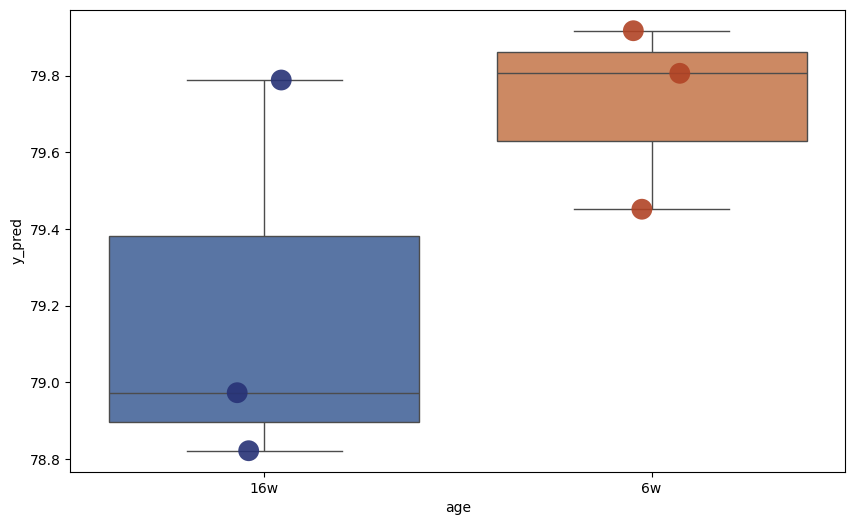

Components: 2
             y_pred
Heart_14  78.822913
Heart_13  79.085995
Heart_11  80.028366
Heart_4   79.929137
Heart_2   79.516261
Heart_1   80.126930
             y_pred  age
Heart_14  78.822913  16w
Heart_13  79.085995  16w
Heart_11  80.028366  16w
Heart_4   79.929137   6w
Heart_2   79.516261   6w
Heart_1   80.126930   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


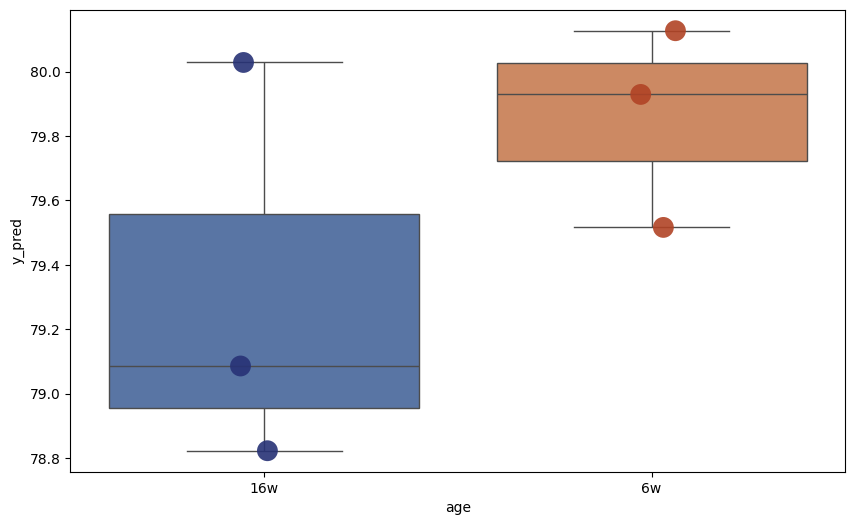

Components: 3
             y_pred
Heart_14  88.343857
Heart_13  89.992496
Heart_11  83.373414
Heart_4   66.254064
Heart_2   67.738039
Heart_1   69.751390
             y_pred  age
Heart_14  88.343857  16w
Heart_13  89.992496  16w
Heart_11  83.373414  16w
Heart_4   66.254064   6w
Heart_2   67.738039   6w
Heart_1   69.751390   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


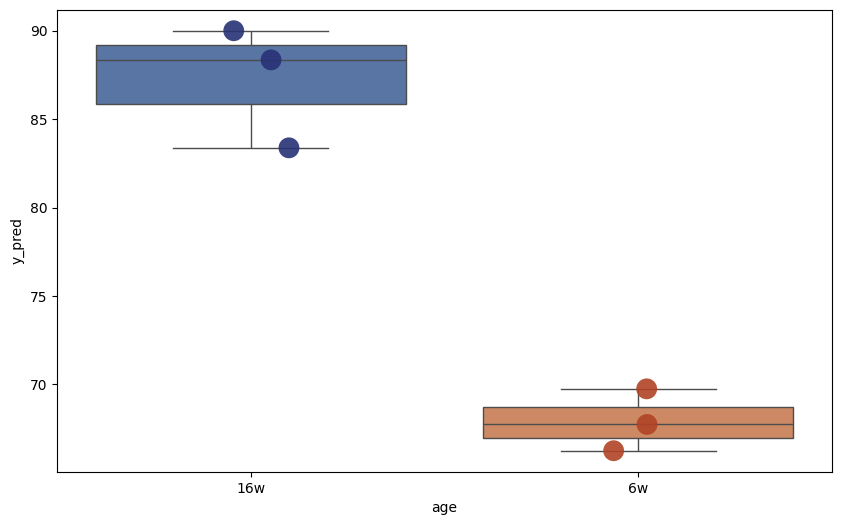

Components: 4
             y_pred
Heart_14  96.123340
Heart_13  98.611991
Heart_11  96.218176
Heart_4   64.973340
Heart_2   64.444200
Heart_1   69.826887
             y_pred  age
Heart_14  96.123340  16w
Heart_13  98.611991  16w
Heart_11  96.218176  16w
Heart_4   64.973340   6w
Heart_2   64.444200   6w
Heart_1   69.826887   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


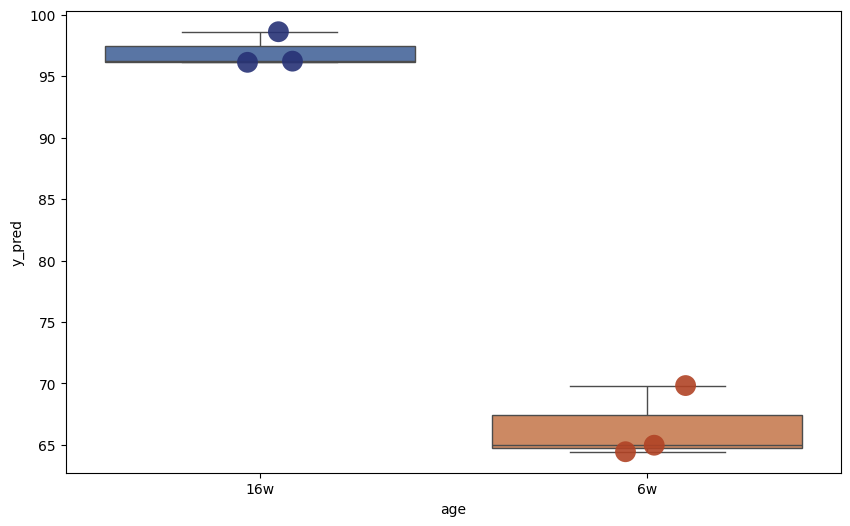

Components: 5
              y_pred
Heart_14   98.550360
Heart_13  100.672075
Heart_11   97.166201
Heart_4    64.917328
Heart_2    63.898837
Heart_1    68.830939
              y_pred  age
Heart_14   98.550360  16w
Heart_13  100.672075  16w
Heart_11   97.166201  16w
Heart_4    64.917328   6w
Heart_2    63.898837   6w
Heart_1    68.830939   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


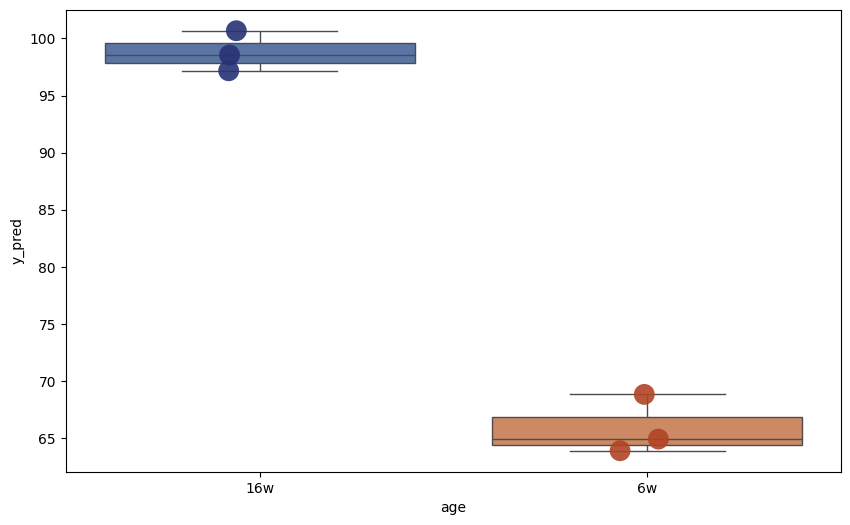

Components: 6
              y_pred
Heart_14  101.668745
Heart_13  104.517994
Heart_11   97.811496
Heart_4    58.512653
Heart_2    58.887226
Heart_1    62.448327
              y_pred  age
Heart_14  101.668745  16w
Heart_13  104.517994  16w
Heart_11   97.811496  16w
Heart_4    58.512653   6w
Heart_2    58.887226   6w
Heart_1    62.448327   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


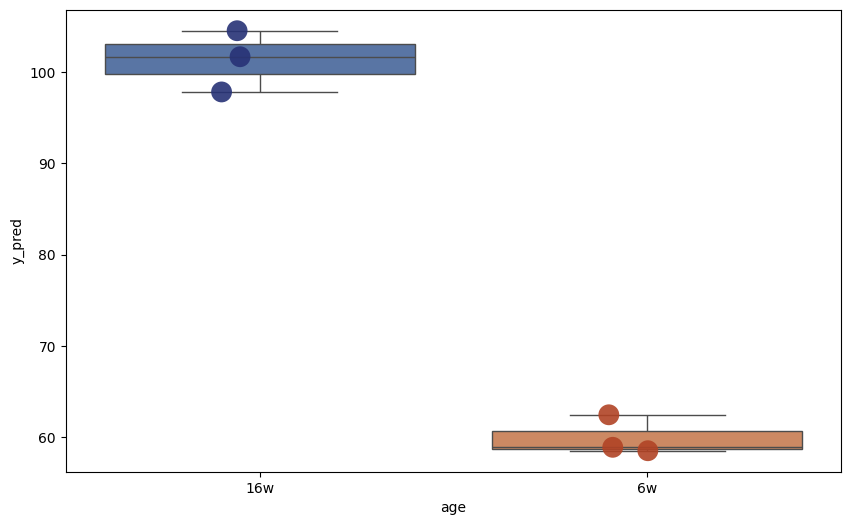

Components: 7
              y_pred
Heart_14  101.583023
Heart_13  102.172105
Heart_11   94.572789
Heart_4    61.280964
Heart_2    63.006862
Heart_1    67.487932
              y_pred  age
Heart_14  101.583023  16w
Heart_13  102.172105  16w
Heart_11   94.572789  16w
Heart_4    61.280964   6w
Heart_2    63.006862   6w
Heart_1    67.487932   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


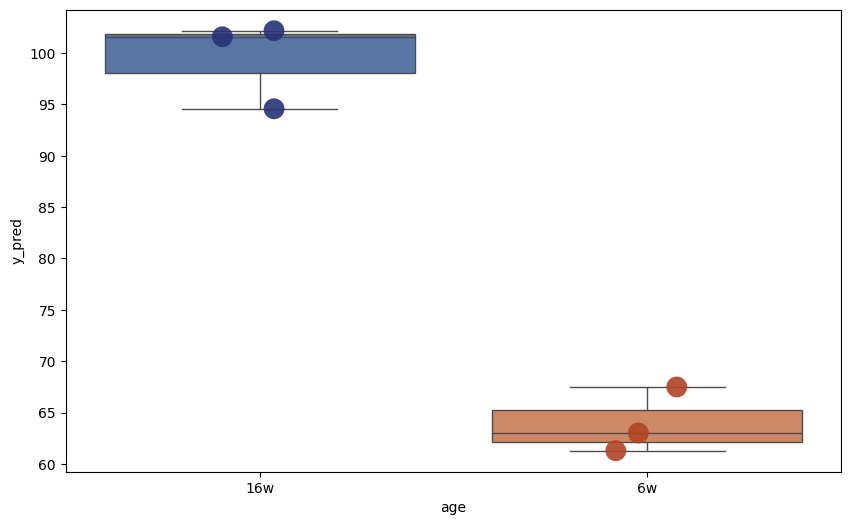

Components: 8
              y_pred
Heart_14  100.708108
Heart_13  102.368874
Heart_11   95.865533
Heart_4    60.343890
Heart_2    62.411288
Heart_1    66.620893
              y_pred  age
Heart_14  100.708108  16w
Heart_13  102.368874  16w
Heart_11   95.865533  16w
Heart_4    60.343890   6w
Heart_2    62.411288   6w
Heart_1    66.620893   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


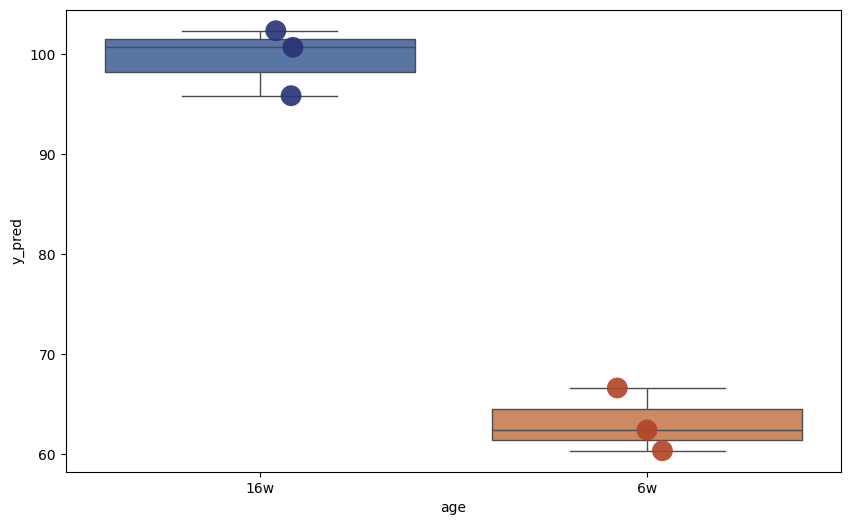

Components: 9
              y_pred
Heart_14  101.192934
Heart_13  103.100787
Heart_11   96.119939
Heart_4    59.887315
Heart_2    62.408909
Heart_1    66.769373
              y_pred  age
Heart_14  101.192934  16w
Heart_13  103.100787  16w
Heart_11   96.119939  16w
Heart_4    59.887315   6w
Heart_2    62.408909   6w
Heart_1    66.769373   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


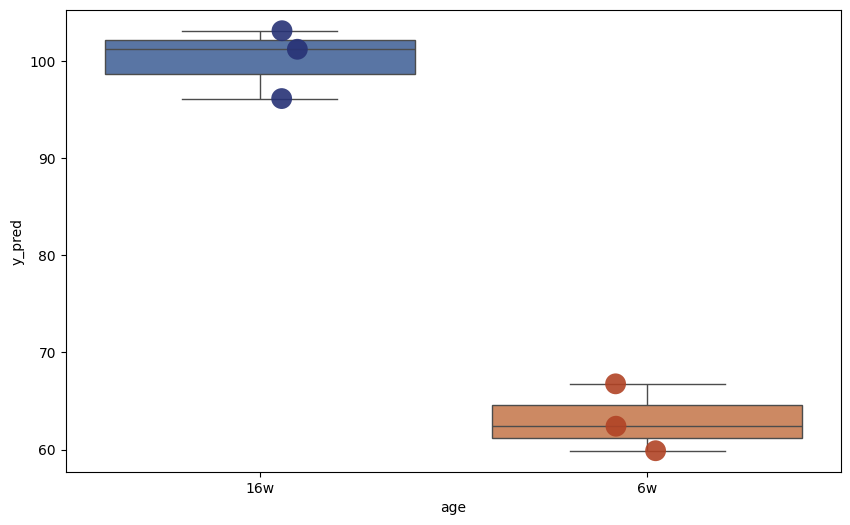

Components: 10
              y_pred
Heart_14  105.954426
Heart_13  106.630609
Heart_11   97.603894
Heart_4    57.034200
Heart_2    60.271933
Heart_1    64.270593
              y_pred  age
Heart_14  105.954426  16w
Heart_13  106.630609  16w
Heart_11   97.603894  16w
Heart_4    57.034200   6w
Heart_2    60.271933   6w
Heart_1    64.270593   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


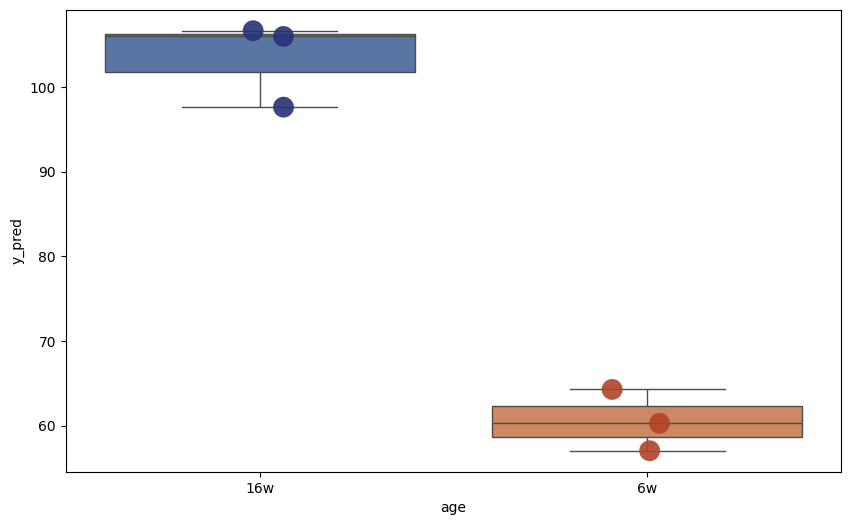

Components: 11
              y_pred
Heart_14  100.965962
Heart_13  104.543731
Heart_11   96.736777
Heart_4    58.505333
Heart_2    60.827763
Heart_1    63.742277
              y_pred  age
Heart_14  100.965962  16w
Heart_13  104.543731  16w
Heart_11   96.736777  16w
Heart_4    58.505333   6w
Heart_2    60.827763   6w
Heart_1    63.742277   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


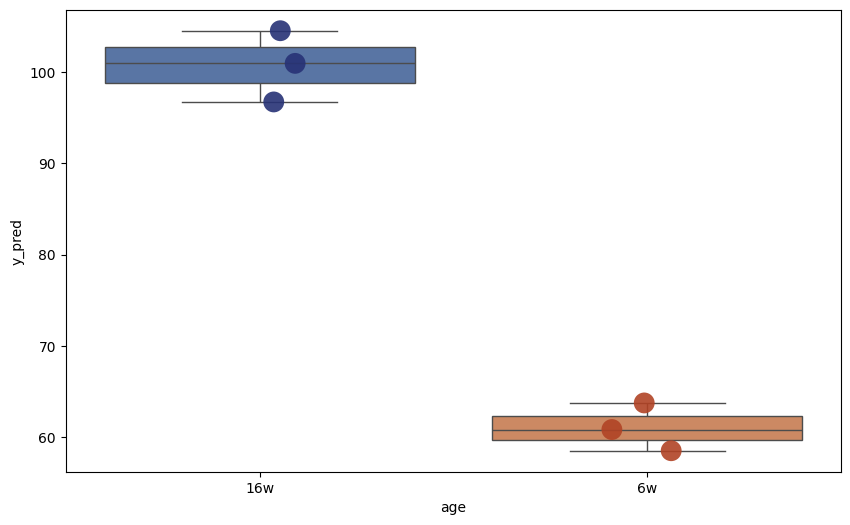

Components: 12
              y_pred
Heart_14  102.618606
Heart_13  105.799169
Heart_11   98.285830
Heart_4    59.044498
Heart_2    61.380230
Heart_1    64.164239
              y_pred  age
Heart_14  102.618606  16w
Heart_13  105.799169  16w
Heart_11   98.285830  16w
Heart_4    59.044498   6w
Heart_2    61.380230   6w
Heart_1    64.164239   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


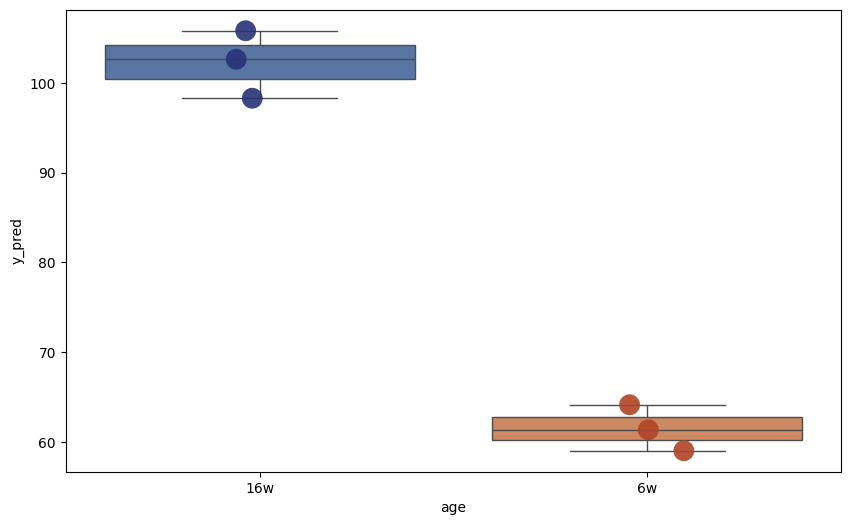

Components: 13
              y_pred
Heart_14  109.076225
Heart_13  108.368571
Heart_11   97.888323
Heart_4    61.061954
Heart_2    60.379197
Heart_1    65.768475
              y_pred  age
Heart_14  109.076225  16w
Heart_13  108.368571  16w
Heart_11   97.888323  16w
Heart_4    61.061954   6w
Heart_2    60.379197   6w
Heart_1    65.768475   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


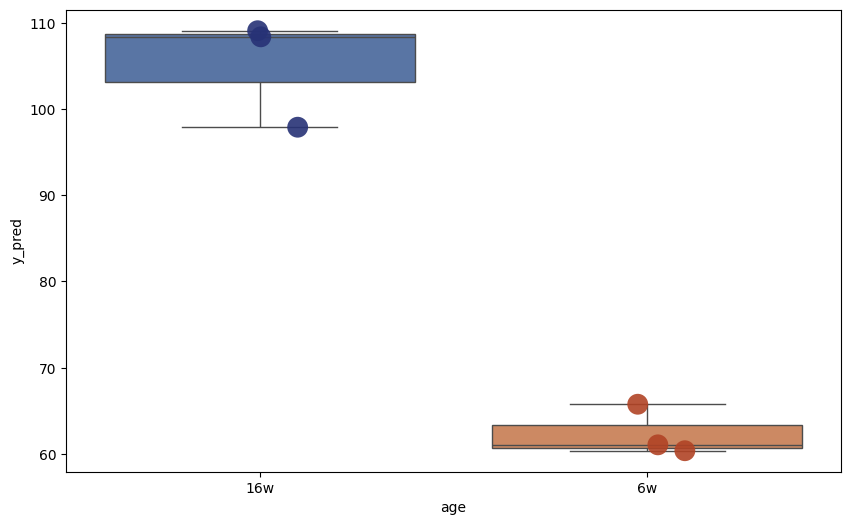

Components: 14
              y_pred
Heart_14  107.012180
Heart_13  107.508260
Heart_11   96.811970
Heart_4    58.551535
Heart_2    58.552368
Heart_1    64.440515
              y_pred  age
Heart_14  107.012180  16w
Heart_13  107.508260  16w
Heart_11   96.811970  16w
Heart_4    58.551535   6w
Heart_2    58.552368   6w
Heart_1    64.440515   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


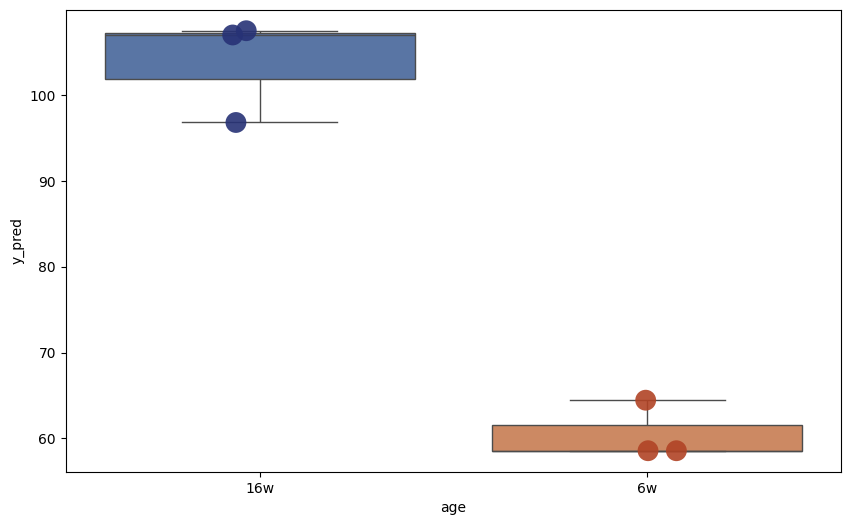

Components: 15
              y_pred
Heart_14  109.209369
Heart_13  108.166097
Heart_11   97.886286
Heart_4    60.207909
Heart_2    59.833308
Heart_1    65.699487
              y_pred  age
Heart_14  109.209369  16w
Heart_13  108.166097  16w
Heart_11   97.886286  16w
Heart_4    60.207909   6w
Heart_2    59.833308   6w
Heart_1    65.699487   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


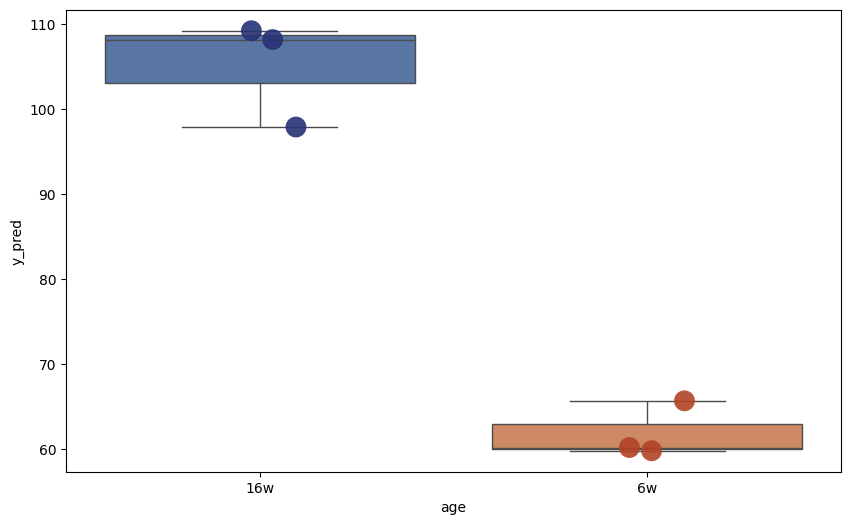

Components: 16
              y_pred
Heart_14  110.202127
Heart_13  108.510443
Heart_11   98.381416
Heart_4    62.830109
Heart_2    61.326209
Heart_1    64.676532
              y_pred  age
Heart_14  110.202127  16w
Heart_13  108.510443  16w
Heart_11   98.381416  16w
Heart_4    62.830109   6w
Heart_2    61.326209   6w
Heart_1    64.676532   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


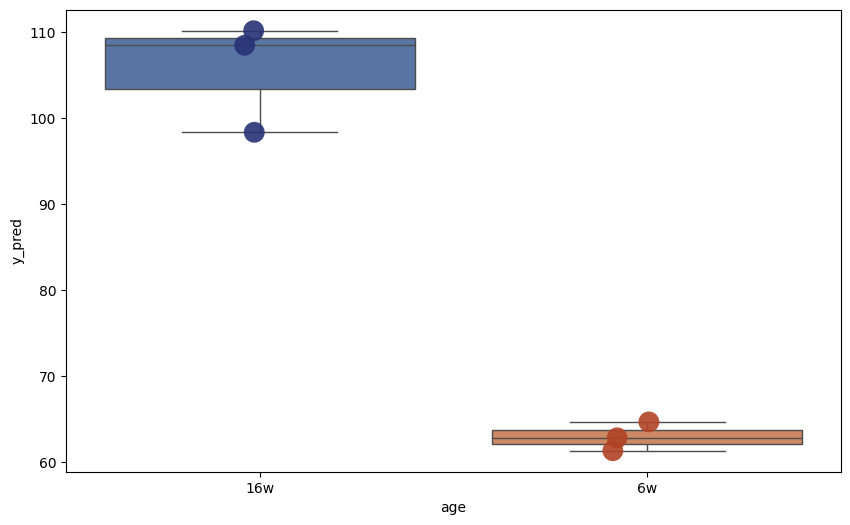

Components: 17
              y_pred
Heart_14  108.865103
Heart_13  107.468652
Heart_11   98.835529
Heart_4    62.493097
Heart_2    61.031614
Heart_1    64.899536
              y_pred  age
Heart_14  108.865103  16w
Heart_13  107.468652  16w
Heart_11   98.835529  16w
Heart_4    62.493097   6w
Heart_2    61.031614   6w
Heart_1    64.899536   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


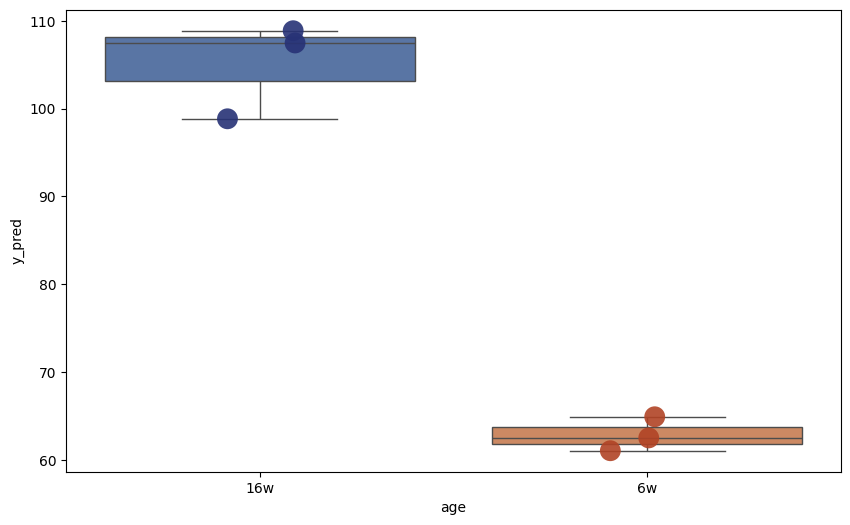

Components: 18
              y_pred
Heart_14  109.216632
Heart_13  107.575976
Heart_11   98.535003
Heart_4    62.197841
Heart_2    60.651497
Heart_1    64.538360
              y_pred  age
Heart_14  109.216632  16w
Heart_13  107.575976  16w
Heart_11   98.535003  16w
Heart_4    62.197841   6w
Heart_2    60.651497   6w
Heart_1    64.538360   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


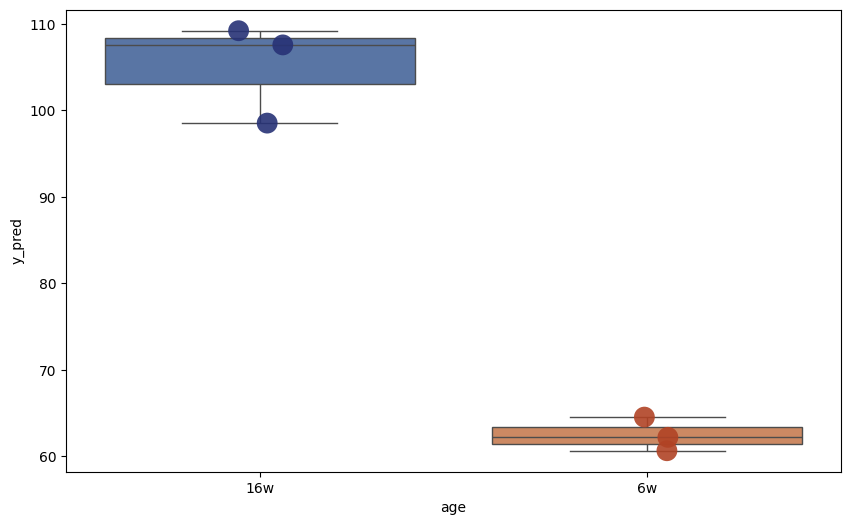

Components: 19
              y_pred
Heart_14  109.252648
Heart_13  107.321414
Heart_11   98.595811
Heart_4    62.213877
Heart_2    60.411300
Heart_1    64.358522
              y_pred  age
Heart_14  109.252648  16w
Heart_13  107.321414  16w
Heart_11   98.595811  16w
Heart_4    62.213877   6w
Heart_2    60.411300   6w
Heart_1    64.358522   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


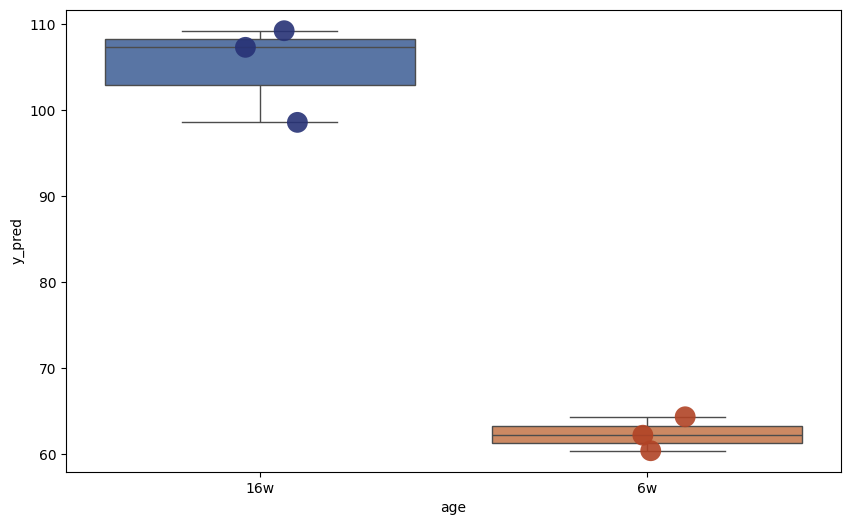

Components: 20
              y_pred
Heart_14  109.533717
Heart_13  106.952935
Heart_11   98.639216
Heart_4    62.379042
Heart_2    61.030129
Heart_1    65.206320
              y_pred  age
Heart_14  109.533717  16w
Heart_13  106.952935  16w
Heart_11   98.639216  16w
Heart_4    62.379042   6w
Heart_2    61.030129   6w
Heart_1    65.206320   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


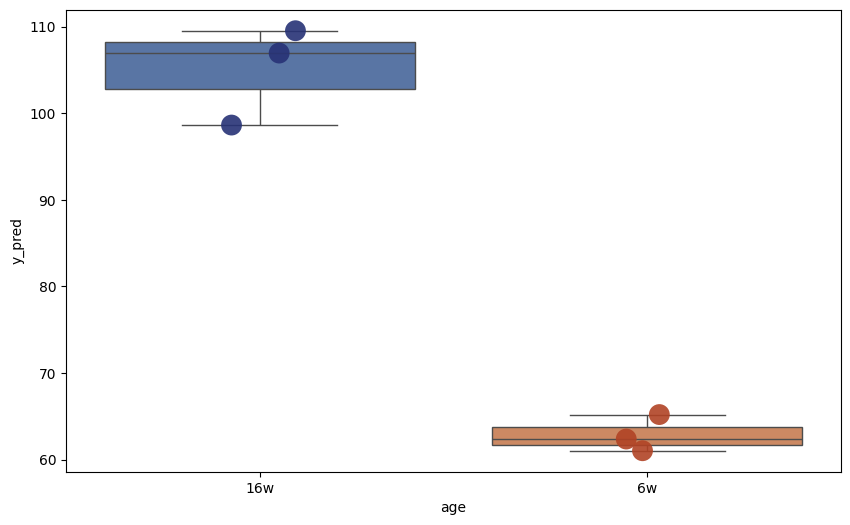

Components: 21
              y_pred
Heart_14  109.338823
Heart_13  106.934815
Heart_11   99.437212
Heart_4    63.310938
Heart_2    61.803236
Heart_1    65.911257
              y_pred  age
Heart_14  109.338823  16w
Heart_13  106.934815  16w
Heart_11   99.437212  16w
Heart_4    63.310938   6w
Heart_2    61.803236   6w
Heart_1    65.911257   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


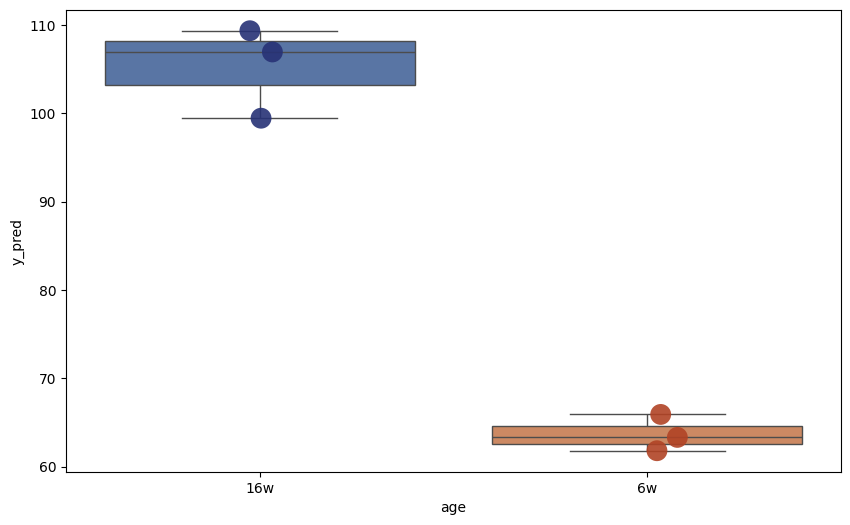

Components: 22
              y_pred
Heart_14  108.835951
Heart_13  106.371356
Heart_11   99.827000
Heart_4    63.691566
Heart_2    62.245992
Heart_1    66.416338
              y_pred  age
Heart_14  108.835951  16w
Heart_13  106.371356  16w
Heart_11   99.827000  16w
Heart_4    63.691566   6w
Heart_2    62.245992   6w
Heart_1    66.416338   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


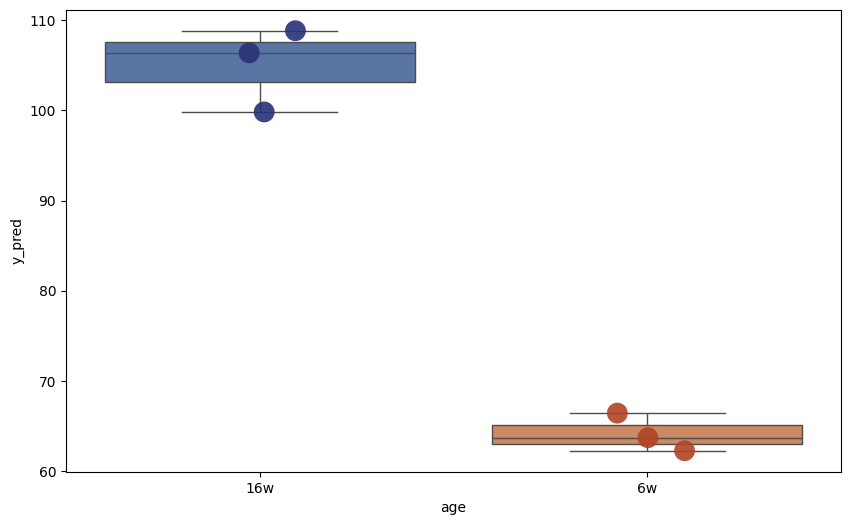

Components: 23
              y_pred
Heart_14  109.373999
Heart_13  106.941015
Heart_11   99.707891
Heart_4    63.703637
Heart_2    62.493421
Heart_1    66.831269
              y_pred  age
Heart_14  109.373999  16w
Heart_13  106.941015  16w
Heart_11   99.707891  16w
Heart_4    63.703637   6w
Heart_2    62.493421   6w
Heart_1    66.831269   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


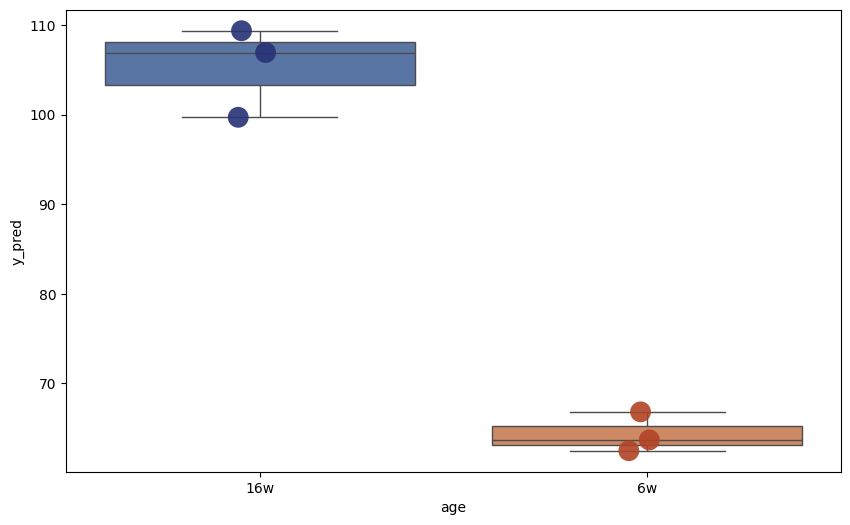

Components: 24
              y_pred
Heart_14  109.444860
Heart_13  107.012989
Heart_11   99.581307
Heart_4    63.541564
Heart_2    62.507377
Heart_1    66.837890
              y_pred  age
Heart_14  109.444860  16w
Heart_13  107.012989  16w
Heart_11   99.581307  16w
Heart_4    63.541564   6w
Heart_2    62.507377   6w
Heart_1    66.837890   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


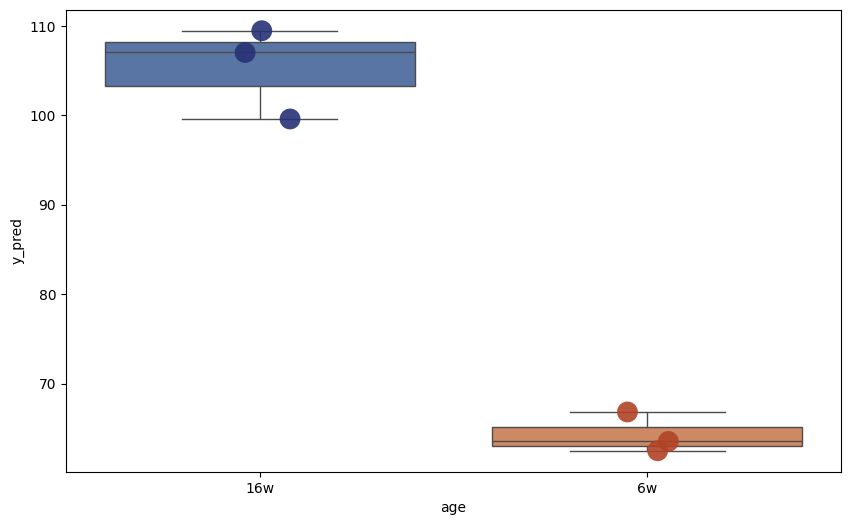

Components: 25
              y_pred
Heart_14  109.396804
Heart_13  106.988845
Heart_11   99.731755
Heart_4    63.683167
Heart_2    62.603724
Heart_1    66.965033
              y_pred  age
Heart_14  109.396804  16w
Heart_13  106.988845  16w
Heart_11   99.731755  16w
Heart_4    63.683167   6w
Heart_2    62.603724   6w
Heart_1    66.965033   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


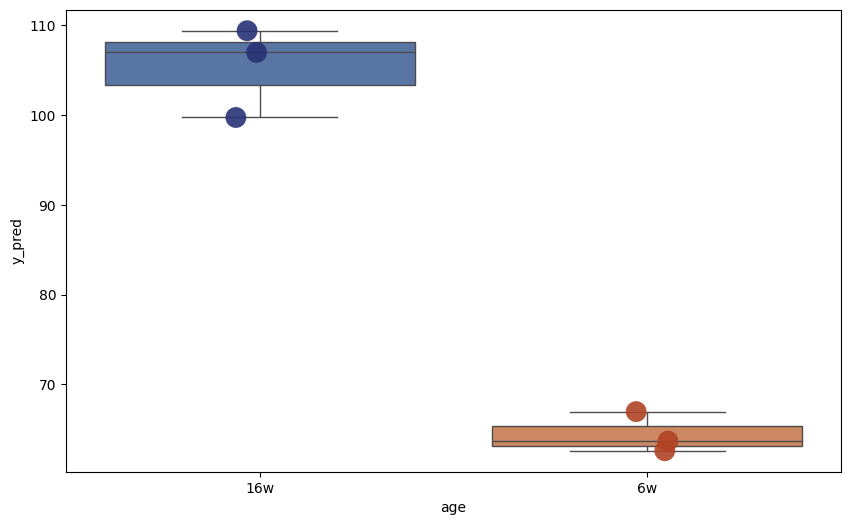

Components: 26
              y_pred
Heart_14  109.367036
Heart_13  107.114939
Heart_11   99.603769
Heart_4    63.783977
Heart_2    62.631959
Heart_1    66.955609
              y_pred  age
Heart_14  109.367036  16w
Heart_13  107.114939  16w
Heart_11   99.603769  16w
Heart_4    63.783977   6w
Heart_2    62.631959   6w
Heart_1    66.955609   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


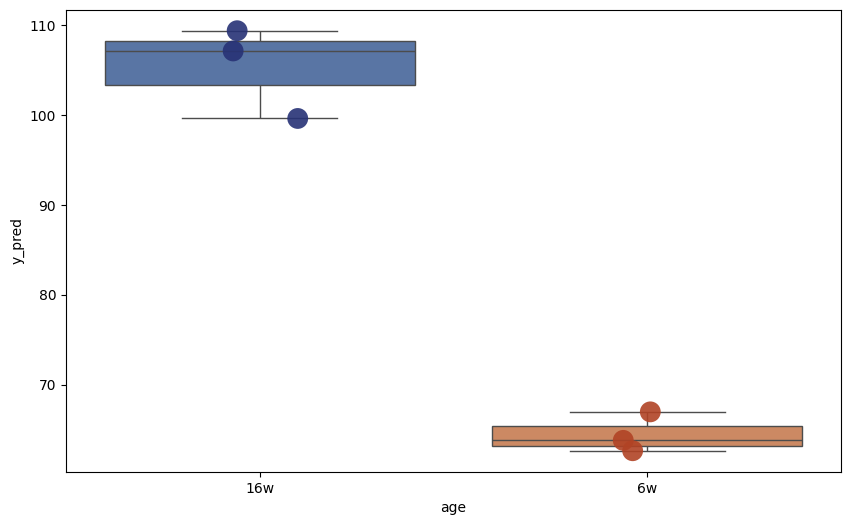

Components: 27
              y_pred
Heart_14  109.464247
Heart_13  107.282082
Heart_11   99.635703
Heart_4    63.743315
Heart_2    62.722730
Heart_1    67.000417
              y_pred  age
Heart_14  109.464247  16w
Heart_13  107.282082  16w
Heart_11   99.635703  16w
Heart_4    63.743315   6w
Heart_2    62.722730   6w
Heart_1    67.000417   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


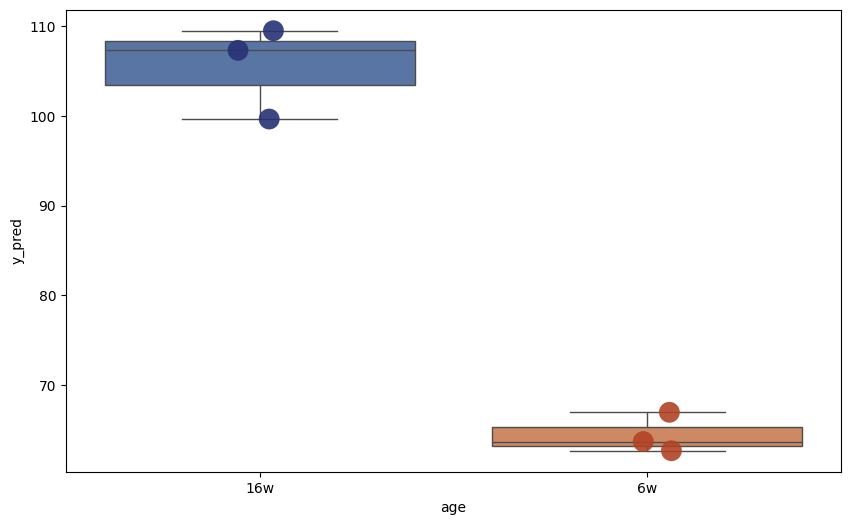

Components: 28
              y_pred
Heart_14  109.258727
Heart_13  107.275627
Heart_11   99.560633
Heart_4    63.738179
Heart_2    62.613694
Heart_1    66.773129
              y_pred  age
Heart_14  109.258727  16w
Heart_13  107.275627  16w
Heart_11   99.560633  16w
Heart_4    63.738179   6w
Heart_2    62.613694   6w
Heart_1    66.773129   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


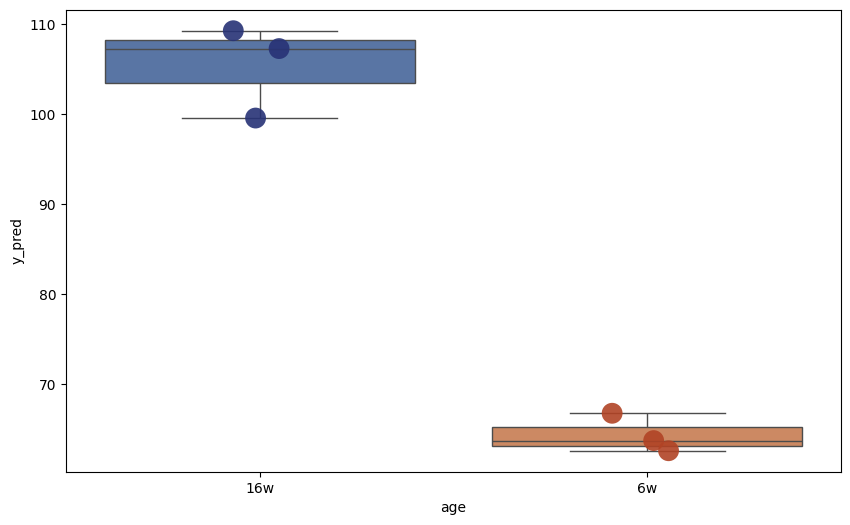

Components: 29
              y_pred
Heart_14  108.994966
Heart_13  107.044281
Heart_11   99.762996
Heart_4    63.976029
Heart_2    62.815900
Heart_1    66.801313
              y_pred  age
Heart_14  108.994966  16w
Heart_13  107.044281  16w
Heart_11   99.762996  16w
Heart_4    63.976029   6w
Heart_2    62.815900   6w
Heart_1    66.801313   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


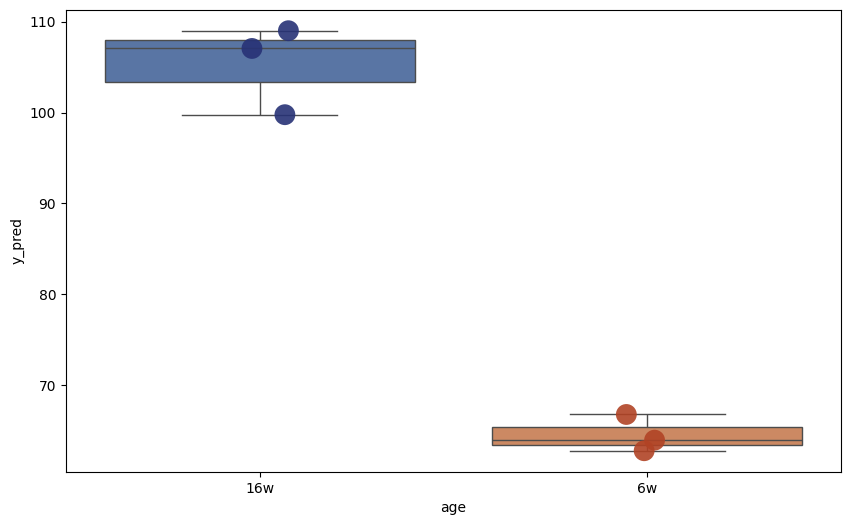

Components: 30
              y_pred
Heart_14  109.623043
Heart_13  107.475150
Heart_11   99.911578
Heart_4    64.161579
Heart_2    62.953736
Heart_1    67.162559
              y_pred  age
Heart_14  109.623043  16w
Heart_13  107.475150  16w
Heart_11   99.911578  16w
Heart_4    64.161579   6w
Heart_2    62.953736   6w
Heart_1    67.162559   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


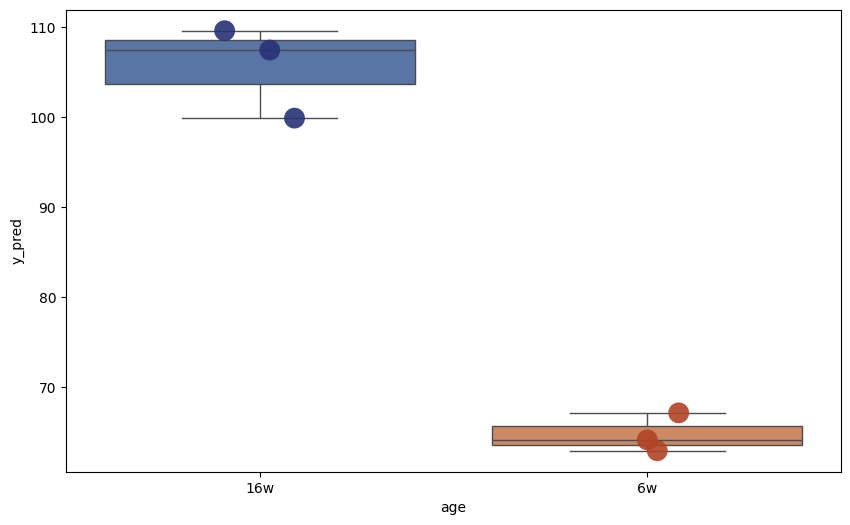

Components: 31
              y_pred
Heart_14  109.629648
Heart_13  107.493111
Heart_11   99.926648
Heart_4    64.169058
Heart_2    62.957956
Heart_1    67.194324
              y_pred  age
Heart_14  109.629648  16w
Heart_13  107.493111  16w
Heart_11   99.926648  16w
Heart_4    64.169058   6w
Heart_2    62.957956   6w
Heart_1    67.194324   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


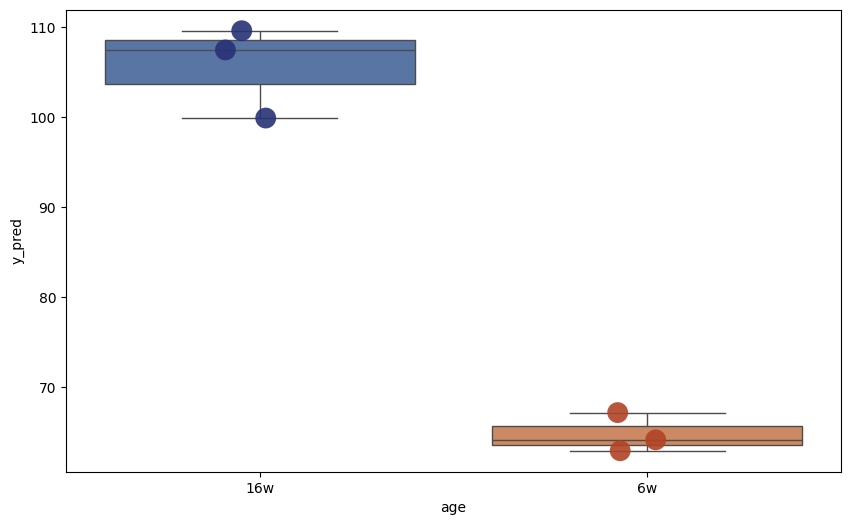

Components: 32
              y_pred
Heart_14  109.227171
Heart_13  107.136511
Heart_11   99.888483
Heart_4    64.024387
Heart_2    62.298097
Heart_1    66.276128
              y_pred  age
Heart_14  109.227171  16w
Heart_13  107.136511  16w
Heart_11   99.888483  16w
Heart_4    64.024387   6w
Heart_2    62.298097   6w
Heart_1    66.276128   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


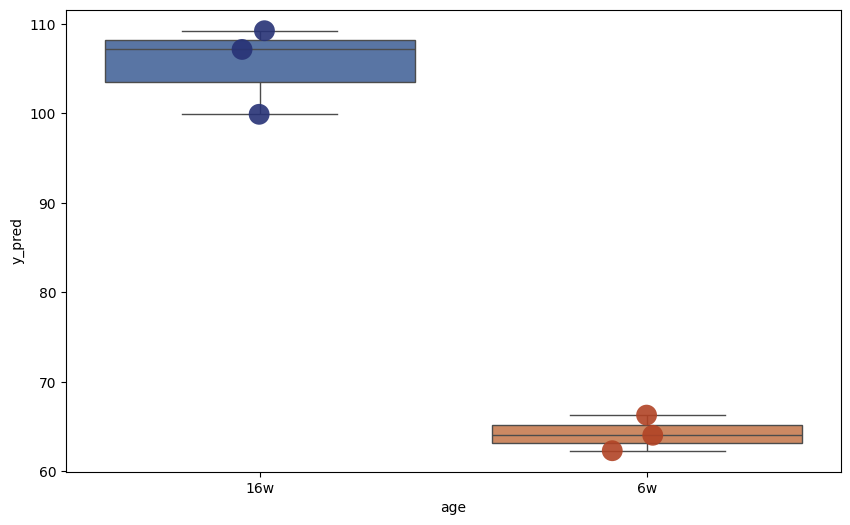

Components: 33
              y_pred
Heart_14  109.251792
Heart_13  107.170414
Heart_11   99.869138
Heart_4    64.021658
Heart_2    62.277942
Heart_1    66.284094
              y_pred  age
Heart_14  109.251792  16w
Heart_13  107.170414  16w
Heart_11   99.869138  16w
Heart_4    64.021658   6w
Heart_2    62.277942   6w
Heart_1    66.284094   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


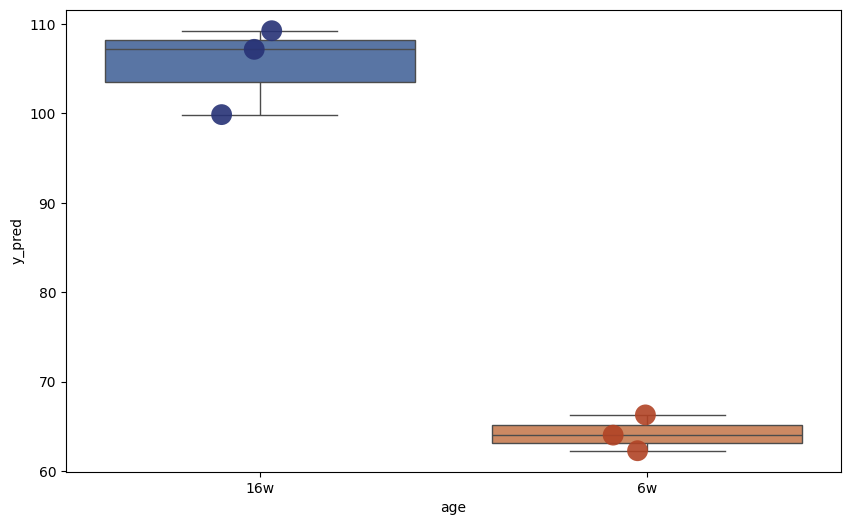

Components: 34
              y_pred
Heart_14  108.848543
Heart_13  106.971677
Heart_11   99.859033
Heart_4    63.787508
Heart_2    62.091528
Heart_1    65.917383
              y_pred  age
Heart_14  108.848543  16w
Heart_13  106.971677  16w
Heart_11   99.859033  16w
Heart_4    63.787508   6w
Heart_2    62.091528   6w
Heart_1    65.917383   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


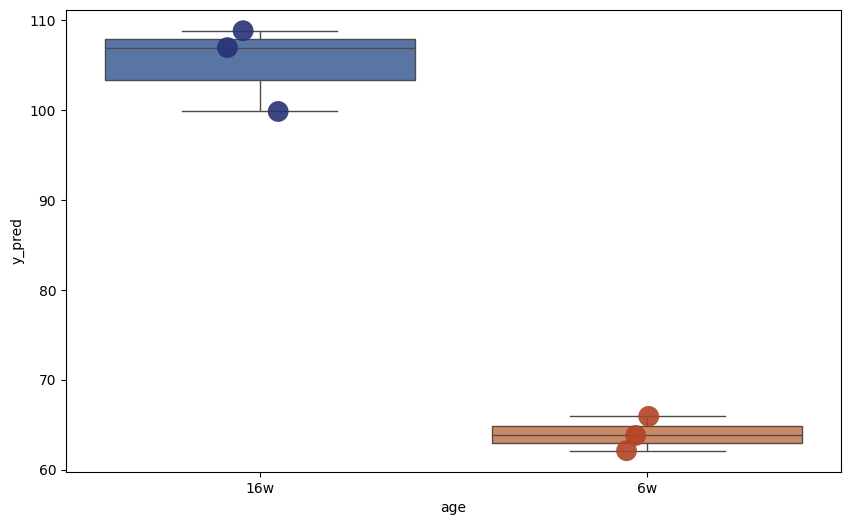

Components: 35
              y_pred
Heart_14  108.772717
Heart_13  106.729883
Heart_11   99.825245
Heart_4    63.813238
Heart_2    62.101958
Heart_1    65.919376
              y_pred  age
Heart_14  108.772717  16w
Heart_13  106.729883  16w
Heart_11   99.825245  16w
Heart_4    63.813238   6w
Heart_2    62.101958   6w
Heart_1    65.919376   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


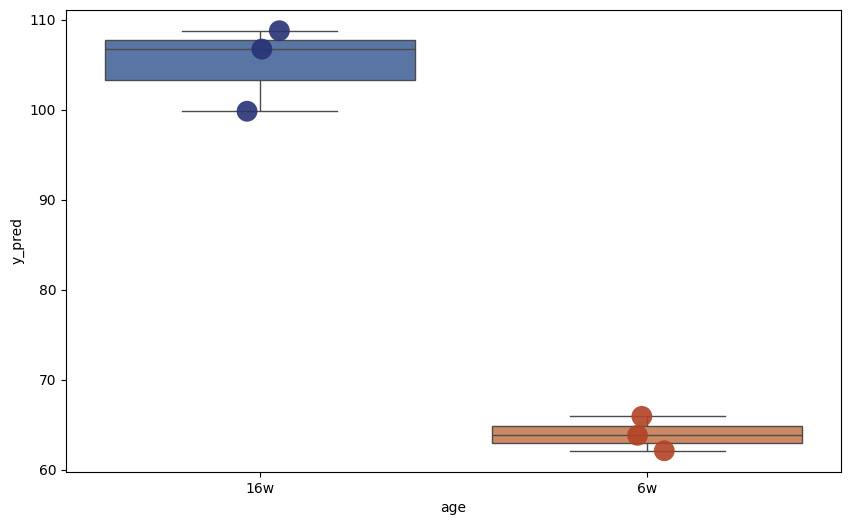

Components: 36
              y_pred
Heart_14  108.769185
Heart_13  106.732616
Heart_11   99.822185
Heart_4    63.810786
Heart_2    62.102803
Heart_1    65.914799
              y_pred  age
Heart_14  108.769185  16w
Heart_13  106.732616  16w
Heart_11   99.822185  16w
Heart_4    63.810786   6w
Heart_2    62.102803   6w
Heart_1    65.914799   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/2757921584.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


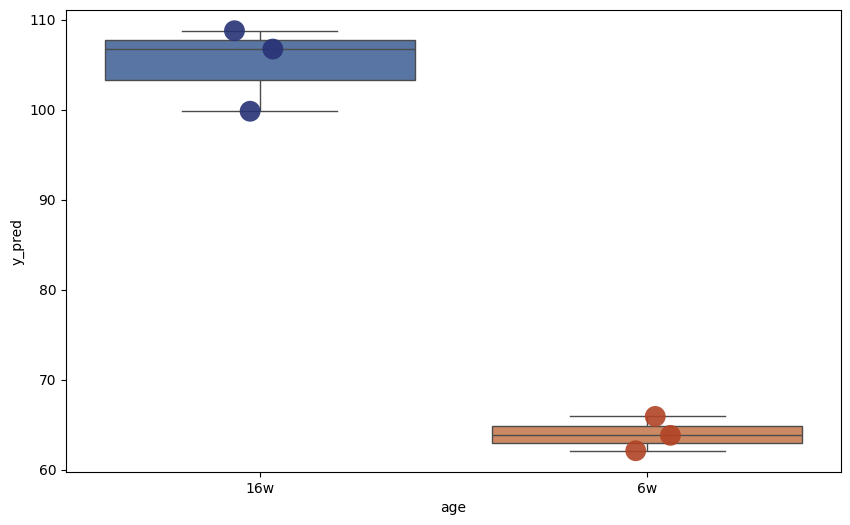

In [54]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_male.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_male["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



In [201]:
n_components = 11

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_male = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_male.index.tolist())

results_df_male["age"] = df_intervention_test_metadata_male["age"]

print(results_df_male)
results_df_male.to_csv("./AlanXu_heart_maleOnly_Calibratedpredictions_11PCs_EC-250725.csv")

              y_pred  age
Heart_14  100.951701  16w
Heart_13  104.530314  16w
Heart_11   96.721440  16w
Heart_4    58.521105   6w
Heart_2    60.847194   6w
Heart_1    63.764598   6w


In [ ]:
##### Sample rotation

In [71]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_male.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_male.index and df_intervention_age_male.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [72]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_male.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_male = pd.concat([tissue_df_male_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_male['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_male.drop(
            atlas_plus_intervention_male.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_male.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_male.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_male.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/100] Running PCR for combo: Heart_5_Heart_4__Heart_15_Heart_14
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/100] Running PCR for combo: Heart_5_Heart_4__Heart_15_Heart_13
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/100] Running PCR for combo: Heart_5_Heart_4__Heart_15_Heart_12
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/100] Running PCR for combo: Heart_5_Heart_4__Heart_15_Heart_11
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 1

### Female

##### Calibration

In [202]:
female_samples = df_intervention_age[df_intervention_age['sex'] == 'female'].index

df_intervention_age_female = df_intervention_age.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_age_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(female_samples)
]

df_intervention_age_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.000000,4.620689,180.206875,548.706831,...,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,Heart,16w,female,112
Heart_19,182.330309,406.387952,138.788743,143.324323,0.0,65.312349,1.814232,0.000000,270.320558,426.344504,...,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,Heart,16w,female,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.000000,3.518197,164.475709,498.704421,...,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,Heart,16w,female,112


In [203]:
# Get indices where sex is 'F' in df_intervention_age
female_samples = df_intervention_metadata[df_intervention_metadata['sex'] == 'female'].index

df_intervention_metadata_female = df_intervention_metadata.copy()

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_metadata_female = df_intervention_metadata.loc[
    df_intervention_metadata.index.isin(female_samples)
]

df_intervention_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_20,SRR24062706,16w,RNA-Seq,300,4686084900,Dario Valenzano laboratory,PRJNA952180,SAMN34067672,Model organism or animal,1702634097,...,2023-04-04T11:29:00Z,1,GRZ-AD_8241_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062706.featureCounts,SRR24062706,No
Heart_19,SRR24062707,16w,RNA-Seq,300,5791702200,Dario Valenzano laboratory,PRJNA952180,SAMN34067671,Model organism or animal,2101107088,...,2023-04-04T11:33:00Z,1,GRZ-AD_8232_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062707.featureCounts,SRR24062707,No
Heart_18,SRR24062708,16w,RNA-Seq,300,6389682000,Dario Valenzano laboratory,PRJNA952180,SAMN34067670,Model organism or animal,2325189392,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062708.featureCounts,SRR24062708,No


In [204]:
random.seed(123)

# Separate the samples
young_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in female_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# Randomly sample 2 from each
random_young = random.sample(young_samples, 2)
random_old = random.sample(old_samples, 2)

# Combine the result
random_subset = random_young + random_old

#select your training samples
select_train_samples = random_subset

# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_train = df_intervention_age.loc[
    df_intervention_age.index.isin(select_train_samples)
]

df_intervention_train

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.00000,91.258610,0.0,4.620689,180.206875,548.706831,...,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,Heart,16w,female,112
Heart_17,167.432999,351.714601,90.561245,124.258452,0.00000,94.773395,0.0,0.000000,358.032827,498.086845,...,6.318226,6.318226,35.803283,1825.967420,174.804263,92.667320,Heart,16w,female,112
Heart_10,180.069409,361.837587,47.565504,107.022385,0.00000,95.131009,0.0,0.000000,319.368386,501.985948,...,0.000000,3.397536,45.866736,2193.109503,315.970850,84.938401,Heart,6w,female,42
Heart_8,178.958188,464.032287,50.360093,82.734439,3.59715,133.094532,0.0,0.000000,399.283596,386.693573,...,0.000000,5.395724,32.374346,2382.212266,260.793340,75.540140,Heart,6w,female,42


In [205]:
df_intervention_train_female = df_intervention_train.drop(df_intervention_train.columns[[-2,-3, -4]], axis=1)
df_intervention_train_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_20,151.327568,316.517203,128.224123,145.551707,0.0,91.258610,0.0,4.620689,180.206875,548.706831,...,1157.482619,0.0,2.310345,4.620689,4.620689,46.206891,2271.068693,227.568938,69.310336,112
Heart_17,167.432999,351.714601,90.561245,124.258452,0.0,94.773395,0.0,0.000000,358.032827,498.086845,...,1025.658747,0.0,0.000000,6.318226,6.318226,35.803283,1825.967420,174.804263,92.667320,112


In [206]:
tissue_df_female_age["age"] = tissue_df_norm_female["age_days"].tolist()

#combine the dataframes
atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_female], axis=0)

atlas_plus_intervention_female.head(3)

,a1cf,aaas,aacs,aadat,aaed1,aagab,aak1,aamdc,aamp,aar2,...,zswim7,zswim8,zufsp,zw10,zwilch,zyg11b,zyx,zzef1,zzz3,age
B15_2,1.775166,827.819273,272.783906,544.976091,801.783499,675.154961,985.217363,905.926596,734.327175,689.356293,...,89.350043,1805.344248,155.622923,1545.578229,110.652040,766.871893,4251.523574,361.542227,383.435947,75
B16_2,0.755241,513.563623,179.747268,517.339826,587.577203,718.233831,1095.098901,1731.766745,589.842925,611.744903,...,129.146146,1262.762319,124.614703,1042.232058,9.818128,783.939765,6263.965714,229.593149,460.696779,103
C15_2,0.701235,823.951607,310.647287,445.985721,725.077414,732.089768,1006.974049,774.163893,520.316674,619.190867,...,63.111187,2020.960451,178.113794,1884.920782,164.790321,746.114476,5004.717120,399.002948,388.484417,75


In [207]:
#all not in select_train_samples
test_samples = [s for s in female_samples if s not in select_train_samples]
test_samples

['Heart_19', 'Heart_18', 'Heart_16', 'Heart_9', 'Heart_7', 'Heart_6']

In [208]:
# Select rows in df_intervention_age_counts_female where index is in female_samples
df_intervention_test_female = df_intervention_age_female.loc[
    df_intervention_age_female.index.isin(test_samples)
]

df_intervention_test_female.head(3)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,tissue,og_age,sex,age
Heart_19,182.330309,406.387952,138.788743,143.324323,0.000000,65.312349,1.814232,0.000000,270.320558,426.344504,...,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,Heart,16w,female,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.000000,84.436727,0.000000,3.518197,164.475709,498.704421,...,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,Heart,16w,female,112
Heart_16,191.037771,456.151413,62.379680,109.164441,2.599153,64.978834,0.000000,0.000000,218.328882,488.640830,...,2.599153,7.797460,49.383914,2432.807538,210.531422,116.961901,Heart,16w,female,112


In [209]:
df_intervention_test_female = df_intervention_test_female.drop(df_intervention_test_female.columns[[-2,-3, -4]], axis=1)
df_intervention_test_female.head(2)

Sample.Name,nadsyn1,dnaja3,f2r,LOC107382877,fezf1,srbd1,LOC107373267,LOC107384240,serp1,scarb2,...,plekhg1,LOC107373049,LOC107375201,LOC107384697,umodl1,cryz,LOC107397181,pelo,mrpl35,age
Heart_19,182.330309,406.387952,138.788743,143.324323,0.0,65.312349,1.814232,0.000000,270.320558,426.344504,...,1129.359377,0.0,3.628464,11.792508,5.442696,34.470407,1949.392209,137.881627,90.711597,112
Heart_18,164.475709,365.892485,169.753004,168.873455,0.0,84.436727,0.000000,3.518197,164.475709,498.704421,...,1081.845569,0.0,0.000000,0.000000,14.072788,36.941068,2146.979703,219.007762,74.761686,112


In [210]:
#check cols ordered the same
df_intervention_test_female = df_intervention_test_female[atlas_plus_intervention_female.columns]

In [211]:
#subset your metadata
df_intervention_test_metadata_female = df_intervention_metadata_female.loc[
    df_intervention_metadata_female.index.isin(test_samples)
]

df_intervention_test_metadata_female.head(3)

,Run,age,Assay.Type,AvgSpotLen,Bases,BIOMATERIAL_PROVIDER,BioProject,BioSample,BioSampleModel,Bytes,...,create_date,version,Sample_info,sex,SRA.Study,strain,tissue,file,lib,UsedForTraining
Sample.Name,,,,,,,,,,,,,,,,,,,,,
Heart_19,SRR24062707,16w,RNA-Seq,300,5791702200,Dario Valenzano laboratory,PRJNA952180,SAMN34067671,Model organism or animal,2101107088,...,2023-04-04T11:33:00Z,1,GRZ-AD_8232_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062707.featureCounts,SRR24062707,No
Heart_18,SRR24062708,16w,RNA-Seq,300,6389682000,Dario Valenzano laboratory,PRJNA952180,SAMN34067670,Model organism or animal,2325189392,...,2023-04-04T11:28:00Z,1,GRZ-AD_8273_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062708.featureCounts,SRR24062708,No
Heart_16,SRR24062710,16w,RNA-Seq,300,3748359600,Dario Valenzano laboratory,PRJNA952180,SAMN34067668,Model organism or animal,1365565651,...,2023-04-04T11:26:00Z,1,GRZ-AD_8225_16w_Female_Heart,female,SRP430823,GRZ-AD,Heart,SRR24062710.featureCounts,SRR24062710,No


In [212]:
age = atlas_plus_intervention_female['age']
X = atlas_plus_intervention_female.iloc[:, :-1]

# Separate training and test data
X_train = X
age_train = age
X_test = df_intervention_test_female.iloc[:, :-1]

# Scale the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.shape)
print(X_test_scaled.shape)


# Initialize lists to store results
train_results = []

(26, 25122)
(6, 25122)


Components: 1
             y_pred
Heart_19  80.276529
Heart_18  80.204735
Heart_16  80.327559
Heart_9   80.210869
Heart_7   80.360723
Heart_6   80.458871
             y_pred  age
Heart_19  80.276529  16w
Heart_18  80.204735  16w
Heart_16  80.327559  16w
Heart_9   80.210869   6w
Heart_7   80.360723   6w
Heart_6   80.458871   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


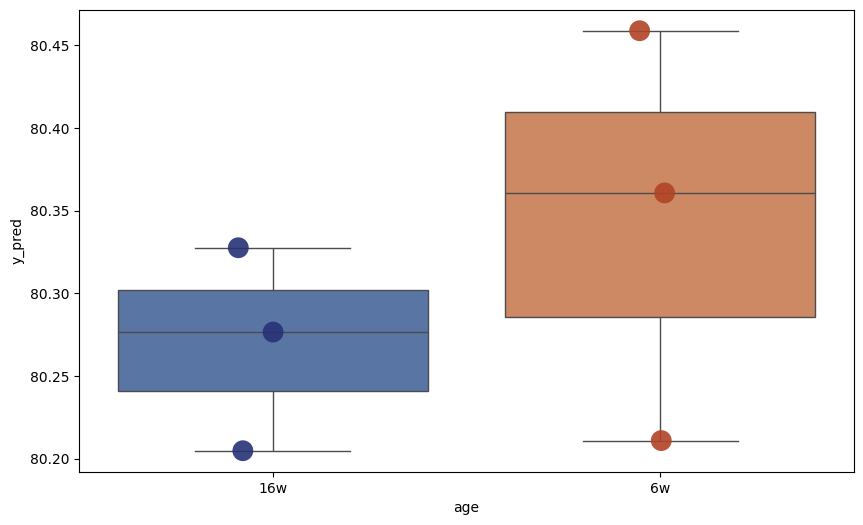

Components: 2
             y_pred
Heart_19  88.956036
Heart_18  81.508467
Heart_16  80.015782
Heart_9   77.335004
Heart_7   80.612126
Heart_6   76.853423
             y_pred  age
Heart_19  88.956036  16w
Heart_18  81.508467  16w
Heart_16  80.015782  16w
Heart_9   77.335004   6w
Heart_7   80.612126   6w
Heart_6   76.853423   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


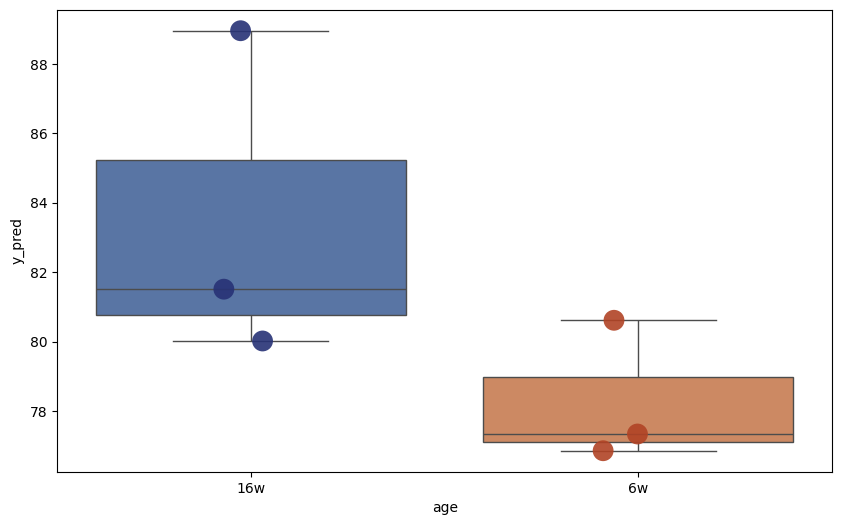

Components: 3
             y_pred
Heart_19  91.226540
Heart_18  83.409897
Heart_16  81.933882
Heart_9   77.169648
Heart_7   83.917831
Heart_6   79.094567
             y_pred  age
Heart_19  91.226540  16w
Heart_18  83.409897  16w
Heart_16  81.933882  16w
Heart_9   77.169648   6w
Heart_7   83.917831   6w
Heart_6   79.094567   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


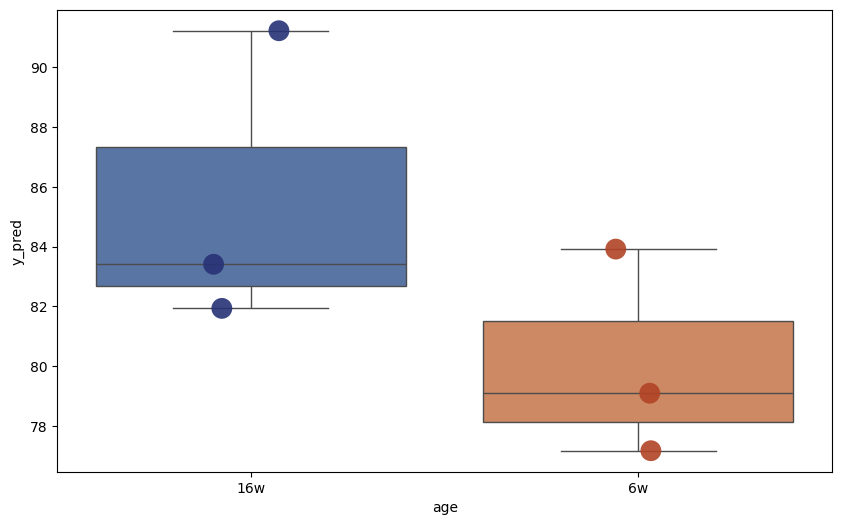

Components: 4
             y_pred
Heart_19  94.168728
Heart_18  83.186543
Heart_16  85.432480
Heart_9   74.498749
Heart_7   80.743299
Heart_6   72.469753
             y_pred  age
Heart_19  94.168728  16w
Heart_18  83.186543  16w
Heart_16  85.432480  16w
Heart_9   74.498749   6w
Heart_7   80.743299   6w
Heart_6   72.469753   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


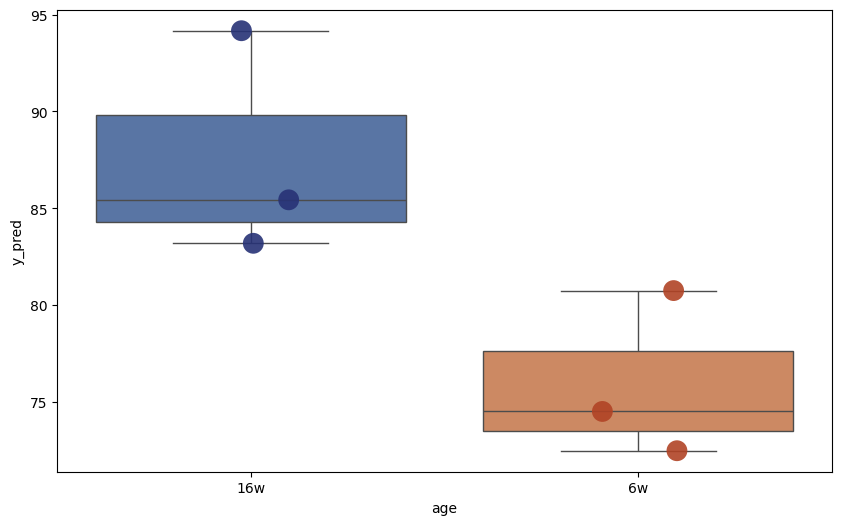

Components: 5
             y_pred
Heart_19  95.109729
Heart_18  83.342421
Heart_16  85.992452
Heart_9   73.504716
Heart_7   78.864307
Heart_6   69.767349
             y_pred  age
Heart_19  95.109729  16w
Heart_18  83.342421  16w
Heart_16  85.992452  16w
Heart_9   73.504716   6w
Heart_7   78.864307   6w
Heart_6   69.767349   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


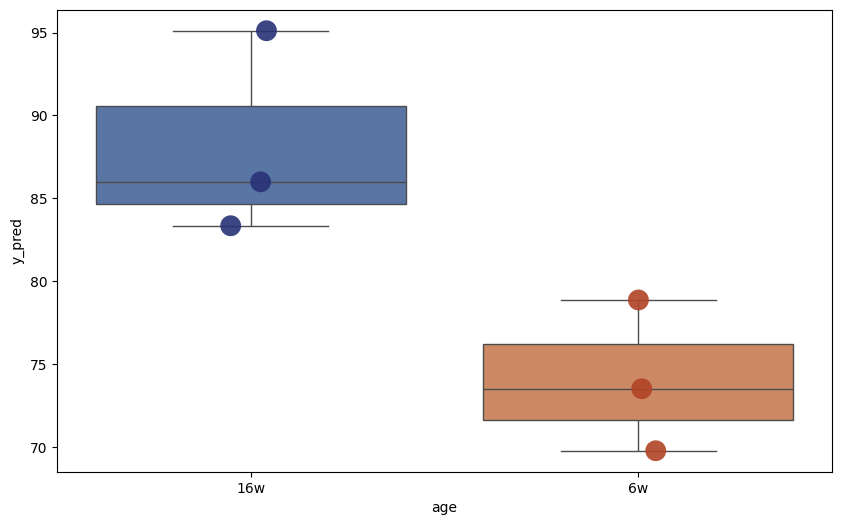

Components: 6
             y_pred
Heart_19  95.147378
Heart_18  89.688311
Heart_16  89.923075
Heart_9   73.411751
Heart_7   79.627605
Heart_6   73.111123
             y_pred  age
Heart_19  95.147378  16w
Heart_18  89.688311  16w
Heart_16  89.923075  16w
Heart_9   73.411751   6w
Heart_7   79.627605   6w
Heart_6   73.111123   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


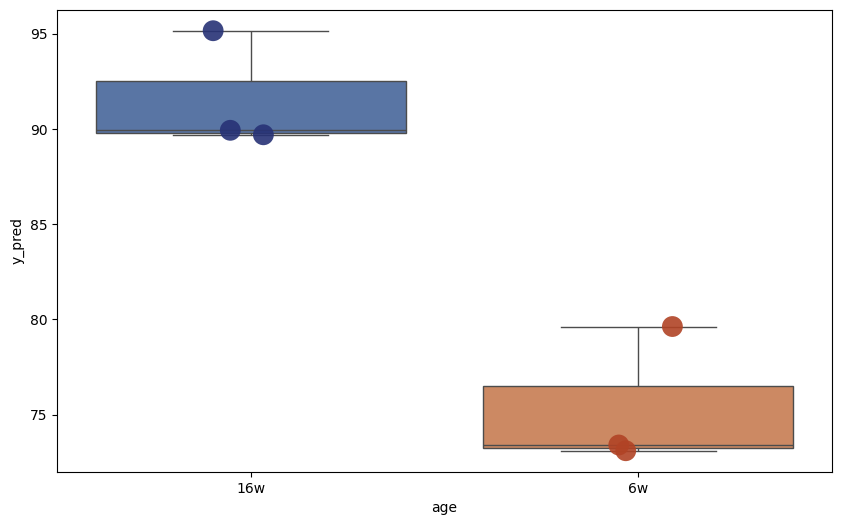

Components: 7
             y_pred
Heart_19  94.500650
Heart_18  88.932824
Heart_16  89.451863
Heart_9   73.919509
Heart_7   79.741420
Heart_6   73.242247
             y_pred  age
Heart_19  94.500650  16w
Heart_18  88.932824  16w
Heart_16  89.451863  16w
Heart_9   73.919509   6w
Heart_7   79.741420   6w
Heart_6   73.242247   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


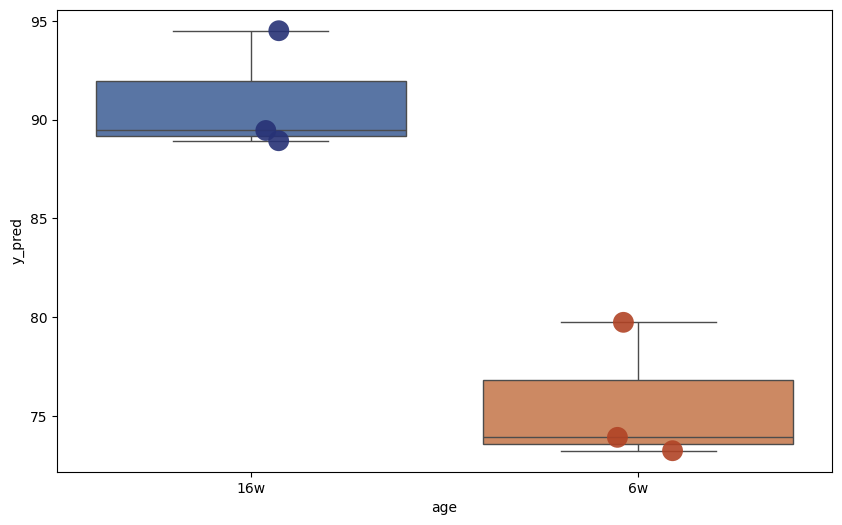

Components: 8
             y_pred
Heart_19  93.310051
Heart_18  89.728959
Heart_16  89.862666
Heart_9   74.066223
Heart_7   78.654252
Heart_6   71.739943
             y_pred  age
Heart_19  93.310051  16w
Heart_18  89.728959  16w
Heart_16  89.862666  16w
Heart_9   74.066223   6w
Heart_7   78.654252   6w
Heart_6   71.739943   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


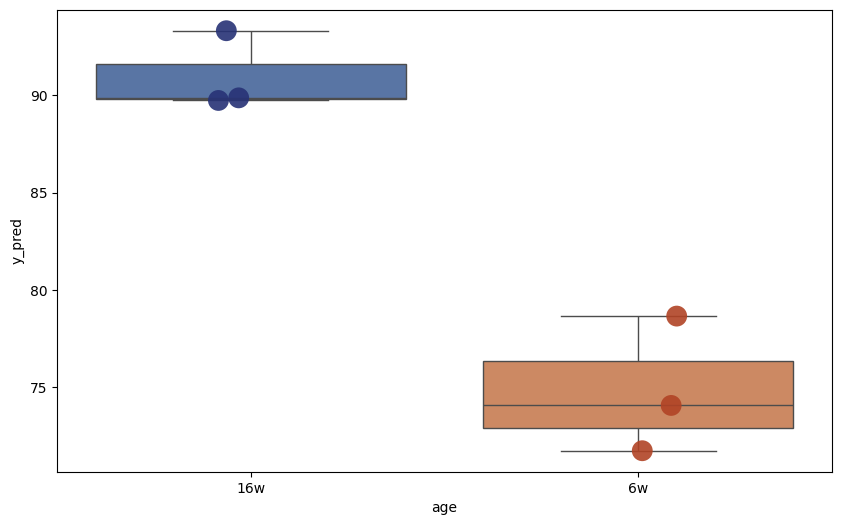

Components: 9
             y_pred
Heart_19  94.011322
Heart_18  89.599027
Heart_16  89.574492
Heart_9   73.434460
Heart_7   78.126670
Heart_6   70.809961
             y_pred  age
Heart_19  94.011322  16w
Heart_18  89.599027  16w
Heart_16  89.574492  16w
Heart_9   73.434460   6w
Heart_7   78.126670   6w
Heart_6   70.809961   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


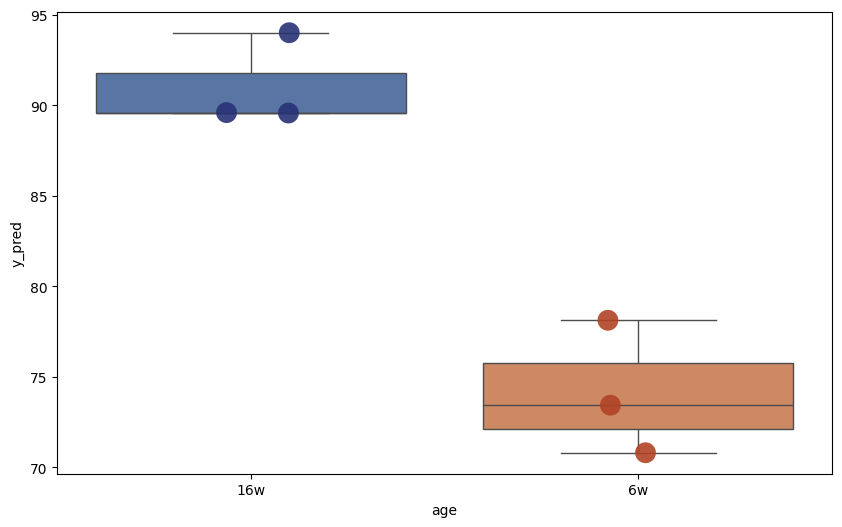

Components: 10
             y_pred
Heart_19  94.156053
Heart_18  89.876255
Heart_16  90.090086
Heart_9   74.391707
Heart_7   78.547267
Heart_6   71.309858
             y_pred  age
Heart_19  94.156053  16w
Heart_18  89.876255  16w
Heart_16  90.090086  16w
Heart_9   74.391707   6w
Heart_7   78.547267   6w
Heart_6   71.309858   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


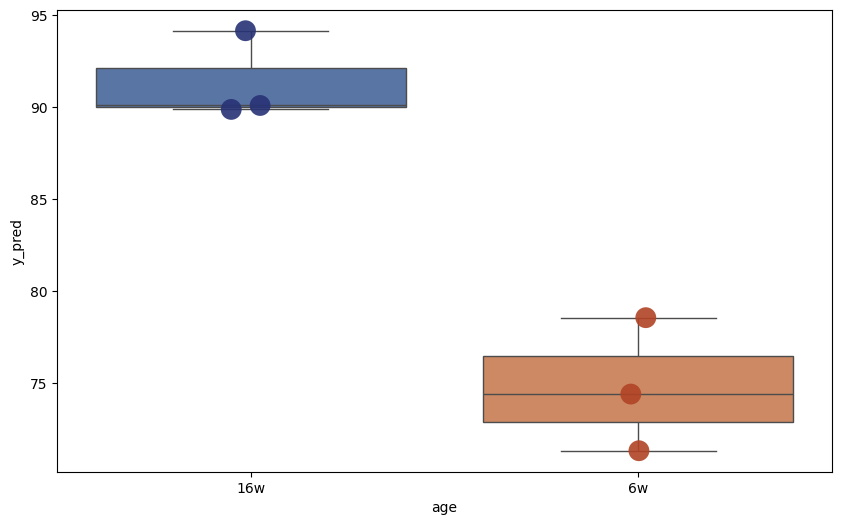

Components: 11
             y_pred
Heart_19  94.548370
Heart_18  90.617401
Heart_16  91.293342
Heart_9   75.194432
Heart_7   77.044461
Heart_6   68.565203
             y_pred  age
Heart_19  94.548370  16w
Heart_18  90.617401  16w
Heart_16  91.293342  16w
Heart_9   75.194432   6w
Heart_7   77.044461   6w
Heart_6   68.565203   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


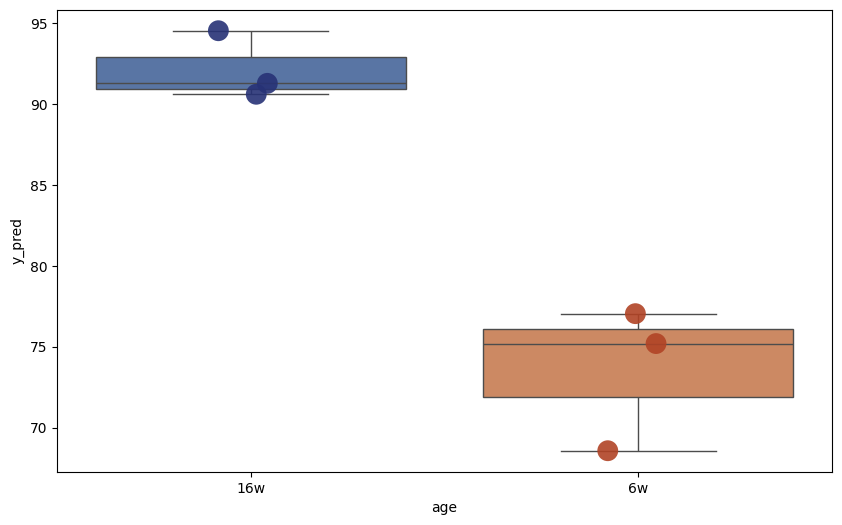

Components: 12
             y_pred
Heart_19  93.291757
Heart_18  91.387156
Heart_16  90.110806
Heart_9   73.045263
Heart_7   77.369472
Heart_6   69.762090
             y_pred  age
Heart_19  93.291757  16w
Heart_18  91.387156  16w
Heart_16  90.110806  16w
Heart_9   73.045263   6w
Heart_7   77.369472   6w
Heart_6   69.762090   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


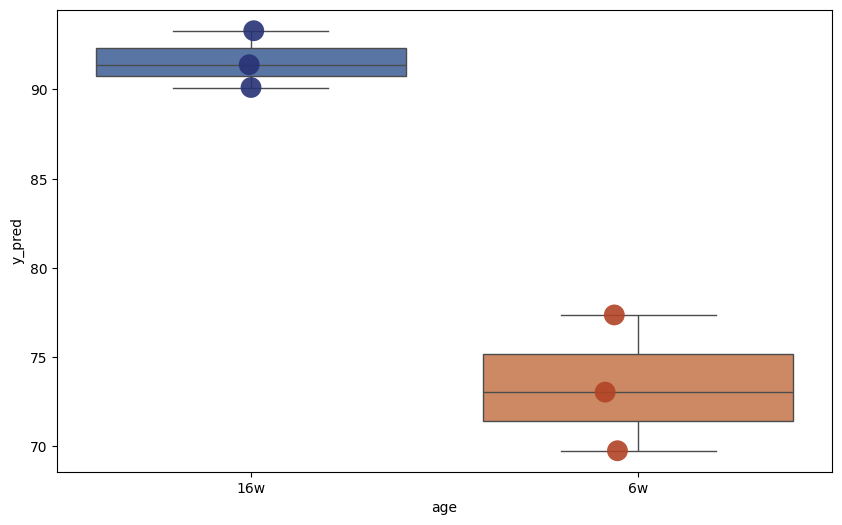

Components: 13
             y_pred
Heart_19  91.987884
Heart_18  93.858976
Heart_16  92.978755
Heart_9   72.057520
Heart_7   75.640211
Heart_6   66.830224
             y_pred  age
Heart_19  91.987884  16w
Heart_18  93.858976  16w
Heart_16  92.978755  16w
Heart_9   72.057520   6w
Heart_7   75.640211   6w
Heart_6   66.830224   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


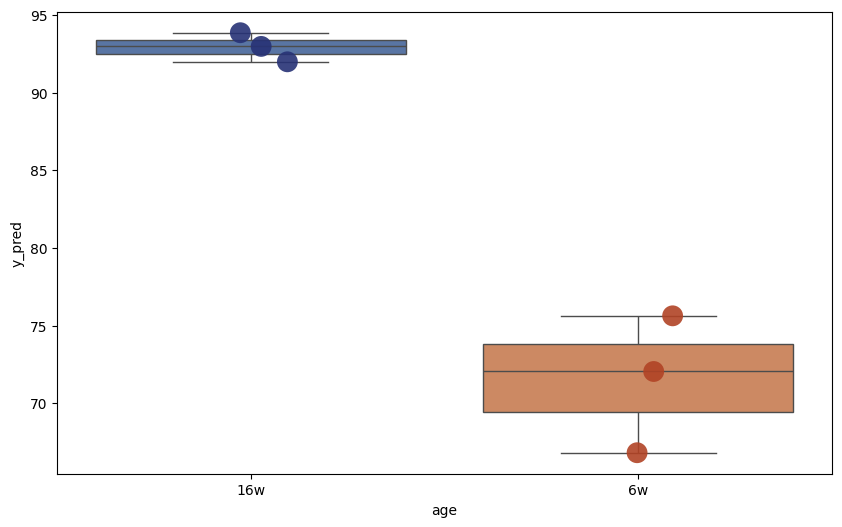

Components: 14
             y_pred
Heart_19  91.819066
Heart_18  93.528147
Heart_16  91.893389
Heart_9   72.263508
Heart_7   72.755801
Heart_6   63.157867
             y_pred  age
Heart_19  91.819066  16w
Heart_18  93.528147  16w
Heart_16  91.893389  16w
Heart_9   72.263508   6w
Heart_7   72.755801   6w
Heart_6   63.157867   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


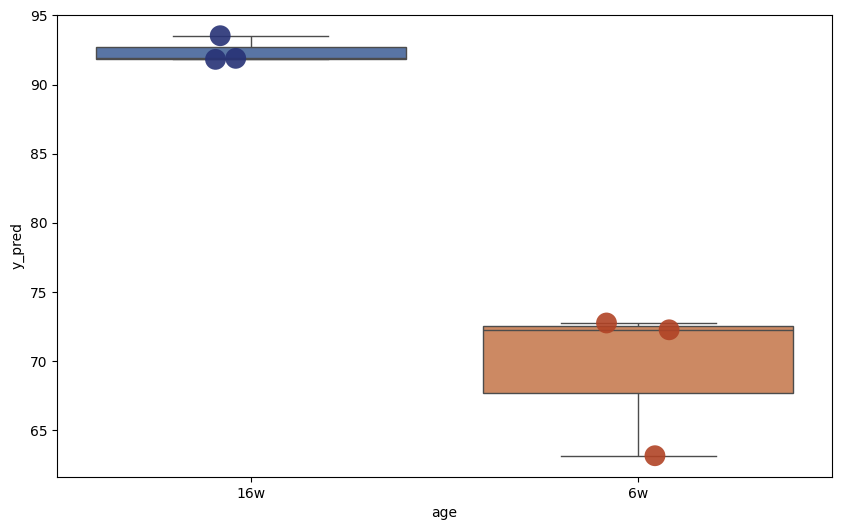

Components: 15
             y_pred
Heart_19  93.429449
Heart_18  92.889994
Heart_16  90.655104
Heart_9   68.898505
Heart_7   73.896176
Heart_6   62.887264
             y_pred  age
Heart_19  93.429449  16w
Heart_18  92.889994  16w
Heart_16  90.655104  16w
Heart_9   68.898505   6w
Heart_7   73.896176   6w
Heart_6   62.887264   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


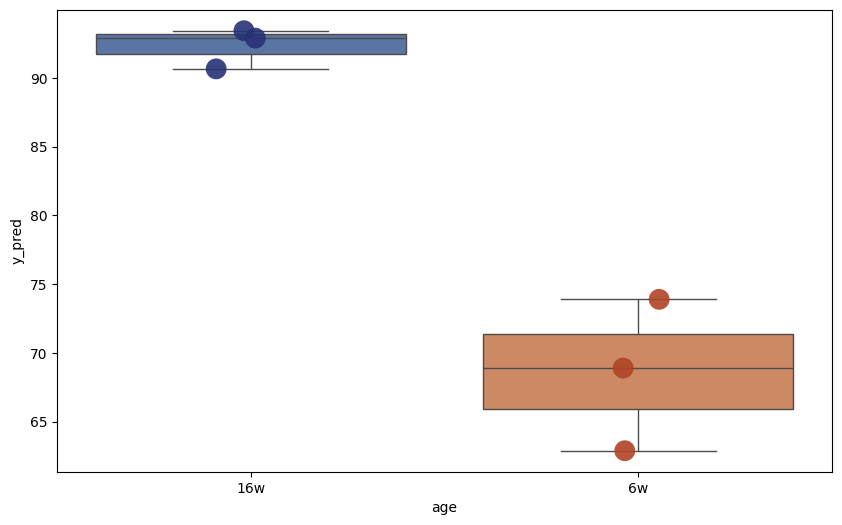

Components: 16
             y_pred
Heart_19  93.433139
Heart_18  92.890856
Heart_16  90.655347
Heart_9   68.897472
Heart_7   73.899350
Heart_6   62.886851
             y_pred  age
Heart_19  93.433139  16w
Heart_18  92.890856  16w
Heart_16  90.655347  16w
Heart_9   68.897472   6w
Heart_7   73.899350   6w
Heart_6   62.886851   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


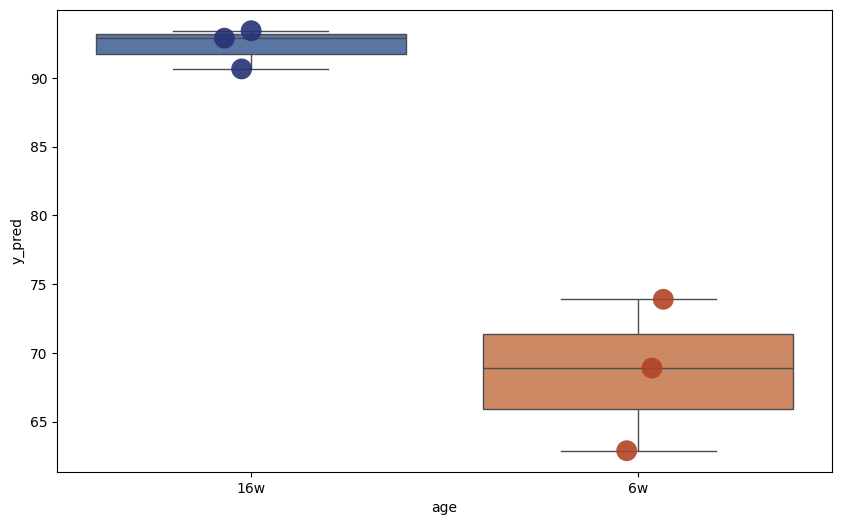

Components: 17
             y_pred
Heart_19  94.111695
Heart_18  92.519119
Heart_16  90.134920
Heart_9   67.799372
Heart_7   75.464650
Heart_6   63.502309
             y_pred  age
Heart_19  94.111695  16w
Heart_18  92.519119  16w
Heart_16  90.134920  16w
Heart_9   67.799372   6w
Heart_7   75.464650   6w
Heart_6   63.502309   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


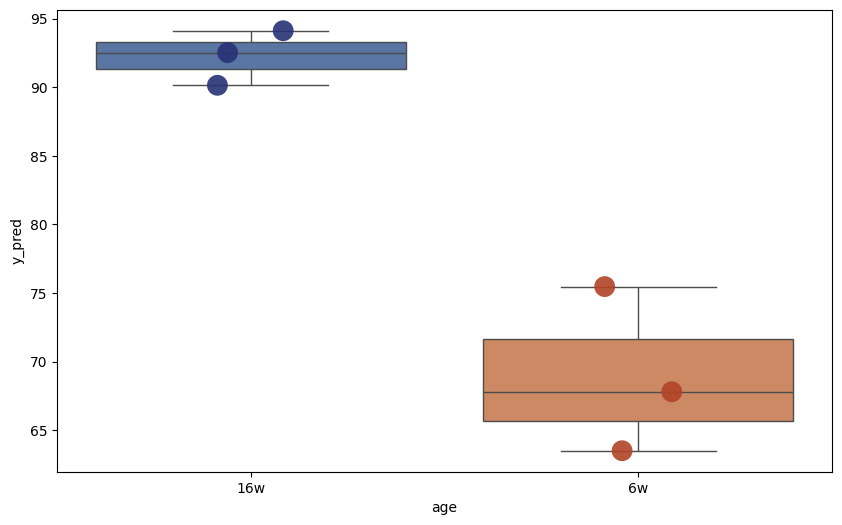

Components: 18
             y_pred
Heart_19  93.986019
Heart_18  92.357668
Heart_16  89.970796
Heart_9   67.551295
Heart_7   74.942083
Heart_6   63.194994
             y_pred  age
Heart_19  93.986019  16w
Heart_18  92.357668  16w
Heart_16  89.970796  16w
Heart_9   67.551295   6w
Heart_7   74.942083   6w
Heart_6   63.194994   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


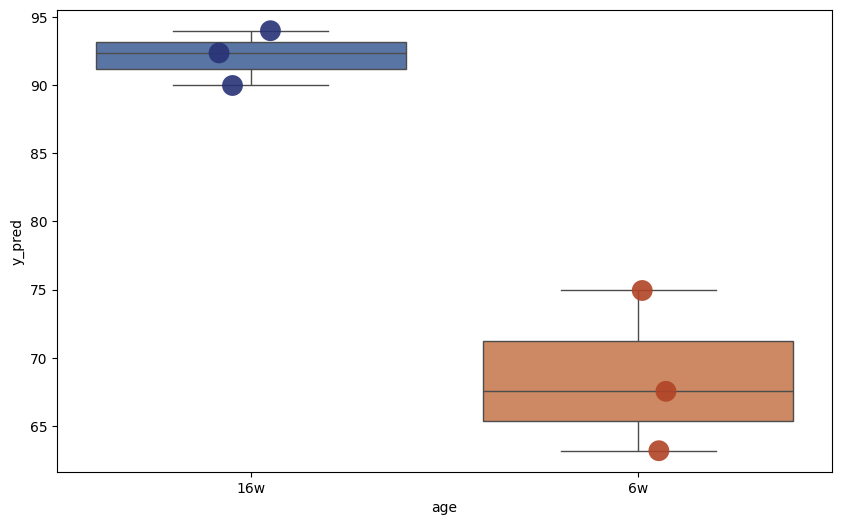

Components: 19
             y_pred
Heart_19  93.774645
Heart_18  92.776188
Heart_16  90.557395
Heart_9   66.842129
Heart_7   75.695865
Heart_6   64.282754
             y_pred  age
Heart_19  93.774645  16w
Heart_18  92.776188  16w
Heart_16  90.557395  16w
Heart_9   66.842129   6w
Heart_7   75.695865   6w
Heart_6   64.282754   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


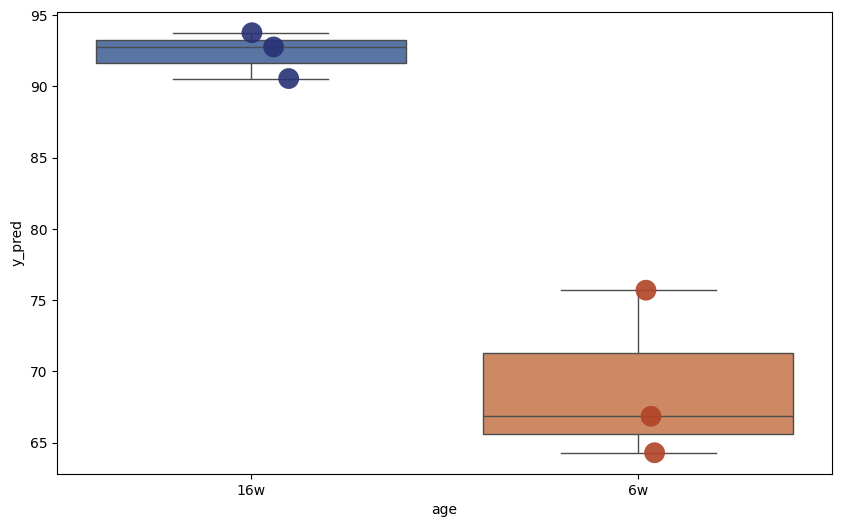

Components: 20
             y_pred
Heart_19  93.644822
Heart_18  92.734186
Heart_16  90.615625
Heart_9   66.837070
Heart_7   75.575179
Heart_6   64.066696
             y_pred  age
Heart_19  93.644822  16w
Heart_18  92.734186  16w
Heart_16  90.615625  16w
Heart_9   66.837070   6w
Heart_7   75.575179   6w
Heart_6   64.066696   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


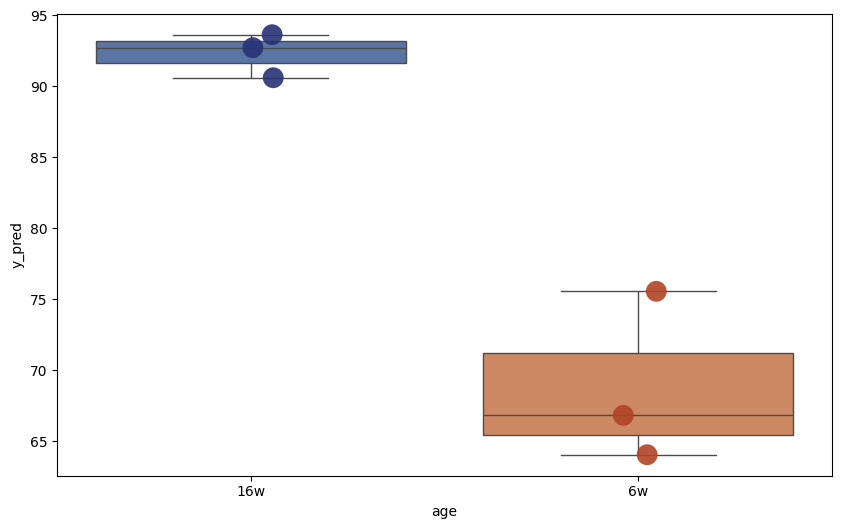

Components: 21
             y_pred
Heart_19  93.546237
Heart_18  92.667272
Heart_16  90.585794
Heart_9   66.671053
Heart_7   75.408163
Heart_6   63.841249
             y_pred  age
Heart_19  93.546237  16w
Heart_18  92.667272  16w
Heart_16  90.585794  16w
Heart_9   66.671053   6w
Heart_7   75.408163   6w
Heart_6   63.841249   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


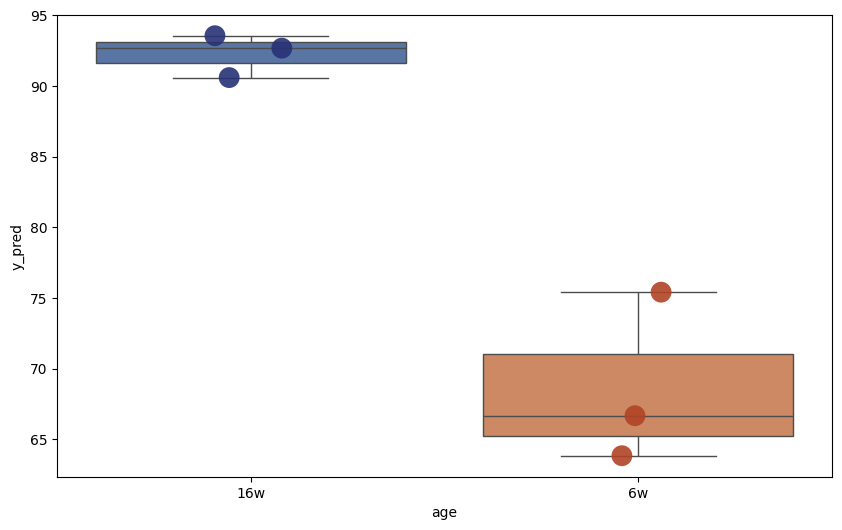

Components: 22
             y_pred
Heart_19  95.090276
Heart_18  94.014204
Heart_16  91.028767
Heart_9   66.718991
Heart_7   76.507502
Heart_6   63.546644
             y_pred  age
Heart_19  95.090276  16w
Heart_18  94.014204  16w
Heart_16  91.028767  16w
Heart_9   66.718991   6w
Heart_7   76.507502   6w
Heart_6   63.546644   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


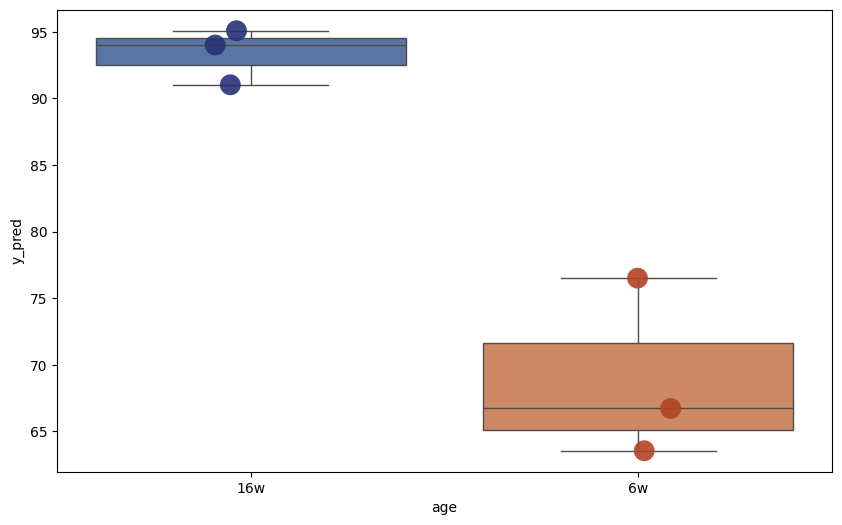

Components: 23
             y_pred
Heart_19  94.727090
Heart_18  93.947883
Heart_16  90.685967
Heart_9   67.091845
Heart_7   76.082947
Heart_6   63.494107
             y_pred  age
Heart_19  94.727090  16w
Heart_18  93.947883  16w
Heart_16  90.685967  16w
Heart_9   67.091845   6w
Heart_7   76.082947   6w
Heart_6   63.494107   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


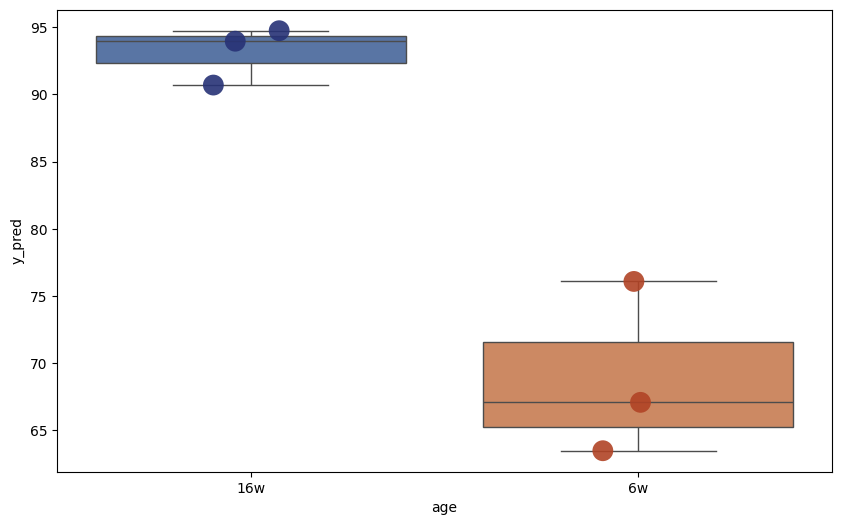

Components: 24
             y_pred
Heart_19  94.736832
Heart_18  93.954321
Heart_16  90.691318
Heart_9   67.061681
Heart_7   76.105493
Heart_6   63.507561
             y_pred  age
Heart_19  94.736832  16w
Heart_18  93.954321  16w
Heart_16  90.691318  16w
Heart_9   67.061681   6w
Heart_7   76.105493   6w
Heart_6   63.507561   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


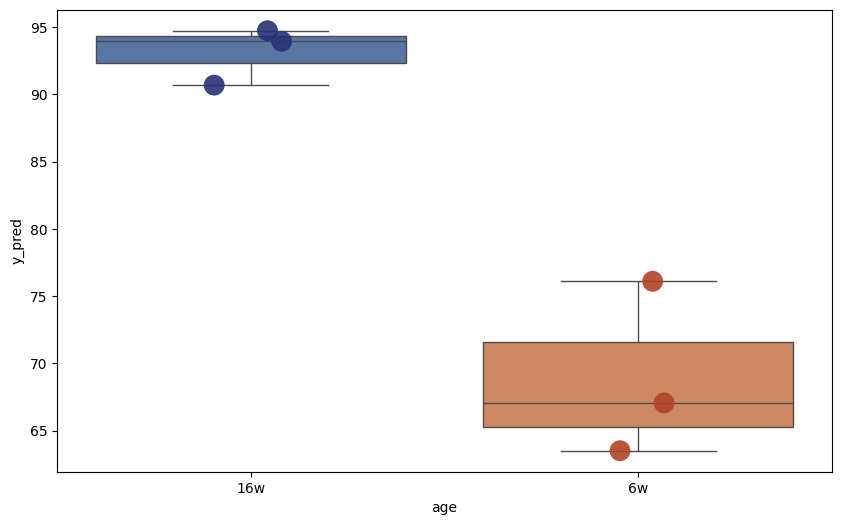

Components: 25
             y_pred
Heart_19  94.329501
Heart_18  94.559226
Heart_16  91.112868
Heart_9   66.513140
Heart_7   75.535213
Heart_6   62.596623
             y_pred  age
Heart_19  94.329501  16w
Heart_18  94.559226  16w
Heart_16  91.112868  16w
Heart_9   66.513140   6w
Heart_7   75.535213   6w
Heart_6   62.596623   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


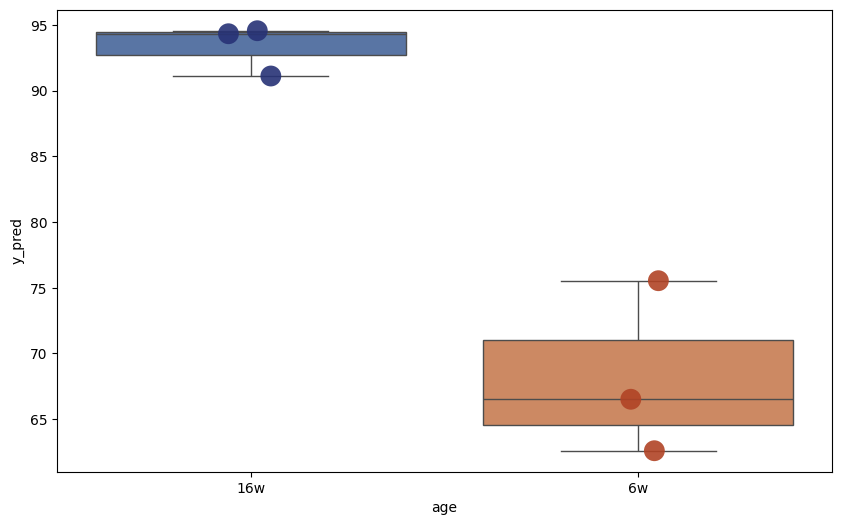

Components: 26
             y_pred
Heart_19  94.325389
Heart_18  94.557300
Heart_16  91.110392
Heart_9   66.508641
Heart_7   75.533008
Heart_6   62.595087
             y_pred  age
Heart_19  94.325389  16w
Heart_18  94.557300  16w
Heart_16  91.110392  16w
Heart_9   66.508641   6w
Heart_7   75.533008   6w
Heart_6   62.595087   6w


/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])
/local/scratch/emkcosta/slrmtmp.48651915/ipykernel_23163/3974586850.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  strip = sns.stripplot(


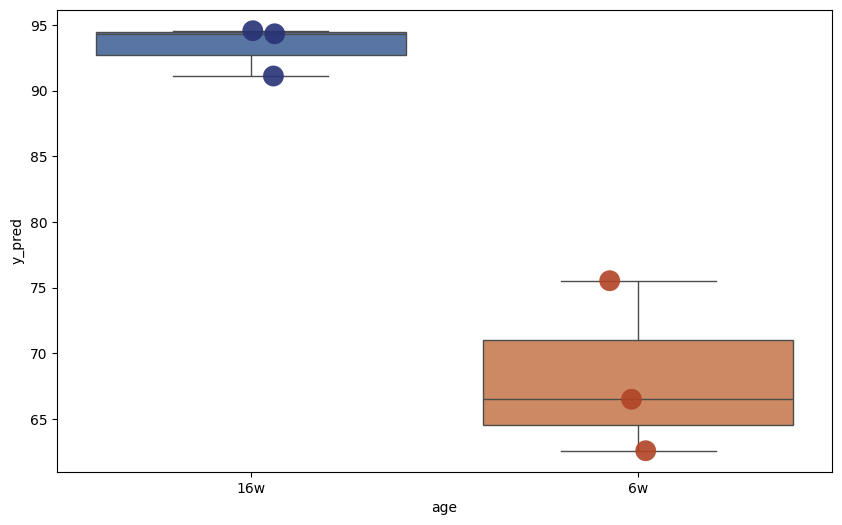

In [68]:
# Loop through all possible components to predict the test set
max_components = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
all_y_test_preds = []

for n_components in range(1, max_components + 1):
    print(f"Components: {n_components}")

    # Apply PCA
    pca = PCA(n_components=n_components, random_state=1)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train the model
    regressor = LinearRegression()
    regressor.fit(X_train_pca, age_train)

    # Predict on the test set
    y_test_pred = regressor.predict(X_test_pca)

    # Save the actual and predicted values to a DataFrame
    results_df = pd.DataFrame({
    'y_pred': y_test_pred
    }, index=df_intervention_test_female.index.tolist())

    print(results_df)

    results_df["age"] = df_intervention_test_metadata_female["age"]

    print(results_df)

    # Create the box plot
    plt.figure(figsize=(10, 6))
    box = sns.boxplot(x='age', y='y_pred', data=results_df, palette='deep', showfliers = False, whis = [0,100])

    #custom_palette = ['#FF6347', '#4682B4', '#32CD32', '#FFD700']  # Use desired hex color codes
    custom_palette = ['#273276', '#B14325']  # Use desired hex color codes

    # Add data points with custom colors
    strip = sns.stripplot(
        x='age',
        y='y_pred',
        data=results_df,
        palette=custom_palette,  # Custom color palette
        dodge=False,
        alpha=0.9,
        jitter=True,
        size=15
    )


    plt.show()



##### Select PC, export to CSV

In [213]:
n_components = 13

# Apply PCA
pca = PCA(n_components=n_components, random_state=1)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train_pca, age_train)

# Predict on the test set
y_test_pred = regressor.predict(X_test_pca)

# Save the actual and predicted values to a DataFrame
results_df_female = pd.DataFrame({
'y_pred': y_test_pred
}, index=df_intervention_test_female.index.tolist())

results_df_female["age"] = df_intervention_test_metadata_female["age"]

print(results_df_female)
results_df_female.to_csv("./AlanXu_heart_femaleOnly_Calibratedpredictions_13PCs_EC-250725.csv")

             y_pred  age
Heart_19  91.970419  16w
Heart_18  93.831558  16w
Heart_16  92.958861  16w
Heart_9   72.099788   6w
Heart_7   75.680591   6w
Heart_6   66.875952   6w


##### Sample rotation

In [73]:
# --------------------------------------------------------------------
# Config
# --------------------------------------------------------------------
OUTDIR = "./predictions_exhaustive"
os.makedirs(OUTDIR, exist_ok=True)

# If you want to cap PCs to a smaller number (e.g., 100), set here; else leave None to use full allowable range
PC_CAP = 20   # e.g., PC_CAP = 100

# --------------------------------------------------------------------
# Sample selection setup (same as your BayesAge loop)
# --------------------------------------------------------------------
all_samples = df_intervention_age_female.index

random.seed(123)

# Separate the samples
young_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] == 42]
old_samples = [s for s in all_samples if s in df_intervention_age_female.index and df_intervention_age_female.loc[s, 'age'] ==  112]

# All 2x2 combinations
young_combos = list(itertools.combinations(young_samples, 2))
old_combos   = list(itertools.combinations(old_samples, 2))

In [74]:
random.seed(123)
# --------------------------------------------------------------------
# Main loop: iterate over all combos, then sweep PC numbers
# --------------------------------------------------------------------
total_combos = len(young_combos) * len(old_combos)
combo_counter = 0

for y_combo in young_combos:
    for o_combo in old_combos:

        combo_counter += 1
        combo_id = f"{'_'.join(map(str, y_combo))}__{'_'.join(map(str, o_combo))}"
        print(f"\n[{combo_counter}/{total_combos}] Running PCR for combo: {combo_id}")


        # ----------------------------
        # Build TRAIN/ATLAS combined
        # ----------------------------
        select_train_samples = list(y_combo) + list(o_combo)

        df_intervention_train_full = df_intervention_age_female.loc[select_train_samples]

        # Use tissue_df_age (counts + age + meta) for atlas, then append intervention rows
        atlas_plus_intervention_female = pd.concat([tissue_df_female_age, df_intervention_train_full], axis=0)

        # Age target (pull BEFORE dropping meta columns)
        y_train_age = atlas_plus_intervention_female['age'].astype(float)

        # Training features: drop metadata columns by your index pattern
        X_train_counts = atlas_plus_intervention_female.drop(
            atlas_plus_intervention_female.columns[[-1,-2, -3, -4]], axis=1
        )

        # ----------------------------
        # Build TEST matrices/metadata
        # ----------------------------
        test_samples = [s for s in df_intervention_age_female.index if s not in select_train_samples]
        df_intervention_test_full = df_intervention_age_female.loc[test_samples]

        # Drop the same metadata columns for TEST and align to train columns
        X_test_counts = df_intervention_test_full.drop(
            df_intervention_test_full.columns[[-1,-2, -3, -4]], axis=1
        )
        X_test_counts = X_test_counts[X_train_counts.columns]

        # Test metadata for annotations
        test_meta = df_intervention_age_female.loc[
            test_samples, ['age']
        ].copy()

        # ----------------------------
        # Scale and PCR
        # ----------------------------
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_counts.values)
        X_test_scaled  = scaler.transform(X_test_counts.values)

        # Determine allowable PCs
        max_components_allowed = min(X_train_scaled.shape[0], X_train_scaled.shape[1])
        if PC_CAP is not None:
            max_components_allowed = min(max_components_allowed, PC_CAP)

        for n_components in range(1, max_components_allowed + 1):
            print(f"  PCs: {n_components}")

            # PCA on training, transform both
            pca = PCA(n_components=n_components,svd_solver = 'full', random_state=1)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca  = pca.transform(X_test_scaled)

            # Linear regression on PCs → age
            regressor = LinearRegression()
            regressor.fit(X_train_pca, y_train_age.values)

            # Predict for test samples
            y_test_pred = regressor.predict(X_test_pca)

            # Package output with metadata
            df_pred = pd.DataFrame({'y_pred': y_test_pred}, index=test_samples)
            df_pred = df_pred.join(test_meta, how='left').sort_values(by="age")

            # Save
            out_prefix = f"PCR_pred_{combo_id}_pc{n_components:03d}"
            out_path = os.path.join(OUTDIR, f"{out_prefix}.tsv")
            df_pred.to_csv(out_path, sep="\t")



[1/100] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_19
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[2/100] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_18
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[3/100] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_17
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PCs: 17
  PCs: 18
  PCs: 19
  PCs: 20

[4/100] Running PCR for combo: Heart_10_Heart_9__Heart_20_Heart_16
  PCs: 1
  PCs: 2
  PCs: 3
  PCs: 4
  PCs: 5
  PCs: 6
  PCs: 7
  PCs: 8
  PCs: 9
  PCs: 10
  PCs: 11
  PCs: 12
  PCs: 13
  PCs: 14
  PCs: 15
  PCs: 16
  PC